# 🌱 Plant Disease Detection Using Deep Learning
## Tomato Leaf Disease Classification

### Project Objective
Develop an image classification system that identifies tomato leaf diseases from images.

### Project Pipeline
1. Exploratory Data Analysis (EDA)
2. Data Cleaning
3. Balanced Dataset Creation
4. Train / Validation / Test Split
5. Image Preprocessing
6. Data Augmentation
7. CNN From Scratch
8. Transfer Learning with MobileNetV2
9. Model Evaluation
10. Model Comparison
11. Error Analysis
12. Optional Fine-Tuning

## 1. Import Libraries

In [1]:
import os
import random
import shutil
import hashlib
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models

from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_score,
    recall_score,
    f1_score
)

SEED = 42

random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)

print("TensorFlow version:", tf.__version__)

TensorFlow version: 2.10.0


In [2]:
from pathlib import Path
import pandas as pd

# Path to the dataset on your computer
DATA_DIR = Path(r"C:\Users\Zizo\Desktop\NTI_Final\tomato\train")

# Supported image formats
VALID_EXTENSIONS = [".jpg", ".jpeg", ".png", ".bmp"]

# Read image paths and their class labels
data = []

for class_folder in sorted(DATA_DIR.iterdir()):
    if class_folder.is_dir():

        class_name = class_folder.name

        for image_path in class_folder.rglob("*"):
            if image_path.is_file() and image_path.suffix.lower() in VALID_EXTENSIONS:

                data.append({
                    "filepath": str(image_path),
                    "class": class_name
                })

# Create DataFrame
df = pd.DataFrame(data)

print("Dataset successfully loaded!")
print(f"Total images: {len(df):,}")
print(f"Number of classes: {df['class'].nunique()}")

df.head()

Dataset successfully loaded!
Total images: 25,851
Number of classes: 11


,filepath,class
0,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot
1,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot
2,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot
3,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot
4,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot


## 2. Project Configuration

In [3]:
IMG_SIZE = (224, 224)
BATCH_SIZE = 32

# Target number of images per class for the balanced subset.
SAMPLES_PER_CLASS = 800

EPOCHS_CNN = 25
EPOCHS_TRANSFER = 20

VALID_EXTENSIONS = [".jpg", ".jpeg", ".png", ".bmp"]

print("Image size:", IMG_SIZE)
print("Batch size:", BATCH_SIZE)
print("Samples per class:", SAMPLES_PER_CLASS)

Image size: (224, 224)
Batch size: 32
Samples per class: 800


## 3. Dataset Path

**Set `DATA_DIR` to the extracted Kaggle dataset directory.**

Do not assume the folder structure. The next cells inspect it first.

In [4]:
# CHANGE THIS PATH to your extracted Kaggle dataset folder.
DATA_DIR = Path(r"C:\Users\Zizo\Desktop\NTI_Final\tomato\train")

print("Dataset exists:", DATA_DIR.exists())

if DATA_DIR.exists():
    print("\nTop-level contents:")
    for item in DATA_DIR.iterdir():
        print(item)
else:
    print("Update DATA_DIR before continuing.")

Dataset exists: True

Top-level contents:
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Bacterial_spot
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Early_blight
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\healthy
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Late_blight
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Leaf_Mold
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\powdery_mildew
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Septoria_leaf_spot
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Spider_mites Two-spotted_spider_mite
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Target_Spot
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Tomato_mosaic_virus
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Tomato_Yellow_Leaf_Curl_Virus


## 4. Inspect Dataset Folder Structure

In [5]:
for root, dirs, files in os.walk(DATA_DIR):
    depth = Path(root).relative_to(DATA_DIR).parts
    if len(depth) <= 3:
        print(f"{root} | folders={len(dirs)} | files={len(files)}")

C:\Users\Zizo\Desktop\NTI_Final\tomato\train | folders=11 | files=0
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Bacterial_spot | folders=0 | files=2826
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Early_blight | folders=0 | files=2455
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\healthy | folders=0 | files=3051
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Late_blight | folders=0 | files=3113
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Leaf_Mold | folders=0 | files=2754
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\powdery_mildew | folders=0 | files=1004
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Septoria_leaf_spot | folders=0 | files=2882
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Spider_mites Two-spotted_spider_mite | folders=0 | files=1747
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Target_Spot | folders=0 | files=1827
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Tomato_mosaic_virus | folders=0 | files=2153
C:\Users\Zizo\Desktop\NTI_Final\tomato\train\Tomato_Yellow_Leaf_Curl_Vi

### Select the Class Directory

Set `CLASS_DIR` to the folder whose immediate subfolders are the disease classes.

For example:
`CLASS_DIR = Path("/content/tomato_dataset/Tomato")`

In [6]:
# CHANGE THIS if your class folders are inside a subfolder.
CLASS_DIR = DATA_DIR

print("Class directory:", CLASS_DIR)

Class directory: C:\Users\Zizo\Desktop\NTI_Final\tomato\train


## 5. Identify Disease Classes

In [7]:
class_names = sorted([
    folder.name
    for folder in CLASS_DIR.iterdir()
    if folder.is_dir()
])

print("Number of classes:", len(class_names))
print("\nDisease classes:")
for i, class_name in enumerate(class_names):
    print(f"{i}: {class_name}")

Number of classes: 11

Disease classes:
0: Bacterial_spot
1: Early_blight
2: Late_blight
3: Leaf_Mold
4: Septoria_leaf_spot
5: Spider_mites Two-spotted_spider_mite
6: Target_Spot
7: Tomato_Yellow_Leaf_Curl_Virus
8: Tomato_mosaic_virus
9: healthy
10: powdery_mildew


## 6. Build the Initial Image DataFrame

In [8]:
data = []

for class_name in class_names:
    class_path = CLASS_DIR / class_name

    for image_path in class_path.rglob("*"):
        if image_path.is_file() and image_path.suffix.lower() in VALID_EXTENSIONS:
            data.append({
                "filepath": str(image_path),
                "class": class_name
            })

df = pd.DataFrame(data)

print("Dataset shape:", df.shape)
print("Total images:", len(df))
print("Number of classes:", df["class"].nunique())

df.head()

Dataset shape: (25851, 2)
Total images: 25851
Number of classes: 11


,filepath,class
0,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot
1,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot
2,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot
3,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot
4,C:\Users\Zizo\Desktop\NTI_Final\tomato\train\B...,Bacterial_spot


## 7. Basic Dataset Inspection

In [9]:
print("Columns:")
print(df.columns.tolist())

print("\nMissing values:")
print(df.isnull().sum())

print("\nDuplicate rows:")
print(df.duplicated().sum())

Columns:
['filepath', 'class']

Missing values:
filepath    0
class       0
dtype: int64

Duplicate rows:
0


## 8. Class Distribution

In [10]:
class_distribution = df["class"].value_counts().sort_index()

print(class_distribution)

class
Bacterial_spot                          2826
Early_blight                            2455
Late_blight                             3113
Leaf_Mold                               2754
Septoria_leaf_spot                      2882
Spider_mites Two-spotted_spider_mite    1747
Target_Spot                             1827
Tomato_Yellow_Leaf_Curl_Virus           2039
Tomato_mosaic_virus                     2153
healthy                                 3051
powdery_mildew                          1004
Name: count, dtype: int64


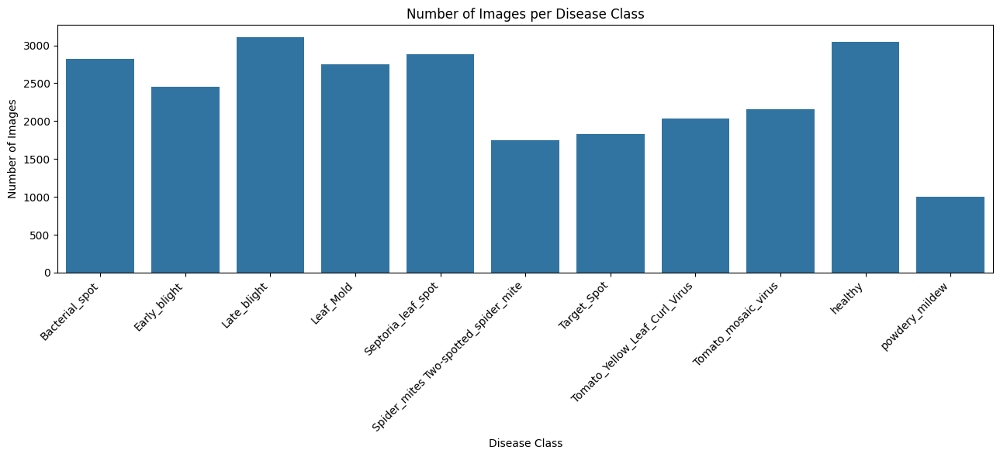

In [11]:
plt.figure(figsize=(13, 6))

sns.barplot(
    x=class_distribution.index,
    y=class_distribution.values
)

plt.title("Number of Images per Disease Class")
plt.xlabel("Disease Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

### EDA Observation

The class distribution is inspected before modelling to identify possible class imbalance.
If class sizes differ substantially, the model may become biased toward classes with more
training examples. A balanced subset will therefore be created after the data-quality checks.

## 9. Inspect Image Dimensions, Modes, and Formats

In [12]:
image_info = []
failed_to_read = []

for filepath in df["filepath"]:
    try:
        with Image.open(filepath) as img:
            image_info.append({
                "filepath": filepath,
                "width": img.width,
                "height": img.height,
                "mode": img.mode,
                "format": img.format
            })
    except Exception:
        failed_to_read.append(filepath)

image_info_df = pd.DataFrame(image_info)

print("Images successfully inspected:", len(image_info_df))
print("Images that could not be opened:", len(failed_to_read))

Images successfully inspected: 25851
Images that could not be opened: 0


In [13]:
print("Width statistics:")
print(image_info_df["width"].describe())

print("\nHeight statistics:")
print(image_info_df["height"].describe())

print("\nImage modes:")
print(image_info_df["mode"].value_counts())

print("\nImage formats:")
print(image_info_df["format"].value_counts())

Width statistics:
count    25851.000000
mean       292.516228
std        170.112897
min        130.000000
25%        256.000000
50%        256.000000
75%        256.000000
max       6000.000000
Name: width, dtype: float64

Height statistics:
count    25851.000000
mean       301.532552
std        175.284807
min         69.000000
25%        256.000000
50%        256.000000
75%        256.000000
max       6000.000000
Name: height, dtype: float64

Image modes:
mode
RGB     25498
RGBA      353
Name: count, dtype: int64

Image formats:
format
JPEG    25497
PNG       353
WEBP        1
Name: count, dtype: int64


## 10. Image Dimension Visualization

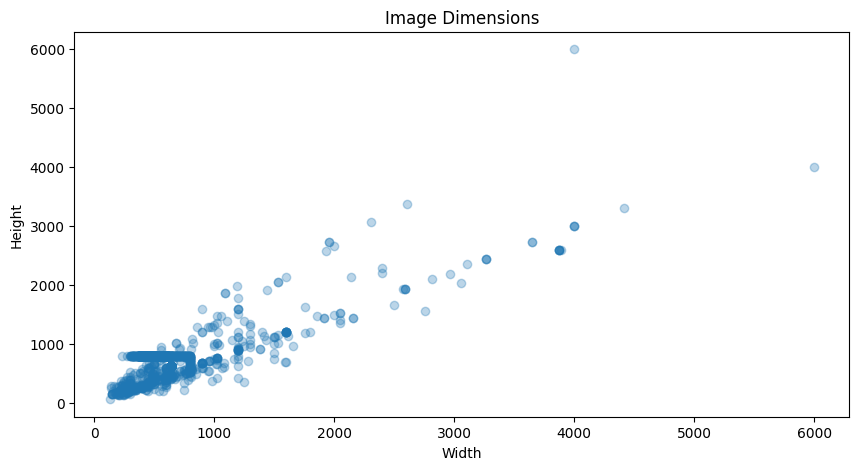

In [14]:
plt.figure(figsize=(10, 5))

plt.scatter(
    image_info_df["width"],
    image_info_df["height"],
    alpha=0.3
)

plt.xlabel("Width")
plt.ylabel("Height")
plt.title("Image Dimensions")

plt.show()

## 11. Sample Images From Every Class

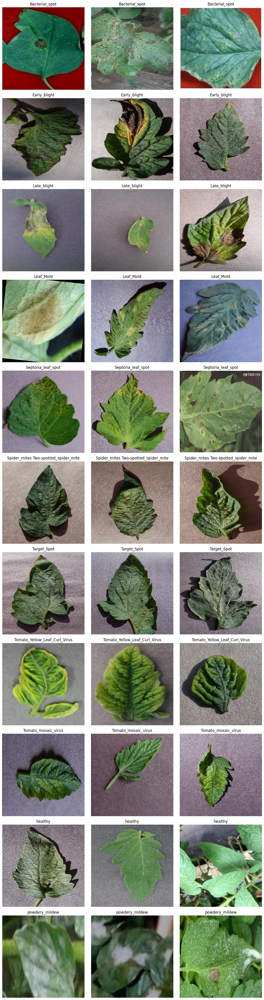

In [15]:
n_cols = 3
n_rows = len(class_names)

fig, axes = plt.subplots(
    n_rows,
    n_cols,
    figsize=(12, 4 * n_rows)
)

if n_rows == 1:
    axes = np.array([axes])

for row, class_name in enumerate(class_names):
    class_files = df[df["class"] == class_name]["filepath"]

    samples = class_files.sample(
        min(3, len(class_files)),
        random_state=SEED
    ).tolist()

    for col in range(n_cols):
        ax = axes[row, col]

        if col < len(samples):
            image = Image.open(samples[col])
            ax.imshow(image)
            ax.set_title(class_name)
        ax.axis("off")

plt.tight_layout()
plt.show()

# 12. Data Cleaning

We now check the image files for:
- Corrupted/unreadable images
- Unsupported files
- Duplicate images
- Missing values
- Invalid image dimensions

Only actual problematic files will be removed. We will not modify valid images unnecessarily.

## 13. Detect Corrupted / Unreadable Images

In [16]:
def check_image(image_path):
    try:
        with Image.open(image_path) as img:
            img.verify()

        # Re-open after verify to ensure the image can actually be loaded.
        with Image.open(image_path) as img:
            img.load()

        return True
    except Exception:
        return False


corrupted_images = []

for filepath in df["filepath"]:
    if not check_image(filepath):
        corrupted_images.append(filepath)

print("Corrupted/unreadable images:", len(corrupted_images))

if corrupted_images:
    print("\nExamples:")
    for path in corrupted_images[:10]:
        print(path)

Corrupted/unreadable images: 0


## 14. Remove Corrupted Images From the Working DataFrame

In [17]:
if corrupted_images:
    df = df[~df["filepath"].isin(corrupted_images)].reset_index(drop=True)

print("Dataset size after corrupted-image cleaning:", len(df))

Dataset size after corrupted-image cleaning: 25851


## 15. Detect Exact Duplicate Images

In [18]:
def get_file_hash(filepath):
    hash_md5 = hashlib.md5()

    with open(filepath, "rb") as f:
        for chunk in iter(lambda: f.read(4096), b""):
            hash_md5.update(chunk)

    return hash_md5.hexdigest()


hashes = {}
duplicate_files = []

for filepath in df["filepath"]:
    try:
        file_hash = get_file_hash(filepath)

        if file_hash in hashes:
            duplicate_files.append(filepath)
        else:
            hashes[file_hash] = filepath

    except Exception:
        pass

print("Exact duplicate files found:", len(duplicate_files))

Exact duplicate files found: 622


## 16. Remove Exact Duplicates

In [19]:
if duplicate_files:
    df = df[~df["filepath"].isin(duplicate_files)].reset_index(drop=True)

print("Dataset size after duplicate removal:", len(df))

Dataset size after duplicate removal: 25229


## 17. Final Data-Quality Check

In [20]:
print("Final dataset shape:", df.shape)

print("\nMissing values:")
print(df.isnull().sum())

print("\nDuplicate rows:")
print(df.duplicated().sum())

print("\nImages per class:")
print(df["class"].value_counts().sort_index())

Final dataset shape: (25229, 2)

Missing values:
filepath    0
class       0
dtype: int64

Duplicate rows:
0

Images per class:
class
Bacterial_spot                          2826
Early_blight                            2240
Late_blight                             3017
Leaf_Mold                               2532
Septoria_leaf_spot                      2877
Spider_mites Two-spotted_spider_mite    1747
Target_Spot                             1827
Tomato_Yellow_Leaf_Curl_Virus           2039
Tomato_mosaic_virus                     2153
healthy                                 2967
powdery_mildew                          1004
Name: count, dtype: int64


## 18. Re-check Image Information After Cleaning

In [21]:
clean_image_info = []

for filepath in df["filepath"]:
    try:
        with Image.open(filepath) as img:
            clean_image_info.append({
                "filepath": filepath,
                "width": img.width,
                "height": img.height,
                "mode": img.mode,
                "format": img.format
            })
    except Exception:
        pass

clean_image_info_df = pd.DataFrame(clean_image_info)

print(clean_image_info_df["mode"].value_counts())
print("\n", clean_image_info_df["format"].value_counts())

mode
RGB     24877
RGBA      352
Name: count, dtype: int64

 format
JPEG    24876
PNG       352
WEBP        1
Name: count, dtype: int64


# 19. Create a Balanced Subset

To keep the project realistic for a two-day deadline, we use up to 600 images per class.

The sampling is reproducible using `random_state=SEED`.

**Important:** This subset is created only after the EDA and cleaning phase.

In [22]:
available_per_class = df["class"].value_counts().sort_index()

print("Available images per class:")
print(available_per_class)

if available_per_class.min() < SAMPLES_PER_CLASS:
    print(
        f"\nWarning: At least one class has fewer than {SAMPLES_PER_CLASS} images."
    )
    print(
        "The code will automatically use the maximum available number for that class."
    )

Available images per class:
class
Bacterial_spot                          2826
Early_blight                            2240
Late_blight                             3017
Leaf_Mold                               2532
Septoria_leaf_spot                      2877
Spider_mites Two-spotted_spider_mite    1747
Target_Spot                             1827
Tomato_Yellow_Leaf_Curl_Virus           2039
Tomato_mosaic_virus                     2153
healthy                                 2967
powdery_mildew                          1004
Name: count, dtype: int64


In [23]:
balanced_df = pd.concat([
    group.sample(n=min(SAMPLES_PER_CLASS, len(group)), random_state=SEED)
    for _, group in df.groupby("class")
]).reset_index(drop=True)

print("Balanced subset size:", len(balanced_df))
print("\nImages per class:")
print(balanced_df["class"].value_counts().sort_index())


Balanced subset size: 8800

Images per class:
class
Bacterial_spot                          800
Early_blight                            800
Late_blight                             800
Leaf_Mold                               800
Septoria_leaf_spot                      800
Spider_mites Two-spotted_spider_mite    800
Target_Spot                             800
Tomato_Yellow_Leaf_Curl_Virus           800
Tomato_mosaic_virus                     800
healthy                                 800
powdery_mildew                          800
Name: count, dtype: int64


## 20. Balanced Dataset Distribution

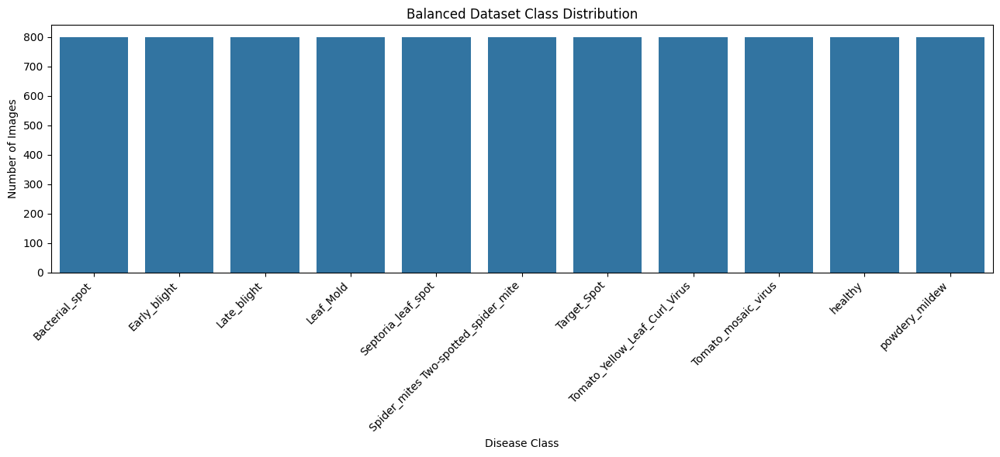

In [24]:
balanced_counts = balanced_df["class"].value_counts().sort_index()

plt.figure(figsize=(13, 6))

sns.barplot(
    x=balanced_counts.index,
    y=balanced_counts.values
)

plt.title("Balanced Dataset Class Distribution")
plt.xlabel("Disease Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

# 21. Create Balanced Dataset Directory

The balanced subset is copied into a separate directory so that the original dataset remains untouched.

In [25]:
BALANCED_DIR = Path("/content/tomato_balanced")

if BALANCED_DIR.exists():
    shutil.rmtree(BALANCED_DIR)

BALANCED_DIR.mkdir(parents=True)

for class_name in class_names:
    (BALANCED_DIR / class_name).mkdir(parents=True)

for _, row in balanced_df.iterrows():
    source = Path(row["filepath"])
    destination = BALANCED_DIR / row["class"] / source.name

    # Prevent accidental filename collisions.
    if destination.exists():
        destination = BALANCED_DIR / row["class"] / f"{source.stem}_{hash(source)}{source.suffix}"

    shutil.copy2(source, destination)

print("Balanced dataset created at:", BALANCED_DIR)

Balanced dataset created at: \content\tomato_balanced


# 22. Train / Validation / Test Split

We use:
- 70% Training
- 15% Validation
- 15% Test

The test set is kept separate and is only used for final evaluation.

In [26]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    BALANCED_DIR,
    validation_split=0.30,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int",
    shuffle=True
)

temp_ds = tf.keras.utils.image_dataset_from_directory(
    BALANCED_DIR,
    validation_split=0.30,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE,
    label_mode="int",
    shuffle=True
)

class_names_tf = train_ds.class_names

print("TensorFlow class order:")
for i, name in enumerate(class_names_tf):
    print(i, "->", name)

Found 8800 files belonging to 11 classes.
Using 6160 files for training.


Found 8800 files belonging to 11 classes.
Using 2640 files for validation.
TensorFlow class order:
0 -> Bacterial_spot
1 -> Early_blight
2 -> Late_blight
3 -> Leaf_Mold
4 -> Septoria_leaf_spot
5 -> Spider_mites Two-spotted_spider_mite
6 -> Target_Spot
7 -> Tomato_Yellow_Leaf_Curl_Virus
8 -> Tomato_mosaic_virus
9 -> healthy
10 -> powdery_mildew


In [27]:
temp_batches = tf.data.experimental.cardinality(temp_ds).numpy()

test_batches = temp_batches // 2

test_ds = temp_ds.take(test_batches)
val_ds = temp_ds.skip(test_batches)

print("Train batches:", tf.data.experimental.cardinality(train_ds).numpy())
print("Validation batches:", tf.data.experimental.cardinality(val_ds).numpy())
print("Test batches:", tf.data.experimental.cardinality(test_ds).numpy())

Train batches: 193
Validation batches: 42
Test batches: 41


### Split Note

The dataset is shuffled with a fixed seed and split into training, validation, and test sets.
For a stronger production/research pipeline, the safest approach is to ensure near-duplicate or
augmented versions of the same original image never cross the train/test boundary. Because this
dataset may contain pre-augmented images, inspect its source organization before interpreting
very high test performance.

## 23. Optimize TensorFlow Data Pipeline

In [28]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)

# 24. Image Preprocessing and Data Augmentation

Images are resized to 224×224 because this is the input size used by our CNN and MobileNetV2.

Augmentation is applied only to the training pipeline through the model.

In [29]:
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.15),
    layers.RandomZoom(0.15),
    layers.RandomTranslation(
        height_factor=0.10,
        width_factor=0.10
    )
], name="data_augmentation")

## 25. Visualize Data Augmentation

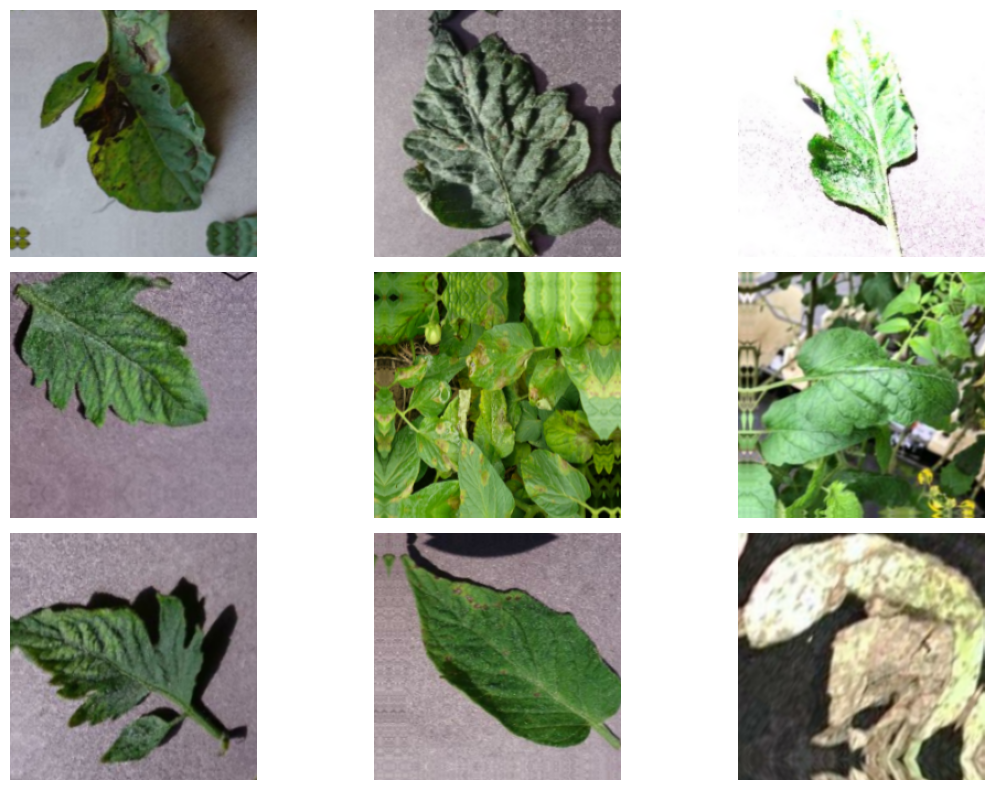

In [30]:
for images, labels in train_ds.take(1):

    plt.figure(figsize=(12, 8))

    for i in range(min(9, len(images))):
        augmented_image = data_augmentation(
            tf.expand_dims(images[i], 0),
            training=True
        )[0]

        plt.subplot(3, 3, i + 1)
        plt.imshow(
            tf.cast(augmented_image, tf.uint8).numpy()
        )
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# 🧠 26. Model 1 — CNN From Scratch

This model serves as our baseline deep learning model.

Architecture:
- Convolutional layers for feature extraction
- Max pooling for spatial downsampling
- Dense layers for classification
- Dropout for regularization
- Softmax output for multi-class classification

In [31]:
num_classes = len(class_names_tf)

cnn_model = models.Sequential([
    layers.Input(shape=(224, 224, 3)),

    data_augmentation,

    layers.Rescaling(1./255),

    # Convolution Block 1
    layers.Conv2D(32, (3, 3), activation="relu"),
    layers.MaxPooling2D((2, 2)),

    # Convolution Block 2
    layers.Conv2D(64, (3, 3), activation="relu"),
    layers.MaxPooling2D((2, 2)),

    # Convolution Block 3
    layers.Conv2D(128, (3, 3), activation="relu"),
    layers.MaxPooling2D((2, 2)),

    # Convolution Block 4
    layers.Conv2D(256, (3, 3), activation="relu"),
    layers.MaxPooling2D((2, 2)),

    # Classification
    layers.Flatten(),
    layers.Dense(128, activation="relu"),
    layers.Dropout(0.5),
    layers.Dense(num_classes, activation="softmax")
])

cnn_model.summary()

Model: "sequential"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 data_augmentation (Sequenti  (None, 224, 224, 3)      0         


 al)                                                             


 rescaling (Rescaling)       (None, 224, 224, 3)       0         


 conv2d (Conv2D)             (None, 222, 222, 32)      896       


 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         


 )                                                               


 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     


 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         


 2D)                                                             


 conv2d_2 (Conv2D)           (None, 52, 52, 128)       73856     


 max_pooling2d_2 (MaxPooling  (None, 26, 26, 128)      0         


 2D)                                                             


 conv2d_3 (Conv2D)           (None, 24, 24, 256)       295168    


 max_pooling2d_3 (MaxPooling  (None, 12, 12, 256)      0         


 2D)                                                             


 flatten (Flatten)           (None, 36864)             0         


 dense (Dense)               (None, 128)               4718720   


 dropout (Dropout)           (None, 128)               0         


 dense_1 (Dense)             (None, 11)                1419      


Total params: 5,108,555


Trainable params: 5,108,555


Non-trainable params: 0


_________________________________________________________________


## 27. Compile CNN

In [32]:
cnn_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.001),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

## 28. Training Callbacks

In [33]:
early_stopping = keras.callbacks.EarlyStopping(
    monitor="val_loss",
    patience=5,
    restore_best_weights=True
)

reduce_lr = keras.callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.2,
    patience=2,
    min_lr=1e-6
)

## 29. Train CNN

In [34]:
history_cnn = cnn_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_CNN,
    callbacks=[
        early_stopping,
        reduce_lr
    ]
)

Epoch 1/25


  1/193 [..............................] - ETA: 35:06 - loss: 2.4032 - accuracy: 0.1250

  2/193 [..............................] - ETA: 1:11 - loss: 2.5073 - accuracy: 0.1719 

  3/193 [..............................] - ETA: 1:11 - loss: 2.5021 - accuracy: 0.1250

  4/193 [..............................] - ETA: 1:11 - loss: 2.4786 - accuracy: 0.1094

  5/193 [..............................] - ETA: 1:10 - loss: 2.4674 - accuracy: 0.0875

  6/193 [..............................] - ETA: 1:09 - loss: 2.4548 - accuracy: 0.0938

  7/193 [>.............................] - ETA: 1:09 - loss: 2.4461 - accuracy: 0.0848

  8/193 [>.............................] - ETA: 1:08 - loss: 2.4413 - accuracy: 0.0781

  9/193 [>.............................] - ETA: 1:08 - loss: 2.4362 - accuracy: 0.0868

 10/193 [>.............................] - ETA: 1:08 - loss: 2.4321 - accuracy: 0.0844

 11/193 [>.............................] - ETA: 1:08 - loss: 2.4288 - accuracy: 0.0852

 12/193 [>.............................] - ETA: 1:07 - loss: 2.4272 - accuracy: 0.0885

 13/193 [=>............................] - ETA: 1:07 - loss: 2.4243 - accuracy: 0.0889

 14/193 [=>............................] - ETA: 1:07 - loss: 2.4199 - accuracy: 0.0960

 15/193 [=>............................] - ETA: 1:07 - loss: 2.4199 - accuracy: 0.0979

 16/193 [=>............................] - ETA: 1:06 - loss: 2.4196 - accuracy: 0.0977

 17/193 [=>............................] - ETA: 1:06 - loss: 2.4188 - accuracy: 0.0938

 18/193 [=>............................] - ETA: 1:06 - loss: 2.4176 - accuracy: 0.0955

 19/193 [=>............................] - ETA: 1:05 - loss: 2.4169 - accuracy: 0.0938

 20/193 [==>...........................] - ETA: 1:05 - loss: 2.4155 - accuracy: 0.0969

 21/193 [==>...........................] - ETA: 1:05 - loss: 2.4143 - accuracy: 0.0982

 22/193 [==>...........................] - ETA: 1:04 - loss: 2.4137 - accuracy: 0.0994

 23/193 [==>...........................] - ETA: 1:04 - loss: 2.4153 - accuracy: 0.0951

 24/193 [==>...........................] - ETA: 1:04 - loss: 2.4130 - accuracy: 0.0977

 25/193 [==>...........................] - ETA: 1:03 - loss: 2.4133 - accuracy: 0.0962

 26/193 [===>..........................] - ETA: 1:03 - loss: 2.4121 - accuracy: 0.0974

 27/193 [===>..........................] - ETA: 1:03 - loss: 2.4119 - accuracy: 0.0961

 28/193 [===>..........................] - ETA: 1:02 - loss: 2.4112 - accuracy: 0.0960

 29/193 [===>..........................] - ETA: 1:02 - loss: 2.4108 - accuracy: 0.0959

 30/193 [===>..........................] - ETA: 1:02 - loss: 2.4104 - accuracy: 0.0958

 31/193 [===>..........................] - ETA: 1:02 - loss: 2.4099 - accuracy: 0.0978

 32/193 [===>..........................] - ETA: 1:01 - loss: 2.4088 - accuracy: 0.1025

 33/193 [====>.........................] - ETA: 1:01 - loss: 2.4086 - accuracy: 0.1023

 34/193 [====>.........................] - ETA: 1:01 - loss: 2.4081 - accuracy: 0.1011

 35/193 [====>.........................] - ETA: 1:01 - loss: 2.4078 - accuracy: 0.1009

 36/193 [====>.........................] - ETA: 1:00 - loss: 2.4074 - accuracy: 0.0998

 37/193 [====>.........................] - ETA: 1:00 - loss: 2.4063 - accuracy: 0.1030

 38/193 [====>.........................] - ETA: 1:00 - loss: 2.4052 - accuracy: 0.1069

 39/193 [=====>........................] - ETA: 59s - loss: 2.4042 - accuracy: 0.1090 

 40/193 [=====>........................] - ETA: 59s - loss: 2.4024 - accuracy: 0.1109

 41/193 [=====>........................] - ETA: 59s - loss: 2.3999 - accuracy: 0.1120

 42/193 [=====>........................] - ETA: 58s - loss: 2.3994 - accuracy: 0.1116

 43/193 [=====>........................] - ETA: 58s - loss: 2.4009 - accuracy: 0.1105

 44/193 [=====>........................] - ETA: 57s - loss: 2.4018 - accuracy: 0.1094

 45/193 [=====>........................] - ETA: 57s - loss: 2.4003 - accuracy: 0.1132

 46/193 [======>.......................] - ETA: 57s - loss: 2.3972 - accuracy: 0.1155

 47/193 [======>.......................] - ETA: 56s - loss: 2.3946 - accuracy: 0.1177

 48/193 [======>.......................] - ETA: 56s - loss: 2.3911 - accuracy: 0.1198

 49/193 [======>.......................] - ETA: 55s - loss: 2.3901 - accuracy: 0.1218

 50/193 [======>.......................] - ETA: 55s - loss: 2.3885 - accuracy: 0.1231

 51/193 [======>.......................] - ETA: 55s - loss: 2.3870 - accuracy: 0.1219

 52/193 [=======>......................] - ETA: 54s - loss: 2.3826 - accuracy: 0.1238

 53/193 [=======>......................] - ETA: 54s - loss: 2.3793 - accuracy: 0.1256

 54/193 [=======>......................] - ETA: 54s - loss: 2.3787 - accuracy: 0.1250

 55/193 [=======>......................] - ETA: 53s - loss: 2.3786 - accuracy: 0.1256

 56/193 [=======>......................] - ETA: 53s - loss: 2.3803 - accuracy: 0.1256

 57/193 [=======>......................] - ETA: 52s - loss: 2.3784 - accuracy: 0.1272

 58/193 [========>.....................] - ETA: 52s - loss: 2.3753 - accuracy: 0.1288

 59/193 [========>.....................] - ETA: 52s - loss: 2.3760 - accuracy: 0.1287

 60/193 [========>.....................] - ETA: 51s - loss: 2.3737 - accuracy: 0.1318

 61/193 [========>.....................] - ETA: 51s - loss: 2.3731 - accuracy: 0.1322

 62/193 [========>.....................] - ETA: 51s - loss: 2.3714 - accuracy: 0.1336

 63/193 [========>.....................] - ETA: 50s - loss: 2.3700 - accuracy: 0.1364

 64/193 [========>.....................] - ETA: 50s - loss: 2.3697 - accuracy: 0.1362

 65/193 [=========>....................] - ETA: 49s - loss: 2.3693 - accuracy: 0.1365

 66/193 [=========>....................] - ETA: 49s - loss: 2.3688 - accuracy: 0.1359

 67/193 [=========>....................] - ETA: 49s - loss: 2.3687 - accuracy: 0.1348

 68/193 [=========>....................] - ETA: 48s - loss: 2.3677 - accuracy: 0.1360

 69/193 [=========>....................] - ETA: 48s - loss: 2.3679 - accuracy: 0.1363

 70/193 [=========>....................] - ETA: 48s - loss: 2.3663 - accuracy: 0.1379

 71/193 [==========>...................] - ETA: 47s - loss: 2.3666 - accuracy: 0.1391

 72/193 [==========>...................] - ETA: 47s - loss: 2.3664 - accuracy: 0.1389

 73/193 [==========>...................] - ETA: 46s - loss: 2.3649 - accuracy: 0.1396

 74/193 [==========>...................] - ETA: 46s - loss: 2.3630 - accuracy: 0.1410

 75/193 [==========>...................] - ETA: 46s - loss: 2.3597 - accuracy: 0.1437

 76/193 [==========>...................] - ETA: 45s - loss: 2.3589 - accuracy: 0.1443

 77/193 [==========>...................] - ETA: 45s - loss: 2.3596 - accuracy: 0.1449

 78/193 [===========>..................] - ETA: 45s - loss: 2.3581 - accuracy: 0.1450

 79/193 [===========>..................] - ETA: 44s - loss: 2.3568 - accuracy: 0.1452

 80/193 [===========>..................] - ETA: 44s - loss: 2.3568 - accuracy: 0.1445

 81/193 [===========>..................] - ETA: 43s - loss: 2.3562 - accuracy: 0.1454

 82/193 [===========>..................] - ETA: 43s - loss: 2.3550 - accuracy: 0.1460

 83/193 [===========>..................] - ETA: 43s - loss: 2.3548 - accuracy: 0.1468

 84/193 [============>.................] - ETA: 42s - loss: 2.3545 - accuracy: 0.1462

 85/193 [============>.................] - ETA: 42s - loss: 2.3542 - accuracy: 0.1463

 86/193 [============>.................] - ETA: 42s - loss: 2.3528 - accuracy: 0.1472

 87/193 [============>.................] - ETA: 41s - loss: 2.3504 - accuracy: 0.1483

 88/193 [============>.................] - ETA: 41s - loss: 2.3505 - accuracy: 0.1477

 89/193 [============>.................] - ETA: 40s - loss: 2.3496 - accuracy: 0.1485

 90/193 [============>.................] - ETA: 40s - loss: 2.3490 - accuracy: 0.1483

 91/193 [=============>................] - ETA: 40s - loss: 2.3488 - accuracy: 0.1487

 92/193 [=============>................] - ETA: 39s - loss: 2.3474 - accuracy: 0.1488

 93/193 [=============>................] - ETA: 39s - loss: 2.3464 - accuracy: 0.1492

 94/193 [=============>................] - ETA: 38s - loss: 2.3461 - accuracy: 0.1496

 95/193 [=============>................] - ETA: 38s - loss: 2.3462 - accuracy: 0.1487

 96/193 [=============>................] - ETA: 38s - loss: 2.3447 - accuracy: 0.1491

 97/193 [==============>...............] - ETA: 37s - loss: 2.3439 - accuracy: 0.1495

 98/193 [==============>...............] - ETA: 37s - loss: 2.3422 - accuracy: 0.1505

 99/193 [==============>...............] - ETA: 37s - loss: 2.3407 - accuracy: 0.1499

100/193 [==============>...............] - ETA: 36s - loss: 2.3390 - accuracy: 0.1506

101/193 [==============>...............] - ETA: 36s - loss: 2.3382 - accuracy: 0.1507

102/193 [==============>...............] - ETA: 35s - loss: 2.3352 - accuracy: 0.1529

103/193 [===============>..............] - ETA: 35s - loss: 2.3345 - accuracy: 0.1535

104/193 [===============>..............] - ETA: 35s - loss: 2.3343 - accuracy: 0.1541

105/193 [===============>..............] - ETA: 34s - loss: 2.3333 - accuracy: 0.1545

106/193 [===============>..............] - ETA: 34s - loss: 2.3309 - accuracy: 0.1551

107/193 [===============>..............] - ETA: 33s - loss: 2.3311 - accuracy: 0.1557

108/193 [===============>..............] - ETA: 33s - loss: 2.3308 - accuracy: 0.1560

109/193 [===============>..............] - ETA: 33s - loss: 2.3296 - accuracy: 0.1571

110/193 [================>.............] - ETA: 32s - loss: 2.3314 - accuracy: 0.1574

111/193 [================>.............] - ETA: 32s - loss: 2.3305 - accuracy: 0.1579

112/193 [================>.............] - ETA: 31s - loss: 2.3304 - accuracy: 0.1579

113/193 [================>.............] - ETA: 31s - loss: 2.3284 - accuracy: 0.1593

114/193 [================>.............] - ETA: 31s - loss: 2.3272 - accuracy: 0.1601

115/193 [================>.............] - ETA: 30s - loss: 2.3256 - accuracy: 0.1614

116/193 [=================>............] - ETA: 30s - loss: 2.3242 - accuracy: 0.1624

117/193 [=================>............] - ETA: 29s - loss: 2.3234 - accuracy: 0.1624

118/193 [=================>............] - ETA: 29s - loss: 2.3225 - accuracy: 0.1621

119/193 [=================>............] - ETA: 29s - loss: 2.3207 - accuracy: 0.1628

120/193 [=================>............] - ETA: 28s - loss: 2.3188 - accuracy: 0.1635

121/193 [=================>............] - ETA: 28s - loss: 2.3165 - accuracy: 0.1655

122/193 [=================>............] - ETA: 28s - loss: 2.3146 - accuracy: 0.1665

123/193 [==================>...........] - ETA: 27s - loss: 2.3139 - accuracy: 0.1669

124/193 [==================>...........] - ETA: 27s - loss: 2.3111 - accuracy: 0.1678

125/193 [==================>...........] - ETA: 26s - loss: 2.3090 - accuracy: 0.1690

126/193 [==================>...........] - ETA: 26s - loss: 2.3044 - accuracy: 0.1714

127/193 [==================>...........] - ETA: 26s - loss: 2.3045 - accuracy: 0.1710

128/193 [==================>...........] - ETA: 25s - loss: 2.3039 - accuracy: 0.1721

129/193 [===================>..........] - ETA: 25s - loss: 2.3025 - accuracy: 0.1725

130/193 [===================>..........] - ETA: 24s - loss: 2.3011 - accuracy: 0.1731

131/193 [===================>..........] - ETA: 24s - loss: 2.3009 - accuracy: 0.1732

132/193 [===================>..........] - ETA: 24s - loss: 2.2988 - accuracy: 0.1740

133/193 [===================>..........] - ETA: 23s - loss: 2.2968 - accuracy: 0.1750

134/193 [===================>..........] - ETA: 23s - loss: 2.2948 - accuracy: 0.1765

135/193 [===================>..........] - ETA: 22s - loss: 2.2928 - accuracy: 0.1769

136/193 [====================>.........] - ETA: 22s - loss: 2.2915 - accuracy: 0.1774

137/193 [====================>.........] - ETA: 22s - loss: 2.2917 - accuracy: 0.1772

138/193 [====================>.........] - ETA: 21s - loss: 2.2897 - accuracy: 0.1789

139/193 [====================>.........] - ETA: 21s - loss: 2.2883 - accuracy: 0.1799

140/193 [====================>.........] - ETA: 20s - loss: 2.2863 - accuracy: 0.1810

141/193 [====================>.........] - ETA: 20s - loss: 2.2863 - accuracy: 0.1813

142/193 [=====================>........] - ETA: 20s - loss: 2.2843 - accuracy: 0.1822

143/193 [=====================>........] - ETA: 19s - loss: 2.2833 - accuracy: 0.1827

144/193 [=====================>........] - ETA: 19s - loss: 2.2837 - accuracy: 0.1825

145/193 [=====================>........] - ETA: 18s - loss: 2.2816 - accuracy: 0.1832

146/193 [=====================>........] - ETA: 18s - loss: 2.2789 - accuracy: 0.1849

147/193 [=====================>........] - ETA: 18s - loss: 2.2778 - accuracy: 0.1858

148/193 [======================>.......] - ETA: 17s - loss: 2.2760 - accuracy: 0.1858

149/193 [======================>.......] - ETA: 17s - loss: 2.2764 - accuracy: 0.1858

150/193 [======================>.......] - ETA: 17s - loss: 2.2750 - accuracy: 0.1863

151/193 [======================>.......] - ETA: 16s - loss: 2.2751 - accuracy: 0.1865

152/193 [======================>.......] - ETA: 16s - loss: 2.2744 - accuracy: 0.1869

153/193 [======================>.......] - ETA: 15s - loss: 2.2740 - accuracy: 0.1869

154/193 [======================>.......] - ETA: 15s - loss: 2.2726 - accuracy: 0.1885

155/193 [=======================>......] - ETA: 15s - loss: 2.2711 - accuracy: 0.1891

156/193 [=======================>......] - ETA: 14s - loss: 2.2698 - accuracy: 0.1897

157/193 [=======================>......] - ETA: 14s - loss: 2.2677 - accuracy: 0.1903

158/193 [=======================>......] - ETA: 13s - loss: 2.2668 - accuracy: 0.1903

159/193 [=======================>......] - ETA: 13s - loss: 2.2642 - accuracy: 0.1914

160/193 [=======================>......] - ETA: 13s - loss: 2.2635 - accuracy: 0.1914

161/193 [========================>.....] - ETA: 12s - loss: 2.2629 - accuracy: 0.1922

162/193 [========================>.....] - ETA: 12s - loss: 2.2633 - accuracy: 0.1921

163/193 [========================>.....] - ETA: 11s - loss: 2.2624 - accuracy: 0.1929

164/193 [========================>.....] - ETA: 11s - loss: 2.2613 - accuracy: 0.1934

165/193 [========================>.....] - ETA: 11s - loss: 2.2600 - accuracy: 0.1937

166/193 [========================>.....] - ETA: 10s - loss: 2.2599 - accuracy: 0.1935

167/193 [========================>.....] - ETA: 10s - loss: 2.2578 - accuracy: 0.1946

168/193 [=========================>....] - ETA: 9s - loss: 2.2568 - accuracy: 0.1953 

169/193 [=========================>....] - ETA: 9s - loss: 2.2562 - accuracy: 0.1951

170/193 [=========================>....] - ETA: 9s - loss: 2.2540 - accuracy: 0.1963

171/193 [=========================>....] - ETA: 8s - loss: 2.2525 - accuracy: 0.1968

172/193 [=========================>....] - ETA: 8s - loss: 2.2526 - accuracy: 0.1968

173/193 [=========================>....] - ETA: 7s - loss: 2.2502 - accuracy: 0.1978

174/193 [==========================>...] - ETA: 7s - loss: 2.2493 - accuracy: 0.1979

175/193 [==========================>...] - ETA: 7s - loss: 2.2480 - accuracy: 0.1984

176/193 [==========================>...] - ETA: 6s - loss: 2.2463 - accuracy: 0.1996

177/193 [==========================>...] - ETA: 6s - loss: 2.2452 - accuracy: 0.2000

178/193 [==========================>...] - ETA: 5s - loss: 2.2444 - accuracy: 0.2005

179/193 [==========================>...] - ETA: 5s - loss: 2.2440 - accuracy: 0.2006

180/193 [==========================>...] - ETA: 5s - loss: 2.2429 - accuracy: 0.2010

181/193 [===========================>..] - ETA: 4s - loss: 2.2419 - accuracy: 0.2023

182/193 [===========================>..] - ETA: 4s - loss: 2.2388 - accuracy: 0.2036

183/193 [===========================>..] - ETA: 3s - loss: 2.2366 - accuracy: 0.2047

184/193 [===========================>..] - ETA: 3s - loss: 2.2367 - accuracy: 0.2045

185/193 [===========================>..] - ETA: 3s - loss: 2.2339 - accuracy: 0.2047

186/193 [===========================>..] - ETA: 2s - loss: 2.2326 - accuracy: 0.2053

187/193 [============================>.] - ETA: 2s - loss: 2.2315 - accuracy: 0.2057

188/193 [============================>.] - ETA: 1s - loss: 2.2319 - accuracy: 0.2061

189/193 [============================>.] - ETA: 1s - loss: 2.2313 - accuracy: 0.2068

190/193 [============================>.] - ETA: 1s - loss: 2.2305 - accuracy: 0.2074

191/193 [============================>.] - ETA: 0s - loss: 2.2306 - accuracy: 0.2080

192/193 [============================>.] - ETA: 0s - loss: 2.2301 - accuracy: 0.2082

193/193 [==============================] - ETA: 0s - loss: 2.2300 - accuracy: 0.2081

193/193 [==============================] - 91s 419ms/step - loss: 2.2300 - accuracy: 0.2081 - val_loss: 2.0448 - val_accuracy: 0.2455 - lr: 0.0010


Epoch 2/25


  1/193 [..............................] - ETA: 1:46 - loss: 2.3632 - accuracy: 0.0312

  2/193 [..............................] - ETA: 1:13 - loss: 2.3472 - accuracy: 0.0781

  3/193 [..............................] - ETA: 1:12 - loss: 2.2461 - accuracy: 0.1458

  4/193 [..............................] - ETA: 1:12 - loss: 2.1802 - accuracy: 0.1953

  5/193 [..............................] - ETA: 1:12 - loss: 2.1637 - accuracy: 0.1937

  6/193 [..............................] - ETA: 1:11 - loss: 2.1473 - accuracy: 0.2396

  7/193 [>.............................] - ETA: 1:11 - loss: 2.1570 - accuracy: 0.2455

  8/193 [>.............................] - ETA: 1:11 - loss: 2.1420 - accuracy: 0.2617

  9/193 [>.............................] - ETA: 1:10 - loss: 2.1404 - accuracy: 0.2604

 10/193 [>.............................] - ETA: 1:10 - loss: 2.1280 - accuracy: 0.2688

 11/193 [>.............................] - ETA: 1:10 - loss: 2.1200 - accuracy: 0.2727

 12/193 [>.............................] - ETA: 1:09 - loss: 2.1009 - accuracy: 0.2760

 13/193 [=>............................] - ETA: 1:09 - loss: 2.1217 - accuracy: 0.2716

 14/193 [=>............................] - ETA: 1:08 - loss: 2.1156 - accuracy: 0.2701

 15/193 [=>............................] - ETA: 1:08 - loss: 2.1086 - accuracy: 0.2792

 16/193 [=>............................] - ETA: 1:08 - loss: 2.0968 - accuracy: 0.2812

 17/193 [=>............................] - ETA: 1:07 - loss: 2.1018 - accuracy: 0.2776

 18/193 [=>............................] - ETA: 1:07 - loss: 2.0963 - accuracy: 0.2812

 19/193 [=>............................] - ETA: 1:06 - loss: 2.0880 - accuracy: 0.2780

 20/193 [==>...........................] - ETA: 1:06 - loss: 2.0874 - accuracy: 0.2797

 21/193 [==>...........................] - ETA: 1:06 - loss: 2.0846 - accuracy: 0.2812

 22/193 [==>...........................] - ETA: 1:05 - loss: 2.0881 - accuracy: 0.2798

 23/193 [==>...........................] - ETA: 1:05 - loss: 2.0862 - accuracy: 0.2785

 24/193 [==>...........................] - ETA: 1:05 - loss: 2.0777 - accuracy: 0.2799

 25/193 [==>...........................] - ETA: 1:04 - loss: 2.0731 - accuracy: 0.2812

 26/193 [===>..........................] - ETA: 1:04 - loss: 2.0671 - accuracy: 0.2837

 27/193 [===>..........................] - ETA: 1:03 - loss: 2.0668 - accuracy: 0.2836

 28/193 [===>..........................] - ETA: 1:03 - loss: 2.0670 - accuracy: 0.2857

 29/193 [===>..........................] - ETA: 1:03 - loss: 2.0677 - accuracy: 0.2845

 30/193 [===>..........................] - ETA: 1:02 - loss: 2.0600 - accuracy: 0.2875

 31/193 [===>..........................] - ETA: 1:02 - loss: 2.0662 - accuracy: 0.2853

 32/193 [===>..........................] - ETA: 1:01 - loss: 2.0626 - accuracy: 0.2842

 33/193 [====>.........................] - ETA: 1:01 - loss: 2.0614 - accuracy: 0.2812

 34/193 [====>.........................] - ETA: 1:01 - loss: 2.0548 - accuracy: 0.2858

 35/193 [====>.........................] - ETA: 1:00 - loss: 2.0518 - accuracy: 0.2848

 36/193 [====>.........................] - ETA: 1:00 - loss: 2.0455 - accuracy: 0.2847

 37/193 [====>.........................] - ETA: 1:00 - loss: 2.0393 - accuracy: 0.2880

 38/193 [====>.........................] - ETA: 1:00 - loss: 2.0373 - accuracy: 0.2870

 39/193 [=====>........................] - ETA: 59s - loss: 2.0314 - accuracy: 0.2877 

 40/193 [=====>........................] - ETA: 59s - loss: 2.0259 - accuracy: 0.2898

 41/193 [=====>........................] - ETA: 59s - loss: 2.0256 - accuracy: 0.2919

 42/193 [=====>........................] - ETA: 58s - loss: 2.0281 - accuracy: 0.2917

 43/193 [=====>........................] - ETA: 58s - loss: 2.0333 - accuracy: 0.2892

 44/193 [=====>........................] - ETA: 58s - loss: 2.0394 - accuracy: 0.2884

 45/193 [=====>........................] - ETA: 57s - loss: 2.0368 - accuracy: 0.2882

 46/193 [======>.......................] - ETA: 57s - loss: 2.0346 - accuracy: 0.2908

 47/193 [======>.......................] - ETA: 56s - loss: 2.0360 - accuracy: 0.2886

 48/193 [======>.......................] - ETA: 56s - loss: 2.0321 - accuracy: 0.2904

 49/193 [======>.......................] - ETA: 56s - loss: 2.0266 - accuracy: 0.2902

 50/193 [======>.......................] - ETA: 55s - loss: 2.0301 - accuracy: 0.2894

 51/193 [======>.......................] - ETA: 55s - loss: 2.0321 - accuracy: 0.2892

 52/193 [=======>......................] - ETA: 55s - loss: 2.0286 - accuracy: 0.2909

 53/193 [=======>......................] - ETA: 54s - loss: 2.0323 - accuracy: 0.2901

 54/193 [=======>......................] - ETA: 54s - loss: 2.0312 - accuracy: 0.2888

 55/193 [=======>......................] - ETA: 54s - loss: 2.0300 - accuracy: 0.2915

 56/193 [=======>......................] - ETA: 53s - loss: 2.0324 - accuracy: 0.2896

 57/193 [=======>......................] - ETA: 53s - loss: 2.0324 - accuracy: 0.2900

 58/193 [========>.....................] - ETA: 53s - loss: 2.0317 - accuracy: 0.2904

 59/193 [========>.....................] - ETA: 52s - loss: 2.0326 - accuracy: 0.2897

 60/193 [========>.....................] - ETA: 52s - loss: 2.0347 - accuracy: 0.2885

 61/193 [========>.....................] - ETA: 51s - loss: 2.0323 - accuracy: 0.2894

 62/193 [========>.....................] - ETA: 51s - loss: 2.0412 - accuracy: 0.2858

 63/193 [========>.....................] - ETA: 51s - loss: 2.0419 - accuracy: 0.2867

 64/193 [========>.....................] - ETA: 50s - loss: 2.0410 - accuracy: 0.2871

 65/193 [=========>....................] - ETA: 50s - loss: 2.0387 - accuracy: 0.2899

 66/193 [=========>....................] - ETA: 49s - loss: 2.0364 - accuracy: 0.2917

 67/193 [=========>....................] - ETA: 49s - loss: 2.0366 - accuracy: 0.2920

 68/193 [=========>....................] - ETA: 49s - loss: 2.0375 - accuracy: 0.2909

 69/193 [=========>....................] - ETA: 48s - loss: 2.0373 - accuracy: 0.2908

 70/193 [=========>....................] - ETA: 48s - loss: 2.0354 - accuracy: 0.2911

 71/193 [==========>...................] - ETA: 47s - loss: 2.0358 - accuracy: 0.2914

 72/193 [==========>...................] - ETA: 47s - loss: 2.0355 - accuracy: 0.2912

 73/193 [==========>...................] - ETA: 46s - loss: 2.0365 - accuracy: 0.2915

 74/193 [==========>...................] - ETA: 46s - loss: 2.0366 - accuracy: 0.2910

 75/193 [==========>...................] - ETA: 46s - loss: 2.0362 - accuracy: 0.2904

 76/193 [==========>...................] - ETA: 45s - loss: 2.0372 - accuracy: 0.2907

 77/193 [==========>...................] - ETA: 45s - loss: 2.0353 - accuracy: 0.2906

 78/193 [===========>..................] - ETA: 44s - loss: 2.0336 - accuracy: 0.2909

 79/193 [===========>..................] - ETA: 44s - loss: 2.0347 - accuracy: 0.2915

 80/193 [===========>..................] - ETA: 44s - loss: 2.0346 - accuracy: 0.2918

 81/193 [===========>..................] - ETA: 43s - loss: 2.0358 - accuracy: 0.2913

 82/193 [===========>..................] - ETA: 43s - loss: 2.0350 - accuracy: 0.2919

 83/193 [===========>..................] - ETA: 42s - loss: 2.0351 - accuracy: 0.2922

 84/193 [============>.................] - ETA: 42s - loss: 2.0344 - accuracy: 0.2920

 85/193 [============>.................] - ETA: 42s - loss: 2.0354 - accuracy: 0.2908

 86/193 [============>.................] - ETA: 41s - loss: 2.0352 - accuracy: 0.2907

 87/193 [============>.................] - ETA: 41s - loss: 2.0306 - accuracy: 0.2920

 88/193 [============>.................] - ETA: 40s - loss: 2.0314 - accuracy: 0.2923

 89/193 [============>.................] - ETA: 40s - loss: 2.0327 - accuracy: 0.2907

 90/193 [============>.................] - ETA: 40s - loss: 2.0340 - accuracy: 0.2913

 91/193 [=============>................] - ETA: 39s - loss: 2.0332 - accuracy: 0.2916

 92/193 [=============>................] - ETA: 39s - loss: 2.0340 - accuracy: 0.2911

 93/193 [=============>................] - ETA: 38s - loss: 2.0322 - accuracy: 0.2920

 94/193 [=============>................] - ETA: 38s - loss: 2.0320 - accuracy: 0.2922

 95/193 [=============>................] - ETA: 38s - loss: 2.0311 - accuracy: 0.2924

 96/193 [=============>................] - ETA: 37s - loss: 2.0316 - accuracy: 0.2923

 97/193 [==============>...............] - ETA: 37s - loss: 2.0325 - accuracy: 0.2922

 98/193 [==============>...............] - ETA: 36s - loss: 2.0304 - accuracy: 0.2924

 99/193 [==============>...............] - ETA: 36s - loss: 2.0290 - accuracy: 0.2926

100/193 [==============>...............] - ETA: 36s - loss: 2.0254 - accuracy: 0.2931

101/193 [==============>...............] - ETA: 35s - loss: 2.0241 - accuracy: 0.2930

102/193 [==============>...............] - ETA: 35s - loss: 2.0251 - accuracy: 0.2917

103/193 [===============>..............] - ETA: 34s - loss: 2.0249 - accuracy: 0.2925

104/193 [===============>..............] - ETA: 34s - loss: 2.0236 - accuracy: 0.2921

105/193 [===============>..............] - ETA: 34s - loss: 2.0221 - accuracy: 0.2929

106/193 [===============>..............] - ETA: 33s - loss: 2.0200 - accuracy: 0.2939

107/193 [===============>..............] - ETA: 33s - loss: 2.0182 - accuracy: 0.2944

108/193 [===============>..............] - ETA: 33s - loss: 2.0196 - accuracy: 0.2943

109/193 [===============>..............] - ETA: 32s - loss: 2.0195 - accuracy: 0.2942

110/193 [================>.............] - ETA: 32s - loss: 2.0211 - accuracy: 0.2929

111/193 [================>.............] - ETA: 31s - loss: 2.0215 - accuracy: 0.2934

112/193 [================>.............] - ETA: 31s - loss: 2.0194 - accuracy: 0.2938

113/193 [================>.............] - ETA: 31s - loss: 2.0180 - accuracy: 0.2934

114/193 [================>.............] - ETA: 30s - loss: 2.0207 - accuracy: 0.2936

115/193 [================>.............] - ETA: 30s - loss: 2.0200 - accuracy: 0.2951

116/193 [=================>............] - ETA: 29s - loss: 2.0208 - accuracy: 0.2950

117/193 [=================>............] - ETA: 29s - loss: 2.0204 - accuracy: 0.2957

118/193 [=================>............] - ETA: 29s - loss: 2.0207 - accuracy: 0.2948

119/193 [=================>............] - ETA: 28s - loss: 2.0200 - accuracy: 0.2949

120/193 [=================>............] - ETA: 28s - loss: 2.0170 - accuracy: 0.2964

121/193 [=================>............] - ETA: 28s - loss: 2.0176 - accuracy: 0.2967

122/193 [=================>............] - ETA: 27s - loss: 2.0170 - accuracy: 0.2961

123/193 [==================>...........] - ETA: 27s - loss: 2.0163 - accuracy: 0.2965

124/193 [==================>...........] - ETA: 26s - loss: 2.0179 - accuracy: 0.2964

125/193 [==================>...........] - ETA: 26s - loss: 2.0188 - accuracy: 0.2962

126/193 [==================>...........] - ETA: 26s - loss: 2.0162 - accuracy: 0.2974

127/193 [==================>...........] - ETA: 25s - loss: 2.0155 - accuracy: 0.2972

128/193 [==================>...........] - ETA: 25s - loss: 2.0156 - accuracy: 0.2976

129/193 [===================>..........] - ETA: 24s - loss: 2.0129 - accuracy: 0.2989

130/193 [===================>..........] - ETA: 24s - loss: 2.0110 - accuracy: 0.2990

131/193 [===================>..........] - ETA: 24s - loss: 2.0099 - accuracy: 0.2999

132/193 [===================>..........] - ETA: 23s - loss: 2.0091 - accuracy: 0.3004

133/193 [===================>..........] - ETA: 23s - loss: 2.0086 - accuracy: 0.3008

134/193 [===================>..........] - ETA: 22s - loss: 2.0067 - accuracy: 0.3018

135/193 [===================>..........] - ETA: 22s - loss: 2.0074 - accuracy: 0.3014

136/193 [====================>.........] - ETA: 22s - loss: 2.0060 - accuracy: 0.3019

137/193 [====================>.........] - ETA: 21s - loss: 2.0064 - accuracy: 0.3013

138/193 [====================>.........] - ETA: 21s - loss: 2.0046 - accuracy: 0.3021

139/193 [====================>.........] - ETA: 21s - loss: 2.0015 - accuracy: 0.3033

140/193 [====================>.........] - ETA: 20s - loss: 2.0007 - accuracy: 0.3040

141/193 [====================>.........] - ETA: 20s - loss: 1.9998 - accuracy: 0.3045

142/193 [=====================>........] - ETA: 19s - loss: 1.9973 - accuracy: 0.3050

143/193 [=====================>........] - ETA: 19s - loss: 1.9993 - accuracy: 0.3044

144/193 [=====================>........] - ETA: 19s - loss: 1.9972 - accuracy: 0.3051

145/193 [=====================>........] - ETA: 18s - loss: 1.9968 - accuracy: 0.3052

146/193 [=====================>........] - ETA: 18s - loss: 1.9955 - accuracy: 0.3054

147/193 [=====================>........] - ETA: 17s - loss: 1.9956 - accuracy: 0.3053

148/193 [======================>.......] - ETA: 17s - loss: 1.9930 - accuracy: 0.3060

149/193 [======================>.......] - ETA: 17s - loss: 1.9908 - accuracy: 0.3064

150/193 [======================>.......] - ETA: 16s - loss: 1.9922 - accuracy: 0.3065

151/193 [======================>.......] - ETA: 16s - loss: 1.9921 - accuracy: 0.3063

152/193 [======================>.......] - ETA: 15s - loss: 1.9916 - accuracy: 0.3061

153/193 [======================>.......] - ETA: 15s - loss: 1.9909 - accuracy: 0.3060

154/193 [======================>.......] - ETA: 15s - loss: 1.9906 - accuracy: 0.3054

155/193 [=======================>......] - ETA: 14s - loss: 1.9937 - accuracy: 0.3044

156/193 [=======================>......] - ETA: 14s - loss: 1.9937 - accuracy: 0.3045

157/193 [=======================>......] - ETA: 13s - loss: 1.9913 - accuracy: 0.3055

158/193 [=======================>......] - ETA: 13s - loss: 1.9896 - accuracy: 0.3062

159/193 [=======================>......] - ETA: 13s - loss: 1.9889 - accuracy: 0.3062

160/193 [=======================>......] - ETA: 12s - loss: 1.9888 - accuracy: 0.3059

161/193 [========================>.....] - ETA: 12s - loss: 1.9882 - accuracy: 0.3055

162/193 [========================>.....] - ETA: 12s - loss: 1.9872 - accuracy: 0.3059

163/193 [========================>.....] - ETA: 11s - loss: 1.9852 - accuracy: 0.3066

164/193 [========================>.....] - ETA: 11s - loss: 1.9837 - accuracy: 0.3074

165/193 [========================>.....] - ETA: 10s - loss: 1.9830 - accuracy: 0.3074

166/193 [========================>.....] - ETA: 10s - loss: 1.9816 - accuracy: 0.3072

167/193 [========================>.....] - ETA: 10s - loss: 1.9828 - accuracy: 0.3069

168/193 [=========================>....] - ETA: 9s - loss: 1.9831 - accuracy: 0.3071 

169/193 [=========================>....] - ETA: 9s - loss: 1.9808 - accuracy: 0.3082

170/193 [=========================>....] - ETA: 8s - loss: 1.9798 - accuracy: 0.3092

171/193 [=========================>....] - ETA: 8s - loss: 1.9806 - accuracy: 0.3079

172/193 [=========================>....] - ETA: 8s - loss: 1.9812 - accuracy: 0.3078

173/193 [=========================>....] - ETA: 7s - loss: 1.9807 - accuracy: 0.3078

174/193 [==========================>...] - ETA: 7s - loss: 1.9805 - accuracy: 0.3075

175/193 [==========================>...] - ETA: 7s - loss: 1.9827 - accuracy: 0.3070

176/193 [==========================>...] - ETA: 6s - loss: 1.9822 - accuracy: 0.3070

177/193 [==========================>...] - ETA: 6s - loss: 1.9813 - accuracy: 0.3072

178/193 [==========================>...] - ETA: 5s - loss: 1.9793 - accuracy: 0.3085

179/193 [==========================>...] - ETA: 5s - loss: 1.9783 - accuracy: 0.3090

180/193 [==========================>...] - ETA: 5s - loss: 1.9788 - accuracy: 0.3092

181/193 [===========================>..] - ETA: 4s - loss: 1.9783 - accuracy: 0.3094

182/193 [===========================>..] - ETA: 4s - loss: 1.9765 - accuracy: 0.3098

183/193 [===========================>..] - ETA: 3s - loss: 1.9762 - accuracy: 0.3099

184/193 [===========================>..] - ETA: 3s - loss: 1.9748 - accuracy: 0.3100

185/193 [===========================>..] - ETA: 3s - loss: 1.9743 - accuracy: 0.3103

186/193 [===========================>..] - ETA: 2s - loss: 1.9729 - accuracy: 0.3110

187/193 [============================>.] - ETA: 2s - loss: 1.9714 - accuracy: 0.3117

188/193 [============================>.] - ETA: 1s - loss: 1.9710 - accuracy: 0.3113

189/193 [============================>.] - ETA: 1s - loss: 1.9694 - accuracy: 0.3113

190/193 [============================>.] - ETA: 1s - loss: 1.9676 - accuracy: 0.3117

191/193 [============================>.] - ETA: 0s - loss: 1.9682 - accuracy: 0.3117

192/193 [============================>.] - ETA: 0s - loss: 1.9672 - accuracy: 0.3118

193/193 [==============================] - ETA: 0s - loss: 1.9668 - accuracy: 0.3119

193/193 [==============================] - 77s 399ms/step - loss: 1.9668 - accuracy: 0.3119 - val_loss: 1.5407 - val_accuracy: 0.4495 - lr: 0.0010


Epoch 3/25


  1/193 [..............................] - ETA: 1:51 - loss: 1.7761 - accuracy: 0.3750

  2/193 [..............................] - ETA: 1:13 - loss: 1.8529 - accuracy: 0.2969

  3/193 [..............................] - ETA: 1:13 - loss: 1.9090 - accuracy: 0.3021

  4/193 [..............................] - ETA: 1:12 - loss: 1.8932 - accuracy: 0.3203

  5/193 [..............................] - ETA: 1:12 - loss: 1.9464 - accuracy: 0.3000

  6/193 [..............................] - ETA: 1:11 - loss: 1.9335 - accuracy: 0.3021

  7/193 [>.............................] - ETA: 1:11 - loss: 1.9129 - accuracy: 0.3080

  8/193 [>.............................] - ETA: 1:11 - loss: 1.9601 - accuracy: 0.2930

  9/193 [>.............................] - ETA: 1:10 - loss: 1.9202 - accuracy: 0.3125

 10/193 [>.............................] - ETA: 1:10 - loss: 1.9087 - accuracy: 0.3250

 11/193 [>.............................] - ETA: 1:09 - loss: 1.9221 - accuracy: 0.3153

 12/193 [>.............................] - ETA: 1:09 - loss: 1.9104 - accuracy: 0.3177

 13/193 [=>............................] - ETA: 1:09 - loss: 1.8773 - accuracy: 0.3413

 14/193 [=>............................] - ETA: 1:09 - loss: 1.8653 - accuracy: 0.3549

 15/193 [=>............................] - ETA: 1:09 - loss: 1.8604 - accuracy: 0.3500

 16/193 [=>............................] - ETA: 1:09 - loss: 1.8566 - accuracy: 0.3477

 17/193 [=>............................] - ETA: 1:09 - loss: 1.8495 - accuracy: 0.3548

 18/193 [=>............................] - ETA: 1:08 - loss: 1.8322 - accuracy: 0.3594

 19/193 [=>............................] - ETA: 1:08 - loss: 1.8304 - accuracy: 0.3701

 20/193 [==>...........................] - ETA: 1:08 - loss: 1.8325 - accuracy: 0.3688

 21/193 [==>...........................] - ETA: 1:08 - loss: 1.8374 - accuracy: 0.3690

 22/193 [==>...........................] - ETA: 1:07 - loss: 1.8406 - accuracy: 0.3736

 23/193 [==>...........................] - ETA: 1:07 - loss: 1.8312 - accuracy: 0.3723

 24/193 [==>...........................] - ETA: 1:06 - loss: 1.8230 - accuracy: 0.3711

 25/193 [==>...........................] - ETA: 1:06 - loss: 1.8174 - accuracy: 0.3688

 26/193 [===>..........................] - ETA: 1:05 - loss: 1.8212 - accuracy: 0.3678

 27/193 [===>..........................] - ETA: 1:05 - loss: 1.8204 - accuracy: 0.3657

 28/193 [===>..........................] - ETA: 1:04 - loss: 1.8240 - accuracy: 0.3661

 29/193 [===>..........................] - ETA: 1:04 - loss: 1.8179 - accuracy: 0.3696

 30/193 [===>..........................] - ETA: 1:04 - loss: 1.8246 - accuracy: 0.3698

 31/193 [===>..........................] - ETA: 1:03 - loss: 1.8241 - accuracy: 0.3690

 32/193 [===>..........................] - ETA: 1:03 - loss: 1.8278 - accuracy: 0.3682

 33/193 [====>.........................] - ETA: 1:02 - loss: 1.8306 - accuracy: 0.3665

 34/193 [====>.........................] - ETA: 1:02 - loss: 1.8268 - accuracy: 0.3658

 35/193 [====>.........................] - ETA: 1:01 - loss: 1.8228 - accuracy: 0.3652

 36/193 [====>.........................] - ETA: 1:01 - loss: 1.8221 - accuracy: 0.3655

 37/193 [====>.........................] - ETA: 1:00 - loss: 1.8256 - accuracy: 0.3640

 38/193 [====>.........................] - ETA: 1:00 - loss: 1.8307 - accuracy: 0.3618

 39/193 [=====>........................] - ETA: 59s - loss: 1.8296 - accuracy: 0.3622 

 40/193 [=====>........................] - ETA: 59s - loss: 1.8249 - accuracy: 0.3633

 41/193 [=====>........................] - ETA: 59s - loss: 1.8281 - accuracy: 0.3628

 42/193 [=====>........................] - ETA: 58s - loss: 1.8341 - accuracy: 0.3601

 43/193 [=====>........................] - ETA: 58s - loss: 1.8290 - accuracy: 0.3605

 44/193 [=====>........................] - ETA: 58s - loss: 1.8340 - accuracy: 0.3594

 45/193 [=====>........................] - ETA: 57s - loss: 1.8337 - accuracy: 0.3590

 46/193 [======>.......................] - ETA: 57s - loss: 1.8277 - accuracy: 0.3601

 47/193 [======>.......................] - ETA: 56s - loss: 1.8312 - accuracy: 0.3604

 48/193 [======>.......................] - ETA: 56s - loss: 1.8271 - accuracy: 0.3620

 49/193 [======>.......................] - ETA: 56s - loss: 1.8218 - accuracy: 0.3642

 50/193 [======>.......................] - ETA: 55s - loss: 1.8194 - accuracy: 0.3681

 51/193 [======>.......................] - ETA: 55s - loss: 1.8164 - accuracy: 0.3676

 52/193 [=======>......................] - ETA: 54s - loss: 1.8202 - accuracy: 0.3660

 53/193 [=======>......................] - ETA: 54s - loss: 1.8172 - accuracy: 0.3667

 54/193 [=======>......................] - ETA: 54s - loss: 1.8172 - accuracy: 0.3663

 55/193 [=======>......................] - ETA: 53s - loss: 1.8135 - accuracy: 0.3670

 56/193 [=======>......................] - ETA: 53s - loss: 1.8139 - accuracy: 0.3666

 57/193 [=======>......................] - ETA: 53s - loss: 1.8146 - accuracy: 0.3668

 58/193 [========>.....................] - ETA: 52s - loss: 1.8147 - accuracy: 0.3675

 59/193 [========>.....................] - ETA: 52s - loss: 1.8124 - accuracy: 0.3681

 60/193 [========>.....................] - ETA: 51s - loss: 1.8167 - accuracy: 0.3651

 61/193 [========>.....................] - ETA: 51s - loss: 1.8156 - accuracy: 0.3668

 62/193 [========>.....................] - ETA: 51s - loss: 1.8177 - accuracy: 0.3644

 63/193 [========>.....................] - ETA: 50s - loss: 1.8186 - accuracy: 0.3641

 64/193 [========>.....................] - ETA: 50s - loss: 1.8163 - accuracy: 0.3652

 65/193 [=========>....................] - ETA: 49s - loss: 1.8199 - accuracy: 0.3639

 66/193 [=========>....................] - ETA: 49s - loss: 1.8167 - accuracy: 0.3660

 67/193 [=========>....................] - ETA: 49s - loss: 1.8161 - accuracy: 0.3661

 68/193 [=========>....................] - ETA: 48s - loss: 1.8162 - accuracy: 0.3663

 69/193 [=========>....................] - ETA: 48s - loss: 1.8125 - accuracy: 0.3678

 70/193 [=========>....................] - ETA: 47s - loss: 1.8124 - accuracy: 0.3674

 71/193 [==========>...................] - ETA: 47s - loss: 1.8102 - accuracy: 0.3675

 72/193 [==========>...................] - ETA: 47s - loss: 1.8129 - accuracy: 0.3659

 73/193 [==========>...................] - ETA: 46s - loss: 1.8104 - accuracy: 0.3669

 74/193 [==========>...................] - ETA: 46s - loss: 1.8088 - accuracy: 0.3666

 75/193 [==========>...................] - ETA: 45s - loss: 1.8112 - accuracy: 0.3671

 76/193 [==========>...................] - ETA: 45s - loss: 1.8119 - accuracy: 0.3668

 77/193 [==========>...................] - ETA: 45s - loss: 1.8129 - accuracy: 0.3653

 78/193 [===========>..................] - ETA: 44s - loss: 1.8147 - accuracy: 0.3646

 79/193 [===========>..................] - ETA: 44s - loss: 1.8166 - accuracy: 0.3635

 80/193 [===========>..................] - ETA: 43s - loss: 1.8127 - accuracy: 0.3652

 81/193 [===========>..................] - ETA: 43s - loss: 1.8099 - accuracy: 0.3665

 82/193 [===========>..................] - ETA: 43s - loss: 1.8072 - accuracy: 0.3674

 83/193 [===========>..................] - ETA: 42s - loss: 1.8070 - accuracy: 0.3667

 84/193 [============>.................] - ETA: 42s - loss: 1.8035 - accuracy: 0.3679

 85/193 [============>.................] - ETA: 42s - loss: 1.8022 - accuracy: 0.3676

 86/193 [============>.................] - ETA: 41s - loss: 1.8042 - accuracy: 0.3666

 87/193 [============>.................] - ETA: 41s - loss: 1.8039 - accuracy: 0.3667

 88/193 [============>.................] - ETA: 41s - loss: 1.8048 - accuracy: 0.3661

 89/193 [============>.................] - ETA: 40s - loss: 1.8036 - accuracy: 0.3669

 90/193 [============>.................] - ETA: 40s - loss: 1.8011 - accuracy: 0.3667

 91/193 [=============>................] - ETA: 39s - loss: 1.7966 - accuracy: 0.3688

 92/193 [=============>................] - ETA: 39s - loss: 1.7947 - accuracy: 0.3706

 93/193 [=============>................] - ETA: 39s - loss: 1.7962 - accuracy: 0.3703

 94/193 [=============>................] - ETA: 38s - loss: 1.7969 - accuracy: 0.3697

 95/193 [=============>................] - ETA: 38s - loss: 1.8009 - accuracy: 0.3688

 96/193 [=============>................] - ETA: 37s - loss: 1.8003 - accuracy: 0.3685

 97/193 [==============>...............] - ETA: 37s - loss: 1.7972 - accuracy: 0.3692

 98/193 [==============>...............] - ETA: 37s - loss: 1.7979 - accuracy: 0.3689

 99/193 [==============>...............] - ETA: 36s - loss: 1.7948 - accuracy: 0.3696

100/193 [==============>...............] - ETA: 36s - loss: 1.7963 - accuracy: 0.3706

101/193 [==============>...............] - ETA: 36s - loss: 1.7940 - accuracy: 0.3713

102/193 [==============>...............] - ETA: 35s - loss: 1.7937 - accuracy: 0.3710

103/193 [===============>..............] - ETA: 35s - loss: 1.7931 - accuracy: 0.3708

104/193 [===============>..............] - ETA: 34s - loss: 1.7913 - accuracy: 0.3711

105/193 [===============>..............] - ETA: 34s - loss: 1.7907 - accuracy: 0.3711

106/193 [===============>..............] - ETA: 34s - loss: 1.7905 - accuracy: 0.3709

107/193 [===============>..............] - ETA: 33s - loss: 1.7918 - accuracy: 0.3712

108/193 [===============>..............] - ETA: 33s - loss: 1.7883 - accuracy: 0.3721

109/193 [===============>..............] - ETA: 32s - loss: 1.7864 - accuracy: 0.3727

110/193 [================>.............] - ETA: 32s - loss: 1.7843 - accuracy: 0.3724

111/193 [================>.............] - ETA: 31s - loss: 1.7840 - accuracy: 0.3730

112/193 [================>.............] - ETA: 31s - loss: 1.7837 - accuracy: 0.3719

113/193 [================>.............] - ETA: 31s - loss: 1.7844 - accuracy: 0.3717

114/193 [================>.............] - ETA: 30s - loss: 1.7814 - accuracy: 0.3723

115/193 [================>.............] - ETA: 30s - loss: 1.7800 - accuracy: 0.3728

116/193 [=================>............] - ETA: 30s - loss: 1.7787 - accuracy: 0.3739

117/193 [=================>............] - ETA: 29s - loss: 1.7791 - accuracy: 0.3737

118/193 [=================>............] - ETA: 29s - loss: 1.7781 - accuracy: 0.3734

119/193 [=================>............] - ETA: 28s - loss: 1.7785 - accuracy: 0.3737

120/193 [=================>............] - ETA: 28s - loss: 1.7755 - accuracy: 0.3745

121/193 [=================>............] - ETA: 28s - loss: 1.7742 - accuracy: 0.3750

122/193 [=================>............] - ETA: 27s - loss: 1.7732 - accuracy: 0.3758

123/193 [==================>...........] - ETA: 27s - loss: 1.7728 - accuracy: 0.3760

124/193 [==================>...........] - ETA: 26s - loss: 1.7711 - accuracy: 0.3768

125/193 [==================>...........] - ETA: 26s - loss: 1.7705 - accuracy: 0.3778

126/193 [==================>...........] - ETA: 26s - loss: 1.7682 - accuracy: 0.3800

127/193 [==================>...........] - ETA: 25s - loss: 1.7656 - accuracy: 0.3814

128/193 [==================>...........] - ETA: 25s - loss: 1.7645 - accuracy: 0.3813

129/193 [===================>..........] - ETA: 24s - loss: 1.7646 - accuracy: 0.3813

130/193 [===================>..........] - ETA: 24s - loss: 1.7642 - accuracy: 0.3820

131/193 [===================>..........] - ETA: 24s - loss: 1.7647 - accuracy: 0.3824

132/193 [===================>..........] - ETA: 23s - loss: 1.7642 - accuracy: 0.3830

133/193 [===================>..........] - ETA: 23s - loss: 1.7612 - accuracy: 0.3844

134/193 [===================>..........] - ETA: 23s - loss: 1.7581 - accuracy: 0.3848

135/193 [===================>..........] - ETA: 22s - loss: 1.7570 - accuracy: 0.3847

136/193 [====================>.........] - ETA: 22s - loss: 1.7562 - accuracy: 0.3844

137/193 [====================>.........] - ETA: 21s - loss: 1.7536 - accuracy: 0.3855

138/193 [====================>.........] - ETA: 21s - loss: 1.7530 - accuracy: 0.3859

139/193 [====================>.........] - ETA: 21s - loss: 1.7523 - accuracy: 0.3856

140/193 [====================>.........] - ETA: 20s - loss: 1.7523 - accuracy: 0.3857

141/193 [====================>.........] - ETA: 20s - loss: 1.7551 - accuracy: 0.3856

142/193 [=====================>........] - ETA: 19s - loss: 1.7534 - accuracy: 0.3867

143/193 [=====================>........] - ETA: 19s - loss: 1.7504 - accuracy: 0.3883

144/193 [=====================>........] - ETA: 19s - loss: 1.7499 - accuracy: 0.3885

145/193 [=====================>........] - ETA: 18s - loss: 1.7510 - accuracy: 0.3884

146/193 [=====================>........] - ETA: 18s - loss: 1.7494 - accuracy: 0.3896

147/193 [=====================>........] - ETA: 17s - loss: 1.7473 - accuracy: 0.3905

148/193 [======================>.......] - ETA: 17s - loss: 1.7474 - accuracy: 0.3900

149/193 [======================>.......] - ETA: 17s - loss: 1.7468 - accuracy: 0.3901

150/193 [======================>.......] - ETA: 16s - loss: 1.7457 - accuracy: 0.3906

151/193 [======================>.......] - ETA: 16s - loss: 1.7469 - accuracy: 0.3901

152/193 [======================>.......] - ETA: 15s - loss: 1.7453 - accuracy: 0.3908

153/193 [======================>.......] - ETA: 15s - loss: 1.7472 - accuracy: 0.3899

154/193 [======================>.......] - ETA: 15s - loss: 1.7475 - accuracy: 0.3898

155/193 [=======================>......] - ETA: 14s - loss: 1.7471 - accuracy: 0.3905

156/193 [=======================>......] - ETA: 14s - loss: 1.7476 - accuracy: 0.3894

157/193 [=======================>......] - ETA: 14s - loss: 1.7447 - accuracy: 0.3909

158/193 [=======================>......] - ETA: 13s - loss: 1.7439 - accuracy: 0.3906

159/193 [=======================>......] - ETA: 13s - loss: 1.7420 - accuracy: 0.3921

160/193 [=======================>......] - ETA: 12s - loss: 1.7434 - accuracy: 0.3916

161/193 [========================>.....] - ETA: 12s - loss: 1.7428 - accuracy: 0.3909

162/193 [========================>.....] - ETA: 12s - loss: 1.7425 - accuracy: 0.3910

163/193 [========================>.....] - ETA: 11s - loss: 1.7419 - accuracy: 0.3921

164/193 [========================>.....] - ETA: 11s - loss: 1.7420 - accuracy: 0.3918

165/193 [========================>.....] - ETA: 10s - loss: 1.7422 - accuracy: 0.3913

166/193 [========================>.....] - ETA: 10s - loss: 1.7428 - accuracy: 0.3908

167/193 [========================>.....] - ETA: 10s - loss: 1.7428 - accuracy: 0.3917

168/193 [=========================>....] - ETA: 9s - loss: 1.7422 - accuracy: 0.3919 

169/193 [=========================>....] - ETA: 9s - loss: 1.7412 - accuracy: 0.3931

170/193 [=========================>....] - ETA: 8s - loss: 1.7403 - accuracy: 0.3938

171/193 [=========================>....] - ETA: 8s - loss: 1.7406 - accuracy: 0.3935

172/193 [=========================>....] - ETA: 8s - loss: 1.7407 - accuracy: 0.3932

173/193 [=========================>....] - ETA: 7s - loss: 1.7410 - accuracy: 0.3927

174/193 [==========================>...] - ETA: 7s - loss: 1.7409 - accuracy: 0.3924

175/193 [==========================>...] - ETA: 7s - loss: 1.7406 - accuracy: 0.3925

176/193 [==========================>...] - ETA: 6s - loss: 1.7383 - accuracy: 0.3938

177/193 [==========================>...] - ETA: 6s - loss: 1.7370 - accuracy: 0.3946

178/193 [==========================>...] - ETA: 5s - loss: 1.7360 - accuracy: 0.3943

179/193 [==========================>...] - ETA: 5s - loss: 1.7358 - accuracy: 0.3939

180/193 [==========================>...] - ETA: 5s - loss: 1.7340 - accuracy: 0.3948

181/193 [===========================>..] - ETA: 4s - loss: 1.7318 - accuracy: 0.3962

182/193 [===========================>..] - ETA: 4s - loss: 1.7312 - accuracy: 0.3965

183/193 [===========================>..] - ETA: 3s - loss: 1.7303 - accuracy: 0.3969

184/193 [===========================>..] - ETA: 3s - loss: 1.7305 - accuracy: 0.3972

185/193 [===========================>..] - ETA: 3s - loss: 1.7305 - accuracy: 0.3978

186/193 [===========================>..] - ETA: 2s - loss: 1.7298 - accuracy: 0.3977

187/193 [============================>.] - ETA: 2s - loss: 1.7283 - accuracy: 0.3979

188/193 [============================>.] - ETA: 1s - loss: 1.7276 - accuracy: 0.3981

189/193 [============================>.] - ETA: 1s - loss: 1.7268 - accuracy: 0.3986

190/193 [============================>.] - ETA: 1s - loss: 1.7268 - accuracy: 0.3988

191/193 [============================>.] - ETA: 0s - loss: 1.7278 - accuracy: 0.3982

192/193 [============================>.] - ETA: 0s - loss: 1.7259 - accuracy: 0.3988

193/193 [==============================] - ETA: 0s - loss: 1.7256 - accuracy: 0.3985

193/193 [==============================] - 77s 399ms/step - loss: 1.7256 - accuracy: 0.3985 - val_loss: 1.5596 - val_accuracy: 0.4413 - lr: 0.0010


Epoch 4/25


  1/193 [..............................] - ETA: 1:41 - loss: 1.7039 - accuracy: 0.3438

  2/193 [..............................] - ETA: 1:18 - loss: 1.6826 - accuracy: 0.3594

  3/193 [..............................] - ETA: 1:13 - loss: 1.6683 - accuracy: 0.4062

  4/193 [..............................] - ETA: 1:12 - loss: 1.7469 - accuracy: 0.3906

  5/193 [..............................] - ETA: 1:11 - loss: 1.7667 - accuracy: 0.3938

  6/193 [..............................] - ETA: 1:11 - loss: 1.7858 - accuracy: 0.4010

  7/193 [>.............................] - ETA: 1:11 - loss: 1.7601 - accuracy: 0.4107

  8/193 [>.............................] - ETA: 1:10 - loss: 1.7344 - accuracy: 0.4141

  9/193 [>.............................] - ETA: 1:10 - loss: 1.7266 - accuracy: 0.4236

 10/193 [>.............................] - ETA: 1:10 - loss: 1.7249 - accuracy: 0.4094

 11/193 [>.............................] - ETA: 1:09 - loss: 1.7158 - accuracy: 0.4091

 12/193 [>.............................] - ETA: 1:09 - loss: 1.7051 - accuracy: 0.4089

 13/193 [=>............................] - ETA: 1:09 - loss: 1.6912 - accuracy: 0.4038

 14/193 [=>............................] - ETA: 1:09 - loss: 1.6853 - accuracy: 0.4018

 15/193 [=>............................] - ETA: 1:09 - loss: 1.6742 - accuracy: 0.4000

 16/193 [=>............................] - ETA: 1:09 - loss: 1.6704 - accuracy: 0.4004

 17/193 [=>............................] - ETA: 1:08 - loss: 1.6647 - accuracy: 0.4026

 18/193 [=>............................] - ETA: 1:08 - loss: 1.6568 - accuracy: 0.4045

 19/193 [=>............................] - ETA: 1:07 - loss: 1.6463 - accuracy: 0.4079

 20/193 [==>...........................] - ETA: 1:07 - loss: 1.6318 - accuracy: 0.4156

 21/193 [==>...........................] - ETA: 1:07 - loss: 1.6262 - accuracy: 0.4196

 22/193 [==>...........................] - ETA: 1:07 - loss: 1.6247 - accuracy: 0.4276

 23/193 [==>...........................] - ETA: 1:06 - loss: 1.6223 - accuracy: 0.4266

 24/193 [==>...........................] - ETA: 1:06 - loss: 1.6249 - accuracy: 0.4284

 25/193 [==>...........................] - ETA: 1:05 - loss: 1.6153 - accuracy: 0.4350

 26/193 [===>..........................] - ETA: 1:05 - loss: 1.6162 - accuracy: 0.4351

 27/193 [===>..........................] - ETA: 1:04 - loss: 1.6163 - accuracy: 0.4340

 28/193 [===>..........................] - ETA: 1:04 - loss: 1.6111 - accuracy: 0.4397

 29/193 [===>..........................] - ETA: 1:03 - loss: 1.6098 - accuracy: 0.4407

 30/193 [===>..........................] - ETA: 1:03 - loss: 1.6096 - accuracy: 0.4385

 31/193 [===>..........................] - ETA: 1:02 - loss: 1.6141 - accuracy: 0.4365

 32/193 [===>..........................] - ETA: 1:02 - loss: 1.6066 - accuracy: 0.4355

 33/193 [====>.........................] - ETA: 1:02 - loss: 1.6028 - accuracy: 0.4356

 34/193 [====>.........................] - ETA: 1:01 - loss: 1.6020 - accuracy: 0.4357

 35/193 [====>.........................] - ETA: 1:01 - loss: 1.6060 - accuracy: 0.4339

 36/193 [====>.........................] - ETA: 1:01 - loss: 1.6094 - accuracy: 0.4323

 37/193 [====>.........................] - ETA: 1:00 - loss: 1.6071 - accuracy: 0.4375

 38/193 [====>.........................] - ETA: 1:00 - loss: 1.6127 - accuracy: 0.4400

 39/193 [=====>........................] - ETA: 59s - loss: 1.6132 - accuracy: 0.4407 

 40/193 [=====>........................] - ETA: 59s - loss: 1.6060 - accuracy: 0.4430

 41/193 [=====>........................] - ETA: 59s - loss: 1.5984 - accuracy: 0.4459

 42/193 [=====>........................] - ETA: 58s - loss: 1.6037 - accuracy: 0.4427

 43/193 [=====>........................] - ETA: 58s - loss: 1.6013 - accuracy: 0.4455

 44/193 [=====>........................] - ETA: 57s - loss: 1.5997 - accuracy: 0.4467

 45/193 [=====>........................] - ETA: 57s - loss: 1.6002 - accuracy: 0.4465

 46/193 [======>.......................] - ETA: 57s - loss: 1.5995 - accuracy: 0.4470

 47/193 [======>.......................] - ETA: 56s - loss: 1.5898 - accuracy: 0.4515

 48/193 [======>.......................] - ETA: 56s - loss: 1.5876 - accuracy: 0.4499

 49/193 [======>.......................] - ETA: 55s - loss: 1.5862 - accuracy: 0.4496

 50/193 [======>.......................] - ETA: 55s - loss: 1.5877 - accuracy: 0.4500

 51/193 [======>.......................] - ETA: 55s - loss: 1.5881 - accuracy: 0.4491

 52/193 [=======>......................] - ETA: 54s - loss: 1.5812 - accuracy: 0.4519

 53/193 [=======>......................] - ETA: 54s - loss: 1.5808 - accuracy: 0.4505

 54/193 [=======>......................] - ETA: 53s - loss: 1.5797 - accuracy: 0.4491

 55/193 [=======>......................] - ETA: 53s - loss: 1.5839 - accuracy: 0.4466

 56/193 [=======>......................] - ETA: 53s - loss: 1.5882 - accuracy: 0.4464

 57/193 [=======>......................] - ETA: 52s - loss: 1.5845 - accuracy: 0.4479

 58/193 [========>.....................] - ETA: 52s - loss: 1.5825 - accuracy: 0.4461

 59/193 [========>.....................] - ETA: 52s - loss: 1.5810 - accuracy: 0.4454

 60/193 [========>.....................] - ETA: 51s - loss: 1.5778 - accuracy: 0.4458

 61/193 [========>.....................] - ETA: 51s - loss: 1.5782 - accuracy: 0.4472

 62/193 [========>.....................] - ETA: 51s - loss: 1.5759 - accuracy: 0.4466

 63/193 [========>.....................] - ETA: 50s - loss: 1.5725 - accuracy: 0.4489

 64/193 [========>.....................] - ETA: 50s - loss: 1.5729 - accuracy: 0.4497

 65/193 [=========>....................] - ETA: 49s - loss: 1.5728 - accuracy: 0.4490

 66/193 [=========>....................] - ETA: 49s - loss: 1.5674 - accuracy: 0.4512

 67/193 [=========>....................] - ETA: 49s - loss: 1.5632 - accuracy: 0.4538

 68/193 [=========>....................] - ETA: 48s - loss: 1.5636 - accuracy: 0.4536

 69/193 [=========>....................] - ETA: 48s - loss: 1.5622 - accuracy: 0.4538

 70/193 [=========>....................] - ETA: 47s - loss: 1.5602 - accuracy: 0.4527

 71/193 [==========>...................] - ETA: 47s - loss: 1.5592 - accuracy: 0.4529

 72/193 [==========>...................] - ETA: 47s - loss: 1.5617 - accuracy: 0.4523

 73/193 [==========>...................] - ETA: 46s - loss: 1.5647 - accuracy: 0.4521

 74/193 [==========>...................] - ETA: 46s - loss: 1.5630 - accuracy: 0.4519

 75/193 [==========>...................] - ETA: 45s - loss: 1.5625 - accuracy: 0.4529

 76/193 [==========>...................] - ETA: 45s - loss: 1.5609 - accuracy: 0.4527

 77/193 [==========>...................] - ETA: 45s - loss: 1.5606 - accuracy: 0.4541

 78/193 [===========>..................] - ETA: 44s - loss: 1.5604 - accuracy: 0.4539

 79/193 [===========>..................] - ETA: 44s - loss: 1.5665 - accuracy: 0.4525

 80/193 [===========>..................] - ETA: 43s - loss: 1.5704 - accuracy: 0.4516

 81/193 [===========>..................] - ETA: 43s - loss: 1.5674 - accuracy: 0.4518

 82/193 [===========>..................] - ETA: 43s - loss: 1.5639 - accuracy: 0.4524

 83/193 [===========>..................] - ETA: 42s - loss: 1.5649 - accuracy: 0.4518

 84/193 [============>.................] - ETA: 42s - loss: 1.5618 - accuracy: 0.4531

 85/193 [============>.................] - ETA: 41s - loss: 1.5621 - accuracy: 0.4529

 86/193 [============>.................] - ETA: 41s - loss: 1.5618 - accuracy: 0.4528

 87/193 [============>.................] - ETA: 41s - loss: 1.5591 - accuracy: 0.4540

 88/193 [============>.................] - ETA: 40s - loss: 1.5560 - accuracy: 0.4556

 89/193 [============>.................] - ETA: 40s - loss: 1.5524 - accuracy: 0.4568

 90/193 [============>.................] - ETA: 40s - loss: 1.5498 - accuracy: 0.4573

 91/193 [=============>................] - ETA: 39s - loss: 1.5485 - accuracy: 0.4578

 92/193 [=============>................] - ETA: 39s - loss: 1.5458 - accuracy: 0.4586

 93/193 [=============>................] - ETA: 38s - loss: 1.5458 - accuracy: 0.4600

 94/193 [=============>................] - ETA: 38s - loss: 1.5444 - accuracy: 0.4604

 95/193 [=============>................] - ETA: 38s - loss: 1.5445 - accuracy: 0.4595

 96/193 [=============>................] - ETA: 37s - loss: 1.5399 - accuracy: 0.4613

 97/193 [==============>...............] - ETA: 37s - loss: 1.5399 - accuracy: 0.4607

 98/193 [==============>...............] - ETA: 36s - loss: 1.5373 - accuracy: 0.4614

 99/193 [==============>...............] - ETA: 36s - loss: 1.5404 - accuracy: 0.4605

100/193 [==============>...............] - ETA: 36s - loss: 1.5393 - accuracy: 0.4609

101/193 [==============>...............] - ETA: 35s - loss: 1.5356 - accuracy: 0.4626

102/193 [==============>...............] - ETA: 35s - loss: 1.5354 - accuracy: 0.4620

103/193 [===============>..............] - ETA: 35s - loss: 1.5366 - accuracy: 0.4615

104/193 [===============>..............] - ETA: 34s - loss: 1.5331 - accuracy: 0.4633

105/193 [===============>..............] - ETA: 34s - loss: 1.5363 - accuracy: 0.4640

106/193 [===============>..............] - ETA: 33s - loss: 1.5327 - accuracy: 0.4646

107/193 [===============>..............] - ETA: 33s - loss: 1.5296 - accuracy: 0.4644

108/193 [===============>..............] - ETA: 33s - loss: 1.5293 - accuracy: 0.4633

109/193 [===============>..............] - ETA: 32s - loss: 1.5301 - accuracy: 0.4624

110/193 [================>.............] - ETA: 32s - loss: 1.5312 - accuracy: 0.4625

111/193 [================>.............] - ETA: 31s - loss: 1.5319 - accuracy: 0.4620

112/193 [================>.............] - ETA: 31s - loss: 1.5308 - accuracy: 0.4621

113/193 [================>.............] - ETA: 31s - loss: 1.5295 - accuracy: 0.4627

114/193 [================>.............] - ETA: 30s - loss: 1.5294 - accuracy: 0.4635

115/193 [================>.............] - ETA: 30s - loss: 1.5302 - accuracy: 0.4630

116/193 [=================>............] - ETA: 30s - loss: 1.5302 - accuracy: 0.4623

117/193 [=================>............] - ETA: 29s - loss: 1.5285 - accuracy: 0.4631

118/193 [=================>............] - ETA: 29s - loss: 1.5307 - accuracy: 0.4629

119/193 [=================>............] - ETA: 28s - loss: 1.5306 - accuracy: 0.4627

120/193 [=================>............] - ETA: 28s - loss: 1.5314 - accuracy: 0.4625

121/193 [=================>............] - ETA: 28s - loss: 1.5320 - accuracy: 0.4620

122/193 [=================>............] - ETA: 27s - loss: 1.5332 - accuracy: 0.4606

123/193 [==================>...........] - ETA: 27s - loss: 1.5324 - accuracy: 0.4606

124/193 [==================>...........] - ETA: 26s - loss: 1.5344 - accuracy: 0.4599

125/193 [==================>...........] - ETA: 26s - loss: 1.5321 - accuracy: 0.4610

126/193 [==================>...........] - ETA: 26s - loss: 1.5321 - accuracy: 0.4601

127/193 [==================>...........] - ETA: 25s - loss: 1.5306 - accuracy: 0.4599

128/193 [==================>...........] - ETA: 25s - loss: 1.5313 - accuracy: 0.4595

129/193 [===================>..........] - ETA: 24s - loss: 1.5310 - accuracy: 0.4600

130/193 [===================>..........] - ETA: 24s - loss: 1.5284 - accuracy: 0.4606

131/193 [===================>..........] - ETA: 24s - loss: 1.5288 - accuracy: 0.4606

132/193 [===================>..........] - ETA: 23s - loss: 1.5273 - accuracy: 0.4605

133/193 [===================>..........] - ETA: 23s - loss: 1.5256 - accuracy: 0.4612

134/193 [===================>..........] - ETA: 23s - loss: 1.5240 - accuracy: 0.4622

135/193 [===================>..........] - ETA: 22s - loss: 1.5232 - accuracy: 0.4625

136/193 [====================>.........] - ETA: 22s - loss: 1.5201 - accuracy: 0.4642

137/193 [====================>.........] - ETA: 21s - loss: 1.5197 - accuracy: 0.4640

138/193 [====================>.........] - ETA: 21s - loss: 1.5184 - accuracy: 0.4642

139/193 [====================>.........] - ETA: 21s - loss: 1.5184 - accuracy: 0.4649

140/193 [====================>.........] - ETA: 20s - loss: 1.5179 - accuracy: 0.4650

141/193 [====================>.........] - ETA: 20s - loss: 1.5199 - accuracy: 0.4637

142/193 [=====================>........] - ETA: 19s - loss: 1.5188 - accuracy: 0.4643

143/193 [=====================>........] - ETA: 19s - loss: 1.5161 - accuracy: 0.4655

144/193 [=====================>........] - ETA: 19s - loss: 1.5159 - accuracy: 0.4657

145/193 [=====================>........] - ETA: 18s - loss: 1.5156 - accuracy: 0.4662

146/193 [=====================>........] - ETA: 18s - loss: 1.5168 - accuracy: 0.4660

147/193 [=====================>........] - ETA: 17s - loss: 1.5195 - accuracy: 0.4649

148/193 [======================>.......] - ETA: 17s - loss: 1.5238 - accuracy: 0.4639

149/193 [======================>.......] - ETA: 17s - loss: 1.5248 - accuracy: 0.4627

150/193 [======================>.......] - ETA: 16s - loss: 1.5260 - accuracy: 0.4627

151/193 [======================>.......] - ETA: 16s - loss: 1.5256 - accuracy: 0.4636

152/193 [======================>.......] - ETA: 16s - loss: 1.5251 - accuracy: 0.4640

153/193 [======================>.......] - ETA: 15s - loss: 1.5245 - accuracy: 0.4643

154/193 [======================>.......] - ETA: 15s - loss: 1.5233 - accuracy: 0.4649

155/193 [=======================>......] - ETA: 14s - loss: 1.5231 - accuracy: 0.4649

156/193 [=======================>......] - ETA: 14s - loss: 1.5247 - accuracy: 0.4645

157/193 [=======================>......] - ETA: 14s - loss: 1.5265 - accuracy: 0.4640

158/193 [=======================>......] - ETA: 13s - loss: 1.5270 - accuracy: 0.4638

159/193 [=======================>......] - ETA: 13s - loss: 1.5268 - accuracy: 0.4638

160/193 [=======================>......] - ETA: 12s - loss: 1.5263 - accuracy: 0.4646

161/193 [========================>.....] - ETA: 12s - loss: 1.5271 - accuracy: 0.4645

162/193 [========================>.....] - ETA: 12s - loss: 1.5288 - accuracy: 0.4635

163/193 [========================>.....] - ETA: 11s - loss: 1.5299 - accuracy: 0.4630

164/193 [========================>.....] - ETA: 11s - loss: 1.5304 - accuracy: 0.4630

165/193 [========================>.....] - ETA: 10s - loss: 1.5323 - accuracy: 0.4619

166/193 [========================>.....] - ETA: 10s - loss: 1.5316 - accuracy: 0.4618

167/193 [========================>.....] - ETA: 10s - loss: 1.5317 - accuracy: 0.4615

168/193 [=========================>....] - ETA: 9s - loss: 1.5312 - accuracy: 0.4621 

169/193 [=========================>....] - ETA: 9s - loss: 1.5310 - accuracy: 0.4621

170/193 [=========================>....] - ETA: 8s - loss: 1.5298 - accuracy: 0.4636

171/193 [=========================>....] - ETA: 8s - loss: 1.5306 - accuracy: 0.4631

172/193 [=========================>....] - ETA: 8s - loss: 1.5313 - accuracy: 0.4631

173/193 [=========================>....] - ETA: 7s - loss: 1.5318 - accuracy: 0.4628

174/193 [==========================>...] - ETA: 7s - loss: 1.5301 - accuracy: 0.4637

175/193 [==========================>...] - ETA: 7s - loss: 1.5300 - accuracy: 0.4643

176/193 [==========================>...] - ETA: 6s - loss: 1.5305 - accuracy: 0.4645

177/193 [==========================>...] - ETA: 6s - loss: 1.5299 - accuracy: 0.4650

178/193 [==========================>...] - ETA: 5s - loss: 1.5295 - accuracy: 0.4651

179/193 [==========================>...] - ETA: 5s - loss: 1.5291 - accuracy: 0.4651

180/193 [==========================>...] - ETA: 5s - loss: 1.5292 - accuracy: 0.4658

181/193 [===========================>..] - ETA: 4s - loss: 1.5292 - accuracy: 0.4658

182/193 [===========================>..] - ETA: 4s - loss: 1.5295 - accuracy: 0.4662

183/193 [===========================>..] - ETA: 3s - loss: 1.5301 - accuracy: 0.4658

184/193 [===========================>..] - ETA: 3s - loss: 1.5304 - accuracy: 0.4660

185/193 [===========================>..] - ETA: 3s - loss: 1.5291 - accuracy: 0.4667

186/193 [===========================>..] - ETA: 2s - loss: 1.5292 - accuracy: 0.4666

187/193 [============================>.] - ETA: 2s - loss: 1.5287 - accuracy: 0.4669

188/193 [============================>.] - ETA: 1s - loss: 1.5271 - accuracy: 0.4676

189/193 [============================>.] - ETA: 1s - loss: 1.5257 - accuracy: 0.4679

190/193 [============================>.] - ETA: 1s - loss: 1.5239 - accuracy: 0.4684

191/193 [============================>.] - ETA: 0s - loss: 1.5225 - accuracy: 0.4692

192/193 [============================>.] - ETA: 0s - loss: 1.5233 - accuracy: 0.4688

193/193 [==============================] - ETA: 0s - loss: 1.5239 - accuracy: 0.4685

193/193 [==============================] - 77s 400ms/step - loss: 1.5239 - accuracy: 0.4685 - val_loss: 1.1077 - val_accuracy: 0.6009 - lr: 0.0010


Epoch 5/25


  1/193 [..............................] - ETA: 1:44 - loss: 1.4552 - accuracy: 0.4688

  2/193 [..............................] - ETA: 1:13 - loss: 1.5341 - accuracy: 0.4375

  3/193 [..............................] - ETA: 1:12 - loss: 1.5002 - accuracy: 0.4479

  4/193 [..............................] - ETA: 1:11 - loss: 1.4492 - accuracy: 0.4375

  5/193 [..............................] - ETA: 1:11 - loss: 1.4445 - accuracy: 0.4437

  6/193 [..............................] - ETA: 1:10 - loss: 1.4723 - accuracy: 0.4375

  7/193 [>.............................] - ETA: 1:11 - loss: 1.4986 - accuracy: 0.4375

  8/193 [>.............................] - ETA: 1:11 - loss: 1.4804 - accuracy: 0.4414

  9/193 [>.............................] - ETA: 1:11 - loss: 1.4996 - accuracy: 0.4444

 10/193 [>.............................] - ETA: 1:11 - loss: 1.4804 - accuracy: 0.4500

 11/193 [>.............................] - ETA: 1:11 - loss: 1.4693 - accuracy: 0.4517

 12/193 [>.............................] - ETA: 1:11 - loss: 1.4641 - accuracy: 0.4531

 13/193 [=>............................] - ETA: 1:10 - loss: 1.4578 - accuracy: 0.4567

 14/193 [=>............................] - ETA: 1:10 - loss: 1.4634 - accuracy: 0.4576

 15/193 [=>............................] - ETA: 1:09 - loss: 1.4510 - accuracy: 0.4604

 16/193 [=>............................] - ETA: 1:09 - loss: 1.4485 - accuracy: 0.4668

 17/193 [=>............................] - ETA: 1:09 - loss: 1.4703 - accuracy: 0.4577

 18/193 [=>............................] - ETA: 1:08 - loss: 1.4720 - accuracy: 0.4566

 19/193 [=>............................] - ETA: 1:08 - loss: 1.4504 - accuracy: 0.4655

 20/193 [==>...........................] - ETA: 1:07 - loss: 1.4719 - accuracy: 0.4578

 21/193 [==>...........................] - ETA: 1:07 - loss: 1.4724 - accuracy: 0.4554

 22/193 [==>...........................] - ETA: 1:07 - loss: 1.4724 - accuracy: 0.4531

 23/193 [==>...........................] - ETA: 1:06 - loss: 1.4660 - accuracy: 0.4552

 24/193 [==>...........................] - ETA: 1:06 - loss: 1.4639 - accuracy: 0.4583

 25/193 [==>...........................] - ETA: 1:05 - loss: 1.4463 - accuracy: 0.4650

 26/193 [===>..........................] - ETA: 1:05 - loss: 1.4427 - accuracy: 0.4700

 27/193 [===>..........................] - ETA: 1:05 - loss: 1.4419 - accuracy: 0.4734

 28/193 [===>..........................] - ETA: 1:04 - loss: 1.4336 - accuracy: 0.4743

 29/193 [===>..........................] - ETA: 1:04 - loss: 1.4343 - accuracy: 0.4784

 30/193 [===>..........................] - ETA: 1:04 - loss: 1.4355 - accuracy: 0.4823

 31/193 [===>..........................] - ETA: 1:03 - loss: 1.4427 - accuracy: 0.4829

 32/193 [===>..........................] - ETA: 1:03 - loss: 1.4402 - accuracy: 0.4854

 33/193 [====>.........................] - ETA: 1:03 - loss: 1.4391 - accuracy: 0.4811

 34/193 [====>.........................] - ETA: 1:02 - loss: 1.4422 - accuracy: 0.4816

 35/193 [====>.........................] - ETA: 1:02 - loss: 1.4376 - accuracy: 0.4830

 36/193 [====>.........................] - ETA: 1:02 - loss: 1.4437 - accuracy: 0.4809

 37/193 [====>.........................] - ETA: 1:01 - loss: 1.4497 - accuracy: 0.4814

 38/193 [====>.........................] - ETA: 1:01 - loss: 1.4447 - accuracy: 0.4819

 39/193 [=====>........................] - ETA: 1:01 - loss: 1.4521 - accuracy: 0.4816

 40/193 [=====>........................] - ETA: 1:00 - loss: 1.4466 - accuracy: 0.4844

 41/193 [=====>........................] - ETA: 1:00 - loss: 1.4511 - accuracy: 0.4840

 42/193 [=====>........................] - ETA: 59s - loss: 1.4485 - accuracy: 0.4851 

 43/193 [=====>........................] - ETA: 59s - loss: 1.4579 - accuracy: 0.4789

 44/193 [=====>........................] - ETA: 59s - loss: 1.4565 - accuracy: 0.4787

 45/193 [=====>........................] - ETA: 58s - loss: 1.4571 - accuracy: 0.4771

 46/193 [======>.......................] - ETA: 58s - loss: 1.4508 - accuracy: 0.4796

 47/193 [======>.......................] - ETA: 57s - loss: 1.4588 - accuracy: 0.4781

 48/193 [======>.......................] - ETA: 57s - loss: 1.4537 - accuracy: 0.4798

 49/193 [======>.......................] - ETA: 56s - loss: 1.4473 - accuracy: 0.4834

 50/193 [======>.......................] - ETA: 56s - loss: 1.4509 - accuracy: 0.4831

 51/193 [======>.......................] - ETA: 56s - loss: 1.4444 - accuracy: 0.4865

 52/193 [=======>......................] - ETA: 55s - loss: 1.4442 - accuracy: 0.4862

 53/193 [=======>......................] - ETA: 55s - loss: 1.4355 - accuracy: 0.4900

 54/193 [=======>......................] - ETA: 54s - loss: 1.4334 - accuracy: 0.4902

 55/193 [=======>......................] - ETA: 54s - loss: 1.4348 - accuracy: 0.4886

 56/193 [=======>......................] - ETA: 54s - loss: 1.4355 - accuracy: 0.4900

 57/193 [=======>......................] - ETA: 53s - loss: 1.4369 - accuracy: 0.4896

 58/193 [========>.....................] - ETA: 53s - loss: 1.4416 - accuracy: 0.4887

 59/193 [========>.....................] - ETA: 52s - loss: 1.4446 - accuracy: 0.4878

 60/193 [========>.....................] - ETA: 52s - loss: 1.4439 - accuracy: 0.4870

 61/193 [========>.....................] - ETA: 51s - loss: 1.4439 - accuracy: 0.4862

 62/193 [========>.....................] - ETA: 51s - loss: 1.4446 - accuracy: 0.4859

 63/193 [========>.....................] - ETA: 51s - loss: 1.4457 - accuracy: 0.4851

 64/193 [========>.....................] - ETA: 50s - loss: 1.4457 - accuracy: 0.4844

 65/193 [=========>....................] - ETA: 50s - loss: 1.4481 - accuracy: 0.4837

 66/193 [=========>....................] - ETA: 49s - loss: 1.4454 - accuracy: 0.4858

 67/193 [=========>....................] - ETA: 49s - loss: 1.4485 - accuracy: 0.4851

 68/193 [=========>....................] - ETA: 49s - loss: 1.4455 - accuracy: 0.4862

 69/193 [=========>....................] - ETA: 48s - loss: 1.4404 - accuracy: 0.4873

 70/193 [=========>....................] - ETA: 48s - loss: 1.4365 - accuracy: 0.4888

 71/193 [==========>...................] - ETA: 47s - loss: 1.4342 - accuracy: 0.4899

 72/193 [==========>...................] - ETA: 47s - loss: 1.4338 - accuracy: 0.4905

 73/193 [==========>...................] - ETA: 47s - loss: 1.4302 - accuracy: 0.4919

 74/193 [==========>...................] - ETA: 46s - loss: 1.4308 - accuracy: 0.4924

 75/193 [==========>...................] - ETA: 46s - loss: 1.4257 - accuracy: 0.4954

 76/193 [==========>...................] - ETA: 45s - loss: 1.4223 - accuracy: 0.4963

 77/193 [==========>...................] - ETA: 45s - loss: 1.4216 - accuracy: 0.4976

 78/193 [===========>..................] - ETA: 45s - loss: 1.4244 - accuracy: 0.4964

 79/193 [===========>..................] - ETA: 44s - loss: 1.4309 - accuracy: 0.4960

 80/193 [===========>..................] - ETA: 44s - loss: 1.4297 - accuracy: 0.4949

 81/193 [===========>..................] - ETA: 43s - loss: 1.4294 - accuracy: 0.4950

 82/193 [===========>..................] - ETA: 43s - loss: 1.4316 - accuracy: 0.4939

 83/193 [===========>..................] - ETA: 42s - loss: 1.4279 - accuracy: 0.4947

 84/193 [============>.................] - ETA: 42s - loss: 1.4276 - accuracy: 0.4948

 85/193 [============>.................] - ETA: 42s - loss: 1.4275 - accuracy: 0.4945

 86/193 [============>.................] - ETA: 41s - loss: 1.4287 - accuracy: 0.4945

 87/193 [============>.................] - ETA: 41s - loss: 1.4314 - accuracy: 0.4943

 88/193 [============>.................] - ETA: 41s - loss: 1.4330 - accuracy: 0.4936

 89/193 [============>.................] - ETA: 40s - loss: 1.4303 - accuracy: 0.4951

 90/193 [============>.................] - ETA: 40s - loss: 1.4293 - accuracy: 0.4958

 91/193 [=============>................] - ETA: 39s - loss: 1.4283 - accuracy: 0.4955

 92/193 [=============>................] - ETA: 39s - loss: 1.4294 - accuracy: 0.4966

 93/193 [=============>................] - ETA: 39s - loss: 1.4298 - accuracy: 0.4953

 94/193 [=============>................] - ETA: 38s - loss: 1.4326 - accuracy: 0.4950

 95/193 [=============>................] - ETA: 38s - loss: 1.4313 - accuracy: 0.4961

 96/193 [=============>................] - ETA: 37s - loss: 1.4291 - accuracy: 0.4961

 97/193 [==============>...............] - ETA: 37s - loss: 1.4271 - accuracy: 0.4955

 98/193 [==============>...............] - ETA: 37s - loss: 1.4267 - accuracy: 0.4943

 99/193 [==============>...............] - ETA: 36s - loss: 1.4238 - accuracy: 0.4959

100/193 [==============>...............] - ETA: 36s - loss: 1.4242 - accuracy: 0.4959

101/193 [==============>...............] - ETA: 36s - loss: 1.4277 - accuracy: 0.4938

102/193 [==============>...............] - ETA: 35s - loss: 1.4253 - accuracy: 0.4945

103/193 [===============>..............] - ETA: 35s - loss: 1.4223 - accuracy: 0.4967

104/193 [===============>..............] - ETA: 34s - loss: 1.4247 - accuracy: 0.4970

105/193 [===============>..............] - ETA: 34s - loss: 1.4228 - accuracy: 0.4985

106/193 [===============>..............] - ETA: 34s - loss: 1.4214 - accuracy: 0.4994

107/193 [===============>..............] - ETA: 33s - loss: 1.4232 - accuracy: 0.4991

108/193 [===============>..............] - ETA: 33s - loss: 1.4255 - accuracy: 0.4991

109/193 [===============>..............] - ETA: 32s - loss: 1.4238 - accuracy: 0.4989

110/193 [================>.............] - ETA: 32s - loss: 1.4222 - accuracy: 0.4994

111/193 [================>.............] - ETA: 32s - loss: 1.4231 - accuracy: 0.4994

112/193 [================>.............] - ETA: 31s - loss: 1.4220 - accuracy: 0.5006

113/193 [================>.............] - ETA: 31s - loss: 1.4200 - accuracy: 0.5000

114/193 [================>.............] - ETA: 30s - loss: 1.4226 - accuracy: 0.4989

115/193 [================>.............] - ETA: 30s - loss: 1.4211 - accuracy: 0.5000

116/193 [=================>............] - ETA: 30s - loss: 1.4208 - accuracy: 0.5000

117/193 [=================>............] - ETA: 29s - loss: 1.4196 - accuracy: 0.5000

118/193 [=================>............] - ETA: 29s - loss: 1.4202 - accuracy: 0.4992

119/193 [=================>............] - ETA: 28s - loss: 1.4174 - accuracy: 0.5000

120/193 [=================>............] - ETA: 28s - loss: 1.4155 - accuracy: 0.5003

121/193 [=================>............] - ETA: 28s - loss: 1.4155 - accuracy: 0.5008

122/193 [=================>............] - ETA: 27s - loss: 1.4153 - accuracy: 0.4997

123/193 [==================>...........] - ETA: 27s - loss: 1.4159 - accuracy: 0.4995

124/193 [==================>...........] - ETA: 26s - loss: 1.4152 - accuracy: 0.4997

125/193 [==================>...........] - ETA: 26s - loss: 1.4120 - accuracy: 0.5013

126/193 [==================>...........] - ETA: 26s - loss: 1.4130 - accuracy: 0.5015

127/193 [==================>...........] - ETA: 25s - loss: 1.4155 - accuracy: 0.5000

128/193 [==================>...........] - ETA: 25s - loss: 1.4166 - accuracy: 0.4995

129/193 [===================>..........] - ETA: 24s - loss: 1.4163 - accuracy: 0.5000

130/193 [===================>..........] - ETA: 24s - loss: 1.4188 - accuracy: 0.4983

131/193 [===================>..........] - ETA: 24s - loss: 1.4202 - accuracy: 0.4981

132/193 [===================>..........] - ETA: 23s - loss: 1.4194 - accuracy: 0.4979

133/193 [===================>..........] - ETA: 23s - loss: 1.4201 - accuracy: 0.4972

134/193 [===================>..........] - ETA: 22s - loss: 1.4195 - accuracy: 0.4979

135/193 [===================>..........] - ETA: 22s - loss: 1.4174 - accuracy: 0.4988

136/193 [====================>.........] - ETA: 22s - loss: 1.4191 - accuracy: 0.4986

137/193 [====================>.........] - ETA: 21s - loss: 1.4208 - accuracy: 0.4982

138/193 [====================>.........] - ETA: 21s - loss: 1.4207 - accuracy: 0.4980

139/193 [====================>.........] - ETA: 21s - loss: 1.4212 - accuracy: 0.4978

140/193 [====================>.........] - ETA: 20s - loss: 1.4188 - accuracy: 0.4984

141/193 [====================>.........] - ETA: 20s - loss: 1.4191 - accuracy: 0.4982

142/193 [=====================>........] - ETA: 19s - loss: 1.4177 - accuracy: 0.4989

143/193 [=====================>........] - ETA: 19s - loss: 1.4173 - accuracy: 0.4987

144/193 [=====================>........] - ETA: 19s - loss: 1.4161 - accuracy: 0.4991

145/193 [=====================>........] - ETA: 18s - loss: 1.4138 - accuracy: 0.4996

146/193 [=====================>........] - ETA: 18s - loss: 1.4132 - accuracy: 0.5002

147/193 [=====================>........] - ETA: 17s - loss: 1.4116 - accuracy: 0.5002

148/193 [======================>.......] - ETA: 17s - loss: 1.4115 - accuracy: 0.5002

149/193 [======================>.......] - ETA: 17s - loss: 1.4126 - accuracy: 0.4996

150/193 [======================>.......] - ETA: 16s - loss: 1.4110 - accuracy: 0.5008

151/193 [======================>.......] - ETA: 16s - loss: 1.4090 - accuracy: 0.5010

152/193 [======================>.......] - ETA: 15s - loss: 1.4076 - accuracy: 0.5012

153/193 [======================>.......] - ETA: 15s - loss: 1.4089 - accuracy: 0.5006

154/193 [======================>.......] - ETA: 15s - loss: 1.4083 - accuracy: 0.5006

155/193 [=======================>......] - ETA: 14s - loss: 1.4094 - accuracy: 0.5006

156/193 [=======================>......] - ETA: 14s - loss: 1.4081 - accuracy: 0.5012

157/193 [=======================>......] - ETA: 14s - loss: 1.4073 - accuracy: 0.5014

158/193 [=======================>......] - ETA: 13s - loss: 1.4073 - accuracy: 0.5010

159/193 [=======================>......] - ETA: 13s - loss: 1.4041 - accuracy: 0.5018

160/193 [=======================>......] - ETA: 12s - loss: 1.4047 - accuracy: 0.5018

161/193 [========================>.....] - ETA: 12s - loss: 1.4027 - accuracy: 0.5021

162/193 [========================>.....] - ETA: 12s - loss: 1.4018 - accuracy: 0.5025

163/193 [========================>.....] - ETA: 11s - loss: 1.4015 - accuracy: 0.5023

164/193 [========================>.....] - ETA: 11s - loss: 1.4017 - accuracy: 0.5023

165/193 [========================>.....] - ETA: 10s - loss: 1.4040 - accuracy: 0.5019

166/193 [========================>.....] - ETA: 10s - loss: 1.4070 - accuracy: 0.5008

167/193 [========================>.....] - ETA: 10s - loss: 1.4067 - accuracy: 0.5009

168/193 [=========================>....] - ETA: 9s - loss: 1.4075 - accuracy: 0.5006 

169/193 [=========================>....] - ETA: 9s - loss: 1.4108 - accuracy: 0.4994

170/193 [=========================>....] - ETA: 9s - loss: 1.4117 - accuracy: 0.4991

171/193 [=========================>....] - ETA: 8s - loss: 1.4136 - accuracy: 0.4985

172/193 [=========================>....] - ETA: 8s - loss: 1.4138 - accuracy: 0.4984

173/193 [=========================>....] - ETA: 7s - loss: 1.4134 - accuracy: 0.4984

174/193 [==========================>...] - ETA: 7s - loss: 1.4121 - accuracy: 0.4991

175/193 [==========================>...] - ETA: 7s - loss: 1.4124 - accuracy: 0.4991

176/193 [==========================>...] - ETA: 6s - loss: 1.4126 - accuracy: 0.4989

177/193 [==========================>...] - ETA: 6s - loss: 1.4129 - accuracy: 0.4988

178/193 [==========================>...] - ETA: 5s - loss: 1.4130 - accuracy: 0.4984

179/193 [==========================>...] - ETA: 5s - loss: 1.4135 - accuracy: 0.4984

180/193 [==========================>...] - ETA: 5s - loss: 1.4150 - accuracy: 0.4974

181/193 [===========================>..] - ETA: 4s - loss: 1.4158 - accuracy: 0.4976

182/193 [===========================>..] - ETA: 4s - loss: 1.4151 - accuracy: 0.4978

183/193 [===========================>..] - ETA: 3s - loss: 1.4164 - accuracy: 0.4973

184/193 [===========================>..] - ETA: 3s - loss: 1.4162 - accuracy: 0.4976

185/193 [===========================>..] - ETA: 3s - loss: 1.4140 - accuracy: 0.4985

186/193 [===========================>..] - ETA: 2s - loss: 1.4136 - accuracy: 0.4990

187/193 [============================>.] - ETA: 2s - loss: 1.4119 - accuracy: 0.4998

188/193 [============================>.] - ETA: 1s - loss: 1.4112 - accuracy: 0.5002

189/193 [============================>.] - ETA: 1s - loss: 1.4092 - accuracy: 0.5008

190/193 [============================>.] - ETA: 1s - loss: 1.4082 - accuracy: 0.5008

191/193 [============================>.] - ETA: 0s - loss: 1.4080 - accuracy: 0.5005

192/193 [============================>.] - ETA: 0s - loss: 1.4070 - accuracy: 0.5011

193/193 [==============================] - ETA: 0s - loss: 1.4064 - accuracy: 0.5015

193/193 [==============================] - 78s 402ms/step - loss: 1.4064 - accuracy: 0.5015 - val_loss: 1.1798 - val_accuracy: 0.5753 - lr: 0.0010


Epoch 6/25


  1/193 [..............................] - ETA: 1:40 - loss: 1.3967 - accuracy: 0.5938

  2/193 [..............................] - ETA: 1:13 - loss: 1.4816 - accuracy: 0.5000

  3/193 [..............................] - ETA: 1:11 - loss: 1.4158 - accuracy: 0.5312

  4/193 [..............................] - ETA: 1:11 - loss: 1.4260 - accuracy: 0.5156

  5/193 [..............................] - ETA: 1:11 - loss: 1.4797 - accuracy: 0.4750

  6/193 [..............................] - ETA: 1:11 - loss: 1.4738 - accuracy: 0.4688

  7/193 [>.............................] - ETA: 1:11 - loss: 1.4651 - accuracy: 0.4643

  8/193 [>.............................] - ETA: 1:11 - loss: 1.4485 - accuracy: 0.4766

  9/193 [>.............................] - ETA: 1:11 - loss: 1.4334 - accuracy: 0.4826

 10/193 [>.............................] - ETA: 1:10 - loss: 1.4166 - accuracy: 0.4875

 11/193 [>.............................] - ETA: 1:10 - loss: 1.4110 - accuracy: 0.4943

 12/193 [>.............................] - ETA: 1:09 - loss: 1.3910 - accuracy: 0.4948

 13/193 [=>............................] - ETA: 1:09 - loss: 1.4139 - accuracy: 0.4904

 14/193 [=>............................] - ETA: 1:09 - loss: 1.4027 - accuracy: 0.4911

 15/193 [=>............................] - ETA: 1:09 - loss: 1.3912 - accuracy: 0.4917

 16/193 [=>............................] - ETA: 1:08 - loss: 1.3812 - accuracy: 0.4902

 17/193 [=>............................] - ETA: 1:08 - loss: 1.4022 - accuracy: 0.4816

 18/193 [=>............................] - ETA: 1:08 - loss: 1.3929 - accuracy: 0.4826

 19/193 [=>............................] - ETA: 1:07 - loss: 1.4070 - accuracy: 0.4819

 20/193 [==>...........................] - ETA: 1:07 - loss: 1.3884 - accuracy: 0.4938

 21/193 [==>...........................] - ETA: 1:07 - loss: 1.3663 - accuracy: 0.5015

 22/193 [==>...........................] - ETA: 1:06 - loss: 1.3566 - accuracy: 0.5071

 23/193 [==>...........................] - ETA: 1:06 - loss: 1.3415 - accuracy: 0.5163

 24/193 [==>...........................] - ETA: 1:06 - loss: 1.3480 - accuracy: 0.5143

 25/193 [==>...........................] - ETA: 1:05 - loss: 1.3405 - accuracy: 0.5150

 26/193 [===>..........................] - ETA: 1:05 - loss: 1.3409 - accuracy: 0.5144

 27/193 [===>..........................] - ETA: 1:05 - loss: 1.3394 - accuracy: 0.5139

 28/193 [===>..........................] - ETA: 1:04 - loss: 1.3416 - accuracy: 0.5134

 29/193 [===>..........................] - ETA: 1:04 - loss: 1.3360 - accuracy: 0.5205

 30/193 [===>..........................] - ETA: 1:03 - loss: 1.3341 - accuracy: 0.5198

 31/193 [===>..........................] - ETA: 1:03 - loss: 1.3277 - accuracy: 0.5232

 32/193 [===>..........................] - ETA: 1:03 - loss: 1.3234 - accuracy: 0.5244

 33/193 [====>.........................] - ETA: 1:03 - loss: 1.3252 - accuracy: 0.5227

 34/193 [====>.........................] - ETA: 1:02 - loss: 1.3355 - accuracy: 0.5221

 35/193 [====>.........................] - ETA: 1:02 - loss: 1.3413 - accuracy: 0.5214

 36/193 [====>.........................] - ETA: 1:02 - loss: 1.3363 - accuracy: 0.5260

 37/193 [====>.........................] - ETA: 1:01 - loss: 1.3321 - accuracy: 0.5279

 38/193 [====>.........................] - ETA: 1:01 - loss: 1.3360 - accuracy: 0.5263

 39/193 [=====>........................] - ETA: 1:00 - loss: 1.3391 - accuracy: 0.5256

 40/193 [=====>........................] - ETA: 1:00 - loss: 1.3482 - accuracy: 0.5219

 41/193 [=====>........................] - ETA: 59s - loss: 1.3488 - accuracy: 0.5221 

 42/193 [=====>........................] - ETA: 59s - loss: 1.3475 - accuracy: 0.5231

 43/193 [=====>........................] - ETA: 59s - loss: 1.3413 - accuracy: 0.5269

 44/193 [=====>........................] - ETA: 58s - loss: 1.3436 - accuracy: 0.5270

 45/193 [=====>........................] - ETA: 58s - loss: 1.3371 - accuracy: 0.5285

 46/193 [======>.......................] - ETA: 58s - loss: 1.3404 - accuracy: 0.5312

 47/193 [======>.......................] - ETA: 57s - loss: 1.3403 - accuracy: 0.5299

 48/193 [======>.......................] - ETA: 57s - loss: 1.3421 - accuracy: 0.5299

 49/193 [======>.......................] - ETA: 56s - loss: 1.3382 - accuracy: 0.5306

 50/193 [======>.......................] - ETA: 56s - loss: 1.3335 - accuracy: 0.5331

 51/193 [======>.......................] - ETA: 56s - loss: 1.3279 - accuracy: 0.5362

 52/193 [=======>......................] - ETA: 55s - loss: 1.3197 - accuracy: 0.5367

 53/193 [=======>......................] - ETA: 55s - loss: 1.3194 - accuracy: 0.5383

 54/193 [=======>......................] - ETA: 54s - loss: 1.3177 - accuracy: 0.5382

 55/193 [=======>......................] - ETA: 54s - loss: 1.3160 - accuracy: 0.5398

 56/193 [=======>......................] - ETA: 53s - loss: 1.3148 - accuracy: 0.5407

 57/193 [=======>......................] - ETA: 53s - loss: 1.3153 - accuracy: 0.5400

 58/193 [========>.....................] - ETA: 53s - loss: 1.3177 - accuracy: 0.5388

 59/193 [========>.....................] - ETA: 52s - loss: 1.3124 - accuracy: 0.5397

 60/193 [========>.....................] - ETA: 52s - loss: 1.3094 - accuracy: 0.5411

 61/193 [========>.....................] - ETA: 52s - loss: 1.3073 - accuracy: 0.5410

 62/193 [========>.....................] - ETA: 51s - loss: 1.3050 - accuracy: 0.5418

 63/193 [========>.....................] - ETA: 51s - loss: 1.3069 - accuracy: 0.5427

 64/193 [========>.....................] - ETA: 50s - loss: 1.3019 - accuracy: 0.5459

 65/193 [=========>....................] - ETA: 50s - loss: 1.3009 - accuracy: 0.5466

 66/193 [=========>....................] - ETA: 50s - loss: 1.3056 - accuracy: 0.5445

 67/193 [=========>....................] - ETA: 49s - loss: 1.3092 - accuracy: 0.5448

 68/193 [=========>....................] - ETA: 49s - loss: 1.3109 - accuracy: 0.5441

 69/193 [=========>....................] - ETA: 48s - loss: 1.3125 - accuracy: 0.5439

 70/193 [=========>....................] - ETA: 48s - loss: 1.3039 - accuracy: 0.5460

 71/193 [==========>...................] - ETA: 48s - loss: 1.3046 - accuracy: 0.5449

 72/193 [==========>...................] - ETA: 47s - loss: 1.3056 - accuracy: 0.5456

 73/193 [==========>...................] - ETA: 47s - loss: 1.3041 - accuracy: 0.5458

 74/193 [==========>...................] - ETA: 46s - loss: 1.3009 - accuracy: 0.5465

 75/193 [==========>...................] - ETA: 46s - loss: 1.3009 - accuracy: 0.5462

 76/193 [==========>...................] - ETA: 46s - loss: 1.3018 - accuracy: 0.5448

 77/193 [==========>...................] - ETA: 45s - loss: 1.3028 - accuracy: 0.5430

 78/193 [===========>..................] - ETA: 45s - loss: 1.3052 - accuracy: 0.5413

 79/193 [===========>..................] - ETA: 44s - loss: 1.3018 - accuracy: 0.5431

 80/193 [===========>..................] - ETA: 44s - loss: 1.3027 - accuracy: 0.5434

 81/193 [===========>..................] - ETA: 44s - loss: 1.3005 - accuracy: 0.5436

 82/193 [===========>..................] - ETA: 43s - loss: 1.3031 - accuracy: 0.5419

 83/193 [===========>..................] - ETA: 43s - loss: 1.3024 - accuracy: 0.5418

 84/193 [============>.................] - ETA: 42s - loss: 1.2979 - accuracy: 0.5428

 85/193 [============>.................] - ETA: 42s - loss: 1.2970 - accuracy: 0.5434

 86/193 [============>.................] - ETA: 41s - loss: 1.2976 - accuracy: 0.5418

 87/193 [============>.................] - ETA: 41s - loss: 1.2982 - accuracy: 0.5420

 88/193 [============>.................] - ETA: 41s - loss: 1.2948 - accuracy: 0.5430

 89/193 [============>.................] - ETA: 40s - loss: 1.2951 - accuracy: 0.5428

 90/193 [============>.................] - ETA: 40s - loss: 1.2961 - accuracy: 0.5424

 91/193 [=============>................] - ETA: 39s - loss: 1.2932 - accuracy: 0.5429

 92/193 [=============>................] - ETA: 39s - loss: 1.3000 - accuracy: 0.5418

 93/193 [=============>................] - ETA: 39s - loss: 1.3024 - accuracy: 0.5410

 94/193 [=============>................] - ETA: 38s - loss: 1.3007 - accuracy: 0.5409

 95/193 [=============>................] - ETA: 38s - loss: 1.3028 - accuracy: 0.5388

 96/193 [=============>................] - ETA: 38s - loss: 1.3014 - accuracy: 0.5384

 97/193 [==============>...............] - ETA: 37s - loss: 1.3011 - accuracy: 0.5390

 98/193 [==============>...............] - ETA: 37s - loss: 1.3017 - accuracy: 0.5383

 99/193 [==============>...............] - ETA: 36s - loss: 1.2983 - accuracy: 0.5398

100/193 [==============>...............] - ETA: 36s - loss: 1.2970 - accuracy: 0.5406

101/193 [==============>...............] - ETA: 36s - loss: 1.2978 - accuracy: 0.5405

102/193 [==============>...............] - ETA: 35s - loss: 1.2956 - accuracy: 0.5423

103/193 [===============>..............] - ETA: 35s - loss: 1.2952 - accuracy: 0.5419

104/193 [===============>..............] - ETA: 35s - loss: 1.2927 - accuracy: 0.5424

105/193 [===============>..............] - ETA: 34s - loss: 1.2923 - accuracy: 0.5426

106/193 [===============>..............] - ETA: 34s - loss: 1.2943 - accuracy: 0.5425

107/193 [===============>..............] - ETA: 33s - loss: 1.2930 - accuracy: 0.5435

108/193 [===============>..............] - ETA: 33s - loss: 1.2888 - accuracy: 0.5446

109/193 [===============>..............] - ETA: 33s - loss: 1.2880 - accuracy: 0.5447

110/193 [================>.............] - ETA: 32s - loss: 1.2908 - accuracy: 0.5443

111/193 [================>.............] - ETA: 32s - loss: 1.2898 - accuracy: 0.5448

112/193 [================>.............] - ETA: 31s - loss: 1.2891 - accuracy: 0.5449

113/193 [================>.............] - ETA: 31s - loss: 1.2883 - accuracy: 0.5445

114/193 [================>.............] - ETA: 31s - loss: 1.2894 - accuracy: 0.5444

115/193 [================>.............] - ETA: 30s - loss: 1.2869 - accuracy: 0.5457

116/193 [=================>............] - ETA: 30s - loss: 1.2864 - accuracy: 0.5463

117/193 [=================>............] - ETA: 29s - loss: 1.2871 - accuracy: 0.5459

118/193 [=================>............] - ETA: 29s - loss: 1.2870 - accuracy: 0.5463

119/193 [=================>............] - ETA: 29s - loss: 1.2860 - accuracy: 0.5467

120/193 [=================>............] - ETA: 28s - loss: 1.2841 - accuracy: 0.5466

121/193 [=================>............] - ETA: 28s - loss: 1.2831 - accuracy: 0.5467

122/193 [=================>............] - ETA: 27s - loss: 1.2857 - accuracy: 0.5464

123/193 [==================>...........] - ETA: 27s - loss: 1.2884 - accuracy: 0.5465

124/193 [==================>...........] - ETA: 27s - loss: 1.2875 - accuracy: 0.5469

125/193 [==================>...........] - ETA: 26s - loss: 1.2859 - accuracy: 0.5483

126/193 [==================>...........] - ETA: 26s - loss: 1.2866 - accuracy: 0.5486

127/193 [==================>...........] - ETA: 25s - loss: 1.2822 - accuracy: 0.5502

128/193 [==================>...........] - ETA: 25s - loss: 1.2819 - accuracy: 0.5505

129/193 [===================>..........] - ETA: 25s - loss: 1.2803 - accuracy: 0.5518

130/193 [===================>..........] - ETA: 24s - loss: 1.2793 - accuracy: 0.5524

131/193 [===================>..........] - ETA: 24s - loss: 1.2792 - accuracy: 0.5527

132/193 [===================>..........] - ETA: 24s - loss: 1.2807 - accuracy: 0.5528

133/193 [===================>..........] - ETA: 23s - loss: 1.2798 - accuracy: 0.5526

134/193 [===================>..........] - ETA: 23s - loss: 1.2805 - accuracy: 0.5522

135/193 [===================>..........] - ETA: 22s - loss: 1.2797 - accuracy: 0.5525

136/193 [====================>.........] - ETA: 22s - loss: 1.2793 - accuracy: 0.5531

137/193 [====================>.........] - ETA: 22s - loss: 1.2778 - accuracy: 0.5536

138/193 [====================>.........] - ETA: 21s - loss: 1.2785 - accuracy: 0.5537

139/193 [====================>.........] - ETA: 21s - loss: 1.2794 - accuracy: 0.5533

140/193 [====================>.........] - ETA: 20s - loss: 1.2834 - accuracy: 0.5518

141/193 [====================>.........] - ETA: 20s - loss: 1.2849 - accuracy: 0.5512

142/193 [=====================>........] - ETA: 20s - loss: 1.2847 - accuracy: 0.5513

143/193 [=====================>........] - ETA: 19s - loss: 1.2820 - accuracy: 0.5520

144/193 [=====================>........] - ETA: 19s - loss: 1.2811 - accuracy: 0.5519

145/193 [=====================>........] - ETA: 18s - loss: 1.2807 - accuracy: 0.5522

146/193 [=====================>........] - ETA: 18s - loss: 1.2817 - accuracy: 0.5522

147/193 [=====================>........] - ETA: 18s - loss: 1.2815 - accuracy: 0.5519

148/193 [======================>.......] - ETA: 17s - loss: 1.2792 - accuracy: 0.5530

149/193 [======================>.......] - ETA: 17s - loss: 1.2784 - accuracy: 0.5537

150/193 [======================>.......] - ETA: 16s - loss: 1.2769 - accuracy: 0.5542

151/193 [======================>.......] - ETA: 16s - loss: 1.2752 - accuracy: 0.5544

152/193 [======================>.......] - ETA: 16s - loss: 1.2763 - accuracy: 0.5541

153/193 [======================>.......] - ETA: 15s - loss: 1.2775 - accuracy: 0.5533

154/193 [======================>.......] - ETA: 15s - loss: 1.2777 - accuracy: 0.5534

155/193 [=======================>......] - ETA: 15s - loss: 1.2786 - accuracy: 0.5532

156/193 [=======================>......] - ETA: 14s - loss: 1.2817 - accuracy: 0.5531

157/193 [=======================>......] - ETA: 14s - loss: 1.2819 - accuracy: 0.5529

158/193 [=======================>......] - ETA: 13s - loss: 1.2813 - accuracy: 0.5532

159/193 [=======================>......] - ETA: 13s - loss: 1.2831 - accuracy: 0.5521

160/193 [=======================>......] - ETA: 13s - loss: 1.2826 - accuracy: 0.5518

161/193 [========================>.....] - ETA: 12s - loss: 1.2814 - accuracy: 0.5526

162/193 [========================>.....] - ETA: 12s - loss: 1.2814 - accuracy: 0.5527

163/193 [========================>.....] - ETA: 11s - loss: 1.2806 - accuracy: 0.5531

164/193 [========================>.....] - ETA: 11s - loss: 1.2813 - accuracy: 0.5524

165/193 [========================>.....] - ETA: 11s - loss: 1.2803 - accuracy: 0.5534

166/193 [========================>.....] - ETA: 10s - loss: 1.2815 - accuracy: 0.5538

167/193 [========================>.....] - ETA: 10s - loss: 1.2820 - accuracy: 0.5535

168/193 [=========================>....] - ETA: 9s - loss: 1.2806 - accuracy: 0.5539 

169/193 [=========================>....] - ETA: 9s - loss: 1.2820 - accuracy: 0.5540

170/193 [=========================>....] - ETA: 9s - loss: 1.2819 - accuracy: 0.5535

171/193 [=========================>....] - ETA: 8s - loss: 1.2827 - accuracy: 0.5534

172/193 [=========================>....] - ETA: 8s - loss: 1.2817 - accuracy: 0.5534

173/193 [=========================>....] - ETA: 7s - loss: 1.2812 - accuracy: 0.5535

174/193 [==========================>...] - ETA: 7s - loss: 1.2812 - accuracy: 0.5532

175/193 [==========================>...] - ETA: 7s - loss: 1.2818 - accuracy: 0.5530

176/193 [==========================>...] - ETA: 6s - loss: 1.2819 - accuracy: 0.5534

177/193 [==========================>...] - ETA: 6s - loss: 1.2824 - accuracy: 0.5533

178/193 [==========================>...] - ETA: 5s - loss: 1.2809 - accuracy: 0.5537

179/193 [==========================>...] - ETA: 5s - loss: 1.2828 - accuracy: 0.5536

180/193 [==========================>...] - ETA: 5s - loss: 1.2824 - accuracy: 0.5535

181/193 [===========================>..] - ETA: 4s - loss: 1.2844 - accuracy: 0.5528

182/193 [===========================>..] - ETA: 4s - loss: 1.2844 - accuracy: 0.5529

183/193 [===========================>..] - ETA: 3s - loss: 1.2836 - accuracy: 0.5531

184/193 [===========================>..] - ETA: 3s - loss: 1.2815 - accuracy: 0.5535

185/193 [===========================>..] - ETA: 3s - loss: 1.2819 - accuracy: 0.5527

186/193 [===========================>..] - ETA: 2s - loss: 1.2815 - accuracy: 0.5529

187/193 [============================>.] - ETA: 2s - loss: 1.2830 - accuracy: 0.5528

188/193 [============================>.] - ETA: 1s - loss: 1.2826 - accuracy: 0.5527

189/193 [============================>.] - ETA: 1s - loss: 1.2814 - accuracy: 0.5531

190/193 [============================>.] - ETA: 1s - loss: 1.2803 - accuracy: 0.5535

191/193 [============================>.] - ETA: 0s - loss: 1.2805 - accuracy: 0.5535

192/193 [============================>.] - ETA: 0s - loss: 1.2800 - accuracy: 0.5539

193/193 [==============================] - ETA: 0s - loss: 1.2790 - accuracy: 0.5544

193/193 [==============================] - 78s 403ms/step - loss: 1.2790 - accuracy: 0.5544 - val_loss: 1.0702 - val_accuracy: 0.6114 - lr: 0.0010


Epoch 7/25


  1/193 [..............................] - ETA: 1:42 - loss: 1.2675 - accuracy: 0.5625

  2/193 [..............................] - ETA: 1:10 - loss: 1.3432 - accuracy: 0.4844

  3/193 [..............................] - ETA: 1:11 - loss: 1.3638 - accuracy: 0.4792

  4/193 [..............................] - ETA: 1:12 - loss: 1.4009 - accuracy: 0.4688

  5/193 [..............................] - ETA: 1:12 - loss: 1.3811 - accuracy: 0.4812

  6/193 [..............................] - ETA: 1:13 - loss: 1.3968 - accuracy: 0.4844

  7/193 [>.............................] - ETA: 1:12 - loss: 1.4240 - accuracy: 0.4866

  8/193 [>.............................] - ETA: 1:11 - loss: 1.4146 - accuracy: 0.4961

  9/193 [>.............................] - ETA: 1:11 - loss: 1.4008 - accuracy: 0.5069

 10/193 [>.............................] - ETA: 1:10 - loss: 1.3967 - accuracy: 0.5125

 11/193 [>.............................] - ETA: 1:09 - loss: 1.3706 - accuracy: 0.5199

 12/193 [>.............................] - ETA: 1:09 - loss: 1.3645 - accuracy: 0.5234

 13/193 [=>............................] - ETA: 1:09 - loss: 1.3441 - accuracy: 0.5312

 14/193 [=>............................] - ETA: 1:08 - loss: 1.3431 - accuracy: 0.5312

 15/193 [=>............................] - ETA: 1:08 - loss: 1.3444 - accuracy: 0.5271

 16/193 [=>............................] - ETA: 1:07 - loss: 1.3377 - accuracy: 0.5254

 17/193 [=>............................] - ETA: 1:07 - loss: 1.3246 - accuracy: 0.5312

 18/193 [=>............................] - ETA: 1:07 - loss: 1.3267 - accuracy: 0.5208

 19/193 [=>............................] - ETA: 1:07 - loss: 1.3266 - accuracy: 0.5329

 20/193 [==>...........................] - ETA: 1:06 - loss: 1.3215 - accuracy: 0.5359

 21/193 [==>...........................] - ETA: 1:06 - loss: 1.3082 - accuracy: 0.5357

 22/193 [==>...........................] - ETA: 1:06 - loss: 1.3001 - accuracy: 0.5384

 23/193 [==>...........................] - ETA: 1:05 - loss: 1.3056 - accuracy: 0.5367

 24/193 [==>...........................] - ETA: 1:05 - loss: 1.2993 - accuracy: 0.5391

 25/193 [==>...........................] - ETA: 1:05 - loss: 1.2873 - accuracy: 0.5437

 26/193 [===>..........................] - ETA: 1:05 - loss: 1.2877 - accuracy: 0.5433

 27/193 [===>..........................] - ETA: 1:04 - loss: 1.2749 - accuracy: 0.5475

 28/193 [===>..........................] - ETA: 1:04 - loss: 1.2767 - accuracy: 0.5458

 29/193 [===>..........................] - ETA: 1:04 - loss: 1.2733 - accuracy: 0.5496

 30/193 [===>..........................] - ETA: 1:03 - loss: 1.2746 - accuracy: 0.5448

 31/193 [===>..........................] - ETA: 1:03 - loss: 1.2614 - accuracy: 0.5494

 32/193 [===>..........................] - ETA: 1:03 - loss: 1.2569 - accuracy: 0.5488

 33/193 [====>.........................] - ETA: 1:02 - loss: 1.2576 - accuracy: 0.5502

 34/193 [====>.........................] - ETA: 1:02 - loss: 1.2547 - accuracy: 0.5515

 35/193 [====>.........................] - ETA: 1:01 - loss: 1.2534 - accuracy: 0.5509

 36/193 [====>.........................] - ETA: 1:01 - loss: 1.2538 - accuracy: 0.5521

 37/193 [====>.........................] - ETA: 1:00 - loss: 1.2550 - accuracy: 0.5507

 38/193 [====>.........................] - ETA: 1:00 - loss: 1.2752 - accuracy: 0.5461

 39/193 [=====>........................] - ETA: 1:00 - loss: 1.2819 - accuracy: 0.5457

 40/193 [=====>........................] - ETA: 59s - loss: 1.2796 - accuracy: 0.5461 

 41/193 [=====>........................] - ETA: 59s - loss: 1.2869 - accuracy: 0.5404

 42/193 [=====>........................] - ETA: 58s - loss: 1.2918 - accuracy: 0.5417

 43/193 [=====>........................] - ETA: 58s - loss: 1.2909 - accuracy: 0.5414

 44/193 [=====>........................] - ETA: 58s - loss: 1.2913 - accuracy: 0.5426

 45/193 [=====>........................] - ETA: 57s - loss: 1.2917 - accuracy: 0.5451

 46/193 [======>.......................] - ETA: 57s - loss: 1.2950 - accuracy: 0.5442

 47/193 [======>.......................] - ETA: 56s - loss: 1.2991 - accuracy: 0.5419

 48/193 [======>.......................] - ETA: 56s - loss: 1.2951 - accuracy: 0.5449

 49/193 [======>.......................] - ETA: 56s - loss: 1.2913 - accuracy: 0.5478

 50/193 [======>.......................] - ETA: 55s - loss: 1.2942 - accuracy: 0.5456

 51/193 [======>.......................] - ETA: 55s - loss: 1.2889 - accuracy: 0.5478

 52/193 [=======>......................] - ETA: 54s - loss: 1.2893 - accuracy: 0.5487

 53/193 [=======>......................] - ETA: 54s - loss: 1.2962 - accuracy: 0.5460

 54/193 [=======>......................] - ETA: 54s - loss: 1.2938 - accuracy: 0.5457

 55/193 [=======>......................] - ETA: 53s - loss: 1.2892 - accuracy: 0.5477

 56/193 [=======>......................] - ETA: 53s - loss: 1.2942 - accuracy: 0.5463

 57/193 [=======>......................] - ETA: 52s - loss: 1.2952 - accuracy: 0.5444

 58/193 [========>.....................] - ETA: 52s - loss: 1.2912 - accuracy: 0.5447

 59/193 [========>.....................] - ETA: 52s - loss: 1.2887 - accuracy: 0.5466

 60/193 [========>.....................] - ETA: 51s - loss: 1.2896 - accuracy: 0.5448

 61/193 [========>.....................] - ETA: 51s - loss: 1.2910 - accuracy: 0.5425

 62/193 [========>.....................] - ETA: 51s - loss: 1.2953 - accuracy: 0.5383

 63/193 [========>.....................] - ETA: 50s - loss: 1.3018 - accuracy: 0.5367

 64/193 [========>.....................] - ETA: 50s - loss: 1.2973 - accuracy: 0.5376

 65/193 [=========>....................] - ETA: 49s - loss: 1.2960 - accuracy: 0.5370

 66/193 [=========>....................] - ETA: 49s - loss: 1.2963 - accuracy: 0.5374

 67/193 [=========>....................] - ETA: 49s - loss: 1.2992 - accuracy: 0.5368

 68/193 [=========>....................] - ETA: 49s - loss: 1.2950 - accuracy: 0.5391

 69/193 [=========>....................] - ETA: 48s - loss: 1.2941 - accuracy: 0.5389

 70/193 [=========>....................] - ETA: 48s - loss: 1.2948 - accuracy: 0.5388

 71/193 [==========>...................] - ETA: 47s - loss: 1.2938 - accuracy: 0.5379

 72/193 [==========>...................] - ETA: 47s - loss: 1.2957 - accuracy: 0.5378

 73/193 [==========>...................] - ETA: 47s - loss: 1.2930 - accuracy: 0.5394

 74/193 [==========>...................] - ETA: 46s - loss: 1.2943 - accuracy: 0.5380

 75/193 [==========>...................] - ETA: 46s - loss: 1.2909 - accuracy: 0.5396

 76/193 [==========>...................] - ETA: 45s - loss: 1.2901 - accuracy: 0.5391

 77/193 [==========>...................] - ETA: 45s - loss: 1.2904 - accuracy: 0.5398

 78/193 [===========>..................] - ETA: 45s - loss: 1.2929 - accuracy: 0.5397

 79/193 [===========>..................] - ETA: 44s - loss: 1.2882 - accuracy: 0.5415

 80/193 [===========>..................] - ETA: 44s - loss: 1.2901 - accuracy: 0.5422

 81/193 [===========>..................] - ETA: 43s - loss: 1.2917 - accuracy: 0.5417

 82/193 [===========>..................] - ETA: 43s - loss: 1.2954 - accuracy: 0.5404

 83/193 [===========>..................] - ETA: 43s - loss: 1.2944 - accuracy: 0.5422

 84/193 [============>.................] - ETA: 42s - loss: 1.2929 - accuracy: 0.5420

 85/193 [============>.................] - ETA: 42s - loss: 1.2946 - accuracy: 0.5408

 86/193 [============>.................] - ETA: 41s - loss: 1.2960 - accuracy: 0.5400

 87/193 [============>.................] - ETA: 41s - loss: 1.2949 - accuracy: 0.5392

 88/193 [============>.................] - ETA: 41s - loss: 1.2993 - accuracy: 0.5380

 89/193 [============>.................] - ETA: 40s - loss: 1.2951 - accuracy: 0.5400

 90/193 [============>.................] - ETA: 40s - loss: 1.2943 - accuracy: 0.5399

 91/193 [=============>................] - ETA: 39s - loss: 1.2947 - accuracy: 0.5388

 92/193 [=============>................] - ETA: 39s - loss: 1.2945 - accuracy: 0.5401

 93/193 [=============>................] - ETA: 39s - loss: 1.2930 - accuracy: 0.5410

 94/193 [=============>................] - ETA: 38s - loss: 1.2927 - accuracy: 0.5422

 95/193 [=============>................] - ETA: 38s - loss: 1.2887 - accuracy: 0.5428

 96/193 [=============>................] - ETA: 38s - loss: 1.2895 - accuracy: 0.5423

 97/193 [==============>...............] - ETA: 37s - loss: 1.2866 - accuracy: 0.5432

 98/193 [==============>...............] - ETA: 37s - loss: 1.2833 - accuracy: 0.5434

 99/193 [==============>...............] - ETA: 36s - loss: 1.2800 - accuracy: 0.5451

100/193 [==============>...............] - ETA: 36s - loss: 1.2767 - accuracy: 0.5475

101/193 [==============>...............] - ETA: 36s - loss: 1.2756 - accuracy: 0.5473

102/193 [==============>...............] - ETA: 35s - loss: 1.2708 - accuracy: 0.5490

103/193 [===============>..............] - ETA: 35s - loss: 1.2705 - accuracy: 0.5498

104/193 [===============>..............] - ETA: 34s - loss: 1.2695 - accuracy: 0.5502

105/193 [===============>..............] - ETA: 34s - loss: 1.2687 - accuracy: 0.5515

106/193 [===============>..............] - ETA: 34s - loss: 1.2675 - accuracy: 0.5519

107/193 [===============>..............] - ETA: 33s - loss: 1.2667 - accuracy: 0.5534

108/193 [===============>..............] - ETA: 33s - loss: 1.2702 - accuracy: 0.5535

109/193 [===============>..............] - ETA: 32s - loss: 1.2710 - accuracy: 0.5530

110/193 [================>.............] - ETA: 32s - loss: 1.2733 - accuracy: 0.5514

111/193 [================>.............] - ETA: 32s - loss: 1.2768 - accuracy: 0.5495

112/193 [================>.............] - ETA: 31s - loss: 1.2777 - accuracy: 0.5485

113/193 [================>.............] - ETA: 31s - loss: 1.2781 - accuracy: 0.5487

114/193 [================>.............] - ETA: 31s - loss: 1.2770 - accuracy: 0.5488

115/193 [================>.............] - ETA: 30s - loss: 1.2754 - accuracy: 0.5500

116/193 [=================>............] - ETA: 30s - loss: 1.2715 - accuracy: 0.5523

117/193 [=================>............] - ETA: 29s - loss: 1.2727 - accuracy: 0.5513

118/193 [=================>............] - ETA: 29s - loss: 1.2726 - accuracy: 0.5506

119/193 [=================>............] - ETA: 29s - loss: 1.2727 - accuracy: 0.5504

120/193 [=================>............] - ETA: 28s - loss: 1.2733 - accuracy: 0.5505

121/193 [=================>............] - ETA: 28s - loss: 1.2726 - accuracy: 0.5511

122/193 [=================>............] - ETA: 27s - loss: 1.2721 - accuracy: 0.5515

123/193 [==================>...........] - ETA: 27s - loss: 1.2700 - accuracy: 0.5526

124/193 [==================>...........] - ETA: 27s - loss: 1.2674 - accuracy: 0.5532

125/193 [==================>...........] - ETA: 26s - loss: 1.2665 - accuracy: 0.5537

126/193 [==================>...........] - ETA: 26s - loss: 1.2658 - accuracy: 0.5543

127/193 [==================>...........] - ETA: 25s - loss: 1.2643 - accuracy: 0.5559

128/193 [==================>...........] - ETA: 25s - loss: 1.2627 - accuracy: 0.5562

129/193 [===================>..........] - ETA: 25s - loss: 1.2631 - accuracy: 0.5560

130/193 [===================>..........] - ETA: 24s - loss: 1.2600 - accuracy: 0.5570

131/193 [===================>..........] - ETA: 24s - loss: 1.2618 - accuracy: 0.5565

132/193 [===================>..........] - ETA: 23s - loss: 1.2620 - accuracy: 0.5563

133/193 [===================>..........] - ETA: 23s - loss: 1.2633 - accuracy: 0.5564

134/193 [===================>..........] - ETA: 23s - loss: 1.2613 - accuracy: 0.5569

135/193 [===================>..........] - ETA: 22s - loss: 1.2609 - accuracy: 0.5576

136/193 [====================>.........] - ETA: 22s - loss: 1.2600 - accuracy: 0.5581

137/193 [====================>.........] - ETA: 21s - loss: 1.2565 - accuracy: 0.5595

138/193 [====================>.........] - ETA: 21s - loss: 1.2550 - accuracy: 0.5598

139/193 [====================>.........] - ETA: 21s - loss: 1.2560 - accuracy: 0.5591

140/193 [====================>.........] - ETA: 20s - loss: 1.2541 - accuracy: 0.5598

141/193 [====================>.........] - ETA: 20s - loss: 1.2549 - accuracy: 0.5592

142/193 [=====================>........] - ETA: 20s - loss: 1.2563 - accuracy: 0.5590

143/193 [=====================>........] - ETA: 19s - loss: 1.2559 - accuracy: 0.5599

144/193 [=====================>........] - ETA: 19s - loss: 1.2565 - accuracy: 0.5597

145/193 [=====================>........] - ETA: 18s - loss: 1.2583 - accuracy: 0.5586

146/193 [=====================>........] - ETA: 18s - loss: 1.2589 - accuracy: 0.5584

147/193 [=====================>........] - ETA: 18s - loss: 1.2595 - accuracy: 0.5591

148/193 [======================>.......] - ETA: 17s - loss: 1.2592 - accuracy: 0.5591

149/193 [======================>.......] - ETA: 17s - loss: 1.2592 - accuracy: 0.5596

150/193 [======================>.......] - ETA: 16s - loss: 1.2578 - accuracy: 0.5598

151/193 [======================>.......] - ETA: 16s - loss: 1.2590 - accuracy: 0.5590

152/193 [======================>.......] - ETA: 16s - loss: 1.2605 - accuracy: 0.5582

153/193 [======================>.......] - ETA: 15s - loss: 1.2587 - accuracy: 0.5582

154/193 [======================>.......] - ETA: 15s - loss: 1.2589 - accuracy: 0.5580

155/193 [=======================>......] - ETA: 14s - loss: 1.2588 - accuracy: 0.5579

156/193 [=======================>......] - ETA: 14s - loss: 1.2598 - accuracy: 0.5573

157/193 [=======================>......] - ETA: 14s - loss: 1.2589 - accuracy: 0.5571

158/193 [=======================>......] - ETA: 13s - loss: 1.2586 - accuracy: 0.5581

159/193 [=======================>......] - ETA: 13s - loss: 1.2566 - accuracy: 0.5590

160/193 [=======================>......] - ETA: 12s - loss: 1.2590 - accuracy: 0.5574

161/193 [========================>.....] - ETA: 12s - loss: 1.2587 - accuracy: 0.5576

162/193 [========================>.....] - ETA: 12s - loss: 1.2591 - accuracy: 0.5577

163/193 [========================>.....] - ETA: 11s - loss: 1.2575 - accuracy: 0.5579

164/193 [========================>.....] - ETA: 11s - loss: 1.2586 - accuracy: 0.5575

165/193 [========================>.....] - ETA: 10s - loss: 1.2588 - accuracy: 0.5576

166/193 [========================>.....] - ETA: 10s - loss: 1.2614 - accuracy: 0.5574

167/193 [========================>.....] - ETA: 10s - loss: 1.2624 - accuracy: 0.5574

168/193 [=========================>....] - ETA: 9s - loss: 1.2625 - accuracy: 0.5577 

169/193 [=========================>....] - ETA: 9s - loss: 1.2624 - accuracy: 0.5579

170/193 [=========================>....] - ETA: 9s - loss: 1.2610 - accuracy: 0.5585

171/193 [=========================>....] - ETA: 8s - loss: 1.2635 - accuracy: 0.5577

172/193 [=========================>....] - ETA: 8s - loss: 1.2636 - accuracy: 0.5581

173/193 [=========================>....] - ETA: 7s - loss: 1.2628 - accuracy: 0.5587

174/193 [==========================>...] - ETA: 7s - loss: 1.2626 - accuracy: 0.5587

175/193 [==========================>...] - ETA: 7s - loss: 1.2644 - accuracy: 0.5582

176/193 [==========================>...] - ETA: 6s - loss: 1.2653 - accuracy: 0.5586

177/193 [==========================>...] - ETA: 6s - loss: 1.2638 - accuracy: 0.5593

178/193 [==========================>...] - ETA: 5s - loss: 1.2647 - accuracy: 0.5593

179/193 [==========================>...] - ETA: 5s - loss: 1.2655 - accuracy: 0.5594

180/193 [==========================>...] - ETA: 5s - loss: 1.2661 - accuracy: 0.5592

181/193 [===========================>..] - ETA: 4s - loss: 1.2660 - accuracy: 0.5592

182/193 [===========================>..] - ETA: 4s - loss: 1.2661 - accuracy: 0.5589

183/193 [===========================>..] - ETA: 3s - loss: 1.2647 - accuracy: 0.5589

184/193 [===========================>..] - ETA: 3s - loss: 1.2644 - accuracy: 0.5589

185/193 [===========================>..] - ETA: 3s - loss: 1.2645 - accuracy: 0.5588

186/193 [===========================>..] - ETA: 2s - loss: 1.2646 - accuracy: 0.5586

187/193 [============================>.] - ETA: 2s - loss: 1.2651 - accuracy: 0.5590

188/193 [============================>.] - ETA: 1s - loss: 1.2648 - accuracy: 0.5590

189/193 [============================>.] - ETA: 1s - loss: 1.2647 - accuracy: 0.5594

190/193 [============================>.] - ETA: 1s - loss: 1.2639 - accuracy: 0.5592

191/193 [============================>.] - ETA: 0s - loss: 1.2629 - accuracy: 0.5596

192/193 [============================>.] - ETA: 0s - loss: 1.2634 - accuracy: 0.5594

193/193 [==============================] - ETA: 0s - loss: 1.2627 - accuracy: 0.5599

193/193 [==============================] - 78s 402ms/step - loss: 1.2627 - accuracy: 0.5599 - val_loss: 1.0409 - val_accuracy: 0.6333 - lr: 0.0010


Epoch 8/25


  1/193 [..............................] - ETA: 1:42 - loss: 0.9582 - accuracy: 0.6875

  2/193 [..............................] - ETA: 1:11 - loss: 1.1797 - accuracy: 0.5625

  3/193 [..............................] - ETA: 1:14 - loss: 1.2699 - accuracy: 0.5417

  4/193 [..............................] - ETA: 1:12 - loss: 1.1874 - accuracy: 0.5781

  5/193 [..............................] - ETA: 1:12 - loss: 1.1494 - accuracy: 0.5813

  6/193 [..............................] - ETA: 1:11 - loss: 1.1969 - accuracy: 0.5885

  7/193 [>.............................] - ETA: 1:10 - loss: 1.1990 - accuracy: 0.5893

  8/193 [>.............................] - ETA: 1:10 - loss: 1.1954 - accuracy: 0.5820

  9/193 [>.............................] - ETA: 1:09 - loss: 1.2306 - accuracy: 0.5729

 10/193 [>.............................] - ETA: 1:09 - loss: 1.2183 - accuracy: 0.5750

 11/193 [>.............................] - ETA: 1:09 - loss: 1.1989 - accuracy: 0.5739

 12/193 [>.............................] - ETA: 1:08 - loss: 1.2074 - accuracy: 0.5755

 13/193 [=>............................] - ETA: 1:08 - loss: 1.2057 - accuracy: 0.5649

 14/193 [=>............................] - ETA: 1:08 - loss: 1.1856 - accuracy: 0.5737

 15/193 [=>............................] - ETA: 1:08 - loss: 1.1766 - accuracy: 0.5708

 16/193 [=>............................] - ETA: 1:07 - loss: 1.1662 - accuracy: 0.5742

 17/193 [=>............................] - ETA: 1:07 - loss: 1.1680 - accuracy: 0.5717

 18/193 [=>............................] - ETA: 1:07 - loss: 1.1779 - accuracy: 0.5642

 19/193 [=>............................] - ETA: 1:06 - loss: 1.1806 - accuracy: 0.5757

 20/193 [==>...........................] - ETA: 1:06 - loss: 1.1728 - accuracy: 0.5750

 21/193 [==>...........................] - ETA: 1:06 - loss: 1.1700 - accuracy: 0.5699

 22/193 [==>...........................] - ETA: 1:05 - loss: 1.1567 - accuracy: 0.5739

 23/193 [==>...........................] - ETA: 1:05 - loss: 1.1564 - accuracy: 0.5761

 24/193 [==>...........................] - ETA: 1:06 - loss: 1.1694 - accuracy: 0.5716

 25/193 [==>...........................] - ETA: 1:05 - loss: 1.1661 - accuracy: 0.5750

 26/193 [===>..........................] - ETA: 1:05 - loss: 1.1637 - accuracy: 0.5769

 27/193 [===>..........................] - ETA: 1:05 - loss: 1.1567 - accuracy: 0.5775

 28/193 [===>..........................] - ETA: 1:05 - loss: 1.1497 - accuracy: 0.5804

 29/193 [===>..........................] - ETA: 1:04 - loss: 1.1277 - accuracy: 0.5894

 30/193 [===>..........................] - ETA: 1:04 - loss: 1.1218 - accuracy: 0.5917

 31/193 [===>..........................] - ETA: 1:03 - loss: 1.1167 - accuracy: 0.5958

 32/193 [===>..........................] - ETA: 1:03 - loss: 1.1201 - accuracy: 0.5967

 33/193 [====>.........................] - ETA: 1:03 - loss: 1.1169 - accuracy: 0.5975

 34/193 [====>.........................] - ETA: 1:02 - loss: 1.1155 - accuracy: 0.5974

 35/193 [====>.........................] - ETA: 1:02 - loss: 1.1317 - accuracy: 0.5911

 36/193 [====>.........................] - ETA: 1:01 - loss: 1.1427 - accuracy: 0.5877

 37/193 [====>.........................] - ETA: 1:01 - loss: 1.1387 - accuracy: 0.5904

 38/193 [====>.........................] - ETA: 1:01 - loss: 1.1500 - accuracy: 0.5880

 39/193 [=====>........................] - ETA: 1:00 - loss: 1.1580 - accuracy: 0.5881

 40/193 [=====>........................] - ETA: 1:00 - loss: 1.1465 - accuracy: 0.5922

 41/193 [=====>........................] - ETA: 59s - loss: 1.1507 - accuracy: 0.5899 

 42/193 [=====>........................] - ETA: 59s - loss: 1.1564 - accuracy: 0.5871

 43/193 [=====>........................] - ETA: 59s - loss: 1.1661 - accuracy: 0.5836

 44/193 [=====>........................] - ETA: 58s - loss: 1.1675 - accuracy: 0.5831

 45/193 [=====>........................] - ETA: 58s - loss: 1.1659 - accuracy: 0.5840

 46/193 [======>.......................] - ETA: 58s - loss: 1.1639 - accuracy: 0.5863

 47/193 [======>.......................] - ETA: 57s - loss: 1.1649 - accuracy: 0.5884

 48/193 [======>.......................] - ETA: 57s - loss: 1.1687 - accuracy: 0.5872

 49/193 [======>.......................] - ETA: 56s - loss: 1.1685 - accuracy: 0.5861

 50/193 [======>.......................] - ETA: 56s - loss: 1.1645 - accuracy: 0.5856

 51/193 [======>.......................] - ETA: 56s - loss: 1.1597 - accuracy: 0.5888

 52/193 [=======>......................] - ETA: 55s - loss: 1.1571 - accuracy: 0.5901

 53/193 [=======>......................] - ETA: 55s - loss: 1.1564 - accuracy: 0.5890

 54/193 [=======>......................] - ETA: 55s - loss: 1.1538 - accuracy: 0.5897

 55/193 [=======>......................] - ETA: 54s - loss: 1.1579 - accuracy: 0.5898

 56/193 [=======>......................] - ETA: 54s - loss: 1.1549 - accuracy: 0.5921

 57/193 [=======>......................] - ETA: 53s - loss: 1.1507 - accuracy: 0.5932

 58/193 [========>.....................] - ETA: 53s - loss: 1.1503 - accuracy: 0.5932

 59/193 [========>.....................] - ETA: 53s - loss: 1.1488 - accuracy: 0.5943

 60/193 [========>.....................] - ETA: 52s - loss: 1.1554 - accuracy: 0.5911

 61/193 [========>.....................] - ETA: 52s - loss: 1.1532 - accuracy: 0.5922

 62/193 [========>.....................] - ETA: 51s - loss: 1.1549 - accuracy: 0.5932

 63/193 [========>.....................] - ETA: 51s - loss: 1.1534 - accuracy: 0.5933

 64/193 [========>.....................] - ETA: 51s - loss: 1.1525 - accuracy: 0.5928

 65/193 [=========>....................] - ETA: 50s - loss: 1.1545 - accuracy: 0.5913

 66/193 [=========>....................] - ETA: 50s - loss: 1.1555 - accuracy: 0.5914

 67/193 [=========>....................] - ETA: 50s - loss: 1.1540 - accuracy: 0.5924

 68/193 [=========>....................] - ETA: 49s - loss: 1.1540 - accuracy: 0.5924

 69/193 [=========>....................] - ETA: 49s - loss: 1.1572 - accuracy: 0.5906

 70/193 [=========>....................] - ETA: 48s - loss: 1.1527 - accuracy: 0.5915

 71/193 [==========>...................] - ETA: 48s - loss: 1.1526 - accuracy: 0.5902

 72/193 [==========>...................] - ETA: 48s - loss: 1.1532 - accuracy: 0.5916

 73/193 [==========>...................] - ETA: 47s - loss: 1.1590 - accuracy: 0.5899

 74/193 [==========>...................] - ETA: 47s - loss: 1.1614 - accuracy: 0.5878

 75/193 [==========>...................] - ETA: 46s - loss: 1.1623 - accuracy: 0.5858

 76/193 [==========>...................] - ETA: 46s - loss: 1.1628 - accuracy: 0.5847

 77/193 [==========>...................] - ETA: 46s - loss: 1.1614 - accuracy: 0.5856

 78/193 [===========>..................] - ETA: 45s - loss: 1.1639 - accuracy: 0.5857

 79/193 [===========>..................] - ETA: 45s - loss: 1.1721 - accuracy: 0.5843

 80/193 [===========>..................] - ETA: 45s - loss: 1.1712 - accuracy: 0.5855

 81/193 [===========>..................] - ETA: 44s - loss: 1.1696 - accuracy: 0.5856

 82/193 [===========>..................] - ETA: 44s - loss: 1.1734 - accuracy: 0.5842

 83/193 [===========>..................] - ETA: 44s - loss: 1.1739 - accuracy: 0.5840

 84/193 [============>.................] - ETA: 43s - loss: 1.1719 - accuracy: 0.5848

 85/193 [============>.................] - ETA: 43s - loss: 1.1699 - accuracy: 0.5860

 86/193 [============>.................] - ETA: 42s - loss: 1.1691 - accuracy: 0.5868

 87/193 [============>.................] - ETA: 42s - loss: 1.1710 - accuracy: 0.5862

 88/193 [============>.................] - ETA: 42s - loss: 1.1679 - accuracy: 0.5863

 89/193 [============>.................] - ETA: 41s - loss: 1.1647 - accuracy: 0.5871

 90/193 [============>.................] - ETA: 41s - loss: 1.1635 - accuracy: 0.5882

 91/193 [=============>................] - ETA: 40s - loss: 1.1681 - accuracy: 0.5865

 92/193 [=============>................] - ETA: 40s - loss: 1.1667 - accuracy: 0.5873

 93/193 [=============>................] - ETA: 40s - loss: 1.1626 - accuracy: 0.5890

 94/193 [=============>................] - ETA: 39s - loss: 1.1648 - accuracy: 0.5884

 95/193 [=============>................] - ETA: 39s - loss: 1.1668 - accuracy: 0.5878

 96/193 [=============>................] - ETA: 38s - loss: 1.1657 - accuracy: 0.5876

 97/193 [==============>...............] - ETA: 38s - loss: 1.1632 - accuracy: 0.5880

 98/193 [==============>...............] - ETA: 38s - loss: 1.1659 - accuracy: 0.5877

 99/193 [==============>...............] - ETA: 37s - loss: 1.1624 - accuracy: 0.5893

100/193 [==============>...............] - ETA: 37s - loss: 1.1624 - accuracy: 0.5884

101/193 [==============>...............] - ETA: 36s - loss: 1.1632 - accuracy: 0.5879

102/193 [==============>...............] - ETA: 36s - loss: 1.1622 - accuracy: 0.5882

103/193 [===============>..............] - ETA: 36s - loss: 1.1619 - accuracy: 0.5883

104/193 [===============>..............] - ETA: 35s - loss: 1.1618 - accuracy: 0.5877

105/193 [===============>..............] - ETA: 35s - loss: 1.1587 - accuracy: 0.5881

106/193 [===============>..............] - ETA: 34s - loss: 1.1585 - accuracy: 0.5884

107/193 [===============>..............] - ETA: 34s - loss: 1.1593 - accuracy: 0.5879

108/193 [===============>..............] - ETA: 34s - loss: 1.1631 - accuracy: 0.5874

109/193 [===============>..............] - ETA: 33s - loss: 1.1639 - accuracy: 0.5880

110/193 [================>.............] - ETA: 33s - loss: 1.1615 - accuracy: 0.5889

111/193 [================>.............] - ETA: 33s - loss: 1.1612 - accuracy: 0.5887

112/193 [================>.............] - ETA: 32s - loss: 1.1607 - accuracy: 0.5896

113/193 [================>.............] - ETA: 32s - loss: 1.1587 - accuracy: 0.5896

114/193 [================>.............] - ETA: 31s - loss: 1.1597 - accuracy: 0.5891

115/193 [================>.............] - ETA: 31s - loss: 1.1603 - accuracy: 0.5886

116/193 [=================>............] - ETA: 31s - loss: 1.1596 - accuracy: 0.5894

117/193 [=================>............] - ETA: 30s - loss: 1.1579 - accuracy: 0.5900

118/193 [=================>............] - ETA: 30s - loss: 1.1558 - accuracy: 0.5906

119/193 [=================>............] - ETA: 29s - loss: 1.1570 - accuracy: 0.5901

120/193 [=================>............] - ETA: 29s - loss: 1.1574 - accuracy: 0.5893

121/193 [=================>............] - ETA: 29s - loss: 1.1576 - accuracy: 0.5896

122/193 [=================>............] - ETA: 28s - loss: 1.1563 - accuracy: 0.5904

123/193 [==================>...........] - ETA: 28s - loss: 1.1558 - accuracy: 0.5899

124/193 [==================>...........] - ETA: 28s - loss: 1.1565 - accuracy: 0.5897

125/193 [==================>...........] - ETA: 27s - loss: 1.1562 - accuracy: 0.5897

126/193 [==================>...........] - ETA: 27s - loss: 1.1577 - accuracy: 0.5895

127/193 [==================>...........] - ETA: 26s - loss: 1.1580 - accuracy: 0.5893

128/193 [==================>...........] - ETA: 26s - loss: 1.1578 - accuracy: 0.5894

129/193 [===================>..........] - ETA: 26s - loss: 1.1584 - accuracy: 0.5896

130/193 [===================>..........] - ETA: 25s - loss: 1.1606 - accuracy: 0.5882

131/193 [===================>..........] - ETA: 25s - loss: 1.1603 - accuracy: 0.5887

132/193 [===================>..........] - ETA: 24s - loss: 1.1595 - accuracy: 0.5893

133/193 [===================>..........] - ETA: 24s - loss: 1.1616 - accuracy: 0.5886

134/193 [===================>..........] - ETA: 24s - loss: 1.1632 - accuracy: 0.5877

135/193 [===================>..........] - ETA: 23s - loss: 1.1617 - accuracy: 0.5889

136/193 [====================>.........] - ETA: 23s - loss: 1.1610 - accuracy: 0.5892

137/193 [====================>.........] - ETA: 22s - loss: 1.1600 - accuracy: 0.5892

138/193 [====================>.........] - ETA: 22s - loss: 1.1599 - accuracy: 0.5892

139/193 [====================>.........] - ETA: 22s - loss: 1.1582 - accuracy: 0.5897

140/193 [====================>.........] - ETA: 21s - loss: 1.1583 - accuracy: 0.5902

141/193 [====================>.........] - ETA: 21s - loss: 1.1573 - accuracy: 0.5900

142/193 [=====================>........] - ETA: 20s - loss: 1.1570 - accuracy: 0.5907

143/193 [=====================>........] - ETA: 20s - loss: 1.1571 - accuracy: 0.5913

144/193 [=====================>........] - ETA: 20s - loss: 1.1592 - accuracy: 0.5901

145/193 [=====================>........] - ETA: 19s - loss: 1.1590 - accuracy: 0.5907

146/193 [=====================>........] - ETA: 19s - loss: 1.1598 - accuracy: 0.5897

147/193 [=====================>........] - ETA: 18s - loss: 1.1603 - accuracy: 0.5893

148/193 [======================>.......] - ETA: 18s - loss: 1.1595 - accuracy: 0.5895

149/193 [======================>.......] - ETA: 18s - loss: 1.1599 - accuracy: 0.5898

150/193 [======================>.......] - ETA: 17s - loss: 1.1592 - accuracy: 0.5906

151/193 [======================>.......] - ETA: 17s - loss: 1.1590 - accuracy: 0.5911

152/193 [======================>.......] - ETA: 16s - loss: 1.1586 - accuracy: 0.5911

153/193 [======================>.......] - ETA: 16s - loss: 1.1567 - accuracy: 0.5917

154/193 [======================>.......] - ETA: 16s - loss: 1.1591 - accuracy: 0.5913

155/193 [=======================>......] - ETA: 15s - loss: 1.1603 - accuracy: 0.5911

156/193 [=======================>......] - ETA: 15s - loss: 1.1600 - accuracy: 0.5913

157/193 [=======================>......] - ETA: 14s - loss: 1.1625 - accuracy: 0.5906

158/193 [=======================>......] - ETA: 14s - loss: 1.1628 - accuracy: 0.5902

159/193 [=======================>......] - ETA: 13s - loss: 1.1617 - accuracy: 0.5902

160/193 [=======================>......] - ETA: 13s - loss: 1.1609 - accuracy: 0.5904

161/193 [========================>.....] - ETA: 13s - loss: 1.1622 - accuracy: 0.5899

162/193 [========================>.....] - ETA: 12s - loss: 1.1623 - accuracy: 0.5895

163/193 [========================>.....] - ETA: 12s - loss: 1.1639 - accuracy: 0.5890

164/193 [========================>.....] - ETA: 11s - loss: 1.1657 - accuracy: 0.5884

165/193 [========================>.....] - ETA: 11s - loss: 1.1646 - accuracy: 0.5892

166/193 [========================>.....] - ETA: 11s - loss: 1.1653 - accuracy: 0.5890

167/193 [========================>.....] - ETA: 10s - loss: 1.1653 - accuracy: 0.5891

168/193 [=========================>....] - ETA: 10s - loss: 1.1624 - accuracy: 0.5900

169/193 [=========================>....] - ETA: 9s - loss: 1.1647 - accuracy: 0.5889 

170/193 [=========================>....] - ETA: 9s - loss: 1.1658 - accuracy: 0.5888

171/193 [=========================>....] - ETA: 9s - loss: 1.1658 - accuracy: 0.5892

172/193 [=========================>....] - ETA: 8s - loss: 1.1665 - accuracy: 0.5890

173/193 [=========================>....] - ETA: 8s - loss: 1.1651 - accuracy: 0.5901

174/193 [==========================>...] - ETA: 7s - loss: 1.1658 - accuracy: 0.5896

175/193 [==========================>...] - ETA: 7s - loss: 1.1662 - accuracy: 0.5895

176/193 [==========================>...] - ETA: 7s - loss: 1.1653 - accuracy: 0.5904

177/193 [==========================>...] - ETA: 6s - loss: 1.1672 - accuracy: 0.5893

178/193 [==========================>...] - ETA: 6s - loss: 1.1652 - accuracy: 0.5902

179/193 [==========================>...] - ETA: 5s - loss: 1.1639 - accuracy: 0.5908

180/193 [==========================>...] - ETA: 5s - loss: 1.1641 - accuracy: 0.5903

181/193 [===========================>..] - ETA: 4s - loss: 1.1633 - accuracy: 0.5905

182/193 [===========================>..] - ETA: 4s - loss: 1.1618 - accuracy: 0.5908

183/193 [===========================>..] - ETA: 4s - loss: 1.1621 - accuracy: 0.5905

184/193 [===========================>..] - ETA: 3s - loss: 1.1624 - accuracy: 0.5907

185/193 [===========================>..] - ETA: 3s - loss: 1.1616 - accuracy: 0.5904

186/193 [===========================>..] - ETA: 2s - loss: 1.1622 - accuracy: 0.5904

187/193 [============================>.] - ETA: 2s - loss: 1.1619 - accuracy: 0.5904

188/193 [============================>.] - ETA: 2s - loss: 1.1600 - accuracy: 0.5914

189/193 [============================>.] - ETA: 1s - loss: 1.1597 - accuracy: 0.5916

190/193 [============================>.] - ETA: 1s - loss: 1.1577 - accuracy: 0.5923

191/193 [============================>.] - ETA: 0s - loss: 1.1576 - accuracy: 0.5924

192/193 [============================>.] - ETA: 0s - loss: 1.1550 - accuracy: 0.5931

193/193 [==============================] - ETA: 0s - loss: 1.1551 - accuracy: 0.5932

193/193 [==============================] - 82s 425ms/step - loss: 1.1551 - accuracy: 0.5932 - val_loss: 1.0970 - val_accuracy: 0.6310 - lr: 0.0010


Epoch 9/25


  1/193 [..............................] - ETA: 1:51 - loss: 1.3914 - accuracy: 0.5625

  2/193 [..............................] - ETA: 1:22 - loss: 1.1920 - accuracy: 0.5781

  3/193 [..............................] - ETA: 1:21 - loss: 1.2035 - accuracy: 0.6042

  4/193 [..............................] - ETA: 1:20 - loss: 1.1634 - accuracy: 0.6172

  5/193 [..............................] - ETA: 1:20 - loss: 1.1599 - accuracy: 0.6125

  6/193 [..............................] - ETA: 1:19 - loss: 1.1838 - accuracy: 0.5885

  7/193 [>.............................] - ETA: 1:19 - loss: 1.2008 - accuracy: 0.5714

  8/193 [>.............................] - ETA: 1:19 - loss: 1.2069 - accuracy: 0.5625

  9/193 [>.............................] - ETA: 1:19 - loss: 1.1820 - accuracy: 0.5694

 10/193 [>.............................] - ETA: 1:18 - loss: 1.1661 - accuracy: 0.5719

 11/193 [>.............................] - ETA: 1:18 - loss: 1.1508 - accuracy: 0.5710

 12/193 [>.............................] - ETA: 1:17 - loss: 1.1506 - accuracy: 0.5859

 13/193 [=>............................] - ETA: 1:17 - loss: 1.1677 - accuracy: 0.5793

 14/193 [=>............................] - ETA: 1:17 - loss: 1.1512 - accuracy: 0.5871

 15/193 [=>............................] - ETA: 1:16 - loss: 1.1803 - accuracy: 0.5771

 16/193 [=>............................] - ETA: 1:16 - loss: 1.1642 - accuracy: 0.5762

 17/193 [=>............................] - ETA: 1:15 - loss: 1.1572 - accuracy: 0.5790

 18/193 [=>............................] - ETA: 1:15 - loss: 1.1582 - accuracy: 0.5799

 19/193 [=>............................] - ETA: 1:15 - loss: 1.1524 - accuracy: 0.5822

 20/193 [==>...........................] - ETA: 1:14 - loss: 1.1514 - accuracy: 0.5844

 21/193 [==>...........................] - ETA: 1:14 - loss: 1.1575 - accuracy: 0.5774

 22/193 [==>...........................] - ETA: 1:13 - loss: 1.1471 - accuracy: 0.5810

 23/193 [==>...........................] - ETA: 1:13 - loss: 1.1271 - accuracy: 0.5842

 24/193 [==>...........................] - ETA: 1:12 - loss: 1.1172 - accuracy: 0.5859

 25/193 [==>...........................] - ETA: 1:12 - loss: 1.1209 - accuracy: 0.5850

 26/193 [===>..........................] - ETA: 1:11 - loss: 1.1223 - accuracy: 0.5853

 27/193 [===>..........................] - ETA: 1:11 - loss: 1.1309 - accuracy: 0.5891

 28/193 [===>..........................] - ETA: 1:11 - loss: 1.1263 - accuracy: 0.5882

 29/193 [===>..........................] - ETA: 1:10 - loss: 1.1151 - accuracy: 0.5927

 30/193 [===>..........................] - ETA: 1:10 - loss: 1.1144 - accuracy: 0.5896

 31/193 [===>..........................] - ETA: 1:09 - loss: 1.1103 - accuracy: 0.5907

 32/193 [===>..........................] - ETA: 1:09 - loss: 1.1088 - accuracy: 0.5938

 33/193 [====>.........................] - ETA: 1:08 - loss: 1.1097 - accuracy: 0.5938

 34/193 [====>.........................] - ETA: 1:08 - loss: 1.1081 - accuracy: 0.5956

 35/193 [====>.........................] - ETA: 1:08 - loss: 1.1130 - accuracy: 0.5973

 36/193 [====>.........................] - ETA: 1:07 - loss: 1.1163 - accuracy: 0.5981

 37/193 [====>.........................] - ETA: 1:07 - loss: 1.1187 - accuracy: 0.5963

 38/193 [====>.........................] - ETA: 1:06 - loss: 1.1261 - accuracy: 0.5962

 39/193 [=====>........................] - ETA: 1:06 - loss: 1.1315 - accuracy: 0.5921

 40/193 [=====>........................] - ETA: 1:05 - loss: 1.1387 - accuracy: 0.5906

 41/193 [=====>........................] - ETA: 1:05 - loss: 1.1379 - accuracy: 0.5892

 42/193 [=====>........................] - ETA: 1:04 - loss: 1.1324 - accuracy: 0.5923

 43/193 [=====>........................] - ETA: 1:04 - loss: 1.1394 - accuracy: 0.5908

 44/193 [=====>........................] - ETA: 1:04 - loss: 1.1365 - accuracy: 0.5916

 45/193 [=====>........................] - ETA: 1:03 - loss: 1.1349 - accuracy: 0.5938

 46/193 [======>.......................] - ETA: 1:03 - loss: 1.1318 - accuracy: 0.5958

 47/193 [======>.......................] - ETA: 1:02 - loss: 1.1281 - accuracy: 0.5977

 48/193 [======>.......................] - ETA: 1:02 - loss: 1.1246 - accuracy: 0.5996

 49/193 [======>.......................] - ETA: 1:02 - loss: 1.1213 - accuracy: 0.6001

 50/193 [======>.......................] - ETA: 1:01 - loss: 1.1194 - accuracy: 0.6012

 51/193 [======>.......................] - ETA: 1:01 - loss: 1.1166 - accuracy: 0.6011

 52/193 [=======>......................] - ETA: 1:00 - loss: 1.1154 - accuracy: 0.6010

 53/193 [=======>......................] - ETA: 1:00 - loss: 1.1099 - accuracy: 0.6032

 54/193 [=======>......................] - ETA: 59s - loss: 1.1121 - accuracy: 0.6042 

 55/193 [=======>......................] - ETA: 59s - loss: 1.1123 - accuracy: 0.6017

 56/193 [=======>......................] - ETA: 59s - loss: 1.1212 - accuracy: 0.6010

 57/193 [=======>......................] - ETA: 58s - loss: 1.1193 - accuracy: 0.6014

 58/193 [========>.....................] - ETA: 58s - loss: 1.1208 - accuracy: 0.6029

 59/193 [========>.....................] - ETA: 57s - loss: 1.1250 - accuracy: 0.5996

 60/193 [========>.....................] - ETA: 57s - loss: 1.1221 - accuracy: 0.6010

 61/193 [========>.....................] - ETA: 56s - loss: 1.1242 - accuracy: 0.5999

 62/193 [========>.....................] - ETA: 56s - loss: 1.1275 - accuracy: 0.5978

 63/193 [========>.....................] - ETA: 56s - loss: 1.1302 - accuracy: 0.5962

 64/193 [========>.....................] - ETA: 55s - loss: 1.1303 - accuracy: 0.5977

 65/193 [=========>....................] - ETA: 55s - loss: 1.1288 - accuracy: 0.6000

 66/193 [=========>....................] - ETA: 54s - loss: 1.1273 - accuracy: 0.6009

 67/193 [=========>....................] - ETA: 54s - loss: 1.1284 - accuracy: 0.6007

 68/193 [=========>....................] - ETA: 54s - loss: 1.1262 - accuracy: 0.6016

 69/193 [=========>....................] - ETA: 53s - loss: 1.1252 - accuracy: 0.6014

 70/193 [=========>....................] - ETA: 53s - loss: 1.1247 - accuracy: 0.6004

 71/193 [==========>...................] - ETA: 52s - loss: 1.1249 - accuracy: 0.6012

 72/193 [==========>...................] - ETA: 52s - loss: 1.1252 - accuracy: 0.6011

 73/193 [==========>...................] - ETA: 51s - loss: 1.1297 - accuracy: 0.5980

 74/193 [==========>...................] - ETA: 51s - loss: 1.1325 - accuracy: 0.5980

 75/193 [==========>...................] - ETA: 51s - loss: 1.1313 - accuracy: 0.5979

 76/193 [==========>...................] - ETA: 50s - loss: 1.1320 - accuracy: 0.5966

 77/193 [==========>...................] - ETA: 50s - loss: 1.1272 - accuracy: 0.5986

 78/193 [===========>..................] - ETA: 49s - loss: 1.1299 - accuracy: 0.5966

 79/193 [===========>..................] - ETA: 49s - loss: 1.1303 - accuracy: 0.5965

 80/193 [===========>..................] - ETA: 48s - loss: 1.1317 - accuracy: 0.5949

 81/193 [===========>..................] - ETA: 48s - loss: 1.1335 - accuracy: 0.5961

 82/193 [===========>..................] - ETA: 48s - loss: 1.1376 - accuracy: 0.5957

 83/193 [===========>..................] - ETA: 47s - loss: 1.1403 - accuracy: 0.5934

 84/193 [============>.................] - ETA: 47s - loss: 1.1377 - accuracy: 0.5956

 85/193 [============>.................] - ETA: 46s - loss: 1.1348 - accuracy: 0.5963

 86/193 [============>.................] - ETA: 46s - loss: 1.1345 - accuracy: 0.5959

 87/193 [============>.................] - ETA: 45s - loss: 1.1328 - accuracy: 0.5959

 88/193 [============>.................] - ETA: 45s - loss: 1.1285 - accuracy: 0.5984

 89/193 [============>.................] - ETA: 44s - loss: 1.1265 - accuracy: 0.5997

 90/193 [============>.................] - ETA: 44s - loss: 1.1282 - accuracy: 0.5986

 91/193 [=============>................] - ETA: 44s - loss: 1.1250 - accuracy: 0.5992

 92/193 [=============>................] - ETA: 43s - loss: 1.1228 - accuracy: 0.6002

 93/193 [=============>................] - ETA: 43s - loss: 1.1264 - accuracy: 0.5995

 94/193 [=============>................] - ETA: 42s - loss: 1.1252 - accuracy: 0.6004

 95/193 [=============>................] - ETA: 42s - loss: 1.1229 - accuracy: 0.6010

 96/193 [=============>................] - ETA: 41s - loss: 1.1235 - accuracy: 0.6009

 97/193 [==============>...............] - ETA: 41s - loss: 1.1214 - accuracy: 0.6015

 98/193 [==============>...............] - ETA: 41s - loss: 1.1226 - accuracy: 0.6004

 99/193 [==============>...............] - ETA: 40s - loss: 1.1225 - accuracy: 0.6007

100/193 [==============>...............] - ETA: 40s - loss: 1.1229 - accuracy: 0.6012

101/193 [==============>...............] - ETA: 39s - loss: 1.1260 - accuracy: 0.5999

102/193 [==============>...............] - ETA: 39s - loss: 1.1296 - accuracy: 0.5987

103/193 [===============>..............] - ETA: 38s - loss: 1.1284 - accuracy: 0.5998

104/193 [===============>..............] - ETA: 38s - loss: 1.1280 - accuracy: 0.6010

105/193 [===============>..............] - ETA: 38s - loss: 1.1283 - accuracy: 0.6015

106/193 [===============>..............] - ETA: 37s - loss: 1.1286 - accuracy: 0.6008

107/193 [===============>..............] - ETA: 37s - loss: 1.1279 - accuracy: 0.6005

108/193 [===============>..............] - ETA: 36s - loss: 1.1282 - accuracy: 0.5995

109/193 [===============>..............] - ETA: 36s - loss: 1.1281 - accuracy: 0.5995

110/193 [================>.............] - ETA: 35s - loss: 1.1261 - accuracy: 0.5994

111/193 [================>.............] - ETA: 35s - loss: 1.1252 - accuracy: 0.5997

112/193 [================>.............] - ETA: 35s - loss: 1.1221 - accuracy: 0.6010

113/193 [================>.............] - ETA: 34s - loss: 1.1241 - accuracy: 0.6001

114/193 [================>.............] - ETA: 34s - loss: 1.1220 - accuracy: 0.6017

115/193 [================>.............] - ETA: 33s - loss: 1.1250 - accuracy: 0.6003

116/193 [=================>............] - ETA: 33s - loss: 1.1250 - accuracy: 0.6002

117/193 [=================>............] - ETA: 32s - loss: 1.1304 - accuracy: 0.5999

118/193 [=================>............] - ETA: 32s - loss: 1.1302 - accuracy: 0.5998

119/193 [=================>............] - ETA: 32s - loss: 1.1321 - accuracy: 0.5995

120/193 [=================>............] - ETA: 31s - loss: 1.1325 - accuracy: 0.5992

121/193 [=================>............] - ETA: 31s - loss: 1.1331 - accuracy: 0.5984

122/193 [=================>............] - ETA: 30s - loss: 1.1324 - accuracy: 0.5991

123/193 [==================>...........] - ETA: 30s - loss: 1.1335 - accuracy: 0.5983

124/193 [==================>...........] - ETA: 29s - loss: 1.1322 - accuracy: 0.5983

125/193 [==================>...........] - ETA: 29s - loss: 1.1316 - accuracy: 0.5987

126/193 [==================>...........] - ETA: 29s - loss: 1.1310 - accuracy: 0.5985

127/193 [==================>...........] - ETA: 28s - loss: 1.1306 - accuracy: 0.5987

128/193 [==================>...........] - ETA: 28s - loss: 1.1287 - accuracy: 0.5991

129/193 [===================>..........] - ETA: 27s - loss: 1.1289 - accuracy: 0.5986

130/193 [===================>..........] - ETA: 27s - loss: 1.1281 - accuracy: 0.5986

131/193 [===================>..........] - ETA: 26s - loss: 1.1286 - accuracy: 0.5985

132/193 [===================>..........] - ETA: 26s - loss: 1.1251 - accuracy: 0.6001

133/193 [===================>..........] - ETA: 25s - loss: 1.1245 - accuracy: 0.5999

134/193 [===================>..........] - ETA: 25s - loss: 1.1219 - accuracy: 0.6007

135/193 [===================>..........] - ETA: 25s - loss: 1.1215 - accuracy: 0.6009

136/193 [====================>.........] - ETA: 24s - loss: 1.1218 - accuracy: 0.6000

137/193 [====================>.........] - ETA: 24s - loss: 1.1215 - accuracy: 0.6001

138/193 [====================>.........] - ETA: 23s - loss: 1.1198 - accuracy: 0.6012

139/193 [====================>.........] - ETA: 23s - loss: 1.1181 - accuracy: 0.6018

140/193 [====================>.........] - ETA: 22s - loss: 1.1170 - accuracy: 0.6027

141/193 [====================>.........] - ETA: 22s - loss: 1.1153 - accuracy: 0.6026

142/193 [=====================>........] - ETA: 22s - loss: 1.1155 - accuracy: 0.6023

143/193 [=====================>........] - ETA: 21s - loss: 1.1148 - accuracy: 0.6023

144/193 [=====================>........] - ETA: 21s - loss: 1.1165 - accuracy: 0.6013

145/193 [=====================>........] - ETA: 20s - loss: 1.1154 - accuracy: 0.6015

146/193 [=====================>........] - ETA: 20s - loss: 1.1146 - accuracy: 0.6017

147/193 [=====================>........] - ETA: 19s - loss: 1.1131 - accuracy: 0.6012

148/193 [======================>.......] - ETA: 19s - loss: 1.1100 - accuracy: 0.6022

149/193 [======================>.......] - ETA: 19s - loss: 1.1104 - accuracy: 0.6023

150/193 [======================>.......] - ETA: 18s - loss: 1.1093 - accuracy: 0.6033

151/193 [======================>.......] - ETA: 18s - loss: 1.1088 - accuracy: 0.6029

152/193 [======================>.......] - ETA: 17s - loss: 1.1098 - accuracy: 0.6030

153/193 [======================>.......] - ETA: 17s - loss: 1.1087 - accuracy: 0.6031

154/193 [======================>.......] - ETA: 16s - loss: 1.1093 - accuracy: 0.6027

155/193 [=======================>......] - ETA: 16s - loss: 1.1100 - accuracy: 0.6016

156/193 [=======================>......] - ETA: 16s - loss: 1.1091 - accuracy: 0.6018

157/193 [=======================>......] - ETA: 15s - loss: 1.1076 - accuracy: 0.6027

158/193 [=======================>......] - ETA: 15s - loss: 1.1092 - accuracy: 0.6019

159/193 [=======================>......] - ETA: 14s - loss: 1.1092 - accuracy: 0.6020

160/193 [=======================>......] - ETA: 14s - loss: 1.1075 - accuracy: 0.6023

161/193 [========================>.....] - ETA: 13s - loss: 1.1081 - accuracy: 0.6019

162/193 [========================>.....] - ETA: 13s - loss: 1.1076 - accuracy: 0.6028

163/193 [========================>.....] - ETA: 12s - loss: 1.1097 - accuracy: 0.6020

164/193 [========================>.....] - ETA: 12s - loss: 1.1129 - accuracy: 0.6006

165/193 [========================>.....] - ETA: 12s - loss: 1.1142 - accuracy: 0.6004

166/193 [========================>.....] - ETA: 11s - loss: 1.1151 - accuracy: 0.6003

167/193 [========================>.....] - ETA: 11s - loss: 1.1157 - accuracy: 0.5997

168/193 [=========================>....] - ETA: 10s - loss: 1.1162 - accuracy: 0.5999

169/193 [=========================>....] - ETA: 10s - loss: 1.1201 - accuracy: 0.5987

170/193 [=========================>....] - ETA: 9s - loss: 1.1201 - accuracy: 0.5985 

171/193 [=========================>....] - ETA: 9s - loss: 1.1218 - accuracy: 0.5980

172/193 [=========================>....] - ETA: 9s - loss: 1.1239 - accuracy: 0.5972

173/193 [=========================>....] - ETA: 8s - loss: 1.1272 - accuracy: 0.5956

174/193 [==========================>...] - ETA: 8s - loss: 1.1276 - accuracy: 0.5954

175/193 [==========================>...] - ETA: 7s - loss: 1.1263 - accuracy: 0.5957

176/193 [==========================>...] - ETA: 7s - loss: 1.1265 - accuracy: 0.5957

177/193 [==========================>...] - ETA: 6s - loss: 1.1267 - accuracy: 0.5957

178/193 [==========================>...] - ETA: 6s - loss: 1.1284 - accuracy: 0.5948

179/193 [==========================>...] - ETA: 6s - loss: 1.1294 - accuracy: 0.5944

180/193 [==========================>...] - ETA: 5s - loss: 1.1294 - accuracy: 0.5943

181/193 [===========================>..] - ETA: 5s - loss: 1.1271 - accuracy: 0.5951

182/193 [===========================>..] - ETA: 4s - loss: 1.1252 - accuracy: 0.5958

183/193 [===========================>..] - ETA: 4s - loss: 1.1242 - accuracy: 0.5961

184/193 [===========================>..] - ETA: 3s - loss: 1.1243 - accuracy: 0.5961

185/193 [===========================>..] - ETA: 3s - loss: 1.1231 - accuracy: 0.5965

186/193 [===========================>..] - ETA: 3s - loss: 1.1247 - accuracy: 0.5963

187/193 [============================>.] - ETA: 2s - loss: 1.1249 - accuracy: 0.5963

188/193 [============================>.] - ETA: 2s - loss: 1.1238 - accuracy: 0.5967

189/193 [============================>.] - ETA: 1s - loss: 1.1255 - accuracy: 0.5959

190/193 [============================>.] - ETA: 1s - loss: 1.1245 - accuracy: 0.5959

191/193 [============================>.] - ETA: 0s - loss: 1.1261 - accuracy: 0.5962

192/193 [============================>.] - ETA: 0s - loss: 1.1266 - accuracy: 0.5962

193/193 [==============================] - ETA: 0s - loss: 1.1253 - accuracy: 0.5966

193/193 [==============================] - 85s 442ms/step - loss: 1.1253 - accuracy: 0.5966 - val_loss: 0.8994 - val_accuracy: 0.6694 - lr: 0.0010


Epoch 10/25


  1/193 [..............................] - ETA: 1:51 - loss: 1.2105 - accuracy: 0.5625

  2/193 [..............................] - ETA: 1:20 - loss: 0.9634 - accuracy: 0.6875

  3/193 [..............................] - ETA: 1:21 - loss: 1.0104 - accuracy: 0.6458

  4/193 [..............................] - ETA: 1:21 - loss: 1.0152 - accuracy: 0.6797

  5/193 [..............................] - ETA: 1:20 - loss: 1.0303 - accuracy: 0.6687

  6/193 [..............................] - ETA: 1:20 - loss: 1.0501 - accuracy: 0.6615

  7/193 [>.............................] - ETA: 1:20 - loss: 1.0460 - accuracy: 0.6473

  8/193 [>.............................] - ETA: 1:19 - loss: 1.0899 - accuracy: 0.6289

  9/193 [>.............................] - ETA: 1:19 - loss: 1.0950 - accuracy: 0.6250

 10/193 [>.............................] - ETA: 1:18 - loss: 1.0839 - accuracy: 0.6219

 11/193 [>.............................] - ETA: 1:18 - loss: 1.0904 - accuracy: 0.6250

 12/193 [>.............................] - ETA: 1:18 - loss: 1.0923 - accuracy: 0.6250

 13/193 [=>............................] - ETA: 1:17 - loss: 1.0922 - accuracy: 0.6298

 14/193 [=>............................] - ETA: 1:17 - loss: 1.0757 - accuracy: 0.6384

 15/193 [=>............................] - ETA: 1:16 - loss: 1.0857 - accuracy: 0.6375

 16/193 [=>............................] - ETA: 1:16 - loss: 1.0800 - accuracy: 0.6426

 17/193 [=>............................] - ETA: 1:16 - loss: 1.0788 - accuracy: 0.6507

 18/193 [=>............................] - ETA: 1:15 - loss: 1.0863 - accuracy: 0.6441

 19/193 [=>............................] - ETA: 1:15 - loss: 1.0954 - accuracy: 0.6382

 20/193 [==>...........................] - ETA: 1:14 - loss: 1.1198 - accuracy: 0.6359

 21/193 [==>...........................] - ETA: 1:14 - loss: 1.1221 - accuracy: 0.6324

 22/193 [==>...........................] - ETA: 1:14 - loss: 1.1147 - accuracy: 0.6307

 23/193 [==>...........................] - ETA: 1:13 - loss: 1.1124 - accuracy: 0.6318

 24/193 [==>...........................] - ETA: 1:13 - loss: 1.1064 - accuracy: 0.6328

 25/193 [==>...........................] - ETA: 1:12 - loss: 1.1060 - accuracy: 0.6313

 26/193 [===>..........................] - ETA: 1:12 - loss: 1.1101 - accuracy: 0.6298

 27/193 [===>..........................] - ETA: 1:12 - loss: 1.1088 - accuracy: 0.6273

 28/193 [===>..........................] - ETA: 1:11 - loss: 1.1049 - accuracy: 0.6283

 29/193 [===>..........................] - ETA: 1:11 - loss: 1.1154 - accuracy: 0.6272

 30/193 [===>..........................] - ETA: 1:10 - loss: 1.1171 - accuracy: 0.6260

 31/193 [===>..........................] - ETA: 1:10 - loss: 1.1131 - accuracy: 0.6260

 32/193 [===>..........................] - ETA: 1:09 - loss: 1.1070 - accuracy: 0.6260

 33/193 [====>.........................] - ETA: 1:09 - loss: 1.1070 - accuracy: 0.6278

 34/193 [====>.........................] - ETA: 1:09 - loss: 1.0993 - accuracy: 0.6278

 35/193 [====>.........................] - ETA: 1:08 - loss: 1.0955 - accuracy: 0.6286

 36/193 [====>.........................] - ETA: 1:08 - loss: 1.0934 - accuracy: 0.6267

 37/193 [====>.........................] - ETA: 1:08 - loss: 1.1048 - accuracy: 0.6242

 38/193 [====>.........................] - ETA: 1:07 - loss: 1.1089 - accuracy: 0.6225

 39/193 [=====>........................] - ETA: 1:07 - loss: 1.1056 - accuracy: 0.6226

 40/193 [=====>........................] - ETA: 1:06 - loss: 1.1025 - accuracy: 0.6242

 41/193 [=====>........................] - ETA: 1:06 - loss: 1.1064 - accuracy: 0.6235

 42/193 [=====>........................] - ETA: 1:05 - loss: 1.1063 - accuracy: 0.6228

 43/193 [=====>........................] - ETA: 1:05 - loss: 1.1068 - accuracy: 0.6235

 44/193 [=====>........................] - ETA: 1:04 - loss: 1.1040 - accuracy: 0.6243

 45/193 [=====>........................] - ETA: 1:04 - loss: 1.1066 - accuracy: 0.6222

 46/193 [======>.......................] - ETA: 1:04 - loss: 1.1110 - accuracy: 0.6216

 47/193 [======>.......................] - ETA: 1:03 - loss: 1.1049 - accuracy: 0.6237

 48/193 [======>.......................] - ETA: 1:03 - loss: 1.1048 - accuracy: 0.6250

 49/193 [======>.......................] - ETA: 1:02 - loss: 1.1061 - accuracy: 0.6250

 50/193 [======>.......................] - ETA: 1:02 - loss: 1.1066 - accuracy: 0.6269

 51/193 [======>.......................] - ETA: 1:01 - loss: 1.1009 - accuracy: 0.6275

 52/193 [=======>......................] - ETA: 1:01 - loss: 1.1071 - accuracy: 0.6250

 53/193 [=======>......................] - ETA: 1:00 - loss: 1.1066 - accuracy: 0.6256

 54/193 [=======>......................] - ETA: 1:00 - loss: 1.1015 - accuracy: 0.6267

 55/193 [=======>......................] - ETA: 1:00 - loss: 1.0984 - accuracy: 0.6267

 56/193 [=======>......................] - ETA: 59s - loss: 1.1037 - accuracy: 0.6267 

 57/193 [=======>......................] - ETA: 59s - loss: 1.1049 - accuracy: 0.6255

 58/193 [========>.....................] - ETA: 58s - loss: 1.0997 - accuracy: 0.6272

 59/193 [========>.....................] - ETA: 58s - loss: 1.0955 - accuracy: 0.6282

 60/193 [========>.....................] - ETA: 57s - loss: 1.0948 - accuracy: 0.6276

 61/193 [========>.....................] - ETA: 57s - loss: 1.0967 - accuracy: 0.6270

 62/193 [========>.....................] - ETA: 56s - loss: 1.0978 - accuracy: 0.6255

 63/193 [========>.....................] - ETA: 56s - loss: 1.0952 - accuracy: 0.6265

 64/193 [========>.....................] - ETA: 56s - loss: 1.0943 - accuracy: 0.6240

 65/193 [=========>....................] - ETA: 55s - loss: 1.0905 - accuracy: 0.6240

 66/193 [=========>....................] - ETA: 55s - loss: 1.0912 - accuracy: 0.6226

 67/193 [=========>....................] - ETA: 54s - loss: 1.0932 - accuracy: 0.6222

 68/193 [=========>....................] - ETA: 54s - loss: 1.0898 - accuracy: 0.6241

 69/193 [=========>....................] - ETA: 53s - loss: 1.0862 - accuracy: 0.6255

 70/193 [=========>....................] - ETA: 53s - loss: 1.0846 - accuracy: 0.6246

 71/193 [==========>...................] - ETA: 52s - loss: 1.0835 - accuracy: 0.6259

 72/193 [==========>...................] - ETA: 52s - loss: 1.0829 - accuracy: 0.6259

 73/193 [==========>...................] - ETA: 52s - loss: 1.0832 - accuracy: 0.6263

 74/193 [==========>...................] - ETA: 51s - loss: 1.0820 - accuracy: 0.6267

 75/193 [==========>...................] - ETA: 51s - loss: 1.0783 - accuracy: 0.6275

 76/193 [==========>...................] - ETA: 50s - loss: 1.0771 - accuracy: 0.6283

 77/193 [==========>...................] - ETA: 50s - loss: 1.0830 - accuracy: 0.6258

 78/193 [===========>..................] - ETA: 49s - loss: 1.0805 - accuracy: 0.6262

 79/193 [===========>..................] - ETA: 49s - loss: 1.0797 - accuracy: 0.6266

 80/193 [===========>..................] - ETA: 48s - loss: 1.0806 - accuracy: 0.6258

 81/193 [===========>..................] - ETA: 48s - loss: 1.0808 - accuracy: 0.6246

 82/193 [===========>..................] - ETA: 48s - loss: 1.0803 - accuracy: 0.6239

 83/193 [===========>..................] - ETA: 47s - loss: 1.0784 - accuracy: 0.6242

 84/193 [============>.................] - ETA: 47s - loss: 1.0763 - accuracy: 0.6246

 85/193 [============>.................] - ETA: 46s - loss: 1.0773 - accuracy: 0.6235

 86/193 [============>.................] - ETA: 46s - loss: 1.0787 - accuracy: 0.6232

 87/193 [============>.................] - ETA: 45s - loss: 1.0740 - accuracy: 0.6246

 88/193 [============>.................] - ETA: 45s - loss: 1.0773 - accuracy: 0.6232

 89/193 [============>.................] - ETA: 44s - loss: 1.0757 - accuracy: 0.6225

 90/193 [============>.................] - ETA: 44s - loss: 1.0740 - accuracy: 0.6240

 91/193 [=============>................] - ETA: 44s - loss: 1.0749 - accuracy: 0.6250

 92/193 [=============>................] - ETA: 43s - loss: 1.0763 - accuracy: 0.6240

 93/193 [=============>................] - ETA: 43s - loss: 1.0798 - accuracy: 0.6230

 94/193 [=============>................] - ETA: 42s - loss: 1.0769 - accuracy: 0.6247

 95/193 [=============>................] - ETA: 42s - loss: 1.0768 - accuracy: 0.6247

 96/193 [=============>................] - ETA: 41s - loss: 1.0727 - accuracy: 0.6263

 97/193 [==============>...............] - ETA: 41s - loss: 1.0716 - accuracy: 0.6269

 98/193 [==============>...............] - ETA: 41s - loss: 1.0783 - accuracy: 0.6247

 99/193 [==============>...............] - ETA: 40s - loss: 1.0765 - accuracy: 0.6250

100/193 [==============>...............] - ETA: 40s - loss: 1.0738 - accuracy: 0.6263

101/193 [==============>...............] - ETA: 39s - loss: 1.0744 - accuracy: 0.6262

102/193 [==============>...............] - ETA: 39s - loss: 1.0759 - accuracy: 0.6256

103/193 [===============>..............] - ETA: 38s - loss: 1.0748 - accuracy: 0.6262

104/193 [===============>..............] - ETA: 38s - loss: 1.0726 - accuracy: 0.6271

105/193 [===============>..............] - ETA: 38s - loss: 1.0720 - accuracy: 0.6271

106/193 [===============>..............] - ETA: 37s - loss: 1.0783 - accuracy: 0.6250

107/193 [===============>..............] - ETA: 37s - loss: 1.0797 - accuracy: 0.6250

108/193 [===============>..............] - ETA: 36s - loss: 1.0764 - accuracy: 0.6262

109/193 [===============>..............] - ETA: 36s - loss: 1.0763 - accuracy: 0.6261

110/193 [================>.............] - ETA: 35s - loss: 1.0765 - accuracy: 0.6270

111/193 [================>.............] - ETA: 35s - loss: 1.0772 - accuracy: 0.6261

112/193 [================>.............] - ETA: 34s - loss: 1.0746 - accuracy: 0.6267

113/193 [================>.............] - ETA: 34s - loss: 1.0766 - accuracy: 0.6256

114/193 [================>.............] - ETA: 34s - loss: 1.0780 - accuracy: 0.6247

115/193 [================>.............] - ETA: 33s - loss: 1.0835 - accuracy: 0.6231

116/193 [=================>............] - ETA: 33s - loss: 1.0850 - accuracy: 0.6220

117/193 [=================>............] - ETA: 32s - loss: 1.0858 - accuracy: 0.6213

118/193 [=================>............] - ETA: 32s - loss: 1.0862 - accuracy: 0.6200

119/193 [=================>............] - ETA: 31s - loss: 1.0876 - accuracy: 0.6197

120/193 [=================>............] - ETA: 31s - loss: 1.0882 - accuracy: 0.6206

121/193 [=================>............] - ETA: 31s - loss: 1.0872 - accuracy: 0.6206

122/193 [=================>............] - ETA: 30s - loss: 1.0877 - accuracy: 0.6206

123/193 [==================>...........] - ETA: 30s - loss: 1.0858 - accuracy: 0.6214

124/193 [==================>...........] - ETA: 29s - loss: 1.0858 - accuracy: 0.6207

125/193 [==================>...........] - ETA: 29s - loss: 1.0876 - accuracy: 0.6195

126/193 [==================>...........] - ETA: 28s - loss: 1.0850 - accuracy: 0.6203

127/193 [==================>...........] - ETA: 28s - loss: 1.0832 - accuracy: 0.6211

128/193 [==================>...........] - ETA: 28s - loss: 1.0822 - accuracy: 0.6213

129/193 [===================>..........] - ETA: 27s - loss: 1.0802 - accuracy: 0.6219

130/193 [===================>..........] - ETA: 27s - loss: 1.0786 - accuracy: 0.6224

131/193 [===================>..........] - ETA: 26s - loss: 1.0773 - accuracy: 0.6229

132/193 [===================>..........] - ETA: 26s - loss: 1.0783 - accuracy: 0.6219

133/193 [===================>..........] - ETA: 25s - loss: 1.0768 - accuracy: 0.6222

134/193 [===================>..........] - ETA: 25s - loss: 1.0755 - accuracy: 0.6231

135/193 [===================>..........] - ETA: 25s - loss: 1.0775 - accuracy: 0.6227

136/193 [====================>.........] - ETA: 24s - loss: 1.0763 - accuracy: 0.6234

137/193 [====================>.........] - ETA: 24s - loss: 1.0752 - accuracy: 0.6236

138/193 [====================>.........] - ETA: 23s - loss: 1.0767 - accuracy: 0.6232

139/193 [====================>.........] - ETA: 23s - loss: 1.0764 - accuracy: 0.6232

140/193 [====================>.........] - ETA: 22s - loss: 1.0736 - accuracy: 0.6241

141/193 [====================>.........] - ETA: 22s - loss: 1.0747 - accuracy: 0.6237

142/193 [=====================>........] - ETA: 22s - loss: 1.0740 - accuracy: 0.6237

143/193 [=====================>........] - ETA: 21s - loss: 1.0759 - accuracy: 0.6237

144/193 [=====================>........] - ETA: 21s - loss: 1.0780 - accuracy: 0.6235

145/193 [=====================>........] - ETA: 20s - loss: 1.0771 - accuracy: 0.6239

146/193 [=====================>........] - ETA: 20s - loss: 1.0774 - accuracy: 0.6233

147/193 [=====================>........] - ETA: 19s - loss: 1.0773 - accuracy: 0.6235

148/193 [======================>.......] - ETA: 19s - loss: 1.0809 - accuracy: 0.6218

149/193 [======================>.......] - ETA: 19s - loss: 1.0784 - accuracy: 0.6235

150/193 [======================>.......] - ETA: 18s - loss: 1.0774 - accuracy: 0.6242

151/193 [======================>.......] - ETA: 18s - loss: 1.0796 - accuracy: 0.6238

152/193 [======================>.......] - ETA: 17s - loss: 1.0785 - accuracy: 0.6242

153/193 [======================>.......] - ETA: 17s - loss: 1.0775 - accuracy: 0.6246

154/193 [======================>.......] - ETA: 16s - loss: 1.0775 - accuracy: 0.6250

155/193 [=======================>......] - ETA: 16s - loss: 1.0753 - accuracy: 0.6260

156/193 [=======================>......] - ETA: 15s - loss: 1.0755 - accuracy: 0.6262

157/193 [=======================>......] - ETA: 15s - loss: 1.0753 - accuracy: 0.6260

158/193 [=======================>......] - ETA: 15s - loss: 1.0760 - accuracy: 0.6250

159/193 [=======================>......] - ETA: 14s - loss: 1.0767 - accuracy: 0.6252

160/193 [=======================>......] - ETA: 14s - loss: 1.0796 - accuracy: 0.6250

161/193 [========================>.....] - ETA: 13s - loss: 1.0788 - accuracy: 0.6248

162/193 [========================>.....] - ETA: 13s - loss: 1.0789 - accuracy: 0.6252

163/193 [========================>.....] - ETA: 12s - loss: 1.0793 - accuracy: 0.6252

164/193 [========================>.....] - ETA: 12s - loss: 1.0796 - accuracy: 0.6252

165/193 [========================>.....] - ETA: 12s - loss: 1.0806 - accuracy: 0.6250

166/193 [========================>.....] - ETA: 11s - loss: 1.0816 - accuracy: 0.6242

167/193 [========================>.....] - ETA: 11s - loss: 1.0820 - accuracy: 0.6241

168/193 [=========================>....] - ETA: 10s - loss: 1.0822 - accuracy: 0.6235

169/193 [=========================>....] - ETA: 10s - loss: 1.0814 - accuracy: 0.6235

170/193 [=========================>....] - ETA: 9s - loss: 1.0813 - accuracy: 0.6239 

171/193 [=========================>....] - ETA: 9s - loss: 1.0802 - accuracy: 0.6241

172/193 [=========================>....] - ETA: 9s - loss: 1.0816 - accuracy: 0.6239

173/193 [=========================>....] - ETA: 8s - loss: 1.0806 - accuracy: 0.6239

174/193 [==========================>...] - ETA: 8s - loss: 1.0821 - accuracy: 0.6236

175/193 [==========================>...] - ETA: 7s - loss: 1.0841 - accuracy: 0.6229

176/193 [==========================>...] - ETA: 7s - loss: 1.0845 - accuracy: 0.6234

177/193 [==========================>...] - ETA: 6s - loss: 1.0856 - accuracy: 0.6225

178/193 [==========================>...] - ETA: 6s - loss: 1.0841 - accuracy: 0.6229

179/193 [==========================>...] - ETA: 6s - loss: 1.0868 - accuracy: 0.6222

180/193 [==========================>...] - ETA: 5s - loss: 1.0867 - accuracy: 0.6224

181/193 [===========================>..] - ETA: 5s - loss: 1.0858 - accuracy: 0.6228

182/193 [===========================>..] - ETA: 4s - loss: 1.0877 - accuracy: 0.6221

183/193 [===========================>..] - ETA: 4s - loss: 1.0865 - accuracy: 0.6230

184/193 [===========================>..] - ETA: 3s - loss: 1.0867 - accuracy: 0.6233

185/193 [===========================>..] - ETA: 3s - loss: 1.0866 - accuracy: 0.6230

186/193 [===========================>..] - ETA: 3s - loss: 1.0845 - accuracy: 0.6235

187/193 [============================>.] - ETA: 2s - loss: 1.0839 - accuracy: 0.6238

188/193 [============================>.] - ETA: 2s - loss: 1.0830 - accuracy: 0.6243

189/193 [============================>.] - ETA: 1s - loss: 1.0830 - accuracy: 0.6242

190/193 [============================>.] - ETA: 1s - loss: 1.0819 - accuracy: 0.6247

191/193 [============================>.] - ETA: 0s - loss: 1.0816 - accuracy: 0.6243

192/193 [============================>.] - ETA: 0s - loss: 1.0828 - accuracy: 0.6237

193/193 [==============================] - ETA: 0s - loss: 1.0821 - accuracy: 0.6239

193/193 [==============================] - 85s 441ms/step - loss: 1.0821 - accuracy: 0.6239 - val_loss: 0.9342 - val_accuracy: 0.6762 - lr: 0.0010


Epoch 11/25


  1/193 [..............................] - ETA: 1:53 - loss: 0.8994 - accuracy: 0.6875

  2/193 [..............................] - ETA: 1:23 - loss: 1.1787 - accuracy: 0.5938

  3/193 [..............................] - ETA: 1:22 - loss: 1.2085 - accuracy: 0.5833

  4/193 [..............................] - ETA: 1:21 - loss: 1.1872 - accuracy: 0.5703

  5/193 [..............................] - ETA: 1:20 - loss: 1.1316 - accuracy: 0.5875

  6/193 [..............................] - ETA: 1:20 - loss: 1.0910 - accuracy: 0.5990

  7/193 [>.............................] - ETA: 1:19 - loss: 1.0867 - accuracy: 0.5893

  8/193 [>.............................] - ETA: 1:19 - loss: 1.0697 - accuracy: 0.5898

  9/193 [>.............................] - ETA: 1:19 - loss: 1.0974 - accuracy: 0.5833

 10/193 [>.............................] - ETA: 1:19 - loss: 1.0626 - accuracy: 0.6000

 11/193 [>.............................] - ETA: 1:18 - loss: 1.0760 - accuracy: 0.5909

 12/193 [>.............................] - ETA: 1:18 - loss: 1.0515 - accuracy: 0.6068

 13/193 [=>............................] - ETA: 1:17 - loss: 1.0516 - accuracy: 0.6106

 14/193 [=>............................] - ETA: 1:17 - loss: 1.0733 - accuracy: 0.6027

 15/193 [=>............................] - ETA: 1:16 - loss: 1.0528 - accuracy: 0.6104

 16/193 [=>............................] - ETA: 1:16 - loss: 1.0524 - accuracy: 0.6172

 17/193 [=>............................] - ETA: 1:16 - loss: 1.0404 - accuracy: 0.6213

 18/193 [=>............................] - ETA: 1:15 - loss: 1.0408 - accuracy: 0.6233

 19/193 [=>............................] - ETA: 1:15 - loss: 1.0324 - accuracy: 0.6299

 20/193 [==>...........................] - ETA: 1:14 - loss: 1.0288 - accuracy: 0.6266

 21/193 [==>...........................] - ETA: 1:14 - loss: 1.0233 - accuracy: 0.6220

 22/193 [==>...........................] - ETA: 1:13 - loss: 1.0158 - accuracy: 0.6250

 23/193 [==>...........................] - ETA: 1:13 - loss: 1.0134 - accuracy: 0.6277

 24/193 [==>...........................] - ETA: 1:13 - loss: 1.0252 - accuracy: 0.6237

 25/193 [==>...........................] - ETA: 1:12 - loss: 1.0259 - accuracy: 0.6225

 26/193 [===>..........................] - ETA: 1:12 - loss: 1.0279 - accuracy: 0.6286

 27/193 [===>..........................] - ETA: 1:11 - loss: 1.0351 - accuracy: 0.6273

 28/193 [===>..........................] - ETA: 1:11 - loss: 1.0338 - accuracy: 0.6295

 29/193 [===>..........................] - ETA: 1:10 - loss: 1.0311 - accuracy: 0.6347

 30/193 [===>..........................] - ETA: 1:10 - loss: 1.0329 - accuracy: 0.6354

 31/193 [===>..........................] - ETA: 1:10 - loss: 1.0372 - accuracy: 0.6341

 32/193 [===>..........................] - ETA: 1:09 - loss: 1.0393 - accuracy: 0.6309

 33/193 [====>.........................] - ETA: 1:09 - loss: 1.0433 - accuracy: 0.6297

 34/193 [====>.........................] - ETA: 1:08 - loss: 1.0490 - accuracy: 0.6278

 35/193 [====>.........................] - ETA: 1:08 - loss: 1.0500 - accuracy: 0.6277

 36/193 [====>.........................] - ETA: 1:07 - loss: 1.0519 - accuracy: 0.6285

 37/193 [====>.........................] - ETA: 1:07 - loss: 1.0524 - accuracy: 0.6318

 38/193 [====>.........................] - ETA: 1:06 - loss: 1.0532 - accuracy: 0.6308

 39/193 [=====>........................] - ETA: 1:06 - loss: 1.0530 - accuracy: 0.6314

 40/193 [=====>........................] - ETA: 1:06 - loss: 1.0584 - accuracy: 0.6313

 41/193 [=====>........................] - ETA: 1:05 - loss: 1.0559 - accuracy: 0.6326

 42/193 [=====>........................] - ETA: 1:05 - loss: 1.0561 - accuracy: 0.6295

 43/193 [=====>........................] - ETA: 1:04 - loss: 1.0606 - accuracy: 0.6286

 44/193 [=====>........................] - ETA: 1:04 - loss: 1.0622 - accuracy: 0.6293

 45/193 [=====>........................] - ETA: 1:03 - loss: 1.0636 - accuracy: 0.6299

 46/193 [======>.......................] - ETA: 1:03 - loss: 1.0571 - accuracy: 0.6325

 47/193 [======>.......................] - ETA: 1:03 - loss: 1.0539 - accuracy: 0.6363

 48/193 [======>.......................] - ETA: 1:02 - loss: 1.0494 - accuracy: 0.6361

 49/193 [======>.......................] - ETA: 1:02 - loss: 1.0448 - accuracy: 0.6371

 50/193 [======>.......................] - ETA: 1:01 - loss: 1.0474 - accuracy: 0.6381

 51/193 [======>.......................] - ETA: 1:01 - loss: 1.0444 - accuracy: 0.6397

 52/193 [=======>......................] - ETA: 1:00 - loss: 1.0389 - accuracy: 0.6406

 53/193 [=======>......................] - ETA: 1:00 - loss: 1.0382 - accuracy: 0.6397

 54/193 [=======>......................] - ETA: 59s - loss: 1.0377 - accuracy: 0.6412 

 55/193 [=======>......................] - ETA: 59s - loss: 1.0406 - accuracy: 0.6375

 56/193 [=======>......................] - ETA: 59s - loss: 1.0420 - accuracy: 0.6367

 57/193 [=======>......................] - ETA: 58s - loss: 1.0455 - accuracy: 0.6365

 58/193 [========>.....................] - ETA: 58s - loss: 1.0450 - accuracy: 0.6363

 59/193 [========>.....................] - ETA: 57s - loss: 1.0410 - accuracy: 0.6388

 60/193 [========>.....................] - ETA: 57s - loss: 1.0386 - accuracy: 0.6406

 61/193 [========>.....................] - ETA: 57s - loss: 1.0353 - accuracy: 0.6409

 62/193 [========>.....................] - ETA: 56s - loss: 1.0382 - accuracy: 0.6386

 63/193 [========>.....................] - ETA: 56s - loss: 1.0394 - accuracy: 0.6379

 64/193 [========>.....................] - ETA: 55s - loss: 1.0346 - accuracy: 0.6387

 65/193 [=========>....................] - ETA: 55s - loss: 1.0337 - accuracy: 0.6389

 66/193 [=========>....................] - ETA: 54s - loss: 1.0344 - accuracy: 0.6387

 67/193 [=========>....................] - ETA: 54s - loss: 1.0321 - accuracy: 0.6390

 68/193 [=========>....................] - ETA: 54s - loss: 1.0309 - accuracy: 0.6388

 69/193 [=========>....................] - ETA: 53s - loss: 1.0307 - accuracy: 0.6372

 70/193 [=========>....................] - ETA: 53s - loss: 1.0271 - accuracy: 0.6379

 71/193 [==========>...................] - ETA: 52s - loss: 1.0311 - accuracy: 0.6378

 72/193 [==========>...................] - ETA: 52s - loss: 1.0320 - accuracy: 0.6380

 73/193 [==========>...................] - ETA: 51s - loss: 1.0313 - accuracy: 0.6391

 74/193 [==========>...................] - ETA: 51s - loss: 1.0313 - accuracy: 0.6385

 75/193 [==========>...................] - ETA: 51s - loss: 1.0297 - accuracy: 0.6396

 76/193 [==========>...................] - ETA: 50s - loss: 1.0280 - accuracy: 0.6402

 77/193 [==========>...................] - ETA: 50s - loss: 1.0293 - accuracy: 0.6400

 78/193 [===========>..................] - ETA: 49s - loss: 1.0309 - accuracy: 0.6398

 79/193 [===========>..................] - ETA: 49s - loss: 1.0354 - accuracy: 0.6384

 80/193 [===========>..................] - ETA: 48s - loss: 1.0378 - accuracy: 0.6363

 81/193 [===========>..................] - ETA: 48s - loss: 1.0374 - accuracy: 0.6366

 82/193 [===========>..................] - ETA: 48s - loss: 1.0349 - accuracy: 0.6383

 83/193 [===========>..................] - ETA: 47s - loss: 1.0353 - accuracy: 0.6382

 84/193 [============>.................] - ETA: 47s - loss: 1.0386 - accuracy: 0.6362

 85/193 [============>.................] - ETA: 46s - loss: 1.0362 - accuracy: 0.6371

 86/193 [============>.................] - ETA: 46s - loss: 1.0370 - accuracy: 0.6377

 87/193 [============>.................] - ETA: 45s - loss: 1.0382 - accuracy: 0.6372

 88/193 [============>.................] - ETA: 45s - loss: 1.0388 - accuracy: 0.6360

 89/193 [============>.................] - ETA: 44s - loss: 1.0399 - accuracy: 0.6348

 90/193 [============>.................] - ETA: 44s - loss: 1.0378 - accuracy: 0.6354

 91/193 [=============>................] - ETA: 44s - loss: 1.0362 - accuracy: 0.6346

 92/193 [=============>................] - ETA: 43s - loss: 1.0329 - accuracy: 0.6359

 93/193 [=============>................] - ETA: 43s - loss: 1.0328 - accuracy: 0.6358

 94/193 [=============>................] - ETA: 42s - loss: 1.0312 - accuracy: 0.6360

 95/193 [=============>................] - ETA: 42s - loss: 1.0350 - accuracy: 0.6355

 96/193 [=============>................] - ETA: 41s - loss: 1.0380 - accuracy: 0.6348

 97/193 [==============>...............] - ETA: 41s - loss: 1.0413 - accuracy: 0.6318

 98/193 [==============>...............] - ETA: 41s - loss: 1.0439 - accuracy: 0.6307

 99/193 [==============>...............] - ETA: 40s - loss: 1.0460 - accuracy: 0.6313

100/193 [==============>...............] - ETA: 40s - loss: 1.0448 - accuracy: 0.6319

101/193 [==============>...............] - ETA: 39s - loss: 1.0429 - accuracy: 0.6327

102/193 [==============>...............] - ETA: 39s - loss: 1.0421 - accuracy: 0.6327

103/193 [===============>..............] - ETA: 38s - loss: 1.0398 - accuracy: 0.6335

104/193 [===============>..............] - ETA: 38s - loss: 1.0388 - accuracy: 0.6337

105/193 [===============>..............] - ETA: 38s - loss: 1.0400 - accuracy: 0.6342

106/193 [===============>..............] - ETA: 37s - loss: 1.0413 - accuracy: 0.6335

107/193 [===============>..............] - ETA: 37s - loss: 1.0427 - accuracy: 0.6335

108/193 [===============>..............] - ETA: 36s - loss: 1.0453 - accuracy: 0.6328

109/193 [===============>..............] - ETA: 36s - loss: 1.0459 - accuracy: 0.6327

110/193 [================>.............] - ETA: 35s - loss: 1.0485 - accuracy: 0.6330

111/193 [================>.............] - ETA: 35s - loss: 1.0474 - accuracy: 0.6332

112/193 [================>.............] - ETA: 34s - loss: 1.0485 - accuracy: 0.6331

113/193 [================>.............] - ETA: 34s - loss: 1.0495 - accuracy: 0.6330

114/193 [================>.............] - ETA: 34s - loss: 1.0493 - accuracy: 0.6335

115/193 [================>.............] - ETA: 33s - loss: 1.0491 - accuracy: 0.6329

116/193 [=================>............] - ETA: 33s - loss: 1.0471 - accuracy: 0.6325

117/193 [=================>............] - ETA: 32s - loss: 1.0467 - accuracy: 0.6327

118/193 [=================>............] - ETA: 32s - loss: 1.0454 - accuracy: 0.6329

119/193 [=================>............] - ETA: 31s - loss: 1.0436 - accuracy: 0.6339

120/193 [=================>............] - ETA: 31s - loss: 1.0411 - accuracy: 0.6344

121/193 [=================>............] - ETA: 31s - loss: 1.0427 - accuracy: 0.6343

122/193 [=================>............] - ETA: 30s - loss: 1.0439 - accuracy: 0.6332

123/193 [==================>...........] - ETA: 30s - loss: 1.0439 - accuracy: 0.6329

124/193 [==================>...........] - ETA: 29s - loss: 1.0441 - accuracy: 0.6331

125/193 [==================>...........] - ETA: 29s - loss: 1.0446 - accuracy: 0.6327

126/193 [==================>...........] - ETA: 28s - loss: 1.0475 - accuracy: 0.6319

127/193 [==================>...........] - ETA: 28s - loss: 1.0464 - accuracy: 0.6321

128/193 [==================>...........] - ETA: 28s - loss: 1.0457 - accuracy: 0.6323

129/193 [===================>..........] - ETA: 27s - loss: 1.0444 - accuracy: 0.6325

130/193 [===================>..........] - ETA: 27s - loss: 1.0467 - accuracy: 0.6327

131/193 [===================>..........] - ETA: 26s - loss: 1.0449 - accuracy: 0.6331

132/193 [===================>..........] - ETA: 26s - loss: 1.0451 - accuracy: 0.6333

133/193 [===================>..........] - ETA: 25s - loss: 1.0499 - accuracy: 0.6335

134/193 [===================>..........] - ETA: 25s - loss: 1.0490 - accuracy: 0.6341

135/193 [===================>..........] - ETA: 25s - loss: 1.0490 - accuracy: 0.6340

136/193 [====================>.........] - ETA: 24s - loss: 1.0481 - accuracy: 0.6347

137/193 [====================>.........] - ETA: 24s - loss: 1.0479 - accuracy: 0.6350

138/193 [====================>.........] - ETA: 23s - loss: 1.0483 - accuracy: 0.6347

139/193 [====================>.........] - ETA: 23s - loss: 1.0497 - accuracy: 0.6335

140/193 [====================>.........] - ETA: 22s - loss: 1.0496 - accuracy: 0.6330

141/193 [====================>.........] - ETA: 22s - loss: 1.0514 - accuracy: 0.6319

142/193 [=====================>........] - ETA: 21s - loss: 1.0491 - accuracy: 0.6329

143/193 [=====================>........] - ETA: 21s - loss: 1.0494 - accuracy: 0.6331

144/193 [=====================>........] - ETA: 21s - loss: 1.0504 - accuracy: 0.6332

145/193 [=====================>........] - ETA: 20s - loss: 1.0511 - accuracy: 0.6334

146/193 [=====================>........] - ETA: 20s - loss: 1.0501 - accuracy: 0.6336

147/193 [=====================>........] - ETA: 19s - loss: 1.0516 - accuracy: 0.6333

148/193 [======================>.......] - ETA: 19s - loss: 1.0525 - accuracy: 0.6332

149/193 [======================>.......] - ETA: 18s - loss: 1.0531 - accuracy: 0.6334

150/193 [======================>.......] - ETA: 18s - loss: 1.0525 - accuracy: 0.6338

151/193 [======================>.......] - ETA: 18s - loss: 1.0521 - accuracy: 0.6339

152/193 [======================>.......] - ETA: 17s - loss: 1.0519 - accuracy: 0.6336

153/193 [======================>.......] - ETA: 17s - loss: 1.0511 - accuracy: 0.6340

154/193 [======================>.......] - ETA: 16s - loss: 1.0555 - accuracy: 0.6331

155/193 [=======================>......] - ETA: 16s - loss: 1.0551 - accuracy: 0.6337

156/193 [=======================>......] - ETA: 15s - loss: 1.0546 - accuracy: 0.6334

157/193 [=======================>......] - ETA: 15s - loss: 1.0547 - accuracy: 0.6330

158/193 [=======================>......] - ETA: 15s - loss: 1.0557 - accuracy: 0.6329

159/193 [=======================>......] - ETA: 14s - loss: 1.0586 - accuracy: 0.6325

160/193 [=======================>......] - ETA: 14s - loss: 1.0582 - accuracy: 0.6324

161/193 [========================>.....] - ETA: 13s - loss: 1.0597 - accuracy: 0.6326

162/193 [========================>.....] - ETA: 13s - loss: 1.0580 - accuracy: 0.6329

163/193 [========================>.....] - ETA: 12s - loss: 1.0571 - accuracy: 0.6332

164/193 [========================>.....] - ETA: 12s - loss: 1.0585 - accuracy: 0.6330

165/193 [========================>.....] - ETA: 12s - loss: 1.0636 - accuracy: 0.6318

166/193 [========================>.....] - ETA: 11s - loss: 1.0636 - accuracy: 0.6316

167/193 [========================>.....] - ETA: 11s - loss: 1.0639 - accuracy: 0.6314

168/193 [=========================>....] - ETA: 10s - loss: 1.0644 - accuracy: 0.6310

169/193 [=========================>....] - ETA: 10s - loss: 1.0647 - accuracy: 0.6311

170/193 [=========================>....] - ETA: 9s - loss: 1.0649 - accuracy: 0.6309 

171/193 [=========================>....] - ETA: 9s - loss: 1.0646 - accuracy: 0.6310

172/193 [=========================>....] - ETA: 9s - loss: 1.0646 - accuracy: 0.6312

173/193 [=========================>....] - ETA: 8s - loss: 1.0650 - accuracy: 0.6308

174/193 [==========================>...] - ETA: 8s - loss: 1.0660 - accuracy: 0.6298

175/193 [==========================>...] - ETA: 7s - loss: 1.0646 - accuracy: 0.6300

176/193 [==========================>...] - ETA: 7s - loss: 1.0667 - accuracy: 0.6300

177/193 [==========================>...] - ETA: 6s - loss: 1.0665 - accuracy: 0.6294

178/193 [==========================>...] - ETA: 6s - loss: 1.0668 - accuracy: 0.6296

179/193 [==========================>...] - ETA: 6s - loss: 1.0659 - accuracy: 0.6294

180/193 [==========================>...] - ETA: 5s - loss: 1.0698 - accuracy: 0.6286

181/193 [===========================>..] - ETA: 5s - loss: 1.0708 - accuracy: 0.6281

182/193 [===========================>..] - ETA: 4s - loss: 1.0701 - accuracy: 0.6283

183/193 [===========================>..] - ETA: 4s - loss: 1.0718 - accuracy: 0.6277

184/193 [===========================>..] - ETA: 3s - loss: 1.0716 - accuracy: 0.6284

185/193 [===========================>..] - ETA: 3s - loss: 1.0723 - accuracy: 0.6282

186/193 [===========================>..] - ETA: 3s - loss: 1.0728 - accuracy: 0.6279

187/193 [============================>.] - ETA: 2s - loss: 1.0718 - accuracy: 0.6283

188/193 [============================>.] - ETA: 2s - loss: 1.0708 - accuracy: 0.6287

189/193 [============================>.] - ETA: 1s - loss: 1.0713 - accuracy: 0.6283

190/193 [============================>.] - ETA: 1s - loss: 1.0707 - accuracy: 0.6283

191/193 [============================>.] - ETA: 0s - loss: 1.0702 - accuracy: 0.6284

192/193 [============================>.] - ETA: 0s - loss: 1.0710 - accuracy: 0.6283

193/193 [==============================] - ETA: 0s - loss: 1.0702 - accuracy: 0.6286

193/193 [==============================] - 85s 440ms/step - loss: 1.0702 - accuracy: 0.6286 - val_loss: 0.8034 - val_accuracy: 0.7176 - lr: 0.0010


Epoch 12/25


  1/193 [..............................] - ETA: 1:51 - loss: 0.8812 - accuracy: 0.6875

  2/193 [..............................] - ETA: 1:20 - loss: 1.0153 - accuracy: 0.6719

  3/193 [..............................] - ETA: 1:21 - loss: 1.0073 - accuracy: 0.6562

  4/193 [..............................] - ETA: 1:20 - loss: 0.9836 - accuracy: 0.6719

  5/193 [..............................] - ETA: 1:20 - loss: 0.9859 - accuracy: 0.6562

  6/193 [..............................] - ETA: 1:20 - loss: 0.9839 - accuracy: 0.6406

  7/193 [>.............................] - ETA: 1:20 - loss: 1.0360 - accuracy: 0.5982

  8/193 [>.............................] - ETA: 1:20 - loss: 1.1277 - accuracy: 0.5781

  9/193 [>.............................] - ETA: 1:20 - loss: 1.1789 - accuracy: 0.5799

 10/193 [>.............................] - ETA: 1:20 - loss: 1.1947 - accuracy: 0.5719

 11/193 [>.............................] - ETA: 1:19 - loss: 1.2043 - accuracy: 0.5682

 12/193 [>.............................] - ETA: 1:18 - loss: 1.2204 - accuracy: 0.5677

 13/193 [=>............................] - ETA: 1:18 - loss: 1.2028 - accuracy: 0.5697

 14/193 [=>............................] - ETA: 1:17 - loss: 1.1829 - accuracy: 0.5826

 15/193 [=>............................] - ETA: 1:17 - loss: 1.1842 - accuracy: 0.5750

 16/193 [=>............................] - ETA: 1:16 - loss: 1.1677 - accuracy: 0.5820

 17/193 [=>............................] - ETA: 1:16 - loss: 1.1528 - accuracy: 0.5919

 18/193 [=>............................] - ETA: 1:15 - loss: 1.1564 - accuracy: 0.5920

 19/193 [=>............................] - ETA: 1:15 - loss: 1.1722 - accuracy: 0.5822

 20/193 [==>...........................] - ETA: 1:14 - loss: 1.1542 - accuracy: 0.5875

 21/193 [==>...........................] - ETA: 1:14 - loss: 1.1470 - accuracy: 0.5923

 22/193 [==>...........................] - ETA: 1:13 - loss: 1.1388 - accuracy: 0.5980

 23/193 [==>...........................] - ETA: 1:13 - loss: 1.1277 - accuracy: 0.6019

 24/193 [==>...........................] - ETA: 1:13 - loss: 1.1300 - accuracy: 0.6042

 25/193 [==>...........................] - ETA: 1:12 - loss: 1.1214 - accuracy: 0.6050

 26/193 [===>..........................] - ETA: 1:12 - loss: 1.1115 - accuracy: 0.6094

 27/193 [===>..........................] - ETA: 1:11 - loss: 1.1292 - accuracy: 0.6042

 28/193 [===>..........................] - ETA: 1:11 - loss: 1.1230 - accuracy: 0.6071

 29/193 [===>..........................] - ETA: 1:11 - loss: 1.1252 - accuracy: 0.6045

 30/193 [===>..........................] - ETA: 1:10 - loss: 1.1230 - accuracy: 0.6052

 31/193 [===>..........................] - ETA: 1:10 - loss: 1.1226 - accuracy: 0.6018

 32/193 [===>..........................] - ETA: 1:09 - loss: 1.1174 - accuracy: 0.6045

 33/193 [====>.........................] - ETA: 1:09 - loss: 1.1222 - accuracy: 0.6013

 34/193 [====>.........................] - ETA: 1:08 - loss: 1.1290 - accuracy: 0.6011

 35/193 [====>.........................] - ETA: 1:08 - loss: 1.1345 - accuracy: 0.6009

 36/193 [====>.........................] - ETA: 1:07 - loss: 1.1283 - accuracy: 0.6042

 37/193 [====>.........................] - ETA: 1:07 - loss: 1.1242 - accuracy: 0.6064

 38/193 [====>.........................] - ETA: 1:07 - loss: 1.1246 - accuracy: 0.6061

 39/193 [=====>........................] - ETA: 1:06 - loss: 1.1285 - accuracy: 0.6066

 40/193 [=====>........................] - ETA: 1:06 - loss: 1.1278 - accuracy: 0.6078

 41/193 [=====>........................] - ETA: 1:05 - loss: 1.1218 - accuracy: 0.6075

 42/193 [=====>........................] - ETA: 1:05 - loss: 1.1234 - accuracy: 0.6079

 43/193 [=====>........................] - ETA: 1:04 - loss: 1.1200 - accuracy: 0.6097

 44/193 [=====>........................] - ETA: 1:04 - loss: 1.1182 - accuracy: 0.6080

 45/193 [=====>........................] - ETA: 1:03 - loss: 1.1116 - accuracy: 0.6090

 46/193 [======>.......................] - ETA: 1:03 - loss: 1.1020 - accuracy: 0.6121

 47/193 [======>.......................] - ETA: 1:03 - loss: 1.1062 - accuracy: 0.6090

 48/193 [======>.......................] - ETA: 1:02 - loss: 1.1118 - accuracy: 0.6113

 49/193 [======>.......................] - ETA: 1:02 - loss: 1.1087 - accuracy: 0.6122

 50/193 [======>.......................] - ETA: 1:01 - loss: 1.1035 - accuracy: 0.6156

 51/193 [======>.......................] - ETA: 1:01 - loss: 1.1059 - accuracy: 0.6140

 52/193 [=======>......................] - ETA: 1:00 - loss: 1.1067 - accuracy: 0.6136

 53/193 [=======>......................] - ETA: 1:00 - loss: 1.1047 - accuracy: 0.6156

 54/193 [=======>......................] - ETA: 59s - loss: 1.0955 - accuracy: 0.6204 

 55/193 [=======>......................] - ETA: 59s - loss: 1.0905 - accuracy: 0.6244

 56/193 [=======>......................] - ETA: 59s - loss: 1.0894 - accuracy: 0.6233

 57/193 [=======>......................] - ETA: 58s - loss: 1.0895 - accuracy: 0.6228

 58/193 [========>.....................] - ETA: 58s - loss: 1.0881 - accuracy: 0.6218

 59/193 [========>.....................] - ETA: 57s - loss: 1.0852 - accuracy: 0.6229

 60/193 [========>.....................] - ETA: 57s - loss: 1.0778 - accuracy: 0.6260

 61/193 [========>.....................] - ETA: 56s - loss: 1.0732 - accuracy: 0.6265

 62/193 [========>.....................] - ETA: 56s - loss: 1.0700 - accuracy: 0.6275

 63/193 [========>.....................] - ETA: 55s - loss: 1.0692 - accuracy: 0.6265

 64/193 [========>.....................] - ETA: 55s - loss: 1.0658 - accuracy: 0.6265

 65/193 [=========>....................] - ETA: 55s - loss: 1.0652 - accuracy: 0.6255

 66/193 [=========>....................] - ETA: 54s - loss: 1.0617 - accuracy: 0.6259

 67/193 [=========>....................] - ETA: 54s - loss: 1.0634 - accuracy: 0.6255

 68/193 [=========>....................] - ETA: 53s - loss: 1.0647 - accuracy: 0.6250

 69/193 [=========>....................] - ETA: 53s - loss: 1.0632 - accuracy: 0.6241

 70/193 [=========>....................] - ETA: 52s - loss: 1.0592 - accuracy: 0.6246

 71/193 [==========>...................] - ETA: 52s - loss: 1.0549 - accuracy: 0.6250

 72/193 [==========>...................] - ETA: 52s - loss: 1.0587 - accuracy: 0.6237

 73/193 [==========>...................] - ETA: 51s - loss: 1.0589 - accuracy: 0.6237

 74/193 [==========>...................] - ETA: 51s - loss: 1.0563 - accuracy: 0.6250

 75/193 [==========>...................] - ETA: 50s - loss: 1.0555 - accuracy: 0.6263

 76/193 [==========>...................] - ETA: 50s - loss: 1.0569 - accuracy: 0.6266

 77/193 [==========>...................] - ETA: 49s - loss: 1.0573 - accuracy: 0.6266

 78/193 [===========>..................] - ETA: 49s - loss: 1.0569 - accuracy: 0.6270

 79/193 [===========>..................] - ETA: 49s - loss: 1.0587 - accuracy: 0.6262

 80/193 [===========>..................] - ETA: 48s - loss: 1.0545 - accuracy: 0.6277

 81/193 [===========>..................] - ETA: 48s - loss: 1.0534 - accuracy: 0.6281

 82/193 [===========>..................] - ETA: 47s - loss: 1.0511 - accuracy: 0.6284

 83/193 [===========>..................] - ETA: 47s - loss: 1.0502 - accuracy: 0.6280

 84/193 [============>.................] - ETA: 46s - loss: 1.0501 - accuracy: 0.6283

 85/193 [============>.................] - ETA: 46s - loss: 1.0521 - accuracy: 0.6279

 86/193 [============>.................] - ETA: 46s - loss: 1.0484 - accuracy: 0.6294

 87/193 [============>.................] - ETA: 45s - loss: 1.0461 - accuracy: 0.6304

 88/193 [============>.................] - ETA: 45s - loss: 1.0465 - accuracy: 0.6307

 89/193 [============>.................] - ETA: 44s - loss: 1.0503 - accuracy: 0.6299

 90/193 [============>.................] - ETA: 44s - loss: 1.0488 - accuracy: 0.6309

 91/193 [=============>................] - ETA: 43s - loss: 1.0470 - accuracy: 0.6319

 92/193 [=============>................] - ETA: 43s - loss: 1.0483 - accuracy: 0.6318

 93/193 [=============>................] - ETA: 43s - loss: 1.0478 - accuracy: 0.6324

 94/193 [=============>................] - ETA: 42s - loss: 1.0491 - accuracy: 0.6313

 95/193 [=============>................] - ETA: 42s - loss: 1.0484 - accuracy: 0.6319

 96/193 [=============>................] - ETA: 41s - loss: 1.0499 - accuracy: 0.6322

 97/193 [==============>...............] - ETA: 41s - loss: 1.0476 - accuracy: 0.6331

 98/193 [==============>...............] - ETA: 40s - loss: 1.0442 - accuracy: 0.6346

 99/193 [==============>...............] - ETA: 40s - loss: 1.0433 - accuracy: 0.6348

100/193 [==============>...............] - ETA: 40s - loss: 1.0405 - accuracy: 0.6353

101/193 [==============>...............] - ETA: 39s - loss: 1.0406 - accuracy: 0.6352

102/193 [==============>...............] - ETA: 39s - loss: 1.0418 - accuracy: 0.6345

103/193 [===============>..............] - ETA: 38s - loss: 1.0441 - accuracy: 0.6329

104/193 [===============>..............] - ETA: 38s - loss: 1.0419 - accuracy: 0.6334

105/193 [===============>..............] - ETA: 37s - loss: 1.0434 - accuracy: 0.6327

106/193 [===============>..............] - ETA: 37s - loss: 1.0455 - accuracy: 0.6321

107/193 [===============>..............] - ETA: 37s - loss: 1.0446 - accuracy: 0.6326

108/193 [===============>..............] - ETA: 36s - loss: 1.0414 - accuracy: 0.6337

109/193 [===============>..............] - ETA: 36s - loss: 1.0399 - accuracy: 0.6345

110/193 [================>.............] - ETA: 35s - loss: 1.0439 - accuracy: 0.6332

111/193 [================>.............] - ETA: 35s - loss: 1.0426 - accuracy: 0.6340

112/193 [================>.............] - ETA: 34s - loss: 1.0420 - accuracy: 0.6342

113/193 [================>.............] - ETA: 34s - loss: 1.0407 - accuracy: 0.6350

114/193 [================>.............] - ETA: 34s - loss: 1.0379 - accuracy: 0.6371

115/193 [================>.............] - ETA: 33s - loss: 1.0371 - accuracy: 0.6375

116/193 [=================>............] - ETA: 33s - loss: 1.0392 - accuracy: 0.6358

117/193 [=================>............] - ETA: 32s - loss: 1.0403 - accuracy: 0.6343

118/193 [=================>............] - ETA: 32s - loss: 1.0408 - accuracy: 0.6335

119/193 [=================>............] - ETA: 31s - loss: 1.0394 - accuracy: 0.6339

120/193 [=================>............] - ETA: 31s - loss: 1.0384 - accuracy: 0.6341

121/193 [=================>............] - ETA: 31s - loss: 1.0439 - accuracy: 0.6330

122/193 [=================>............] - ETA: 30s - loss: 1.0433 - accuracy: 0.6332

123/193 [==================>...........] - ETA: 30s - loss: 1.0411 - accuracy: 0.6339

124/193 [==================>...........] - ETA: 29s - loss: 1.0414 - accuracy: 0.6328

125/193 [==================>...........] - ETA: 29s - loss: 1.0409 - accuracy: 0.6327

126/193 [==================>...........] - ETA: 28s - loss: 1.0398 - accuracy: 0.6327

127/193 [==================>...........] - ETA: 28s - loss: 1.0402 - accuracy: 0.6334

128/193 [==================>...........] - ETA: 28s - loss: 1.0400 - accuracy: 0.6338

129/193 [===================>..........] - ETA: 27s - loss: 1.0389 - accuracy: 0.6340

130/193 [===================>..........] - ETA: 27s - loss: 1.0384 - accuracy: 0.6337

131/193 [===================>..........] - ETA: 26s - loss: 1.0359 - accuracy: 0.6345

132/193 [===================>..........] - ETA: 26s - loss: 1.0369 - accuracy: 0.6335

133/193 [===================>..........] - ETA: 25s - loss: 1.0365 - accuracy: 0.6330

134/193 [===================>..........] - ETA: 25s - loss: 1.0367 - accuracy: 0.6334

135/193 [===================>..........] - ETA: 25s - loss: 1.0374 - accuracy: 0.6331

136/193 [====================>.........] - ETA: 24s - loss: 1.0378 - accuracy: 0.6335

137/193 [====================>.........] - ETA: 24s - loss: 1.0370 - accuracy: 0.6337

138/193 [====================>.........] - ETA: 23s - loss: 1.0357 - accuracy: 0.6343

139/193 [====================>.........] - ETA: 23s - loss: 1.0348 - accuracy: 0.6349

140/193 [====================>.........] - ETA: 22s - loss: 1.0337 - accuracy: 0.6359

141/193 [====================>.........] - ETA: 22s - loss: 1.0322 - accuracy: 0.6361

142/193 [=====================>........] - ETA: 22s - loss: 1.0312 - accuracy: 0.6362

143/193 [=====================>........] - ETA: 21s - loss: 1.0314 - accuracy: 0.6364

144/193 [=====================>........] - ETA: 21s - loss: 1.0319 - accuracy: 0.6356

145/193 [=====================>........] - ETA: 20s - loss: 1.0319 - accuracy: 0.6351

146/193 [=====================>........] - ETA: 20s - loss: 1.0319 - accuracy: 0.6346

147/193 [=====================>........] - ETA: 19s - loss: 1.0341 - accuracy: 0.6333

148/193 [======================>.......] - ETA: 19s - loss: 1.0337 - accuracy: 0.6341

149/193 [======================>.......] - ETA: 18s - loss: 1.0330 - accuracy: 0.6340

150/193 [======================>.......] - ETA: 18s - loss: 1.0319 - accuracy: 0.6344

151/193 [======================>.......] - ETA: 18s - loss: 1.0301 - accuracy: 0.6347

152/193 [======================>.......] - ETA: 17s - loss: 1.0292 - accuracy: 0.6353

153/193 [======================>.......] - ETA: 17s - loss: 1.0293 - accuracy: 0.6356

154/193 [======================>.......] - ETA: 16s - loss: 1.0301 - accuracy: 0.6358

155/193 [=======================>......] - ETA: 16s - loss: 1.0294 - accuracy: 0.6357

156/193 [=======================>......] - ETA: 15s - loss: 1.0296 - accuracy: 0.6354

157/193 [=======================>......] - ETA: 15s - loss: 1.0272 - accuracy: 0.6361

158/193 [=======================>......] - ETA: 15s - loss: 1.0264 - accuracy: 0.6363

159/193 [=======================>......] - ETA: 14s - loss: 1.0265 - accuracy: 0.6364

160/193 [=======================>......] - ETA: 14s - loss: 1.0256 - accuracy: 0.6365

161/193 [========================>.....] - ETA: 13s - loss: 1.0250 - accuracy: 0.6363

162/193 [========================>.....] - ETA: 13s - loss: 1.0252 - accuracy: 0.6360

163/193 [========================>.....] - ETA: 12s - loss: 1.0249 - accuracy: 0.6359

164/193 [========================>.....] - ETA: 12s - loss: 1.0243 - accuracy: 0.6364

165/193 [========================>.....] - ETA: 12s - loss: 1.0239 - accuracy: 0.6364

166/193 [========================>.....] - ETA: 11s - loss: 1.0249 - accuracy: 0.6359

167/193 [========================>.....] - ETA: 11s - loss: 1.0264 - accuracy: 0.6351

168/193 [=========================>....] - ETA: 10s - loss: 1.0259 - accuracy: 0.6349

169/193 [=========================>....] - ETA: 10s - loss: 1.0273 - accuracy: 0.6339

170/193 [=========================>....] - ETA: 9s - loss: 1.0262 - accuracy: 0.6342 

171/193 [=========================>....] - ETA: 9s - loss: 1.0285 - accuracy: 0.6338

172/193 [=========================>....] - ETA: 9s - loss: 1.0275 - accuracy: 0.6343

173/193 [=========================>....] - ETA: 8s - loss: 1.0284 - accuracy: 0.6346

174/193 [==========================>...] - ETA: 8s - loss: 1.0293 - accuracy: 0.6340

175/193 [==========================>...] - ETA: 7s - loss: 1.0278 - accuracy: 0.6345

176/193 [==========================>...] - ETA: 7s - loss: 1.0273 - accuracy: 0.6348

177/193 [==========================>...] - ETA: 6s - loss: 1.0276 - accuracy: 0.6351

178/193 [==========================>...] - ETA: 6s - loss: 1.0296 - accuracy: 0.6347

179/193 [==========================>...] - ETA: 6s - loss: 1.0298 - accuracy: 0.6344

180/193 [==========================>...] - ETA: 5s - loss: 1.0287 - accuracy: 0.6347

181/193 [===========================>..] - ETA: 5s - loss: 1.0287 - accuracy: 0.6350

182/193 [===========================>..] - ETA: 4s - loss: 1.0281 - accuracy: 0.6358

183/193 [===========================>..] - ETA: 4s - loss: 1.0266 - accuracy: 0.6363

184/193 [===========================>..] - ETA: 3s - loss: 1.0269 - accuracy: 0.6362

185/193 [===========================>..] - ETA: 3s - loss: 1.0262 - accuracy: 0.6363

186/193 [===========================>..] - ETA: 3s - loss: 1.0254 - accuracy: 0.6369

187/193 [============================>.] - ETA: 2s - loss: 1.0236 - accuracy: 0.6377

188/193 [============================>.] - ETA: 2s - loss: 1.0248 - accuracy: 0.6371

189/193 [============================>.] - ETA: 1s - loss: 1.0242 - accuracy: 0.6372

190/193 [============================>.] - ETA: 1s - loss: 1.0233 - accuracy: 0.6377

191/193 [============================>.] - ETA: 0s - loss: 1.0240 - accuracy: 0.6369

192/193 [============================>.] - ETA: 0s - loss: 1.0229 - accuracy: 0.6370

193/193 [==============================] - ETA: 0s - loss: 1.0220 - accuracy: 0.6377

193/193 [==============================] - 85s 441ms/step - loss: 1.0220 - accuracy: 0.6377 - val_loss: 0.7697 - val_accuracy: 0.7334 - lr: 0.0010


Epoch 13/25


  1/193 [..............................] - ETA: 1:56 - loss: 1.1571 - accuracy: 0.5938

  2/193 [..............................] - ETA: 1:20 - loss: 1.0468 - accuracy: 0.6094

  3/193 [..............................] - ETA: 1:20 - loss: 1.0477 - accuracy: 0.5938

  4/193 [..............................] - ETA: 1:19 - loss: 1.0145 - accuracy: 0.6172

  5/193 [..............................] - ETA: 1:19 - loss: 1.0376 - accuracy: 0.6000

  6/193 [..............................] - ETA: 1:19 - loss: 1.0466 - accuracy: 0.5938

  7/193 [>.............................] - ETA: 1:19 - loss: 1.0248 - accuracy: 0.6027

  8/193 [>.............................] - ETA: 1:18 - loss: 0.9941 - accuracy: 0.6172

  9/193 [>.............................] - ETA: 1:19 - loss: 0.9769 - accuracy: 0.6215

 10/193 [>.............................] - ETA: 1:19 - loss: 0.9688 - accuracy: 0.6375

 11/193 [>.............................] - ETA: 1:19 - loss: 1.0112 - accuracy: 0.6335

 12/193 [>.............................] - ETA: 1:19 - loss: 0.9838 - accuracy: 0.6484

 13/193 [=>............................] - ETA: 1:18 - loss: 0.9943 - accuracy: 0.6442

 14/193 [=>............................] - ETA: 1:18 - loss: 0.9856 - accuracy: 0.6451

 15/193 [=>............................] - ETA: 1:18 - loss: 0.9982 - accuracy: 0.6458

 16/193 [=>............................] - ETA: 1:17 - loss: 0.9809 - accuracy: 0.6523

 17/193 [=>............................] - ETA: 1:17 - loss: 0.9760 - accuracy: 0.6489

 18/193 [=>............................] - ETA: 1:16 - loss: 0.9698 - accuracy: 0.6493

 19/193 [=>............................] - ETA: 1:16 - loss: 0.9501 - accuracy: 0.6595

 20/193 [==>...........................] - ETA: 1:15 - loss: 0.9383 - accuracy: 0.6609

 21/193 [==>...........................] - ETA: 1:15 - loss: 0.9279 - accuracy: 0.6652

 22/193 [==>...........................] - ETA: 1:15 - loss: 0.9284 - accuracy: 0.6648

 23/193 [==>...........................] - ETA: 1:14 - loss: 0.9315 - accuracy: 0.6685

 24/193 [==>...........................] - ETA: 1:14 - loss: 0.9206 - accuracy: 0.6693

 25/193 [==>...........................] - ETA: 1:13 - loss: 0.9214 - accuracy: 0.6687

 26/193 [===>..........................] - ETA: 1:13 - loss: 0.9413 - accuracy: 0.6659

 27/193 [===>..........................] - ETA: 1:12 - loss: 0.9593 - accuracy: 0.6586

 28/193 [===>..........................] - ETA: 1:12 - loss: 0.9513 - accuracy: 0.6618

 29/193 [===>..........................] - ETA: 1:11 - loss: 0.9500 - accuracy: 0.6616

 30/193 [===>..........................] - ETA: 1:11 - loss: 0.9585 - accuracy: 0.6552

 31/193 [===>..........................] - ETA: 1:11 - loss: 0.9496 - accuracy: 0.6573

 32/193 [===>..........................] - ETA: 1:10 - loss: 0.9553 - accuracy: 0.6533

 33/193 [====>.........................] - ETA: 1:10 - loss: 0.9582 - accuracy: 0.6544

 34/193 [====>.........................] - ETA: 1:09 - loss: 0.9563 - accuracy: 0.6590

 35/193 [====>.........................] - ETA: 1:09 - loss: 0.9487 - accuracy: 0.6616

 36/193 [====>.........................] - ETA: 1:08 - loss: 0.9483 - accuracy: 0.6649

 37/193 [====>.........................] - ETA: 1:08 - loss: 0.9437 - accuracy: 0.6655

 38/193 [====>.........................] - ETA: 1:08 - loss: 0.9422 - accuracy: 0.6653

 39/193 [=====>........................] - ETA: 1:07 - loss: 0.9395 - accuracy: 0.6643

 40/193 [=====>........................] - ETA: 1:07 - loss: 0.9475 - accuracy: 0.6648

 41/193 [=====>........................] - ETA: 1:06 - loss: 0.9443 - accuracy: 0.6662

 42/193 [=====>........................] - ETA: 1:06 - loss: 0.9404 - accuracy: 0.6659

 43/193 [=====>........................] - ETA: 1:05 - loss: 0.9354 - accuracy: 0.6657

 44/193 [=====>........................] - ETA: 1:05 - loss: 0.9337 - accuracy: 0.6669

 45/193 [=====>........................] - ETA: 1:04 - loss: 0.9294 - accuracy: 0.6667

 46/193 [======>.......................] - ETA: 1:04 - loss: 0.9288 - accuracy: 0.6664

 47/193 [======>.......................] - ETA: 1:03 - loss: 0.9303 - accuracy: 0.6649

 48/193 [======>.......................] - ETA: 1:03 - loss: 0.9284 - accuracy: 0.6654

 49/193 [======>.......................] - ETA: 1:03 - loss: 0.9180 - accuracy: 0.6703

 50/193 [======>.......................] - ETA: 1:02 - loss: 0.9175 - accuracy: 0.6687

 51/193 [======>.......................] - ETA: 1:02 - loss: 0.9152 - accuracy: 0.6710

 52/193 [=======>......................] - ETA: 1:01 - loss: 0.9139 - accuracy: 0.6701

 53/193 [=======>......................] - ETA: 1:01 - loss: 0.9121 - accuracy: 0.6698

 54/193 [=======>......................] - ETA: 1:00 - loss: 0.9089 - accuracy: 0.6719

 55/193 [=======>......................] - ETA: 1:00 - loss: 0.9088 - accuracy: 0.6710

 56/193 [=======>......................] - ETA: 59s - loss: 0.9046 - accuracy: 0.6719 

 57/193 [=======>......................] - ETA: 59s - loss: 0.9107 - accuracy: 0.6721

 58/193 [========>.....................] - ETA: 59s - loss: 0.9199 - accuracy: 0.6686

 59/193 [========>.....................] - ETA: 58s - loss: 0.9217 - accuracy: 0.6674

 60/193 [========>.....................] - ETA: 58s - loss: 0.9249 - accuracy: 0.6646

 61/193 [========>.....................] - ETA: 57s - loss: 0.9331 - accuracy: 0.6619

 62/193 [========>.....................] - ETA: 57s - loss: 0.9304 - accuracy: 0.6628

 63/193 [========>.....................] - ETA: 56s - loss: 0.9301 - accuracy: 0.6627

 64/193 [========>.....................] - ETA: 56s - loss: 0.9339 - accuracy: 0.6616

 65/193 [=========>....................] - ETA: 55s - loss: 0.9290 - accuracy: 0.6644

 66/193 [=========>....................] - ETA: 55s - loss: 0.9302 - accuracy: 0.6638

 67/193 [=========>....................] - ETA: 55s - loss: 0.9313 - accuracy: 0.6651

 68/193 [=========>....................] - ETA: 54s - loss: 0.9314 - accuracy: 0.6650

 69/193 [=========>....................] - ETA: 54s - loss: 0.9333 - accuracy: 0.6649

 70/193 [=========>....................] - ETA: 53s - loss: 0.9335 - accuracy: 0.6643

 71/193 [==========>...................] - ETA: 53s - loss: 0.9344 - accuracy: 0.6642

 72/193 [==========>...................] - ETA: 52s - loss: 0.9305 - accuracy: 0.6658

 73/193 [==========>...................] - ETA: 52s - loss: 0.9346 - accuracy: 0.6640

 74/193 [==========>...................] - ETA: 51s - loss: 0.9361 - accuracy: 0.6626

 75/193 [==========>...................] - ETA: 51s - loss: 0.9374 - accuracy: 0.6625

 76/193 [==========>...................] - ETA: 51s - loss: 0.9359 - accuracy: 0.6628

 77/193 [==========>...................] - ETA: 50s - loss: 0.9384 - accuracy: 0.6611

 78/193 [===========>..................] - ETA: 50s - loss: 0.9418 - accuracy: 0.6591

 79/193 [===========>..................] - ETA: 49s - loss: 0.9468 - accuracy: 0.6570

 80/193 [===========>..................] - ETA: 49s - loss: 0.9505 - accuracy: 0.6551

 81/193 [===========>..................] - ETA: 48s - loss: 0.9492 - accuracy: 0.6555

 82/193 [===========>..................] - ETA: 48s - loss: 0.9503 - accuracy: 0.6555

 83/193 [===========>..................] - ETA: 47s - loss: 0.9506 - accuracy: 0.6555

 84/193 [============>.................] - ETA: 47s - loss: 0.9514 - accuracy: 0.6548

 85/193 [============>.................] - ETA: 47s - loss: 0.9537 - accuracy: 0.6537

 86/193 [============>.................] - ETA: 46s - loss: 0.9497 - accuracy: 0.6548

 87/193 [============>.................] - ETA: 46s - loss: 0.9480 - accuracy: 0.6555

 88/193 [============>.................] - ETA: 45s - loss: 0.9455 - accuracy: 0.6562

 89/193 [============>.................] - ETA: 45s - loss: 0.9449 - accuracy: 0.6577

 90/193 [============>.................] - ETA: 44s - loss: 0.9416 - accuracy: 0.6594

 91/193 [=============>................] - ETA: 44s - loss: 0.9401 - accuracy: 0.6597

 92/193 [=============>................] - ETA: 43s - loss: 0.9372 - accuracy: 0.6613

 93/193 [=============>................] - ETA: 43s - loss: 0.9370 - accuracy: 0.6613

 94/193 [=============>................] - ETA: 43s - loss: 0.9360 - accuracy: 0.6606

 95/193 [=============>................] - ETA: 42s - loss: 0.9332 - accuracy: 0.6618

 96/193 [=============>................] - ETA: 42s - loss: 0.9318 - accuracy: 0.6631

 97/193 [==============>...............] - ETA: 41s - loss: 0.9296 - accuracy: 0.6637

 98/193 [==============>...............] - ETA: 41s - loss: 0.9283 - accuracy: 0.6642

 99/193 [==============>...............] - ETA: 40s - loss: 0.9282 - accuracy: 0.6651

100/193 [==============>...............] - ETA: 40s - loss: 0.9314 - accuracy: 0.6634

101/193 [==============>...............] - ETA: 39s - loss: 0.9305 - accuracy: 0.6637

102/193 [==============>...............] - ETA: 39s - loss: 0.9295 - accuracy: 0.6639

103/193 [===============>..............] - ETA: 39s - loss: 0.9278 - accuracy: 0.6647

104/193 [===============>..............] - ETA: 38s - loss: 0.9247 - accuracy: 0.6656

105/193 [===============>..............] - ETA: 38s - loss: 0.9275 - accuracy: 0.6661

106/193 [===============>..............] - ETA: 37s - loss: 0.9262 - accuracy: 0.6666

107/193 [===============>..............] - ETA: 37s - loss: 0.9312 - accuracy: 0.6659

108/193 [===============>..............] - ETA: 36s - loss: 0.9310 - accuracy: 0.6661

109/193 [===============>..............] - ETA: 36s - loss: 0.9329 - accuracy: 0.6660

110/193 [================>.............] - ETA: 35s - loss: 0.9326 - accuracy: 0.6665

111/193 [================>.............] - ETA: 35s - loss: 0.9313 - accuracy: 0.6669

112/193 [================>.............] - ETA: 35s - loss: 0.9294 - accuracy: 0.6677

113/193 [================>.............] - ETA: 34s - loss: 0.9324 - accuracy: 0.6668

114/193 [================>.............] - ETA: 34s - loss: 0.9338 - accuracy: 0.6669

115/193 [================>.............] - ETA: 33s - loss: 0.9371 - accuracy: 0.6649

116/193 [=================>............] - ETA: 33s - loss: 0.9351 - accuracy: 0.6657

117/193 [=================>............] - ETA: 32s - loss: 0.9369 - accuracy: 0.6651

118/193 [=================>............] - ETA: 32s - loss: 0.9368 - accuracy: 0.6647

119/193 [=================>............] - ETA: 32s - loss: 0.9357 - accuracy: 0.6644

120/193 [=================>............] - ETA: 31s - loss: 0.9356 - accuracy: 0.6643

121/193 [=================>............] - ETA: 31s - loss: 0.9343 - accuracy: 0.6648

122/193 [=================>............] - ETA: 30s - loss: 0.9340 - accuracy: 0.6642

123/193 [==================>...........] - ETA: 30s - loss: 0.9358 - accuracy: 0.6644

124/193 [==================>...........] - ETA: 29s - loss: 0.9346 - accuracy: 0.6646

125/193 [==================>...........] - ETA: 29s - loss: 0.9314 - accuracy: 0.6660

126/193 [==================>...........] - ETA: 29s - loss: 0.9313 - accuracy: 0.6662

127/193 [==================>...........] - ETA: 28s - loss: 0.9313 - accuracy: 0.6663

128/193 [==================>...........] - ETA: 28s - loss: 0.9302 - accuracy: 0.6672

129/193 [===================>..........] - ETA: 27s - loss: 0.9287 - accuracy: 0.6676

130/193 [===================>..........] - ETA: 27s - loss: 0.9296 - accuracy: 0.6678

131/193 [===================>..........] - ETA: 26s - loss: 0.9289 - accuracy: 0.6675

132/193 [===================>..........] - ETA: 26s - loss: 0.9351 - accuracy: 0.6667

133/193 [===================>..........] - ETA: 26s - loss: 0.9355 - accuracy: 0.6668

134/193 [===================>..........] - ETA: 25s - loss: 0.9352 - accuracy: 0.6670

135/193 [===================>..........] - ETA: 25s - loss: 0.9352 - accuracy: 0.6662

136/193 [====================>.........] - ETA: 24s - loss: 0.9383 - accuracy: 0.6654

137/193 [====================>.........] - ETA: 24s - loss: 0.9370 - accuracy: 0.6656

138/193 [====================>.........] - ETA: 23s - loss: 0.9381 - accuracy: 0.6655

139/193 [====================>.........] - ETA: 23s - loss: 0.9425 - accuracy: 0.6643

140/193 [====================>.........] - ETA: 23s - loss: 0.9445 - accuracy: 0.6636

141/193 [====================>.........] - ETA: 22s - loss: 0.9445 - accuracy: 0.6636

142/193 [=====================>........] - ETA: 22s - loss: 0.9462 - accuracy: 0.6633

143/193 [=====================>........] - ETA: 21s - loss: 0.9472 - accuracy: 0.6632

144/193 [=====================>........] - ETA: 21s - loss: 0.9458 - accuracy: 0.6634

145/193 [=====================>........] - ETA: 20s - loss: 0.9464 - accuracy: 0.6629

146/193 [=====================>........] - ETA: 20s - loss: 0.9453 - accuracy: 0.6635

147/193 [=====================>........] - ETA: 20s - loss: 0.9447 - accuracy: 0.6641

148/193 [======================>.......] - ETA: 19s - loss: 0.9465 - accuracy: 0.6636

149/193 [======================>.......] - ETA: 19s - loss: 0.9457 - accuracy: 0.6632

150/193 [======================>.......] - ETA: 18s - loss: 0.9480 - accuracy: 0.6621

151/193 [======================>.......] - ETA: 18s - loss: 0.9469 - accuracy: 0.6627

152/193 [======================>.......] - ETA: 17s - loss: 0.9493 - accuracy: 0.6616

153/193 [======================>.......] - ETA: 17s - loss: 0.9488 - accuracy: 0.6616

154/193 [======================>.......] - ETA: 16s - loss: 0.9505 - accuracy: 0.6603

155/193 [=======================>......] - ETA: 16s - loss: 0.9522 - accuracy: 0.6595

156/193 [=======================>......] - ETA: 16s - loss: 0.9524 - accuracy: 0.6593

157/193 [=======================>......] - ETA: 15s - loss: 0.9524 - accuracy: 0.6596

158/193 [=======================>......] - ETA: 15s - loss: 0.9517 - accuracy: 0.6604

159/193 [=======================>......] - ETA: 14s - loss: 0.9507 - accuracy: 0.6606

160/193 [=======================>......] - ETA: 14s - loss: 0.9504 - accuracy: 0.6609

161/193 [========================>.....] - ETA: 13s - loss: 0.9495 - accuracy: 0.6613

162/193 [========================>.....] - ETA: 13s - loss: 0.9487 - accuracy: 0.6615

163/193 [========================>.....] - ETA: 13s - loss: 0.9505 - accuracy: 0.6612

164/193 [========================>.....] - ETA: 12s - loss: 0.9499 - accuracy: 0.6610

165/193 [========================>.....] - ETA: 12s - loss: 0.9497 - accuracy: 0.6606

166/193 [========================>.....] - ETA: 11s - loss: 0.9496 - accuracy: 0.6610

167/193 [========================>.....] - ETA: 11s - loss: 0.9506 - accuracy: 0.6607

168/193 [=========================>....] - ETA: 10s - loss: 0.9514 - accuracy: 0.6609

169/193 [=========================>....] - ETA: 10s - loss: 0.9515 - accuracy: 0.6612

170/193 [=========================>....] - ETA: 10s - loss: 0.9516 - accuracy: 0.6610

171/193 [=========================>....] - ETA: 9s - loss: 0.9505 - accuracy: 0.6617 

172/193 [=========================>....] - ETA: 9s - loss: 0.9485 - accuracy: 0.6626

173/193 [=========================>....] - ETA: 8s - loss: 0.9484 - accuracy: 0.6629

174/193 [==========================>...] - ETA: 8s - loss: 0.9490 - accuracy: 0.6624

175/193 [==========================>...] - ETA: 7s - loss: 0.9470 - accuracy: 0.6632

176/193 [==========================>...] - ETA: 7s - loss: 0.9474 - accuracy: 0.6630

177/193 [==========================>...] - ETA: 6s - loss: 0.9483 - accuracy: 0.6628

178/193 [==========================>...] - ETA: 6s - loss: 0.9491 - accuracy: 0.6629

179/193 [==========================>...] - ETA: 6s - loss: 0.9482 - accuracy: 0.6636

180/193 [==========================>...] - ETA: 5s - loss: 0.9466 - accuracy: 0.6641

181/193 [===========================>..] - ETA: 5s - loss: 0.9455 - accuracy: 0.6645

182/193 [===========================>..] - ETA: 4s - loss: 0.9460 - accuracy: 0.6640

183/193 [===========================>..] - ETA: 4s - loss: 0.9458 - accuracy: 0.6644

184/193 [===========================>..] - ETA: 3s - loss: 0.9452 - accuracy: 0.6646

185/193 [===========================>..] - ETA: 3s - loss: 0.9455 - accuracy: 0.6642

186/193 [===========================>..] - ETA: 3s - loss: 0.9444 - accuracy: 0.6648

187/193 [============================>.] - ETA: 2s - loss: 0.9429 - accuracy: 0.6649

188/193 [============================>.] - ETA: 2s - loss: 0.9412 - accuracy: 0.6652

189/193 [============================>.] - ETA: 1s - loss: 0.9413 - accuracy: 0.6653

190/193 [============================>.] - ETA: 1s - loss: 0.9420 - accuracy: 0.6650

191/193 [============================>.] - ETA: 0s - loss: 0.9409 - accuracy: 0.6654

192/193 [============================>.] - ETA: 0s - loss: 0.9421 - accuracy: 0.6654

193/193 [==============================] - ETA: 0s - loss: 0.9422 - accuracy: 0.6654

193/193 [==============================] - 86s 445ms/step - loss: 0.9422 - accuracy: 0.6654 - val_loss: 0.8564 - val_accuracy: 0.7078 - lr: 0.0010


Epoch 14/25


  1/193 [..............................] - ETA: 1:50 - loss: 1.2449 - accuracy: 0.5625

  2/193 [..............................] - ETA: 1:20 - loss: 1.1799 - accuracy: 0.6094

  3/193 [..............................] - ETA: 1:21 - loss: 1.1271 - accuracy: 0.6250

  4/193 [..............................] - ETA: 1:20 - loss: 1.0420 - accuracy: 0.6562

  5/193 [..............................] - ETA: 1:20 - loss: 1.0536 - accuracy: 0.6562

  6/193 [..............................] - ETA: 1:20 - loss: 0.9743 - accuracy: 0.6771

  7/193 [>.............................] - ETA: 1:19 - loss: 1.0359 - accuracy: 0.6741

  8/193 [>.............................] - ETA: 1:19 - loss: 1.0613 - accuracy: 0.6641

  9/193 [>.............................] - ETA: 1:19 - loss: 1.0424 - accuracy: 0.6806

 10/193 [>.............................] - ETA: 1:19 - loss: 1.0362 - accuracy: 0.6781

 11/193 [>.............................] - ETA: 1:18 - loss: 1.0234 - accuracy: 0.6761

 12/193 [>.............................] - ETA: 1:18 - loss: 1.0409 - accuracy: 0.6693

 13/193 [=>............................] - ETA: 1:17 - loss: 1.0300 - accuracy: 0.6707

 14/193 [=>............................] - ETA: 1:17 - loss: 1.0245 - accuracy: 0.6674

 15/193 [=>............................] - ETA: 1:17 - loss: 1.0001 - accuracy: 0.6771

 16/193 [=>............................] - ETA: 1:16 - loss: 0.9836 - accuracy: 0.6797

 17/193 [=>............................] - ETA: 1:16 - loss: 0.9748 - accuracy: 0.6783

 18/193 [=>............................] - ETA: 1:15 - loss: 0.9674 - accuracy: 0.6823

 19/193 [=>............................] - ETA: 1:15 - loss: 0.9730 - accuracy: 0.6809

 20/193 [==>...........................] - ETA: 1:15 - loss: 0.9857 - accuracy: 0.6750

 21/193 [==>...........................] - ETA: 1:14 - loss: 0.9818 - accuracy: 0.6741

 22/193 [==>...........................] - ETA: 1:14 - loss: 0.9815 - accuracy: 0.6747

 23/193 [==>...........................] - ETA: 1:13 - loss: 0.9852 - accuracy: 0.6685

 24/193 [==>...........................] - ETA: 1:13 - loss: 0.9831 - accuracy: 0.6667

 25/193 [==>...........................] - ETA: 1:12 - loss: 0.9823 - accuracy: 0.6687

 26/193 [===>..........................] - ETA: 1:12 - loss: 0.9804 - accuracy: 0.6695

 27/193 [===>..........................] - ETA: 1:12 - loss: 0.9818 - accuracy: 0.6678

 28/193 [===>..........................] - ETA: 1:11 - loss: 0.9741 - accuracy: 0.6696

 29/193 [===>..........................] - ETA: 1:11 - loss: 0.9662 - accuracy: 0.6746

 30/193 [===>..........................] - ETA: 1:10 - loss: 0.9685 - accuracy: 0.6740

 31/193 [===>..........................] - ETA: 1:10 - loss: 0.9653 - accuracy: 0.6754

 32/193 [===>..........................] - ETA: 1:09 - loss: 0.9670 - accuracy: 0.6758

 33/193 [====>.........................] - ETA: 1:09 - loss: 0.9623 - accuracy: 0.6771

 34/193 [====>.........................] - ETA: 1:08 - loss: 0.9537 - accuracy: 0.6820

 35/193 [====>.........................] - ETA: 1:08 - loss: 0.9511 - accuracy: 0.6795

 36/193 [====>.........................] - ETA: 1:07 - loss: 0.9506 - accuracy: 0.6788

 37/193 [====>.........................] - ETA: 1:07 - loss: 0.9619 - accuracy: 0.6748

 38/193 [====>.........................] - ETA: 1:07 - loss: 0.9610 - accuracy: 0.6752

 39/193 [=====>........................] - ETA: 1:06 - loss: 0.9663 - accuracy: 0.6723

 40/193 [=====>........................] - ETA: 1:06 - loss: 0.9648 - accuracy: 0.6711

 41/193 [=====>........................] - ETA: 1:05 - loss: 0.9643 - accuracy: 0.6700

 42/193 [=====>........................] - ETA: 1:05 - loss: 0.9574 - accuracy: 0.6726

 43/193 [=====>........................] - ETA: 1:04 - loss: 0.9596 - accuracy: 0.6701

 44/193 [=====>........................] - ETA: 1:04 - loss: 0.9567 - accuracy: 0.6705

 45/193 [=====>........................] - ETA: 1:04 - loss: 0.9516 - accuracy: 0.6708

 46/193 [======>.......................] - ETA: 1:03 - loss: 0.9509 - accuracy: 0.6692

 47/193 [======>.......................] - ETA: 1:03 - loss: 0.9500 - accuracy: 0.6662

 48/193 [======>.......................] - ETA: 1:02 - loss: 0.9428 - accuracy: 0.6686

 49/193 [======>.......................] - ETA: 1:02 - loss: 0.9428 - accuracy: 0.6677

 50/193 [======>.......................] - ETA: 1:01 - loss: 0.9378 - accuracy: 0.6694

 51/193 [======>.......................] - ETA: 1:01 - loss: 0.9372 - accuracy: 0.6691

 52/193 [=======>......................] - ETA: 1:00 - loss: 0.9335 - accuracy: 0.6701

 53/193 [=======>......................] - ETA: 1:00 - loss: 0.9332 - accuracy: 0.6710

 54/193 [=======>......................] - ETA: 1:00 - loss: 0.9318 - accuracy: 0.6713

 55/193 [=======>......................] - ETA: 59s - loss: 0.9305 - accuracy: 0.6710 

 56/193 [=======>......................] - ETA: 59s - loss: 0.9315 - accuracy: 0.6719

 57/193 [=======>......................] - ETA: 58s - loss: 0.9342 - accuracy: 0.6700

 58/193 [========>.....................] - ETA: 58s - loss: 0.9320 - accuracy: 0.6713

 59/193 [========>.....................] - ETA: 57s - loss: 0.9305 - accuracy: 0.6711

 60/193 [========>.....................] - ETA: 57s - loss: 0.9267 - accuracy: 0.6719

 61/193 [========>.....................] - ETA: 57s - loss: 0.9258 - accuracy: 0.6726

 62/193 [========>.....................] - ETA: 56s - loss: 0.9254 - accuracy: 0.6714

 63/193 [========>.....................] - ETA: 56s - loss: 0.9201 - accuracy: 0.6736

 64/193 [========>.....................] - ETA: 55s - loss: 0.9219 - accuracy: 0.6733

 65/193 [=========>....................] - ETA: 55s - loss: 0.9171 - accuracy: 0.6760

 66/193 [=========>....................] - ETA: 54s - loss: 0.9164 - accuracy: 0.6761

 67/193 [=========>....................] - ETA: 54s - loss: 0.9147 - accuracy: 0.6772

 68/193 [=========>....................] - ETA: 54s - loss: 0.9125 - accuracy: 0.6778

 69/193 [=========>....................] - ETA: 53s - loss: 0.9163 - accuracy: 0.6771

 70/193 [=========>....................] - ETA: 53s - loss: 0.9172 - accuracy: 0.6763

 71/193 [==========>...................] - ETA: 52s - loss: 0.9127 - accuracy: 0.6774

 72/193 [==========>...................] - ETA: 52s - loss: 0.9101 - accuracy: 0.6775

 73/193 [==========>...................] - ETA: 51s - loss: 0.9095 - accuracy: 0.6772

 74/193 [==========>...................] - ETA: 51s - loss: 0.9100 - accuracy: 0.6774

 75/193 [==========>...................] - ETA: 51s - loss: 0.9092 - accuracy: 0.6779

 76/193 [==========>...................] - ETA: 50s - loss: 0.9097 - accuracy: 0.6776

 77/193 [==========>...................] - ETA: 50s - loss: 0.9116 - accuracy: 0.6769

 78/193 [===========>..................] - ETA: 49s - loss: 0.9123 - accuracy: 0.6771

 79/193 [===========>..................] - ETA: 49s - loss: 0.9107 - accuracy: 0.6776

 80/193 [===========>..................] - ETA: 48s - loss: 0.9075 - accuracy: 0.6785

 81/193 [===========>..................] - ETA: 48s - loss: 0.9082 - accuracy: 0.6782

 82/193 [===========>..................] - ETA: 48s - loss: 0.9064 - accuracy: 0.6784

 83/193 [===========>..................] - ETA: 47s - loss: 0.9079 - accuracy: 0.6781

 84/193 [============>.................] - ETA: 47s - loss: 0.9081 - accuracy: 0.6782

 85/193 [============>.................] - ETA: 46s - loss: 0.9043 - accuracy: 0.6794

 86/193 [============>.................] - ETA: 46s - loss: 0.9012 - accuracy: 0.6802

 87/193 [============>.................] - ETA: 45s - loss: 0.9050 - accuracy: 0.6789

 88/193 [============>.................] - ETA: 45s - loss: 0.9062 - accuracy: 0.6793

 89/193 [============>.................] - ETA: 44s - loss: 0.9035 - accuracy: 0.6808

 90/193 [============>.................] - ETA: 44s - loss: 0.9050 - accuracy: 0.6799

 91/193 [=============>................] - ETA: 44s - loss: 0.9073 - accuracy: 0.6793

 92/193 [=============>................] - ETA: 43s - loss: 0.9065 - accuracy: 0.6790

 93/193 [=============>................] - ETA: 43s - loss: 0.9060 - accuracy: 0.6791

 94/193 [=============>................] - ETA: 42s - loss: 0.9087 - accuracy: 0.6795

 95/193 [=============>................] - ETA: 42s - loss: 0.9059 - accuracy: 0.6799

 96/193 [=============>................] - ETA: 41s - loss: 0.9054 - accuracy: 0.6797

 97/193 [==============>...............] - ETA: 41s - loss: 0.9041 - accuracy: 0.6804

 98/193 [==============>...............] - ETA: 41s - loss: 0.9018 - accuracy: 0.6808

 99/193 [==============>...............] - ETA: 40s - loss: 0.9004 - accuracy: 0.6812

100/193 [==============>...............] - ETA: 40s - loss: 0.8984 - accuracy: 0.6822

101/193 [==============>...............] - ETA: 39s - loss: 0.8971 - accuracy: 0.6816

102/193 [==============>...............] - ETA: 39s - loss: 0.8964 - accuracy: 0.6814

103/193 [===============>..............] - ETA: 38s - loss: 0.8937 - accuracy: 0.6820

104/193 [===============>..............] - ETA: 38s - loss: 0.8914 - accuracy: 0.6833

105/193 [===============>..............] - ETA: 38s - loss: 0.8906 - accuracy: 0.6833

106/193 [===============>..............] - ETA: 37s - loss: 0.8886 - accuracy: 0.6840

107/193 [===============>..............] - ETA: 37s - loss: 0.8847 - accuracy: 0.6855

108/193 [===============>..............] - ETA: 36s - loss: 0.8838 - accuracy: 0.6861

109/193 [===============>..............] - ETA: 36s - loss: 0.8842 - accuracy: 0.6858

110/193 [================>.............] - ETA: 35s - loss: 0.8847 - accuracy: 0.6855

111/193 [================>.............] - ETA: 35s - loss: 0.8861 - accuracy: 0.6847

112/193 [================>.............] - ETA: 35s - loss: 0.8881 - accuracy: 0.6839

113/193 [================>.............] - ETA: 34s - loss: 0.8855 - accuracy: 0.6847

114/193 [================>.............] - ETA: 34s - loss: 0.8882 - accuracy: 0.6839

115/193 [================>.............] - ETA: 33s - loss: 0.8877 - accuracy: 0.6840

116/193 [=================>............] - ETA: 33s - loss: 0.8888 - accuracy: 0.6840

117/193 [=================>............] - ETA: 32s - loss: 0.8881 - accuracy: 0.6848

118/193 [=================>............] - ETA: 32s - loss: 0.8915 - accuracy: 0.6838

119/193 [=================>............] - ETA: 32s - loss: 0.8907 - accuracy: 0.6836

120/193 [=================>............] - ETA: 31s - loss: 0.8931 - accuracy: 0.6836

121/193 [=================>............] - ETA: 31s - loss: 0.8926 - accuracy: 0.6839

122/193 [=================>............] - ETA: 30s - loss: 0.8934 - accuracy: 0.6837

123/193 [==================>...........] - ETA: 30s - loss: 0.8964 - accuracy: 0.6829

124/193 [==================>...........] - ETA: 29s - loss: 0.8985 - accuracy: 0.6827

125/193 [==================>...........] - ETA: 29s - loss: 0.8991 - accuracy: 0.6823

126/193 [==================>...........] - ETA: 28s - loss: 0.8994 - accuracy: 0.6825

127/193 [==================>...........] - ETA: 28s - loss: 0.8972 - accuracy: 0.6836

128/193 [==================>...........] - ETA: 28s - loss: 0.8968 - accuracy: 0.6841

129/193 [===================>..........] - ETA: 27s - loss: 0.8955 - accuracy: 0.6841

130/193 [===================>..........] - ETA: 27s - loss: 0.8948 - accuracy: 0.6844

131/193 [===================>..........] - ETA: 26s - loss: 0.8934 - accuracy: 0.6856

132/193 [===================>..........] - ETA: 26s - loss: 0.8991 - accuracy: 0.6849

133/193 [===================>..........] - ETA: 25s - loss: 0.8977 - accuracy: 0.6859

134/193 [===================>..........] - ETA: 25s - loss: 0.8993 - accuracy: 0.6852

135/193 [===================>..........] - ETA: 25s - loss: 0.8976 - accuracy: 0.6866

136/193 [====================>.........] - ETA: 24s - loss: 0.8970 - accuracy: 0.6870

137/193 [====================>.........] - ETA: 24s - loss: 0.8977 - accuracy: 0.6870

138/193 [====================>.........] - ETA: 23s - loss: 0.8974 - accuracy: 0.6875

139/193 [====================>.........] - ETA: 23s - loss: 0.8977 - accuracy: 0.6879

140/193 [====================>.........] - ETA: 22s - loss: 0.8959 - accuracy: 0.6884

141/193 [====================>.........] - ETA: 22s - loss: 0.8956 - accuracy: 0.6891

142/193 [=====================>........] - ETA: 22s - loss: 0.8958 - accuracy: 0.6893

143/193 [=====================>........] - ETA: 21s - loss: 0.8983 - accuracy: 0.6892

144/193 [=====================>........] - ETA: 21s - loss: 0.9000 - accuracy: 0.6884

145/193 [=====================>........] - ETA: 20s - loss: 0.9003 - accuracy: 0.6881

146/193 [=====================>........] - ETA: 20s - loss: 0.8996 - accuracy: 0.6875

147/193 [=====================>........] - ETA: 19s - loss: 0.9018 - accuracy: 0.6869

148/193 [======================>.......] - ETA: 19s - loss: 0.9027 - accuracy: 0.6864

149/193 [======================>.......] - ETA: 19s - loss: 0.9026 - accuracy: 0.6867

150/193 [======================>.......] - ETA: 18s - loss: 0.9014 - accuracy: 0.6869

151/193 [======================>.......] - ETA: 18s - loss: 0.9019 - accuracy: 0.6869

152/193 [======================>.......] - ETA: 17s - loss: 0.9020 - accuracy: 0.6869

153/193 [======================>.......] - ETA: 17s - loss: 0.9014 - accuracy: 0.6873

154/193 [======================>.......] - ETA: 16s - loss: 0.9002 - accuracy: 0.6873

155/193 [=======================>......] - ETA: 16s - loss: 0.9020 - accuracy: 0.6867

156/193 [=======================>......] - ETA: 15s - loss: 0.9082 - accuracy: 0.6855

157/193 [=======================>......] - ETA: 15s - loss: 0.9118 - accuracy: 0.6845

158/193 [=======================>......] - ETA: 15s - loss: 0.9120 - accuracy: 0.6843

159/193 [=======================>......] - ETA: 14s - loss: 0.9130 - accuracy: 0.6840

160/193 [=======================>......] - ETA: 14s - loss: 0.9147 - accuracy: 0.6832

161/193 [========================>.....] - ETA: 13s - loss: 0.9142 - accuracy: 0.6838

162/193 [========================>.....] - ETA: 13s - loss: 0.9162 - accuracy: 0.6829

163/193 [========================>.....] - ETA: 12s - loss: 0.9155 - accuracy: 0.6829

164/193 [========================>.....] - ETA: 12s - loss: 0.9162 - accuracy: 0.6822

165/193 [========================>.....] - ETA: 12s - loss: 0.9162 - accuracy: 0.6818

166/193 [========================>.....] - ETA: 11s - loss: 0.9164 - accuracy: 0.6817

167/193 [========================>.....] - ETA: 11s - loss: 0.9177 - accuracy: 0.6811

168/193 [=========================>....] - ETA: 10s - loss: 0.9170 - accuracy: 0.6817

169/193 [=========================>....] - ETA: 10s - loss: 0.9159 - accuracy: 0.6823

170/193 [=========================>....] - ETA: 9s - loss: 0.9161 - accuracy: 0.6816 

171/193 [=========================>....] - ETA: 9s - loss: 0.9172 - accuracy: 0.6813

172/193 [=========================>....] - ETA: 9s - loss: 0.9165 - accuracy: 0.6813

173/193 [=========================>....] - ETA: 8s - loss: 0.9181 - accuracy: 0.6805

174/193 [==========================>...] - ETA: 8s - loss: 0.9182 - accuracy: 0.6805

175/193 [==========================>...] - ETA: 7s - loss: 0.9174 - accuracy: 0.6805

176/193 [==========================>...] - ETA: 7s - loss: 0.9176 - accuracy: 0.6808

177/193 [==========================>...] - ETA: 6s - loss: 0.9179 - accuracy: 0.6803

178/193 [==========================>...] - ETA: 6s - loss: 0.9173 - accuracy: 0.6807

179/193 [==========================>...] - ETA: 6s - loss: 0.9164 - accuracy: 0.6810

180/193 [==========================>...] - ETA: 5s - loss: 0.9145 - accuracy: 0.6821

181/193 [===========================>..] - ETA: 5s - loss: 0.9132 - accuracy: 0.6827

182/193 [===========================>..] - ETA: 4s - loss: 0.9151 - accuracy: 0.6818

183/193 [===========================>..] - ETA: 4s - loss: 0.9144 - accuracy: 0.6817

184/193 [===========================>..] - ETA: 3s - loss: 0.9141 - accuracy: 0.6817

185/193 [===========================>..] - ETA: 3s - loss: 0.9145 - accuracy: 0.6824

186/193 [===========================>..] - ETA: 3s - loss: 0.9137 - accuracy: 0.6830

187/193 [============================>.] - ETA: 2s - loss: 0.9130 - accuracy: 0.6828

188/193 [============================>.] - ETA: 2s - loss: 0.9122 - accuracy: 0.6825

189/193 [============================>.] - ETA: 1s - loss: 0.9120 - accuracy: 0.6822

190/193 [============================>.] - ETA: 1s - loss: 0.9105 - accuracy: 0.6827

191/193 [============================>.] - ETA: 0s - loss: 0.9106 - accuracy: 0.6824

192/193 [============================>.] - ETA: 0s - loss: 0.9115 - accuracy: 0.6820

193/193 [==============================] - ETA: 0s - loss: 0.9112 - accuracy: 0.6818

193/193 [==============================] - 85s 442ms/step - loss: 0.9112 - accuracy: 0.6818 - val_loss: 0.8973 - val_accuracy: 0.7026 - lr: 0.0010


Epoch 15/25


  1/193 [..............................] - ETA: 1:49 - loss: 0.9842 - accuracy: 0.6250

  2/193 [..............................] - ETA: 1:21 - loss: 0.9516 - accuracy: 0.6406

  3/193 [..............................] - ETA: 1:20 - loss: 0.8845 - accuracy: 0.6562

  4/193 [..............................] - ETA: 1:19 - loss: 0.9170 - accuracy: 0.6953

  5/193 [..............................] - ETA: 1:19 - loss: 0.9448 - accuracy: 0.6750

  6/193 [..............................] - ETA: 1:19 - loss: 0.9898 - accuracy: 0.6667

  7/193 [>.............................] - ETA: 1:19 - loss: 0.9627 - accuracy: 0.6696

  8/193 [>.............................] - ETA: 1:19 - loss: 0.9957 - accuracy: 0.6641

  9/193 [>.............................] - ETA: 1:18 - loss: 0.9752 - accuracy: 0.6632

 10/193 [>.............................] - ETA: 1:18 - loss: 0.9700 - accuracy: 0.6687

 11/193 [>.............................] - ETA: 1:18 - loss: 0.9667 - accuracy: 0.6619

 12/193 [>.............................] - ETA: 1:17 - loss: 0.9826 - accuracy: 0.6615

 13/193 [=>............................] - ETA: 1:17 - loss: 0.9770 - accuracy: 0.6635

 14/193 [=>............................] - ETA: 1:17 - loss: 0.9488 - accuracy: 0.6674

 15/193 [=>............................] - ETA: 1:16 - loss: 0.9403 - accuracy: 0.6687

 16/193 [=>............................] - ETA: 1:16 - loss: 0.9294 - accuracy: 0.6738

 17/193 [=>............................] - ETA: 1:15 - loss: 0.9036 - accuracy: 0.6857

 18/193 [=>............................] - ETA: 1:15 - loss: 0.8920 - accuracy: 0.6875

 19/193 [=>............................] - ETA: 1:15 - loss: 0.8886 - accuracy: 0.6826

 20/193 [==>...........................] - ETA: 1:14 - loss: 0.9023 - accuracy: 0.6781

 21/193 [==>...........................] - ETA: 1:14 - loss: 0.9007 - accuracy: 0.6771

 22/193 [==>...........................] - ETA: 1:13 - loss: 0.8882 - accuracy: 0.6804

 23/193 [==>...........................] - ETA: 1:13 - loss: 0.8888 - accuracy: 0.6834

 24/193 [==>...........................] - ETA: 1:12 - loss: 0.8867 - accuracy: 0.6862

 25/193 [==>...........................] - ETA: 1:12 - loss: 0.8804 - accuracy: 0.6925

 26/193 [===>..........................] - ETA: 1:11 - loss: 0.8811 - accuracy: 0.6935

 27/193 [===>..........................] - ETA: 1:11 - loss: 0.8779 - accuracy: 0.6968

 28/193 [===>..........................] - ETA: 1:11 - loss: 0.8733 - accuracy: 0.6998

 29/193 [===>..........................] - ETA: 1:10 - loss: 0.8728 - accuracy: 0.7015

 30/193 [===>..........................] - ETA: 1:10 - loss: 0.8703 - accuracy: 0.7010

 31/193 [===>..........................] - ETA: 1:09 - loss: 0.8726 - accuracy: 0.7006

 32/193 [===>..........................] - ETA: 1:09 - loss: 0.8648 - accuracy: 0.7031

 33/193 [====>.........................] - ETA: 1:08 - loss: 0.8561 - accuracy: 0.7074

 34/193 [====>.........................] - ETA: 1:08 - loss: 0.8631 - accuracy: 0.7031

 35/193 [====>.........................] - ETA: 1:08 - loss: 0.8615 - accuracy: 0.7018

 36/193 [====>.........................] - ETA: 1:07 - loss: 0.8606 - accuracy: 0.7031

 37/193 [====>.........................] - ETA: 1:07 - loss: 0.8667 - accuracy: 0.7035

 38/193 [====>.........................] - ETA: 1:06 - loss: 0.8686 - accuracy: 0.7048

 39/193 [=====>........................] - ETA: 1:06 - loss: 0.8627 - accuracy: 0.7083

 40/193 [=====>........................] - ETA: 1:06 - loss: 0.8600 - accuracy: 0.7094

 41/193 [=====>........................] - ETA: 1:05 - loss: 0.8554 - accuracy: 0.7119

 42/193 [=====>........................] - ETA: 1:05 - loss: 0.8577 - accuracy: 0.7106

 43/193 [=====>........................] - ETA: 1:04 - loss: 0.8569 - accuracy: 0.7093

 44/193 [=====>........................] - ETA: 1:04 - loss: 0.8523 - accuracy: 0.7095

 45/193 [=====>........................] - ETA: 1:03 - loss: 0.8525 - accuracy: 0.7076

 46/193 [======>.......................] - ETA: 1:03 - loss: 0.8595 - accuracy: 0.7065

 47/193 [======>.......................] - ETA: 1:02 - loss: 0.8630 - accuracy: 0.7048

 48/193 [======>.......................] - ETA: 1:02 - loss: 0.8610 - accuracy: 0.7051

 49/193 [======>.......................] - ETA: 1:02 - loss: 0.8546 - accuracy: 0.7066

 50/193 [======>.......................] - ETA: 1:01 - loss: 0.8520 - accuracy: 0.7075

 51/193 [======>.......................] - ETA: 1:01 - loss: 0.8497 - accuracy: 0.7089

 52/193 [=======>......................] - ETA: 1:00 - loss: 0.8461 - accuracy: 0.7109

 53/193 [=======>......................] - ETA: 1:00 - loss: 0.8474 - accuracy: 0.7081

 54/193 [=======>......................] - ETA: 59s - loss: 0.8416 - accuracy: 0.7101 

 55/193 [=======>......................] - ETA: 59s - loss: 0.8394 - accuracy: 0.7119

 56/193 [=======>......................] - ETA: 58s - loss: 0.8348 - accuracy: 0.7126

 57/193 [=======>......................] - ETA: 58s - loss: 0.8326 - accuracy: 0.7133

 58/193 [========>.....................] - ETA: 58s - loss: 0.8303 - accuracy: 0.7144

 59/193 [========>.....................] - ETA: 57s - loss: 0.8295 - accuracy: 0.7150

 60/193 [========>.....................] - ETA: 57s - loss: 0.8306 - accuracy: 0.7156

 61/193 [========>.....................] - ETA: 56s - loss: 0.8295 - accuracy: 0.7157

 62/193 [========>.....................] - ETA: 56s - loss: 0.8286 - accuracy: 0.7162

 63/193 [========>.....................] - ETA: 55s - loss: 0.8259 - accuracy: 0.7158

 64/193 [========>.....................] - ETA: 55s - loss: 0.8222 - accuracy: 0.7158

 65/193 [=========>....................] - ETA: 55s - loss: 0.8216 - accuracy: 0.7173

 66/193 [=========>....................] - ETA: 54s - loss: 0.8213 - accuracy: 0.7169

 67/193 [=========>....................] - ETA: 54s - loss: 0.8203 - accuracy: 0.7169

 68/193 [=========>....................] - ETA: 53s - loss: 0.8188 - accuracy: 0.7174

 69/193 [=========>....................] - ETA: 53s - loss: 0.8150 - accuracy: 0.7183

 70/193 [=========>....................] - ETA: 52s - loss: 0.8165 - accuracy: 0.7174

 71/193 [==========>...................] - ETA: 52s - loss: 0.8174 - accuracy: 0.7165

 72/193 [==========>...................] - ETA: 52s - loss: 0.8180 - accuracy: 0.7148

 73/193 [==========>...................] - ETA: 51s - loss: 0.8218 - accuracy: 0.7140

 74/193 [==========>...................] - ETA: 51s - loss: 0.8247 - accuracy: 0.7124

 75/193 [==========>...................] - ETA: 50s - loss: 0.8252 - accuracy: 0.7121

 76/193 [==========>...................] - ETA: 50s - loss: 0.8304 - accuracy: 0.7109

 77/193 [==========>...................] - ETA: 49s - loss: 0.8316 - accuracy: 0.7098

 78/193 [===========>..................] - ETA: 49s - loss: 0.8327 - accuracy: 0.7103

 79/193 [===========>..................] - ETA: 49s - loss: 0.8317 - accuracy: 0.7104

 80/193 [===========>..................] - ETA: 48s - loss: 0.8316 - accuracy: 0.7105

 81/193 [===========>..................] - ETA: 48s - loss: 0.8321 - accuracy: 0.7114

 82/193 [===========>..................] - ETA: 47s - loss: 0.8301 - accuracy: 0.7107

 83/193 [===========>..................] - ETA: 47s - loss: 0.8320 - accuracy: 0.7108

 84/193 [============>.................] - ETA: 46s - loss: 0.8277 - accuracy: 0.7124

 85/193 [============>.................] - ETA: 46s - loss: 0.8288 - accuracy: 0.7114

 86/193 [============>.................] - ETA: 46s - loss: 0.8265 - accuracy: 0.7122

 87/193 [============>.................] - ETA: 45s - loss: 0.8242 - accuracy: 0.7126

 88/193 [============>.................] - ETA: 45s - loss: 0.8258 - accuracy: 0.7116

 89/193 [============>.................] - ETA: 44s - loss: 0.8231 - accuracy: 0.7131

 90/193 [============>.................] - ETA: 44s - loss: 0.8209 - accuracy: 0.7135

 91/193 [=============>................] - ETA: 43s - loss: 0.8244 - accuracy: 0.7126

 92/193 [=============>................] - ETA: 43s - loss: 0.8221 - accuracy: 0.7130

 93/193 [=============>................] - ETA: 43s - loss: 0.8227 - accuracy: 0.7137

 94/193 [=============>................] - ETA: 42s - loss: 0.8208 - accuracy: 0.7141

 95/193 [=============>................] - ETA: 42s - loss: 0.8196 - accuracy: 0.7145

 96/193 [=============>................] - ETA: 41s - loss: 0.8163 - accuracy: 0.7158

 97/193 [==============>...............] - ETA: 41s - loss: 0.8171 - accuracy: 0.7146

 98/193 [==============>...............] - ETA: 40s - loss: 0.8139 - accuracy: 0.7159

 99/193 [==============>...............] - ETA: 40s - loss: 0.8120 - accuracy: 0.7165

100/193 [==============>...............] - ETA: 39s - loss: 0.8158 - accuracy: 0.7144

101/193 [==============>...............] - ETA: 39s - loss: 0.8143 - accuracy: 0.7150

102/193 [==============>...............] - ETA: 39s - loss: 0.8152 - accuracy: 0.7138

103/193 [===============>..............] - ETA: 38s - loss: 0.8118 - accuracy: 0.7148

104/193 [===============>..............] - ETA: 38s - loss: 0.8101 - accuracy: 0.7151

105/193 [===============>..............] - ETA: 37s - loss: 0.8080 - accuracy: 0.7167

106/193 [===============>..............] - ETA: 37s - loss: 0.8062 - accuracy: 0.7173

107/193 [===============>..............] - ETA: 37s - loss: 0.8043 - accuracy: 0.7182

108/193 [===============>..............] - ETA: 36s - loss: 0.8030 - accuracy: 0.7190

109/193 [===============>..............] - ETA: 36s - loss: 0.8010 - accuracy: 0.7193

110/193 [================>.............] - ETA: 35s - loss: 0.7986 - accuracy: 0.7202

111/193 [================>.............] - ETA: 35s - loss: 0.7976 - accuracy: 0.7207

112/193 [================>.............] - ETA: 34s - loss: 0.8001 - accuracy: 0.7196

113/193 [================>.............] - ETA: 34s - loss: 0.7989 - accuracy: 0.7201

114/193 [================>.............] - ETA: 34s - loss: 0.8000 - accuracy: 0.7198

115/193 [================>.............] - ETA: 33s - loss: 0.7995 - accuracy: 0.7196

116/193 [=================>............] - ETA: 33s - loss: 0.7981 - accuracy: 0.7206

117/193 [=================>............] - ETA: 32s - loss: 0.8029 - accuracy: 0.7193

118/193 [=================>............] - ETA: 32s - loss: 0.8029 - accuracy: 0.7190

119/193 [=================>............] - ETA: 31s - loss: 0.8013 - accuracy: 0.7201

120/193 [=================>............] - ETA: 31s - loss: 0.8002 - accuracy: 0.7208

121/193 [=================>............] - ETA: 31s - loss: 0.8010 - accuracy: 0.7203

122/193 [=================>............] - ETA: 30s - loss: 0.8006 - accuracy: 0.7205

123/193 [==================>...........] - ETA: 30s - loss: 0.8002 - accuracy: 0.7210

124/193 [==================>...........] - ETA: 29s - loss: 0.8008 - accuracy: 0.7213

125/193 [==================>...........] - ETA: 29s - loss: 0.7999 - accuracy: 0.7215

126/193 [==================>...........] - ETA: 28s - loss: 0.7987 - accuracy: 0.7212

127/193 [==================>...........] - ETA: 28s - loss: 0.7984 - accuracy: 0.7212

128/193 [==================>...........] - ETA: 27s - loss: 0.7973 - accuracy: 0.7217

129/193 [===================>..........] - ETA: 27s - loss: 0.7956 - accuracy: 0.7224

130/193 [===================>..........] - ETA: 27s - loss: 0.7947 - accuracy: 0.7231

131/193 [===================>..........] - ETA: 26s - loss: 0.7937 - accuracy: 0.7233

132/193 [===================>..........] - ETA: 26s - loss: 0.7956 - accuracy: 0.7232

133/193 [===================>..........] - ETA: 25s - loss: 0.7951 - accuracy: 0.7230

134/193 [===================>..........] - ETA: 25s - loss: 0.7941 - accuracy: 0.7236

135/193 [===================>..........] - ETA: 24s - loss: 0.7953 - accuracy: 0.7227

136/193 [====================>.........] - ETA: 24s - loss: 0.7927 - accuracy: 0.7231

137/193 [====================>.........] - ETA: 24s - loss: 0.7932 - accuracy: 0.7229

138/193 [====================>.........] - ETA: 23s - loss: 0.7953 - accuracy: 0.7221

139/193 [====================>.........] - ETA: 23s - loss: 0.7944 - accuracy: 0.7228

140/193 [====================>.........] - ETA: 22s - loss: 0.7943 - accuracy: 0.7230

141/193 [====================>.........] - ETA: 22s - loss: 0.7959 - accuracy: 0.7225

142/193 [=====================>........] - ETA: 21s - loss: 0.7944 - accuracy: 0.7232

143/193 [=====================>........] - ETA: 21s - loss: 0.7951 - accuracy: 0.7225

144/193 [=====================>........] - ETA: 21s - loss: 0.7946 - accuracy: 0.7227

145/193 [=====================>........] - ETA: 20s - loss: 0.7947 - accuracy: 0.7224

146/193 [=====================>........] - ETA: 20s - loss: 0.7940 - accuracy: 0.7224

147/193 [=====================>........] - ETA: 19s - loss: 0.7952 - accuracy: 0.7219

148/193 [======================>.......] - ETA: 19s - loss: 0.7939 - accuracy: 0.7228

149/193 [======================>.......] - ETA: 18s - loss: 0.7950 - accuracy: 0.7225

150/193 [======================>.......] - ETA: 18s - loss: 0.7992 - accuracy: 0.7217

151/193 [======================>.......] - ETA: 18s - loss: 0.7982 - accuracy: 0.7223

152/193 [======================>.......] - ETA: 17s - loss: 0.7995 - accuracy: 0.7218

153/193 [======================>.......] - ETA: 17s - loss: 0.7989 - accuracy: 0.7218

154/193 [======================>.......] - ETA: 16s - loss: 0.7999 - accuracy: 0.7214

155/193 [=======================>......] - ETA: 16s - loss: 0.7998 - accuracy: 0.7218

156/193 [=======================>......] - ETA: 15s - loss: 0.7994 - accuracy: 0.7222

157/193 [=======================>......] - ETA: 15s - loss: 0.7993 - accuracy: 0.7223

158/193 [=======================>......] - ETA: 15s - loss: 0.7989 - accuracy: 0.7227

159/193 [=======================>......] - ETA: 14s - loss: 0.7983 - accuracy: 0.7227

160/193 [=======================>......] - ETA: 14s - loss: 0.7975 - accuracy: 0.7227

161/193 [========================>.....] - ETA: 13s - loss: 0.7964 - accuracy: 0.7232

162/193 [========================>.....] - ETA: 13s - loss: 0.7971 - accuracy: 0.7232

163/193 [========================>.....] - ETA: 12s - loss: 0.7965 - accuracy: 0.7234

164/193 [========================>.....] - ETA: 12s - loss: 0.7976 - accuracy: 0.7233

165/193 [========================>.....] - ETA: 12s - loss: 0.7962 - accuracy: 0.7239

166/193 [========================>.....] - ETA: 11s - loss: 0.7951 - accuracy: 0.7244

167/193 [========================>.....] - ETA: 11s - loss: 0.7963 - accuracy: 0.7242

168/193 [=========================>....] - ETA: 10s - loss: 0.7970 - accuracy: 0.7238

169/193 [=========================>....] - ETA: 10s - loss: 0.7979 - accuracy: 0.7236

170/193 [=========================>....] - ETA: 9s - loss: 0.7978 - accuracy: 0.7239 

171/193 [=========================>....] - ETA: 9s - loss: 0.7970 - accuracy: 0.7239

172/193 [=========================>....] - ETA: 9s - loss: 0.7969 - accuracy: 0.7237

173/193 [=========================>....] - ETA: 8s - loss: 0.7960 - accuracy: 0.7242

174/193 [==========================>...] - ETA: 8s - loss: 0.7963 - accuracy: 0.7241

175/193 [==========================>...] - ETA: 7s - loss: 0.7962 - accuracy: 0.7245

176/193 [==========================>...] - ETA: 7s - loss: 0.7943 - accuracy: 0.7248

177/193 [==========================>...] - ETA: 6s - loss: 0.7952 - accuracy: 0.7242

178/193 [==========================>...] - ETA: 6s - loss: 0.7951 - accuracy: 0.7242

179/193 [==========================>...] - ETA: 6s - loss: 0.7954 - accuracy: 0.7240

180/193 [==========================>...] - ETA: 5s - loss: 0.7942 - accuracy: 0.7243

181/193 [===========================>..] - ETA: 5s - loss: 0.7954 - accuracy: 0.7238

182/193 [===========================>..] - ETA: 4s - loss: 0.7957 - accuracy: 0.7236

183/193 [===========================>..] - ETA: 4s - loss: 0.7953 - accuracy: 0.7234

184/193 [===========================>..] - ETA: 3s - loss: 0.7945 - accuracy: 0.7237

185/193 [===========================>..] - ETA: 3s - loss: 0.7955 - accuracy: 0.7238

186/193 [===========================>..] - ETA: 3s - loss: 0.7948 - accuracy: 0.7243

187/193 [============================>.] - ETA: 2s - loss: 0.7949 - accuracy: 0.7246

188/193 [============================>.] - ETA: 2s - loss: 0.7933 - accuracy: 0.7252

189/193 [============================>.] - ETA: 1s - loss: 0.7920 - accuracy: 0.7254

190/193 [============================>.] - ETA: 1s - loss: 0.7903 - accuracy: 0.7260

191/193 [============================>.] - ETA: 0s - loss: 0.7895 - accuracy: 0.7261

192/193 [============================>.] - ETA: 0s - loss: 0.7899 - accuracy: 0.7254

193/193 [==============================] - ETA: 0s - loss: 0.7899 - accuracy: 0.7252

193/193 [==============================] - 85s 441ms/step - loss: 0.7899 - accuracy: 0.7252 - val_loss: 0.7352 - val_accuracy: 0.7462 - lr: 2.0000e-04


Epoch 16/25


  1/193 [..............................] - ETA: 1:53 - loss: 0.5464 - accuracy: 0.8438

  2/193 [..............................] - ETA: 1:19 - loss: 0.8297 - accuracy: 0.6406

  3/193 [..............................] - ETA: 1:20 - loss: 0.7539 - accuracy: 0.6979

  4/193 [..............................] - ETA: 1:20 - loss: 0.7487 - accuracy: 0.7266

  5/193 [..............................] - ETA: 1:20 - loss: 0.7538 - accuracy: 0.7375

  6/193 [..............................] - ETA: 1:19 - loss: 0.7777 - accuracy: 0.7240

  7/193 [>.............................] - ETA: 1:19 - loss: 0.7586 - accuracy: 0.7321

  8/193 [>.............................] - ETA: 1:18 - loss: 0.7640 - accuracy: 0.7266

  9/193 [>.............................] - ETA: 1:18 - loss: 0.7974 - accuracy: 0.7222

 10/193 [>.............................] - ETA: 1:18 - loss: 0.7753 - accuracy: 0.7250

 11/193 [>.............................] - ETA: 1:17 - loss: 0.7619 - accuracy: 0.7301

 12/193 [>.............................] - ETA: 1:17 - loss: 0.7533 - accuracy: 0.7344

 13/193 [=>............................] - ETA: 1:16 - loss: 0.7333 - accuracy: 0.7428

 14/193 [=>............................] - ETA: 1:16 - loss: 0.7238 - accuracy: 0.7522

 15/193 [=>............................] - ETA: 1:15 - loss: 0.7220 - accuracy: 0.7521

 16/193 [=>............................] - ETA: 1:15 - loss: 0.7178 - accuracy: 0.7559

 17/193 [=>............................] - ETA: 1:14 - loss: 0.7306 - accuracy: 0.7463

 18/193 [=>............................] - ETA: 1:14 - loss: 0.7358 - accuracy: 0.7448

 19/193 [=>............................] - ETA: 1:14 - loss: 0.7405 - accuracy: 0.7418

 20/193 [==>...........................] - ETA: 1:13 - loss: 0.7580 - accuracy: 0.7375

 21/193 [==>...........................] - ETA: 1:13 - loss: 0.7547 - accuracy: 0.7411

 22/193 [==>...........................] - ETA: 1:13 - loss: 0.7573 - accuracy: 0.7401

 23/193 [==>...........................] - ETA: 1:12 - loss: 0.7587 - accuracy: 0.7378

 24/193 [==>...........................] - ETA: 1:12 - loss: 0.7614 - accuracy: 0.7370

 25/193 [==>...........................] - ETA: 1:11 - loss: 0.7585 - accuracy: 0.7387

 26/193 [===>..........................] - ETA: 1:11 - loss: 0.7625 - accuracy: 0.7380

 27/193 [===>..........................] - ETA: 1:11 - loss: 0.7675 - accuracy: 0.7396

 28/193 [===>..........................] - ETA: 1:10 - loss: 0.7716 - accuracy: 0.7400

 29/193 [===>..........................] - ETA: 1:10 - loss: 0.7676 - accuracy: 0.7446

 30/193 [===>..........................] - ETA: 1:09 - loss: 0.7680 - accuracy: 0.7437

 31/193 [===>..........................] - ETA: 1:09 - loss: 0.7713 - accuracy: 0.7450

 32/193 [===>..........................] - ETA: 1:09 - loss: 0.7711 - accuracy: 0.7441

 33/193 [====>.........................] - ETA: 1:08 - loss: 0.7722 - accuracy: 0.7443

 34/193 [====>.........................] - ETA: 1:08 - loss: 0.7689 - accuracy: 0.7454

 35/193 [====>.........................] - ETA: 1:07 - loss: 0.7638 - accuracy: 0.7455

 36/193 [====>.........................] - ETA: 1:07 - loss: 0.7668 - accuracy: 0.7439

 37/193 [====>.........................] - ETA: 1:07 - loss: 0.7719 - accuracy: 0.7424

 38/193 [====>.........................] - ETA: 1:06 - loss: 0.7746 - accuracy: 0.7410

 39/193 [=====>........................] - ETA: 1:06 - loss: 0.7748 - accuracy: 0.7404

 40/193 [=====>........................] - ETA: 1:05 - loss: 0.7715 - accuracy: 0.7414

 41/193 [=====>........................] - ETA: 1:05 - loss: 0.7749 - accuracy: 0.7409

 42/193 [=====>........................] - ETA: 1:05 - loss: 0.7775 - accuracy: 0.7411

 43/193 [=====>........................] - ETA: 1:04 - loss: 0.7830 - accuracy: 0.7391

 44/193 [=====>........................] - ETA: 1:04 - loss: 0.7767 - accuracy: 0.7415

 45/193 [=====>........................] - ETA: 1:03 - loss: 0.7736 - accuracy: 0.7417

 46/193 [======>.......................] - ETA: 1:03 - loss: 0.7756 - accuracy: 0.7385

 47/193 [======>.......................] - ETA: 1:02 - loss: 0.7728 - accuracy: 0.7380

 48/193 [======>.......................] - ETA: 1:02 - loss: 0.7751 - accuracy: 0.7357

 49/193 [======>.......................] - ETA: 1:01 - loss: 0.7791 - accuracy: 0.7334

 50/193 [======>.......................] - ETA: 1:01 - loss: 0.7786 - accuracy: 0.7325

 51/193 [======>.......................] - ETA: 1:01 - loss: 0.7800 - accuracy: 0.7310

 52/193 [=======>......................] - ETA: 1:00 - loss: 0.7768 - accuracy: 0.7320

 53/193 [=======>......................] - ETA: 1:00 - loss: 0.7705 - accuracy: 0.7335

 54/193 [=======>......................] - ETA: 59s - loss: 0.7720 - accuracy: 0.7326 

 55/193 [=======>......................] - ETA: 59s - loss: 0.7729 - accuracy: 0.7318

 56/193 [=======>......................] - ETA: 58s - loss: 0.7745 - accuracy: 0.7310

 57/193 [=======>......................] - ETA: 58s - loss: 0.7761 - accuracy: 0.7314

 58/193 [========>.....................] - ETA: 58s - loss: 0.7766 - accuracy: 0.7311

 59/193 [========>.....................] - ETA: 57s - loss: 0.7789 - accuracy: 0.7293

 60/193 [========>.....................] - ETA: 57s - loss: 0.7838 - accuracy: 0.7281

 61/193 [========>.....................] - ETA: 56s - loss: 0.7815 - accuracy: 0.7285

 62/193 [========>.....................] - ETA: 56s - loss: 0.7800 - accuracy: 0.7288

 63/193 [========>.....................] - ETA: 55s - loss: 0.7778 - accuracy: 0.7292

 64/193 [========>.....................] - ETA: 55s - loss: 0.7772 - accuracy: 0.7295

 65/193 [=========>....................] - ETA: 55s - loss: 0.7754 - accuracy: 0.7303

 66/193 [=========>....................] - ETA: 54s - loss: 0.7775 - accuracy: 0.7306

 67/193 [=========>....................] - ETA: 54s - loss: 0.7850 - accuracy: 0.7285

 68/193 [=========>....................] - ETA: 53s - loss: 0.7843 - accuracy: 0.7275

 69/193 [=========>....................] - ETA: 53s - loss: 0.7830 - accuracy: 0.7274

 70/193 [=========>....................] - ETA: 52s - loss: 0.7869 - accuracy: 0.7254

 71/193 [==========>...................] - ETA: 52s - loss: 0.7818 - accuracy: 0.7271

 72/193 [==========>...................] - ETA: 52s - loss: 0.7788 - accuracy: 0.7287

 73/193 [==========>...................] - ETA: 51s - loss: 0.7774 - accuracy: 0.7295

 74/193 [==========>...................] - ETA: 51s - loss: 0.7779 - accuracy: 0.7289

 75/193 [==========>...................] - ETA: 50s - loss: 0.7746 - accuracy: 0.7304

 76/193 [==========>...................] - ETA: 50s - loss: 0.7781 - accuracy: 0.7294

 77/193 [==========>...................] - ETA: 49s - loss: 0.7750 - accuracy: 0.7309

 78/193 [===========>..................] - ETA: 49s - loss: 0.7745 - accuracy: 0.7312

 79/193 [===========>..................] - ETA: 49s - loss: 0.7725 - accuracy: 0.7318

 80/193 [===========>..................] - ETA: 48s - loss: 0.7718 - accuracy: 0.7320

 81/193 [===========>..................] - ETA: 48s - loss: 0.7705 - accuracy: 0.7315

 82/193 [===========>..................] - ETA: 47s - loss: 0.7718 - accuracy: 0.7313

 83/193 [===========>..................] - ETA: 47s - loss: 0.7727 - accuracy: 0.7300

 84/193 [============>.................] - ETA: 46s - loss: 0.7717 - accuracy: 0.7307

 85/193 [============>.................] - ETA: 46s - loss: 0.7697 - accuracy: 0.7316

 86/193 [============>.................] - ETA: 46s - loss: 0.7720 - accuracy: 0.7300

 87/193 [============>.................] - ETA: 45s - loss: 0.7739 - accuracy: 0.7288

 88/193 [============>.................] - ETA: 45s - loss: 0.7737 - accuracy: 0.7294

 89/193 [============>.................] - ETA: 44s - loss: 0.7727 - accuracy: 0.7293

 90/193 [============>.................] - ETA: 44s - loss: 0.7696 - accuracy: 0.7302

 91/193 [=============>................] - ETA: 43s - loss: 0.7710 - accuracy: 0.7294

 92/193 [=============>................] - ETA: 43s - loss: 0.7704 - accuracy: 0.7289

 93/193 [=============>................] - ETA: 43s - loss: 0.7671 - accuracy: 0.7295

 94/193 [=============>................] - ETA: 42s - loss: 0.7681 - accuracy: 0.7291

 95/193 [=============>................] - ETA: 42s - loss: 0.7663 - accuracy: 0.7293

 96/193 [=============>................] - ETA: 41s - loss: 0.7646 - accuracy: 0.7301

 97/193 [==============>...............] - ETA: 41s - loss: 0.7654 - accuracy: 0.7297

 98/193 [==============>...............] - ETA: 40s - loss: 0.7633 - accuracy: 0.7302

 99/193 [==============>...............] - ETA: 40s - loss: 0.7655 - accuracy: 0.7289

100/193 [==============>...............] - ETA: 40s - loss: 0.7621 - accuracy: 0.7297

101/193 [==============>...............] - ETA: 39s - loss: 0.7612 - accuracy: 0.7305

102/193 [==============>...............] - ETA: 39s - loss: 0.7593 - accuracy: 0.7310

103/193 [===============>..............] - ETA: 38s - loss: 0.7590 - accuracy: 0.7306

104/193 [===============>..............] - ETA: 38s - loss: 0.7564 - accuracy: 0.7314

105/193 [===============>..............] - ETA: 37s - loss: 0.7560 - accuracy: 0.7315

106/193 [===============>..............] - ETA: 37s - loss: 0.7550 - accuracy: 0.7320

107/193 [===============>..............] - ETA: 37s - loss: 0.7551 - accuracy: 0.7322

108/193 [===============>..............] - ETA: 36s - loss: 0.7555 - accuracy: 0.7321

109/193 [===============>..............] - ETA: 36s - loss: 0.7562 - accuracy: 0.7325

110/193 [================>.............] - ETA: 35s - loss: 0.7557 - accuracy: 0.7324

111/193 [================>.............] - ETA: 35s - loss: 0.7532 - accuracy: 0.7334

112/193 [================>.............] - ETA: 34s - loss: 0.7530 - accuracy: 0.7333

113/193 [================>.............] - ETA: 34s - loss: 0.7533 - accuracy: 0.7323

114/193 [================>.............] - ETA: 34s - loss: 0.7520 - accuracy: 0.7319

115/193 [================>.............] - ETA: 33s - loss: 0.7512 - accuracy: 0.7315

116/193 [=================>............] - ETA: 33s - loss: 0.7527 - accuracy: 0.7309

117/193 [=================>............] - ETA: 32s - loss: 0.7548 - accuracy: 0.7308

118/193 [=================>............] - ETA: 32s - loss: 0.7579 - accuracy: 0.7293

119/193 [=================>............] - ETA: 31s - loss: 0.7580 - accuracy: 0.7298

120/193 [=================>............] - ETA: 31s - loss: 0.7575 - accuracy: 0.7297

121/193 [=================>............] - ETA: 31s - loss: 0.7574 - accuracy: 0.7296

122/193 [=================>............] - ETA: 30s - loss: 0.7597 - accuracy: 0.7295

123/193 [==================>...........] - ETA: 30s - loss: 0.7617 - accuracy: 0.7289

124/193 [==================>...........] - ETA: 29s - loss: 0.7610 - accuracy: 0.7293

125/193 [==================>...........] - ETA: 29s - loss: 0.7601 - accuracy: 0.7297

126/193 [==================>...........] - ETA: 28s - loss: 0.7599 - accuracy: 0.7289

127/193 [==================>...........] - ETA: 28s - loss: 0.7591 - accuracy: 0.7298

128/193 [==================>...........] - ETA: 28s - loss: 0.7567 - accuracy: 0.7307

129/193 [===================>..........] - ETA: 27s - loss: 0.7580 - accuracy: 0.7306

130/193 [===================>..........] - ETA: 27s - loss: 0.7604 - accuracy: 0.7298

131/193 [===================>..........] - ETA: 26s - loss: 0.7612 - accuracy: 0.7292

132/193 [===================>..........] - ETA: 26s - loss: 0.7641 - accuracy: 0.7282

133/193 [===================>..........] - ETA: 25s - loss: 0.7642 - accuracy: 0.7277

134/193 [===================>..........] - ETA: 25s - loss: 0.7634 - accuracy: 0.7281

135/193 [===================>..........] - ETA: 25s - loss: 0.7623 - accuracy: 0.7285

136/193 [====================>.........] - ETA: 24s - loss: 0.7623 - accuracy: 0.7291

137/193 [====================>.........] - ETA: 24s - loss: 0.7629 - accuracy: 0.7283

138/193 [====================>.........] - ETA: 23s - loss: 0.7618 - accuracy: 0.7280

139/193 [====================>.........] - ETA: 23s - loss: 0.7623 - accuracy: 0.7273

140/193 [====================>.........] - ETA: 22s - loss: 0.7618 - accuracy: 0.7275

141/193 [====================>.........] - ETA: 22s - loss: 0.7633 - accuracy: 0.7267

142/193 [=====================>........] - ETA: 22s - loss: 0.7657 - accuracy: 0.7258

143/193 [=====================>........] - ETA: 21s - loss: 0.7652 - accuracy: 0.7257

144/193 [=====================>........] - ETA: 21s - loss: 0.7654 - accuracy: 0.7255

145/193 [=====================>........] - ETA: 20s - loss: 0.7658 - accuracy: 0.7256

146/193 [=====================>........] - ETA: 20s - loss: 0.7654 - accuracy: 0.7258

147/193 [=====================>........] - ETA: 19s - loss: 0.7660 - accuracy: 0.7253

148/193 [======================>.......] - ETA: 19s - loss: 0.7662 - accuracy: 0.7255

149/193 [======================>.......] - ETA: 19s - loss: 0.7657 - accuracy: 0.7255

150/193 [======================>.......] - ETA: 18s - loss: 0.7646 - accuracy: 0.7262

151/193 [======================>.......] - ETA: 18s - loss: 0.7677 - accuracy: 0.7260

152/193 [======================>.......] - ETA: 17s - loss: 0.7697 - accuracy: 0.7253

153/193 [======================>.......] - ETA: 17s - loss: 0.7690 - accuracy: 0.7257

154/193 [======================>.......] - ETA: 16s - loss: 0.7679 - accuracy: 0.7261

155/193 [=======================>......] - ETA: 16s - loss: 0.7705 - accuracy: 0.7254

156/193 [=======================>......] - ETA: 15s - loss: 0.7695 - accuracy: 0.7262

157/193 [=======================>......] - ETA: 15s - loss: 0.7696 - accuracy: 0.7261

158/193 [=======================>......] - ETA: 15s - loss: 0.7713 - accuracy: 0.7253

159/193 [=======================>......] - ETA: 14s - loss: 0.7729 - accuracy: 0.7248

160/193 [=======================>......] - ETA: 14s - loss: 0.7723 - accuracy: 0.7242

161/193 [========================>.....] - ETA: 13s - loss: 0.7727 - accuracy: 0.7242

162/193 [========================>.....] - ETA: 13s - loss: 0.7724 - accuracy: 0.7243

163/193 [========================>.....] - ETA: 12s - loss: 0.7748 - accuracy: 0.7234

164/193 [========================>.....] - ETA: 12s - loss: 0.7758 - accuracy: 0.7235

165/193 [========================>.....] - ETA: 12s - loss: 0.7757 - accuracy: 0.7239

166/193 [========================>.....] - ETA: 11s - loss: 0.7760 - accuracy: 0.7242

167/193 [========================>.....] - ETA: 11s - loss: 0.7746 - accuracy: 0.7246

168/193 [=========================>....] - ETA: 10s - loss: 0.7740 - accuracy: 0.7254

169/193 [=========================>....] - ETA: 10s - loss: 0.7733 - accuracy: 0.7261

170/193 [=========================>....] - ETA: 9s - loss: 0.7727 - accuracy: 0.7261 

171/193 [=========================>....] - ETA: 9s - loss: 0.7729 - accuracy: 0.7262

172/193 [=========================>....] - ETA: 9s - loss: 0.7723 - accuracy: 0.7262

173/193 [=========================>....] - ETA: 8s - loss: 0.7714 - accuracy: 0.7265

174/193 [==========================>...] - ETA: 8s - loss: 0.7707 - accuracy: 0.7268

175/193 [==========================>...] - ETA: 7s - loss: 0.7721 - accuracy: 0.7261

176/193 [==========================>...] - ETA: 7s - loss: 0.7717 - accuracy: 0.7269

177/193 [==========================>...] - ETA: 6s - loss: 0.7715 - accuracy: 0.7270

178/193 [==========================>...] - ETA: 6s - loss: 0.7709 - accuracy: 0.7274

179/193 [==========================>...] - ETA: 6s - loss: 0.7709 - accuracy: 0.7271

180/193 [==========================>...] - ETA: 5s - loss: 0.7715 - accuracy: 0.7273

181/193 [===========================>..] - ETA: 5s - loss: 0.7716 - accuracy: 0.7270

182/193 [===========================>..] - ETA: 4s - loss: 0.7695 - accuracy: 0.7280

183/193 [===========================>..] - ETA: 4s - loss: 0.7701 - accuracy: 0.7275

184/193 [===========================>..] - ETA: 3s - loss: 0.7690 - accuracy: 0.7279

185/193 [===========================>..] - ETA: 3s - loss: 0.7691 - accuracy: 0.7279

186/193 [===========================>..] - ETA: 3s - loss: 0.7694 - accuracy: 0.7275

187/193 [============================>.] - ETA: 2s - loss: 0.7700 - accuracy: 0.7273

188/193 [============================>.] - ETA: 2s - loss: 0.7697 - accuracy: 0.7279

189/193 [============================>.] - ETA: 1s - loss: 0.7713 - accuracy: 0.7277

190/193 [============================>.] - ETA: 1s - loss: 0.7689 - accuracy: 0.7289

191/193 [============================>.] - ETA: 0s - loss: 0.7683 - accuracy: 0.7287

192/193 [============================>.] - ETA: 0s - loss: 0.7665 - accuracy: 0.7293

193/193 [==============================] - ETA: 0s - loss: 0.7660 - accuracy: 0.7297

193/193 [==============================] - 85s 442ms/step - loss: 0.7660 - accuracy: 0.7297 - val_loss: 0.7278 - val_accuracy: 0.7432 - lr: 2.0000e-04


Epoch 17/25


  1/193 [..............................] - ETA: 1:51 - loss: 0.7550 - accuracy: 0.6875

  2/193 [..............................] - ETA: 1:19 - loss: 0.8761 - accuracy: 0.6406

  3/193 [..............................] - ETA: 1:19 - loss: 0.8832 - accuracy: 0.6667

  4/193 [..............................] - ETA: 1:18 - loss: 0.9060 - accuracy: 0.6562

  5/193 [..............................] - ETA: 1:19 - loss: 0.8595 - accuracy: 0.6687

  6/193 [..............................] - ETA: 1:18 - loss: 0.8277 - accuracy: 0.6823

  7/193 [>.............................] - ETA: 1:18 - loss: 0.7750 - accuracy: 0.6964

  8/193 [>.............................] - ETA: 1:18 - loss: 0.7592 - accuracy: 0.7109

  9/193 [>.............................] - ETA: 1:17 - loss: 0.7508 - accuracy: 0.7153

 10/193 [>.............................] - ETA: 1:18 - loss: 0.7549 - accuracy: 0.7094

 11/193 [>.............................] - ETA: 1:17 - loss: 0.7324 - accuracy: 0.7216

 12/193 [>.............................] - ETA: 1:17 - loss: 0.7573 - accuracy: 0.7109

 13/193 [=>............................] - ETA: 1:17 - loss: 0.7666 - accuracy: 0.7212

 14/193 [=>............................] - ETA: 1:16 - loss: 0.7797 - accuracy: 0.7143

 15/193 [=>............................] - ETA: 1:16 - loss: 0.7602 - accuracy: 0.7167

 16/193 [=>............................] - ETA: 1:16 - loss: 0.7608 - accuracy: 0.7188

 17/193 [=>............................] - ETA: 1:15 - loss: 0.7551 - accuracy: 0.7188

 18/193 [=>............................] - ETA: 1:15 - loss: 0.7604 - accuracy: 0.7153

 19/193 [=>............................] - ETA: 1:14 - loss: 0.7634 - accuracy: 0.7138

 20/193 [==>...........................] - ETA: 1:14 - loss: 0.7622 - accuracy: 0.7125

 21/193 [==>...........................] - ETA: 1:14 - loss: 0.7745 - accuracy: 0.7083

 22/193 [==>...........................] - ETA: 1:13 - loss: 0.7763 - accuracy: 0.7031

 23/193 [==>...........................] - ETA: 1:13 - loss: 0.7825 - accuracy: 0.6997

 24/193 [==>...........................] - ETA: 1:12 - loss: 0.7867 - accuracy: 0.7005

 25/193 [==>...........................] - ETA: 1:12 - loss: 0.7813 - accuracy: 0.7050

 26/193 [===>..........................] - ETA: 1:12 - loss: 0.7656 - accuracy: 0.7103

 27/193 [===>..........................] - ETA: 1:11 - loss: 0.7618 - accuracy: 0.7118

 28/193 [===>..........................] - ETA: 1:11 - loss: 0.7607 - accuracy: 0.7132

 29/193 [===>..........................] - ETA: 1:10 - loss: 0.7645 - accuracy: 0.7123

 30/193 [===>..........................] - ETA: 1:10 - loss: 0.7627 - accuracy: 0.7125

 31/193 [===>..........................] - ETA: 1:09 - loss: 0.7558 - accuracy: 0.7137

 32/193 [===>..........................] - ETA: 1:09 - loss: 0.7599 - accuracy: 0.7148

 33/193 [====>.........................] - ETA: 1:08 - loss: 0.7664 - accuracy: 0.7178

 34/193 [====>.........................] - ETA: 1:08 - loss: 0.7648 - accuracy: 0.7188

 35/193 [====>.........................] - ETA: 1:08 - loss: 0.7629 - accuracy: 0.7205

 36/193 [====>.........................] - ETA: 1:07 - loss: 0.7695 - accuracy: 0.7214

 37/193 [====>.........................] - ETA: 1:07 - loss: 0.7635 - accuracy: 0.7238

 38/193 [====>.........................] - ETA: 1:06 - loss: 0.7741 - accuracy: 0.7196

 39/193 [=====>........................] - ETA: 1:06 - loss: 0.7685 - accuracy: 0.7228

 40/193 [=====>........................] - ETA: 1:05 - loss: 0.7719 - accuracy: 0.7234

 41/193 [=====>........................] - ETA: 1:05 - loss: 0.7701 - accuracy: 0.7264

 42/193 [=====>........................] - ETA: 1:05 - loss: 0.7682 - accuracy: 0.7269

 43/193 [=====>........................] - ETA: 1:04 - loss: 0.7749 - accuracy: 0.7238

 44/193 [=====>........................] - ETA: 1:04 - loss: 0.7713 - accuracy: 0.7244

 45/193 [=====>........................] - ETA: 1:03 - loss: 0.7709 - accuracy: 0.7236

 46/193 [======>.......................] - ETA: 1:03 - loss: 0.7711 - accuracy: 0.7255

 47/193 [======>.......................] - ETA: 1:03 - loss: 0.7750 - accuracy: 0.7254

 48/193 [======>.......................] - ETA: 1:02 - loss: 0.7805 - accuracy: 0.7220

 49/193 [======>.......................] - ETA: 1:02 - loss: 0.7762 - accuracy: 0.7239

 50/193 [======>.......................] - ETA: 1:01 - loss: 0.7756 - accuracy: 0.7244

 51/193 [======>.......................] - ETA: 1:01 - loss: 0.7745 - accuracy: 0.7243

 52/193 [=======>......................] - ETA: 1:00 - loss: 0.7750 - accuracy: 0.7242

 53/193 [=======>......................] - ETA: 1:00 - loss: 0.7692 - accuracy: 0.7246

 54/193 [=======>......................] - ETA: 1:00 - loss: 0.7684 - accuracy: 0.7245

 55/193 [=======>......................] - ETA: 59s - loss: 0.7669 - accuracy: 0.7256 

 56/193 [=======>......................] - ETA: 59s - loss: 0.7650 - accuracy: 0.7271

 57/193 [=======>......................] - ETA: 58s - loss: 0.7635 - accuracy: 0.7270

 58/193 [========>.....................] - ETA: 58s - loss: 0.7670 - accuracy: 0.7252

 59/193 [========>.....................] - ETA: 57s - loss: 0.7619 - accuracy: 0.7272

 60/193 [========>.....................] - ETA: 57s - loss: 0.7604 - accuracy: 0.7276

 61/193 [========>.....................] - ETA: 57s - loss: 0.7593 - accuracy: 0.7269

 62/193 [========>.....................] - ETA: 56s - loss: 0.7598 - accuracy: 0.7268

 63/193 [========>.....................] - ETA: 56s - loss: 0.7566 - accuracy: 0.7287

 64/193 [========>.....................] - ETA: 55s - loss: 0.7573 - accuracy: 0.7280

 65/193 [=========>....................] - ETA: 55s - loss: 0.7641 - accuracy: 0.7255

 66/193 [=========>....................] - ETA: 54s - loss: 0.7591 - accuracy: 0.7282

 67/193 [=========>....................] - ETA: 54s - loss: 0.7585 - accuracy: 0.7281

 68/193 [=========>....................] - ETA: 54s - loss: 0.7583 - accuracy: 0.7284

 69/193 [=========>....................] - ETA: 53s - loss: 0.7566 - accuracy: 0.7287

 70/193 [=========>....................] - ETA: 53s - loss: 0.7606 - accuracy: 0.7272

 71/193 [==========>...................] - ETA: 52s - loss: 0.7623 - accuracy: 0.7267

 72/193 [==========>...................] - ETA: 52s - loss: 0.7626 - accuracy: 0.7261

 73/193 [==========>...................] - ETA: 51s - loss: 0.7604 - accuracy: 0.7269

 74/193 [==========>...................] - ETA: 51s - loss: 0.7592 - accuracy: 0.7280

 75/193 [==========>...................] - ETA: 51s - loss: 0.7592 - accuracy: 0.7287

 76/193 [==========>...................] - ETA: 50s - loss: 0.7590 - accuracy: 0.7286

 77/193 [==========>...................] - ETA: 50s - loss: 0.7575 - accuracy: 0.7285

 78/193 [===========>..................] - ETA: 49s - loss: 0.7561 - accuracy: 0.7284

 79/193 [===========>..................] - ETA: 49s - loss: 0.7555 - accuracy: 0.7286

 80/193 [===========>..................] - ETA: 48s - loss: 0.7563 - accuracy: 0.7281

 81/193 [===========>..................] - ETA: 48s - loss: 0.7541 - accuracy: 0.7296

 82/193 [===========>..................] - ETA: 47s - loss: 0.7521 - accuracy: 0.7302

 83/193 [===========>..................] - ETA: 47s - loss: 0.7530 - accuracy: 0.7300

 84/193 [============>.................] - ETA: 47s - loss: 0.7566 - accuracy: 0.7292

 85/193 [============>.................] - ETA: 46s - loss: 0.7596 - accuracy: 0.7279

 86/193 [============>.................] - ETA: 46s - loss: 0.7583 - accuracy: 0.7282

 87/193 [============>.................] - ETA: 45s - loss: 0.7557 - accuracy: 0.7288

 88/193 [============>.................] - ETA: 45s - loss: 0.7549 - accuracy: 0.7287

 89/193 [============>.................] - ETA: 44s - loss: 0.7499 - accuracy: 0.7310

 90/193 [============>.................] - ETA: 44s - loss: 0.7492 - accuracy: 0.7306

 91/193 [=============>................] - ETA: 44s - loss: 0.7532 - accuracy: 0.7301

 92/193 [=============>................] - ETA: 43s - loss: 0.7557 - accuracy: 0.7310

 93/193 [=============>................] - ETA: 43s - loss: 0.7522 - accuracy: 0.7322

 94/193 [=============>................] - ETA: 42s - loss: 0.7513 - accuracy: 0.7324

 95/193 [=============>................] - ETA: 42s - loss: 0.7504 - accuracy: 0.7332

 96/193 [=============>................] - ETA: 41s - loss: 0.7498 - accuracy: 0.7334

 97/193 [==============>...............] - ETA: 41s - loss: 0.7490 - accuracy: 0.7339

 98/193 [==============>...............] - ETA: 41s - loss: 0.7485 - accuracy: 0.7341

 99/193 [==============>...............] - ETA: 40s - loss: 0.7486 - accuracy: 0.7330

100/193 [==============>...............] - ETA: 40s - loss: 0.7496 - accuracy: 0.7328

101/193 [==============>...............] - ETA: 39s - loss: 0.7486 - accuracy: 0.7330

102/193 [==============>...............] - ETA: 39s - loss: 0.7503 - accuracy: 0.7338

103/193 [===============>..............] - ETA: 38s - loss: 0.7512 - accuracy: 0.7339

104/193 [===============>..............] - ETA: 38s - loss: 0.7511 - accuracy: 0.7335

105/193 [===============>..............] - ETA: 38s - loss: 0.7520 - accuracy: 0.7339

106/193 [===============>..............] - ETA: 37s - loss: 0.7529 - accuracy: 0.7335

107/193 [===============>..............] - ETA: 37s - loss: 0.7532 - accuracy: 0.7339

108/193 [===============>..............] - ETA: 36s - loss: 0.7501 - accuracy: 0.7350

109/193 [===============>..............] - ETA: 36s - loss: 0.7495 - accuracy: 0.7348

110/193 [================>.............] - ETA: 35s - loss: 0.7495 - accuracy: 0.7347

111/193 [================>.............] - ETA: 35s - loss: 0.7505 - accuracy: 0.7331

112/193 [================>.............] - ETA: 35s - loss: 0.7511 - accuracy: 0.7327

113/193 [================>.............] - ETA: 34s - loss: 0.7506 - accuracy: 0.7329

114/193 [================>.............] - ETA: 34s - loss: 0.7505 - accuracy: 0.7330

115/193 [================>.............] - ETA: 33s - loss: 0.7493 - accuracy: 0.7340

116/193 [=================>............] - ETA: 33s - loss: 0.7514 - accuracy: 0.7338

117/193 [=================>............] - ETA: 32s - loss: 0.7506 - accuracy: 0.7345

118/193 [=================>............] - ETA: 32s - loss: 0.7536 - accuracy: 0.7331

119/193 [=================>............] - ETA: 31s - loss: 0.7526 - accuracy: 0.7335

120/193 [=================>............] - ETA: 31s - loss: 0.7515 - accuracy: 0.7344

121/193 [=================>............] - ETA: 31s - loss: 0.7506 - accuracy: 0.7350

122/193 [=================>............] - ETA: 30s - loss: 0.7517 - accuracy: 0.7339

123/193 [==================>...........] - ETA: 30s - loss: 0.7540 - accuracy: 0.7332

124/193 [==================>...........] - ETA: 29s - loss: 0.7554 - accuracy: 0.7331

125/193 [==================>...........] - ETA: 29s - loss: 0.7524 - accuracy: 0.7343

126/193 [==================>...........] - ETA: 28s - loss: 0.7520 - accuracy: 0.7346

127/193 [==================>...........] - ETA: 28s - loss: 0.7500 - accuracy: 0.7355

128/193 [==================>...........] - ETA: 28s - loss: 0.7504 - accuracy: 0.7356

129/193 [===================>..........] - ETA: 27s - loss: 0.7521 - accuracy: 0.7355

130/193 [===================>..........] - ETA: 27s - loss: 0.7533 - accuracy: 0.7349

131/193 [===================>..........] - ETA: 26s - loss: 0.7532 - accuracy: 0.7345

132/193 [===================>..........] - ETA: 26s - loss: 0.7501 - accuracy: 0.7353

133/193 [===================>..........] - ETA: 25s - loss: 0.7482 - accuracy: 0.7359

134/193 [===================>..........] - ETA: 25s - loss: 0.7462 - accuracy: 0.7367

135/193 [===================>..........] - ETA: 25s - loss: 0.7451 - accuracy: 0.7366

136/193 [====================>.........] - ETA: 24s - loss: 0.7449 - accuracy: 0.7362

137/193 [====================>.........] - ETA: 24s - loss: 0.7447 - accuracy: 0.7363

138/193 [====================>.........] - ETA: 23s - loss: 0.7430 - accuracy: 0.7371

139/193 [====================>.........] - ETA: 23s - loss: 0.7430 - accuracy: 0.7370

140/193 [====================>.........] - ETA: 22s - loss: 0.7414 - accuracy: 0.7375

141/193 [====================>.........] - ETA: 22s - loss: 0.7421 - accuracy: 0.7378

142/193 [=====================>........] - ETA: 22s - loss: 0.7403 - accuracy: 0.7394

143/193 [=====================>........] - ETA: 21s - loss: 0.7399 - accuracy: 0.7397

144/193 [=====================>........] - ETA: 21s - loss: 0.7408 - accuracy: 0.7394

145/193 [=====================>........] - ETA: 20s - loss: 0.7403 - accuracy: 0.7394

146/193 [=====================>........] - ETA: 20s - loss: 0.7393 - accuracy: 0.7402

147/193 [=====================>........] - ETA: 19s - loss: 0.7397 - accuracy: 0.7402

148/193 [======================>.......] - ETA: 19s - loss: 0.7406 - accuracy: 0.7388

149/193 [======================>.......] - ETA: 19s - loss: 0.7410 - accuracy: 0.7385

150/193 [======================>.......] - ETA: 18s - loss: 0.7427 - accuracy: 0.7385

151/193 [======================>.......] - ETA: 18s - loss: 0.7416 - accuracy: 0.7388

152/193 [======================>.......] - ETA: 17s - loss: 0.7391 - accuracy: 0.7399

153/193 [======================>.......] - ETA: 17s - loss: 0.7381 - accuracy: 0.7404

154/193 [======================>.......] - ETA: 16s - loss: 0.7399 - accuracy: 0.7397

155/193 [=======================>......] - ETA: 16s - loss: 0.7421 - accuracy: 0.7385

156/193 [=======================>......] - ETA: 15s - loss: 0.7411 - accuracy: 0.7384

157/193 [=======================>......] - ETA: 15s - loss: 0.7418 - accuracy: 0.7381

158/193 [=======================>......] - ETA: 15s - loss: 0.7425 - accuracy: 0.7379

159/193 [=======================>......] - ETA: 14s - loss: 0.7432 - accuracy: 0.7378

160/193 [=======================>......] - ETA: 14s - loss: 0.7432 - accuracy: 0.7381

161/193 [========================>.....] - ETA: 13s - loss: 0.7416 - accuracy: 0.7385

162/193 [========================>.....] - ETA: 13s - loss: 0.7415 - accuracy: 0.7386

163/193 [========================>.....] - ETA: 12s - loss: 0.7417 - accuracy: 0.7387

164/193 [========================>.....] - ETA: 12s - loss: 0.7409 - accuracy: 0.7389

165/193 [========================>.....] - ETA: 12s - loss: 0.7416 - accuracy: 0.7386

166/193 [========================>.....] - ETA: 11s - loss: 0.7425 - accuracy: 0.7383

167/193 [========================>.....] - ETA: 11s - loss: 0.7453 - accuracy: 0.7376

168/193 [=========================>....] - ETA: 10s - loss: 0.7455 - accuracy: 0.7375

169/193 [=========================>....] - ETA: 10s - loss: 0.7450 - accuracy: 0.7374

170/193 [=========================>....] - ETA: 9s - loss: 0.7444 - accuracy: 0.7373 

171/193 [=========================>....] - ETA: 9s - loss: 0.7438 - accuracy: 0.7374

172/193 [=========================>....] - ETA: 9s - loss: 0.7434 - accuracy: 0.7376

173/193 [=========================>....] - ETA: 8s - loss: 0.7428 - accuracy: 0.7379

174/193 [==========================>...] - ETA: 8s - loss: 0.7449 - accuracy: 0.7371

175/193 [==========================>...] - ETA: 7s - loss: 0.7443 - accuracy: 0.7373

176/193 [==========================>...] - ETA: 7s - loss: 0.7435 - accuracy: 0.7377

177/193 [==========================>...] - ETA: 6s - loss: 0.7431 - accuracy: 0.7371

178/193 [==========================>...] - ETA: 6s - loss: 0.7450 - accuracy: 0.7368

179/193 [==========================>...] - ETA: 6s - loss: 0.7436 - accuracy: 0.7373

180/193 [==========================>...] - ETA: 5s - loss: 0.7420 - accuracy: 0.7378

181/193 [===========================>..] - ETA: 5s - loss: 0.7433 - accuracy: 0.7374

182/193 [===========================>..] - ETA: 4s - loss: 0.7433 - accuracy: 0.7375

183/193 [===========================>..] - ETA: 4s - loss: 0.7427 - accuracy: 0.7372

184/193 [===========================>..] - ETA: 3s - loss: 0.7444 - accuracy: 0.7371

185/193 [===========================>..] - ETA: 3s - loss: 0.7433 - accuracy: 0.7377

186/193 [===========================>..] - ETA: 3s - loss: 0.7412 - accuracy: 0.7384

187/193 [============================>.] - ETA: 2s - loss: 0.7420 - accuracy: 0.7385

188/193 [============================>.] - ETA: 2s - loss: 0.7431 - accuracy: 0.7382

189/193 [============================>.] - ETA: 1s - loss: 0.7410 - accuracy: 0.7389

190/193 [============================>.] - ETA: 1s - loss: 0.7395 - accuracy: 0.7395

191/193 [============================>.] - ETA: 0s - loss: 0.7394 - accuracy: 0.7397

192/193 [============================>.] - ETA: 0s - loss: 0.7385 - accuracy: 0.7399

193/193 [==============================] - ETA: 0s - loss: 0.7388 - accuracy: 0.7401

193/193 [==============================] - 86s 443ms/step - loss: 0.7388 - accuracy: 0.7401 - val_loss: 0.7147 - val_accuracy: 0.7568 - lr: 2.0000e-04


Epoch 18/25


  1/193 [..............................] - ETA: 1:48 - loss: 0.7165 - accuracy: 0.7500

  2/193 [..............................] - ETA: 1:19 - loss: 0.6212 - accuracy: 0.7656

  3/193 [..............................] - ETA: 1:19 - loss: 0.8205 - accuracy: 0.6771

  4/193 [..............................] - ETA: 1:20 - loss: 0.7561 - accuracy: 0.6953

  5/193 [..............................] - ETA: 1:20 - loss: 0.7607 - accuracy: 0.7063

  6/193 [..............................] - ETA: 1:20 - loss: 0.8311 - accuracy: 0.6771

  7/193 [>.............................] - ETA: 1:20 - loss: 0.7956 - accuracy: 0.6875

  8/193 [>.............................] - ETA: 1:20 - loss: 0.8223 - accuracy: 0.6875

  9/193 [>.............................] - ETA: 1:20 - loss: 0.8503 - accuracy: 0.6875

 10/193 [>.............................] - ETA: 1:19 - loss: 0.8284 - accuracy: 0.6938

 11/193 [>.............................] - ETA: 1:19 - loss: 0.8202 - accuracy: 0.6903

 12/193 [>.............................] - ETA: 1:18 - loss: 0.7962 - accuracy: 0.7005

 13/193 [=>............................] - ETA: 1:18 - loss: 0.8184 - accuracy: 0.6899

 14/193 [=>............................] - ETA: 1:17 - loss: 0.8039 - accuracy: 0.6987

 15/193 [=>............................] - ETA: 1:17 - loss: 0.8104 - accuracy: 0.6979

 16/193 [=>............................] - ETA: 1:17 - loss: 0.8088 - accuracy: 0.7012

 17/193 [=>............................] - ETA: 1:16 - loss: 0.8061 - accuracy: 0.7004

 18/193 [=>............................] - ETA: 1:15 - loss: 0.8185 - accuracy: 0.7014

 19/193 [=>............................] - ETA: 1:15 - loss: 0.7985 - accuracy: 0.7072

 20/193 [==>...........................] - ETA: 1:14 - loss: 0.8064 - accuracy: 0.7063

 21/193 [==>...........................] - ETA: 1:14 - loss: 0.8129 - accuracy: 0.7068

 22/193 [==>...........................] - ETA: 1:14 - loss: 0.8081 - accuracy: 0.7074

 23/193 [==>...........................] - ETA: 1:13 - loss: 0.8034 - accuracy: 0.7092

 24/193 [==>...........................] - ETA: 1:13 - loss: 0.7917 - accuracy: 0.7148

 25/193 [==>...........................] - ETA: 1:12 - loss: 0.7819 - accuracy: 0.7188

 26/193 [===>..........................] - ETA: 1:12 - loss: 0.7880 - accuracy: 0.7175

 27/193 [===>..........................] - ETA: 1:11 - loss: 0.7802 - accuracy: 0.7199

 28/193 [===>..........................] - ETA: 1:11 - loss: 0.7729 - accuracy: 0.7232

 29/193 [===>..........................] - ETA: 1:11 - loss: 0.7667 - accuracy: 0.7252

 30/193 [===>..........................] - ETA: 1:10 - loss: 0.7666 - accuracy: 0.7250

 31/193 [===>..........................] - ETA: 1:10 - loss: 0.7661 - accuracy: 0.7248

 32/193 [===>..........................] - ETA: 1:09 - loss: 0.7595 - accuracy: 0.7256

 33/193 [====>.........................] - ETA: 1:09 - loss: 0.7544 - accuracy: 0.7273

 34/193 [====>.........................] - ETA: 1:08 - loss: 0.7555 - accuracy: 0.7289

 35/193 [====>.........................] - ETA: 1:08 - loss: 0.7570 - accuracy: 0.7295

 36/193 [====>.........................] - ETA: 1:08 - loss: 0.7570 - accuracy: 0.7309

 37/193 [====>.........................] - ETA: 1:07 - loss: 0.7517 - accuracy: 0.7340

 38/193 [====>.........................] - ETA: 1:07 - loss: 0.7527 - accuracy: 0.7327

 39/193 [=====>........................] - ETA: 1:06 - loss: 0.7486 - accuracy: 0.7356

 40/193 [=====>........................] - ETA: 1:06 - loss: 0.7572 - accuracy: 0.7312

 41/193 [=====>........................] - ETA: 1:05 - loss: 0.7540 - accuracy: 0.7332

 42/193 [=====>........................] - ETA: 1:05 - loss: 0.7589 - accuracy: 0.7321

 43/193 [=====>........................] - ETA: 1:04 - loss: 0.7505 - accuracy: 0.7355

 44/193 [=====>........................] - ETA: 1:04 - loss: 0.7513 - accuracy: 0.7344

 45/193 [=====>........................] - ETA: 1:04 - loss: 0.7467 - accuracy: 0.7382

 46/193 [======>.......................] - ETA: 1:03 - loss: 0.7444 - accuracy: 0.7385

 47/193 [======>.......................] - ETA: 1:03 - loss: 0.7482 - accuracy: 0.7374

 48/193 [======>.......................] - ETA: 1:02 - loss: 0.7462 - accuracy: 0.7389

 49/193 [======>.......................] - ETA: 1:02 - loss: 0.7411 - accuracy: 0.7404

 50/193 [======>.......................] - ETA: 1:01 - loss: 0.7350 - accuracy: 0.7419

 51/193 [======>.......................] - ETA: 1:01 - loss: 0.7289 - accuracy: 0.7439

 52/193 [=======>......................] - ETA: 1:00 - loss: 0.7343 - accuracy: 0.7416

 53/193 [=======>......................] - ETA: 1:00 - loss: 0.7317 - accuracy: 0.7429

 54/193 [=======>......................] - ETA: 1:00 - loss: 0.7357 - accuracy: 0.7413

 55/193 [=======>......................] - ETA: 59s - loss: 0.7366 - accuracy: 0.7403 

 56/193 [=======>......................] - ETA: 59s - loss: 0.7342 - accuracy: 0.7411

 57/193 [=======>......................] - ETA: 58s - loss: 0.7345 - accuracy: 0.7418

 58/193 [========>.....................] - ETA: 58s - loss: 0.7347 - accuracy: 0.7425

 59/193 [========>.....................] - ETA: 57s - loss: 0.7380 - accuracy: 0.7405

 60/193 [========>.....................] - ETA: 57s - loss: 0.7378 - accuracy: 0.7411

 61/193 [========>.....................] - ETA: 57s - loss: 0.7394 - accuracy: 0.7408

 62/193 [========>.....................] - ETA: 56s - loss: 0.7428 - accuracy: 0.7394

 63/193 [========>.....................] - ETA: 56s - loss: 0.7407 - accuracy: 0.7406

 64/193 [========>.....................] - ETA: 55s - loss: 0.7384 - accuracy: 0.7422

 65/193 [=========>....................] - ETA: 55s - loss: 0.7401 - accuracy: 0.7418

 66/193 [=========>....................] - ETA: 54s - loss: 0.7411 - accuracy: 0.7415

 67/193 [=========>....................] - ETA: 54s - loss: 0.7399 - accuracy: 0.7411

 68/193 [=========>....................] - ETA: 53s - loss: 0.7416 - accuracy: 0.7394

 69/193 [=========>....................] - ETA: 53s - loss: 0.7391 - accuracy: 0.7405

 70/193 [=========>....................] - ETA: 53s - loss: 0.7367 - accuracy: 0.7415

 71/193 [==========>...................] - ETA: 52s - loss: 0.7356 - accuracy: 0.7421

 72/193 [==========>...................] - ETA: 52s - loss: 0.7362 - accuracy: 0.7405

 73/193 [==========>...................] - ETA: 51s - loss: 0.7353 - accuracy: 0.7406

 74/193 [==========>...................] - ETA: 51s - loss: 0.7347 - accuracy: 0.7403

 75/193 [==========>...................] - ETA: 50s - loss: 0.7356 - accuracy: 0.7408

 76/193 [==========>...................] - ETA: 50s - loss: 0.7382 - accuracy: 0.7397

 77/193 [==========>...................] - ETA: 50s - loss: 0.7397 - accuracy: 0.7399

 78/193 [===========>..................] - ETA: 49s - loss: 0.7417 - accuracy: 0.7408

 79/193 [===========>..................] - ETA: 49s - loss: 0.7414 - accuracy: 0.7401

 80/193 [===========>..................] - ETA: 48s - loss: 0.7414 - accuracy: 0.7398

 81/193 [===========>..................] - ETA: 48s - loss: 0.7430 - accuracy: 0.7396

 82/193 [===========>..................] - ETA: 47s - loss: 0.7464 - accuracy: 0.7382

 83/193 [===========>..................] - ETA: 47s - loss: 0.7449 - accuracy: 0.7380

 84/193 [============>.................] - ETA: 47s - loss: 0.7408 - accuracy: 0.7388

 85/193 [============>.................] - ETA: 46s - loss: 0.7386 - accuracy: 0.7404

 86/193 [============>.................] - ETA: 46s - loss: 0.7389 - accuracy: 0.7395

 87/193 [============>.................] - ETA: 45s - loss: 0.7401 - accuracy: 0.7396

 88/193 [============>.................] - ETA: 45s - loss: 0.7386 - accuracy: 0.7401

 89/193 [============>.................] - ETA: 44s - loss: 0.7360 - accuracy: 0.7409

 90/193 [============>.................] - ETA: 44s - loss: 0.7373 - accuracy: 0.7410

 91/193 [=============>................] - ETA: 44s - loss: 0.7365 - accuracy: 0.7411

 92/193 [=============>................] - ETA: 43s - loss: 0.7349 - accuracy: 0.7412

 93/193 [=============>................] - ETA: 43s - loss: 0.7334 - accuracy: 0.7419

 94/193 [=============>................] - ETA: 42s - loss: 0.7329 - accuracy: 0.7430

 95/193 [=============>................] - ETA: 42s - loss: 0.7323 - accuracy: 0.7434

 96/193 [=============>................] - ETA: 41s - loss: 0.7311 - accuracy: 0.7441

 97/193 [==============>...............] - ETA: 41s - loss: 0.7286 - accuracy: 0.7452

 98/193 [==============>...............] - ETA: 41s - loss: 0.7275 - accuracy: 0.7455

 99/193 [==============>...............] - ETA: 40s - loss: 0.7284 - accuracy: 0.7453

100/193 [==============>...............] - ETA: 40s - loss: 0.7261 - accuracy: 0.7462

101/193 [==============>...............] - ETA: 39s - loss: 0.7246 - accuracy: 0.7463

102/193 [==============>...............] - ETA: 39s - loss: 0.7243 - accuracy: 0.7463

103/193 [===============>..............] - ETA: 38s - loss: 0.7233 - accuracy: 0.7467

104/193 [===============>..............] - ETA: 38s - loss: 0.7219 - accuracy: 0.7473

105/193 [===============>..............] - ETA: 38s - loss: 0.7215 - accuracy: 0.7473

106/193 [===============>..............] - ETA: 37s - loss: 0.7193 - accuracy: 0.7479

107/193 [===============>..............] - ETA: 37s - loss: 0.7200 - accuracy: 0.7474

108/193 [===============>..............] - ETA: 36s - loss: 0.7215 - accuracy: 0.7471

109/193 [===============>..............] - ETA: 36s - loss: 0.7196 - accuracy: 0.7480

110/193 [================>.............] - ETA: 35s - loss: 0.7215 - accuracy: 0.7469

111/193 [================>.............] - ETA: 35s - loss: 0.7227 - accuracy: 0.7466

112/193 [================>.............] - ETA: 34s - loss: 0.7220 - accuracy: 0.7469

113/193 [================>.............] - ETA: 34s - loss: 0.7192 - accuracy: 0.7481

114/193 [================>.............] - ETA: 34s - loss: 0.7173 - accuracy: 0.7492

115/193 [================>.............] - ETA: 33s - loss: 0.7224 - accuracy: 0.7481

116/193 [=================>............] - ETA: 33s - loss: 0.7210 - accuracy: 0.7478

117/193 [=================>............] - ETA: 32s - loss: 0.7214 - accuracy: 0.7479

118/193 [=================>............] - ETA: 32s - loss: 0.7195 - accuracy: 0.7481

119/193 [=================>............] - ETA: 31s - loss: 0.7179 - accuracy: 0.7482

120/193 [=================>............] - ETA: 31s - loss: 0.7176 - accuracy: 0.7482

121/193 [=================>............] - ETA: 31s - loss: 0.7188 - accuracy: 0.7479

122/193 [=================>............] - ETA: 30s - loss: 0.7171 - accuracy: 0.7482

123/193 [==================>...........] - ETA: 30s - loss: 0.7176 - accuracy: 0.7480

124/193 [==================>...........] - ETA: 29s - loss: 0.7196 - accuracy: 0.7480

125/193 [==================>...........] - ETA: 29s - loss: 0.7195 - accuracy: 0.7477

126/193 [==================>...........] - ETA: 28s - loss: 0.7191 - accuracy: 0.7478

127/193 [==================>...........] - ETA: 28s - loss: 0.7182 - accuracy: 0.7480

128/193 [==================>...........] - ETA: 28s - loss: 0.7168 - accuracy: 0.7483

129/193 [===================>..........] - ETA: 27s - loss: 0.7157 - accuracy: 0.7488

130/193 [===================>..........] - ETA: 27s - loss: 0.7162 - accuracy: 0.7483

131/193 [===================>..........] - ETA: 26s - loss: 0.7160 - accuracy: 0.7490

132/193 [===================>..........] - ETA: 26s - loss: 0.7177 - accuracy: 0.7483

133/193 [===================>..........] - ETA: 25s - loss: 0.7161 - accuracy: 0.7486

134/193 [===================>..........] - ETA: 25s - loss: 0.7160 - accuracy: 0.7488

135/193 [===================>..........] - ETA: 25s - loss: 0.7171 - accuracy: 0.7481

136/193 [====================>.........] - ETA: 24s - loss: 0.7179 - accuracy: 0.7477

137/193 [====================>.........] - ETA: 24s - loss: 0.7184 - accuracy: 0.7470

138/193 [====================>.........] - ETA: 23s - loss: 0.7208 - accuracy: 0.7464

139/193 [====================>.........] - ETA: 23s - loss: 0.7202 - accuracy: 0.7466

140/193 [====================>.........] - ETA: 22s - loss: 0.7189 - accuracy: 0.7473

141/193 [====================>.........] - ETA: 22s - loss: 0.7193 - accuracy: 0.7467

142/193 [=====================>........] - ETA: 22s - loss: 0.7192 - accuracy: 0.7469

143/193 [=====================>........] - ETA: 21s - loss: 0.7183 - accuracy: 0.7469

144/193 [=====================>........] - ETA: 21s - loss: 0.7188 - accuracy: 0.7472

145/193 [=====================>........] - ETA: 20s - loss: 0.7189 - accuracy: 0.7478

146/193 [=====================>........] - ETA: 20s - loss: 0.7187 - accuracy: 0.7483

147/193 [=====================>........] - ETA: 19s - loss: 0.7177 - accuracy: 0.7483

148/193 [======================>.......] - ETA: 19s - loss: 0.7179 - accuracy: 0.7483

149/193 [======================>.......] - ETA: 18s - loss: 0.7184 - accuracy: 0.7483

150/193 [======================>.......] - ETA: 18s - loss: 0.7199 - accuracy: 0.7477

151/193 [======================>.......] - ETA: 18s - loss: 0.7199 - accuracy: 0.7477

152/193 [======================>.......] - ETA: 17s - loss: 0.7186 - accuracy: 0.7484

153/193 [======================>.......] - ETA: 17s - loss: 0.7189 - accuracy: 0.7484

154/193 [======================>.......] - ETA: 16s - loss: 0.7204 - accuracy: 0.7482

155/193 [=======================>......] - ETA: 16s - loss: 0.7207 - accuracy: 0.7488

156/193 [=======================>......] - ETA: 15s - loss: 0.7216 - accuracy: 0.7484

157/193 [=======================>......] - ETA: 15s - loss: 0.7228 - accuracy: 0.7480

158/193 [=======================>......] - ETA: 15s - loss: 0.7208 - accuracy: 0.7492

159/193 [=======================>......] - ETA: 14s - loss: 0.7200 - accuracy: 0.7494

160/193 [=======================>......] - ETA: 14s - loss: 0.7206 - accuracy: 0.7498

161/193 [========================>.....] - ETA: 13s - loss: 0.7209 - accuracy: 0.7498

162/193 [========================>.....] - ETA: 13s - loss: 0.7223 - accuracy: 0.7490

163/193 [========================>.....] - ETA: 12s - loss: 0.7234 - accuracy: 0.7490

164/193 [========================>.....] - ETA: 12s - loss: 0.7249 - accuracy: 0.7485

165/193 [========================>.....] - ETA: 12s - loss: 0.7246 - accuracy: 0.7489

166/193 [========================>.....] - ETA: 11s - loss: 0.7246 - accuracy: 0.7489

167/193 [========================>.....] - ETA: 11s - loss: 0.7247 - accuracy: 0.7483

168/193 [=========================>....] - ETA: 10s - loss: 0.7255 - accuracy: 0.7481

169/193 [=========================>....] - ETA: 10s - loss: 0.7254 - accuracy: 0.7478

170/193 [=========================>....] - ETA: 9s - loss: 0.7253 - accuracy: 0.7480 

171/193 [=========================>....] - ETA: 9s - loss: 0.7254 - accuracy: 0.7476

172/193 [=========================>....] - ETA: 9s - loss: 0.7265 - accuracy: 0.7473

173/193 [=========================>....] - ETA: 8s - loss: 0.7275 - accuracy: 0.7473

174/193 [==========================>...] - ETA: 8s - loss: 0.7277 - accuracy: 0.7468

175/193 [==========================>...] - ETA: 7s - loss: 0.7290 - accuracy: 0.7462

176/193 [==========================>...] - ETA: 7s - loss: 0.7291 - accuracy: 0.7463

177/193 [==========================>...] - ETA: 6s - loss: 0.7289 - accuracy: 0.7463

178/193 [==========================>...] - ETA: 6s - loss: 0.7288 - accuracy: 0.7465

179/193 [==========================>...] - ETA: 6s - loss: 0.7285 - accuracy: 0.7460

180/193 [==========================>...] - ETA: 5s - loss: 0.7296 - accuracy: 0.7458

181/193 [===========================>..] - ETA: 5s - loss: 0.7309 - accuracy: 0.7452

182/193 [===========================>..] - ETA: 4s - loss: 0.7315 - accuracy: 0.7450

183/193 [===========================>..] - ETA: 4s - loss: 0.7310 - accuracy: 0.7450

184/193 [===========================>..] - ETA: 3s - loss: 0.7310 - accuracy: 0.7452

185/193 [===========================>..] - ETA: 3s - loss: 0.7300 - accuracy: 0.7454

186/193 [===========================>..] - ETA: 3s - loss: 0.7284 - accuracy: 0.7463

187/193 [============================>.] - ETA: 2s - loss: 0.7294 - accuracy: 0.7460

188/193 [============================>.] - ETA: 2s - loss: 0.7282 - accuracy: 0.7463

189/193 [============================>.] - ETA: 1s - loss: 0.7302 - accuracy: 0.7450

190/193 [============================>.] - ETA: 1s - loss: 0.7290 - accuracy: 0.7457

191/193 [============================>.] - ETA: 0s - loss: 0.7286 - accuracy: 0.7461

192/193 [============================>.] - ETA: 0s - loss: 0.7267 - accuracy: 0.7471

193/193 [==============================] - ETA: 0s - loss: 0.7265 - accuracy: 0.7471

193/193 [==============================] - 85s 441ms/step - loss: 0.7265 - accuracy: 0.7471 - val_loss: 0.6891 - val_accuracy: 0.7485 - lr: 2.0000e-04


Epoch 19/25


  1/193 [..............................] - ETA: 1:55 - loss: 0.7850 - accuracy: 0.7500

  2/193 [..............................] - ETA: 1:19 - loss: 0.6982 - accuracy: 0.7500

  3/193 [..............................] - ETA: 1:20 - loss: 0.7636 - accuracy: 0.7188

  4/193 [..............................] - ETA: 1:20 - loss: 0.7304 - accuracy: 0.7344

  5/193 [..............................] - ETA: 1:19 - loss: 0.7192 - accuracy: 0.7437

  6/193 [..............................] - ETA: 1:19 - loss: 0.6725 - accuracy: 0.7656

  7/193 [>.............................] - ETA: 1:19 - loss: 0.6976 - accuracy: 0.7545

  8/193 [>.............................] - ETA: 1:18 - loss: 0.7308 - accuracy: 0.7461

  9/193 [>.............................] - ETA: 1:18 - loss: 0.7201 - accuracy: 0.7431

 10/193 [>.............................] - ETA: 1:18 - loss: 0.7431 - accuracy: 0.7437

 11/193 [>.............................] - ETA: 1:17 - loss: 0.7357 - accuracy: 0.7528

 12/193 [>.............................] - ETA: 1:17 - loss: 0.7618 - accuracy: 0.7448

 13/193 [=>............................] - ETA: 1:17 - loss: 0.7516 - accuracy: 0.7500

 14/193 [=>............................] - ETA: 1:16 - loss: 0.7506 - accuracy: 0.7500

 15/193 [=>............................] - ETA: 1:16 - loss: 0.7628 - accuracy: 0.7437

 16/193 [=>............................] - ETA: 1:16 - loss: 0.7608 - accuracy: 0.7441

 17/193 [=>............................] - ETA: 1:15 - loss: 0.7559 - accuracy: 0.7426

 18/193 [=>............................] - ETA: 1:15 - loss: 0.7580 - accuracy: 0.7448

 19/193 [=>............................] - ETA: 1:14 - loss: 0.7444 - accuracy: 0.7500

 20/193 [==>...........................] - ETA: 1:14 - loss: 0.7355 - accuracy: 0.7563

 21/193 [==>...........................] - ETA: 1:14 - loss: 0.7268 - accuracy: 0.7574

 22/193 [==>...........................] - ETA: 1:13 - loss: 0.7196 - accuracy: 0.7571

 23/193 [==>...........................] - ETA: 1:13 - loss: 0.7049 - accuracy: 0.7609

 24/193 [==>...........................] - ETA: 1:13 - loss: 0.7158 - accuracy: 0.7565

 25/193 [==>...........................] - ETA: 1:12 - loss: 0.7107 - accuracy: 0.7550

 26/193 [===>..........................] - ETA: 1:12 - loss: 0.7090 - accuracy: 0.7524

 27/193 [===>..........................] - ETA: 1:11 - loss: 0.7134 - accuracy: 0.7535

 28/193 [===>..........................] - ETA: 1:11 - loss: 0.7118 - accuracy: 0.7545

 29/193 [===>..........................] - ETA: 1:10 - loss: 0.7177 - accuracy: 0.7543

 30/193 [===>..........................] - ETA: 1:10 - loss: 0.7152 - accuracy: 0.7573

 31/193 [===>..........................] - ETA: 1:10 - loss: 0.7234 - accuracy: 0.7540

 32/193 [===>..........................] - ETA: 1:09 - loss: 0.7142 - accuracy: 0.7578

 33/193 [====>.........................] - ETA: 1:09 - loss: 0.7097 - accuracy: 0.7604

 34/193 [====>.........................] - ETA: 1:08 - loss: 0.7105 - accuracy: 0.7592

 35/193 [====>.........................] - ETA: 1:08 - loss: 0.7117 - accuracy: 0.7554

 36/193 [====>.........................] - ETA: 1:07 - loss: 0.7125 - accuracy: 0.7569

 37/193 [====>.........................] - ETA: 1:07 - loss: 0.7187 - accuracy: 0.7534

 38/193 [====>.........................] - ETA: 1:07 - loss: 0.7171 - accuracy: 0.7533

 39/193 [=====>........................] - ETA: 1:06 - loss: 0.7195 - accuracy: 0.7532

 40/193 [=====>........................] - ETA: 1:06 - loss: 0.7210 - accuracy: 0.7523

 41/193 [=====>........................] - ETA: 1:05 - loss: 0.7239 - accuracy: 0.7492

 42/193 [=====>........................] - ETA: 1:05 - loss: 0.7264 - accuracy: 0.7478

 43/193 [=====>........................] - ETA: 1:04 - loss: 0.7305 - accuracy: 0.7442

 44/193 [=====>........................] - ETA: 1:04 - loss: 0.7283 - accuracy: 0.7450

 45/193 [=====>........................] - ETA: 1:03 - loss: 0.7306 - accuracy: 0.7444

 46/193 [======>.......................] - ETA: 1:03 - loss: 0.7262 - accuracy: 0.7473

 47/193 [======>.......................] - ETA: 1:02 - loss: 0.7304 - accuracy: 0.7467

 48/193 [======>.......................] - ETA: 1:02 - loss: 0.7389 - accuracy: 0.7422

 49/193 [======>.......................] - ETA: 1:02 - loss: 0.7356 - accuracy: 0.7436

 50/193 [======>.......................] - ETA: 1:01 - loss: 0.7346 - accuracy: 0.7437

 51/193 [======>.......................] - ETA: 1:01 - loss: 0.7299 - accuracy: 0.7463

 52/193 [=======>......................] - ETA: 1:00 - loss: 0.7391 - accuracy: 0.7452

 53/193 [=======>......................] - ETA: 1:00 - loss: 0.7362 - accuracy: 0.7453

 54/193 [=======>......................] - ETA: 1:00 - loss: 0.7324 - accuracy: 0.7465

 55/193 [=======>......................] - ETA: 59s - loss: 0.7315 - accuracy: 0.7477 

 56/193 [=======>......................] - ETA: 59s - loss: 0.7310 - accuracy: 0.7461

 57/193 [=======>......................] - ETA: 58s - loss: 0.7287 - accuracy: 0.7478

 58/193 [========>.....................] - ETA: 58s - loss: 0.7354 - accuracy: 0.7452

 59/193 [========>.....................] - ETA: 57s - loss: 0.7428 - accuracy: 0.7426

 60/193 [========>.....................] - ETA: 57s - loss: 0.7446 - accuracy: 0.7417

 61/193 [========>.....................] - ETA: 57s - loss: 0.7502 - accuracy: 0.7382

 62/193 [========>.....................] - ETA: 56s - loss: 0.7428 - accuracy: 0.7414

 63/193 [========>.....................] - ETA: 56s - loss: 0.7389 - accuracy: 0.7426

 64/193 [========>.....................] - ETA: 55s - loss: 0.7409 - accuracy: 0.7407

 65/193 [=========>....................] - ETA: 55s - loss: 0.7439 - accuracy: 0.7404

 66/193 [=========>....................] - ETA: 54s - loss: 0.7481 - accuracy: 0.7377

 67/193 [=========>....................] - ETA: 54s - loss: 0.7470 - accuracy: 0.7360

 68/193 [=========>....................] - ETA: 54s - loss: 0.7495 - accuracy: 0.7348

 69/193 [=========>....................] - ETA: 53s - loss: 0.7499 - accuracy: 0.7332

 70/193 [=========>....................] - ETA: 53s - loss: 0.7483 - accuracy: 0.7344

 71/193 [==========>...................] - ETA: 52s - loss: 0.7481 - accuracy: 0.7342

 72/193 [==========>...................] - ETA: 52s - loss: 0.7500 - accuracy: 0.7344

 73/193 [==========>...................] - ETA: 51s - loss: 0.7488 - accuracy: 0.7354

 74/193 [==========>...................] - ETA: 51s - loss: 0.7427 - accuracy: 0.7373

 75/193 [==========>...................] - ETA: 51s - loss: 0.7438 - accuracy: 0.7362

 76/193 [==========>...................] - ETA: 50s - loss: 0.7446 - accuracy: 0.7360

 77/193 [==========>...................] - ETA: 50s - loss: 0.7453 - accuracy: 0.7370

 78/193 [===========>..................] - ETA: 49s - loss: 0.7444 - accuracy: 0.7380

 79/193 [===========>..................] - ETA: 49s - loss: 0.7467 - accuracy: 0.7381

 80/193 [===========>..................] - ETA: 48s - loss: 0.7530 - accuracy: 0.7363

 81/193 [===========>..................] - ETA: 48s - loss: 0.7505 - accuracy: 0.7373

 82/193 [===========>..................] - ETA: 48s - loss: 0.7502 - accuracy: 0.7374

 83/193 [===========>..................] - ETA: 47s - loss: 0.7503 - accuracy: 0.7368

 84/193 [============>.................] - ETA: 47s - loss: 0.7498 - accuracy: 0.7366

 85/193 [============>.................] - ETA: 46s - loss: 0.7559 - accuracy: 0.7342

 86/193 [============>.................] - ETA: 46s - loss: 0.7529 - accuracy: 0.7355

 87/193 [============>.................] - ETA: 45s - loss: 0.7534 - accuracy: 0.7328

 88/193 [============>.................] - ETA: 45s - loss: 0.7555 - accuracy: 0.7308

 89/193 [============>.................] - ETA: 45s - loss: 0.7515 - accuracy: 0.7331

 90/193 [============>.................] - ETA: 44s - loss: 0.7490 - accuracy: 0.7333

 91/193 [=============>................] - ETA: 44s - loss: 0.7462 - accuracy: 0.7349

 92/193 [=============>................] - ETA: 43s - loss: 0.7457 - accuracy: 0.7351

 93/193 [=============>................] - ETA: 43s - loss: 0.7431 - accuracy: 0.7362

 94/193 [=============>................] - ETA: 42s - loss: 0.7430 - accuracy: 0.7364

 95/193 [=============>................] - ETA: 42s - loss: 0.7415 - accuracy: 0.7372

 96/193 [=============>................] - ETA: 41s - loss: 0.7417 - accuracy: 0.7370

 97/193 [==============>...............] - ETA: 41s - loss: 0.7414 - accuracy: 0.7371

 98/193 [==============>...............] - ETA: 41s - loss: 0.7389 - accuracy: 0.7385

 99/193 [==============>...............] - ETA: 40s - loss: 0.7392 - accuracy: 0.7386

100/193 [==============>...............] - ETA: 40s - loss: 0.7394 - accuracy: 0.7384

101/193 [==============>...............] - ETA: 39s - loss: 0.7382 - accuracy: 0.7389

102/193 [==============>...............] - ETA: 39s - loss: 0.7339 - accuracy: 0.7402

103/193 [===============>..............] - ETA: 38s - loss: 0.7332 - accuracy: 0.7403

104/193 [===============>..............] - ETA: 38s - loss: 0.7327 - accuracy: 0.7401

105/193 [===============>..............] - ETA: 38s - loss: 0.7315 - accuracy: 0.7405

106/193 [===============>..............] - ETA: 37s - loss: 0.7324 - accuracy: 0.7403

107/193 [===============>..............] - ETA: 37s - loss: 0.7343 - accuracy: 0.7395

108/193 [===============>..............] - ETA: 36s - loss: 0.7315 - accuracy: 0.7405

109/193 [===============>..............] - ETA: 36s - loss: 0.7298 - accuracy: 0.7405

110/193 [================>.............] - ETA: 35s - loss: 0.7308 - accuracy: 0.7401

111/193 [================>.............] - ETA: 35s - loss: 0.7290 - accuracy: 0.7407

112/193 [================>.............] - ETA: 34s - loss: 0.7280 - accuracy: 0.7411

113/193 [================>.............] - ETA: 34s - loss: 0.7261 - accuracy: 0.7423

114/193 [================>.............] - ETA: 34s - loss: 0.7278 - accuracy: 0.7418

115/193 [================>.............] - ETA: 33s - loss: 0.7307 - accuracy: 0.7416

116/193 [=================>............] - ETA: 33s - loss: 0.7288 - accuracy: 0.7422

117/193 [=================>............] - ETA: 32s - loss: 0.7283 - accuracy: 0.7420

118/193 [=================>............] - ETA: 32s - loss: 0.7271 - accuracy: 0.7421

119/193 [=================>............] - ETA: 31s - loss: 0.7276 - accuracy: 0.7419

120/193 [=================>............] - ETA: 31s - loss: 0.7246 - accuracy: 0.7430

121/193 [=================>............] - ETA: 31s - loss: 0.7239 - accuracy: 0.7438

122/193 [=================>............] - ETA: 30s - loss: 0.7245 - accuracy: 0.7439

123/193 [==================>...........] - ETA: 30s - loss: 0.7264 - accuracy: 0.7426

124/193 [==================>...........] - ETA: 29s - loss: 0.7285 - accuracy: 0.7412

125/193 [==================>...........] - ETA: 29s - loss: 0.7300 - accuracy: 0.7415

126/193 [==================>...........] - ETA: 28s - loss: 0.7299 - accuracy: 0.7411

127/193 [==================>...........] - ETA: 28s - loss: 0.7295 - accuracy: 0.7409

128/193 [==================>...........] - ETA: 28s - loss: 0.7307 - accuracy: 0.7400

129/193 [===================>..........] - ETA: 27s - loss: 0.7298 - accuracy: 0.7406

130/193 [===================>..........] - ETA: 27s - loss: 0.7297 - accuracy: 0.7406

131/193 [===================>..........] - ETA: 26s - loss: 0.7280 - accuracy: 0.7412

132/193 [===================>..........] - ETA: 26s - loss: 0.7292 - accuracy: 0.7412

133/193 [===================>..........] - ETA: 25s - loss: 0.7277 - accuracy: 0.7413

134/193 [===================>..........] - ETA: 25s - loss: 0.7270 - accuracy: 0.7418

135/193 [===================>..........] - ETA: 25s - loss: 0.7269 - accuracy: 0.7414

136/193 [====================>.........] - ETA: 24s - loss: 0.7250 - accuracy: 0.7424

137/193 [====================>.........] - ETA: 24s - loss: 0.7268 - accuracy: 0.7409

138/193 [====================>.........] - ETA: 23s - loss: 0.7264 - accuracy: 0.7412

139/193 [====================>.........] - ETA: 23s - loss: 0.7267 - accuracy: 0.7412

140/193 [====================>.........] - ETA: 22s - loss: 0.7261 - accuracy: 0.7415

141/193 [====================>.........] - ETA: 22s - loss: 0.7289 - accuracy: 0.7398

142/193 [=====================>........] - ETA: 22s - loss: 0.7287 - accuracy: 0.7401

143/193 [=====================>........] - ETA: 21s - loss: 0.7277 - accuracy: 0.7410

144/193 [=====================>........] - ETA: 21s - loss: 0.7263 - accuracy: 0.7411

145/193 [=====================>........] - ETA: 20s - loss: 0.7281 - accuracy: 0.7401

146/193 [=====================>........] - ETA: 20s - loss: 0.7277 - accuracy: 0.7406

147/193 [=====================>........] - ETA: 19s - loss: 0.7263 - accuracy: 0.7406

148/193 [======================>.......] - ETA: 19s - loss: 0.7260 - accuracy: 0.7403

149/193 [======================>.......] - ETA: 18s - loss: 0.7256 - accuracy: 0.7404

150/193 [======================>.......] - ETA: 18s - loss: 0.7253 - accuracy: 0.7406

151/193 [======================>.......] - ETA: 18s - loss: 0.7245 - accuracy: 0.7415

152/193 [======================>.......] - ETA: 17s - loss: 0.7247 - accuracy: 0.7422

153/193 [======================>.......] - ETA: 17s - loss: 0.7257 - accuracy: 0.7418

154/193 [======================>.......] - ETA: 16s - loss: 0.7290 - accuracy: 0.7407

155/193 [=======================>......] - ETA: 16s - loss: 0.7297 - accuracy: 0.7405

156/193 [=======================>......] - ETA: 15s - loss: 0.7293 - accuracy: 0.7406

157/193 [=======================>......] - ETA: 15s - loss: 0.7304 - accuracy: 0.7406

158/193 [=======================>......] - ETA: 15s - loss: 0.7320 - accuracy: 0.7403

159/193 [=======================>......] - ETA: 14s - loss: 0.7308 - accuracy: 0.7412

160/193 [=======================>......] - ETA: 14s - loss: 0.7301 - accuracy: 0.7412

161/193 [========================>.....] - ETA: 13s - loss: 0.7301 - accuracy: 0.7411

162/193 [========================>.....] - ETA: 13s - loss: 0.7305 - accuracy: 0.7411

163/193 [========================>.....] - ETA: 12s - loss: 0.7306 - accuracy: 0.7406

164/193 [========================>.....] - ETA: 12s - loss: 0.7298 - accuracy: 0.7412

165/193 [========================>.....] - ETA: 12s - loss: 0.7295 - accuracy: 0.7415

166/193 [========================>.....] - ETA: 11s - loss: 0.7295 - accuracy: 0.7413

167/193 [========================>.....] - ETA: 11s - loss: 0.7302 - accuracy: 0.7410

168/193 [=========================>....] - ETA: 10s - loss: 0.7310 - accuracy: 0.7401

169/193 [=========================>....] - ETA: 10s - loss: 0.7318 - accuracy: 0.7398

170/193 [=========================>....] - ETA: 9s - loss: 0.7335 - accuracy: 0.7392 

171/193 [=========================>....] - ETA: 9s - loss: 0.7357 - accuracy: 0.7381

172/193 [=========================>....] - ETA: 9s - loss: 0.7380 - accuracy: 0.7376

173/193 [=========================>....] - ETA: 8s - loss: 0.7392 - accuracy: 0.7368

174/193 [==========================>...] - ETA: 8s - loss: 0.7384 - accuracy: 0.7369

175/193 [==========================>...] - ETA: 7s - loss: 0.7388 - accuracy: 0.7368

176/193 [==========================>...] - ETA: 7s - loss: 0.7373 - accuracy: 0.7374

177/193 [==========================>...] - ETA: 6s - loss: 0.7378 - accuracy: 0.7373

178/193 [==========================>...] - ETA: 6s - loss: 0.7388 - accuracy: 0.7374

179/193 [==========================>...] - ETA: 6s - loss: 0.7386 - accuracy: 0.7373

180/193 [==========================>...] - ETA: 5s - loss: 0.7382 - accuracy: 0.7370

181/193 [===========================>..] - ETA: 5s - loss: 0.7386 - accuracy: 0.7369

182/193 [===========================>..] - ETA: 4s - loss: 0.7389 - accuracy: 0.7368

183/193 [===========================>..] - ETA: 4s - loss: 0.7379 - accuracy: 0.7370

184/193 [===========================>..] - ETA: 3s - loss: 0.7365 - accuracy: 0.7376

185/193 [===========================>..] - ETA: 3s - loss: 0.7369 - accuracy: 0.7377

186/193 [===========================>..] - ETA: 3s - loss: 0.7372 - accuracy: 0.7374

187/193 [============================>.] - ETA: 2s - loss: 0.7383 - accuracy: 0.7368

188/193 [============================>.] - ETA: 2s - loss: 0.7378 - accuracy: 0.7365

189/193 [============================>.] - ETA: 1s - loss: 0.7380 - accuracy: 0.7363

190/193 [============================>.] - ETA: 1s - loss: 0.7379 - accuracy: 0.7365

191/193 [============================>.] - ETA: 0s - loss: 0.7362 - accuracy: 0.7371

192/193 [============================>.] - ETA: 0s - loss: 0.7369 - accuracy: 0.7367

193/193 [==============================] - ETA: 0s - loss: 0.7360 - accuracy: 0.7370

193/193 [==============================] - 85s 440ms/step - loss: 0.7360 - accuracy: 0.7370 - val_loss: 0.7813 - val_accuracy: 0.7372 - lr: 2.0000e-04


Epoch 20/25


  1/193 [..............................] - ETA: 1:49 - loss: 0.7131 - accuracy: 0.6875

  2/193 [..............................] - ETA: 1:23 - loss: 0.7152 - accuracy: 0.6875

  3/193 [..............................] - ETA: 1:21 - loss: 0.8545 - accuracy: 0.6771

  4/193 [..............................] - ETA: 1:20 - loss: 0.8617 - accuracy: 0.6797

  5/193 [..............................] - ETA: 1:19 - loss: 0.8369 - accuracy: 0.6938

  6/193 [..............................] - ETA: 1:19 - loss: 0.8119 - accuracy: 0.7031

  7/193 [>.............................] - ETA: 1:18 - loss: 0.7417 - accuracy: 0.7366

  8/193 [>.............................] - ETA: 1:18 - loss: 0.7584 - accuracy: 0.7344

  9/193 [>.............................] - ETA: 1:18 - loss: 0.7618 - accuracy: 0.7222

 10/193 [>.............................] - ETA: 1:18 - loss: 0.7351 - accuracy: 0.7344

 11/193 [>.............................] - ETA: 1:17 - loss: 0.7368 - accuracy: 0.7301

 12/193 [>.............................] - ETA: 1:17 - loss: 0.7463 - accuracy: 0.7318

 13/193 [=>............................] - ETA: 1:17 - loss: 0.7459 - accuracy: 0.7356

 14/193 [=>............................] - ETA: 1:16 - loss: 0.7431 - accuracy: 0.7344

 15/193 [=>............................] - ETA: 1:16 - loss: 0.7494 - accuracy: 0.7271

 16/193 [=>............................] - ETA: 1:16 - loss: 0.7596 - accuracy: 0.7227

 17/193 [=>............................] - ETA: 1:16 - loss: 0.7484 - accuracy: 0.7243

 18/193 [=>............................] - ETA: 1:16 - loss: 0.7574 - accuracy: 0.7188

 19/193 [=>............................] - ETA: 1:15 - loss: 0.7556 - accuracy: 0.7188

 20/193 [==>...........................] - ETA: 1:15 - loss: 0.7594 - accuracy: 0.7203

 21/193 [==>...........................] - ETA: 1:14 - loss: 0.7599 - accuracy: 0.7232

 22/193 [==>...........................] - ETA: 1:14 - loss: 0.7472 - accuracy: 0.7287

 23/193 [==>...........................] - ETA: 1:14 - loss: 0.7527 - accuracy: 0.7255

 24/193 [==>...........................] - ETA: 1:13 - loss: 0.7554 - accuracy: 0.7266

 25/193 [==>...........................] - ETA: 1:13 - loss: 0.7433 - accuracy: 0.7300

 26/193 [===>..........................] - ETA: 1:12 - loss: 0.7353 - accuracy: 0.7332

 27/193 [===>..........................] - ETA: 1:12 - loss: 0.7323 - accuracy: 0.7315

 28/193 [===>..........................] - ETA: 1:11 - loss: 0.7258 - accuracy: 0.7344

 29/193 [===>..........................] - ETA: 1:11 - loss: 0.7190 - accuracy: 0.7360

 30/193 [===>..........................] - ETA: 1:10 - loss: 0.7176 - accuracy: 0.7365

 31/193 [===>..........................] - ETA: 1:10 - loss: 0.7150 - accuracy: 0.7369

 32/193 [===>..........................] - ETA: 1:09 - loss: 0.7156 - accuracy: 0.7373

 33/193 [====>.........................] - ETA: 1:09 - loss: 0.7117 - accuracy: 0.7377

 34/193 [====>.........................] - ETA: 1:09 - loss: 0.7160 - accuracy: 0.7353

 35/193 [====>.........................] - ETA: 1:08 - loss: 0.7108 - accuracy: 0.7375

 36/193 [====>.........................] - ETA: 1:08 - loss: 0.7125 - accuracy: 0.7370

 37/193 [====>.........................] - ETA: 1:07 - loss: 0.7244 - accuracy: 0.7356

 38/193 [====>.........................] - ETA: 1:07 - loss: 0.7345 - accuracy: 0.7336

 39/193 [=====>........................] - ETA: 1:06 - loss: 0.7370 - accuracy: 0.7340

 40/193 [=====>........................] - ETA: 1:06 - loss: 0.7366 - accuracy: 0.7344

 41/193 [=====>........................] - ETA: 1:05 - loss: 0.7379 - accuracy: 0.7340

 42/193 [=====>........................] - ETA: 1:05 - loss: 0.7396 - accuracy: 0.7329

 43/193 [=====>........................] - ETA: 1:04 - loss: 0.7404 - accuracy: 0.7340

 44/193 [=====>........................] - ETA: 1:04 - loss: 0.7455 - accuracy: 0.7344

 45/193 [=====>........................] - ETA: 1:04 - loss: 0.7435 - accuracy: 0.7354

 46/193 [======>.......................] - ETA: 1:03 - loss: 0.7447 - accuracy: 0.7357

 47/193 [======>.......................] - ETA: 1:03 - loss: 0.7493 - accuracy: 0.7354

 48/193 [======>.......................] - ETA: 1:02 - loss: 0.7477 - accuracy: 0.7363

 49/193 [======>.......................] - ETA: 1:02 - loss: 0.7439 - accuracy: 0.7366

 50/193 [======>.......................] - ETA: 1:01 - loss: 0.7405 - accuracy: 0.7375

 51/193 [======>.......................] - ETA: 1:01 - loss: 0.7360 - accuracy: 0.7390

 52/193 [=======>......................] - ETA: 1:00 - loss: 0.7404 - accuracy: 0.7368

 53/193 [=======>......................] - ETA: 1:00 - loss: 0.7432 - accuracy: 0.7358

 54/193 [=======>......................] - ETA: 1:00 - loss: 0.7434 - accuracy: 0.7344

 55/193 [=======>......................] - ETA: 59s - loss: 0.7431 - accuracy: 0.7335 

 56/193 [=======>......................] - ETA: 59s - loss: 0.7411 - accuracy: 0.7344

 57/193 [=======>......................] - ETA: 58s - loss: 0.7393 - accuracy: 0.7341

 58/193 [========>.....................] - ETA: 58s - loss: 0.7401 - accuracy: 0.7322

 59/193 [========>.....................] - ETA: 57s - loss: 0.7380 - accuracy: 0.7336

 60/193 [========>.....................] - ETA: 57s - loss: 0.7390 - accuracy: 0.7333

 61/193 [========>.....................] - ETA: 57s - loss: 0.7365 - accuracy: 0.7341

 62/193 [========>.....................] - ETA: 56s - loss: 0.7396 - accuracy: 0.7324

 63/193 [========>.....................] - ETA: 56s - loss: 0.7355 - accuracy: 0.7341

 64/193 [========>.....................] - ETA: 55s - loss: 0.7323 - accuracy: 0.7344

 65/193 [=========>....................] - ETA: 55s - loss: 0.7306 - accuracy: 0.7356

 66/193 [=========>....................] - ETA: 54s - loss: 0.7344 - accuracy: 0.7320

 67/193 [=========>....................] - ETA: 54s - loss: 0.7352 - accuracy: 0.7318

 68/193 [=========>....................] - ETA: 53s - loss: 0.7337 - accuracy: 0.7325

 69/193 [=========>....................] - ETA: 53s - loss: 0.7309 - accuracy: 0.7337

 70/193 [=========>....................] - ETA: 53s - loss: 0.7283 - accuracy: 0.7348

 71/193 [==========>...................] - ETA: 52s - loss: 0.7283 - accuracy: 0.7342

 72/193 [==========>...................] - ETA: 52s - loss: 0.7266 - accuracy: 0.7348

 73/193 [==========>...................] - ETA: 51s - loss: 0.7256 - accuracy: 0.7346

 74/193 [==========>...................] - ETA: 51s - loss: 0.7246 - accuracy: 0.7348

 75/193 [==========>...................] - ETA: 51s - loss: 0.7243 - accuracy: 0.7350

 76/193 [==========>...................] - ETA: 50s - loss: 0.7240 - accuracy: 0.7344

 77/193 [==========>...................] - ETA: 50s - loss: 0.7245 - accuracy: 0.7338

 78/193 [===========>..................] - ETA: 49s - loss: 0.7232 - accuracy: 0.7340

 79/193 [===========>..................] - ETA: 49s - loss: 0.7255 - accuracy: 0.7338

 80/193 [===========>..................] - ETA: 48s - loss: 0.7242 - accuracy: 0.7348

 81/193 [===========>..................] - ETA: 48s - loss: 0.7264 - accuracy: 0.7350

 82/193 [===========>..................] - ETA: 47s - loss: 0.7238 - accuracy: 0.7363

 83/193 [===========>..................] - ETA: 47s - loss: 0.7235 - accuracy: 0.7372

 84/193 [============>.................] - ETA: 47s - loss: 0.7232 - accuracy: 0.7374

 85/193 [============>.................] - ETA: 46s - loss: 0.7221 - accuracy: 0.7379

 86/193 [============>.................] - ETA: 46s - loss: 0.7219 - accuracy: 0.7369

 87/193 [============>.................] - ETA: 45s - loss: 0.7214 - accuracy: 0.7371

 88/193 [============>.................] - ETA: 45s - loss: 0.7258 - accuracy: 0.7344

 89/193 [============>.................] - ETA: 44s - loss: 0.7260 - accuracy: 0.7346

 90/193 [============>.................] - ETA: 44s - loss: 0.7257 - accuracy: 0.7351

 91/193 [=============>................] - ETA: 44s - loss: 0.7256 - accuracy: 0.7352

 92/193 [=============>................] - ETA: 43s - loss: 0.7263 - accuracy: 0.7354

 93/193 [=============>................] - ETA: 43s - loss: 0.7263 - accuracy: 0.7352

 94/193 [=============>................] - ETA: 42s - loss: 0.7266 - accuracy: 0.7354

 95/193 [=============>................] - ETA: 42s - loss: 0.7264 - accuracy: 0.7355

 96/193 [=============>................] - ETA: 41s - loss: 0.7252 - accuracy: 0.7367

 97/193 [==============>...............] - ETA: 41s - loss: 0.7219 - accuracy: 0.7384

 98/193 [==============>...............] - ETA: 40s - loss: 0.7193 - accuracy: 0.7401

 99/193 [==============>...............] - ETA: 40s - loss: 0.7189 - accuracy: 0.7402

100/193 [==============>...............] - ETA: 40s - loss: 0.7145 - accuracy: 0.7422

101/193 [==============>...............] - ETA: 39s - loss: 0.7165 - accuracy: 0.7420

102/193 [==============>...............] - ETA: 39s - loss: 0.7148 - accuracy: 0.7414

103/193 [===============>..............] - ETA: 38s - loss: 0.7119 - accuracy: 0.7421

104/193 [===============>..............] - ETA: 38s - loss: 0.7096 - accuracy: 0.7434

105/193 [===============>..............] - ETA: 37s - loss: 0.7111 - accuracy: 0.7437

106/193 [===============>..............] - ETA: 37s - loss: 0.7105 - accuracy: 0.7441

107/193 [===============>..............] - ETA: 37s - loss: 0.7123 - accuracy: 0.7430

108/193 [===============>..............] - ETA: 36s - loss: 0.7104 - accuracy: 0.7433

109/193 [===============>..............] - ETA: 36s - loss: 0.7098 - accuracy: 0.7440

110/193 [================>.............] - ETA: 35s - loss: 0.7110 - accuracy: 0.7440

111/193 [================>.............] - ETA: 35s - loss: 0.7117 - accuracy: 0.7435

112/193 [================>.............] - ETA: 34s - loss: 0.7121 - accuracy: 0.7430

113/193 [================>.............] - ETA: 34s - loss: 0.7094 - accuracy: 0.7439

114/193 [================>.............] - ETA: 34s - loss: 0.7090 - accuracy: 0.7445

115/193 [================>.............] - ETA: 33s - loss: 0.7104 - accuracy: 0.7451

116/193 [=================>............] - ETA: 33s - loss: 0.7098 - accuracy: 0.7449

117/193 [=================>............] - ETA: 32s - loss: 0.7109 - accuracy: 0.7436

118/193 [=================>............] - ETA: 32s - loss: 0.7107 - accuracy: 0.7431

119/193 [=================>............] - ETA: 31s - loss: 0.7103 - accuracy: 0.7429

120/193 [=================>............] - ETA: 31s - loss: 0.7120 - accuracy: 0.7419

121/193 [=================>............] - ETA: 31s - loss: 0.7136 - accuracy: 0.7415

122/193 [=================>............] - ETA: 30s - loss: 0.7134 - accuracy: 0.7410

123/193 [==================>...........] - ETA: 30s - loss: 0.7147 - accuracy: 0.7416

124/193 [==================>...........] - ETA: 29s - loss: 0.7115 - accuracy: 0.7429

125/193 [==================>...........] - ETA: 29s - loss: 0.7105 - accuracy: 0.7433

126/193 [==================>...........] - ETA: 28s - loss: 0.7108 - accuracy: 0.7433

127/193 [==================>...........] - ETA: 28s - loss: 0.7100 - accuracy: 0.7438

128/193 [==================>...........] - ETA: 28s - loss: 0.7101 - accuracy: 0.7441

129/193 [===================>..........] - ETA: 27s - loss: 0.7082 - accuracy: 0.7452

130/193 [===================>..........] - ETA: 27s - loss: 0.7090 - accuracy: 0.7450

131/193 [===================>..........] - ETA: 26s - loss: 0.7087 - accuracy: 0.7448

132/193 [===================>..........] - ETA: 26s - loss: 0.7077 - accuracy: 0.7448

133/193 [===================>..........] - ETA: 25s - loss: 0.7052 - accuracy: 0.7462

134/193 [===================>..........] - ETA: 25s - loss: 0.7040 - accuracy: 0.7472

135/193 [===================>..........] - ETA: 25s - loss: 0.7043 - accuracy: 0.7470

136/193 [====================>.........] - ETA: 24s - loss: 0.7038 - accuracy: 0.7468

137/193 [====================>.........] - ETA: 24s - loss: 0.7039 - accuracy: 0.7461

138/193 [====================>.........] - ETA: 23s - loss: 0.7043 - accuracy: 0.7459

139/193 [====================>.........] - ETA: 23s - loss: 0.7037 - accuracy: 0.7466

140/193 [====================>.........] - ETA: 22s - loss: 0.7051 - accuracy: 0.7467

141/193 [====================>.........] - ETA: 22s - loss: 0.7043 - accuracy: 0.7473

142/193 [=====================>........] - ETA: 22s - loss: 0.7035 - accuracy: 0.7478

143/193 [=====================>........] - ETA: 21s - loss: 0.7014 - accuracy: 0.7483

144/193 [=====================>........] - ETA: 21s - loss: 0.7026 - accuracy: 0.7483

145/193 [=====================>........] - ETA: 20s - loss: 0.7035 - accuracy: 0.7474

146/193 [=====================>........] - ETA: 20s - loss: 0.7036 - accuracy: 0.7474

147/193 [=====================>........] - ETA: 19s - loss: 0.7016 - accuracy: 0.7485

148/193 [======================>.......] - ETA: 19s - loss: 0.7021 - accuracy: 0.7483

149/193 [======================>.......] - ETA: 18s - loss: 0.7021 - accuracy: 0.7490

150/193 [======================>.......] - ETA: 18s - loss: 0.7009 - accuracy: 0.7492

151/193 [======================>.......] - ETA: 18s - loss: 0.7011 - accuracy: 0.7488

152/193 [======================>.......] - ETA: 17s - loss: 0.7001 - accuracy: 0.7494

153/193 [======================>.......] - ETA: 17s - loss: 0.6983 - accuracy: 0.7500

154/193 [======================>.......] - ETA: 16s - loss: 0.6980 - accuracy: 0.7502

155/193 [=======================>......] - ETA: 16s - loss: 0.6981 - accuracy: 0.7498

156/193 [=======================>......] - ETA: 15s - loss: 0.6968 - accuracy: 0.7502

157/193 [=======================>......] - ETA: 15s - loss: 0.6981 - accuracy: 0.7498

158/193 [=======================>......] - ETA: 15s - loss: 0.7001 - accuracy: 0.7492

159/193 [=======================>......] - ETA: 14s - loss: 0.7007 - accuracy: 0.7492

160/193 [=======================>......] - ETA: 14s - loss: 0.7004 - accuracy: 0.7492

161/193 [========================>.....] - ETA: 13s - loss: 0.7032 - accuracy: 0.7486

162/193 [========================>.....] - ETA: 13s - loss: 0.7048 - accuracy: 0.7483

163/193 [========================>.....] - ETA: 12s - loss: 0.7046 - accuracy: 0.7479

164/193 [========================>.....] - ETA: 12s - loss: 0.7041 - accuracy: 0.7475

165/193 [========================>.....] - ETA: 12s - loss: 0.7048 - accuracy: 0.7477

166/193 [========================>.....] - ETA: 11s - loss: 0.7047 - accuracy: 0.7477

167/193 [========================>.....] - ETA: 11s - loss: 0.7055 - accuracy: 0.7476

168/193 [=========================>....] - ETA: 10s - loss: 0.7051 - accuracy: 0.7476

169/193 [=========================>....] - ETA: 10s - loss: 0.7060 - accuracy: 0.7478

170/193 [=========================>....] - ETA: 9s - loss: 0.7071 - accuracy: 0.7474 

171/193 [=========================>....] - ETA: 9s - loss: 0.7079 - accuracy: 0.7474

172/193 [=========================>....] - ETA: 9s - loss: 0.7078 - accuracy: 0.7476

173/193 [=========================>....] - ETA: 8s - loss: 0.7072 - accuracy: 0.7480

174/193 [==========================>...] - ETA: 8s - loss: 0.7061 - accuracy: 0.7482

175/193 [==========================>...] - ETA: 7s - loss: 0.7052 - accuracy: 0.7484

176/193 [==========================>...] - ETA: 7s - loss: 0.7057 - accuracy: 0.7479

177/193 [==========================>...] - ETA: 6s - loss: 0.7071 - accuracy: 0.7474

178/193 [==========================>...] - ETA: 6s - loss: 0.7091 - accuracy: 0.7463

179/193 [==========================>...] - ETA: 6s - loss: 0.7086 - accuracy: 0.7462

180/193 [==========================>...] - ETA: 5s - loss: 0.7083 - accuracy: 0.7467

181/193 [===========================>..] - ETA: 5s - loss: 0.7099 - accuracy: 0.7460

182/193 [===========================>..] - ETA: 4s - loss: 0.7095 - accuracy: 0.7461

183/193 [===========================>..] - ETA: 4s - loss: 0.7095 - accuracy: 0.7461

184/193 [===========================>..] - ETA: 3s - loss: 0.7099 - accuracy: 0.7458

185/193 [===========================>..] - ETA: 3s - loss: 0.7092 - accuracy: 0.7463

186/193 [===========================>..] - ETA: 3s - loss: 0.7088 - accuracy: 0.7463

187/193 [============================>.] - ETA: 2s - loss: 0.7085 - accuracy: 0.7457

188/193 [============================>.] - ETA: 2s - loss: 0.7079 - accuracy: 0.7462

189/193 [============================>.] - ETA: 1s - loss: 0.7071 - accuracy: 0.7465

190/193 [============================>.] - ETA: 1s - loss: 0.7085 - accuracy: 0.7467

191/193 [============================>.] - ETA: 0s - loss: 0.7088 - accuracy: 0.7464

192/193 [============================>.] - ETA: 0s - loss: 0.7097 - accuracy: 0.7456

193/193 [==============================] - ETA: 0s - loss: 0.7092 - accuracy: 0.7458

193/193 [==============================] - 85s 441ms/step - loss: 0.7092 - accuracy: 0.7458 - val_loss: 0.6853 - val_accuracy: 0.7636 - lr: 2.0000e-04


Epoch 21/25


  1/193 [..............................] - ETA: 1:49 - loss: 0.7615 - accuracy: 0.6250

  2/193 [..............................] - ETA: 1:21 - loss: 0.8282 - accuracy: 0.6250

  3/193 [..............................] - ETA: 1:20 - loss: 0.8949 - accuracy: 0.6146

  4/193 [..............................] - ETA: 1:20 - loss: 0.8512 - accuracy: 0.6328

  5/193 [..............................] - ETA: 1:19 - loss: 0.8330 - accuracy: 0.6500

  6/193 [..............................] - ETA: 1:19 - loss: 0.8081 - accuracy: 0.6667

  7/193 [>.............................] - ETA: 1:19 - loss: 0.8559 - accuracy: 0.6607

  8/193 [>.............................] - ETA: 1:19 - loss: 0.8321 - accuracy: 0.6719

  9/193 [>.............................] - ETA: 1:18 - loss: 0.8153 - accuracy: 0.6840

 10/193 [>.............................] - ETA: 1:18 - loss: 0.8160 - accuracy: 0.6812

 11/193 [>.............................] - ETA: 1:17 - loss: 0.8394 - accuracy: 0.6705

 12/193 [>.............................] - ETA: 1:17 - loss: 0.8500 - accuracy: 0.6771

 13/193 [=>............................] - ETA: 1:16 - loss: 0.8416 - accuracy: 0.6851

 14/193 [=>............................] - ETA: 1:16 - loss: 0.8473 - accuracy: 0.6808

 15/193 [=>............................] - ETA: 1:16 - loss: 0.8154 - accuracy: 0.6958

 16/193 [=>............................] - ETA: 1:16 - loss: 0.8080 - accuracy: 0.6992

 17/193 [=>............................] - ETA: 1:15 - loss: 0.8255 - accuracy: 0.6985

 18/193 [=>............................] - ETA: 1:15 - loss: 0.8091 - accuracy: 0.7049

 19/193 [=>............................] - ETA: 1:15 - loss: 0.8028 - accuracy: 0.7105

 20/193 [==>...........................] - ETA: 1:14 - loss: 0.7955 - accuracy: 0.7156

 21/193 [==>...........................] - ETA: 1:14 - loss: 0.7869 - accuracy: 0.7188

 22/193 [==>...........................] - ETA: 1:13 - loss: 0.7651 - accuracy: 0.7273

 23/193 [==>...........................] - ETA: 1:13 - loss: 0.7594 - accuracy: 0.7310

 24/193 [==>...........................] - ETA: 1:12 - loss: 0.7691 - accuracy: 0.7279

 25/193 [==>...........................] - ETA: 1:12 - loss: 0.7589 - accuracy: 0.7312

 26/193 [===>..........................] - ETA: 1:12 - loss: 0.7430 - accuracy: 0.7368

 27/193 [===>..........................] - ETA: 1:11 - loss: 0.7427 - accuracy: 0.7361

 28/193 [===>..........................] - ETA: 1:11 - loss: 0.7381 - accuracy: 0.7377

 29/193 [===>..........................] - ETA: 1:10 - loss: 0.7524 - accuracy: 0.7349

 30/193 [===>..........................] - ETA: 1:10 - loss: 0.7498 - accuracy: 0.7344

 31/193 [===>..........................] - ETA: 1:09 - loss: 0.7463 - accuracy: 0.7379

 32/193 [===>..........................] - ETA: 1:09 - loss: 0.7410 - accuracy: 0.7383

 33/193 [====>.........................] - ETA: 1:08 - loss: 0.7417 - accuracy: 0.7396

 34/193 [====>.........................] - ETA: 1:08 - loss: 0.7429 - accuracy: 0.7417

 35/193 [====>.........................] - ETA: 1:08 - loss: 0.7526 - accuracy: 0.7402

 36/193 [====>.........................] - ETA: 1:07 - loss: 0.7539 - accuracy: 0.7396

 37/193 [====>.........................] - ETA: 1:07 - loss: 0.7555 - accuracy: 0.7382

 38/193 [====>.........................] - ETA: 1:06 - loss: 0.7494 - accuracy: 0.7410

 39/193 [=====>........................] - ETA: 1:06 - loss: 0.7492 - accuracy: 0.7420

 40/193 [=====>........................] - ETA: 1:05 - loss: 0.7481 - accuracy: 0.7422

 41/193 [=====>........................] - ETA: 1:05 - loss: 0.7473 - accuracy: 0.7424

 42/193 [=====>........................] - ETA: 1:04 - loss: 0.7466 - accuracy: 0.7418

 43/193 [=====>........................] - ETA: 1:04 - loss: 0.7489 - accuracy: 0.7420

 44/193 [=====>........................] - ETA: 1:04 - loss: 0.7492 - accuracy: 0.7408

 45/193 [=====>........................] - ETA: 1:03 - loss: 0.7454 - accuracy: 0.7424

 46/193 [======>.......................] - ETA: 1:03 - loss: 0.7388 - accuracy: 0.7459

 47/193 [======>.......................] - ETA: 1:02 - loss: 0.7359 - accuracy: 0.7467

 48/193 [======>.......................] - ETA: 1:02 - loss: 0.7362 - accuracy: 0.7461

 49/193 [======>.......................] - ETA: 1:01 - loss: 0.7335 - accuracy: 0.7474

 50/193 [======>.......................] - ETA: 1:01 - loss: 0.7273 - accuracy: 0.7487

 51/193 [======>.......................] - ETA: 1:01 - loss: 0.7250 - accuracy: 0.7488

 52/193 [=======>......................] - ETA: 1:00 - loss: 0.7196 - accuracy: 0.7518

 53/193 [=======>......................] - ETA: 1:00 - loss: 0.7181 - accuracy: 0.7529

 54/193 [=======>......................] - ETA: 59s - loss: 0.7187 - accuracy: 0.7535 

 55/193 [=======>......................] - ETA: 59s - loss: 0.7209 - accuracy: 0.7534

 56/193 [=======>......................] - ETA: 59s - loss: 0.7222 - accuracy: 0.7528

 57/193 [=======>......................] - ETA: 58s - loss: 0.7212 - accuracy: 0.7527

 58/193 [========>.....................] - ETA: 58s - loss: 0.7220 - accuracy: 0.7522

 59/193 [========>.....................] - ETA: 57s - loss: 0.7213 - accuracy: 0.7526

 60/193 [========>.....................] - ETA: 57s - loss: 0.7224 - accuracy: 0.7526

 61/193 [========>.....................] - ETA: 56s - loss: 0.7238 - accuracy: 0.7520

 62/193 [========>.....................] - ETA: 56s - loss: 0.7213 - accuracy: 0.7520

 63/193 [========>.....................] - ETA: 56s - loss: 0.7182 - accuracy: 0.7530

 64/193 [========>.....................] - ETA: 55s - loss: 0.7181 - accuracy: 0.7529

 65/193 [=========>....................] - ETA: 55s - loss: 0.7238 - accuracy: 0.7514

 66/193 [=========>....................] - ETA: 54s - loss: 0.7231 - accuracy: 0.7524

 67/193 [=========>....................] - ETA: 54s - loss: 0.7203 - accuracy: 0.7537

 68/193 [=========>....................] - ETA: 54s - loss: 0.7192 - accuracy: 0.7532

 69/193 [=========>....................] - ETA: 53s - loss: 0.7154 - accuracy: 0.7550

 70/193 [=========>....................] - ETA: 53s - loss: 0.7143 - accuracy: 0.7554

 71/193 [==========>...................] - ETA: 52s - loss: 0.7140 - accuracy: 0.7553

 72/193 [==========>...................] - ETA: 52s - loss: 0.7160 - accuracy: 0.7539

 73/193 [==========>...................] - ETA: 51s - loss: 0.7133 - accuracy: 0.7543

 74/193 [==========>...................] - ETA: 51s - loss: 0.7139 - accuracy: 0.7538

 75/193 [==========>...................] - ETA: 51s - loss: 0.7163 - accuracy: 0.7533

 76/193 [==========>...................] - ETA: 50s - loss: 0.7151 - accuracy: 0.7533

 77/193 [==========>...................] - ETA: 50s - loss: 0.7175 - accuracy: 0.7537

 78/193 [===========>..................] - ETA: 49s - loss: 0.7149 - accuracy: 0.7548

 79/193 [===========>..................] - ETA: 49s - loss: 0.7139 - accuracy: 0.7544

 80/193 [===========>..................] - ETA: 48s - loss: 0.7132 - accuracy: 0.7547

 81/193 [===========>..................] - ETA: 48s - loss: 0.7159 - accuracy: 0.7539

 82/193 [===========>..................] - ETA: 48s - loss: 0.7145 - accuracy: 0.7538

 83/193 [===========>..................] - ETA: 47s - loss: 0.7148 - accuracy: 0.7526

 84/193 [============>.................] - ETA: 47s - loss: 0.7156 - accuracy: 0.7533

 85/193 [============>.................] - ETA: 46s - loss: 0.7142 - accuracy: 0.7537

 86/193 [============>.................] - ETA: 46s - loss: 0.7114 - accuracy: 0.7540

 87/193 [============>.................] - ETA: 45s - loss: 0.7133 - accuracy: 0.7536

 88/193 [============>.................] - ETA: 45s - loss: 0.7113 - accuracy: 0.7539

 89/193 [============>.................] - ETA: 44s - loss: 0.7103 - accuracy: 0.7539

 90/193 [============>.................] - ETA: 44s - loss: 0.7115 - accuracy: 0.7524

 91/193 [=============>................] - ETA: 44s - loss: 0.7138 - accuracy: 0.7510

 92/193 [=============>................] - ETA: 43s - loss: 0.7148 - accuracy: 0.7507

 93/193 [=============>................] - ETA: 43s - loss: 0.7160 - accuracy: 0.7503

 94/193 [=============>................] - ETA: 42s - loss: 0.7140 - accuracy: 0.7510

 95/193 [=============>................] - ETA: 42s - loss: 0.7106 - accuracy: 0.7523

 96/193 [=============>................] - ETA: 41s - loss: 0.7091 - accuracy: 0.7529

 97/193 [==============>...............] - ETA: 41s - loss: 0.7080 - accuracy: 0.7535

 98/193 [==============>...............] - ETA: 41s - loss: 0.7091 - accuracy: 0.7532

 99/193 [==============>...............] - ETA: 40s - loss: 0.7086 - accuracy: 0.7535

100/193 [==============>...............] - ETA: 40s - loss: 0.7061 - accuracy: 0.7541

101/193 [==============>...............] - ETA: 39s - loss: 0.7077 - accuracy: 0.7525

102/193 [==============>...............] - ETA: 39s - loss: 0.7046 - accuracy: 0.7537

103/193 [===============>..............] - ETA: 38s - loss: 0.7025 - accuracy: 0.7536

104/193 [===============>..............] - ETA: 38s - loss: 0.7022 - accuracy: 0.7545

105/193 [===============>..............] - ETA: 38s - loss: 0.7032 - accuracy: 0.7542

106/193 [===============>..............] - ETA: 37s - loss: 0.7035 - accuracy: 0.7553

107/193 [===============>..............] - ETA: 37s - loss: 0.7035 - accuracy: 0.7541

108/193 [===============>..............] - ETA: 36s - loss: 0.7046 - accuracy: 0.7538

109/193 [===============>..............] - ETA: 36s - loss: 0.7062 - accuracy: 0.7534

110/193 [================>.............] - ETA: 35s - loss: 0.7058 - accuracy: 0.7534

111/193 [================>.............] - ETA: 35s - loss: 0.7046 - accuracy: 0.7539

112/193 [================>.............] - ETA: 34s - loss: 0.7030 - accuracy: 0.7542

113/193 [================>.............] - ETA: 34s - loss: 0.7008 - accuracy: 0.7553

114/193 [================>.............] - ETA: 34s - loss: 0.7001 - accuracy: 0.7558

115/193 [================>.............] - ETA: 33s - loss: 0.6992 - accuracy: 0.7563

116/193 [=================>............] - ETA: 33s - loss: 0.6969 - accuracy: 0.7567

117/193 [=================>............] - ETA: 32s - loss: 0.6940 - accuracy: 0.7577

118/193 [=================>............] - ETA: 32s - loss: 0.6966 - accuracy: 0.7572

119/193 [=================>............] - ETA: 31s - loss: 0.6988 - accuracy: 0.7566

120/193 [=================>............] - ETA: 31s - loss: 0.6990 - accuracy: 0.7568

121/193 [=================>............] - ETA: 31s - loss: 0.7009 - accuracy: 0.7554

122/193 [=================>............] - ETA: 30s - loss: 0.6988 - accuracy: 0.7564

123/193 [==================>...........] - ETA: 30s - loss: 0.6976 - accuracy: 0.7571

124/193 [==================>...........] - ETA: 29s - loss: 0.6968 - accuracy: 0.7573

125/193 [==================>...........] - ETA: 29s - loss: 0.6981 - accuracy: 0.7567

126/193 [==================>...........] - ETA: 28s - loss: 0.6994 - accuracy: 0.7569

127/193 [==================>...........] - ETA: 28s - loss: 0.6988 - accuracy: 0.7579

128/193 [==================>...........] - ETA: 28s - loss: 0.7001 - accuracy: 0.7573

129/193 [===================>..........] - ETA: 27s - loss: 0.6996 - accuracy: 0.7570

130/193 [===================>..........] - ETA: 27s - loss: 0.7002 - accuracy: 0.7575

131/193 [===================>..........] - ETA: 26s - loss: 0.6992 - accuracy: 0.7581

132/193 [===================>..........] - ETA: 26s - loss: 0.6973 - accuracy: 0.7588

133/193 [===================>..........] - ETA: 25s - loss: 0.6963 - accuracy: 0.7589

134/193 [===================>..........] - ETA: 25s - loss: 0.6965 - accuracy: 0.7584

135/193 [===================>..........] - ETA: 25s - loss: 0.6966 - accuracy: 0.7574

136/193 [====================>.........] - ETA: 24s - loss: 0.6986 - accuracy: 0.7569

137/193 [====================>.........] - ETA: 24s - loss: 0.6960 - accuracy: 0.7578

138/193 [====================>.........] - ETA: 23s - loss: 0.6985 - accuracy: 0.7572

139/193 [====================>.........] - ETA: 23s - loss: 0.6977 - accuracy: 0.7572

140/193 [====================>.........] - ETA: 22s - loss: 0.6968 - accuracy: 0.7569

141/193 [====================>.........] - ETA: 22s - loss: 0.6944 - accuracy: 0.7578

142/193 [=====================>........] - ETA: 22s - loss: 0.6934 - accuracy: 0.7579

143/193 [=====================>........] - ETA: 21s - loss: 0.6946 - accuracy: 0.7572

144/193 [=====================>........] - ETA: 21s - loss: 0.6960 - accuracy: 0.7569

145/193 [=====================>........] - ETA: 20s - loss: 0.6964 - accuracy: 0.7569

146/193 [=====================>........] - ETA: 20s - loss: 0.6965 - accuracy: 0.7566

147/193 [=====================>........] - ETA: 19s - loss: 0.6954 - accuracy: 0.7570

148/193 [======================>.......] - ETA: 19s - loss: 0.6944 - accuracy: 0.7570

149/193 [======================>.......] - ETA: 18s - loss: 0.6919 - accuracy: 0.7580

150/193 [======================>.......] - ETA: 18s - loss: 0.6921 - accuracy: 0.7585

151/193 [======================>.......] - ETA: 18s - loss: 0.6905 - accuracy: 0.7589

152/193 [======================>.......] - ETA: 17s - loss: 0.6900 - accuracy: 0.7595

153/193 [======================>.......] - ETA: 17s - loss: 0.6924 - accuracy: 0.7590

154/193 [======================>.......] - ETA: 16s - loss: 0.6927 - accuracy: 0.7591

155/193 [=======================>......] - ETA: 16s - loss: 0.6934 - accuracy: 0.7589

156/193 [=======================>......] - ETA: 15s - loss: 0.6951 - accuracy: 0.7576

157/193 [=======================>......] - ETA: 15s - loss: 0.6955 - accuracy: 0.7570

158/193 [=======================>......] - ETA: 15s - loss: 0.6974 - accuracy: 0.7571

159/193 [=======================>......] - ETA: 14s - loss: 0.6964 - accuracy: 0.7573

160/193 [=======================>......] - ETA: 14s - loss: 0.6982 - accuracy: 0.7572

161/193 [========================>.....] - ETA: 13s - loss: 0.6990 - accuracy: 0.7562

162/193 [========================>.....] - ETA: 13s - loss: 0.6985 - accuracy: 0.7564

163/193 [========================>.....] - ETA: 12s - loss: 0.6995 - accuracy: 0.7556

164/193 [========================>.....] - ETA: 12s - loss: 0.6996 - accuracy: 0.7555

165/193 [========================>.....] - ETA: 12s - loss: 0.7004 - accuracy: 0.7551

166/193 [========================>.....] - ETA: 11s - loss: 0.6995 - accuracy: 0.7553

167/193 [========================>.....] - ETA: 11s - loss: 0.6989 - accuracy: 0.7554

168/193 [=========================>....] - ETA: 10s - loss: 0.7011 - accuracy: 0.7547

169/193 [=========================>....] - ETA: 10s - loss: 0.7010 - accuracy: 0.7544

170/193 [=========================>....] - ETA: 9s - loss: 0.6992 - accuracy: 0.7551 

171/193 [=========================>....] - ETA: 9s - loss: 0.6998 - accuracy: 0.7549

172/193 [=========================>....] - ETA: 9s - loss: 0.7001 - accuracy: 0.7549

173/193 [=========================>....] - ETA: 8s - loss: 0.7014 - accuracy: 0.7547

174/193 [==========================>...] - ETA: 8s - loss: 0.7010 - accuracy: 0.7548

175/193 [==========================>...] - ETA: 7s - loss: 0.7022 - accuracy: 0.7539

176/193 [==========================>...] - ETA: 7s - loss: 0.7025 - accuracy: 0.7536

177/193 [==========================>...] - ETA: 6s - loss: 0.7030 - accuracy: 0.7535

178/193 [==========================>...] - ETA: 6s - loss: 0.7022 - accuracy: 0.7539

179/193 [==========================>...] - ETA: 6s - loss: 0.7013 - accuracy: 0.7538

180/193 [==========================>...] - ETA: 5s - loss: 0.7010 - accuracy: 0.7536

181/193 [===========================>..] - ETA: 5s - loss: 0.7009 - accuracy: 0.7538

182/193 [===========================>..] - ETA: 4s - loss: 0.7003 - accuracy: 0.7536

183/193 [===========================>..] - ETA: 4s - loss: 0.7016 - accuracy: 0.7532

184/193 [===========================>..] - ETA: 3s - loss: 0.7002 - accuracy: 0.7539

185/193 [===========================>..] - ETA: 3s - loss: 0.7003 - accuracy: 0.7537

186/193 [===========================>..] - ETA: 3s - loss: 0.6994 - accuracy: 0.7542

187/193 [============================>.] - ETA: 2s - loss: 0.6994 - accuracy: 0.7543

188/193 [============================>.] - ETA: 2s - loss: 0.7001 - accuracy: 0.7537

189/193 [============================>.] - ETA: 1s - loss: 0.6996 - accuracy: 0.7540

190/193 [============================>.] - ETA: 1s - loss: 0.6995 - accuracy: 0.7539

191/193 [============================>.] - ETA: 0s - loss: 0.6986 - accuracy: 0.7544

192/193 [============================>.] - ETA: 0s - loss: 0.6976 - accuracy: 0.7550

193/193 [==============================] - ETA: 0s - loss: 0.6975 - accuracy: 0.7552

193/193 [==============================] - 85s 440ms/step - loss: 0.6975 - accuracy: 0.7552 - val_loss: 0.6549 - val_accuracy: 0.7779 - lr: 2.0000e-04


Epoch 22/25


  1/193 [..............................] - ETA: 1:50 - loss: 0.7575 - accuracy: 0.7500

  2/193 [..............................] - ETA: 1:26 - loss: 0.6494 - accuracy: 0.7656

  3/193 [..............................] - ETA: 1:24 - loss: 0.6579 - accuracy: 0.7604

  4/193 [..............................] - ETA: 1:22 - loss: 0.6970 - accuracy: 0.7266

  5/193 [..............................] - ETA: 1:21 - loss: 0.6898 - accuracy: 0.7375

  6/193 [..............................] - ETA: 1:21 - loss: 0.6883 - accuracy: 0.7344

  7/193 [>.............................] - ETA: 1:21 - loss: 0.6780 - accuracy: 0.7366

  8/193 [>.............................] - ETA: 1:20 - loss: 0.6856 - accuracy: 0.7344

  9/193 [>.............................] - ETA: 1:20 - loss: 0.6995 - accuracy: 0.7222

 10/193 [>.............................] - ETA: 1:19 - loss: 0.7272 - accuracy: 0.7219

 11/193 [>.............................] - ETA: 1:19 - loss: 0.7137 - accuracy: 0.7301

 12/193 [>.............................] - ETA: 1:19 - loss: 0.7098 - accuracy: 0.7266

 13/193 [=>............................] - ETA: 1:18 - loss: 0.7067 - accuracy: 0.7308

 14/193 [=>............................] - ETA: 1:18 - loss: 0.7086 - accuracy: 0.7299

 15/193 [=>............................] - ETA: 1:17 - loss: 0.7184 - accuracy: 0.7375

 16/193 [=>............................] - ETA: 1:17 - loss: 0.7042 - accuracy: 0.7422

 17/193 [=>............................] - ETA: 1:16 - loss: 0.7070 - accuracy: 0.7408

 18/193 [=>............................] - ETA: 1:16 - loss: 0.6988 - accuracy: 0.7448

 19/193 [=>............................] - ETA: 1:15 - loss: 0.7138 - accuracy: 0.7385

 20/193 [==>...........................] - ETA: 1:15 - loss: 0.7124 - accuracy: 0.7406

 21/193 [==>...........................] - ETA: 1:15 - loss: 0.6962 - accuracy: 0.7485

 22/193 [==>...........................] - ETA: 1:14 - loss: 0.7075 - accuracy: 0.7429

 23/193 [==>...........................] - ETA: 1:14 - loss: 0.7000 - accuracy: 0.7459

 24/193 [==>...........................] - ETA: 1:13 - loss: 0.6957 - accuracy: 0.7461

 25/193 [==>...........................] - ETA: 1:13 - loss: 0.6915 - accuracy: 0.7475

 26/193 [===>..........................] - ETA: 1:12 - loss: 0.6880 - accuracy: 0.7488

 27/193 [===>..........................] - ETA: 1:12 - loss: 0.6772 - accuracy: 0.7546

 28/193 [===>..........................] - ETA: 1:12 - loss: 0.6875 - accuracy: 0.7511

 29/193 [===>..........................] - ETA: 1:11 - loss: 0.6755 - accuracy: 0.7575

 30/193 [===>..........................] - ETA: 1:11 - loss: 0.6734 - accuracy: 0.7594

 31/193 [===>..........................] - ETA: 1:10 - loss: 0.6765 - accuracy: 0.7591

 32/193 [===>..........................] - ETA: 1:10 - loss: 0.6822 - accuracy: 0.7578

 33/193 [====>.........................] - ETA: 1:09 - loss: 0.6895 - accuracy: 0.7557

 34/193 [====>.........................] - ETA: 1:09 - loss: 0.6858 - accuracy: 0.7555

 35/193 [====>.........................] - ETA: 1:08 - loss: 0.6867 - accuracy: 0.7563

 36/193 [====>.........................] - ETA: 1:08 - loss: 0.6914 - accuracy: 0.7552

 37/193 [====>.........................] - ETA: 1:08 - loss: 0.6904 - accuracy: 0.7551

 38/193 [====>.........................] - ETA: 1:07 - loss: 0.6914 - accuracy: 0.7541

 39/193 [=====>........................] - ETA: 1:07 - loss: 0.6982 - accuracy: 0.7532

 40/193 [=====>........................] - ETA: 1:06 - loss: 0.6956 - accuracy: 0.7547

 41/193 [=====>........................] - ETA: 1:06 - loss: 0.6944 - accuracy: 0.7546

 42/193 [=====>........................] - ETA: 1:05 - loss: 0.6922 - accuracy: 0.7567

 43/193 [=====>........................] - ETA: 1:05 - loss: 0.6918 - accuracy: 0.7558

 44/193 [=====>........................] - ETA: 1:04 - loss: 0.6937 - accuracy: 0.7564

 45/193 [=====>........................] - ETA: 1:04 - loss: 0.6978 - accuracy: 0.7549

 46/193 [======>.......................] - ETA: 1:03 - loss: 0.7019 - accuracy: 0.7527

 47/193 [======>.......................] - ETA: 1:03 - loss: 0.7059 - accuracy: 0.7513

 48/193 [======>.......................] - ETA: 1:03 - loss: 0.7024 - accuracy: 0.7533

 49/193 [======>.......................] - ETA: 1:02 - loss: 0.7083 - accuracy: 0.7494

 50/193 [======>.......................] - ETA: 1:02 - loss: 0.7068 - accuracy: 0.7481

 51/193 [======>.......................] - ETA: 1:01 - loss: 0.7057 - accuracy: 0.7463

 52/193 [=======>......................] - ETA: 1:01 - loss: 0.7082 - accuracy: 0.7452

 53/193 [=======>......................] - ETA: 1:00 - loss: 0.7131 - accuracy: 0.7435

 54/193 [=======>......................] - ETA: 1:00 - loss: 0.7148 - accuracy: 0.7431

 55/193 [=======>......................] - ETA: 59s - loss: 0.7115 - accuracy: 0.7455 

 56/193 [=======>......................] - ETA: 59s - loss: 0.7130 - accuracy: 0.7444

 57/193 [=======>......................] - ETA: 59s - loss: 0.7066 - accuracy: 0.7467

 58/193 [========>.....................] - ETA: 58s - loss: 0.7049 - accuracy: 0.7473

 59/193 [========>.....................] - ETA: 58s - loss: 0.7066 - accuracy: 0.7468

 60/193 [========>.....................] - ETA: 57s - loss: 0.7043 - accuracy: 0.7469

 61/193 [========>.....................] - ETA: 57s - loss: 0.7070 - accuracy: 0.7454

 62/193 [========>.....................] - ETA: 56s - loss: 0.7047 - accuracy: 0.7455

 63/193 [========>.....................] - ETA: 56s - loss: 0.7025 - accuracy: 0.7465

 64/193 [========>.....................] - ETA: 56s - loss: 0.7023 - accuracy: 0.7466

 65/193 [=========>....................] - ETA: 55s - loss: 0.7009 - accuracy: 0.7471

 66/193 [=========>....................] - ETA: 55s - loss: 0.7025 - accuracy: 0.7467

 67/193 [=========>....................] - ETA: 54s - loss: 0.6972 - accuracy: 0.7491

 68/193 [=========>....................] - ETA: 54s - loss: 0.6943 - accuracy: 0.7509

 69/193 [=========>....................] - ETA: 53s - loss: 0.6977 - accuracy: 0.7509

 70/193 [=========>....................] - ETA: 53s - loss: 0.6980 - accuracy: 0.7509

 71/193 [==========>...................] - ETA: 52s - loss: 0.6972 - accuracy: 0.7509

 72/193 [==========>...................] - ETA: 52s - loss: 0.6961 - accuracy: 0.7504

 73/193 [==========>...................] - ETA: 52s - loss: 0.6948 - accuracy: 0.7504

 74/193 [==========>...................] - ETA: 51s - loss: 0.7004 - accuracy: 0.7466

 75/193 [==========>...................] - ETA: 51s - loss: 0.6988 - accuracy: 0.7479

 76/193 [==========>...................] - ETA: 50s - loss: 0.7057 - accuracy: 0.7479

 77/193 [==========>...................] - ETA: 50s - loss: 0.7036 - accuracy: 0.7492

 78/193 [===========>..................] - ETA: 49s - loss: 0.7043 - accuracy: 0.7492

 79/193 [===========>..................] - ETA: 49s - loss: 0.7029 - accuracy: 0.7512

 80/193 [===========>..................] - ETA: 49s - loss: 0.7048 - accuracy: 0.7496

 81/193 [===========>..................] - ETA: 48s - loss: 0.7055 - accuracy: 0.7488

 82/193 [===========>..................] - ETA: 48s - loss: 0.7062 - accuracy: 0.7489

 83/193 [===========>..................] - ETA: 47s - loss: 0.7038 - accuracy: 0.7504

 84/193 [============>.................] - ETA: 47s - loss: 0.7050 - accuracy: 0.7489

 85/193 [============>.................] - ETA: 46s - loss: 0.7050 - accuracy: 0.7493

 86/193 [============>.................] - ETA: 46s - loss: 0.7067 - accuracy: 0.7489

 87/193 [============>.................] - ETA: 45s - loss: 0.7082 - accuracy: 0.7493

 88/193 [============>.................] - ETA: 45s - loss: 0.7058 - accuracy: 0.7504

 89/193 [============>.................] - ETA: 45s - loss: 0.7046 - accuracy: 0.7511

 90/193 [============>.................] - ETA: 44s - loss: 0.7059 - accuracy: 0.7507

 91/193 [=============>................] - ETA: 44s - loss: 0.7042 - accuracy: 0.7514

 92/193 [=============>................] - ETA: 43s - loss: 0.7013 - accuracy: 0.7527

 93/193 [=============>................] - ETA: 43s - loss: 0.7009 - accuracy: 0.7520

 94/193 [=============>................] - ETA: 42s - loss: 0.7011 - accuracy: 0.7520

 95/193 [=============>................] - ETA: 42s - loss: 0.7003 - accuracy: 0.7523

 96/193 [=============>................] - ETA: 42s - loss: 0.6986 - accuracy: 0.7533

 97/193 [==============>...............] - ETA: 41s - loss: 0.6986 - accuracy: 0.7535

 98/193 [==============>...............] - ETA: 41s - loss: 0.6980 - accuracy: 0.7548

 99/193 [==============>...............] - ETA: 40s - loss: 0.6974 - accuracy: 0.7551

100/193 [==============>...............] - ETA: 40s - loss: 0.6982 - accuracy: 0.7547

101/193 [==============>...............] - ETA: 39s - loss: 0.6963 - accuracy: 0.7553

102/193 [==============>...............] - ETA: 39s - loss: 0.6940 - accuracy: 0.7558

103/193 [===============>..............] - ETA: 38s - loss: 0.6925 - accuracy: 0.7564

104/193 [===============>..............] - ETA: 38s - loss: 0.6925 - accuracy: 0.7563

105/193 [===============>..............] - ETA: 38s - loss: 0.6896 - accuracy: 0.7574

106/193 [===============>..............] - ETA: 37s - loss: 0.6872 - accuracy: 0.7583

107/193 [===============>..............] - ETA: 37s - loss: 0.6863 - accuracy: 0.7588

108/193 [===============>..............] - ETA: 36s - loss: 0.6887 - accuracy: 0.7572

109/193 [===============>..............] - ETA: 36s - loss: 0.6897 - accuracy: 0.7575

110/193 [================>.............] - ETA: 35s - loss: 0.6883 - accuracy: 0.7580

111/193 [================>.............] - ETA: 35s - loss: 0.6872 - accuracy: 0.7582

112/193 [================>.............] - ETA: 35s - loss: 0.6875 - accuracy: 0.7581

113/193 [================>.............] - ETA: 34s - loss: 0.6891 - accuracy: 0.7575

114/193 [================>.............] - ETA: 34s - loss: 0.6881 - accuracy: 0.7579

115/193 [================>.............] - ETA: 33s - loss: 0.6870 - accuracy: 0.7587

116/193 [=================>............] - ETA: 33s - loss: 0.6853 - accuracy: 0.7586

117/193 [=================>............] - ETA: 32s - loss: 0.6843 - accuracy: 0.7591

118/193 [=================>............] - ETA: 32s - loss: 0.6867 - accuracy: 0.7585

119/193 [=================>............] - ETA: 32s - loss: 0.6851 - accuracy: 0.7595

120/193 [=================>............] - ETA: 31s - loss: 0.6860 - accuracy: 0.7591

121/193 [=================>............] - ETA: 31s - loss: 0.6850 - accuracy: 0.7590

122/193 [=================>............] - ETA: 30s - loss: 0.6854 - accuracy: 0.7590

123/193 [==================>...........] - ETA: 30s - loss: 0.6870 - accuracy: 0.7589

124/193 [==================>...........] - ETA: 29s - loss: 0.6856 - accuracy: 0.7593

125/193 [==================>...........] - ETA: 29s - loss: 0.6860 - accuracy: 0.7592

126/193 [==================>...........] - ETA: 28s - loss: 0.6858 - accuracy: 0.7597

127/193 [==================>...........] - ETA: 28s - loss: 0.6865 - accuracy: 0.7594

128/193 [==================>...........] - ETA: 28s - loss: 0.6842 - accuracy: 0.7605

129/193 [===================>..........] - ETA: 27s - loss: 0.6848 - accuracy: 0.7604

130/193 [===================>..........] - ETA: 27s - loss: 0.6833 - accuracy: 0.7603

131/193 [===================>..........] - ETA: 26s - loss: 0.6833 - accuracy: 0.7607

132/193 [===================>..........] - ETA: 26s - loss: 0.6832 - accuracy: 0.7609

133/193 [===================>..........] - ETA: 25s - loss: 0.6819 - accuracy: 0.7615

134/193 [===================>..........] - ETA: 25s - loss: 0.6826 - accuracy: 0.7617

135/193 [===================>..........] - ETA: 25s - loss: 0.6854 - accuracy: 0.7606

136/193 [====================>.........] - ETA: 24s - loss: 0.6852 - accuracy: 0.7610

137/193 [====================>.........] - ETA: 24s - loss: 0.6854 - accuracy: 0.7605

138/193 [====================>.........] - ETA: 23s - loss: 0.6853 - accuracy: 0.7602

139/193 [====================>.........] - ETA: 23s - loss: 0.6840 - accuracy: 0.7610

140/193 [====================>.........] - ETA: 22s - loss: 0.6814 - accuracy: 0.7618

141/193 [====================>.........] - ETA: 22s - loss: 0.6808 - accuracy: 0.7617

142/193 [=====================>........] - ETA: 22s - loss: 0.6821 - accuracy: 0.7608

143/193 [=====================>........] - ETA: 21s - loss: 0.6813 - accuracy: 0.7614

144/193 [=====================>........] - ETA: 21s - loss: 0.6803 - accuracy: 0.7617

145/193 [=====================>........] - ETA: 20s - loss: 0.6790 - accuracy: 0.7619

146/193 [=====================>........] - ETA: 20s - loss: 0.6805 - accuracy: 0.7609

147/193 [=====================>........] - ETA: 19s - loss: 0.6818 - accuracy: 0.7602

148/193 [======================>.......] - ETA: 19s - loss: 0.6813 - accuracy: 0.7601

149/193 [======================>.......] - ETA: 19s - loss: 0.6809 - accuracy: 0.7599

150/193 [======================>.......] - ETA: 18s - loss: 0.6793 - accuracy: 0.7606

151/193 [======================>.......] - ETA: 18s - loss: 0.6815 - accuracy: 0.7593

152/193 [======================>.......] - ETA: 17s - loss: 0.6826 - accuracy: 0.7582

153/193 [======================>.......] - ETA: 17s - loss: 0.6816 - accuracy: 0.7584

154/193 [======================>.......] - ETA: 16s - loss: 0.6818 - accuracy: 0.7583

155/193 [=======================>......] - ETA: 16s - loss: 0.6827 - accuracy: 0.7583

156/193 [=======================>......] - ETA: 16s - loss: 0.6819 - accuracy: 0.7584

157/193 [=======================>......] - ETA: 15s - loss: 0.6814 - accuracy: 0.7584

158/193 [=======================>......] - ETA: 15s - loss: 0.6816 - accuracy: 0.7581

159/193 [=======================>......] - ETA: 14s - loss: 0.6828 - accuracy: 0.7573

160/193 [=======================>......] - ETA: 14s - loss: 0.6811 - accuracy: 0.7580

161/193 [========================>.....] - ETA: 13s - loss: 0.6823 - accuracy: 0.7576

162/193 [========================>.....] - ETA: 13s - loss: 0.6835 - accuracy: 0.7575

163/193 [========================>.....] - ETA: 12s - loss: 0.6822 - accuracy: 0.7584

164/193 [========================>.....] - ETA: 12s - loss: 0.6830 - accuracy: 0.7580

165/193 [========================>.....] - ETA: 12s - loss: 0.6827 - accuracy: 0.7576

166/193 [========================>.....] - ETA: 11s - loss: 0.6842 - accuracy: 0.7573

167/193 [========================>.....] - ETA: 11s - loss: 0.6833 - accuracy: 0.7571

168/193 [=========================>....] - ETA: 10s - loss: 0.6838 - accuracy: 0.7569

169/193 [=========================>....] - ETA: 10s - loss: 0.6854 - accuracy: 0.7563

170/193 [=========================>....] - ETA: 9s - loss: 0.6843 - accuracy: 0.7568 

171/193 [=========================>....] - ETA: 9s - loss: 0.6851 - accuracy: 0.7568

172/193 [=========================>....] - ETA: 9s - loss: 0.6842 - accuracy: 0.7573

173/193 [=========================>....] - ETA: 8s - loss: 0.6836 - accuracy: 0.7570

174/193 [==========================>...] - ETA: 8s - loss: 0.6841 - accuracy: 0.7568

175/193 [==========================>...] - ETA: 7s - loss: 0.6838 - accuracy: 0.7570

176/193 [==========================>...] - ETA: 7s - loss: 0.6834 - accuracy: 0.7573

177/193 [==========================>...] - ETA: 6s - loss: 0.6840 - accuracy: 0.7574

178/193 [==========================>...] - ETA: 6s - loss: 0.6851 - accuracy: 0.7572

179/193 [==========================>...] - ETA: 6s - loss: 0.6848 - accuracy: 0.7579

180/193 [==========================>...] - ETA: 5s - loss: 0.6867 - accuracy: 0.7576

181/193 [===========================>..] - ETA: 5s - loss: 0.6861 - accuracy: 0.7574

182/193 [===========================>..] - ETA: 4s - loss: 0.6854 - accuracy: 0.7576

183/193 [===========================>..] - ETA: 4s - loss: 0.6845 - accuracy: 0.7582

184/193 [===========================>..] - ETA: 3s - loss: 0.6837 - accuracy: 0.7588

185/193 [===========================>..] - ETA: 3s - loss: 0.6820 - accuracy: 0.7595

186/193 [===========================>..] - ETA: 3s - loss: 0.6823 - accuracy: 0.7592

187/193 [============================>.] - ETA: 2s - loss: 0.6816 - accuracy: 0.7594

188/193 [============================>.] - ETA: 2s - loss: 0.6809 - accuracy: 0.7600

189/193 [============================>.] - ETA: 1s - loss: 0.6814 - accuracy: 0.7596

190/193 [============================>.] - ETA: 1s - loss: 0.6817 - accuracy: 0.7594

191/193 [============================>.] - ETA: 0s - loss: 0.6814 - accuracy: 0.7597

192/193 [============================>.] - ETA: 0s - loss: 0.6808 - accuracy: 0.7599

193/193 [==============================] - ETA: 0s - loss: 0.6810 - accuracy: 0.7596

193/193 [==============================] - 85s 442ms/step - loss: 0.6810 - accuracy: 0.7596 - val_loss: 0.6846 - val_accuracy: 0.7733 - lr: 2.0000e-04


Epoch 23/25


  1/193 [..............................] - ETA: 1:46 - loss: 0.7433 - accuracy: 0.7188

  2/193 [..............................] - ETA: 1:22 - loss: 0.6392 - accuracy: 0.7344

  3/193 [..............................] - ETA: 1:21 - loss: 0.6238 - accuracy: 0.7396

  4/193 [..............................] - ETA: 1:21 - loss: 0.6297 - accuracy: 0.7578

  5/193 [..............................] - ETA: 1:20 - loss: 0.6364 - accuracy: 0.7563

  6/193 [..............................] - ETA: 1:20 - loss: 0.6159 - accuracy: 0.7708

  7/193 [>.............................] - ETA: 1:20 - loss: 0.6148 - accuracy: 0.7723

  8/193 [>.............................] - ETA: 1:19 - loss: 0.6535 - accuracy: 0.7617

  9/193 [>.............................] - ETA: 1:19 - loss: 0.7090 - accuracy: 0.7500

 10/193 [>.............................] - ETA: 1:19 - loss: 0.6943 - accuracy: 0.7500

 11/193 [>.............................] - ETA: 1:18 - loss: 0.6829 - accuracy: 0.7557

 12/193 [>.............................] - ETA: 1:17 - loss: 0.6911 - accuracy: 0.7526

 13/193 [=>............................] - ETA: 1:16 - loss: 0.6991 - accuracy: 0.7572

 14/193 [=>............................] - ETA: 1:15 - loss: 0.6947 - accuracy: 0.7589

 15/193 [=>............................] - ETA: 1:14 - loss: 0.6922 - accuracy: 0.7583

 16/193 [=>............................] - ETA: 1:14 - loss: 0.7068 - accuracy: 0.7559

 17/193 [=>............................] - ETA: 1:13 - loss: 0.7041 - accuracy: 0.7574

 18/193 [=>............................] - ETA: 1:13 - loss: 0.7013 - accuracy: 0.7587

 19/193 [=>............................] - ETA: 1:12 - loss: 0.6954 - accuracy: 0.7582

 20/193 [==>...........................] - ETA: 1:11 - loss: 0.6997 - accuracy: 0.7563

 21/193 [==>...........................] - ETA: 1:11 - loss: 0.6879 - accuracy: 0.7604

 22/193 [==>...........................] - ETA: 1:10 - loss: 0.6822 - accuracy: 0.7628

 23/193 [==>...........................] - ETA: 1:09 - loss: 0.6789 - accuracy: 0.7622

 24/193 [==>...........................] - ETA: 1:09 - loss: 0.6844 - accuracy: 0.7591

 25/193 [==>...........................] - ETA: 1:08 - loss: 0.6813 - accuracy: 0.7625

 26/193 [===>..........................] - ETA: 1:08 - loss: 0.6793 - accuracy: 0.7608

 27/193 [===>..........................] - ETA: 1:07 - loss: 0.6839 - accuracy: 0.7616

 28/193 [===>..........................] - ETA: 1:07 - loss: 0.6782 - accuracy: 0.7656

 29/193 [===>..........................] - ETA: 1:06 - loss: 0.6793 - accuracy: 0.7651

 30/193 [===>..........................] - ETA: 1:06 - loss: 0.6766 - accuracy: 0.7646

 31/193 [===>..........................] - ETA: 1:05 - loss: 0.6686 - accuracy: 0.7681

 32/193 [===>..........................] - ETA: 1:04 - loss: 0.6637 - accuracy: 0.7715

 33/193 [====>.........................] - ETA: 1:04 - loss: 0.6669 - accuracy: 0.7689

 34/193 [====>.........................] - ETA: 1:03 - loss: 0.6649 - accuracy: 0.7693

 35/193 [====>.........................] - ETA: 1:03 - loss: 0.6625 - accuracy: 0.7688

 36/193 [====>.........................] - ETA: 1:02 - loss: 0.6648 - accuracy: 0.7682

 37/193 [====>.........................] - ETA: 1:02 - loss: 0.6794 - accuracy: 0.7652

 38/193 [====>.........................] - ETA: 1:01 - loss: 0.6804 - accuracy: 0.7632

 39/193 [=====>........................] - ETA: 1:01 - loss: 0.6801 - accuracy: 0.7628

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.6767 - accuracy: 0.7617

 41/193 [=====>........................] - ETA: 1:00 - loss: 0.6822 - accuracy: 0.7591

 42/193 [=====>........................] - ETA: 1:00 - loss: 0.6844 - accuracy: 0.7567

 43/193 [=====>........................] - ETA: 59s - loss: 0.6884 - accuracy: 0.7551 

 44/193 [=====>........................] - ETA: 59s - loss: 0.6899 - accuracy: 0.7521

 45/193 [=====>........................] - ETA: 58s - loss: 0.6935 - accuracy: 0.7521

 46/193 [======>.......................] - ETA: 58s - loss: 0.6910 - accuracy: 0.7527

 47/193 [======>.......................] - ETA: 57s - loss: 0.6887 - accuracy: 0.7527

 48/193 [======>.......................] - ETA: 57s - loss: 0.6846 - accuracy: 0.7539

 49/193 [======>.......................] - ETA: 57s - loss: 0.6827 - accuracy: 0.7526

 50/193 [======>.......................] - ETA: 56s - loss: 0.6867 - accuracy: 0.7494

 51/193 [======>.......................] - ETA: 56s - loss: 0.6803 - accuracy: 0.7506

 52/193 [=======>......................] - ETA: 55s - loss: 0.6806 - accuracy: 0.7512

 53/193 [=======>......................] - ETA: 55s - loss: 0.6800 - accuracy: 0.7506

 54/193 [=======>......................] - ETA: 55s - loss: 0.6797 - accuracy: 0.7494

 55/193 [=======>......................] - ETA: 54s - loss: 0.6818 - accuracy: 0.7483

 56/193 [=======>......................] - ETA: 54s - loss: 0.6812 - accuracy: 0.7483

 57/193 [=======>......................] - ETA: 53s - loss: 0.6873 - accuracy: 0.7462

 58/193 [========>.....................] - ETA: 53s - loss: 0.6837 - accuracy: 0.7468

 59/193 [========>.....................] - ETA: 53s - loss: 0.6838 - accuracy: 0.7474

 60/193 [========>.....................] - ETA: 52s - loss: 0.6895 - accuracy: 0.7448

 61/193 [========>.....................] - ETA: 52s - loss: 0.6876 - accuracy: 0.7449

 62/193 [========>.....................] - ETA: 51s - loss: 0.6878 - accuracy: 0.7455

 63/193 [========>.....................] - ETA: 51s - loss: 0.6892 - accuracy: 0.7450

 64/193 [========>.....................] - ETA: 51s - loss: 0.6894 - accuracy: 0.7441

 65/193 [=========>....................] - ETA: 50s - loss: 0.6883 - accuracy: 0.7452

 66/193 [=========>....................] - ETA: 50s - loss: 0.6895 - accuracy: 0.7453

 67/193 [=========>....................] - ETA: 49s - loss: 0.6882 - accuracy: 0.7458

 68/193 [=========>....................] - ETA: 49s - loss: 0.6878 - accuracy: 0.7463

 69/193 [=========>....................] - ETA: 49s - loss: 0.6856 - accuracy: 0.7468

 70/193 [=========>....................] - ETA: 48s - loss: 0.6828 - accuracy: 0.7478

 71/193 [==========>...................] - ETA: 48s - loss: 0.6817 - accuracy: 0.7482

 72/193 [==========>...................] - ETA: 47s - loss: 0.6818 - accuracy: 0.7487

 73/193 [==========>...................] - ETA: 47s - loss: 0.6851 - accuracy: 0.7470

 74/193 [==========>...................] - ETA: 47s - loss: 0.6824 - accuracy: 0.7483

 75/193 [==========>...................] - ETA: 46s - loss: 0.6893 - accuracy: 0.7467

 76/193 [==========>...................] - ETA: 46s - loss: 0.6852 - accuracy: 0.7484

 77/193 [==========>...................] - ETA: 45s - loss: 0.6853 - accuracy: 0.7488

 78/193 [===========>..................] - ETA: 45s - loss: 0.6881 - accuracy: 0.7496

 79/193 [===========>..................] - ETA: 45s - loss: 0.6863 - accuracy: 0.7496

 80/193 [===========>..................] - ETA: 44s - loss: 0.6861 - accuracy: 0.7508

 81/193 [===========>..................] - ETA: 44s - loss: 0.6865 - accuracy: 0.7504

 82/193 [===========>..................] - ETA: 44s - loss: 0.6868 - accuracy: 0.7508

 83/193 [===========>..................] - ETA: 43s - loss: 0.6865 - accuracy: 0.7508

 84/193 [============>.................] - ETA: 43s - loss: 0.6872 - accuracy: 0.7500

 85/193 [============>.................] - ETA: 42s - loss: 0.6883 - accuracy: 0.7496

 86/193 [============>.................] - ETA: 42s - loss: 0.6880 - accuracy: 0.7500

 87/193 [============>.................] - ETA: 42s - loss: 0.6841 - accuracy: 0.7518

 88/193 [============>.................] - ETA: 41s - loss: 0.6812 - accuracy: 0.7532

 89/193 [============>.................] - ETA: 41s - loss: 0.6801 - accuracy: 0.7528

 90/193 [============>.................] - ETA: 40s - loss: 0.6797 - accuracy: 0.7531

 91/193 [=============>................] - ETA: 40s - loss: 0.6797 - accuracy: 0.7527

 92/193 [=============>................] - ETA: 40s - loss: 0.6788 - accuracy: 0.7531

 93/193 [=============>................] - ETA: 39s - loss: 0.6813 - accuracy: 0.7527

 94/193 [=============>................] - ETA: 39s - loss: 0.6816 - accuracy: 0.7523

 95/193 [=============>................] - ETA: 38s - loss: 0.6784 - accuracy: 0.7533

 96/193 [=============>................] - ETA: 38s - loss: 0.6812 - accuracy: 0.7533

 97/193 [==============>...............] - ETA: 38s - loss: 0.6798 - accuracy: 0.7542

 98/193 [==============>...............] - ETA: 37s - loss: 0.6804 - accuracy: 0.7545

 99/193 [==============>...............] - ETA: 37s - loss: 0.6799 - accuracy: 0.7541

100/193 [==============>...............] - ETA: 36s - loss: 0.6785 - accuracy: 0.7550

101/193 [==============>...............] - ETA: 36s - loss: 0.6785 - accuracy: 0.7556

102/193 [==============>...............] - ETA: 36s - loss: 0.6756 - accuracy: 0.7567

103/193 [===============>..............] - ETA: 35s - loss: 0.6736 - accuracy: 0.7570

104/193 [===============>..............] - ETA: 35s - loss: 0.6724 - accuracy: 0.7566

105/193 [===============>..............] - ETA: 34s - loss: 0.6721 - accuracy: 0.7563

106/193 [===============>..............] - ETA: 34s - loss: 0.6724 - accuracy: 0.7559

107/193 [===============>..............] - ETA: 33s - loss: 0.6708 - accuracy: 0.7567

108/193 [===============>..............] - ETA: 33s - loss: 0.6695 - accuracy: 0.7567

109/193 [===============>..............] - ETA: 33s - loss: 0.6672 - accuracy: 0.7575

110/193 [================>.............] - ETA: 32s - loss: 0.6660 - accuracy: 0.7585

111/193 [================>.............] - ETA: 32s - loss: 0.6647 - accuracy: 0.7596

112/193 [================>.............] - ETA: 31s - loss: 0.6644 - accuracy: 0.7600

113/193 [================>.............] - ETA: 31s - loss: 0.6639 - accuracy: 0.7602

114/193 [================>.............] - ETA: 31s - loss: 0.6640 - accuracy: 0.7601

115/193 [================>.............] - ETA: 30s - loss: 0.6626 - accuracy: 0.7609

116/193 [=================>............] - ETA: 30s - loss: 0.6634 - accuracy: 0.7605

117/193 [=================>............] - ETA: 29s - loss: 0.6638 - accuracy: 0.7610

118/193 [=================>............] - ETA: 29s - loss: 0.6665 - accuracy: 0.7611

119/193 [=================>............] - ETA: 29s - loss: 0.6649 - accuracy: 0.7621

120/193 [=================>............] - ETA: 28s - loss: 0.6656 - accuracy: 0.7625

121/193 [=================>............] - ETA: 28s - loss: 0.6681 - accuracy: 0.7621

122/193 [=================>............] - ETA: 27s - loss: 0.6699 - accuracy: 0.7613

123/193 [==================>...........] - ETA: 27s - loss: 0.6720 - accuracy: 0.7607

124/193 [==================>...........] - ETA: 27s - loss: 0.6706 - accuracy: 0.7603

125/193 [==================>...........] - ETA: 26s - loss: 0.6703 - accuracy: 0.7605

126/193 [==================>...........] - ETA: 26s - loss: 0.6694 - accuracy: 0.7604

127/193 [==================>...........] - ETA: 25s - loss: 0.6681 - accuracy: 0.7613

128/193 [==================>...........] - ETA: 25s - loss: 0.6697 - accuracy: 0.7605

129/193 [===================>..........] - ETA: 25s - loss: 0.6675 - accuracy: 0.7611

130/193 [===================>..........] - ETA: 24s - loss: 0.6699 - accuracy: 0.7601

131/193 [===================>..........] - ETA: 24s - loss: 0.6696 - accuracy: 0.7600

132/193 [===================>..........] - ETA: 24s - loss: 0.6691 - accuracy: 0.7592

133/193 [===================>..........] - ETA: 23s - loss: 0.6694 - accuracy: 0.7592

134/193 [===================>..........] - ETA: 23s - loss: 0.6698 - accuracy: 0.7591

135/193 [===================>..........] - ETA: 22s - loss: 0.6696 - accuracy: 0.7590

136/193 [====================>.........] - ETA: 22s - loss: 0.6692 - accuracy: 0.7592

137/193 [====================>.........] - ETA: 22s - loss: 0.6683 - accuracy: 0.7594

138/193 [====================>.........] - ETA: 21s - loss: 0.6672 - accuracy: 0.7600

139/193 [====================>.........] - ETA: 21s - loss: 0.6665 - accuracy: 0.7601

140/193 [====================>.........] - ETA: 20s - loss: 0.6650 - accuracy: 0.7605

141/193 [====================>.........] - ETA: 20s - loss: 0.6632 - accuracy: 0.7609

142/193 [=====================>........] - ETA: 20s - loss: 0.6632 - accuracy: 0.7606

143/193 [=====================>........] - ETA: 19s - loss: 0.6651 - accuracy: 0.7603

144/193 [=====================>........] - ETA: 19s - loss: 0.6631 - accuracy: 0.7615

145/193 [=====================>........] - ETA: 18s - loss: 0.6661 - accuracy: 0.7612

146/193 [=====================>........] - ETA: 18s - loss: 0.6657 - accuracy: 0.7613

147/193 [=====================>........] - ETA: 18s - loss: 0.6683 - accuracy: 0.7606

148/193 [======================>.......] - ETA: 17s - loss: 0.6701 - accuracy: 0.7595

149/193 [======================>.......] - ETA: 17s - loss: 0.6701 - accuracy: 0.7592

150/193 [======================>.......] - ETA: 16s - loss: 0.6713 - accuracy: 0.7592

151/193 [======================>.......] - ETA: 16s - loss: 0.6721 - accuracy: 0.7585

152/193 [======================>.......] - ETA: 16s - loss: 0.6731 - accuracy: 0.7576

153/193 [======================>.......] - ETA: 15s - loss: 0.6736 - accuracy: 0.7576

154/193 [======================>.......] - ETA: 15s - loss: 0.6726 - accuracy: 0.7581

155/193 [=======================>......] - ETA: 14s - loss: 0.6732 - accuracy: 0.7583

156/193 [=======================>......] - ETA: 14s - loss: 0.6714 - accuracy: 0.7594

157/193 [=======================>......] - ETA: 14s - loss: 0.6718 - accuracy: 0.7598

158/193 [=======================>......] - ETA: 13s - loss: 0.6737 - accuracy: 0.7599

159/193 [=======================>......] - ETA: 13s - loss: 0.6745 - accuracy: 0.7596

160/193 [=======================>......] - ETA: 12s - loss: 0.6768 - accuracy: 0.7590

161/193 [========================>.....] - ETA: 12s - loss: 0.6774 - accuracy: 0.7583

162/193 [========================>.....] - ETA: 12s - loss: 0.6776 - accuracy: 0.7581

163/193 [========================>.....] - ETA: 11s - loss: 0.6787 - accuracy: 0.7581

164/193 [========================>.....] - ETA: 11s - loss: 0.6776 - accuracy: 0.7582

165/193 [========================>.....] - ETA: 11s - loss: 0.6787 - accuracy: 0.7581

166/193 [========================>.....] - ETA: 10s - loss: 0.6777 - accuracy: 0.7587

167/193 [========================>.....] - ETA: 10s - loss: 0.6787 - accuracy: 0.7584

168/193 [=========================>....] - ETA: 9s - loss: 0.6802 - accuracy: 0.7578 

169/193 [=========================>....] - ETA: 9s - loss: 0.6792 - accuracy: 0.7581

170/193 [=========================>....] - ETA: 9s - loss: 0.6808 - accuracy: 0.7572

171/193 [=========================>....] - ETA: 8s - loss: 0.6796 - accuracy: 0.7577

172/193 [=========================>....] - ETA: 8s - loss: 0.6805 - accuracy: 0.7576

173/193 [=========================>....] - ETA: 7s - loss: 0.6812 - accuracy: 0.7578

174/193 [==========================>...] - ETA: 7s - loss: 0.6816 - accuracy: 0.7570

175/193 [==========================>...] - ETA: 7s - loss: 0.6812 - accuracy: 0.7570

176/193 [==========================>...] - ETA: 6s - loss: 0.6817 - accuracy: 0.7567

177/193 [==========================>...] - ETA: 6s - loss: 0.6803 - accuracy: 0.7574

178/193 [==========================>...] - ETA: 5s - loss: 0.6791 - accuracy: 0.7579

179/193 [==========================>...] - ETA: 5s - loss: 0.6784 - accuracy: 0.7580

180/193 [==========================>...] - ETA: 5s - loss: 0.6784 - accuracy: 0.7580

181/193 [===========================>..] - ETA: 4s - loss: 0.6783 - accuracy: 0.7581

182/193 [===========================>..] - ETA: 4s - loss: 0.6782 - accuracy: 0.7576

183/193 [===========================>..] - ETA: 3s - loss: 0.6787 - accuracy: 0.7573

184/193 [===========================>..] - ETA: 3s - loss: 0.6790 - accuracy: 0.7570

185/193 [===========================>..] - ETA: 3s - loss: 0.6789 - accuracy: 0.7571

186/193 [===========================>..] - ETA: 2s - loss: 0.6793 - accuracy: 0.7566

187/193 [============================>.] - ETA: 2s - loss: 0.6802 - accuracy: 0.7565

188/193 [============================>.] - ETA: 1s - loss: 0.6789 - accuracy: 0.7570

189/193 [============================>.] - ETA: 1s - loss: 0.6779 - accuracy: 0.7574

190/193 [============================>.] - ETA: 1s - loss: 0.6783 - accuracy: 0.7572

191/193 [============================>.] - ETA: 0s - loss: 0.6776 - accuracy: 0.7579

192/193 [============================>.] - ETA: 0s - loss: 0.6774 - accuracy: 0.7581

193/193 [==============================] - ETA: 0s - loss: 0.6765 - accuracy: 0.7586

193/193 [==============================] - 78s 404ms/step - loss: 0.6765 - accuracy: 0.7586 - val_loss: 0.6882 - val_accuracy: 0.7651 - lr: 2.0000e-04


Epoch 24/25


  1/193 [..............................] - ETA: 1:41 - loss: 0.7820 - accuracy: 0.7188

  2/193 [..............................] - ETA: 1:13 - loss: 0.7807 - accuracy: 0.7031

  3/193 [..............................] - ETA: 1:13 - loss: 0.7760 - accuracy: 0.6875

  4/193 [..............................] - ETA: 1:11 - loss: 0.7862 - accuracy: 0.6953

  5/193 [..............................] - ETA: 1:11 - loss: 0.7250 - accuracy: 0.7312

  6/193 [..............................] - ETA: 1:11 - loss: 0.6961 - accuracy: 0.7344

  7/193 [>.............................] - ETA: 1:11 - loss: 0.7199 - accuracy: 0.7188

  8/193 [>.............................] - ETA: 1:10 - loss: 0.6943 - accuracy: 0.7305

  9/193 [>.............................] - ETA: 1:10 - loss: 0.6941 - accuracy: 0.7361

 10/193 [>.............................] - ETA: 1:10 - loss: 0.7209 - accuracy: 0.7312

 11/193 [>.............................] - ETA: 1:09 - loss: 0.7275 - accuracy: 0.7273

 12/193 [>.............................] - ETA: 1:09 - loss: 0.7186 - accuracy: 0.7318

 13/193 [=>............................] - ETA: 1:09 - loss: 0.7018 - accuracy: 0.7380

 14/193 [=>............................] - ETA: 1:09 - loss: 0.6926 - accuracy: 0.7433

 15/193 [=>............................] - ETA: 1:09 - loss: 0.6924 - accuracy: 0.7437

 16/193 [=>............................] - ETA: 1:09 - loss: 0.6852 - accuracy: 0.7480

 17/193 [=>............................] - ETA: 1:09 - loss: 0.6783 - accuracy: 0.7537

 18/193 [=>............................] - ETA: 1:09 - loss: 0.7074 - accuracy: 0.7465

 19/193 [=>............................] - ETA: 1:08 - loss: 0.6986 - accuracy: 0.7484

 20/193 [==>...........................] - ETA: 1:08 - loss: 0.7005 - accuracy: 0.7469

 21/193 [==>...........................] - ETA: 1:08 - loss: 0.7106 - accuracy: 0.7426

 22/193 [==>...........................] - ETA: 1:07 - loss: 0.7040 - accuracy: 0.7457

 23/193 [==>...........................] - ETA: 1:07 - loss: 0.6935 - accuracy: 0.7486

 24/193 [==>...........................] - ETA: 1:06 - loss: 0.6846 - accuracy: 0.7500

 25/193 [==>...........................] - ETA: 1:06 - loss: 0.6856 - accuracy: 0.7538

 26/193 [===>..........................] - ETA: 1:06 - loss: 0.6856 - accuracy: 0.7560

 27/193 [===>..........................] - ETA: 1:05 - loss: 0.6951 - accuracy: 0.7558

 28/193 [===>..........................] - ETA: 1:05 - loss: 0.6960 - accuracy: 0.7533

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.6935 - accuracy: 0.7532

 30/193 [===>..........................] - ETA: 1:04 - loss: 0.6945 - accuracy: 0.7552

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.6948 - accuracy: 0.7520

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.6956 - accuracy: 0.7520

 33/193 [====>.........................] - ETA: 1:03 - loss: 0.6956 - accuracy: 0.7538

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.6903 - accuracy: 0.7564

 35/193 [====>.........................] - ETA: 1:02 - loss: 0.6845 - accuracy: 0.7589

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.6886 - accuracy: 0.7561

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.6968 - accuracy: 0.7542

 38/193 [====>.........................] - ETA: 1:00 - loss: 0.6969 - accuracy: 0.7549

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.6978 - accuracy: 0.7540

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.6933 - accuracy: 0.7570

 41/193 [=====>........................] - ETA: 59s - loss: 0.6906 - accuracy: 0.7591 

 42/193 [=====>........................] - ETA: 59s - loss: 0.6899 - accuracy: 0.7582

 43/193 [=====>........................] - ETA: 58s - loss: 0.6949 - accuracy: 0.7558

 44/193 [=====>........................] - ETA: 58s - loss: 0.6982 - accuracy: 0.7543

 45/193 [=====>........................] - ETA: 58s - loss: 0.7031 - accuracy: 0.7535

 46/193 [======>.......................] - ETA: 57s - loss: 0.7043 - accuracy: 0.7527

 47/193 [======>.......................] - ETA: 57s - loss: 0.6983 - accuracy: 0.7553

 48/193 [======>.......................] - ETA: 57s - loss: 0.6960 - accuracy: 0.7578

 49/193 [======>.......................] - ETA: 56s - loss: 0.6892 - accuracy: 0.7589

 50/193 [======>.......................] - ETA: 56s - loss: 0.6849 - accuracy: 0.7594

 51/193 [======>.......................] - ETA: 56s - loss: 0.6884 - accuracy: 0.7574

 52/193 [=======>......................] - ETA: 55s - loss: 0.6884 - accuracy: 0.7554

 53/193 [=======>......................] - ETA: 55s - loss: 0.6912 - accuracy: 0.7547

 54/193 [=======>......................] - ETA: 54s - loss: 0.6882 - accuracy: 0.7569

 55/193 [=======>......................] - ETA: 54s - loss: 0.6901 - accuracy: 0.7568

 56/193 [=======>......................] - ETA: 54s - loss: 0.6869 - accuracy: 0.7578

 57/193 [=======>......................] - ETA: 53s - loss: 0.6865 - accuracy: 0.7582

 58/193 [========>.....................] - ETA: 53s - loss: 0.6864 - accuracy: 0.7586

 59/193 [========>.....................] - ETA: 53s - loss: 0.6865 - accuracy: 0.7579

 60/193 [========>.....................] - ETA: 52s - loss: 0.6818 - accuracy: 0.7599

 61/193 [========>.....................] - ETA: 52s - loss: 0.6789 - accuracy: 0.7597

 62/193 [========>.....................] - ETA: 51s - loss: 0.6774 - accuracy: 0.7601

 63/193 [========>.....................] - ETA: 51s - loss: 0.6782 - accuracy: 0.7599

 64/193 [========>.....................] - ETA: 51s - loss: 0.6803 - accuracy: 0.7588

 65/193 [=========>....................] - ETA: 50s - loss: 0.6823 - accuracy: 0.7582

 66/193 [=========>....................] - ETA: 50s - loss: 0.6792 - accuracy: 0.7590

 67/193 [=========>....................] - ETA: 49s - loss: 0.6801 - accuracy: 0.7589

 68/193 [=========>....................] - ETA: 49s - loss: 0.6756 - accuracy: 0.7597

 69/193 [=========>....................] - ETA: 49s - loss: 0.6786 - accuracy: 0.7572

 70/193 [=========>....................] - ETA: 48s - loss: 0.6795 - accuracy: 0.7589

 71/193 [==========>...................] - ETA: 48s - loss: 0.6776 - accuracy: 0.7588

 72/193 [==========>...................] - ETA: 48s - loss: 0.6748 - accuracy: 0.7600

 73/193 [==========>...................] - ETA: 47s - loss: 0.6750 - accuracy: 0.7607

 74/193 [==========>...................] - ETA: 47s - loss: 0.6781 - accuracy: 0.7584

 75/193 [==========>...................] - ETA: 46s - loss: 0.6759 - accuracy: 0.7592

 76/193 [==========>...................] - ETA: 46s - loss: 0.6724 - accuracy: 0.7603

 77/193 [==========>...................] - ETA: 46s - loss: 0.6750 - accuracy: 0.7601

 78/193 [===========>..................] - ETA: 45s - loss: 0.6734 - accuracy: 0.7612

 79/193 [===========>..................] - ETA: 45s - loss: 0.6737 - accuracy: 0.7603

 80/193 [===========>..................] - ETA: 44s - loss: 0.6716 - accuracy: 0.7617

 81/193 [===========>..................] - ETA: 44s - loss: 0.6736 - accuracy: 0.7604

 82/193 [===========>..................] - ETA: 44s - loss: 0.6699 - accuracy: 0.7618

 83/193 [===========>..................] - ETA: 43s - loss: 0.6686 - accuracy: 0.7628

 84/193 [============>.................] - ETA: 43s - loss: 0.6730 - accuracy: 0.7615

 85/193 [============>.................] - ETA: 42s - loss: 0.6713 - accuracy: 0.7621

 86/193 [============>.................] - ETA: 42s - loss: 0.6739 - accuracy: 0.7605

 87/193 [============>.................] - ETA: 42s - loss: 0.6700 - accuracy: 0.7619

 88/193 [============>.................] - ETA: 41s - loss: 0.6687 - accuracy: 0.7628

 89/193 [============>.................] - ETA: 41s - loss: 0.6693 - accuracy: 0.7626

 90/193 [============>.................] - ETA: 40s - loss: 0.6726 - accuracy: 0.7611

 91/193 [=============>................] - ETA: 40s - loss: 0.6718 - accuracy: 0.7613

 92/193 [=============>................] - ETA: 39s - loss: 0.6747 - accuracy: 0.7599

 93/193 [=============>................] - ETA: 39s - loss: 0.6750 - accuracy: 0.7604

 94/193 [=============>................] - ETA: 39s - loss: 0.6763 - accuracy: 0.7596

 95/193 [=============>................] - ETA: 38s - loss: 0.6763 - accuracy: 0.7599

 96/193 [=============>................] - ETA: 38s - loss: 0.6758 - accuracy: 0.7594

 97/193 [==============>...............] - ETA: 38s - loss: 0.6737 - accuracy: 0.7606

 98/193 [==============>...............] - ETA: 37s - loss: 0.6741 - accuracy: 0.7608

 99/193 [==============>...............] - ETA: 37s - loss: 0.6717 - accuracy: 0.7620

100/193 [==============>...............] - ETA: 36s - loss: 0.6678 - accuracy: 0.7634

101/193 [==============>...............] - ETA: 36s - loss: 0.6655 - accuracy: 0.7636

102/193 [==============>...............] - ETA: 36s - loss: 0.6622 - accuracy: 0.7650

103/193 [===============>..............] - ETA: 35s - loss: 0.6597 - accuracy: 0.7655

104/193 [===============>..............] - ETA: 35s - loss: 0.6590 - accuracy: 0.7656

105/193 [===============>..............] - ETA: 34s - loss: 0.6598 - accuracy: 0.7649

106/193 [===============>..............] - ETA: 34s - loss: 0.6592 - accuracy: 0.7644

107/193 [===============>..............] - ETA: 34s - loss: 0.6569 - accuracy: 0.7655

108/193 [===============>..............] - ETA: 33s - loss: 0.6554 - accuracy: 0.7662

109/193 [===============>..............] - ETA: 33s - loss: 0.6560 - accuracy: 0.7655

110/193 [================>.............] - ETA: 32s - loss: 0.6558 - accuracy: 0.7656

111/193 [================>.............] - ETA: 32s - loss: 0.6564 - accuracy: 0.7655

112/193 [================>.............] - ETA: 32s - loss: 0.6542 - accuracy: 0.7665

113/193 [================>.............] - ETA: 31s - loss: 0.6530 - accuracy: 0.7674

114/193 [================>.............] - ETA: 31s - loss: 0.6555 - accuracy: 0.7673

115/193 [================>.............] - ETA: 30s - loss: 0.6549 - accuracy: 0.7674

116/193 [=================>............] - ETA: 30s - loss: 0.6529 - accuracy: 0.7683

117/193 [=================>............] - ETA: 30s - loss: 0.6533 - accuracy: 0.7684

118/193 [=================>............] - ETA: 29s - loss: 0.6538 - accuracy: 0.7677

119/193 [=================>............] - ETA: 29s - loss: 0.6539 - accuracy: 0.7673

120/193 [=================>............] - ETA: 28s - loss: 0.6550 - accuracy: 0.7667

121/193 [=================>............] - ETA: 28s - loss: 0.6537 - accuracy: 0.7670

122/193 [=================>............] - ETA: 28s - loss: 0.6548 - accuracy: 0.7666

123/193 [==================>...........] - ETA: 27s - loss: 0.6557 - accuracy: 0.7660

124/193 [==================>...........] - ETA: 27s - loss: 0.6557 - accuracy: 0.7659

125/193 [==================>...........] - ETA: 26s - loss: 0.6578 - accuracy: 0.7650

126/193 [==================>...........] - ETA: 26s - loss: 0.6583 - accuracy: 0.7646

127/193 [==================>...........] - ETA: 26s - loss: 0.6581 - accuracy: 0.7648

128/193 [==================>...........] - ETA: 25s - loss: 0.6586 - accuracy: 0.7649

129/193 [===================>..........] - ETA: 25s - loss: 0.6587 - accuracy: 0.7653

130/193 [===================>..........] - ETA: 24s - loss: 0.6589 - accuracy: 0.7654

131/193 [===================>..........] - ETA: 24s - loss: 0.6603 - accuracy: 0.7650

132/193 [===================>..........] - ETA: 24s - loss: 0.6610 - accuracy: 0.7644

133/193 [===================>..........] - ETA: 23s - loss: 0.6611 - accuracy: 0.7643

134/193 [===================>..........] - ETA: 23s - loss: 0.6598 - accuracy: 0.7647

135/193 [===================>..........] - ETA: 22s - loss: 0.6584 - accuracy: 0.7653

136/193 [====================>.........] - ETA: 22s - loss: 0.6588 - accuracy: 0.7647

137/193 [====================>.........] - ETA: 22s - loss: 0.6585 - accuracy: 0.7651

138/193 [====================>.........] - ETA: 21s - loss: 0.6596 - accuracy: 0.7645

139/193 [====================>.........] - ETA: 21s - loss: 0.6598 - accuracy: 0.7644

140/193 [====================>.........] - ETA: 20s - loss: 0.6593 - accuracy: 0.7652

141/193 [====================>.........] - ETA: 20s - loss: 0.6585 - accuracy: 0.7653

142/193 [=====================>........] - ETA: 20s - loss: 0.6612 - accuracy: 0.7647

143/193 [=====================>........] - ETA: 19s - loss: 0.6598 - accuracy: 0.7649

144/193 [=====================>........] - ETA: 19s - loss: 0.6598 - accuracy: 0.7645

145/193 [=====================>........] - ETA: 18s - loss: 0.6584 - accuracy: 0.7649

146/193 [=====================>........] - ETA: 18s - loss: 0.6574 - accuracy: 0.7652

147/193 [=====================>........] - ETA: 18s - loss: 0.6579 - accuracy: 0.7649

148/193 [======================>.......] - ETA: 17s - loss: 0.6583 - accuracy: 0.7644

149/193 [======================>.......] - ETA: 17s - loss: 0.6578 - accuracy: 0.7647

150/193 [======================>.......] - ETA: 16s - loss: 0.6574 - accuracy: 0.7648

151/193 [======================>.......] - ETA: 16s - loss: 0.6565 - accuracy: 0.7649

152/193 [======================>.......] - ETA: 16s - loss: 0.6568 - accuracy: 0.7646

153/193 [======================>.......] - ETA: 15s - loss: 0.6575 - accuracy: 0.7647

154/193 [======================>.......] - ETA: 15s - loss: 0.6572 - accuracy: 0.7650

155/193 [=======================>......] - ETA: 14s - loss: 0.6575 - accuracy: 0.7651

156/193 [=======================>......] - ETA: 14s - loss: 0.6583 - accuracy: 0.7646

157/193 [=======================>......] - ETA: 14s - loss: 0.6583 - accuracy: 0.7641

158/193 [=======================>......] - ETA: 13s - loss: 0.6563 - accuracy: 0.7650

159/193 [=======================>......] - ETA: 13s - loss: 0.6572 - accuracy: 0.7647

160/193 [=======================>......] - ETA: 12s - loss: 0.6586 - accuracy: 0.7641

161/193 [========================>.....] - ETA: 12s - loss: 0.6596 - accuracy: 0.7640

162/193 [========================>.....] - ETA: 12s - loss: 0.6583 - accuracy: 0.7645

163/193 [========================>.....] - ETA: 11s - loss: 0.6579 - accuracy: 0.7646

164/193 [========================>.....] - ETA: 11s - loss: 0.6582 - accuracy: 0.7643

165/193 [========================>.....] - ETA: 10s - loss: 0.6611 - accuracy: 0.7629

166/193 [========================>.....] - ETA: 10s - loss: 0.6615 - accuracy: 0.7626

167/193 [========================>.....] - ETA: 10s - loss: 0.6613 - accuracy: 0.7627

168/193 [=========================>....] - ETA: 9s - loss: 0.6616 - accuracy: 0.7628 

169/193 [=========================>....] - ETA: 9s - loss: 0.6620 - accuracy: 0.7631

170/193 [=========================>....] - ETA: 8s - loss: 0.6614 - accuracy: 0.7632

171/193 [=========================>....] - ETA: 8s - loss: 0.6600 - accuracy: 0.7639

172/193 [=========================>....] - ETA: 8s - loss: 0.6597 - accuracy: 0.7636

173/193 [=========================>....] - ETA: 7s - loss: 0.6613 - accuracy: 0.7632

174/193 [==========================>...] - ETA: 7s - loss: 0.6614 - accuracy: 0.7628

175/193 [==========================>...] - ETA: 7s - loss: 0.6613 - accuracy: 0.7623

176/193 [==========================>...] - ETA: 6s - loss: 0.6604 - accuracy: 0.7628

177/193 [==========================>...] - ETA: 6s - loss: 0.6607 - accuracy: 0.7625

178/193 [==========================>...] - ETA: 5s - loss: 0.6616 - accuracy: 0.7626

179/193 [==========================>...] - ETA: 5s - loss: 0.6618 - accuracy: 0.7629

180/193 [==========================>...] - ETA: 5s - loss: 0.6621 - accuracy: 0.7627

181/193 [===========================>..] - ETA: 4s - loss: 0.6619 - accuracy: 0.7626

182/193 [===========================>..] - ETA: 4s - loss: 0.6618 - accuracy: 0.7625

183/193 [===========================>..] - ETA: 3s - loss: 0.6610 - accuracy: 0.7631

184/193 [===========================>..] - ETA: 3s - loss: 0.6619 - accuracy: 0.7629

185/193 [===========================>..] - ETA: 3s - loss: 0.6613 - accuracy: 0.7630

186/193 [===========================>..] - ETA: 2s - loss: 0.6622 - accuracy: 0.7629

187/193 [============================>.] - ETA: 2s - loss: 0.6616 - accuracy: 0.7630

188/193 [============================>.] - ETA: 1s - loss: 0.6611 - accuracy: 0.7635

189/193 [============================>.] - ETA: 1s - loss: 0.6600 - accuracy: 0.7637

190/193 [============================>.] - ETA: 1s - loss: 0.6601 - accuracy: 0.7637

191/193 [============================>.] - ETA: 0s - loss: 0.6594 - accuracy: 0.7642

192/193 [============================>.] - ETA: 0s - loss: 0.6589 - accuracy: 0.7642

193/193 [==============================] - ETA: 0s - loss: 0.6599 - accuracy: 0.7640

193/193 [==============================] - 77s 400ms/step - loss: 0.6599 - accuracy: 0.7640 - val_loss: 0.6603 - val_accuracy: 0.7696 - lr: 4.0000e-05


Epoch 25/25


  1/193 [..............................] - ETA: 1:40 - loss: 0.5102 - accuracy: 0.8125

  2/193 [..............................] - ETA: 1:11 - loss: 0.4066 - accuracy: 0.8594

  3/193 [..............................] - ETA: 1:12 - loss: 0.4186 - accuracy: 0.8646

  4/193 [..............................] - ETA: 1:12 - loss: 0.4859 - accuracy: 0.8281

  5/193 [..............................] - ETA: 1:11 - loss: 0.4662 - accuracy: 0.8375

  6/193 [..............................] - ETA: 1:10 - loss: 0.4883 - accuracy: 0.8177

  7/193 [>.............................] - ETA: 1:10 - loss: 0.5074 - accuracy: 0.8170

  8/193 [>.............................] - ETA: 1:10 - loss: 0.5392 - accuracy: 0.8086

  9/193 [>.............................] - ETA: 1:09 - loss: 0.5626 - accuracy: 0.7986

 10/193 [>.............................] - ETA: 1:09 - loss: 0.5876 - accuracy: 0.7875

 11/193 [>.............................] - ETA: 1:08 - loss: 0.5853 - accuracy: 0.7898

 12/193 [>.............................] - ETA: 1:08 - loss: 0.5901 - accuracy: 0.7891

 13/193 [=>............................] - ETA: 1:08 - loss: 0.6234 - accuracy: 0.7740

 14/193 [=>............................] - ETA: 1:08 - loss: 0.6279 - accuracy: 0.7768

 15/193 [=>............................] - ETA: 1:07 - loss: 0.6433 - accuracy: 0.7688

 16/193 [=>............................] - ETA: 1:07 - loss: 0.6425 - accuracy: 0.7715

 17/193 [=>............................] - ETA: 1:07 - loss: 0.6391 - accuracy: 0.7757

 18/193 [=>............................] - ETA: 1:06 - loss: 0.6334 - accuracy: 0.7760

 19/193 [=>............................] - ETA: 1:06 - loss: 0.6374 - accuracy: 0.7796

 20/193 [==>...........................] - ETA: 1:06 - loss: 0.6383 - accuracy: 0.7828

 21/193 [==>...........................] - ETA: 1:06 - loss: 0.6473 - accuracy: 0.7798

 22/193 [==>...........................] - ETA: 1:05 - loss: 0.6411 - accuracy: 0.7827

 23/193 [==>...........................] - ETA: 1:05 - loss: 0.6382 - accuracy: 0.7840

 24/193 [==>...........................] - ETA: 1:05 - loss: 0.6363 - accuracy: 0.7839

 25/193 [==>...........................] - ETA: 1:04 - loss: 0.6436 - accuracy: 0.7837

 26/193 [===>..........................] - ETA: 1:04 - loss: 0.6457 - accuracy: 0.7812

 27/193 [===>..........................] - ETA: 1:04 - loss: 0.6502 - accuracy: 0.7812

 28/193 [===>..........................] - ETA: 1:04 - loss: 0.6459 - accuracy: 0.7812

 29/193 [===>..........................] - ETA: 1:03 - loss: 0.6370 - accuracy: 0.7845

 30/193 [===>..........................] - ETA: 1:03 - loss: 0.6373 - accuracy: 0.7844

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.6500 - accuracy: 0.7812

 32/193 [===>..........................] - ETA: 1:02 - loss: 0.6495 - accuracy: 0.7793

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.6473 - accuracy: 0.7794

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.6546 - accuracy: 0.7748

 35/193 [====>.........................] - ETA: 1:01 - loss: 0.6544 - accuracy: 0.7723

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.6514 - accuracy: 0.7726

 37/193 [====>.........................] - ETA: 1:00 - loss: 0.6505 - accuracy: 0.7703

 38/193 [====>.........................] - ETA: 1:00 - loss: 0.6506 - accuracy: 0.7697

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.6520 - accuracy: 0.7700

 40/193 [=====>........................] - ETA: 59s - loss: 0.6478 - accuracy: 0.7711 

 41/193 [=====>........................] - ETA: 59s - loss: 0.6486 - accuracy: 0.7713

 42/193 [=====>........................] - ETA: 59s - loss: 0.6606 - accuracy: 0.7693

 43/193 [=====>........................] - ETA: 58s - loss: 0.6641 - accuracy: 0.7667

 44/193 [=====>........................] - ETA: 58s - loss: 0.6605 - accuracy: 0.7678

 45/193 [=====>........................] - ETA: 57s - loss: 0.6620 - accuracy: 0.7694

 46/193 [======>.......................] - ETA: 57s - loss: 0.6577 - accuracy: 0.7717

 47/193 [======>.......................] - ETA: 56s - loss: 0.6644 - accuracy: 0.7693

 48/193 [======>.......................] - ETA: 56s - loss: 0.6644 - accuracy: 0.7695

 49/193 [======>.......................] - ETA: 56s - loss: 0.6686 - accuracy: 0.7659

 50/193 [======>.......................] - ETA: 55s - loss: 0.6649 - accuracy: 0.7675

 51/193 [======>.......................] - ETA: 55s - loss: 0.6658 - accuracy: 0.7665

 52/193 [=======>......................] - ETA: 54s - loss: 0.6679 - accuracy: 0.7650

 53/193 [=======>......................] - ETA: 54s - loss: 0.6709 - accuracy: 0.7653

 54/193 [=======>......................] - ETA: 54s - loss: 0.6707 - accuracy: 0.7650

 55/193 [=======>......................] - ETA: 53s - loss: 0.6681 - accuracy: 0.7648

 56/193 [=======>......................] - ETA: 53s - loss: 0.6704 - accuracy: 0.7628

 57/193 [=======>......................] - ETA: 52s - loss: 0.6696 - accuracy: 0.7632

 58/193 [========>.....................] - ETA: 52s - loss: 0.6686 - accuracy: 0.7635

 59/193 [========>.....................] - ETA: 52s - loss: 0.6705 - accuracy: 0.7627

 60/193 [========>.....................] - ETA: 51s - loss: 0.6688 - accuracy: 0.7630

 61/193 [========>.....................] - ETA: 51s - loss: 0.6663 - accuracy: 0.7643

 62/193 [========>.....................] - ETA: 51s - loss: 0.6658 - accuracy: 0.7651

 63/193 [========>.....................] - ETA: 50s - loss: 0.6635 - accuracy: 0.7674

 64/193 [========>.....................] - ETA: 50s - loss: 0.6620 - accuracy: 0.7676

 65/193 [=========>....................] - ETA: 49s - loss: 0.6620 - accuracy: 0.7678

 66/193 [=========>....................] - ETA: 49s - loss: 0.6628 - accuracy: 0.7675

 67/193 [=========>....................] - ETA: 49s - loss: 0.6657 - accuracy: 0.7645

 68/193 [=========>....................] - ETA: 48s - loss: 0.6640 - accuracy: 0.7656

 69/193 [=========>....................] - ETA: 48s - loss: 0.6626 - accuracy: 0.7663

 70/193 [=========>....................] - ETA: 48s - loss: 0.6632 - accuracy: 0.7661

 71/193 [==========>...................] - ETA: 47s - loss: 0.6679 - accuracy: 0.7636

 72/193 [==========>...................] - ETA: 47s - loss: 0.6650 - accuracy: 0.7639

 73/193 [==========>...................] - ETA: 46s - loss: 0.6629 - accuracy: 0.7646

 74/193 [==========>...................] - ETA: 46s - loss: 0.6649 - accuracy: 0.7631

 75/193 [==========>...................] - ETA: 46s - loss: 0.6642 - accuracy: 0.7633

 76/193 [==========>...................] - ETA: 45s - loss: 0.6611 - accuracy: 0.7648

 77/193 [==========>...................] - ETA: 45s - loss: 0.6606 - accuracy: 0.7654

 78/193 [===========>..................] - ETA: 45s - loss: 0.6610 - accuracy: 0.7644

 79/193 [===========>..................] - ETA: 44s - loss: 0.6596 - accuracy: 0.7642

 80/193 [===========>..................] - ETA: 44s - loss: 0.6609 - accuracy: 0.7633

 81/193 [===========>..................] - ETA: 43s - loss: 0.6615 - accuracy: 0.7631

 82/193 [===========>..................] - ETA: 43s - loss: 0.6611 - accuracy: 0.7618

 83/193 [===========>..................] - ETA: 43s - loss: 0.6606 - accuracy: 0.7620

 84/193 [============>.................] - ETA: 42s - loss: 0.6657 - accuracy: 0.7604

 85/193 [============>.................] - ETA: 42s - loss: 0.6651 - accuracy: 0.7599

 86/193 [============>.................] - ETA: 42s - loss: 0.6677 - accuracy: 0.7594

 87/193 [============>.................] - ETA: 41s - loss: 0.6671 - accuracy: 0.7597

 88/193 [============>.................] - ETA: 41s - loss: 0.6667 - accuracy: 0.7589

 89/193 [============>.................] - ETA: 40s - loss: 0.6700 - accuracy: 0.7581

 90/193 [============>.................] - ETA: 40s - loss: 0.6679 - accuracy: 0.7583

 91/193 [=============>................] - ETA: 39s - loss: 0.6658 - accuracy: 0.7596

 92/193 [=============>................] - ETA: 39s - loss: 0.6631 - accuracy: 0.7609

 93/193 [=============>................] - ETA: 39s - loss: 0.6626 - accuracy: 0.7614

 94/193 [=============>................] - ETA: 38s - loss: 0.6597 - accuracy: 0.7626

 95/193 [=============>................] - ETA: 38s - loss: 0.6613 - accuracy: 0.7622

 96/193 [=============>................] - ETA: 38s - loss: 0.6611 - accuracy: 0.7620

 97/193 [==============>...............] - ETA: 37s - loss: 0.6588 - accuracy: 0.7629

 98/193 [==============>...............] - ETA: 37s - loss: 0.6593 - accuracy: 0.7634

 99/193 [==============>...............] - ETA: 36s - loss: 0.6573 - accuracy: 0.7642

100/193 [==============>...............] - ETA: 36s - loss: 0.6551 - accuracy: 0.7647

101/193 [==============>...............] - ETA: 36s - loss: 0.6536 - accuracy: 0.7652

102/193 [==============>...............] - ETA: 35s - loss: 0.6519 - accuracy: 0.7659

103/193 [===============>..............] - ETA: 35s - loss: 0.6508 - accuracy: 0.7664

104/193 [===============>..............] - ETA: 34s - loss: 0.6504 - accuracy: 0.7665

105/193 [===============>..............] - ETA: 34s - loss: 0.6502 - accuracy: 0.7658

106/193 [===============>..............] - ETA: 34s - loss: 0.6495 - accuracy: 0.7665

107/193 [===============>..............] - ETA: 33s - loss: 0.6490 - accuracy: 0.7666

108/193 [===============>..............] - ETA: 33s - loss: 0.6491 - accuracy: 0.7668

109/193 [===============>..............] - ETA: 33s - loss: 0.6505 - accuracy: 0.7666

110/193 [================>.............] - ETA: 32s - loss: 0.6509 - accuracy: 0.7659

111/193 [================>.............] - ETA: 32s - loss: 0.6495 - accuracy: 0.7663

112/193 [================>.............] - ETA: 31s - loss: 0.6467 - accuracy: 0.7679

113/193 [================>.............] - ETA: 31s - loss: 0.6457 - accuracy: 0.7680

114/193 [================>.............] - ETA: 31s - loss: 0.6449 - accuracy: 0.7684

115/193 [================>.............] - ETA: 30s - loss: 0.6424 - accuracy: 0.7693

116/193 [=================>............] - ETA: 30s - loss: 0.6446 - accuracy: 0.7678

117/193 [=================>............] - ETA: 29s - loss: 0.6473 - accuracy: 0.7666

118/193 [=================>............] - ETA: 29s - loss: 0.6481 - accuracy: 0.7667

119/193 [=================>............] - ETA: 29s - loss: 0.6468 - accuracy: 0.7671

120/193 [=================>............] - ETA: 28s - loss: 0.6435 - accuracy: 0.7685

121/193 [=================>............] - ETA: 28s - loss: 0.6416 - accuracy: 0.7691

122/193 [=================>............] - ETA: 27s - loss: 0.6420 - accuracy: 0.7684

123/193 [==================>...........] - ETA: 27s - loss: 0.6426 - accuracy: 0.7685

124/193 [==================>...........] - ETA: 27s - loss: 0.6424 - accuracy: 0.7689

125/193 [==================>...........] - ETA: 26s - loss: 0.6490 - accuracy: 0.7675

126/193 [==================>...........] - ETA: 26s - loss: 0.6481 - accuracy: 0.7679

127/193 [==================>...........] - ETA: 25s - loss: 0.6475 - accuracy: 0.7680

128/193 [==================>...........] - ETA: 25s - loss: 0.6469 - accuracy: 0.7683

129/193 [===================>..........] - ETA: 25s - loss: 0.6461 - accuracy: 0.7682

130/193 [===================>..........] - ETA: 24s - loss: 0.6462 - accuracy: 0.7680

131/193 [===================>..........] - ETA: 24s - loss: 0.6452 - accuracy: 0.7681

132/193 [===================>..........] - ETA: 24s - loss: 0.6458 - accuracy: 0.7678

133/193 [===================>..........] - ETA: 23s - loss: 0.6440 - accuracy: 0.7686

134/193 [===================>..........] - ETA: 23s - loss: 0.6412 - accuracy: 0.7698

135/193 [===================>..........] - ETA: 22s - loss: 0.6422 - accuracy: 0.7697

136/193 [====================>.........] - ETA: 22s - loss: 0.6414 - accuracy: 0.7700

137/193 [====================>.........] - ETA: 22s - loss: 0.6411 - accuracy: 0.7696

138/193 [====================>.........] - ETA: 21s - loss: 0.6405 - accuracy: 0.7697

139/193 [====================>.........] - ETA: 21s - loss: 0.6394 - accuracy: 0.7698

140/193 [====================>.........] - ETA: 20s - loss: 0.6408 - accuracy: 0.7688

141/193 [====================>.........] - ETA: 20s - loss: 0.6398 - accuracy: 0.7695

142/193 [=====================>........] - ETA: 20s - loss: 0.6409 - accuracy: 0.7687

143/193 [=====================>........] - ETA: 19s - loss: 0.6409 - accuracy: 0.7690

144/193 [=====================>........] - ETA: 19s - loss: 0.6402 - accuracy: 0.7687

145/193 [=====================>........] - ETA: 18s - loss: 0.6402 - accuracy: 0.7685

146/193 [=====================>........] - ETA: 18s - loss: 0.6401 - accuracy: 0.7686

147/193 [=====================>........] - ETA: 18s - loss: 0.6411 - accuracy: 0.7679

148/193 [======================>.......] - ETA: 17s - loss: 0.6419 - accuracy: 0.7675

149/193 [======================>.......] - ETA: 17s - loss: 0.6432 - accuracy: 0.7672

150/193 [======================>.......] - ETA: 16s - loss: 0.6422 - accuracy: 0.7679

151/193 [======================>.......] - ETA: 16s - loss: 0.6420 - accuracy: 0.7682

152/193 [======================>.......] - ETA: 16s - loss: 0.6415 - accuracy: 0.7681

153/193 [======================>.......] - ETA: 15s - loss: 0.6427 - accuracy: 0.7672

154/193 [======================>.......] - ETA: 15s - loss: 0.6432 - accuracy: 0.7668

155/193 [=======================>......] - ETA: 14s - loss: 0.6444 - accuracy: 0.7667

156/193 [=======================>......] - ETA: 14s - loss: 0.6442 - accuracy: 0.7668

157/193 [=======================>......] - ETA: 14s - loss: 0.6444 - accuracy: 0.7663

158/193 [=======================>......] - ETA: 13s - loss: 0.6455 - accuracy: 0.7658

159/193 [=======================>......] - ETA: 13s - loss: 0.6442 - accuracy: 0.7665

160/193 [=======================>......] - ETA: 12s - loss: 0.6429 - accuracy: 0.7670

161/193 [========================>.....] - ETA: 12s - loss: 0.6424 - accuracy: 0.7675

162/193 [========================>.....] - ETA: 12s - loss: 0.6436 - accuracy: 0.7674

163/193 [========================>.....] - ETA: 11s - loss: 0.6445 - accuracy: 0.7671

164/193 [========================>.....] - ETA: 11s - loss: 0.6459 - accuracy: 0.7670

165/193 [========================>.....] - ETA: 11s - loss: 0.6454 - accuracy: 0.7670

166/193 [========================>.....] - ETA: 10s - loss: 0.6448 - accuracy: 0.7673

167/193 [========================>.....] - ETA: 10s - loss: 0.6454 - accuracy: 0.7668

168/193 [=========================>....] - ETA: 9s - loss: 0.6467 - accuracy: 0.7664 

169/193 [=========================>....] - ETA: 9s - loss: 0.6468 - accuracy: 0.7659

170/193 [=========================>....] - ETA: 9s - loss: 0.6462 - accuracy: 0.7662

171/193 [=========================>....] - ETA: 8s - loss: 0.6451 - accuracy: 0.7666

172/193 [=========================>....] - ETA: 8s - loss: 0.6466 - accuracy: 0.7662

173/193 [=========================>....] - ETA: 7s - loss: 0.6464 - accuracy: 0.7666

174/193 [==========================>...] - ETA: 7s - loss: 0.6463 - accuracy: 0.7667

175/193 [==========================>...] - ETA: 7s - loss: 0.6456 - accuracy: 0.7668

176/193 [==========================>...] - ETA: 6s - loss: 0.6463 - accuracy: 0.7672

177/193 [==========================>...] - ETA: 6s - loss: 0.6461 - accuracy: 0.7677

178/193 [==========================>...] - ETA: 5s - loss: 0.6455 - accuracy: 0.7677

179/193 [==========================>...] - ETA: 5s - loss: 0.6451 - accuracy: 0.7676

180/193 [==========================>...] - ETA: 5s - loss: 0.6444 - accuracy: 0.7681

181/193 [===========================>..] - ETA: 4s - loss: 0.6438 - accuracy: 0.7681

182/193 [===========================>..] - ETA: 4s - loss: 0.6452 - accuracy: 0.7675

183/193 [===========================>..] - ETA: 3s - loss: 0.6448 - accuracy: 0.7674

184/193 [===========================>..] - ETA: 3s - loss: 0.6456 - accuracy: 0.7668

185/193 [===========================>..] - ETA: 3s - loss: 0.6460 - accuracy: 0.7667

186/193 [===========================>..] - ETA: 2s - loss: 0.6451 - accuracy: 0.7671

187/193 [============================>.] - ETA: 2s - loss: 0.6439 - accuracy: 0.7675

188/193 [============================>.] - ETA: 1s - loss: 0.6452 - accuracy: 0.7670

189/193 [============================>.] - ETA: 1s - loss: 0.6451 - accuracy: 0.7664

190/193 [============================>.] - ETA: 1s - loss: 0.6443 - accuracy: 0.7666

191/193 [============================>.] - ETA: 0s - loss: 0.6439 - accuracy: 0.7670

192/193 [============================>.] - ETA: 0s - loss: 0.6454 - accuracy: 0.7664

193/193 [==============================] - ETA: 0s - loss: 0.6448 - accuracy: 0.7667

193/193 [==============================] - 78s 402ms/step - loss: 0.6448 - accuracy: 0.7667 - val_loss: 0.6860 - val_accuracy: 0.7598 - lr: 4.0000e-05


## 30. CNN Training Curves — Accuracy

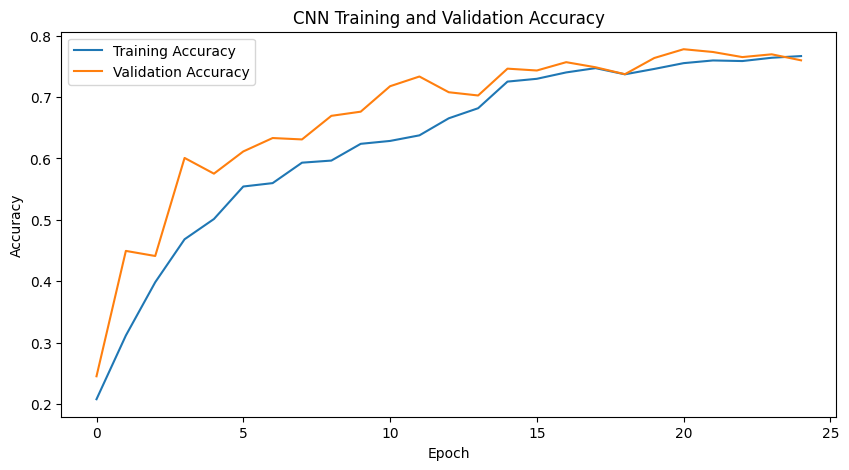

In [35]:
plt.figure(figsize=(10, 5))

plt.plot(
    history_cnn.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    history_cnn.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.title("CNN Training and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

## 31. CNN Training Curves — Loss

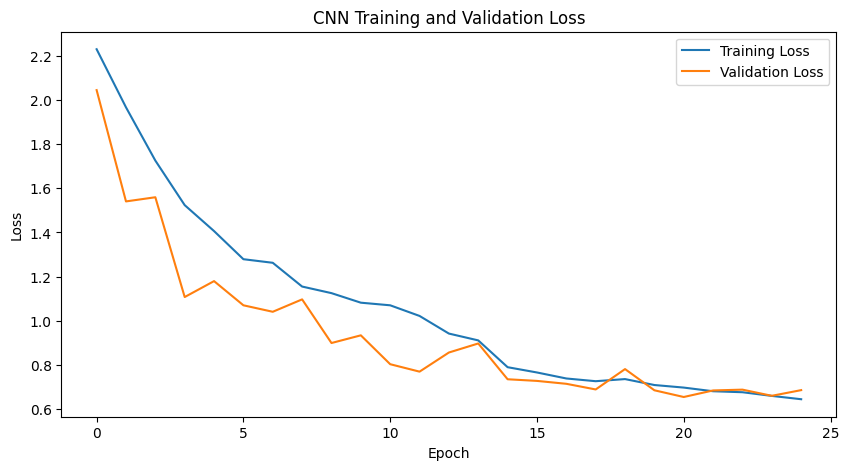

In [36]:
plt.figure(figsize=(10, 5))

plt.plot(
    history_cnn.history["loss"],
    label="Training Loss"
)

plt.plot(
    history_cnn.history["val_loss"],
    label="Validation Loss"
)

plt.title("CNN Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()

## 32. CNN Test Evaluation

In [37]:
cnn_loss, cnn_accuracy = cnn_model.evaluate(test_ds)

print(f"CNN Test Loss: {cnn_loss:.4f}")
print(f"CNN Test Accuracy: {cnn_accuracy:.4f}")

 1/41 [..............................] - ETA: 6s - loss: 0.6710 - accuracy: 0.8125

 3/41 [=>............................] - ETA: 1s - loss: 0.7857 - accuracy: 0.8125

 5/41 [==>...........................] - ETA: 1s - loss: 0.8219 - accuracy: 0.7625

 7/41 [====>.........................] - ETA: 1s - loss: 0.7336 - accuracy: 0.7768

 9/41 [=====>........................] - ETA: 0s - loss: 0.7081 - accuracy: 0.7882

11/41 [=======>......................] - ETA: 0s - loss: 0.7154 - accuracy: 0.7869

13/41 [========>.....................] - ETA: 0s - loss: 0.7058 - accuracy: 0.7837

15/41 [=========>....................] - ETA: 0s - loss: 0.6823 - accuracy: 0.7896

17/41 [===========>..................] - ETA: 0s - loss: 0.6905 - accuracy: 0.7868

19/41 [============>.................] - ETA: 0s - loss: 0.6944 - accuracy: 0.7780

21/41 [==============>...............] - ETA: 0s - loss: 0.7154 - accuracy: 0.7708

23/41 [===============>..............] - ETA: 0s - loss: 0.6988 - accuracy: 0.7717

25/41 [=================>............] - ETA: 0s - loss: 0.6904 - accuracy: 0.7750

27/41 [==================>...........] - ETA: 0s - loss: 0.6913 - accuracy: 0.7731

29/41 [====================>.........] - ETA: 0s - loss: 0.6695 - accuracy: 0.7802

31/41 [=====================>........] - ETA: 0s - loss: 0.6663 - accuracy: 0.7812

33/41 [=======================>......] - ETA: 0s - loss: 0.6878 - accuracy: 0.7756

35/41 [========================>.....] - ETA: 0s - loss: 0.6844 - accuracy: 0.7759

37/41 [==========================>...] - ETA: 0s - loss: 0.6824 - accuracy: 0.7753

39/41 [===========================>..] - ETA: 0s - loss: 0.6787 - accuracy: 0.7764

41/41 [==============================] - ETA: 0s - loss: 0.6724 - accuracy: 0.7759

41/41 [==============================] - 1s 31ms/step - loss: 0.6724 - accuracy: 0.7759


CNN Test Loss: 0.6724
CNN Test Accuracy: 0.7759


## 33. CNN Predictions

In [38]:
y_true_cnn = []
y_pred_cnn = []

for images, labels in test_ds:
    predictions = cnn_model.predict(images, verbose=0)
    predicted_classes = np.argmax(predictions, axis=1)

    y_true_cnn.extend(labels.numpy())
    y_pred_cnn.extend(predicted_classes)

y_true_cnn = np.array(y_true_cnn)
y_pred_cnn = np.array(y_pred_cnn)

## 34. CNN Classification Report

In [39]:
print(
    classification_report(
        y_true_cnn,
        y_pred_cnn,
        target_names=class_names_tf
    )
)

                                      precision    recall  f1-score   support

                      Bacterial_spot       0.88      0.55      0.68       123
                        Early_blight       0.73      0.85      0.78       132
                         Late_blight       0.67      0.68      0.67       115
                           Leaf_Mold       0.82      0.72      0.77       125
                  Septoria_leaf_spot       0.67      0.50      0.57       126
Spider_mites Two-spotted_spider_mite       0.84      0.87      0.86       118
                         Target_Spot       0.75      0.76      0.75       103
       Tomato_Yellow_Leaf_Curl_Virus       0.83      0.93      0.88       115
                 Tomato_mosaic_virus       0.83      0.93      0.88       114
                             healthy       0.79      0.91      0.85       127
                      powdery_mildew       0.68      0.80      0.74       114

                            accuracy                          

## 35. CNN Confusion Matrix

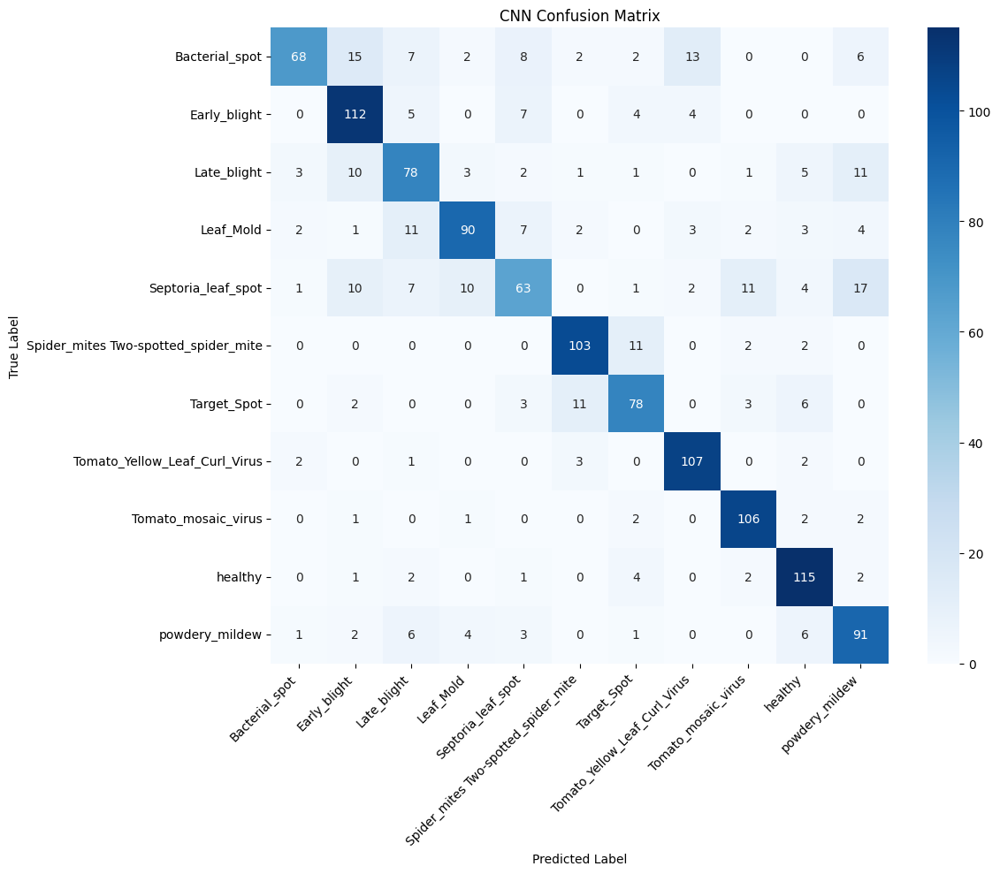

In [40]:
cm_cnn = confusion_matrix(
    y_true_cnn,
    y_pred_cnn
)

plt.figure(figsize=(12, 10))

sns.heatmap(
    cm_cnn,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names_tf,
    yticklabels=class_names_tf
)

plt.title("CNN Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

## 36. CNN Main Metrics

In [41]:
cnn_precision = precision_score(
    y_true_cnn,
    y_pred_cnn,
    average="weighted",
    zero_division=0
)

cnn_recall = recall_score(
    y_true_cnn,
    y_pred_cnn,
    average="weighted",
    zero_division=0
)

cnn_f1 = f1_score(
    y_true_cnn,
    y_pred_cnn,
    average="weighted",
    zero_division=0
)

print("CNN Performance")
print("-----------------------")
print(f"Accuracy : {cnn_accuracy:.4f}")
print(f"Precision: {cnn_precision:.4f}")
print(f"Recall   : {cnn_recall:.4f}")
print(f"F1 Score : {cnn_f1:.4f}")

CNN Performance
-----------------------
Accuracy : 0.7759
Precision: 0.7730
Recall   : 0.7706
F1 Score : 0.7650


# 🚀 37. Model 2 — Transfer Learning With MobileNetV2

MobileNetV2 was pretrained on ImageNet.

We initially freeze the pretrained convolutional base and train a new
classification head for the tomato disease classes.

In [42]:
base_model = tf.keras.applications.MobileNetV2(
    input_shape=(224, 224, 3),
    include_top=False,
    weights="imagenet"
)

base_model.trainable = False

print(
    "Trainable base-model layers:",
    sum(layer.trainable for layer in base_model.layers)
)

Trainable base-model layers: 0


## 38. Build MobileNetV2 Model

In [43]:
transfer_model = models.Sequential([
    layers.Input(shape=(224, 224, 3)),

    data_augmentation,

    # MobileNetV2 preprocessing: maps [0, 255] to [-1, 1]
    layers.Rescaling(
        1./127.5,
        offset=-1
    ),

    base_model,

    layers.GlobalAveragePooling2D(),

    layers.Dense(
        128,
        activation="relu"
    ),

    layers.Dropout(0.5),

    layers.Dense(
        num_classes,
        activation="softmax"
    )
])

transfer_model.summary()

Model: "sequential_1"


_________________________________________________________________


 Layer (type)                Output Shape              Param #   


 data_augmentation (Sequenti  (None, 224, 224, 3)      0         


 al)                                                             


 rescaling_1 (Rescaling)     (None, 224, 224, 3)       0         


 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   


 ional)                                                          


 global_average_pooling2d (G  (None, 1280)             0         


 lobalAveragePooling2D)                                          


 dense_2 (Dense)             (None, 128)               163968    


 dropout_1 (Dropout)         (None, 128)               0         


 dense_3 (Dense)             (None, 11)                1419      


Total params: 2,423,371


Trainable params: 165,387


Non-trainable params: 2,257,984


_________________________________________________________________


## 39. Compile MobileNetV2

In [44]:
transfer_model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=0.001
    ),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

## 40. Train MobileNetV2

In [45]:
history_transfer = transfer_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS_TRANSFER,
    callbacks=[
        early_stopping,
        reduce_lr
    ]
)

Epoch 1/20


  1/193 [..............................] - ETA: 22:35 - loss: 3.3300 - accuracy: 0.0625

  2/193 [..............................] - ETA: 1:07 - loss: 3.0688 - accuracy: 0.0781 

  3/193 [..............................] - ETA: 1:08 - loss: 3.0005 - accuracy: 0.0833

  4/193 [..............................] - ETA: 1:08 - loss: 2.8778 - accuracy: 0.0938

  5/193 [..............................] - ETA: 1:07 - loss: 2.8391 - accuracy: 0.1000

  6/193 [..............................] - ETA: 1:07 - loss: 2.8283 - accuracy: 0.1094

  7/193 [>.............................] - ETA: 1:07 - loss: 2.8017 - accuracy: 0.1116

  8/193 [>.............................] - ETA: 1:07 - loss: 2.7549 - accuracy: 0.1094

  9/193 [>.............................] - ETA: 1:07 - loss: 2.7165 - accuracy: 0.1111

 10/193 [>.............................] - ETA: 1:06 - loss: 2.6996 - accuracy: 0.1156

 11/193 [>.............................] - ETA: 1:06 - loss: 2.6757 - accuracy: 0.1193

 12/193 [>.............................] - ETA: 1:06 - loss: 2.6548 - accuracy: 0.1380

 13/193 [=>............................] - ETA: 1:06 - loss: 2.6245 - accuracy: 0.1490

 14/193 [=>............................] - ETA: 1:05 - loss: 2.5983 - accuracy: 0.1540

 15/193 [=>............................] - ETA: 1:05 - loss: 2.5700 - accuracy: 0.1667

 16/193 [=>............................] - ETA: 1:05 - loss: 2.5418 - accuracy: 0.1680

 17/193 [=>............................] - ETA: 1:04 - loss: 2.5206 - accuracy: 0.1728

 18/193 [=>............................] - ETA: 1:04 - loss: 2.4945 - accuracy: 0.1753

 19/193 [=>............................] - ETA: 1:04 - loss: 2.4704 - accuracy: 0.1809

 20/193 [==>...........................] - ETA: 1:04 - loss: 2.4567 - accuracy: 0.1828

 21/193 [==>...........................] - ETA: 1:03 - loss: 2.4372 - accuracy: 0.1875

 22/193 [==>...........................] - ETA: 1:03 - loss: 2.4212 - accuracy: 0.1918

 23/193 [==>...........................] - ETA: 1:03 - loss: 2.4053 - accuracy: 0.1970

 24/193 [==>...........................] - ETA: 1:03 - loss: 2.3925 - accuracy: 0.2031

 25/193 [==>...........................] - ETA: 1:03 - loss: 2.3821 - accuracy: 0.2050

 26/193 [===>..........................] - ETA: 1:03 - loss: 2.3712 - accuracy: 0.2091

 27/193 [===>..........................] - ETA: 1:02 - loss: 2.3549 - accuracy: 0.2153

 28/193 [===>..........................] - ETA: 1:02 - loss: 2.3446 - accuracy: 0.2176

 29/193 [===>..........................] - ETA: 1:02 - loss: 2.3303 - accuracy: 0.2231

 30/193 [===>..........................] - ETA: 1:02 - loss: 2.3191 - accuracy: 0.2271

 31/193 [===>..........................] - ETA: 1:01 - loss: 2.3023 - accuracy: 0.2369

 32/193 [===>..........................] - ETA: 1:01 - loss: 2.2874 - accuracy: 0.2432

 33/193 [====>.........................] - ETA: 1:01 - loss: 2.2847 - accuracy: 0.2453

 34/193 [====>.........................] - ETA: 1:01 - loss: 2.2678 - accuracy: 0.2482

 35/193 [====>.........................] - ETA: 1:00 - loss: 2.2571 - accuracy: 0.2500

 36/193 [====>.........................] - ETA: 1:00 - loss: 2.2427 - accuracy: 0.2535

 37/193 [====>.........................] - ETA: 1:00 - loss: 2.2302 - accuracy: 0.2601

 38/193 [====>.........................] - ETA: 59s - loss: 2.2264 - accuracy: 0.2607 

 39/193 [=====>........................] - ETA: 59s - loss: 2.2183 - accuracy: 0.2604

 40/193 [=====>........................] - ETA: 59s - loss: 2.2073 - accuracy: 0.2641

 41/193 [=====>........................] - ETA: 58s - loss: 2.2065 - accuracy: 0.2652

 42/193 [=====>........................] - ETA: 58s - loss: 2.1972 - accuracy: 0.2671

 43/193 [=====>........................] - ETA: 57s - loss: 2.1950 - accuracy: 0.2660

 44/193 [=====>........................] - ETA: 57s - loss: 2.1843 - accuracy: 0.2706

 45/193 [=====>........................] - ETA: 57s - loss: 2.1746 - accuracy: 0.2729

 46/193 [======>.......................] - ETA: 56s - loss: 2.1677 - accuracy: 0.2765

 47/193 [======>.......................] - ETA: 56s - loss: 2.1635 - accuracy: 0.2753

 48/193 [======>.......................] - ETA: 56s - loss: 2.1650 - accuracy: 0.2747

 49/193 [======>.......................] - ETA: 55s - loss: 2.1555 - accuracy: 0.2806

 50/193 [======>.......................] - ETA: 55s - loss: 2.1505 - accuracy: 0.2800

 51/193 [======>.......................] - ETA: 54s - loss: 2.1409 - accuracy: 0.2831

 52/193 [=======>......................] - ETA: 54s - loss: 2.1318 - accuracy: 0.2855

 53/193 [=======>......................] - ETA: 54s - loss: 2.1233 - accuracy: 0.2895

 54/193 [=======>......................] - ETA: 53s - loss: 2.1186 - accuracy: 0.2905

 55/193 [=======>......................] - ETA: 53s - loss: 2.1072 - accuracy: 0.2943

 56/193 [=======>......................] - ETA: 52s - loss: 2.1032 - accuracy: 0.2935

 57/193 [=======>......................] - ETA: 52s - loss: 2.0922 - accuracy: 0.2982

 58/193 [========>.....................] - ETA: 52s - loss: 2.0891 - accuracy: 0.2990

 59/193 [========>.....................] - ETA: 51s - loss: 2.0830 - accuracy: 0.3003

 60/193 [========>.....................] - ETA: 51s - loss: 2.0763 - accuracy: 0.3031

 61/193 [========>.....................] - ETA: 50s - loss: 2.0737 - accuracy: 0.3043

 62/193 [========>.....................] - ETA: 50s - loss: 2.0675 - accuracy: 0.3065

 63/193 [========>.....................] - ETA: 50s - loss: 2.0602 - accuracy: 0.3095

 64/193 [========>.....................] - ETA: 49s - loss: 2.0557 - accuracy: 0.3120

 65/193 [=========>....................] - ETA: 49s - loss: 2.0485 - accuracy: 0.3139

 66/193 [=========>....................] - ETA: 49s - loss: 2.0461 - accuracy: 0.3153

 67/193 [=========>....................] - ETA: 48s - loss: 2.0449 - accuracy: 0.3148

 68/193 [=========>....................] - ETA: 48s - loss: 2.0379 - accuracy: 0.3189

 69/193 [=========>....................] - ETA: 47s - loss: 2.0297 - accuracy: 0.3216

 70/193 [=========>....................] - ETA: 47s - loss: 2.0241 - accuracy: 0.3228

 71/193 [==========>...................] - ETA: 47s - loss: 2.0164 - accuracy: 0.3257

 72/193 [==========>...................] - ETA: 46s - loss: 2.0124 - accuracy: 0.3255

 73/193 [==========>...................] - ETA: 46s - loss: 2.0077 - accuracy: 0.3266

 74/193 [==========>...................] - ETA: 46s - loss: 2.0034 - accuracy: 0.3298

 75/193 [==========>...................] - ETA: 45s - loss: 1.9969 - accuracy: 0.3321

 76/193 [==========>...................] - ETA: 45s - loss: 1.9942 - accuracy: 0.3310

 77/193 [==========>...................] - ETA: 44s - loss: 1.9897 - accuracy: 0.3324

 78/193 [===========>..................] - ETA: 44s - loss: 1.9858 - accuracy: 0.3337

 79/193 [===========>..................] - ETA: 44s - loss: 1.9826 - accuracy: 0.3354

 80/193 [===========>..................] - ETA: 43s - loss: 1.9794 - accuracy: 0.3352

 81/193 [===========>..................] - ETA: 43s - loss: 1.9733 - accuracy: 0.3356

 82/193 [===========>..................] - ETA: 42s - loss: 1.9682 - accuracy: 0.3377

 83/193 [===========>..................] - ETA: 42s - loss: 1.9641 - accuracy: 0.3389

 84/193 [============>.................] - ETA: 42s - loss: 1.9605 - accuracy: 0.3393

 85/193 [============>.................] - ETA: 41s - loss: 1.9585 - accuracy: 0.3393

 86/193 [============>.................] - ETA: 41s - loss: 1.9535 - accuracy: 0.3412

 87/193 [============>.................] - ETA: 40s - loss: 1.9490 - accuracy: 0.3423

 88/193 [============>.................] - ETA: 40s - loss: 1.9484 - accuracy: 0.3416

 89/193 [============>.................] - ETA: 40s - loss: 1.9441 - accuracy: 0.3423

 90/193 [============>.................] - ETA: 39s - loss: 1.9424 - accuracy: 0.3424

 91/193 [=============>................] - ETA: 39s - loss: 1.9360 - accuracy: 0.3448

 92/193 [=============>................] - ETA: 39s - loss: 1.9342 - accuracy: 0.3454

 93/193 [=============>................] - ETA: 38s - loss: 1.9332 - accuracy: 0.3454

 94/193 [=============>................] - ETA: 38s - loss: 1.9276 - accuracy: 0.3481

 95/193 [=============>................] - ETA: 37s - loss: 1.9206 - accuracy: 0.3513

 96/193 [=============>................] - ETA: 37s - loss: 1.9149 - accuracy: 0.3535

 97/193 [==============>...............] - ETA: 37s - loss: 1.9082 - accuracy: 0.3563

 98/193 [==============>...............] - ETA: 36s - loss: 1.9056 - accuracy: 0.3575

 99/193 [==============>...............] - ETA: 36s - loss: 1.9035 - accuracy: 0.3576

100/193 [==============>...............] - ETA: 35s - loss: 1.8999 - accuracy: 0.3591

101/193 [==============>...............] - ETA: 35s - loss: 1.8987 - accuracy: 0.3601

102/193 [==============>...............] - ETA: 35s - loss: 1.8956 - accuracy: 0.3606

103/193 [===============>..............] - ETA: 34s - loss: 1.8892 - accuracy: 0.3629

104/193 [===============>..............] - ETA: 34s - loss: 1.8836 - accuracy: 0.3651

105/193 [===============>..............] - ETA: 33s - loss: 1.8823 - accuracy: 0.3658

106/193 [===============>..............] - ETA: 33s - loss: 1.8793 - accuracy: 0.3667

107/193 [===============>..............] - ETA: 33s - loss: 1.8807 - accuracy: 0.3662

108/193 [===============>..............] - ETA: 32s - loss: 1.8774 - accuracy: 0.3681

109/193 [===============>..............] - ETA: 32s - loss: 1.8737 - accuracy: 0.3690

110/193 [================>.............] - ETA: 32s - loss: 1.8695 - accuracy: 0.3705

111/193 [================>.............] - ETA: 31s - loss: 1.8678 - accuracy: 0.3705

112/193 [================>.............] - ETA: 31s - loss: 1.8638 - accuracy: 0.3722

113/193 [================>.............] - ETA: 31s - loss: 1.8599 - accuracy: 0.3731

114/193 [================>.............] - ETA: 30s - loss: 1.8583 - accuracy: 0.3734

115/193 [================>.............] - ETA: 30s - loss: 1.8543 - accuracy: 0.3742

116/193 [=================>............] - ETA: 29s - loss: 1.8511 - accuracy: 0.3758

117/193 [=================>............] - ETA: 29s - loss: 1.8480 - accuracy: 0.3774

118/193 [=================>............] - ETA: 29s - loss: 1.8436 - accuracy: 0.3784

119/193 [=================>............] - ETA: 28s - loss: 1.8411 - accuracy: 0.3795

120/193 [=================>............] - ETA: 28s - loss: 1.8381 - accuracy: 0.3799

121/193 [=================>............] - ETA: 27s - loss: 1.8361 - accuracy: 0.3817

122/193 [=================>............] - ETA: 27s - loss: 1.8326 - accuracy: 0.3835

123/193 [==================>...........] - ETA: 27s - loss: 1.8308 - accuracy: 0.3847

124/193 [==================>...........] - ETA: 26s - loss: 1.8256 - accuracy: 0.3866

125/193 [==================>...........] - ETA: 26s - loss: 1.8208 - accuracy: 0.3882

126/193 [==================>...........] - ETA: 25s - loss: 1.8188 - accuracy: 0.3889

127/193 [==================>...........] - ETA: 25s - loss: 1.8146 - accuracy: 0.3898

128/193 [==================>...........] - ETA: 25s - loss: 1.8115 - accuracy: 0.3909

129/193 [===================>..........] - ETA: 24s - loss: 1.8061 - accuracy: 0.3932

130/193 [===================>..........] - ETA: 24s - loss: 1.8046 - accuracy: 0.3938

131/193 [===================>..........] - ETA: 24s - loss: 1.8014 - accuracy: 0.3946

132/193 [===================>..........] - ETA: 23s - loss: 1.7969 - accuracy: 0.3968

133/193 [===================>..........] - ETA: 23s - loss: 1.7940 - accuracy: 0.3978

134/193 [===================>..........] - ETA: 22s - loss: 1.7906 - accuracy: 0.3983

135/193 [===================>..........] - ETA: 22s - loss: 1.7862 - accuracy: 0.3993

136/193 [====================>.........] - ETA: 22s - loss: 1.7852 - accuracy: 0.3987

137/193 [====================>.........] - ETA: 21s - loss: 1.7808 - accuracy: 0.3992

138/193 [====================>.........] - ETA: 21s - loss: 1.7773 - accuracy: 0.4008

139/193 [====================>.........] - ETA: 20s - loss: 1.7737 - accuracy: 0.4015

140/193 [====================>.........] - ETA: 20s - loss: 1.7697 - accuracy: 0.4027

141/193 [====================>.........] - ETA: 20s - loss: 1.7653 - accuracy: 0.4040

142/193 [=====================>........] - ETA: 19s - loss: 1.7638 - accuracy: 0.4049

143/193 [=====================>........] - ETA: 19s - loss: 1.7604 - accuracy: 0.4056

144/193 [=====================>........] - ETA: 18s - loss: 1.7577 - accuracy: 0.4065

145/193 [=====================>........] - ETA: 18s - loss: 1.7532 - accuracy: 0.4080

146/193 [=====================>........] - ETA: 18s - loss: 1.7488 - accuracy: 0.4103

147/193 [=====================>........] - ETA: 17s - loss: 1.7448 - accuracy: 0.4111

148/193 [======================>.......] - ETA: 17s - loss: 1.7437 - accuracy: 0.4122

149/193 [======================>.......] - ETA: 17s - loss: 1.7387 - accuracy: 0.4136

150/193 [======================>.......] - ETA: 16s - loss: 1.7343 - accuracy: 0.4152

151/193 [======================>.......] - ETA: 16s - loss: 1.7326 - accuracy: 0.4158

152/193 [======================>.......] - ETA: 15s - loss: 1.7304 - accuracy: 0.4165

153/193 [======================>.......] - ETA: 15s - loss: 1.7270 - accuracy: 0.4179

154/193 [======================>.......] - ETA: 15s - loss: 1.7259 - accuracy: 0.4184

155/193 [=======================>......] - ETA: 14s - loss: 1.7224 - accuracy: 0.4194

156/193 [=======================>......] - ETA: 14s - loss: 1.7217 - accuracy: 0.4199

157/193 [=======================>......] - ETA: 14s - loss: 1.7186 - accuracy: 0.4212

158/193 [=======================>......] - ETA: 13s - loss: 1.7169 - accuracy: 0.4225

159/193 [=======================>......] - ETA: 13s - loss: 1.7132 - accuracy: 0.4241

160/193 [=======================>......] - ETA: 12s - loss: 1.7106 - accuracy: 0.4252

161/193 [========================>.....] - ETA: 12s - loss: 1.7081 - accuracy: 0.4262

162/193 [========================>.....] - ETA: 12s - loss: 1.7070 - accuracy: 0.4265

163/193 [========================>.....] - ETA: 11s - loss: 1.7062 - accuracy: 0.4266

164/193 [========================>.....] - ETA: 11s - loss: 1.7049 - accuracy: 0.4272

165/193 [========================>.....] - ETA: 10s - loss: 1.7017 - accuracy: 0.4284

166/193 [========================>.....] - ETA: 10s - loss: 1.6998 - accuracy: 0.4288

167/193 [========================>.....] - ETA: 10s - loss: 1.6962 - accuracy: 0.4295

168/193 [=========================>....] - ETA: 9s - loss: 1.6963 - accuracy: 0.4297 

169/193 [=========================>....] - ETA: 9s - loss: 1.6939 - accuracy: 0.4307

170/193 [=========================>....] - ETA: 8s - loss: 1.6917 - accuracy: 0.4316

171/193 [=========================>....] - ETA: 8s - loss: 1.6906 - accuracy: 0.4324

172/193 [=========================>....] - ETA: 8s - loss: 1.6889 - accuracy: 0.4328

173/193 [=========================>....] - ETA: 7s - loss: 1.6876 - accuracy: 0.4328

174/193 [==========================>...] - ETA: 7s - loss: 1.6853 - accuracy: 0.4339

175/193 [==========================>...] - ETA: 6s - loss: 1.6821 - accuracy: 0.4348

176/193 [==========================>...] - ETA: 6s - loss: 1.6794 - accuracy: 0.4354

177/193 [==========================>...] - ETA: 6s - loss: 1.6763 - accuracy: 0.4366

178/193 [==========================>...] - ETA: 5s - loss: 1.6745 - accuracy: 0.4368

179/193 [==========================>...] - ETA: 5s - loss: 1.6731 - accuracy: 0.4368

180/193 [==========================>...] - ETA: 5s - loss: 1.6718 - accuracy: 0.4368

181/193 [===========================>..] - ETA: 4s - loss: 1.6690 - accuracy: 0.4378

182/193 [===========================>..] - ETA: 4s - loss: 1.6693 - accuracy: 0.4380

183/193 [===========================>..] - ETA: 3s - loss: 1.6650 - accuracy: 0.4397

184/193 [===========================>..] - ETA: 3s - loss: 1.6622 - accuracy: 0.4412

185/193 [===========================>..] - ETA: 3s - loss: 1.6580 - accuracy: 0.4424

186/193 [===========================>..] - ETA: 2s - loss: 1.6553 - accuracy: 0.4435

187/193 [============================>.] - ETA: 2s - loss: 1.6524 - accuracy: 0.4447

188/193 [============================>.] - ETA: 1s - loss: 1.6508 - accuracy: 0.4456

189/193 [============================>.] - ETA: 1s - loss: 1.6488 - accuracy: 0.4459

190/193 [============================>.] - ETA: 1s - loss: 1.6473 - accuracy: 0.4465

191/193 [============================>.] - ETA: 0s - loss: 1.6458 - accuracy: 0.4463

192/193 [============================>.] - ETA: 0s - loss: 1.6431 - accuracy: 0.4469

193/193 [==============================] - ETA: 0s - loss: 1.6431 - accuracy: 0.4468

193/193 [==============================] - 86s 413ms/step - loss: 1.6431 - accuracy: 0.4468 - val_loss: 1.1082 - val_accuracy: 0.6393 - lr: 0.0010


Epoch 2/20


  1/193 [..............................] - ETA: 1:43 - loss: 1.4478 - accuracy: 0.5000

  2/193 [..............................] - ETA: 1:12 - loss: 1.5559 - accuracy: 0.4688

  3/193 [..............................] - ETA: 1:12 - loss: 1.4939 - accuracy: 0.4896

  4/193 [..............................] - ETA: 1:12 - loss: 1.4702 - accuracy: 0.4922

  5/193 [..............................] - ETA: 1:11 - loss: 1.4320 - accuracy: 0.5063

  6/193 [..............................] - ETA: 1:10 - loss: 1.4199 - accuracy: 0.5156

  7/193 [>.............................] - ETA: 1:10 - loss: 1.3922 - accuracy: 0.5223

  8/193 [>.............................] - ETA: 1:09 - loss: 1.4190 - accuracy: 0.5078

  9/193 [>.............................] - ETA: 1:09 - loss: 1.3942 - accuracy: 0.5104

 10/193 [>.............................] - ETA: 1:09 - loss: 1.3910 - accuracy: 0.5094

 11/193 [>.............................] - ETA: 1:09 - loss: 1.3685 - accuracy: 0.5199

 12/193 [>.............................] - ETA: 1:08 - loss: 1.3358 - accuracy: 0.5286

 13/193 [=>............................] - ETA: 1:08 - loss: 1.3346 - accuracy: 0.5361

 14/193 [=>............................] - ETA: 1:08 - loss: 1.3298 - accuracy: 0.5402

 15/193 [=>............................] - ETA: 1:08 - loss: 1.3208 - accuracy: 0.5417

 16/193 [=>............................] - ETA: 1:08 - loss: 1.3138 - accuracy: 0.5449

 17/193 [=>............................] - ETA: 1:08 - loss: 1.3014 - accuracy: 0.5496

 18/193 [=>............................] - ETA: 1:07 - loss: 1.2919 - accuracy: 0.5590

 19/193 [=>............................] - ETA: 1:08 - loss: 1.3077 - accuracy: 0.5526

 20/193 [==>...........................] - ETA: 1:07 - loss: 1.3229 - accuracy: 0.5469

 21/193 [==>...........................] - ETA: 1:07 - loss: 1.3144 - accuracy: 0.5521

 22/193 [==>...........................] - ETA: 1:06 - loss: 1.3076 - accuracy: 0.5554

 23/193 [==>...........................] - ETA: 1:06 - loss: 1.2957 - accuracy: 0.5598

 24/193 [==>...........................] - ETA: 1:05 - loss: 1.2973 - accuracy: 0.5573

 25/193 [==>...........................] - ETA: 1:05 - loss: 1.3027 - accuracy: 0.5575

 26/193 [===>..........................] - ETA: 1:05 - loss: 1.2908 - accuracy: 0.5577

 27/193 [===>..........................] - ETA: 1:04 - loss: 1.2848 - accuracy: 0.5613

 28/193 [===>..........................] - ETA: 1:04 - loss: 1.2910 - accuracy: 0.5592

 29/193 [===>..........................] - ETA: 1:03 - loss: 1.2868 - accuracy: 0.5582

 30/193 [===>..........................] - ETA: 1:03 - loss: 1.2884 - accuracy: 0.5521

 31/193 [===>..........................] - ETA: 1:03 - loss: 1.2863 - accuracy: 0.5514

 32/193 [===>..........................] - ETA: 1:02 - loss: 1.2791 - accuracy: 0.5518

 33/193 [====>.........................] - ETA: 1:02 - loss: 1.2820 - accuracy: 0.5521

 34/193 [====>.........................] - ETA: 1:01 - loss: 1.2809 - accuracy: 0.5542

 35/193 [====>.........................] - ETA: 1:01 - loss: 1.2762 - accuracy: 0.5571

 36/193 [====>.........................] - ETA: 1:01 - loss: 1.2744 - accuracy: 0.5573

 37/193 [====>.........................] - ETA: 1:00 - loss: 1.2626 - accuracy: 0.5608

 38/193 [====>.........................] - ETA: 1:00 - loss: 1.2551 - accuracy: 0.5633

 39/193 [=====>........................] - ETA: 1:00 - loss: 1.2527 - accuracy: 0.5649

 40/193 [=====>........................] - ETA: 59s - loss: 1.2638 - accuracy: 0.5609 

 41/193 [=====>........................] - ETA: 59s - loss: 1.2572 - accuracy: 0.5633

 42/193 [=====>........................] - ETA: 59s - loss: 1.2572 - accuracy: 0.5610

 43/193 [=====>........................] - ETA: 58s - loss: 1.2572 - accuracy: 0.5603

 44/193 [=====>........................] - ETA: 58s - loss: 1.2506 - accuracy: 0.5625

 45/193 [=====>........................] - ETA: 58s - loss: 1.2470 - accuracy: 0.5632

 46/193 [======>.......................] - ETA: 57s - loss: 1.2500 - accuracy: 0.5639

 47/193 [======>.......................] - ETA: 57s - loss: 1.2454 - accuracy: 0.5645

 48/193 [======>.......................] - ETA: 56s - loss: 1.2472 - accuracy: 0.5645

 49/193 [======>.......................] - ETA: 56s - loss: 1.2502 - accuracy: 0.5625

 50/193 [======>.......................] - ETA: 56s - loss: 1.2539 - accuracy: 0.5606

 51/193 [======>.......................] - ETA: 55s - loss: 1.2480 - accuracy: 0.5637

 52/193 [=======>......................] - ETA: 55s - loss: 1.2478 - accuracy: 0.5643

 53/193 [=======>......................] - ETA: 54s - loss: 1.2429 - accuracy: 0.5654

 54/193 [=======>......................] - ETA: 54s - loss: 1.2414 - accuracy: 0.5660

 55/193 [=======>......................] - ETA: 54s - loss: 1.2402 - accuracy: 0.5659

 56/193 [=======>......................] - ETA: 53s - loss: 1.2410 - accuracy: 0.5642

 57/193 [=======>......................] - ETA: 53s - loss: 1.2384 - accuracy: 0.5647

 58/193 [========>.....................] - ETA: 53s - loss: 1.2384 - accuracy: 0.5657

 59/193 [========>.....................] - ETA: 52s - loss: 1.2364 - accuracy: 0.5673

 60/193 [========>.....................] - ETA: 52s - loss: 1.2354 - accuracy: 0.5688

 61/193 [========>.....................] - ETA: 52s - loss: 1.2312 - accuracy: 0.5707

 62/193 [========>.....................] - ETA: 51s - loss: 1.2356 - accuracy: 0.5685

 63/193 [========>.....................] - ETA: 51s - loss: 1.2342 - accuracy: 0.5680

 64/193 [========>.....................] - ETA: 50s - loss: 1.2290 - accuracy: 0.5684

 65/193 [=========>....................] - ETA: 50s - loss: 1.2291 - accuracy: 0.5688

 66/193 [=========>....................] - ETA: 50s - loss: 1.2302 - accuracy: 0.5682

 67/193 [=========>....................] - ETA: 49s - loss: 1.2303 - accuracy: 0.5681

 68/193 [=========>....................] - ETA: 49s - loss: 1.2325 - accuracy: 0.5666

 69/193 [=========>....................] - ETA: 48s - loss: 1.2296 - accuracy: 0.5679

 70/193 [=========>....................] - ETA: 48s - loss: 1.2321 - accuracy: 0.5674

 71/193 [==========>...................] - ETA: 48s - loss: 1.2326 - accuracy: 0.5673

 72/193 [==========>...................] - ETA: 47s - loss: 1.2322 - accuracy: 0.5673

 73/193 [==========>...................] - ETA: 47s - loss: 1.2322 - accuracy: 0.5672

 74/193 [==========>...................] - ETA: 47s - loss: 1.2323 - accuracy: 0.5676

 75/193 [==========>...................] - ETA: 46s - loss: 1.2313 - accuracy: 0.5683

 76/193 [==========>...................] - ETA: 46s - loss: 1.2311 - accuracy: 0.5683

 77/193 [==========>...................] - ETA: 45s - loss: 1.2285 - accuracy: 0.5706

 78/193 [===========>..................] - ETA: 45s - loss: 1.2284 - accuracy: 0.5717

 79/193 [===========>..................] - ETA: 45s - loss: 1.2335 - accuracy: 0.5704

 80/193 [===========>..................] - ETA: 44s - loss: 1.2330 - accuracy: 0.5711

 81/193 [===========>..................] - ETA: 44s - loss: 1.2331 - accuracy: 0.5714

 82/193 [===========>..................] - ETA: 44s - loss: 1.2334 - accuracy: 0.5701

 83/193 [===========>..................] - ETA: 43s - loss: 1.2357 - accuracy: 0.5689

 84/193 [============>.................] - ETA: 43s - loss: 1.2355 - accuracy: 0.5692

 85/193 [============>.................] - ETA: 42s - loss: 1.2336 - accuracy: 0.5688

 86/193 [============>.................] - ETA: 42s - loss: 1.2319 - accuracy: 0.5690

 87/193 [============>.................] - ETA: 42s - loss: 1.2352 - accuracy: 0.5675

 88/193 [============>.................] - ETA: 41s - loss: 1.2332 - accuracy: 0.5685

 89/193 [============>.................] - ETA: 41s - loss: 1.2351 - accuracy: 0.5685

 90/193 [============>.................] - ETA: 40s - loss: 1.2374 - accuracy: 0.5681

 91/193 [=============>................] - ETA: 40s - loss: 1.2376 - accuracy: 0.5670

 92/193 [=============>................] - ETA: 39s - loss: 1.2385 - accuracy: 0.5652

 93/193 [=============>................] - ETA: 39s - loss: 1.2359 - accuracy: 0.5665

 94/193 [=============>................] - ETA: 39s - loss: 1.2328 - accuracy: 0.5675

 95/193 [=============>................] - ETA: 38s - loss: 1.2278 - accuracy: 0.5681

 96/193 [=============>................] - ETA: 38s - loss: 1.2250 - accuracy: 0.5693

 97/193 [==============>...............] - ETA: 37s - loss: 1.2273 - accuracy: 0.5680

 98/193 [==============>...............] - ETA: 37s - loss: 1.2268 - accuracy: 0.5682

 99/193 [==============>...............] - ETA: 37s - loss: 1.2258 - accuracy: 0.5685

100/193 [==============>...............] - ETA: 36s - loss: 1.2239 - accuracy: 0.5694

101/193 [==============>...............] - ETA: 36s - loss: 1.2264 - accuracy: 0.5693

102/193 [==============>...............] - ETA: 35s - loss: 1.2252 - accuracy: 0.5689

103/193 [===============>..............] - ETA: 35s - loss: 1.2251 - accuracy: 0.5686

104/193 [===============>..............] - ETA: 35s - loss: 1.2266 - accuracy: 0.5673

105/193 [===============>..............] - ETA: 34s - loss: 1.2258 - accuracy: 0.5673

106/193 [===============>..............] - ETA: 34s - loss: 1.2207 - accuracy: 0.5690

107/193 [===============>..............] - ETA: 33s - loss: 1.2200 - accuracy: 0.5692

108/193 [===============>..............] - ETA: 33s - loss: 1.2195 - accuracy: 0.5689

109/193 [===============>..............] - ETA: 33s - loss: 1.2210 - accuracy: 0.5671

110/193 [================>.............] - ETA: 32s - loss: 1.2208 - accuracy: 0.5670

111/193 [================>.............] - ETA: 32s - loss: 1.2197 - accuracy: 0.5678

112/193 [================>.............] - ETA: 31s - loss: 1.2191 - accuracy: 0.5686

113/193 [================>.............] - ETA: 31s - loss: 1.2180 - accuracy: 0.5691

114/193 [================>.............] - ETA: 31s - loss: 1.2144 - accuracy: 0.5702

115/193 [================>.............] - ETA: 30s - loss: 1.2141 - accuracy: 0.5709

116/193 [=================>............] - ETA: 30s - loss: 1.2153 - accuracy: 0.5698

117/193 [=================>............] - ETA: 29s - loss: 1.2138 - accuracy: 0.5713

118/193 [=================>............] - ETA: 29s - loss: 1.2132 - accuracy: 0.5715

119/193 [=================>............] - ETA: 29s - loss: 1.2112 - accuracy: 0.5727

120/193 [=================>............] - ETA: 28s - loss: 1.2113 - accuracy: 0.5729

121/193 [=================>............] - ETA: 28s - loss: 1.2117 - accuracy: 0.5739

122/193 [=================>............] - ETA: 27s - loss: 1.2078 - accuracy: 0.5758

123/193 [==================>...........] - ETA: 27s - loss: 1.2059 - accuracy: 0.5770

124/193 [==================>...........] - ETA: 27s - loss: 1.2067 - accuracy: 0.5764

125/193 [==================>...........] - ETA: 26s - loss: 1.2059 - accuracy: 0.5765

126/193 [==================>...........] - ETA: 26s - loss: 1.2047 - accuracy: 0.5774

127/193 [==================>...........] - ETA: 25s - loss: 1.2033 - accuracy: 0.5782

128/193 [==================>...........] - ETA: 25s - loss: 1.2017 - accuracy: 0.5789

129/193 [===================>..........] - ETA: 25s - loss: 1.2013 - accuracy: 0.5787

130/193 [===================>..........] - ETA: 24s - loss: 1.1972 - accuracy: 0.5800

131/193 [===================>..........] - ETA: 24s - loss: 1.1937 - accuracy: 0.5816

132/193 [===================>..........] - ETA: 23s - loss: 1.1948 - accuracy: 0.5814

133/193 [===================>..........] - ETA: 23s - loss: 1.1941 - accuracy: 0.5818

134/193 [===================>..........] - ETA: 23s - loss: 1.1936 - accuracy: 0.5816

135/193 [===================>..........] - ETA: 22s - loss: 1.1935 - accuracy: 0.5819

136/193 [====================>.........] - ETA: 22s - loss: 1.1924 - accuracy: 0.5827

137/193 [====================>.........] - ETA: 22s - loss: 1.1909 - accuracy: 0.5837

138/193 [====================>.........] - ETA: 21s - loss: 1.1887 - accuracy: 0.5849

139/193 [====================>.........] - ETA: 21s - loss: 1.1880 - accuracy: 0.5852

140/193 [====================>.........] - ETA: 20s - loss: 1.1859 - accuracy: 0.5866

141/193 [====================>.........] - ETA: 20s - loss: 1.1833 - accuracy: 0.5878

142/193 [=====================>........] - ETA: 20s - loss: 1.1827 - accuracy: 0.5882

143/193 [=====================>........] - ETA: 19s - loss: 1.1812 - accuracy: 0.5896

144/193 [=====================>........] - ETA: 19s - loss: 1.1787 - accuracy: 0.5907

145/193 [=====================>........] - ETA: 18s - loss: 1.1786 - accuracy: 0.5905

146/193 [=====================>........] - ETA: 18s - loss: 1.1758 - accuracy: 0.5916

147/193 [=====================>........] - ETA: 18s - loss: 1.1777 - accuracy: 0.5923

148/193 [======================>.......] - ETA: 17s - loss: 1.1755 - accuracy: 0.5927

149/193 [======================>.......] - ETA: 17s - loss: 1.1739 - accuracy: 0.5931

150/193 [======================>.......] - ETA: 16s - loss: 1.1714 - accuracy: 0.5935

151/193 [======================>.......] - ETA: 16s - loss: 1.1722 - accuracy: 0.5935

152/193 [======================>.......] - ETA: 16s - loss: 1.1713 - accuracy: 0.5931

153/193 [======================>.......] - ETA: 15s - loss: 1.1703 - accuracy: 0.5938

154/193 [======================>.......] - ETA: 15s - loss: 1.1691 - accuracy: 0.5940

155/193 [=======================>......] - ETA: 14s - loss: 1.1675 - accuracy: 0.5946

156/193 [=======================>......] - ETA: 14s - loss: 1.1673 - accuracy: 0.5954

157/193 [=======================>......] - ETA: 14s - loss: 1.1650 - accuracy: 0.5959

158/193 [=======================>......] - ETA: 13s - loss: 1.1634 - accuracy: 0.5965

159/193 [=======================>......] - ETA: 13s - loss: 1.1615 - accuracy: 0.5969

160/193 [=======================>......] - ETA: 12s - loss: 1.1605 - accuracy: 0.5975

161/193 [========================>.....] - ETA: 12s - loss: 1.1605 - accuracy: 0.5976

162/193 [========================>.....] - ETA: 12s - loss: 1.1606 - accuracy: 0.5976

163/193 [========================>.....] - ETA: 11s - loss: 1.1592 - accuracy: 0.5976

164/193 [========================>.....] - ETA: 11s - loss: 1.1595 - accuracy: 0.5974

165/193 [========================>.....] - ETA: 10s - loss: 1.1616 - accuracy: 0.5966

166/193 [========================>.....] - ETA: 10s - loss: 1.1632 - accuracy: 0.5962

167/193 [========================>.....] - ETA: 10s - loss: 1.1611 - accuracy: 0.5973

168/193 [=========================>....] - ETA: 9s - loss: 1.1629 - accuracy: 0.5969 

169/193 [=========================>....] - ETA: 9s - loss: 1.1617 - accuracy: 0.5969

170/193 [=========================>....] - ETA: 9s - loss: 1.1614 - accuracy: 0.5967

171/193 [=========================>....] - ETA: 8s - loss: 1.1606 - accuracy: 0.5969

172/193 [=========================>....] - ETA: 8s - loss: 1.1608 - accuracy: 0.5972

173/193 [=========================>....] - ETA: 7s - loss: 1.1607 - accuracy: 0.5974

174/193 [==========================>...] - ETA: 7s - loss: 1.1616 - accuracy: 0.5973

175/193 [==========================>...] - ETA: 7s - loss: 1.1611 - accuracy: 0.5975

176/193 [==========================>...] - ETA: 6s - loss: 1.1598 - accuracy: 0.5978

177/193 [==========================>...] - ETA: 6s - loss: 1.1588 - accuracy: 0.5978

178/193 [==========================>...] - ETA: 5s - loss: 1.1581 - accuracy: 0.5981

179/193 [==========================>...] - ETA: 5s - loss: 1.1595 - accuracy: 0.5972

180/193 [==========================>...] - ETA: 5s - loss: 1.1591 - accuracy: 0.5972

181/193 [===========================>..] - ETA: 4s - loss: 1.1591 - accuracy: 0.5970

182/193 [===========================>..] - ETA: 4s - loss: 1.1577 - accuracy: 0.5974

183/193 [===========================>..] - ETA: 3s - loss: 1.1579 - accuracy: 0.5970

184/193 [===========================>..] - ETA: 3s - loss: 1.1575 - accuracy: 0.5973

185/193 [===========================>..] - ETA: 3s - loss: 1.1569 - accuracy: 0.5976

186/193 [===========================>..] - ETA: 2s - loss: 1.1581 - accuracy: 0.5969

187/193 [============================>.] - ETA: 2s - loss: 1.1583 - accuracy: 0.5968

188/193 [============================>.] - ETA: 1s - loss: 1.1561 - accuracy: 0.5976

189/193 [============================>.] - ETA: 1s - loss: 1.1561 - accuracy: 0.5976

190/193 [============================>.] - ETA: 1s - loss: 1.1553 - accuracy: 0.5980

191/193 [============================>.] - ETA: 0s - loss: 1.1566 - accuracy: 0.5980

192/193 [============================>.] - ETA: 0s - loss: 1.1563 - accuracy: 0.5981

193/193 [==============================] - ETA: 0s - loss: 1.1561 - accuracy: 0.5981

193/193 [==============================] - 79s 410ms/step - loss: 1.1561 - accuracy: 0.5981 - val_loss: 0.9726 - val_accuracy: 0.6770 - lr: 0.0010


Epoch 3/20


  1/193 [..............................] - ETA: 1:47 - loss: 1.2216 - accuracy: 0.6250

  2/193 [..............................] - ETA: 1:12 - loss: 1.2591 - accuracy: 0.5781

  3/193 [..............................] - ETA: 1:12 - loss: 1.3592 - accuracy: 0.5312

  4/193 [..............................] - ETA: 1:12 - loss: 1.2881 - accuracy: 0.5469

  5/193 [..............................] - ETA: 1:11 - loss: 1.2451 - accuracy: 0.5688

  6/193 [..............................] - ETA: 1:12 - loss: 1.2682 - accuracy: 0.5729

  7/193 [>.............................] - ETA: 1:11 - loss: 1.3055 - accuracy: 0.5714

  8/193 [>.............................] - ETA: 1:11 - loss: 1.2999 - accuracy: 0.5859

  9/193 [>.............................] - ETA: 1:11 - loss: 1.2655 - accuracy: 0.5938

 10/193 [>.............................] - ETA: 1:10 - loss: 1.2461 - accuracy: 0.5875

 11/193 [>.............................] - ETA: 1:10 - loss: 1.1995 - accuracy: 0.6080

 12/193 [>.............................] - ETA: 1:10 - loss: 1.1521 - accuracy: 0.6224

 13/193 [=>............................] - ETA: 1:10 - loss: 1.1260 - accuracy: 0.6274

 14/193 [=>............................] - ETA: 1:10 - loss: 1.1203 - accuracy: 0.6317

 15/193 [=>............................] - ETA: 1:09 - loss: 1.1060 - accuracy: 0.6375

 16/193 [=>............................] - ETA: 1:09 - loss: 1.1095 - accuracy: 0.6406

 17/193 [=>............................] - ETA: 1:08 - loss: 1.1195 - accuracy: 0.6360

 18/193 [=>............................] - ETA: 1:08 - loss: 1.1168 - accuracy: 0.6319

 19/193 [=>............................] - ETA: 1:08 - loss: 1.0989 - accuracy: 0.6398

 20/193 [==>...........................] - ETA: 1:07 - loss: 1.1062 - accuracy: 0.6344

 21/193 [==>...........................] - ETA: 1:07 - loss: 1.0997 - accuracy: 0.6324

 22/193 [==>...........................] - ETA: 1:06 - loss: 1.1025 - accuracy: 0.6321

 23/193 [==>...........................] - ETA: 1:06 - loss: 1.1011 - accuracy: 0.6304

 24/193 [==>...........................] - ETA: 1:06 - loss: 1.1042 - accuracy: 0.6276

 25/193 [==>...........................] - ETA: 1:05 - loss: 1.0965 - accuracy: 0.6288

 26/193 [===>..........................] - ETA: 1:05 - loss: 1.0909 - accuracy: 0.6310

 27/193 [===>..........................] - ETA: 1:04 - loss: 1.0796 - accuracy: 0.6343

 28/193 [===>..........................] - ETA: 1:04 - loss: 1.0674 - accuracy: 0.6362

 29/193 [===>..........................] - ETA: 1:04 - loss: 1.0677 - accuracy: 0.6379

 30/193 [===>..........................] - ETA: 1:03 - loss: 1.0713 - accuracy: 0.6375

 31/193 [===>..........................] - ETA: 1:03 - loss: 1.0762 - accuracy: 0.6331

 32/193 [===>..........................] - ETA: 1:03 - loss: 1.0834 - accuracy: 0.6318

 33/193 [====>.........................] - ETA: 1:02 - loss: 1.0845 - accuracy: 0.6316

 34/193 [====>.........................] - ETA: 1:02 - loss: 1.0799 - accuracy: 0.6342

 35/193 [====>.........................] - ETA: 1:02 - loss: 1.0752 - accuracy: 0.6348

 36/193 [====>.........................] - ETA: 1:01 - loss: 1.0734 - accuracy: 0.6345

 37/193 [====>.........................] - ETA: 1:01 - loss: 1.0741 - accuracy: 0.6360

 38/193 [====>.........................] - ETA: 1:01 - loss: 1.0607 - accuracy: 0.6414

 39/193 [=====>........................] - ETA: 1:00 - loss: 1.0602 - accuracy: 0.6418

 40/193 [=====>........................] - ETA: 1:00 - loss: 1.0548 - accuracy: 0.6445

 41/193 [=====>........................] - ETA: 59s - loss: 1.0549 - accuracy: 0.6448 

 42/193 [=====>........................] - ETA: 59s - loss: 1.0442 - accuracy: 0.6488

 43/193 [=====>........................] - ETA: 59s - loss: 1.0427 - accuracy: 0.6490

 44/193 [=====>........................] - ETA: 58s - loss: 1.0442 - accuracy: 0.6506

 45/193 [=====>........................] - ETA: 58s - loss: 1.0432 - accuracy: 0.6486

 46/193 [======>.......................] - ETA: 58s - loss: 1.0380 - accuracy: 0.6495

 47/193 [======>.......................] - ETA: 57s - loss: 1.0326 - accuracy: 0.6523

 48/193 [======>.......................] - ETA: 57s - loss: 1.0361 - accuracy: 0.6510

 49/193 [======>.......................] - ETA: 57s - loss: 1.0381 - accuracy: 0.6531

 50/193 [======>.......................] - ETA: 56s - loss: 1.0407 - accuracy: 0.6525

 51/193 [======>.......................] - ETA: 56s - loss: 1.0400 - accuracy: 0.6526

 52/193 [=======>......................] - ETA: 55s - loss: 1.0363 - accuracy: 0.6526

 53/193 [=======>......................] - ETA: 55s - loss: 1.0327 - accuracy: 0.6545

 54/193 [=======>......................] - ETA: 54s - loss: 1.0249 - accuracy: 0.6568

 55/193 [=======>......................] - ETA: 54s - loss: 1.0321 - accuracy: 0.6557

 56/193 [=======>......................] - ETA: 54s - loss: 1.0316 - accuracy: 0.6568

 57/193 [=======>......................] - ETA: 53s - loss: 1.0395 - accuracy: 0.6568

 58/193 [========>.....................] - ETA: 53s - loss: 1.0370 - accuracy: 0.6584

 59/193 [========>.....................] - ETA: 52s - loss: 1.0404 - accuracy: 0.6573

 60/193 [========>.....................] - ETA: 52s - loss: 1.0416 - accuracy: 0.6568

 61/193 [========>.....................] - ETA: 51s - loss: 1.0410 - accuracy: 0.6557

 62/193 [========>.....................] - ETA: 51s - loss: 1.0425 - accuracy: 0.6552

 63/193 [========>.....................] - ETA: 51s - loss: 1.0430 - accuracy: 0.6548

 64/193 [========>.....................] - ETA: 50s - loss: 1.0404 - accuracy: 0.6558

 65/193 [=========>....................] - ETA: 50s - loss: 1.0371 - accuracy: 0.6567

 66/193 [=========>....................] - ETA: 49s - loss: 1.0364 - accuracy: 0.6558

 67/193 [=========>....................] - ETA: 49s - loss: 1.0343 - accuracy: 0.6567

 68/193 [=========>....................] - ETA: 49s - loss: 1.0355 - accuracy: 0.6553

 69/193 [=========>....................] - ETA: 48s - loss: 1.0368 - accuracy: 0.6549

 70/193 [=========>....................] - ETA: 48s - loss: 1.0368 - accuracy: 0.6531

 71/193 [==========>...................] - ETA: 48s - loss: 1.0393 - accuracy: 0.6514

 72/193 [==========>...................] - ETA: 47s - loss: 1.0406 - accuracy: 0.6497

 73/193 [==========>...................] - ETA: 47s - loss: 1.0413 - accuracy: 0.6498

 74/193 [==========>...................] - ETA: 47s - loss: 1.0416 - accuracy: 0.6499

 75/193 [==========>...................] - ETA: 46s - loss: 1.0426 - accuracy: 0.6483

 76/193 [==========>...................] - ETA: 46s - loss: 1.0411 - accuracy: 0.6501

 77/193 [==========>...................] - ETA: 45s - loss: 1.0383 - accuracy: 0.6518

 78/193 [===========>..................] - ETA: 45s - loss: 1.0375 - accuracy: 0.6510

 79/193 [===========>..................] - ETA: 45s - loss: 1.0331 - accuracy: 0.6531

 80/193 [===========>..................] - ETA: 44s - loss: 1.0318 - accuracy: 0.6531

 81/193 [===========>..................] - ETA: 44s - loss: 1.0315 - accuracy: 0.6539

 82/193 [===========>..................] - ETA: 43s - loss: 1.0317 - accuracy: 0.6540

 83/193 [===========>..................] - ETA: 43s - loss: 1.0317 - accuracy: 0.6532

 84/193 [============>.................] - ETA: 43s - loss: 1.0309 - accuracy: 0.6544

 85/193 [============>.................] - ETA: 42s - loss: 1.0318 - accuracy: 0.6526

 86/193 [============>.................] - ETA: 42s - loss: 1.0331 - accuracy: 0.6515

 87/193 [============>.................] - ETA: 41s - loss: 1.0323 - accuracy: 0.6512

 88/193 [============>.................] - ETA: 41s - loss: 1.0329 - accuracy: 0.6513

 89/193 [============>.................] - ETA: 40s - loss: 1.0297 - accuracy: 0.6531

 90/193 [============>.................] - ETA: 40s - loss: 1.0277 - accuracy: 0.6542

 91/193 [=============>................] - ETA: 40s - loss: 1.0275 - accuracy: 0.6538

 92/193 [=============>................] - ETA: 39s - loss: 1.0291 - accuracy: 0.6532

 93/193 [=============>................] - ETA: 39s - loss: 1.0257 - accuracy: 0.6546

 94/193 [=============>................] - ETA: 38s - loss: 1.0234 - accuracy: 0.6549

 95/193 [=============>................] - ETA: 38s - loss: 1.0235 - accuracy: 0.6546

 96/193 [=============>................] - ETA: 38s - loss: 1.0245 - accuracy: 0.6540

 97/193 [==============>...............] - ETA: 37s - loss: 1.0233 - accuracy: 0.6550

 98/193 [==============>...............] - ETA: 37s - loss: 1.0222 - accuracy: 0.6547

 99/193 [==============>...............] - ETA: 36s - loss: 1.0248 - accuracy: 0.6544

100/193 [==============>...............] - ETA: 36s - loss: 1.0223 - accuracy: 0.6553

101/193 [==============>...............] - ETA: 36s - loss: 1.0227 - accuracy: 0.6550

102/193 [==============>...............] - ETA: 35s - loss: 1.0213 - accuracy: 0.6550

103/193 [===============>..............] - ETA: 35s - loss: 1.0226 - accuracy: 0.6541

104/193 [===============>..............] - ETA: 34s - loss: 1.0224 - accuracy: 0.6544

105/193 [===============>..............] - ETA: 34s - loss: 1.0194 - accuracy: 0.6557

106/193 [===============>..............] - ETA: 34s - loss: 1.0193 - accuracy: 0.6557

107/193 [===============>..............] - ETA: 33s - loss: 1.0205 - accuracy: 0.6551

108/193 [===============>..............] - ETA: 33s - loss: 1.0193 - accuracy: 0.6554

109/193 [===============>..............] - ETA: 32s - loss: 1.0211 - accuracy: 0.6548

110/193 [================>.............] - ETA: 32s - loss: 1.0222 - accuracy: 0.6537

111/193 [================>.............] - ETA: 32s - loss: 1.0229 - accuracy: 0.6534

112/193 [================>.............] - ETA: 31s - loss: 1.0235 - accuracy: 0.6526

113/193 [================>.............] - ETA: 31s - loss: 1.0214 - accuracy: 0.6532

114/193 [================>.............] - ETA: 30s - loss: 1.0198 - accuracy: 0.6532

115/193 [================>.............] - ETA: 30s - loss: 1.0185 - accuracy: 0.6535

116/193 [=================>............] - ETA: 30s - loss: 1.0212 - accuracy: 0.6519

117/193 [=================>............] - ETA: 29s - loss: 1.0207 - accuracy: 0.6514

118/193 [=================>............] - ETA: 29s - loss: 1.0213 - accuracy: 0.6507

119/193 [=================>............] - ETA: 29s - loss: 1.0195 - accuracy: 0.6515

120/193 [=================>............] - ETA: 28s - loss: 1.0162 - accuracy: 0.6531

121/193 [=================>............] - ETA: 28s - loss: 1.0167 - accuracy: 0.6532

122/193 [=================>............] - ETA: 27s - loss: 1.0157 - accuracy: 0.6537

123/193 [==================>...........] - ETA: 27s - loss: 1.0142 - accuracy: 0.6540

124/193 [==================>...........] - ETA: 27s - loss: 1.0125 - accuracy: 0.6550

125/193 [==================>...........] - ETA: 26s - loss: 1.0129 - accuracy: 0.6547

126/193 [==================>...........] - ETA: 26s - loss: 1.0116 - accuracy: 0.6558

127/193 [==================>...........] - ETA: 25s - loss: 1.0118 - accuracy: 0.6548

128/193 [==================>...........] - ETA: 25s - loss: 1.0122 - accuracy: 0.6548

129/193 [===================>..........] - ETA: 25s - loss: 1.0124 - accuracy: 0.6546

130/193 [===================>..........] - ETA: 24s - loss: 1.0121 - accuracy: 0.6555

131/193 [===================>..........] - ETA: 24s - loss: 1.0116 - accuracy: 0.6560

132/193 [===================>..........] - ETA: 24s - loss: 1.0081 - accuracy: 0.6570

133/193 [===================>..........] - ETA: 23s - loss: 1.0064 - accuracy: 0.6577

134/193 [===================>..........] - ETA: 23s - loss: 1.0044 - accuracy: 0.6588

135/193 [===================>..........] - ETA: 22s - loss: 1.0018 - accuracy: 0.6600

136/193 [====================>.........] - ETA: 22s - loss: 1.0012 - accuracy: 0.6599

137/193 [====================>.........] - ETA: 22s - loss: 1.0013 - accuracy: 0.6592

138/193 [====================>.........] - ETA: 21s - loss: 1.0011 - accuracy: 0.6592

139/193 [====================>.........] - ETA: 21s - loss: 1.0004 - accuracy: 0.6596

140/193 [====================>.........] - ETA: 20s - loss: 0.9989 - accuracy: 0.6603

141/193 [====================>.........] - ETA: 20s - loss: 0.9987 - accuracy: 0.6605

142/193 [=====================>........] - ETA: 20s - loss: 0.9974 - accuracy: 0.6604

143/193 [=====================>........] - ETA: 19s - loss: 0.9987 - accuracy: 0.6604

144/193 [=====================>........] - ETA: 19s - loss: 0.9990 - accuracy: 0.6602

145/193 [=====================>........] - ETA: 18s - loss: 0.9999 - accuracy: 0.6586

146/193 [=====================>........] - ETA: 18s - loss: 0.9979 - accuracy: 0.6590

147/193 [=====================>........] - ETA: 18s - loss: 0.9980 - accuracy: 0.6590

148/193 [======================>.......] - ETA: 17s - loss: 0.9987 - accuracy: 0.6588

149/193 [======================>.......] - ETA: 17s - loss: 1.0007 - accuracy: 0.6581

150/193 [======================>.......] - ETA: 16s - loss: 0.9995 - accuracy: 0.6583

151/193 [======================>.......] - ETA: 16s - loss: 0.9989 - accuracy: 0.6589

152/193 [======================>.......] - ETA: 16s - loss: 0.9976 - accuracy: 0.6593

153/193 [======================>.......] - ETA: 15s - loss: 0.9965 - accuracy: 0.6599

154/193 [======================>.......] - ETA: 15s - loss: 0.9966 - accuracy: 0.6593

155/193 [=======================>......] - ETA: 14s - loss: 0.9952 - accuracy: 0.6595

156/193 [=======================>......] - ETA: 14s - loss: 0.9929 - accuracy: 0.6603

157/193 [=======================>......] - ETA: 14s - loss: 0.9927 - accuracy: 0.6600

158/193 [=======================>......] - ETA: 13s - loss: 0.9925 - accuracy: 0.6602

159/193 [=======================>......] - ETA: 13s - loss: 0.9921 - accuracy: 0.6606

160/193 [=======================>......] - ETA: 12s - loss: 0.9916 - accuracy: 0.6605

161/193 [========================>.....] - ETA: 12s - loss: 0.9921 - accuracy: 0.6601

162/193 [========================>.....] - ETA: 12s - loss: 0.9905 - accuracy: 0.6605

163/193 [========================>.....] - ETA: 11s - loss: 0.9882 - accuracy: 0.6618

164/193 [========================>.....] - ETA: 11s - loss: 0.9878 - accuracy: 0.6623

165/193 [========================>.....] - ETA: 10s - loss: 0.9898 - accuracy: 0.6616

166/193 [========================>.....] - ETA: 10s - loss: 0.9899 - accuracy: 0.6617

167/193 [========================>.....] - ETA: 10s - loss: 0.9908 - accuracy: 0.6609

168/193 [=========================>....] - ETA: 9s - loss: 0.9910 - accuracy: 0.6607 

169/193 [=========================>....] - ETA: 9s - loss: 0.9909 - accuracy: 0.6605

170/193 [=========================>....] - ETA: 9s - loss: 0.9928 - accuracy: 0.6603

171/193 [=========================>....] - ETA: 8s - loss: 0.9924 - accuracy: 0.6601

172/193 [=========================>....] - ETA: 8s - loss: 0.9928 - accuracy: 0.6597

173/193 [=========================>....] - ETA: 7s - loss: 0.9941 - accuracy: 0.6593

174/193 [==========================>...] - ETA: 7s - loss: 0.9986 - accuracy: 0.6582

175/193 [==========================>...] - ETA: 7s - loss: 0.9967 - accuracy: 0.6589

176/193 [==========================>...] - ETA: 6s - loss: 0.9965 - accuracy: 0.6591

177/193 [==========================>...] - ETA: 6s - loss: 0.9975 - accuracy: 0.6587

178/193 [==========================>...] - ETA: 5s - loss: 0.9973 - accuracy: 0.6587

179/193 [==========================>...] - ETA: 5s - loss: 0.9966 - accuracy: 0.6589

180/193 [==========================>...] - ETA: 5s - loss: 0.9955 - accuracy: 0.6597

181/193 [===========================>..] - ETA: 4s - loss: 0.9951 - accuracy: 0.6599

182/193 [===========================>..] - ETA: 4s - loss: 0.9956 - accuracy: 0.6600

183/193 [===========================>..] - ETA: 3s - loss: 0.9954 - accuracy: 0.6597

184/193 [===========================>..] - ETA: 3s - loss: 0.9970 - accuracy: 0.6586

185/193 [===========================>..] - ETA: 3s - loss: 0.9958 - accuracy: 0.6590

186/193 [===========================>..] - ETA: 2s - loss: 0.9949 - accuracy: 0.6591

187/193 [============================>.] - ETA: 2s - loss: 0.9956 - accuracy: 0.6584

188/193 [============================>.] - ETA: 1s - loss: 0.9962 - accuracy: 0.6586

189/193 [============================>.] - ETA: 1s - loss: 0.9964 - accuracy: 0.6581

190/193 [============================>.] - ETA: 1s - loss: 0.9971 - accuracy: 0.6581

191/193 [============================>.] - ETA: 0s - loss: 0.9979 - accuracy: 0.6579

192/193 [============================>.] - ETA: 0s - loss: 0.9972 - accuracy: 0.6580

193/193 [==============================] - ETA: 0s - loss: 0.9989 - accuracy: 0.6573

193/193 [==============================] - 79s 408ms/step - loss: 0.9989 - accuracy: 0.6573 - val_loss: 0.8210 - val_accuracy: 0.7387 - lr: 0.0010


Epoch 4/20


  1/193 [..............................] - ETA: 1:40 - loss: 0.8441 - accuracy: 0.7500

  2/193 [..............................] - ETA: 1:11 - loss: 1.0269 - accuracy: 0.6094

  3/193 [..............................] - ETA: 1:12 - loss: 1.0418 - accuracy: 0.6042

  4/193 [..............................] - ETA: 1:12 - loss: 1.0279 - accuracy: 0.6172

  5/193 [..............................] - ETA: 1:12 - loss: 1.0525 - accuracy: 0.6250

  6/193 [..............................] - ETA: 1:11 - loss: 1.0574 - accuracy: 0.6198

  7/193 [>.............................] - ETA: 1:11 - loss: 1.0598 - accuracy: 0.6295

  8/193 [>.............................] - ETA: 1:10 - loss: 1.0377 - accuracy: 0.6289

  9/193 [>.............................] - ETA: 1:10 - loss: 1.0549 - accuracy: 0.6354

 10/193 [>.............................] - ETA: 1:10 - loss: 1.0476 - accuracy: 0.6344

 11/193 [>.............................] - ETA: 1:10 - loss: 1.0526 - accuracy: 0.6307

 12/193 [>.............................] - ETA: 1:09 - loss: 1.0153 - accuracy: 0.6432

 13/193 [=>............................] - ETA: 1:09 - loss: 1.0170 - accuracy: 0.6466

 14/193 [=>............................] - ETA: 1:08 - loss: 1.0006 - accuracy: 0.6585

 15/193 [=>............................] - ETA: 1:08 - loss: 0.9893 - accuracy: 0.6667

 16/193 [=>............................] - ETA: 1:08 - loss: 0.9828 - accuracy: 0.6699

 17/193 [=>............................] - ETA: 1:07 - loss: 0.9726 - accuracy: 0.6728

 18/193 [=>............................] - ETA: 1:07 - loss: 0.9914 - accuracy: 0.6615

 19/193 [=>............................] - ETA: 1:07 - loss: 1.0103 - accuracy: 0.6562

 20/193 [==>...........................] - ETA: 1:06 - loss: 1.0143 - accuracy: 0.6516

 21/193 [==>...........................] - ETA: 1:06 - loss: 1.0213 - accuracy: 0.6518

 22/193 [==>...........................] - ETA: 1:06 - loss: 1.0100 - accuracy: 0.6591

 23/193 [==>...........................] - ETA: 1:06 - loss: 1.0069 - accuracy: 0.6603

 24/193 [==>...........................] - ETA: 1:06 - loss: 0.9985 - accuracy: 0.6641

 25/193 [==>...........................] - ETA: 1:05 - loss: 1.0037 - accuracy: 0.6587

 26/193 [===>..........................] - ETA: 1:05 - loss: 0.9955 - accuracy: 0.6611

 27/193 [===>..........................] - ETA: 1:05 - loss: 0.9857 - accuracy: 0.6632

 28/193 [===>..........................] - ETA: 1:05 - loss: 0.9813 - accuracy: 0.6663

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.9791 - accuracy: 0.6649

 30/193 [===>..........................] - ETA: 1:04 - loss: 0.9668 - accuracy: 0.6687

 31/193 [===>..........................] - ETA: 1:04 - loss: 0.9623 - accuracy: 0.6714

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.9731 - accuracy: 0.6650

 33/193 [====>.........................] - ETA: 1:03 - loss: 0.9715 - accuracy: 0.6638

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.9796 - accuracy: 0.6599

 35/193 [====>.........................] - ETA: 1:02 - loss: 0.9855 - accuracy: 0.6598

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.9878 - accuracy: 0.6580

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.9828 - accuracy: 0.6613

 38/193 [====>.........................] - ETA: 1:01 - loss: 0.9857 - accuracy: 0.6604

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.9860 - accuracy: 0.6603

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.9924 - accuracy: 0.6586

 41/193 [=====>........................] - ETA: 1:00 - loss: 0.9906 - accuracy: 0.6601

 42/193 [=====>........................] - ETA: 59s - loss: 0.9917 - accuracy: 0.6600 

 43/193 [=====>........................] - ETA: 59s - loss: 0.9898 - accuracy: 0.6606

 44/193 [=====>........................] - ETA: 59s - loss: 0.9862 - accuracy: 0.6626

 45/193 [=====>........................] - ETA: 58s - loss: 0.9864 - accuracy: 0.6618

 46/193 [======>.......................] - ETA: 58s - loss: 0.9835 - accuracy: 0.6624

 47/193 [======>.......................] - ETA: 58s - loss: 0.9762 - accuracy: 0.6649

 48/193 [======>.......................] - ETA: 57s - loss: 0.9757 - accuracy: 0.6654

 49/193 [======>.......................] - ETA: 57s - loss: 0.9706 - accuracy: 0.6665

 50/193 [======>.......................] - ETA: 56s - loss: 0.9691 - accuracy: 0.6675

 51/193 [======>.......................] - ETA: 56s - loss: 0.9652 - accuracy: 0.6697

 52/193 [=======>......................] - ETA: 55s - loss: 0.9657 - accuracy: 0.6695

 53/193 [=======>......................] - ETA: 55s - loss: 0.9626 - accuracy: 0.6704

 54/193 [=======>......................] - ETA: 55s - loss: 0.9660 - accuracy: 0.6684

 55/193 [=======>......................] - ETA: 54s - loss: 0.9582 - accuracy: 0.6722

 56/193 [=======>......................] - ETA: 54s - loss: 0.9560 - accuracy: 0.6735

 57/193 [=======>......................] - ETA: 54s - loss: 0.9534 - accuracy: 0.6738

 58/193 [========>.....................] - ETA: 53s - loss: 0.9534 - accuracy: 0.6740

 59/193 [========>.....................] - ETA: 53s - loss: 0.9552 - accuracy: 0.6711

 60/193 [========>.....................] - ETA: 52s - loss: 0.9532 - accuracy: 0.6719

 61/193 [========>.....................] - ETA: 52s - loss: 0.9580 - accuracy: 0.6711

 62/193 [========>.....................] - ETA: 52s - loss: 0.9597 - accuracy: 0.6714

 63/193 [========>.....................] - ETA: 51s - loss: 0.9609 - accuracy: 0.6711

 64/193 [========>.....................] - ETA: 51s - loss: 0.9604 - accuracy: 0.6719

 65/193 [=========>....................] - ETA: 51s - loss: 0.9588 - accuracy: 0.6726

 66/193 [=========>....................] - ETA: 50s - loss: 0.9561 - accuracy: 0.6733

 67/193 [=========>....................] - ETA: 50s - loss: 0.9564 - accuracy: 0.6730

 68/193 [=========>....................] - ETA: 49s - loss: 0.9618 - accuracy: 0.6719

 69/193 [=========>....................] - ETA: 49s - loss: 0.9556 - accuracy: 0.6739

 70/193 [=========>....................] - ETA: 48s - loss: 0.9613 - accuracy: 0.6728

 71/193 [==========>...................] - ETA: 48s - loss: 0.9592 - accuracy: 0.6743

 72/193 [==========>...................] - ETA: 48s - loss: 0.9581 - accuracy: 0.6749

 73/193 [==========>...................] - ETA: 47s - loss: 0.9552 - accuracy: 0.6764

 74/193 [==========>...................] - ETA: 47s - loss: 0.9563 - accuracy: 0.6744

 75/193 [==========>...................] - ETA: 47s - loss: 0.9587 - accuracy: 0.6733

 76/193 [==========>...................] - ETA: 46s - loss: 0.9594 - accuracy: 0.6748

 77/193 [==========>...................] - ETA: 46s - loss: 0.9591 - accuracy: 0.6761

 78/193 [===========>..................] - ETA: 45s - loss: 0.9575 - accuracy: 0.6771

 79/193 [===========>..................] - ETA: 45s - loss: 0.9587 - accuracy: 0.6760

 80/193 [===========>..................] - ETA: 45s - loss: 0.9622 - accuracy: 0.6738

 81/193 [===========>..................] - ETA: 44s - loss: 0.9619 - accuracy: 0.6736

 82/193 [===========>..................] - ETA: 44s - loss: 0.9672 - accuracy: 0.6723

 83/193 [===========>..................] - ETA: 43s - loss: 0.9665 - accuracy: 0.6724

 84/193 [============>.................] - ETA: 43s - loss: 0.9692 - accuracy: 0.6722

 85/193 [============>.................] - ETA: 43s - loss: 0.9666 - accuracy: 0.6739

 86/193 [============>.................] - ETA: 42s - loss: 0.9683 - accuracy: 0.6726

 87/193 [============>.................] - ETA: 42s - loss: 0.9683 - accuracy: 0.6728

 88/193 [============>.................] - ETA: 41s - loss: 0.9675 - accuracy: 0.6726

 89/193 [============>.................] - ETA: 41s - loss: 0.9659 - accuracy: 0.6728

 90/193 [============>.................] - ETA: 41s - loss: 0.9650 - accuracy: 0.6729

 91/193 [=============>................] - ETA: 40s - loss: 0.9637 - accuracy: 0.6734

 92/193 [=============>................] - ETA: 40s - loss: 0.9675 - accuracy: 0.6722

 93/193 [=============>................] - ETA: 39s - loss: 0.9710 - accuracy: 0.6710

 94/193 [=============>................] - ETA: 39s - loss: 0.9709 - accuracy: 0.6709

 95/193 [=============>................] - ETA: 39s - loss: 0.9690 - accuracy: 0.6714

 96/193 [=============>................] - ETA: 38s - loss: 0.9684 - accuracy: 0.6722

 97/193 [==============>...............] - ETA: 38s - loss: 0.9699 - accuracy: 0.6724

 98/193 [==============>...............] - ETA: 37s - loss: 0.9690 - accuracy: 0.6728

 99/193 [==============>...............] - ETA: 37s - loss: 0.9683 - accuracy: 0.6723

100/193 [==============>...............] - ETA: 37s - loss: 0.9662 - accuracy: 0.6731

101/193 [==============>...............] - ETA: 36s - loss: 0.9634 - accuracy: 0.6748

102/193 [==============>...............] - ETA: 36s - loss: 0.9610 - accuracy: 0.6756

103/193 [===============>..............] - ETA: 35s - loss: 0.9599 - accuracy: 0.6760

104/193 [===============>..............] - ETA: 35s - loss: 0.9604 - accuracy: 0.6761

105/193 [===============>..............] - ETA: 35s - loss: 0.9625 - accuracy: 0.6753

106/193 [===============>..............] - ETA: 34s - loss: 0.9626 - accuracy: 0.6748

107/193 [===============>..............] - ETA: 34s - loss: 0.9621 - accuracy: 0.6746

108/193 [===============>..............] - ETA: 33s - loss: 0.9647 - accuracy: 0.6730

109/193 [===============>..............] - ETA: 33s - loss: 0.9634 - accuracy: 0.6735

110/193 [================>.............] - ETA: 33s - loss: 0.9617 - accuracy: 0.6744

111/193 [================>.............] - ETA: 32s - loss: 0.9619 - accuracy: 0.6737

112/193 [================>.............] - ETA: 32s - loss: 0.9595 - accuracy: 0.6741

113/193 [================>.............] - ETA: 31s - loss: 0.9580 - accuracy: 0.6748

114/193 [================>.............] - ETA: 31s - loss: 0.9556 - accuracy: 0.6752

115/193 [================>.............] - ETA: 31s - loss: 0.9572 - accuracy: 0.6745

116/193 [=================>............] - ETA: 30s - loss: 0.9581 - accuracy: 0.6738

117/193 [=================>............] - ETA: 30s - loss: 0.9566 - accuracy: 0.6736

118/193 [=================>............] - ETA: 29s - loss: 0.9567 - accuracy: 0.6743

119/193 [=================>............] - ETA: 29s - loss: 0.9555 - accuracy: 0.6744

120/193 [=================>............] - ETA: 29s - loss: 0.9526 - accuracy: 0.6750

121/193 [=================>............] - ETA: 28s - loss: 0.9534 - accuracy: 0.6756

122/193 [=================>............] - ETA: 28s - loss: 0.9526 - accuracy: 0.6760

123/193 [==================>...........] - ETA: 28s - loss: 0.9539 - accuracy: 0.6753

124/193 [==================>...........] - ETA: 27s - loss: 0.9512 - accuracy: 0.6767

125/193 [==================>...........] - ETA: 27s - loss: 0.9513 - accuracy: 0.6765

126/193 [==================>...........] - ETA: 26s - loss: 0.9523 - accuracy: 0.6761

127/193 [==================>...........] - ETA: 26s - loss: 0.9499 - accuracy: 0.6772

128/193 [==================>...........] - ETA: 26s - loss: 0.9487 - accuracy: 0.6775

129/193 [===================>..........] - ETA: 25s - loss: 0.9482 - accuracy: 0.6781

130/193 [===================>..........] - ETA: 25s - loss: 0.9458 - accuracy: 0.6791

131/193 [===================>..........] - ETA: 24s - loss: 0.9431 - accuracy: 0.6799

132/193 [===================>..........] - ETA: 24s - loss: 0.9419 - accuracy: 0.6802

133/193 [===================>..........] - ETA: 23s - loss: 0.9398 - accuracy: 0.6807

134/193 [===================>..........] - ETA: 23s - loss: 0.9403 - accuracy: 0.6805

135/193 [===================>..........] - ETA: 23s - loss: 0.9394 - accuracy: 0.6806

136/193 [====================>.........] - ETA: 22s - loss: 0.9399 - accuracy: 0.6801

137/193 [====================>.........] - ETA: 22s - loss: 0.9385 - accuracy: 0.6807

138/193 [====================>.........] - ETA: 21s - loss: 0.9387 - accuracy: 0.6807

139/193 [====================>.........] - ETA: 21s - loss: 0.9381 - accuracy: 0.6814

140/193 [====================>.........] - ETA: 21s - loss: 0.9358 - accuracy: 0.6824

141/193 [====================>.........] - ETA: 20s - loss: 0.9347 - accuracy: 0.6826

142/193 [=====================>........] - ETA: 20s - loss: 0.9352 - accuracy: 0.6822

143/193 [=====================>........] - ETA: 20s - loss: 0.9353 - accuracy: 0.6829

144/193 [=====================>........] - ETA: 19s - loss: 0.9350 - accuracy: 0.6832

145/193 [=====================>........] - ETA: 19s - loss: 0.9334 - accuracy: 0.6836

146/193 [=====================>........] - ETA: 18s - loss: 0.9304 - accuracy: 0.6847

147/193 [=====================>........] - ETA: 18s - loss: 0.9287 - accuracy: 0.6854

148/193 [======================>.......] - ETA: 17s - loss: 0.9268 - accuracy: 0.6867

149/193 [======================>.......] - ETA: 17s - loss: 0.9264 - accuracy: 0.6865

150/193 [======================>.......] - ETA: 17s - loss: 0.9246 - accuracy: 0.6871

151/193 [======================>.......] - ETA: 16s - loss: 0.9246 - accuracy: 0.6875

152/193 [======================>.......] - ETA: 16s - loss: 0.9248 - accuracy: 0.6873

153/193 [======================>.......] - ETA: 15s - loss: 0.9248 - accuracy: 0.6871

154/193 [======================>.......] - ETA: 15s - loss: 0.9242 - accuracy: 0.6873

155/193 [=======================>......] - ETA: 15s - loss: 0.9236 - accuracy: 0.6877

156/193 [=======================>......] - ETA: 14s - loss: 0.9226 - accuracy: 0.6879

157/193 [=======================>......] - ETA: 14s - loss: 0.9215 - accuracy: 0.6879

158/193 [=======================>......] - ETA: 13s - loss: 0.9189 - accuracy: 0.6887

159/193 [=======================>......] - ETA: 13s - loss: 0.9191 - accuracy: 0.6883

160/193 [=======================>......] - ETA: 13s - loss: 0.9187 - accuracy: 0.6885

161/193 [========================>.....] - ETA: 12s - loss: 0.9196 - accuracy: 0.6879

162/193 [========================>.....] - ETA: 12s - loss: 0.9199 - accuracy: 0.6875

163/193 [========================>.....] - ETA: 11s - loss: 0.9184 - accuracy: 0.6875

164/193 [========================>.....] - ETA: 11s - loss: 0.9193 - accuracy: 0.6873

165/193 [========================>.....] - ETA: 11s - loss: 0.9198 - accuracy: 0.6873

166/193 [========================>.....] - ETA: 10s - loss: 0.9186 - accuracy: 0.6883

167/193 [========================>.....] - ETA: 10s - loss: 0.9191 - accuracy: 0.6884

168/193 [=========================>....] - ETA: 9s - loss: 0.9177 - accuracy: 0.6890 

169/193 [=========================>....] - ETA: 9s - loss: 0.9173 - accuracy: 0.6893

170/193 [=========================>....] - ETA: 9s - loss: 0.9165 - accuracy: 0.6893

171/193 [=========================>....] - ETA: 8s - loss: 0.9179 - accuracy: 0.6890

172/193 [=========================>....] - ETA: 8s - loss: 0.9176 - accuracy: 0.6895

173/193 [=========================>....] - ETA: 7s - loss: 0.9166 - accuracy: 0.6895

174/193 [==========================>...] - ETA: 7s - loss: 0.9155 - accuracy: 0.6900

175/193 [==========================>...] - ETA: 7s - loss: 0.9158 - accuracy: 0.6904

176/193 [==========================>...] - ETA: 6s - loss: 0.9160 - accuracy: 0.6903

177/193 [==========================>...] - ETA: 6s - loss: 0.9139 - accuracy: 0.6910

178/193 [==========================>...] - ETA: 5s - loss: 0.9140 - accuracy: 0.6908

179/193 [==========================>...] - ETA: 5s - loss: 0.9131 - accuracy: 0.6910

180/193 [==========================>...] - ETA: 5s - loss: 0.9155 - accuracy: 0.6896

181/193 [===========================>..] - ETA: 4s - loss: 0.9159 - accuracy: 0.6897

182/193 [===========================>..] - ETA: 4s - loss: 0.9151 - accuracy: 0.6906

183/193 [===========================>..] - ETA: 3s - loss: 0.9149 - accuracy: 0.6907

184/193 [===========================>..] - ETA: 3s - loss: 0.9136 - accuracy: 0.6912

185/193 [===========================>..] - ETA: 3s - loss: 0.9152 - accuracy: 0.6910

186/193 [===========================>..] - ETA: 2s - loss: 0.9126 - accuracy: 0.6920

187/193 [============================>.] - ETA: 2s - loss: 0.9124 - accuracy: 0.6920

188/193 [============================>.] - ETA: 1s - loss: 0.9115 - accuracy: 0.6922

189/193 [============================>.] - ETA: 1s - loss: 0.9117 - accuracy: 0.6921

190/193 [============================>.] - ETA: 1s - loss: 0.9132 - accuracy: 0.6913

191/193 [============================>.] - ETA: 0s - loss: 0.9137 - accuracy: 0.6908

192/193 [============================>.] - ETA: 0s - loss: 0.9147 - accuracy: 0.6901

193/193 [==============================] - ETA: 0s - loss: 0.9149 - accuracy: 0.6898

193/193 [==============================] - 80s 416ms/step - loss: 0.9149 - accuracy: 0.6898 - val_loss: 0.7452 - val_accuracy: 0.7598 - lr: 0.0010


Epoch 5/20


  1/193 [..............................] - ETA: 1:41 - loss: 1.0278 - accuracy: 0.6250

  2/193 [..............................] - ETA: 1:11 - loss: 0.9651 - accuracy: 0.6719

  3/193 [..............................] - ETA: 1:11 - loss: 0.9957 - accuracy: 0.6250

  4/193 [..............................] - ETA: 1:11 - loss: 1.0534 - accuracy: 0.6250

  5/193 [..............................] - ETA: 1:11 - loss: 0.9986 - accuracy: 0.6438

  6/193 [..............................] - ETA: 1:11 - loss: 1.0042 - accuracy: 0.6406

  7/193 [>.............................] - ETA: 1:11 - loss: 1.0003 - accuracy: 0.6384

  8/193 [>.............................] - ETA: 1:10 - loss: 0.9739 - accuracy: 0.6523

  9/193 [>.............................] - ETA: 1:10 - loss: 0.9813 - accuracy: 0.6562

 10/193 [>.............................] - ETA: 1:10 - loss: 0.9615 - accuracy: 0.6625

 11/193 [>.............................] - ETA: 1:10 - loss: 0.9359 - accuracy: 0.6676

 12/193 [>.............................] - ETA: 1:09 - loss: 0.9322 - accuracy: 0.6693

 13/193 [=>............................] - ETA: 1:09 - loss: 0.9288 - accuracy: 0.6683

 14/193 [=>............................] - ETA: 1:09 - loss: 0.9534 - accuracy: 0.6629

 15/193 [=>............................] - ETA: 1:08 - loss: 0.9817 - accuracy: 0.6521

 16/193 [=>............................] - ETA: 1:08 - loss: 0.9858 - accuracy: 0.6523

 17/193 [=>............................] - ETA: 1:07 - loss: 0.9906 - accuracy: 0.6544

 18/193 [=>............................] - ETA: 1:07 - loss: 0.9948 - accuracy: 0.6528

 19/193 [=>............................] - ETA: 1:06 - loss: 0.9896 - accuracy: 0.6530

 20/193 [==>...........................] - ETA: 1:06 - loss: 1.0046 - accuracy: 0.6500

 21/193 [==>...........................] - ETA: 1:06 - loss: 1.0038 - accuracy: 0.6518

 22/193 [==>...........................] - ETA: 1:06 - loss: 0.9889 - accuracy: 0.6577

 23/193 [==>...........................] - ETA: 1:05 - loss: 0.9786 - accuracy: 0.6603

 24/193 [==>...........................] - ETA: 1:05 - loss: 0.9742 - accuracy: 0.6615

 25/193 [==>...........................] - ETA: 1:04 - loss: 0.9655 - accuracy: 0.6625

 26/193 [===>..........................] - ETA: 1:04 - loss: 0.9646 - accuracy: 0.6647

 27/193 [===>..........................] - ETA: 1:04 - loss: 0.9578 - accuracy: 0.6667

 28/193 [===>..........................] - ETA: 1:03 - loss: 0.9436 - accuracy: 0.6730

 29/193 [===>..........................] - ETA: 1:03 - loss: 0.9532 - accuracy: 0.6659

 30/193 [===>..........................] - ETA: 1:03 - loss: 0.9563 - accuracy: 0.6687

 31/193 [===>..........................] - ETA: 1:02 - loss: 0.9446 - accuracy: 0.6724

 32/193 [===>..........................] - ETA: 1:02 - loss: 0.9399 - accuracy: 0.6729

 33/193 [====>.........................] - ETA: 1:01 - loss: 0.9380 - accuracy: 0.6705

 34/193 [====>.........................] - ETA: 1:01 - loss: 0.9423 - accuracy: 0.6673

 35/193 [====>.........................] - ETA: 1:01 - loss: 0.9399 - accuracy: 0.6679

 36/193 [====>.........................] - ETA: 1:00 - loss: 0.9372 - accuracy: 0.6684

 37/193 [====>.........................] - ETA: 1:00 - loss: 0.9369 - accuracy: 0.6681

 38/193 [====>.........................] - ETA: 59s - loss: 0.9302 - accuracy: 0.6686 

 39/193 [=====>........................] - ETA: 59s - loss: 0.9257 - accuracy: 0.6691

 40/193 [=====>........................] - ETA: 59s - loss: 0.9256 - accuracy: 0.6695

 41/193 [=====>........................] - ETA: 58s - loss: 0.9167 - accuracy: 0.6723

 42/193 [=====>........................] - ETA: 58s - loss: 0.9116 - accuracy: 0.6741

 43/193 [=====>........................] - ETA: 58s - loss: 0.9100 - accuracy: 0.6744

 44/193 [=====>........................] - ETA: 57s - loss: 0.9070 - accuracy: 0.6761

 45/193 [=====>........................] - ETA: 57s - loss: 0.9066 - accuracy: 0.6764

 46/193 [======>.......................] - ETA: 56s - loss: 0.9038 - accuracy: 0.6766

 47/193 [======>.......................] - ETA: 56s - loss: 0.9079 - accuracy: 0.6789

 48/193 [======>.......................] - ETA: 56s - loss: 0.9174 - accuracy: 0.6758

 49/193 [======>.......................] - ETA: 55s - loss: 0.9195 - accuracy: 0.6760

 50/193 [======>.......................] - ETA: 55s - loss: 0.9200 - accuracy: 0.6781

 51/193 [======>.......................] - ETA: 55s - loss: 0.9177 - accuracy: 0.6795

 52/193 [=======>......................] - ETA: 54s - loss: 0.9135 - accuracy: 0.6791

 53/193 [=======>......................] - ETA: 54s - loss: 0.9126 - accuracy: 0.6787

 54/193 [=======>......................] - ETA: 54s - loss: 0.9105 - accuracy: 0.6800

 55/193 [=======>......................] - ETA: 53s - loss: 0.9084 - accuracy: 0.6812

 56/193 [=======>......................] - ETA: 53s - loss: 0.9079 - accuracy: 0.6814

 57/193 [=======>......................] - ETA: 53s - loss: 0.9120 - accuracy: 0.6793

 58/193 [========>.....................] - ETA: 52s - loss: 0.9088 - accuracy: 0.6805

 59/193 [========>.....................] - ETA: 52s - loss: 0.9051 - accuracy: 0.6833

 60/193 [========>.....................] - ETA: 51s - loss: 0.9031 - accuracy: 0.6844

 61/193 [========>.....................] - ETA: 51s - loss: 0.9056 - accuracy: 0.6834

 62/193 [========>.....................] - ETA: 51s - loss: 0.9036 - accuracy: 0.6835

 63/193 [========>.....................] - ETA: 50s - loss: 0.9043 - accuracy: 0.6830

 64/193 [========>.....................] - ETA: 50s - loss: 0.9063 - accuracy: 0.6826

 65/193 [=========>....................] - ETA: 49s - loss: 0.9035 - accuracy: 0.6846

 66/193 [=========>....................] - ETA: 49s - loss: 0.8995 - accuracy: 0.6861

 67/193 [=========>....................] - ETA: 49s - loss: 0.8989 - accuracy: 0.6861

 68/193 [=========>....................] - ETA: 48s - loss: 0.9007 - accuracy: 0.6870

 69/193 [=========>....................] - ETA: 48s - loss: 0.9017 - accuracy: 0.6866

 70/193 [=========>....................] - ETA: 47s - loss: 0.8995 - accuracy: 0.6871

 71/193 [==========>...................] - ETA: 47s - loss: 0.8978 - accuracy: 0.6875

 72/193 [==========>...................] - ETA: 47s - loss: 0.8941 - accuracy: 0.6892

 73/193 [==========>...................] - ETA: 46s - loss: 0.8931 - accuracy: 0.6892

 74/193 [==========>...................] - ETA: 46s - loss: 0.8897 - accuracy: 0.6905

 75/193 [==========>...................] - ETA: 45s - loss: 0.8913 - accuracy: 0.6896

 76/193 [==========>...................] - ETA: 45s - loss: 0.8927 - accuracy: 0.6887

 77/193 [==========>...................] - ETA: 45s - loss: 0.8933 - accuracy: 0.6887

 78/193 [===========>..................] - ETA: 44s - loss: 0.8964 - accuracy: 0.6887

 79/193 [===========>..................] - ETA: 44s - loss: 0.8917 - accuracy: 0.6903

 80/193 [===========>..................] - ETA: 44s - loss: 0.8923 - accuracy: 0.6887

 81/193 [===========>..................] - ETA: 43s - loss: 0.8973 - accuracy: 0.6860

 82/193 [===========>..................] - ETA: 43s - loss: 0.9002 - accuracy: 0.6841

 83/193 [===========>..................] - ETA: 43s - loss: 0.9008 - accuracy: 0.6834

 84/193 [============>.................] - ETA: 42s - loss: 0.9037 - accuracy: 0.6827

 85/193 [============>.................] - ETA: 42s - loss: 0.9009 - accuracy: 0.6838

 86/193 [============>.................] - ETA: 41s - loss: 0.9010 - accuracy: 0.6835

 87/193 [============>.................] - ETA: 41s - loss: 0.9046 - accuracy: 0.6821

 88/193 [============>.................] - ETA: 41s - loss: 0.9017 - accuracy: 0.6832

 89/193 [============>.................] - ETA: 40s - loss: 0.9009 - accuracy: 0.6836

 90/193 [============>.................] - ETA: 40s - loss: 0.8985 - accuracy: 0.6847

 91/193 [=============>................] - ETA: 39s - loss: 0.8986 - accuracy: 0.6854

 92/193 [=============>................] - ETA: 39s - loss: 0.8978 - accuracy: 0.6858

 93/193 [=============>................] - ETA: 39s - loss: 0.8968 - accuracy: 0.6865

 94/193 [=============>................] - ETA: 38s - loss: 0.8965 - accuracy: 0.6862

 95/193 [=============>................] - ETA: 38s - loss: 0.8940 - accuracy: 0.6875

 96/193 [=============>................] - ETA: 38s - loss: 0.8942 - accuracy: 0.6882

 97/193 [==============>...............] - ETA: 37s - loss: 0.8954 - accuracy: 0.6872

 98/193 [==============>...............] - ETA: 37s - loss: 0.8965 - accuracy: 0.6869

 99/193 [==============>...............] - ETA: 36s - loss: 0.8962 - accuracy: 0.6869

100/193 [==============>...............] - ETA: 36s - loss: 0.8951 - accuracy: 0.6878

101/193 [==============>...............] - ETA: 36s - loss: 0.8976 - accuracy: 0.6866

102/193 [==============>...............] - ETA: 35s - loss: 0.8960 - accuracy: 0.6875

103/193 [===============>..............] - ETA: 35s - loss: 0.8992 - accuracy: 0.6866

104/193 [===============>..............] - ETA: 34s - loss: 0.8990 - accuracy: 0.6866

105/193 [===============>..............] - ETA: 34s - loss: 0.8966 - accuracy: 0.6878

106/193 [===============>..............] - ETA: 34s - loss: 0.8964 - accuracy: 0.6881

107/193 [===============>..............] - ETA: 33s - loss: 0.8949 - accuracy: 0.6878

108/193 [===============>..............] - ETA: 33s - loss: 0.8965 - accuracy: 0.6872

109/193 [===============>..............] - ETA: 32s - loss: 0.8969 - accuracy: 0.6866

110/193 [================>.............] - ETA: 32s - loss: 0.8969 - accuracy: 0.6866

111/193 [================>.............] - ETA: 32s - loss: 0.8971 - accuracy: 0.6875

112/193 [================>.............] - ETA: 31s - loss: 0.8956 - accuracy: 0.6886

113/193 [================>.............] - ETA: 31s - loss: 0.8929 - accuracy: 0.6894

114/193 [================>.............] - ETA: 30s - loss: 0.8926 - accuracy: 0.6894

115/193 [================>.............] - ETA: 30s - loss: 0.8927 - accuracy: 0.6897

116/193 [=================>............] - ETA: 30s - loss: 0.8928 - accuracy: 0.6897

117/193 [=================>............] - ETA: 29s - loss: 0.8912 - accuracy: 0.6904

118/193 [=================>............] - ETA: 29s - loss: 0.8921 - accuracy: 0.6907

119/193 [=================>............] - ETA: 28s - loss: 0.8913 - accuracy: 0.6912

120/193 [=================>............] - ETA: 28s - loss: 0.8915 - accuracy: 0.6914

121/193 [=================>............] - ETA: 28s - loss: 0.8928 - accuracy: 0.6906

122/193 [=================>............] - ETA: 27s - loss: 0.8906 - accuracy: 0.6921

123/193 [==================>...........] - ETA: 27s - loss: 0.8929 - accuracy: 0.6923

124/193 [==================>...........] - ETA: 27s - loss: 0.8921 - accuracy: 0.6925

125/193 [==================>...........] - ETA: 26s - loss: 0.8918 - accuracy: 0.6930

126/193 [==================>...........] - ETA: 26s - loss: 0.8917 - accuracy: 0.6935

127/193 [==================>...........] - ETA: 25s - loss: 0.8903 - accuracy: 0.6932

128/193 [==================>...........] - ETA: 25s - loss: 0.8905 - accuracy: 0.6934

129/193 [===================>..........] - ETA: 25s - loss: 0.8897 - accuracy: 0.6938

130/193 [===================>..........] - ETA: 24s - loss: 0.8894 - accuracy: 0.6933

131/193 [===================>..........] - ETA: 24s - loss: 0.8875 - accuracy: 0.6939

132/193 [===================>..........] - ETA: 23s - loss: 0.8848 - accuracy: 0.6953

133/193 [===================>..........] - ETA: 23s - loss: 0.8815 - accuracy: 0.6967

134/193 [===================>..........] - ETA: 23s - loss: 0.8815 - accuracy: 0.6966

135/193 [===================>..........] - ETA: 22s - loss: 0.8789 - accuracy: 0.6979

136/193 [====================>.........] - ETA: 22s - loss: 0.8769 - accuracy: 0.6988

137/193 [====================>.........] - ETA: 21s - loss: 0.8763 - accuracy: 0.6982

138/193 [====================>.........] - ETA: 21s - loss: 0.8747 - accuracy: 0.6986

139/193 [====================>.........] - ETA: 21s - loss: 0.8738 - accuracy: 0.6992

140/193 [====================>.........] - ETA: 20s - loss: 0.8736 - accuracy: 0.6991

141/193 [====================>.........] - ETA: 20s - loss: 0.8722 - accuracy: 0.6995

142/193 [=====================>........] - ETA: 20s - loss: 0.8732 - accuracy: 0.6989

143/193 [=====================>........] - ETA: 19s - loss: 0.8717 - accuracy: 0.6995

144/193 [=====================>........] - ETA: 19s - loss: 0.8716 - accuracy: 0.6992

145/193 [=====================>........] - ETA: 18s - loss: 0.8704 - accuracy: 0.6998

146/193 [=====================>........] - ETA: 18s - loss: 0.8707 - accuracy: 0.6993

147/193 [=====================>........] - ETA: 18s - loss: 0.8707 - accuracy: 0.6988

148/193 [======================>.......] - ETA: 17s - loss: 0.8703 - accuracy: 0.6993

149/193 [======================>.......] - ETA: 17s - loss: 0.8691 - accuracy: 0.6999

150/193 [======================>.......] - ETA: 16s - loss: 0.8688 - accuracy: 0.7006

151/193 [======================>.......] - ETA: 16s - loss: 0.8684 - accuracy: 0.7010

152/193 [======================>.......] - ETA: 16s - loss: 0.8690 - accuracy: 0.7007

153/193 [======================>.......] - ETA: 15s - loss: 0.8678 - accuracy: 0.7012

154/193 [======================>.......] - ETA: 15s - loss: 0.8688 - accuracy: 0.7009

155/193 [=======================>......] - ETA: 14s - loss: 0.8696 - accuracy: 0.7004

156/193 [=======================>......] - ETA: 14s - loss: 0.8713 - accuracy: 0.6999

157/193 [=======================>......] - ETA: 14s - loss: 0.8705 - accuracy: 0.7004

158/193 [=======================>......] - ETA: 13s - loss: 0.8699 - accuracy: 0.7008

159/193 [=======================>......] - ETA: 13s - loss: 0.8709 - accuracy: 0.7011

160/193 [=======================>......] - ETA: 12s - loss: 0.8709 - accuracy: 0.7008

161/193 [========================>.....] - ETA: 12s - loss: 0.8711 - accuracy: 0.7005

162/193 [========================>.....] - ETA: 12s - loss: 0.8698 - accuracy: 0.7006

163/193 [========================>.....] - ETA: 11s - loss: 0.8689 - accuracy: 0.7005

164/193 [========================>.....] - ETA: 11s - loss: 0.8682 - accuracy: 0.7008

165/193 [========================>.....] - ETA: 10s - loss: 0.8691 - accuracy: 0.7006

166/193 [========================>.....] - ETA: 10s - loss: 0.8688 - accuracy: 0.7003

167/193 [========================>.....] - ETA: 10s - loss: 0.8688 - accuracy: 0.7002

168/193 [=========================>....] - ETA: 9s - loss: 0.8688 - accuracy: 0.7003 

169/193 [=========================>....] - ETA: 9s - loss: 0.8691 - accuracy: 0.7003

170/193 [=========================>....] - ETA: 9s - loss: 0.8707 - accuracy: 0.6998

171/193 [=========================>....] - ETA: 8s - loss: 0.8705 - accuracy: 0.6997

172/193 [=========================>....] - ETA: 8s - loss: 0.8709 - accuracy: 0.6993

173/193 [=========================>....] - ETA: 7s - loss: 0.8696 - accuracy: 0.6994

174/193 [==========================>...] - ETA: 7s - loss: 0.8699 - accuracy: 0.6997

175/193 [==========================>...] - ETA: 7s - loss: 0.8689 - accuracy: 0.7007

176/193 [==========================>...] - ETA: 6s - loss: 0.8675 - accuracy: 0.7010

177/193 [==========================>...] - ETA: 6s - loss: 0.8674 - accuracy: 0.7013

178/193 [==========================>...] - ETA: 5s - loss: 0.8668 - accuracy: 0.7017

179/193 [==========================>...] - ETA: 5s - loss: 0.8660 - accuracy: 0.7020

180/193 [==========================>...] - ETA: 5s - loss: 0.8655 - accuracy: 0.7023

181/193 [===========================>..] - ETA: 4s - loss: 0.8636 - accuracy: 0.7032

182/193 [===========================>..] - ETA: 4s - loss: 0.8635 - accuracy: 0.7035

183/193 [===========================>..] - ETA: 3s - loss: 0.8647 - accuracy: 0.7029

184/193 [===========================>..] - ETA: 3s - loss: 0.8654 - accuracy: 0.7031

185/193 [===========================>..] - ETA: 3s - loss: 0.8644 - accuracy: 0.7032

186/193 [===========================>..] - ETA: 2s - loss: 0.8640 - accuracy: 0.7036

187/193 [============================>.] - ETA: 2s - loss: 0.8641 - accuracy: 0.7039

188/193 [============================>.] - ETA: 1s - loss: 0.8630 - accuracy: 0.7041

189/193 [============================>.] - ETA: 1s - loss: 0.8646 - accuracy: 0.7034

190/193 [============================>.] - ETA: 1s - loss: 0.8630 - accuracy: 0.7041

191/193 [============================>.] - ETA: 0s - loss: 0.8631 - accuracy: 0.7037

192/193 [============================>.] - ETA: 0s - loss: 0.8628 - accuracy: 0.7038

193/193 [==============================] - ETA: 0s - loss: 0.8635 - accuracy: 0.7037

193/193 [==============================] - 79s 409ms/step - loss: 0.8635 - accuracy: 0.7037 - val_loss: 0.7540 - val_accuracy: 0.7545 - lr: 0.0010


Epoch 6/20


  1/193 [..............................] - ETA: 1:40 - loss: 1.1543 - accuracy: 0.5625

  2/193 [..............................] - ETA: 1:08 - loss: 0.9393 - accuracy: 0.6562

  3/193 [..............................] - ETA: 1:08 - loss: 0.9250 - accuracy: 0.6562

  4/193 [..............................] - ETA: 1:09 - loss: 0.9802 - accuracy: 0.6562

  5/193 [..............................] - ETA: 1:10 - loss: 0.9644 - accuracy: 0.6625

  6/193 [..............................] - ETA: 1:10 - loss: 0.9601 - accuracy: 0.6719

  7/193 [>.............................] - ETA: 1:10 - loss: 0.9401 - accuracy: 0.6786

  8/193 [>.............................] - ETA: 1:11 - loss: 0.9465 - accuracy: 0.6680

  9/193 [>.............................] - ETA: 1:11 - loss: 0.9168 - accuracy: 0.6771

 10/193 [>.............................] - ETA: 1:11 - loss: 0.9410 - accuracy: 0.6687

 11/193 [>.............................] - ETA: 1:11 - loss: 0.9575 - accuracy: 0.6676

 12/193 [>.............................] - ETA: 1:11 - loss: 0.9645 - accuracy: 0.6641

 13/193 [=>............................] - ETA: 1:11 - loss: 0.9718 - accuracy: 0.6659

 14/193 [=>............................] - ETA: 1:11 - loss: 0.9582 - accuracy: 0.6674

 15/193 [=>............................] - ETA: 1:11 - loss: 0.9567 - accuracy: 0.6667

 16/193 [=>............................] - ETA: 1:11 - loss: 0.9419 - accuracy: 0.6719

 17/193 [=>............................] - ETA: 1:10 - loss: 0.9640 - accuracy: 0.6599

 18/193 [=>............................] - ETA: 1:10 - loss: 0.9522 - accuracy: 0.6667

 19/193 [=>............................] - ETA: 1:10 - loss: 0.9439 - accuracy: 0.6694

 20/193 [==>...........................] - ETA: 1:09 - loss: 0.9219 - accuracy: 0.6781

 21/193 [==>...........................] - ETA: 1:09 - loss: 0.9100 - accuracy: 0.6801

 22/193 [==>...........................] - ETA: 1:08 - loss: 0.9157 - accuracy: 0.6747

 23/193 [==>...........................] - ETA: 1:07 - loss: 0.9090 - accuracy: 0.6739

 24/193 [==>...........................] - ETA: 1:07 - loss: 0.9080 - accuracy: 0.6719

 25/193 [==>...........................] - ETA: 1:06 - loss: 0.9079 - accuracy: 0.6737

 26/193 [===>..........................] - ETA: 1:06 - loss: 0.9043 - accuracy: 0.6731

 27/193 [===>..........................] - ETA: 1:06 - loss: 0.8887 - accuracy: 0.6782

 28/193 [===>..........................] - ETA: 1:05 - loss: 0.8888 - accuracy: 0.6797

 29/193 [===>..........................] - ETA: 1:05 - loss: 0.8903 - accuracy: 0.6778

 30/193 [===>..........................] - ETA: 1:04 - loss: 0.8768 - accuracy: 0.6844

 31/193 [===>..........................] - ETA: 1:04 - loss: 0.8941 - accuracy: 0.6794

 32/193 [===>..........................] - ETA: 1:04 - loss: 0.8988 - accuracy: 0.6768

 33/193 [====>.........................] - ETA: 1:03 - loss: 0.8886 - accuracy: 0.6818

 34/193 [====>.........................] - ETA: 1:03 - loss: 0.8828 - accuracy: 0.6847

 35/193 [====>.........................] - ETA: 1:03 - loss: 0.8834 - accuracy: 0.6812

 36/193 [====>.........................] - ETA: 1:02 - loss: 0.8863 - accuracy: 0.6823

 37/193 [====>.........................] - ETA: 1:02 - loss: 0.8867 - accuracy: 0.6824

 38/193 [====>.........................] - ETA: 1:02 - loss: 0.8800 - accuracy: 0.6867

 39/193 [=====>........................] - ETA: 1:01 - loss: 0.8768 - accuracy: 0.6875

 40/193 [=====>........................] - ETA: 1:01 - loss: 0.8752 - accuracy: 0.6898

 41/193 [=====>........................] - ETA: 1:00 - loss: 0.8675 - accuracy: 0.6928

 42/193 [=====>........................] - ETA: 1:00 - loss: 0.8746 - accuracy: 0.6890

 43/193 [=====>........................] - ETA: 59s - loss: 0.8731 - accuracy: 0.6890 

 44/193 [=====>........................] - ETA: 59s - loss: 0.8724 - accuracy: 0.6882

 45/193 [=====>........................] - ETA: 59s - loss: 0.8786 - accuracy: 0.6854

 46/193 [======>.......................] - ETA: 58s - loss: 0.8784 - accuracy: 0.6868

 47/193 [======>.......................] - ETA: 58s - loss: 0.8741 - accuracy: 0.6882

 48/193 [======>.......................] - ETA: 58s - loss: 0.8753 - accuracy: 0.6862

 49/193 [======>.......................] - ETA: 57s - loss: 0.8858 - accuracy: 0.6837

 50/193 [======>.......................] - ETA: 57s - loss: 0.8832 - accuracy: 0.6856

 51/193 [======>.......................] - ETA: 56s - loss: 0.8836 - accuracy: 0.6850

 52/193 [=======>......................] - ETA: 56s - loss: 0.8831 - accuracy: 0.6869

 53/193 [=======>......................] - ETA: 56s - loss: 0.8833 - accuracy: 0.6875

 54/193 [=======>......................] - ETA: 55s - loss: 0.8854 - accuracy: 0.6840

 55/193 [=======>......................] - ETA: 55s - loss: 0.8852 - accuracy: 0.6847

 56/193 [=======>......................] - ETA: 54s - loss: 0.8841 - accuracy: 0.6847

 57/193 [=======>......................] - ETA: 54s - loss: 0.8812 - accuracy: 0.6859

 58/193 [========>.....................] - ETA: 54s - loss: 0.8855 - accuracy: 0.6848

 59/193 [========>.....................] - ETA: 54s - loss: 0.8832 - accuracy: 0.6859

 60/193 [========>.....................] - ETA: 53s - loss: 0.8811 - accuracy: 0.6870

 61/193 [========>.....................] - ETA: 53s - loss: 0.8791 - accuracy: 0.6875

 62/193 [========>.....................] - ETA: 53s - loss: 0.8764 - accuracy: 0.6895

 63/193 [========>.....................] - ETA: 52s - loss: 0.8740 - accuracy: 0.6910

 64/193 [========>.....................] - ETA: 52s - loss: 0.8704 - accuracy: 0.6929

 65/193 [=========>....................] - ETA: 51s - loss: 0.8707 - accuracy: 0.6918

 66/193 [=========>....................] - ETA: 51s - loss: 0.8692 - accuracy: 0.6922

 67/193 [=========>....................] - ETA: 50s - loss: 0.8697 - accuracy: 0.6917

 68/193 [=========>....................] - ETA: 50s - loss: 0.8694 - accuracy: 0.6916

 69/193 [=========>....................] - ETA: 50s - loss: 0.8705 - accuracy: 0.6920

 70/193 [=========>....................] - ETA: 49s - loss: 0.8692 - accuracy: 0.6915

 71/193 [==========>...................] - ETA: 49s - loss: 0.8682 - accuracy: 0.6919

 72/193 [==========>...................] - ETA: 48s - loss: 0.8673 - accuracy: 0.6936

 73/193 [==========>...................] - ETA: 48s - loss: 0.8677 - accuracy: 0.6935

 74/193 [==========>...................] - ETA: 47s - loss: 0.8636 - accuracy: 0.6943

 75/193 [==========>...................] - ETA: 47s - loss: 0.8639 - accuracy: 0.6950

 76/193 [==========>...................] - ETA: 47s - loss: 0.8650 - accuracy: 0.6949

 77/193 [==========>...................] - ETA: 47s - loss: 0.8683 - accuracy: 0.6952

 78/193 [===========>..................] - ETA: 46s - loss: 0.8674 - accuracy: 0.6963

 79/193 [===========>..................] - ETA: 46s - loss: 0.8671 - accuracy: 0.6962

 80/193 [===========>..................] - ETA: 46s - loss: 0.8655 - accuracy: 0.6977

 81/193 [===========>..................] - ETA: 45s - loss: 0.8723 - accuracy: 0.6952

 82/193 [===========>..................] - ETA: 45s - loss: 0.8720 - accuracy: 0.6951

 83/193 [===========>..................] - ETA: 45s - loss: 0.8713 - accuracy: 0.6958

 84/193 [============>.................] - ETA: 44s - loss: 0.8748 - accuracy: 0.6938

 85/193 [============>.................] - ETA: 44s - loss: 0.8758 - accuracy: 0.6923

 86/193 [============>.................] - ETA: 44s - loss: 0.8766 - accuracy: 0.6926

 87/193 [============>.................] - ETA: 44s - loss: 0.8769 - accuracy: 0.6925

 88/193 [============>.................] - ETA: 43s - loss: 0.8763 - accuracy: 0.6925

 89/193 [============>.................] - ETA: 43s - loss: 0.8740 - accuracy: 0.6935

 90/193 [============>.................] - ETA: 43s - loss: 0.8709 - accuracy: 0.6948

 91/193 [=============>................] - ETA: 43s - loss: 0.8702 - accuracy: 0.6951

 92/193 [=============>................] - ETA: 42s - loss: 0.8713 - accuracy: 0.6950

 93/193 [=============>................] - ETA: 42s - loss: 0.8692 - accuracy: 0.6962

 94/193 [=============>................] - ETA: 41s - loss: 0.8706 - accuracy: 0.6955

 95/193 [=============>................] - ETA: 41s - loss: 0.8708 - accuracy: 0.6951

 96/193 [=============>................] - ETA: 41s - loss: 0.8664 - accuracy: 0.6969

 97/193 [==============>...............] - ETA: 40s - loss: 0.8643 - accuracy: 0.6981

 98/193 [==============>...............] - ETA: 40s - loss: 0.8661 - accuracy: 0.6980

 99/193 [==============>...............] - ETA: 40s - loss: 0.8638 - accuracy: 0.6995

100/193 [==============>...............] - ETA: 39s - loss: 0.8658 - accuracy: 0.6994

101/193 [==============>...............] - ETA: 39s - loss: 0.8659 - accuracy: 0.7005

102/193 [==============>...............] - ETA: 38s - loss: 0.8634 - accuracy: 0.7022

103/193 [===============>..............] - ETA: 38s - loss: 0.8624 - accuracy: 0.7033

104/193 [===============>..............] - ETA: 37s - loss: 0.8608 - accuracy: 0.7028

105/193 [===============>..............] - ETA: 37s - loss: 0.8584 - accuracy: 0.7033

106/193 [===============>..............] - ETA: 37s - loss: 0.8617 - accuracy: 0.7025

107/193 [===============>..............] - ETA: 36s - loss: 0.8625 - accuracy: 0.7027

108/193 [===============>..............] - ETA: 36s - loss: 0.8610 - accuracy: 0.7034

109/193 [===============>..............] - ETA: 35s - loss: 0.8602 - accuracy: 0.7041

110/193 [================>.............] - ETA: 35s - loss: 0.8592 - accuracy: 0.7048

111/193 [================>.............] - ETA: 35s - loss: 0.8582 - accuracy: 0.7052

112/193 [================>.............] - ETA: 34s - loss: 0.8564 - accuracy: 0.7054

113/193 [================>.............] - ETA: 34s - loss: 0.8553 - accuracy: 0.7055

114/193 [================>.............] - ETA: 33s - loss: 0.8531 - accuracy: 0.7064

115/193 [================>.............] - ETA: 33s - loss: 0.8519 - accuracy: 0.7065

116/193 [=================>............] - ETA: 32s - loss: 0.8549 - accuracy: 0.7061

117/193 [=================>............] - ETA: 32s - loss: 0.8536 - accuracy: 0.7070

118/193 [=================>............] - ETA: 32s - loss: 0.8537 - accuracy: 0.7063

119/193 [=================>............] - ETA: 31s - loss: 0.8533 - accuracy: 0.7067

120/193 [=================>............] - ETA: 31s - loss: 0.8538 - accuracy: 0.7065

121/193 [=================>............] - ETA: 30s - loss: 0.8515 - accuracy: 0.7076

122/193 [=================>............] - ETA: 30s - loss: 0.8533 - accuracy: 0.7072

123/193 [==================>...........] - ETA: 29s - loss: 0.8513 - accuracy: 0.7081

124/193 [==================>...........] - ETA: 29s - loss: 0.8496 - accuracy: 0.7087

125/193 [==================>...........] - ETA: 29s - loss: 0.8486 - accuracy: 0.7100

126/193 [==================>...........] - ETA: 28s - loss: 0.8484 - accuracy: 0.7096

127/193 [==================>...........] - ETA: 28s - loss: 0.8467 - accuracy: 0.7101

128/193 [==================>...........] - ETA: 27s - loss: 0.8476 - accuracy: 0.7100

129/193 [===================>..........] - ETA: 27s - loss: 0.8481 - accuracy: 0.7095

130/193 [===================>..........] - ETA: 27s - loss: 0.8448 - accuracy: 0.7108

131/193 [===================>..........] - ETA: 26s - loss: 0.8444 - accuracy: 0.7106

132/193 [===================>..........] - ETA: 26s - loss: 0.8454 - accuracy: 0.7102

133/193 [===================>..........] - ETA: 25s - loss: 0.8462 - accuracy: 0.7105

134/193 [===================>..........] - ETA: 25s - loss: 0.8445 - accuracy: 0.7111

135/193 [===================>..........] - ETA: 24s - loss: 0.8441 - accuracy: 0.7118

136/193 [====================>.........] - ETA: 24s - loss: 0.8426 - accuracy: 0.7123

137/193 [====================>.........] - ETA: 24s - loss: 0.8407 - accuracy: 0.7126

138/193 [====================>.........] - ETA: 23s - loss: 0.8434 - accuracy: 0.7120

139/193 [====================>.........] - ETA: 23s - loss: 0.8425 - accuracy: 0.7127

140/193 [====================>.........] - ETA: 22s - loss: 0.8405 - accuracy: 0.7132

141/193 [====================>.........] - ETA: 22s - loss: 0.8387 - accuracy: 0.7141

142/193 [=====================>........] - ETA: 21s - loss: 0.8363 - accuracy: 0.7150

143/193 [=====================>........] - ETA: 21s - loss: 0.8378 - accuracy: 0.7148

144/193 [=====================>........] - ETA: 21s - loss: 0.8383 - accuracy: 0.7144

145/193 [=====================>........] - ETA: 20s - loss: 0.8373 - accuracy: 0.7149

146/193 [=====================>........] - ETA: 20s - loss: 0.8366 - accuracy: 0.7153

147/193 [=====================>........] - ETA: 19s - loss: 0.8357 - accuracy: 0.7158

148/193 [======================>.......] - ETA: 19s - loss: 0.8353 - accuracy: 0.7160

149/193 [======================>.......] - ETA: 18s - loss: 0.8335 - accuracy: 0.7169

150/193 [======================>.......] - ETA: 18s - loss: 0.8327 - accuracy: 0.7163

151/193 [======================>.......] - ETA: 18s - loss: 0.8331 - accuracy: 0.7165

152/193 [======================>.......] - ETA: 17s - loss: 0.8317 - accuracy: 0.7169

153/193 [======================>.......] - ETA: 17s - loss: 0.8314 - accuracy: 0.7167

154/193 [======================>.......] - ETA: 16s - loss: 0.8305 - accuracy: 0.7171

155/193 [=======================>......] - ETA: 16s - loss: 0.8337 - accuracy: 0.7161

156/193 [=======================>......] - ETA: 15s - loss: 0.8347 - accuracy: 0.7161

157/193 [=======================>......] - ETA: 15s - loss: 0.8340 - accuracy: 0.7162

158/193 [=======================>......] - ETA: 15s - loss: 0.8343 - accuracy: 0.7156

159/193 [=======================>......] - ETA: 14s - loss: 0.8356 - accuracy: 0.7154

160/193 [=======================>......] - ETA: 14s - loss: 0.8372 - accuracy: 0.7143

161/193 [========================>.....] - ETA: 13s - loss: 0.8358 - accuracy: 0.7145

162/193 [========================>.....] - ETA: 13s - loss: 0.8364 - accuracy: 0.7147

163/193 [========================>.....] - ETA: 12s - loss: 0.8368 - accuracy: 0.7145

164/193 [========================>.....] - ETA: 12s - loss: 0.8365 - accuracy: 0.7147

165/193 [========================>.....] - ETA: 12s - loss: 0.8369 - accuracy: 0.7146

166/193 [========================>.....] - ETA: 11s - loss: 0.8390 - accuracy: 0.7140

167/193 [========================>.....] - ETA: 11s - loss: 0.8401 - accuracy: 0.7133

168/193 [=========================>....] - ETA: 10s - loss: 0.8394 - accuracy: 0.7134

169/193 [=========================>....] - ETA: 10s - loss: 0.8402 - accuracy: 0.7134

170/193 [=========================>....] - ETA: 9s - loss: 0.8409 - accuracy: 0.7140 

171/193 [=========================>....] - ETA: 9s - loss: 0.8421 - accuracy: 0.7131

172/193 [=========================>....] - ETA: 9s - loss: 0.8416 - accuracy: 0.7135

173/193 [=========================>....] - ETA: 8s - loss: 0.8422 - accuracy: 0.7133

174/193 [==========================>...] - ETA: 8s - loss: 0.8415 - accuracy: 0.7139

175/193 [==========================>...] - ETA: 7s - loss: 0.8416 - accuracy: 0.7141

176/193 [==========================>...] - ETA: 7s - loss: 0.8406 - accuracy: 0.7141

177/193 [==========================>...] - ETA: 6s - loss: 0.8396 - accuracy: 0.7147

178/193 [==========================>...] - ETA: 6s - loss: 0.8373 - accuracy: 0.7156

179/193 [==========================>...] - ETA: 6s - loss: 0.8371 - accuracy: 0.7156

180/193 [==========================>...] - ETA: 5s - loss: 0.8368 - accuracy: 0.7155

181/193 [===========================>..] - ETA: 5s - loss: 0.8350 - accuracy: 0.7158

182/193 [===========================>..] - ETA: 4s - loss: 0.8361 - accuracy: 0.7157

183/193 [===========================>..] - ETA: 4s - loss: 0.8350 - accuracy: 0.7162

184/193 [===========================>..] - ETA: 3s - loss: 0.8364 - accuracy: 0.7157

185/193 [===========================>..] - ETA: 3s - loss: 0.8359 - accuracy: 0.7152

186/193 [===========================>..] - ETA: 3s - loss: 0.8355 - accuracy: 0.7154

187/193 [============================>.] - ETA: 2s - loss: 0.8352 - accuracy: 0.7154

188/193 [============================>.] - ETA: 2s - loss: 0.8342 - accuracy: 0.7158

189/193 [============================>.] - ETA: 1s - loss: 0.8337 - accuracy: 0.7161

190/193 [============================>.] - ETA: 1s - loss: 0.8339 - accuracy: 0.7163

191/193 [============================>.] - ETA: 0s - loss: 0.8351 - accuracy: 0.7155

192/193 [============================>.] - ETA: 0s - loss: 0.8340 - accuracy: 0.7155

193/193 [==============================] - ETA: 0s - loss: 0.8353 - accuracy: 0.7153

193/193 [==============================] - 86s 448ms/step - loss: 0.8353 - accuracy: 0.7153 - val_loss: 0.7248 - val_accuracy: 0.7575 - lr: 0.0010


Epoch 7/20


  1/193 [..............................] - ETA: 1:49 - loss: 0.7402 - accuracy: 0.6562

  2/193 [..............................] - ETA: 1:18 - loss: 0.7573 - accuracy: 0.6250

  3/193 [..............................] - ETA: 1:18 - loss: 0.7473 - accuracy: 0.6667

  4/193 [..............................] - ETA: 1:18 - loss: 0.8247 - accuracy: 0.6641

  5/193 [..............................] - ETA: 1:18 - loss: 0.7584 - accuracy: 0.6938

  6/193 [..............................] - ETA: 1:18 - loss: 0.7895 - accuracy: 0.6979

  7/193 [>.............................] - ETA: 1:17 - loss: 0.8504 - accuracy: 0.6920

  8/193 [>.............................] - ETA: 1:18 - loss: 0.8718 - accuracy: 0.6875

  9/193 [>.............................] - ETA: 1:17 - loss: 0.8917 - accuracy: 0.6840

 10/193 [>.............................] - ETA: 1:17 - loss: 0.8854 - accuracy: 0.6812

 11/193 [>.............................] - ETA: 1:17 - loss: 0.8630 - accuracy: 0.6932

 12/193 [>.............................] - ETA: 1:17 - loss: 0.8477 - accuracy: 0.7031

 13/193 [=>............................] - ETA: 1:16 - loss: 0.8617 - accuracy: 0.7019

 14/193 [=>............................] - ETA: 1:16 - loss: 0.8509 - accuracy: 0.7076

 15/193 [=>............................] - ETA: 1:15 - loss: 0.8833 - accuracy: 0.7000

 16/193 [=>............................] - ETA: 1:15 - loss: 0.8780 - accuracy: 0.6992

 17/193 [=>............................] - ETA: 1:15 - loss: 0.8662 - accuracy: 0.7040

 18/193 [=>............................] - ETA: 1:15 - loss: 0.8630 - accuracy: 0.7049

 19/193 [=>............................] - ETA: 1:14 - loss: 0.8681 - accuracy: 0.7056

 20/193 [==>...........................] - ETA: 1:14 - loss: 0.8517 - accuracy: 0.7125

 21/193 [==>...........................] - ETA: 1:14 - loss: 0.8512 - accuracy: 0.7128

 22/193 [==>...........................] - ETA: 1:13 - loss: 0.8548 - accuracy: 0.7131

 23/193 [==>...........................] - ETA: 1:13 - loss: 0.8501 - accuracy: 0.7147

 24/193 [==>...........................] - ETA: 1:12 - loss: 0.8594 - accuracy: 0.7161

 25/193 [==>...........................] - ETA: 1:12 - loss: 0.8670 - accuracy: 0.7138

 26/193 [===>..........................] - ETA: 1:11 - loss: 0.8650 - accuracy: 0.7127

 27/193 [===>..........................] - ETA: 1:11 - loss: 0.8666 - accuracy: 0.7106

 28/193 [===>..........................] - ETA: 1:11 - loss: 0.8578 - accuracy: 0.7143

 29/193 [===>..........................] - ETA: 1:10 - loss: 0.8576 - accuracy: 0.7144

 30/193 [===>..........................] - ETA: 1:10 - loss: 0.8576 - accuracy: 0.7156

 31/193 [===>..........................] - ETA: 1:09 - loss: 0.8573 - accuracy: 0.7147

 32/193 [===>..........................] - ETA: 1:09 - loss: 0.8459 - accuracy: 0.7197

 33/193 [====>.........................] - ETA: 1:08 - loss: 0.8497 - accuracy: 0.7178

 34/193 [====>.........................] - ETA: 1:08 - loss: 0.8520 - accuracy: 0.7188

 35/193 [====>.........................] - ETA: 1:07 - loss: 0.8487 - accuracy: 0.7196

 36/193 [====>.........................] - ETA: 1:07 - loss: 0.8554 - accuracy: 0.7179

 37/193 [====>.........................] - ETA: 1:07 - loss: 0.8537 - accuracy: 0.7204

 38/193 [====>.........................] - ETA: 1:06 - loss: 0.8460 - accuracy: 0.7229

 39/193 [=====>........................] - ETA: 1:06 - loss: 0.8417 - accuracy: 0.7252

 40/193 [=====>........................] - ETA: 1:05 - loss: 0.8381 - accuracy: 0.7289

 41/193 [=====>........................] - ETA: 1:05 - loss: 0.8368 - accuracy: 0.7287

 42/193 [=====>........................] - ETA: 1:04 - loss: 0.8366 - accuracy: 0.7262

 43/193 [=====>........................] - ETA: 1:04 - loss: 0.8286 - accuracy: 0.7311

 44/193 [=====>........................] - ETA: 1:03 - loss: 0.8235 - accuracy: 0.7322

 45/193 [=====>........................] - ETA: 1:03 - loss: 0.8234 - accuracy: 0.7326

 46/193 [======>.......................] - ETA: 1:02 - loss: 0.8172 - accuracy: 0.7364

 47/193 [======>.......................] - ETA: 1:02 - loss: 0.8149 - accuracy: 0.7380

 48/193 [======>.......................] - ETA: 1:01 - loss: 0.8158 - accuracy: 0.7383

 49/193 [======>.......................] - ETA: 1:01 - loss: 0.8164 - accuracy: 0.7379

 50/193 [======>.......................] - ETA: 1:00 - loss: 0.8188 - accuracy: 0.7369

 51/193 [======>.......................] - ETA: 1:00 - loss: 0.8187 - accuracy: 0.7359

 52/193 [=======>......................] - ETA: 59s - loss: 0.8125 - accuracy: 0.7374 

 53/193 [=======>......................] - ETA: 59s - loss: 0.8072 - accuracy: 0.7388

 54/193 [=======>......................] - ETA: 59s - loss: 0.8008 - accuracy: 0.7402

 55/193 [=======>......................] - ETA: 58s - loss: 0.7995 - accuracy: 0.7409

 56/193 [=======>......................] - ETA: 57s - loss: 0.8002 - accuracy: 0.7394

 57/193 [=======>......................] - ETA: 57s - loss: 0.7984 - accuracy: 0.7396

 58/193 [========>.....................] - ETA: 56s - loss: 0.8080 - accuracy: 0.7349

 59/193 [========>.....................] - ETA: 56s - loss: 0.8060 - accuracy: 0.7357

 60/193 [========>.....................] - ETA: 55s - loss: 0.8051 - accuracy: 0.7359

 61/193 [========>.....................] - ETA: 55s - loss: 0.8067 - accuracy: 0.7341

 62/193 [========>.....................] - ETA: 54s - loss: 0.8084 - accuracy: 0.7339

 63/193 [========>.....................] - ETA: 54s - loss: 0.8030 - accuracy: 0.7351

 64/193 [========>.....................] - ETA: 54s - loss: 0.8009 - accuracy: 0.7354

 65/193 [=========>....................] - ETA: 53s - loss: 0.8042 - accuracy: 0.7341

 66/193 [=========>....................] - ETA: 53s - loss: 0.8047 - accuracy: 0.7325

 67/193 [=========>....................] - ETA: 52s - loss: 0.8025 - accuracy: 0.7337

 68/193 [=========>....................] - ETA: 52s - loss: 0.8038 - accuracy: 0.7325

 69/193 [=========>....................] - ETA: 51s - loss: 0.8072 - accuracy: 0.7314

 70/193 [=========>....................] - ETA: 51s - loss: 0.8053 - accuracy: 0.7321

 71/193 [==========>...................] - ETA: 50s - loss: 0.8046 - accuracy: 0.7306

 72/193 [==========>...................] - ETA: 50s - loss: 0.8038 - accuracy: 0.7300

 73/193 [==========>...................] - ETA: 49s - loss: 0.8011 - accuracy: 0.7303

 74/193 [==========>...................] - ETA: 49s - loss: 0.8031 - accuracy: 0.7310

 75/193 [==========>...................] - ETA: 49s - loss: 0.8049 - accuracy: 0.7304

 76/193 [==========>...................] - ETA: 48s - loss: 0.8052 - accuracy: 0.7307

 77/193 [==========>...................] - ETA: 48s - loss: 0.8067 - accuracy: 0.7305

 78/193 [===========>..................] - ETA: 47s - loss: 0.8075 - accuracy: 0.7304

 79/193 [===========>..................] - ETA: 47s - loss: 0.8079 - accuracy: 0.7294

 80/193 [===========>..................] - ETA: 46s - loss: 0.8058 - accuracy: 0.7293

 81/193 [===========>..................] - ETA: 46s - loss: 0.8072 - accuracy: 0.7288

 82/193 [===========>..................] - ETA: 45s - loss: 0.8054 - accuracy: 0.7283

 83/193 [===========>..................] - ETA: 45s - loss: 0.8043 - accuracy: 0.7289

 84/193 [============>.................] - ETA: 45s - loss: 0.8000 - accuracy: 0.7303

 85/193 [============>.................] - ETA: 44s - loss: 0.8036 - accuracy: 0.7283

 86/193 [============>.................] - ETA: 44s - loss: 0.8023 - accuracy: 0.7286

 87/193 [============>.................] - ETA: 43s - loss: 0.8033 - accuracy: 0.7274

 88/193 [============>.................] - ETA: 43s - loss: 0.8042 - accuracy: 0.7273

 89/193 [============>.................] - ETA: 42s - loss: 0.8015 - accuracy: 0.7272

 90/193 [============>.................] - ETA: 42s - loss: 0.8014 - accuracy: 0.7271

 91/193 [=============>................] - ETA: 42s - loss: 0.8015 - accuracy: 0.7266

 92/193 [=============>................] - ETA: 41s - loss: 0.8024 - accuracy: 0.7255

 93/193 [=============>................] - ETA: 41s - loss: 0.8017 - accuracy: 0.7255

 94/193 [=============>................] - ETA: 40s - loss: 0.8017 - accuracy: 0.7261

 95/193 [=============>................] - ETA: 40s - loss: 0.8045 - accuracy: 0.7250

 96/193 [=============>................] - ETA: 39s - loss: 0.8030 - accuracy: 0.7256

 97/193 [==============>...............] - ETA: 39s - loss: 0.8059 - accuracy: 0.7245

 98/193 [==============>...............] - ETA: 39s - loss: 0.8044 - accuracy: 0.7251

 99/193 [==============>...............] - ETA: 38s - loss: 0.8021 - accuracy: 0.7260

100/193 [==============>...............] - ETA: 38s - loss: 0.8039 - accuracy: 0.7253

101/193 [==============>...............] - ETA: 37s - loss: 0.8052 - accuracy: 0.7243

102/193 [==============>...............] - ETA: 37s - loss: 0.8030 - accuracy: 0.7249

103/193 [===============>..............] - ETA: 37s - loss: 0.8017 - accuracy: 0.7254

104/193 [===============>..............] - ETA: 36s - loss: 0.8033 - accuracy: 0.7248

105/193 [===============>..............] - ETA: 36s - loss: 0.8024 - accuracy: 0.7256

106/193 [===============>..............] - ETA: 35s - loss: 0.8006 - accuracy: 0.7261

107/193 [===============>..............] - ETA: 35s - loss: 0.7997 - accuracy: 0.7269

108/193 [===============>..............] - ETA: 34s - loss: 0.7974 - accuracy: 0.7277

109/193 [===============>..............] - ETA: 34s - loss: 0.7995 - accuracy: 0.7271

110/193 [================>.............] - ETA: 34s - loss: 0.7997 - accuracy: 0.7273

111/193 [================>.............] - ETA: 33s - loss: 0.7982 - accuracy: 0.7272

112/193 [================>.............] - ETA: 33s - loss: 0.7971 - accuracy: 0.7282

113/193 [================>.............] - ETA: 32s - loss: 0.7971 - accuracy: 0.7290

114/193 [================>.............] - ETA: 32s - loss: 0.7965 - accuracy: 0.7300

115/193 [================>.............] - ETA: 31s - loss: 0.7979 - accuracy: 0.7296

116/193 [=================>............] - ETA: 31s - loss: 0.7995 - accuracy: 0.7287

117/193 [=================>............] - ETA: 31s - loss: 0.8005 - accuracy: 0.7276

118/193 [=================>............] - ETA: 30s - loss: 0.8031 - accuracy: 0.7264

119/193 [=================>............] - ETA: 30s - loss: 0.8035 - accuracy: 0.7264

120/193 [=================>............] - ETA: 29s - loss: 0.8077 - accuracy: 0.7250

121/193 [=================>............] - ETA: 29s - loss: 0.8063 - accuracy: 0.7260

122/193 [=================>............] - ETA: 29s - loss: 0.8057 - accuracy: 0.7259

123/193 [==================>...........] - ETA: 28s - loss: 0.8066 - accuracy: 0.7248

124/193 [==================>...........] - ETA: 28s - loss: 0.8077 - accuracy: 0.7248

125/193 [==================>...........] - ETA: 27s - loss: 0.8052 - accuracy: 0.7258

126/193 [==================>...........] - ETA: 27s - loss: 0.8051 - accuracy: 0.7257

127/193 [==================>...........] - ETA: 27s - loss: 0.8028 - accuracy: 0.7266

128/193 [==================>...........] - ETA: 26s - loss: 0.8022 - accuracy: 0.7266

129/193 [===================>..........] - ETA: 26s - loss: 0.8030 - accuracy: 0.7263

130/193 [===================>..........] - ETA: 25s - loss: 0.8025 - accuracy: 0.7262

131/193 [===================>..........] - ETA: 25s - loss: 0.8005 - accuracy: 0.7266

132/193 [===================>..........] - ETA: 24s - loss: 0.7982 - accuracy: 0.7280

133/193 [===================>..........] - ETA: 24s - loss: 0.7965 - accuracy: 0.7286

134/193 [===================>..........] - ETA: 24s - loss: 0.7965 - accuracy: 0.7288

135/193 [===================>..........] - ETA: 23s - loss: 0.7946 - accuracy: 0.7296

136/193 [====================>.........] - ETA: 23s - loss: 0.7978 - accuracy: 0.7291

137/193 [====================>.........] - ETA: 22s - loss: 0.7981 - accuracy: 0.7295

138/193 [====================>.........] - ETA: 22s - loss: 0.7960 - accuracy: 0.7292

139/193 [====================>.........] - ETA: 22s - loss: 0.7957 - accuracy: 0.7295

140/193 [====================>.........] - ETA: 21s - loss: 0.7959 - accuracy: 0.7295

141/193 [====================>.........] - ETA: 21s - loss: 0.7944 - accuracy: 0.7298

142/193 [=====================>........] - ETA: 20s - loss: 0.7948 - accuracy: 0.7293

143/193 [=====================>........] - ETA: 20s - loss: 0.7944 - accuracy: 0.7290

144/193 [=====================>........] - ETA: 20s - loss: 0.7928 - accuracy: 0.7289

145/193 [=====================>........] - ETA: 19s - loss: 0.7905 - accuracy: 0.7300

146/193 [=====================>........] - ETA: 19s - loss: 0.7916 - accuracy: 0.7295

147/193 [=====================>........] - ETA: 18s - loss: 0.7913 - accuracy: 0.7300

148/193 [======================>.......] - ETA: 18s - loss: 0.7916 - accuracy: 0.7302

149/193 [======================>.......] - ETA: 17s - loss: 0.7915 - accuracy: 0.7301

150/193 [======================>.......] - ETA: 17s - loss: 0.7915 - accuracy: 0.7300

151/193 [======================>.......] - ETA: 17s - loss: 0.7919 - accuracy: 0.7299

152/193 [======================>.......] - ETA: 16s - loss: 0.7915 - accuracy: 0.7294

153/193 [======================>.......] - ETA: 16s - loss: 0.7906 - accuracy: 0.7298

154/193 [======================>.......] - ETA: 15s - loss: 0.7909 - accuracy: 0.7299

155/193 [=======================>......] - ETA: 15s - loss: 0.7897 - accuracy: 0.7300

156/193 [=======================>......] - ETA: 15s - loss: 0.7893 - accuracy: 0.7300

157/193 [=======================>......] - ETA: 14s - loss: 0.7896 - accuracy: 0.7295

158/193 [=======================>......] - ETA: 14s - loss: 0.7891 - accuracy: 0.7298

159/193 [=======================>......] - ETA: 13s - loss: 0.7882 - accuracy: 0.7301

160/193 [=======================>......] - ETA: 13s - loss: 0.7892 - accuracy: 0.7297

161/193 [========================>.....] - ETA: 13s - loss: 0.7892 - accuracy: 0.7300

162/193 [========================>.....] - ETA: 12s - loss: 0.7889 - accuracy: 0.7303

163/193 [========================>.....] - ETA: 12s - loss: 0.7891 - accuracy: 0.7301

164/193 [========================>.....] - ETA: 11s - loss: 0.7917 - accuracy: 0.7296

165/193 [========================>.....] - ETA: 11s - loss: 0.7925 - accuracy: 0.7295

166/193 [========================>.....] - ETA: 10s - loss: 0.7924 - accuracy: 0.7293

167/193 [========================>.....] - ETA: 10s - loss: 0.7948 - accuracy: 0.7279

168/193 [=========================>....] - ETA: 10s - loss: 0.7953 - accuracy: 0.7275

169/193 [=========================>....] - ETA: 9s - loss: 0.7952 - accuracy: 0.7278 

170/193 [=========================>....] - ETA: 9s - loss: 0.7945 - accuracy: 0.7279

171/193 [=========================>....] - ETA: 8s - loss: 0.7944 - accuracy: 0.7273

172/193 [=========================>....] - ETA: 8s - loss: 0.7939 - accuracy: 0.7278

173/193 [=========================>....] - ETA: 8s - loss: 0.7953 - accuracy: 0.7269

174/193 [==========================>...] - ETA: 7s - loss: 0.7943 - accuracy: 0.7274

175/193 [==========================>...] - ETA: 7s - loss: 0.7943 - accuracy: 0.7275

176/193 [==========================>...] - ETA: 6s - loss: 0.7935 - accuracy: 0.7282

177/193 [==========================>...] - ETA: 6s - loss: 0.7934 - accuracy: 0.7279

178/193 [==========================>...] - ETA: 6s - loss: 0.7929 - accuracy: 0.7279

179/193 [==========================>...] - ETA: 5s - loss: 0.7924 - accuracy: 0.7277

180/193 [==========================>...] - ETA: 5s - loss: 0.7928 - accuracy: 0.7271

181/193 [===========================>..] - ETA: 4s - loss: 0.7917 - accuracy: 0.7276

182/193 [===========================>..] - ETA: 4s - loss: 0.7907 - accuracy: 0.7280

183/193 [===========================>..] - ETA: 4s - loss: 0.7913 - accuracy: 0.7280

184/193 [===========================>..] - ETA: 3s - loss: 0.7903 - accuracy: 0.7284

185/193 [===========================>..] - ETA: 3s - loss: 0.7898 - accuracy: 0.7289

186/193 [===========================>..] - ETA: 2s - loss: 0.7890 - accuracy: 0.7297

187/193 [============================>.] - ETA: 2s - loss: 0.7894 - accuracy: 0.7294

188/193 [============================>.] - ETA: 2s - loss: 0.7891 - accuracy: 0.7287

189/193 [============================>.] - ETA: 1s - loss: 0.7900 - accuracy: 0.7283

190/193 [============================>.] - ETA: 1s - loss: 0.7903 - accuracy: 0.7286

191/193 [============================>.] - ETA: 0s - loss: 0.7885 - accuracy: 0.7291

192/193 [============================>.] - ETA: 0s - loss: 0.7888 - accuracy: 0.7292

193/193 [==============================] - ETA: 0s - loss: 0.7888 - accuracy: 0.7292

193/193 [==============================] - 81s 420ms/step - loss: 0.7888 - accuracy: 0.7292 - val_loss: 0.6887 - val_accuracy: 0.7643 - lr: 0.0010


Epoch 8/20


  1/193 [..............................] - ETA: 1:41 - loss: 1.0274 - accuracy: 0.7500

  2/193 [..............................] - ETA: 1:09 - loss: 0.9933 - accuracy: 0.7188

  3/193 [..............................] - ETA: 1:10 - loss: 1.0240 - accuracy: 0.6875

  4/193 [..............................] - ETA: 1:10 - loss: 0.9272 - accuracy: 0.7109

  5/193 [..............................] - ETA: 1:09 - loss: 0.9122 - accuracy: 0.7125

  6/193 [..............................] - ETA: 1:09 - loss: 0.8905 - accuracy: 0.7188

  7/193 [>.............................] - ETA: 1:09 - loss: 0.8491 - accuracy: 0.7366

  8/193 [>.............................] - ETA: 1:09 - loss: 0.8294 - accuracy: 0.7344

  9/193 [>.............................] - ETA: 1:10 - loss: 0.8183 - accuracy: 0.7361

 10/193 [>.............................] - ETA: 1:10 - loss: 0.8534 - accuracy: 0.7281

 11/193 [>.............................] - ETA: 1:11 - loss: 0.8577 - accuracy: 0.7244

 12/193 [>.............................] - ETA: 1:10 - loss: 0.8435 - accuracy: 0.7266

 13/193 [=>............................] - ETA: 1:10 - loss: 0.8250 - accuracy: 0.7332

 14/193 [=>............................] - ETA: 1:09 - loss: 0.8274 - accuracy: 0.7366

 15/193 [=>............................] - ETA: 1:09 - loss: 0.8130 - accuracy: 0.7375

 16/193 [=>............................] - ETA: 1:08 - loss: 0.8011 - accuracy: 0.7383

 17/193 [=>............................] - ETA: 1:08 - loss: 0.8113 - accuracy: 0.7316

 18/193 [=>............................] - ETA: 1:07 - loss: 0.7865 - accuracy: 0.7413

 19/193 [=>............................] - ETA: 1:07 - loss: 0.8095 - accuracy: 0.7336

 20/193 [==>...........................] - ETA: 1:07 - loss: 0.8104 - accuracy: 0.7297

 21/193 [==>...........................] - ETA: 1:06 - loss: 0.8193 - accuracy: 0.7292

 22/193 [==>...........................] - ETA: 1:06 - loss: 0.8104 - accuracy: 0.7315

 23/193 [==>...........................] - ETA: 1:06 - loss: 0.8055 - accuracy: 0.7337

 24/193 [==>...........................] - ETA: 1:05 - loss: 0.8059 - accuracy: 0.7318

 25/193 [==>...........................] - ETA: 1:05 - loss: 0.7979 - accuracy: 0.7337

 26/193 [===>..........................] - ETA: 1:05 - loss: 0.7832 - accuracy: 0.7380

 27/193 [===>..........................] - ETA: 1:04 - loss: 0.7787 - accuracy: 0.7384

 28/193 [===>..........................] - ETA: 1:04 - loss: 0.7841 - accuracy: 0.7344

 29/193 [===>..........................] - ETA: 1:03 - loss: 0.7839 - accuracy: 0.7328

 30/193 [===>..........................] - ETA: 1:03 - loss: 0.7862 - accuracy: 0.7333

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.7805 - accuracy: 0.7339

 32/193 [===>..........................] - ETA: 1:02 - loss: 0.7828 - accuracy: 0.7295

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.7845 - accuracy: 0.7282

 34/193 [====>.........................] - ETA: 1:01 - loss: 0.7920 - accuracy: 0.7270

 35/193 [====>.........................] - ETA: 1:01 - loss: 0.8067 - accuracy: 0.7232

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.8035 - accuracy: 0.7248

 37/193 [====>.........................] - ETA: 1:00 - loss: 0.7989 - accuracy: 0.7264

 38/193 [====>.........................] - ETA: 1:00 - loss: 0.7950 - accuracy: 0.7262

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.8017 - accuracy: 0.7268

 40/193 [=====>........................] - ETA: 59s - loss: 0.8014 - accuracy: 0.7273 

 41/193 [=====>........................] - ETA: 59s - loss: 0.7947 - accuracy: 0.7279

 42/193 [=====>........................] - ETA: 58s - loss: 0.7988 - accuracy: 0.7269

 43/193 [=====>........................] - ETA: 58s - loss: 0.7931 - accuracy: 0.7297

 44/193 [=====>........................] - ETA: 58s - loss: 0.7923 - accuracy: 0.7301

 45/193 [=====>........................] - ETA: 57s - loss: 0.7866 - accuracy: 0.7319

 46/193 [======>.......................] - ETA: 57s - loss: 0.7846 - accuracy: 0.7317

 47/193 [======>.......................] - ETA: 57s - loss: 0.7764 - accuracy: 0.7354

 48/193 [======>.......................] - ETA: 56s - loss: 0.7791 - accuracy: 0.7344

 49/193 [======>.......................] - ETA: 56s - loss: 0.7784 - accuracy: 0.7353

 50/193 [======>.......................] - ETA: 56s - loss: 0.7846 - accuracy: 0.7356

 51/193 [======>.......................] - ETA: 55s - loss: 0.7918 - accuracy: 0.7347

 52/193 [=======>......................] - ETA: 55s - loss: 0.7904 - accuracy: 0.7350

 53/193 [=======>......................] - ETA: 55s - loss: 0.7877 - accuracy: 0.7341

 54/193 [=======>......................] - ETA: 54s - loss: 0.7875 - accuracy: 0.7355

 55/193 [=======>......................] - ETA: 54s - loss: 0.7861 - accuracy: 0.7352

 56/193 [=======>......................] - ETA: 53s - loss: 0.7844 - accuracy: 0.7355

 57/193 [=======>......................] - ETA: 53s - loss: 0.7821 - accuracy: 0.7368

 58/193 [========>.....................] - ETA: 53s - loss: 0.7803 - accuracy: 0.7371

 59/193 [========>.....................] - ETA: 52s - loss: 0.7807 - accuracy: 0.7362

 60/193 [========>.....................] - ETA: 52s - loss: 0.7784 - accuracy: 0.7370

 61/193 [========>.....................] - ETA: 51s - loss: 0.7799 - accuracy: 0.7367

 62/193 [========>.....................] - ETA: 51s - loss: 0.7759 - accuracy: 0.7379

 63/193 [========>.....................] - ETA: 51s - loss: 0.7801 - accuracy: 0.7366

 64/193 [========>.....................] - ETA: 50s - loss: 0.7749 - accuracy: 0.7373

 65/193 [=========>....................] - ETA: 50s - loss: 0.7732 - accuracy: 0.7385

 66/193 [=========>....................] - ETA: 49s - loss: 0.7725 - accuracy: 0.7386

 67/193 [=========>....................] - ETA: 49s - loss: 0.7713 - accuracy: 0.7397

 68/193 [=========>....................] - ETA: 49s - loss: 0.7716 - accuracy: 0.7394

 69/193 [=========>....................] - ETA: 48s - loss: 0.7750 - accuracy: 0.7387

 70/193 [=========>....................] - ETA: 48s - loss: 0.7725 - accuracy: 0.7388

 71/193 [==========>...................] - ETA: 48s - loss: 0.7739 - accuracy: 0.7394

 72/193 [==========>...................] - ETA: 47s - loss: 0.7718 - accuracy: 0.7391

 73/193 [==========>...................] - ETA: 47s - loss: 0.7732 - accuracy: 0.7393

 74/193 [==========>...................] - ETA: 46s - loss: 0.7762 - accuracy: 0.7382

 75/193 [==========>...................] - ETA: 46s - loss: 0.7789 - accuracy: 0.7371

 76/193 [==========>...................] - ETA: 45s - loss: 0.7773 - accuracy: 0.7373

 77/193 [==========>...................] - ETA: 45s - loss: 0.7793 - accuracy: 0.7366

 78/193 [===========>..................] - ETA: 45s - loss: 0.7775 - accuracy: 0.7376

 79/193 [===========>..................] - ETA: 44s - loss: 0.7753 - accuracy: 0.7373

 80/193 [===========>..................] - ETA: 44s - loss: 0.7754 - accuracy: 0.7371

 81/193 [===========>..................] - ETA: 44s - loss: 0.7737 - accuracy: 0.7369

 82/193 [===========>..................] - ETA: 43s - loss: 0.7717 - accuracy: 0.7382

 83/193 [===========>..................] - ETA: 43s - loss: 0.7756 - accuracy: 0.7364

 84/193 [============>.................] - ETA: 42s - loss: 0.7755 - accuracy: 0.7362

 85/193 [============>.................] - ETA: 42s - loss: 0.7734 - accuracy: 0.7368

 86/193 [============>.................] - ETA: 42s - loss: 0.7793 - accuracy: 0.7340

 87/193 [============>.................] - ETA: 41s - loss: 0.7793 - accuracy: 0.7338

 88/193 [============>.................] - ETA: 41s - loss: 0.7768 - accuracy: 0.7340

 89/193 [============>.................] - ETA: 41s - loss: 0.7778 - accuracy: 0.7331

 90/193 [============>.................] - ETA: 40s - loss: 0.7780 - accuracy: 0.7326

 91/193 [=============>................] - ETA: 40s - loss: 0.7804 - accuracy: 0.7321

 92/193 [=============>................] - ETA: 39s - loss: 0.7828 - accuracy: 0.7313

 93/193 [=============>................] - ETA: 39s - loss: 0.7841 - accuracy: 0.7308

 94/193 [=============>................] - ETA: 39s - loss: 0.7818 - accuracy: 0.7314

 95/193 [=============>................] - ETA: 38s - loss: 0.7822 - accuracy: 0.7322

 96/193 [=============>................] - ETA: 38s - loss: 0.7831 - accuracy: 0.7298

 97/193 [==============>...............] - ETA: 37s - loss: 0.7825 - accuracy: 0.7294

 98/193 [==============>...............] - ETA: 37s - loss: 0.7807 - accuracy: 0.7299

 99/193 [==============>...............] - ETA: 37s - loss: 0.7825 - accuracy: 0.7301

100/193 [==============>...............] - ETA: 36s - loss: 0.7811 - accuracy: 0.7306

101/193 [==============>...............] - ETA: 36s - loss: 0.7770 - accuracy: 0.7321

102/193 [==============>...............] - ETA: 35s - loss: 0.7763 - accuracy: 0.7322

103/193 [===============>..............] - ETA: 35s - loss: 0.7784 - accuracy: 0.7315

104/193 [===============>..............] - ETA: 35s - loss: 0.7775 - accuracy: 0.7320

105/193 [===============>..............] - ETA: 34s - loss: 0.7761 - accuracy: 0.7336

106/193 [===============>..............] - ETA: 34s - loss: 0.7771 - accuracy: 0.7335

107/193 [===============>..............] - ETA: 33s - loss: 0.7767 - accuracy: 0.7336

108/193 [===============>..............] - ETA: 33s - loss: 0.7765 - accuracy: 0.7344

109/193 [===============>..............] - ETA: 33s - loss: 0.7749 - accuracy: 0.7351

110/193 [================>.............] - ETA: 32s - loss: 0.7758 - accuracy: 0.7344

111/193 [================>.............] - ETA: 32s - loss: 0.7734 - accuracy: 0.7354

112/193 [================>.............] - ETA: 31s - loss: 0.7756 - accuracy: 0.7341

113/193 [================>.............] - ETA: 31s - loss: 0.7760 - accuracy: 0.7340

114/193 [================>.............] - ETA: 31s - loss: 0.7789 - accuracy: 0.7330

115/193 [================>.............] - ETA: 30s - loss: 0.7789 - accuracy: 0.7340

116/193 [=================>............] - ETA: 30s - loss: 0.7767 - accuracy: 0.7338

117/193 [=================>............] - ETA: 30s - loss: 0.7775 - accuracy: 0.7342

118/193 [=================>............] - ETA: 29s - loss: 0.7762 - accuracy: 0.7349

119/193 [=================>............] - ETA: 29s - loss: 0.7756 - accuracy: 0.7350

120/193 [=================>............] - ETA: 28s - loss: 0.7755 - accuracy: 0.7344

121/193 [=================>............] - ETA: 28s - loss: 0.7736 - accuracy: 0.7350

122/193 [=================>............] - ETA: 28s - loss: 0.7724 - accuracy: 0.7357

123/193 [==================>...........] - ETA: 27s - loss: 0.7704 - accuracy: 0.7360

124/193 [==================>...........] - ETA: 27s - loss: 0.7735 - accuracy: 0.7351

125/193 [==================>...........] - ETA: 26s - loss: 0.7725 - accuracy: 0.7352

126/193 [==================>...........] - ETA: 26s - loss: 0.7695 - accuracy: 0.7364

127/193 [==================>...........] - ETA: 26s - loss: 0.7681 - accuracy: 0.7370

128/193 [==================>...........] - ETA: 25s - loss: 0.7673 - accuracy: 0.7375

129/193 [===================>..........] - ETA: 25s - loss: 0.7664 - accuracy: 0.7376

130/193 [===================>..........] - ETA: 24s - loss: 0.7666 - accuracy: 0.7375

131/193 [===================>..........] - ETA: 24s - loss: 0.7672 - accuracy: 0.7374

132/193 [===================>..........] - ETA: 24s - loss: 0.7662 - accuracy: 0.7377

133/193 [===================>..........] - ETA: 23s - loss: 0.7653 - accuracy: 0.7375

134/193 [===================>..........] - ETA: 23s - loss: 0.7639 - accuracy: 0.7381

135/193 [===================>..........] - ETA: 22s - loss: 0.7615 - accuracy: 0.7389

136/193 [====================>.........] - ETA: 22s - loss: 0.7614 - accuracy: 0.7394

137/193 [====================>.........] - ETA: 22s - loss: 0.7620 - accuracy: 0.7395

138/193 [====================>.........] - ETA: 21s - loss: 0.7607 - accuracy: 0.7400

139/193 [====================>.........] - ETA: 21s - loss: 0.7607 - accuracy: 0.7397

140/193 [====================>.........] - ETA: 21s - loss: 0.7599 - accuracy: 0.7400

141/193 [====================>.........] - ETA: 20s - loss: 0.7580 - accuracy: 0.7409

142/193 [=====================>........] - ETA: 20s - loss: 0.7560 - accuracy: 0.7416

143/193 [=====================>........] - ETA: 19s - loss: 0.7558 - accuracy: 0.7419

144/193 [=====================>........] - ETA: 19s - loss: 0.7578 - accuracy: 0.7422

145/193 [=====================>........] - ETA: 19s - loss: 0.7585 - accuracy: 0.7425

146/193 [=====================>........] - ETA: 18s - loss: 0.7594 - accuracy: 0.7414

147/193 [=====================>........] - ETA: 18s - loss: 0.7579 - accuracy: 0.7419

148/193 [======================>.......] - ETA: 17s - loss: 0.7586 - accuracy: 0.7418

149/193 [======================>.......] - ETA: 17s - loss: 0.7580 - accuracy: 0.7416

150/193 [======================>.......] - ETA: 17s - loss: 0.7558 - accuracy: 0.7423

151/193 [======================>.......] - ETA: 16s - loss: 0.7547 - accuracy: 0.7432

152/193 [======================>.......] - ETA: 16s - loss: 0.7547 - accuracy: 0.7430

153/193 [======================>.......] - ETA: 15s - loss: 0.7550 - accuracy: 0.7426

154/193 [======================>.......] - ETA: 15s - loss: 0.7534 - accuracy: 0.7429

155/193 [=======================>......] - ETA: 15s - loss: 0.7515 - accuracy: 0.7437

156/193 [=======================>......] - ETA: 14s - loss: 0.7518 - accuracy: 0.7436

157/193 [=======================>......] - ETA: 14s - loss: 0.7524 - accuracy: 0.7432

158/193 [=======================>......] - ETA: 13s - loss: 0.7522 - accuracy: 0.7435

159/193 [=======================>......] - ETA: 13s - loss: 0.7526 - accuracy: 0.7431

160/193 [=======================>......] - ETA: 13s - loss: 0.7537 - accuracy: 0.7426

161/193 [========================>.....] - ETA: 12s - loss: 0.7545 - accuracy: 0.7422

162/193 [========================>.....] - ETA: 12s - loss: 0.7562 - accuracy: 0.7419

163/193 [========================>.....] - ETA: 11s - loss: 0.7555 - accuracy: 0.7421

164/193 [========================>.....] - ETA: 11s - loss: 0.7575 - accuracy: 0.7414

165/193 [========================>.....] - ETA: 11s - loss: 0.7577 - accuracy: 0.7417

166/193 [========================>.....] - ETA: 10s - loss: 0.7563 - accuracy: 0.7419

167/193 [========================>.....] - ETA: 10s - loss: 0.7559 - accuracy: 0.7418

168/193 [=========================>....] - ETA: 9s - loss: 0.7572 - accuracy: 0.7413 

169/193 [=========================>....] - ETA: 9s - loss: 0.7567 - accuracy: 0.7415

170/193 [=========================>....] - ETA: 9s - loss: 0.7554 - accuracy: 0.7419

171/193 [=========================>....] - ETA: 8s - loss: 0.7555 - accuracy: 0.7416

172/193 [=========================>....] - ETA: 8s - loss: 0.7585 - accuracy: 0.7400

173/193 [=========================>....] - ETA: 7s - loss: 0.7579 - accuracy: 0.7401

174/193 [==========================>...] - ETA: 7s - loss: 0.7571 - accuracy: 0.7405

175/193 [==========================>...] - ETA: 7s - loss: 0.7565 - accuracy: 0.7407

176/193 [==========================>...] - ETA: 6s - loss: 0.7570 - accuracy: 0.7406

177/193 [==========================>...] - ETA: 6s - loss: 0.7587 - accuracy: 0.7399

178/193 [==========================>...] - ETA: 5s - loss: 0.7575 - accuracy: 0.7403

179/193 [==========================>...] - ETA: 5s - loss: 0.7576 - accuracy: 0.7406

180/193 [==========================>...] - ETA: 5s - loss: 0.7582 - accuracy: 0.7401

181/193 [===========================>..] - ETA: 4s - loss: 0.7576 - accuracy: 0.7403

182/193 [===========================>..] - ETA: 4s - loss: 0.7584 - accuracy: 0.7400

183/193 [===========================>..] - ETA: 3s - loss: 0.7594 - accuracy: 0.7394

184/193 [===========================>..] - ETA: 3s - loss: 0.7601 - accuracy: 0.7388

185/193 [===========================>..] - ETA: 3s - loss: 0.7601 - accuracy: 0.7389

186/193 [===========================>..] - ETA: 2s - loss: 0.7608 - accuracy: 0.7391

187/193 [============================>.] - ETA: 2s - loss: 0.7598 - accuracy: 0.7393

188/193 [============================>.] - ETA: 1s - loss: 0.7595 - accuracy: 0.7397

189/193 [============================>.] - ETA: 1s - loss: 0.7594 - accuracy: 0.7401

190/193 [============================>.] - ETA: 1s - loss: 0.7584 - accuracy: 0.7405

191/193 [============================>.] - ETA: 0s - loss: 0.7575 - accuracy: 0.7410

192/193 [============================>.] - ETA: 0s - loss: 0.7583 - accuracy: 0.7409

193/193 [==============================] - ETA: 0s - loss: 0.7598 - accuracy: 0.7404

193/193 [==============================] - 80s 414ms/step - loss: 0.7598 - accuracy: 0.7404 - val_loss: 0.6767 - val_accuracy: 0.7688 - lr: 0.0010


Epoch 9/20


  1/193 [..............................] - ETA: 1:39 - loss: 0.7219 - accuracy: 0.6250

  2/193 [..............................] - ETA: 1:11 - loss: 0.7691 - accuracy: 0.6719

  3/193 [..............................] - ETA: 1:14 - loss: 0.8178 - accuracy: 0.6667

  4/193 [..............................] - ETA: 1:13 - loss: 0.8875 - accuracy: 0.6875

  5/193 [..............................] - ETA: 1:13 - loss: 0.8768 - accuracy: 0.6875

  6/193 [..............................] - ETA: 1:13 - loss: 0.8046 - accuracy: 0.7083

  7/193 [>.............................] - ETA: 1:13 - loss: 0.8235 - accuracy: 0.7054

  8/193 [>.............................] - ETA: 1:13 - loss: 0.8506 - accuracy: 0.6914

  9/193 [>.............................] - ETA: 1:13 - loss: 0.8454 - accuracy: 0.7049

 10/193 [>.............................] - ETA: 1:14 - loss: 0.8235 - accuracy: 0.7094

 11/193 [>.............................] - ETA: 1:14 - loss: 0.8208 - accuracy: 0.7102

 12/193 [>.............................] - ETA: 1:13 - loss: 0.8436 - accuracy: 0.7057

 13/193 [=>............................] - ETA: 1:13 - loss: 0.8602 - accuracy: 0.6995

 14/193 [=>............................] - ETA: 1:12 - loss: 0.8518 - accuracy: 0.6987

 15/193 [=>............................] - ETA: 1:12 - loss: 0.8343 - accuracy: 0.7083

 16/193 [=>............................] - ETA: 1:11 - loss: 0.8510 - accuracy: 0.7090

 17/193 [=>............................] - ETA: 1:10 - loss: 0.8393 - accuracy: 0.7077

 18/193 [=>............................] - ETA: 1:10 - loss: 0.8230 - accuracy: 0.7135

 19/193 [=>............................] - ETA: 1:09 - loss: 0.8248 - accuracy: 0.7105

 20/193 [==>...........................] - ETA: 1:09 - loss: 0.8124 - accuracy: 0.7125

 21/193 [==>...........................] - ETA: 1:08 - loss: 0.8203 - accuracy: 0.7128

 22/193 [==>...........................] - ETA: 1:08 - loss: 0.8127 - accuracy: 0.7159

 23/193 [==>...........................] - ETA: 1:08 - loss: 0.8021 - accuracy: 0.7201

 24/193 [==>...........................] - ETA: 1:07 - loss: 0.7907 - accuracy: 0.7227

 25/193 [==>...........................] - ETA: 1:07 - loss: 0.8068 - accuracy: 0.7212

 26/193 [===>..........................] - ETA: 1:06 - loss: 0.8002 - accuracy: 0.7260

 27/193 [===>..........................] - ETA: 1:06 - loss: 0.8039 - accuracy: 0.7257

 28/193 [===>..........................] - ETA: 1:06 - loss: 0.8023 - accuracy: 0.7299

 29/193 [===>..........................] - ETA: 1:06 - loss: 0.7960 - accuracy: 0.7317

 30/193 [===>..........................] - ETA: 1:05 - loss: 0.7972 - accuracy: 0.7312

 31/193 [===>..........................] - ETA: 1:05 - loss: 0.7896 - accuracy: 0.7339

 32/193 [===>..........................] - ETA: 1:04 - loss: 0.7860 - accuracy: 0.7354

 33/193 [====>.........................] - ETA: 1:04 - loss: 0.7869 - accuracy: 0.7348

 34/193 [====>.........................] - ETA: 1:03 - loss: 0.7840 - accuracy: 0.7344

 35/193 [====>.........................] - ETA: 1:03 - loss: 0.7867 - accuracy: 0.7357

 36/193 [====>.........................] - ETA: 1:02 - loss: 0.7871 - accuracy: 0.7361

 37/193 [====>.........................] - ETA: 1:02 - loss: 0.7804 - accuracy: 0.7373

 38/193 [====>.........................] - ETA: 1:02 - loss: 0.7757 - accuracy: 0.7393

 39/193 [=====>........................] - ETA: 1:01 - loss: 0.7740 - accuracy: 0.7372

 40/193 [=====>........................] - ETA: 1:01 - loss: 0.7723 - accuracy: 0.7375

 41/193 [=====>........................] - ETA: 1:00 - loss: 0.7724 - accuracy: 0.7378

 42/193 [=====>........................] - ETA: 1:00 - loss: 0.7800 - accuracy: 0.7344

 43/193 [=====>........................] - ETA: 1:00 - loss: 0.7735 - accuracy: 0.7362

 44/193 [=====>........................] - ETA: 59s - loss: 0.7752 - accuracy: 0.7365 

 45/193 [=====>........................] - ETA: 59s - loss: 0.7767 - accuracy: 0.7375

 46/193 [======>.......................] - ETA: 59s - loss: 0.7728 - accuracy: 0.7385

 47/193 [======>.......................] - ETA: 58s - loss: 0.7702 - accuracy: 0.7400

 48/193 [======>.......................] - ETA: 58s - loss: 0.7686 - accuracy: 0.7409

 49/193 [======>.......................] - ETA: 57s - loss: 0.7724 - accuracy: 0.7392

 50/193 [======>.......................] - ETA: 57s - loss: 0.7658 - accuracy: 0.7412

 51/193 [======>.......................] - ETA: 57s - loss: 0.7574 - accuracy: 0.7433

 52/193 [=======>......................] - ETA: 56s - loss: 0.7530 - accuracy: 0.7446

 53/193 [=======>......................] - ETA: 56s - loss: 0.7509 - accuracy: 0.7447

 54/193 [=======>......................] - ETA: 55s - loss: 0.7459 - accuracy: 0.7465

 55/193 [=======>......................] - ETA: 55s - loss: 0.7451 - accuracy: 0.7472

 56/193 [=======>......................] - ETA: 55s - loss: 0.7404 - accuracy: 0.7489

 57/193 [=======>......................] - ETA: 54s - loss: 0.7420 - accuracy: 0.7473

 58/193 [========>.....................] - ETA: 54s - loss: 0.7396 - accuracy: 0.7478

 59/193 [========>.....................] - ETA: 53s - loss: 0.7423 - accuracy: 0.7468

 60/193 [========>.....................] - ETA: 53s - loss: 0.7440 - accuracy: 0.7464

 61/193 [========>.....................] - ETA: 53s - loss: 0.7507 - accuracy: 0.7433

 62/193 [========>.....................] - ETA: 52s - loss: 0.7521 - accuracy: 0.7440

 63/193 [========>.....................] - ETA: 52s - loss: 0.7482 - accuracy: 0.7465

 64/193 [========>.....................] - ETA: 51s - loss: 0.7468 - accuracy: 0.7471

 65/193 [=========>....................] - ETA: 51s - loss: 0.7444 - accuracy: 0.7481

 66/193 [=========>....................] - ETA: 50s - loss: 0.7428 - accuracy: 0.7476

 67/193 [=========>....................] - ETA: 50s - loss: 0.7428 - accuracy: 0.7477

 68/193 [=========>....................] - ETA: 50s - loss: 0.7391 - accuracy: 0.7491

 69/193 [=========>....................] - ETA: 49s - loss: 0.7423 - accuracy: 0.7468

 70/193 [=========>....................] - ETA: 49s - loss: 0.7442 - accuracy: 0.7464

 71/193 [==========>...................] - ETA: 48s - loss: 0.7418 - accuracy: 0.7469

 72/193 [==========>...................] - ETA: 48s - loss: 0.7410 - accuracy: 0.7474

 73/193 [==========>...................] - ETA: 48s - loss: 0.7388 - accuracy: 0.7474

 74/193 [==========>...................] - ETA: 47s - loss: 0.7404 - accuracy: 0.7466

 75/193 [==========>...................] - ETA: 47s - loss: 0.7407 - accuracy: 0.7462

 76/193 [==========>...................] - ETA: 46s - loss: 0.7456 - accuracy: 0.7455

 77/193 [==========>...................] - ETA: 46s - loss: 0.7509 - accuracy: 0.7443

 78/193 [===========>..................] - ETA: 45s - loss: 0.7494 - accuracy: 0.7448

 79/193 [===========>..................] - ETA: 45s - loss: 0.7491 - accuracy: 0.7456

 80/193 [===========>..................] - ETA: 45s - loss: 0.7486 - accuracy: 0.7457

 81/193 [===========>..................] - ETA: 44s - loss: 0.7514 - accuracy: 0.7446

 82/193 [===========>..................] - ETA: 44s - loss: 0.7526 - accuracy: 0.7443

 83/193 [===========>..................] - ETA: 43s - loss: 0.7554 - accuracy: 0.7428

 84/193 [============>.................] - ETA: 43s - loss: 0.7573 - accuracy: 0.7418

 85/193 [============>.................] - ETA: 43s - loss: 0.7567 - accuracy: 0.7415

 86/193 [============>.................] - ETA: 42s - loss: 0.7556 - accuracy: 0.7420

 87/193 [============>.................] - ETA: 42s - loss: 0.7573 - accuracy: 0.7414

 88/193 [============>.................] - ETA: 41s - loss: 0.7570 - accuracy: 0.7418

 89/193 [============>.................] - ETA: 41s - loss: 0.7608 - accuracy: 0.7405

 90/193 [============>.................] - ETA: 41s - loss: 0.7570 - accuracy: 0.7417

 91/193 [=============>................] - ETA: 40s - loss: 0.7585 - accuracy: 0.7407

 92/193 [=============>................] - ETA: 40s - loss: 0.7597 - accuracy: 0.7408

 93/193 [=============>................] - ETA: 39s - loss: 0.7611 - accuracy: 0.7409

 94/193 [=============>................] - ETA: 39s - loss: 0.7625 - accuracy: 0.7407

 95/193 [=============>................] - ETA: 39s - loss: 0.7633 - accuracy: 0.7401

 96/193 [=============>................] - ETA: 38s - loss: 0.7596 - accuracy: 0.7415

 97/193 [==============>...............] - ETA: 38s - loss: 0.7605 - accuracy: 0.7413

 98/193 [==============>...............] - ETA: 37s - loss: 0.7602 - accuracy: 0.7414

 99/193 [==============>...............] - ETA: 37s - loss: 0.7592 - accuracy: 0.7421

100/193 [==============>...............] - ETA: 37s - loss: 0.7604 - accuracy: 0.7422

101/193 [==============>...............] - ETA: 36s - loss: 0.7611 - accuracy: 0.7420

102/193 [==============>...............] - ETA: 36s - loss: 0.7627 - accuracy: 0.7408

103/193 [===============>..............] - ETA: 35s - loss: 0.7599 - accuracy: 0.7415

104/193 [===============>..............] - ETA: 35s - loss: 0.7622 - accuracy: 0.7410

105/193 [===============>..............] - ETA: 35s - loss: 0.7634 - accuracy: 0.7399

106/193 [===============>..............] - ETA: 34s - loss: 0.7619 - accuracy: 0.7403

107/193 [===============>..............] - ETA: 34s - loss: 0.7639 - accuracy: 0.7395

108/193 [===============>..............] - ETA: 33s - loss: 0.7612 - accuracy: 0.7402

109/193 [===============>..............] - ETA: 33s - loss: 0.7606 - accuracy: 0.7403

110/193 [================>.............] - ETA: 33s - loss: 0.7629 - accuracy: 0.7398

111/193 [================>.............] - ETA: 32s - loss: 0.7637 - accuracy: 0.7399

112/193 [================>.............] - ETA: 32s - loss: 0.7633 - accuracy: 0.7391

113/193 [================>.............] - ETA: 31s - loss: 0.7624 - accuracy: 0.7392

114/193 [================>.............] - ETA: 31s - loss: 0.7629 - accuracy: 0.7390

115/193 [================>.............] - ETA: 31s - loss: 0.7646 - accuracy: 0.7389

116/193 [=================>............] - ETA: 30s - loss: 0.7632 - accuracy: 0.7398

117/193 [=================>............] - ETA: 30s - loss: 0.7629 - accuracy: 0.7399

118/193 [=================>............] - ETA: 29s - loss: 0.7628 - accuracy: 0.7394

119/193 [=================>............] - ETA: 29s - loss: 0.7608 - accuracy: 0.7403

120/193 [=================>............] - ETA: 29s - loss: 0.7604 - accuracy: 0.7396

121/193 [=================>............] - ETA: 28s - loss: 0.7597 - accuracy: 0.7394

122/193 [=================>............] - ETA: 28s - loss: 0.7568 - accuracy: 0.7405

123/193 [==================>...........] - ETA: 27s - loss: 0.7554 - accuracy: 0.7416

124/193 [==================>...........] - ETA: 27s - loss: 0.7522 - accuracy: 0.7429

125/193 [==================>...........] - ETA: 27s - loss: 0.7517 - accuracy: 0.7437

126/193 [==================>...........] - ETA: 26s - loss: 0.7509 - accuracy: 0.7440

127/193 [==================>...........] - ETA: 26s - loss: 0.7497 - accuracy: 0.7448

128/193 [==================>...........] - ETA: 25s - loss: 0.7491 - accuracy: 0.7454

129/193 [===================>..........] - ETA: 25s - loss: 0.7479 - accuracy: 0.7459

130/193 [===================>..........] - ETA: 24s - loss: 0.7455 - accuracy: 0.7464

131/193 [===================>..........] - ETA: 24s - loss: 0.7447 - accuracy: 0.7467

132/193 [===================>..........] - ETA: 24s - loss: 0.7454 - accuracy: 0.7464

133/193 [===================>..........] - ETA: 23s - loss: 0.7452 - accuracy: 0.7462

134/193 [===================>..........] - ETA: 23s - loss: 0.7443 - accuracy: 0.7465

135/193 [===================>..........] - ETA: 23s - loss: 0.7462 - accuracy: 0.7463

136/193 [====================>.........] - ETA: 22s - loss: 0.7492 - accuracy: 0.7461

137/193 [====================>.........] - ETA: 22s - loss: 0.7488 - accuracy: 0.7461

138/193 [====================>.........] - ETA: 21s - loss: 0.7476 - accuracy: 0.7466

139/193 [====================>.........] - ETA: 21s - loss: 0.7500 - accuracy: 0.7464

140/193 [====================>.........] - ETA: 21s - loss: 0.7501 - accuracy: 0.7469

141/193 [====================>.........] - ETA: 20s - loss: 0.7524 - accuracy: 0.7462

142/193 [=====================>........] - ETA: 20s - loss: 0.7542 - accuracy: 0.7463

143/193 [=====================>........] - ETA: 19s - loss: 0.7530 - accuracy: 0.7467

144/193 [=====================>........] - ETA: 19s - loss: 0.7522 - accuracy: 0.7472

145/193 [=====================>........] - ETA: 19s - loss: 0.7516 - accuracy: 0.7470

146/193 [=====================>........] - ETA: 18s - loss: 0.7525 - accuracy: 0.7468

147/193 [=====================>........] - ETA: 18s - loss: 0.7523 - accuracy: 0.7470

148/193 [======================>.......] - ETA: 17s - loss: 0.7520 - accuracy: 0.7464

149/193 [======================>.......] - ETA: 17s - loss: 0.7509 - accuracy: 0.7466

150/193 [======================>.......] - ETA: 17s - loss: 0.7513 - accuracy: 0.7469

151/193 [======================>.......] - ETA: 16s - loss: 0.7520 - accuracy: 0.7467

152/193 [======================>.......] - ETA: 16s - loss: 0.7520 - accuracy: 0.7465

153/193 [======================>.......] - ETA: 15s - loss: 0.7505 - accuracy: 0.7471

154/193 [======================>.......] - ETA: 15s - loss: 0.7521 - accuracy: 0.7470

155/193 [=======================>......] - ETA: 15s - loss: 0.7551 - accuracy: 0.7462

156/193 [=======================>......] - ETA: 14s - loss: 0.7531 - accuracy: 0.7470

157/193 [=======================>......] - ETA: 14s - loss: 0.7526 - accuracy: 0.7470

158/193 [=======================>......] - ETA: 13s - loss: 0.7525 - accuracy: 0.7468

159/193 [=======================>......] - ETA: 13s - loss: 0.7520 - accuracy: 0.7469

160/193 [=======================>......] - ETA: 13s - loss: 0.7505 - accuracy: 0.7471

161/193 [========================>.....] - ETA: 12s - loss: 0.7510 - accuracy: 0.7471

162/193 [========================>.....] - ETA: 12s - loss: 0.7503 - accuracy: 0.7473

163/193 [========================>.....] - ETA: 11s - loss: 0.7499 - accuracy: 0.7473

164/193 [========================>.....] - ETA: 11s - loss: 0.7485 - accuracy: 0.7479

165/193 [========================>.....] - ETA: 11s - loss: 0.7488 - accuracy: 0.7479

166/193 [========================>.....] - ETA: 10s - loss: 0.7498 - accuracy: 0.7476

167/193 [========================>.....] - ETA: 10s - loss: 0.7516 - accuracy: 0.7468

168/193 [=========================>....] - ETA: 9s - loss: 0.7534 - accuracy: 0.7465 

169/193 [=========================>....] - ETA: 9s - loss: 0.7537 - accuracy: 0.7461

170/193 [=========================>....] - ETA: 9s - loss: 0.7543 - accuracy: 0.7458

171/193 [=========================>....] - ETA: 8s - loss: 0.7535 - accuracy: 0.7456

172/193 [=========================>....] - ETA: 8s - loss: 0.7547 - accuracy: 0.7453

173/193 [=========================>....] - ETA: 7s - loss: 0.7551 - accuracy: 0.7453

174/193 [==========================>...] - ETA: 7s - loss: 0.7556 - accuracy: 0.7457

175/193 [==========================>...] - ETA: 7s - loss: 0.7558 - accuracy: 0.7455

176/193 [==========================>...] - ETA: 6s - loss: 0.7569 - accuracy: 0.7447

177/193 [==========================>...] - ETA: 6s - loss: 0.7561 - accuracy: 0.7449

178/193 [==========================>...] - ETA: 5s - loss: 0.7545 - accuracy: 0.7453

179/193 [==========================>...] - ETA: 5s - loss: 0.7545 - accuracy: 0.7455

180/193 [==========================>...] - ETA: 5s - loss: 0.7558 - accuracy: 0.7450

181/193 [===========================>..] - ETA: 4s - loss: 0.7548 - accuracy: 0.7453

182/193 [===========================>..] - ETA: 4s - loss: 0.7547 - accuracy: 0.7450

183/193 [===========================>..] - ETA: 3s - loss: 0.7546 - accuracy: 0.7450

184/193 [===========================>..] - ETA: 3s - loss: 0.7530 - accuracy: 0.7456

185/193 [===========================>..] - ETA: 3s - loss: 0.7525 - accuracy: 0.7458

186/193 [===========================>..] - ETA: 2s - loss: 0.7527 - accuracy: 0.7458

187/193 [============================>.] - ETA: 2s - loss: 0.7542 - accuracy: 0.7453

188/193 [============================>.] - ETA: 1s - loss: 0.7555 - accuracy: 0.7447

189/193 [============================>.] - ETA: 1s - loss: 0.7538 - accuracy: 0.7455

190/193 [============================>.] - ETA: 1s - loss: 0.7548 - accuracy: 0.7447

191/193 [============================>.] - ETA: 0s - loss: 0.7542 - accuracy: 0.7451

192/193 [============================>.] - ETA: 0s - loss: 0.7530 - accuracy: 0.7458

193/193 [==============================] - ETA: 0s - loss: 0.7549 - accuracy: 0.7451

193/193 [==============================] - 80s 413ms/step - loss: 0.7549 - accuracy: 0.7451 - val_loss: 0.6704 - val_accuracy: 0.7703 - lr: 0.0010


Epoch 10/20


  1/193 [..............................] - ETA: 1:46 - loss: 0.4697 - accuracy: 0.7812

  2/193 [..............................] - ETA: 1:11 - loss: 0.5700 - accuracy: 0.7969

  3/193 [..............................] - ETA: 1:11 - loss: 0.6135 - accuracy: 0.7604

  4/193 [..............................] - ETA: 1:11 - loss: 0.6164 - accuracy: 0.7891

  5/193 [..............................] - ETA: 1:10 - loss: 0.6312 - accuracy: 0.8000

  6/193 [..............................] - ETA: 1:10 - loss: 0.6568 - accuracy: 0.7917

  7/193 [>.............................] - ETA: 1:09 - loss: 0.6589 - accuracy: 0.7857

  8/193 [>.............................] - ETA: 1:10 - loss: 0.6796 - accuracy: 0.7812

  9/193 [>.............................] - ETA: 1:10 - loss: 0.6829 - accuracy: 0.7743

 10/193 [>.............................] - ETA: 1:09 - loss: 0.7034 - accuracy: 0.7625

 11/193 [>.............................] - ETA: 1:09 - loss: 0.6845 - accuracy: 0.7670

 12/193 [>.............................] - ETA: 1:09 - loss: 0.6902 - accuracy: 0.7604

 13/193 [=>............................] - ETA: 1:09 - loss: 0.7120 - accuracy: 0.7500

 14/193 [=>............................] - ETA: 1:09 - loss: 0.7294 - accuracy: 0.7411

 15/193 [=>............................] - ETA: 1:08 - loss: 0.7347 - accuracy: 0.7417

 16/193 [=>............................] - ETA: 1:08 - loss: 0.7325 - accuracy: 0.7461

 17/193 [=>............................] - ETA: 1:07 - loss: 0.7635 - accuracy: 0.7390

 18/193 [=>............................] - ETA: 1:07 - loss: 0.7457 - accuracy: 0.7465

 19/193 [=>............................] - ETA: 1:07 - loss: 0.7317 - accuracy: 0.7500

 20/193 [==>...........................] - ETA: 1:06 - loss: 0.7237 - accuracy: 0.7500

 21/193 [==>...........................] - ETA: 1:06 - loss: 0.7316 - accuracy: 0.7530

 22/193 [==>...........................] - ETA: 1:06 - loss: 0.7385 - accuracy: 0.7500

 23/193 [==>...........................] - ETA: 1:05 - loss: 0.7406 - accuracy: 0.7500

 24/193 [==>...........................] - ETA: 1:05 - loss: 0.7349 - accuracy: 0.7539

 25/193 [==>...........................] - ETA: 1:05 - loss: 0.7395 - accuracy: 0.7500

 26/193 [===>..........................] - ETA: 1:05 - loss: 0.7448 - accuracy: 0.7464

 27/193 [===>..........................] - ETA: 1:04 - loss: 0.7472 - accuracy: 0.7477

 28/193 [===>..........................] - ETA: 1:04 - loss: 0.7411 - accuracy: 0.7522

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.7385 - accuracy: 0.7543

 30/193 [===>..........................] - ETA: 1:03 - loss: 0.7292 - accuracy: 0.7594

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.7314 - accuracy: 0.7601

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.7281 - accuracy: 0.7617

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.7383 - accuracy: 0.7604

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.7419 - accuracy: 0.7592

 35/193 [====>.........................] - ETA: 1:01 - loss: 0.7429 - accuracy: 0.7589

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.7389 - accuracy: 0.7595

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.7353 - accuracy: 0.7601

 38/193 [====>.........................] - ETA: 1:00 - loss: 0.7317 - accuracy: 0.7582

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.7297 - accuracy: 0.7604

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.7184 - accuracy: 0.7656

 41/193 [=====>........................] - ETA: 59s - loss: 0.7337 - accuracy: 0.7630 

 42/193 [=====>........................] - ETA: 59s - loss: 0.7343 - accuracy: 0.7619

 43/193 [=====>........................] - ETA: 58s - loss: 0.7256 - accuracy: 0.7638

 44/193 [=====>........................] - ETA: 58s - loss: 0.7221 - accuracy: 0.7649

 45/193 [=====>........................] - ETA: 58s - loss: 0.7242 - accuracy: 0.7632

 46/193 [======>.......................] - ETA: 57s - loss: 0.7218 - accuracy: 0.7636

 47/193 [======>.......................] - ETA: 57s - loss: 0.7260 - accuracy: 0.7620

 48/193 [======>.......................] - ETA: 57s - loss: 0.7218 - accuracy: 0.7637

 49/193 [======>.......................] - ETA: 56s - loss: 0.7195 - accuracy: 0.7647

 50/193 [======>.......................] - ETA: 56s - loss: 0.7207 - accuracy: 0.7638

 51/193 [======>.......................] - ETA: 56s - loss: 0.7202 - accuracy: 0.7629

 52/193 [=======>......................] - ETA: 55s - loss: 0.7156 - accuracy: 0.7632

 53/193 [=======>......................] - ETA: 55s - loss: 0.7156 - accuracy: 0.7624

 54/193 [=======>......................] - ETA: 55s - loss: 0.7134 - accuracy: 0.7627

 55/193 [=======>......................] - ETA: 54s - loss: 0.7123 - accuracy: 0.7625

 56/193 [=======>......................] - ETA: 54s - loss: 0.7186 - accuracy: 0.7617

 57/193 [=======>......................] - ETA: 53s - loss: 0.7156 - accuracy: 0.7615

 58/193 [========>.....................] - ETA: 53s - loss: 0.7158 - accuracy: 0.7613

 59/193 [========>.....................] - ETA: 52s - loss: 0.7146 - accuracy: 0.7606

 60/193 [========>.....................] - ETA: 52s - loss: 0.7142 - accuracy: 0.7604

 61/193 [========>.....................] - ETA: 52s - loss: 0.7150 - accuracy: 0.7602

 62/193 [========>.....................] - ETA: 51s - loss: 0.7111 - accuracy: 0.7606

 63/193 [========>.....................] - ETA: 51s - loss: 0.7078 - accuracy: 0.7619

 64/193 [========>.....................] - ETA: 50s - loss: 0.7067 - accuracy: 0.7622

 65/193 [=========>....................] - ETA: 50s - loss: 0.7047 - accuracy: 0.7625

 66/193 [=========>....................] - ETA: 50s - loss: 0.7019 - accuracy: 0.7637

 67/193 [=========>....................] - ETA: 49s - loss: 0.6979 - accuracy: 0.7645

 68/193 [=========>....................] - ETA: 49s - loss: 0.7003 - accuracy: 0.7629

 69/193 [=========>....................] - ETA: 48s - loss: 0.7000 - accuracy: 0.7640

 70/193 [=========>....................] - ETA: 48s - loss: 0.6984 - accuracy: 0.7647

 71/193 [==========>...................] - ETA: 48s - loss: 0.7009 - accuracy: 0.7645

 72/193 [==========>...................] - ETA: 47s - loss: 0.7055 - accuracy: 0.7639

 73/193 [==========>...................] - ETA: 47s - loss: 0.7041 - accuracy: 0.7641

 74/193 [==========>...................] - ETA: 46s - loss: 0.7010 - accuracy: 0.7644

 75/193 [==========>...................] - ETA: 46s - loss: 0.7015 - accuracy: 0.7629

 76/193 [==========>...................] - ETA: 46s - loss: 0.7037 - accuracy: 0.7627

 77/193 [==========>...................] - ETA: 45s - loss: 0.7023 - accuracy: 0.7626

 78/193 [===========>..................] - ETA: 45s - loss: 0.7048 - accuracy: 0.7608

 79/193 [===========>..................] - ETA: 44s - loss: 0.7042 - accuracy: 0.7603

 80/193 [===========>..................] - ETA: 44s - loss: 0.7024 - accuracy: 0.7605

 81/193 [===========>..................] - ETA: 44s - loss: 0.7028 - accuracy: 0.7612

 82/193 [===========>..................] - ETA: 43s - loss: 0.7039 - accuracy: 0.7599

 83/193 [===========>..................] - ETA: 43s - loss: 0.7039 - accuracy: 0.7594

 84/193 [============>.................] - ETA: 42s - loss: 0.7041 - accuracy: 0.7589

 85/193 [============>.................] - ETA: 42s - loss: 0.7034 - accuracy: 0.7603

 86/193 [============>.................] - ETA: 42s - loss: 0.7038 - accuracy: 0.7602

 87/193 [============>.................] - ETA: 41s - loss: 0.7045 - accuracy: 0.7590

 88/193 [============>.................] - ETA: 41s - loss: 0.7064 - accuracy: 0.7582

 89/193 [============>.................] - ETA: 40s - loss: 0.7068 - accuracy: 0.7577

 90/193 [============>.................] - ETA: 40s - loss: 0.7066 - accuracy: 0.7580

 91/193 [=============>................] - ETA: 40s - loss: 0.7070 - accuracy: 0.7586

 92/193 [=============>................] - ETA: 39s - loss: 0.7081 - accuracy: 0.7578

 93/193 [=============>................] - ETA: 39s - loss: 0.7090 - accuracy: 0.7577

 94/193 [=============>................] - ETA: 38s - loss: 0.7111 - accuracy: 0.7566

 95/193 [=============>................] - ETA: 38s - loss: 0.7130 - accuracy: 0.7559

 96/193 [=============>................] - ETA: 38s - loss: 0.7119 - accuracy: 0.7562

 97/193 [==============>...............] - ETA: 37s - loss: 0.7101 - accuracy: 0.7571

 98/193 [==============>...............] - ETA: 37s - loss: 0.7087 - accuracy: 0.7573

 99/193 [==============>...............] - ETA: 37s - loss: 0.7105 - accuracy: 0.7573

100/193 [==============>...............] - ETA: 36s - loss: 0.7106 - accuracy: 0.7569

101/193 [==============>...............] - ETA: 36s - loss: 0.7112 - accuracy: 0.7568

102/193 [==============>...............] - ETA: 35s - loss: 0.7122 - accuracy: 0.7564

103/193 [===============>..............] - ETA: 35s - loss: 0.7093 - accuracy: 0.7573

104/193 [===============>..............] - ETA: 35s - loss: 0.7065 - accuracy: 0.7575

105/193 [===============>..............] - ETA: 34s - loss: 0.7061 - accuracy: 0.7571

106/193 [===============>..............] - ETA: 34s - loss: 0.7075 - accuracy: 0.7568

107/193 [===============>..............] - ETA: 33s - loss: 0.7064 - accuracy: 0.7573

108/193 [===============>..............] - ETA: 33s - loss: 0.7089 - accuracy: 0.7567

109/193 [===============>..............] - ETA: 33s - loss: 0.7080 - accuracy: 0.7569

110/193 [================>.............] - ETA: 32s - loss: 0.7081 - accuracy: 0.7565

111/193 [================>.............] - ETA: 32s - loss: 0.7083 - accuracy: 0.7565

112/193 [================>.............] - ETA: 31s - loss: 0.7085 - accuracy: 0.7564

113/193 [================>.............] - ETA: 31s - loss: 0.7129 - accuracy: 0.7558

114/193 [================>.............] - ETA: 31s - loss: 0.7127 - accuracy: 0.7558

115/193 [================>.............] - ETA: 30s - loss: 0.7102 - accuracy: 0.7563

116/193 [=================>............] - ETA: 30s - loss: 0.7093 - accuracy: 0.7567

117/193 [=================>............] - ETA: 29s - loss: 0.7097 - accuracy: 0.7561

118/193 [=================>............] - ETA: 29s - loss: 0.7086 - accuracy: 0.7569

119/193 [=================>............] - ETA: 29s - loss: 0.7081 - accuracy: 0.7568

120/193 [=================>............] - ETA: 28s - loss: 0.7066 - accuracy: 0.7573

121/193 [=================>............] - ETA: 28s - loss: 0.7063 - accuracy: 0.7572

122/193 [=================>............] - ETA: 27s - loss: 0.7078 - accuracy: 0.7579

123/193 [==================>...........] - ETA: 27s - loss: 0.7088 - accuracy: 0.7581

124/193 [==================>...........] - ETA: 27s - loss: 0.7060 - accuracy: 0.7598

125/193 [==================>...........] - ETA: 26s - loss: 0.7067 - accuracy: 0.7590

126/193 [==================>...........] - ETA: 26s - loss: 0.7057 - accuracy: 0.7599

127/193 [==================>...........] - ETA: 26s - loss: 0.7070 - accuracy: 0.7589

128/193 [==================>...........] - ETA: 25s - loss: 0.7064 - accuracy: 0.7585

129/193 [===================>..........] - ETA: 25s - loss: 0.7054 - accuracy: 0.7585

130/193 [===================>..........] - ETA: 24s - loss: 0.7051 - accuracy: 0.7594

131/193 [===================>..........] - ETA: 24s - loss: 0.7055 - accuracy: 0.7591

132/193 [===================>..........] - ETA: 24s - loss: 0.7079 - accuracy: 0.7588

133/193 [===================>..........] - ETA: 23s - loss: 0.7072 - accuracy: 0.7589

134/193 [===================>..........] - ETA: 23s - loss: 0.7044 - accuracy: 0.7600

135/193 [===================>..........] - ETA: 22s - loss: 0.7053 - accuracy: 0.7600

136/193 [====================>.........] - ETA: 22s - loss: 0.7046 - accuracy: 0.7603

137/193 [====================>.........] - ETA: 22s - loss: 0.7046 - accuracy: 0.7605

138/193 [====================>.........] - ETA: 21s - loss: 0.7041 - accuracy: 0.7606

139/193 [====================>.........] - ETA: 21s - loss: 0.7038 - accuracy: 0.7610

140/193 [====================>.........] - ETA: 20s - loss: 0.7043 - accuracy: 0.7614

141/193 [====================>.........] - ETA: 20s - loss: 0.7044 - accuracy: 0.7604

142/193 [=====================>........] - ETA: 20s - loss: 0.7043 - accuracy: 0.7601

143/193 [=====================>........] - ETA: 19s - loss: 0.7053 - accuracy: 0.7596

144/193 [=====================>........] - ETA: 19s - loss: 0.7048 - accuracy: 0.7593

145/193 [=====================>........] - ETA: 18s - loss: 0.7047 - accuracy: 0.7593

146/193 [=====================>........] - ETA: 18s - loss: 0.7056 - accuracy: 0.7588

147/193 [=====================>........] - ETA: 18s - loss: 0.7070 - accuracy: 0.7579

148/193 [======================>.......] - ETA: 17s - loss: 0.7066 - accuracy: 0.7578

149/193 [======================>.......] - ETA: 17s - loss: 0.7063 - accuracy: 0.7584

150/193 [======================>.......] - ETA: 16s - loss: 0.7051 - accuracy: 0.7590

151/193 [======================>.......] - ETA: 16s - loss: 0.7040 - accuracy: 0.7593

152/193 [======================>.......] - ETA: 16s - loss: 0.7035 - accuracy: 0.7586

153/193 [======================>.......] - ETA: 15s - loss: 0.7038 - accuracy: 0.7584

154/193 [======================>.......] - ETA: 15s - loss: 0.7040 - accuracy: 0.7579

155/193 [=======================>......] - ETA: 15s - loss: 0.7056 - accuracy: 0.7573

156/193 [=======================>......] - ETA: 14s - loss: 0.7051 - accuracy: 0.7576

157/193 [=======================>......] - ETA: 14s - loss: 0.7060 - accuracy: 0.7570

158/193 [=======================>......] - ETA: 13s - loss: 0.7065 - accuracy: 0.7569

159/193 [=======================>......] - ETA: 13s - loss: 0.7048 - accuracy: 0.7577

160/193 [=======================>......] - ETA: 13s - loss: 0.7036 - accuracy: 0.7580

161/193 [========================>.....] - ETA: 12s - loss: 0.7038 - accuracy: 0.7576

162/193 [========================>.....] - ETA: 12s - loss: 0.7059 - accuracy: 0.7568

163/193 [========================>.....] - ETA: 11s - loss: 0.7081 - accuracy: 0.7561

164/193 [========================>.....] - ETA: 11s - loss: 0.7075 - accuracy: 0.7563

165/193 [========================>.....] - ETA: 11s - loss: 0.7103 - accuracy: 0.7563

166/193 [========================>.....] - ETA: 10s - loss: 0.7128 - accuracy: 0.7551

167/193 [========================>.....] - ETA: 10s - loss: 0.7122 - accuracy: 0.7552

168/193 [=========================>....] - ETA: 9s - loss: 0.7124 - accuracy: 0.7554 

169/193 [=========================>....] - ETA: 9s - loss: 0.7130 - accuracy: 0.7550

170/193 [=========================>....] - ETA: 9s - loss: 0.7142 - accuracy: 0.7550

171/193 [=========================>....] - ETA: 8s - loss: 0.7127 - accuracy: 0.7555

172/193 [=========================>....] - ETA: 8s - loss: 0.7119 - accuracy: 0.7556

173/193 [=========================>....] - ETA: 7s - loss: 0.7122 - accuracy: 0.7560

174/193 [==========================>...] - ETA: 7s - loss: 0.7111 - accuracy: 0.7565

175/193 [==========================>...] - ETA: 7s - loss: 0.7123 - accuracy: 0.7563

176/193 [==========================>...] - ETA: 6s - loss: 0.7127 - accuracy: 0.7562

177/193 [==========================>...] - ETA: 6s - loss: 0.7120 - accuracy: 0.7564

178/193 [==========================>...] - ETA: 5s - loss: 0.7110 - accuracy: 0.7563

179/193 [==========================>...] - ETA: 5s - loss: 0.7117 - accuracy: 0.7558

180/193 [==========================>...] - ETA: 5s - loss: 0.7120 - accuracy: 0.7554

181/193 [===========================>..] - ETA: 4s - loss: 0.7156 - accuracy: 0.7547

182/193 [===========================>..] - ETA: 4s - loss: 0.7156 - accuracy: 0.7550

183/193 [===========================>..] - ETA: 3s - loss: 0.7153 - accuracy: 0.7550

184/193 [===========================>..] - ETA: 3s - loss: 0.7150 - accuracy: 0.7549

185/193 [===========================>..] - ETA: 3s - loss: 0.7170 - accuracy: 0.7547

186/193 [===========================>..] - ETA: 2s - loss: 0.7170 - accuracy: 0.7545

187/193 [============================>.] - ETA: 2s - loss: 0.7175 - accuracy: 0.7545

188/193 [============================>.] - ETA: 1s - loss: 0.7175 - accuracy: 0.7545

189/193 [============================>.] - ETA: 1s - loss: 0.7171 - accuracy: 0.7543

190/193 [============================>.] - ETA: 1s - loss: 0.7164 - accuracy: 0.7541

191/193 [============================>.] - ETA: 0s - loss: 0.7161 - accuracy: 0.7536

192/193 [============================>.] - ETA: 0s - loss: 0.7171 - accuracy: 0.7534

193/193 [==============================] - ETA: 0s - loss: 0.7162 - accuracy: 0.7536

193/193 [==============================] - 79s 410ms/step - loss: 0.7162 - accuracy: 0.7536 - val_loss: 0.6617 - val_accuracy: 0.7877 - lr: 0.0010


Epoch 11/20


  1/193 [..............................] - ETA: 1:41 - loss: 0.7292 - accuracy: 0.7812

  2/193 [..............................] - ETA: 1:12 - loss: 0.7115 - accuracy: 0.7500

  3/193 [..............................] - ETA: 1:13 - loss: 0.7975 - accuracy: 0.7292

  4/193 [..............................] - ETA: 1:13 - loss: 0.8029 - accuracy: 0.7344

  5/193 [..............................] - ETA: 1:12 - loss: 0.7565 - accuracy: 0.7563

  6/193 [..............................] - ETA: 1:12 - loss: 0.7251 - accuracy: 0.7656

  7/193 [>.............................] - ETA: 1:11 - loss: 0.7389 - accuracy: 0.7545

  8/193 [>.............................] - ETA: 1:11 - loss: 0.7918 - accuracy: 0.7383

  9/193 [>.............................] - ETA: 1:10 - loss: 0.8027 - accuracy: 0.7292

 10/193 [>.............................] - ETA: 1:11 - loss: 0.8034 - accuracy: 0.7312

 11/193 [>.............................] - ETA: 1:11 - loss: 0.7919 - accuracy: 0.7358

 12/193 [>.............................] - ETA: 1:10 - loss: 0.8104 - accuracy: 0.7292

 13/193 [=>............................] - ETA: 1:10 - loss: 0.7902 - accuracy: 0.7356

 14/193 [=>............................] - ETA: 1:10 - loss: 0.7721 - accuracy: 0.7344

 15/193 [=>............................] - ETA: 1:09 - loss: 0.8078 - accuracy: 0.7229

 16/193 [=>............................] - ETA: 1:09 - loss: 0.7995 - accuracy: 0.7246

 17/193 [=>............................] - ETA: 1:09 - loss: 0.8166 - accuracy: 0.7169

 18/193 [=>............................] - ETA: 1:08 - loss: 0.8136 - accuracy: 0.7188

 19/193 [=>............................] - ETA: 1:08 - loss: 0.8085 - accuracy: 0.7188

 20/193 [==>...........................] - ETA: 1:07 - loss: 0.8000 - accuracy: 0.7234

 21/193 [==>...........................] - ETA: 1:07 - loss: 0.7866 - accuracy: 0.7277

 22/193 [==>...........................] - ETA: 1:06 - loss: 0.8014 - accuracy: 0.7216

 23/193 [==>...........................] - ETA: 1:06 - loss: 0.8011 - accuracy: 0.7228

 24/193 [==>...........................] - ETA: 1:05 - loss: 0.7931 - accuracy: 0.7240

 25/193 [==>...........................] - ETA: 1:05 - loss: 0.8081 - accuracy: 0.7212

 26/193 [===>..........................] - ETA: 1:04 - loss: 0.8008 - accuracy: 0.7224

 27/193 [===>..........................] - ETA: 1:04 - loss: 0.8006 - accuracy: 0.7222

 28/193 [===>..........................] - ETA: 1:04 - loss: 0.8045 - accuracy: 0.7210

 29/193 [===>..........................] - ETA: 1:03 - loss: 0.8096 - accuracy: 0.7177

 30/193 [===>..........................] - ETA: 1:03 - loss: 0.8013 - accuracy: 0.7208

 31/193 [===>..........................] - ETA: 1:02 - loss: 0.8014 - accuracy: 0.7198

 32/193 [===>..........................] - ETA: 1:02 - loss: 0.7900 - accuracy: 0.7227

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.7941 - accuracy: 0.7206

 34/193 [====>.........................] - ETA: 1:01 - loss: 0.7996 - accuracy: 0.7178

 35/193 [====>.........................] - ETA: 1:01 - loss: 0.7968 - accuracy: 0.7188

 36/193 [====>.........................] - ETA: 1:00 - loss: 0.7966 - accuracy: 0.7188

 37/193 [====>.........................] - ETA: 1:00 - loss: 0.7966 - accuracy: 0.7196

 38/193 [====>.........................] - ETA: 59s - loss: 0.7913 - accuracy: 0.7220 

 39/193 [=====>........................] - ETA: 59s - loss: 0.7870 - accuracy: 0.7236

 40/193 [=====>........................] - ETA: 59s - loss: 0.7815 - accuracy: 0.7250

 41/193 [=====>........................] - ETA: 59s - loss: 0.7761 - accuracy: 0.7279

 42/193 [=====>........................] - ETA: 58s - loss: 0.7702 - accuracy: 0.7292

 43/193 [=====>........................] - ETA: 58s - loss: 0.7665 - accuracy: 0.7297

 44/193 [=====>........................] - ETA: 58s - loss: 0.7655 - accuracy: 0.7315

 45/193 [=====>........................] - ETA: 57s - loss: 0.7664 - accuracy: 0.7312

 46/193 [======>.......................] - ETA: 57s - loss: 0.7619 - accuracy: 0.7323

 47/193 [======>.......................] - ETA: 56s - loss: 0.7558 - accuracy: 0.7340

 48/193 [======>.......................] - ETA: 56s - loss: 0.7566 - accuracy: 0.7337

 49/193 [======>.......................] - ETA: 56s - loss: 0.7547 - accuracy: 0.7341

 50/193 [======>.......................] - ETA: 55s - loss: 0.7517 - accuracy: 0.7362

 51/193 [======>.......................] - ETA: 55s - loss: 0.7442 - accuracy: 0.7384

 52/193 [=======>......................] - ETA: 55s - loss: 0.7408 - accuracy: 0.7392

 53/193 [=======>......................] - ETA: 54s - loss: 0.7431 - accuracy: 0.7400

 54/193 [=======>......................] - ETA: 54s - loss: 0.7407 - accuracy: 0.7407

 55/193 [=======>......................] - ETA: 53s - loss: 0.7373 - accuracy: 0.7403

 56/193 [=======>......................] - ETA: 53s - loss: 0.7341 - accuracy: 0.7411

 57/193 [=======>......................] - ETA: 53s - loss: 0.7360 - accuracy: 0.7412

 58/193 [========>.....................] - ETA: 52s - loss: 0.7304 - accuracy: 0.7441

 59/193 [========>.....................] - ETA: 52s - loss: 0.7350 - accuracy: 0.7431

 60/193 [========>.....................] - ETA: 51s - loss: 0.7336 - accuracy: 0.7443

 61/193 [========>.....................] - ETA: 51s - loss: 0.7394 - accuracy: 0.7413

 62/193 [========>.....................] - ETA: 51s - loss: 0.7391 - accuracy: 0.7409

 63/193 [========>.....................] - ETA: 50s - loss: 0.7420 - accuracy: 0.7411

 64/193 [========>.....................] - ETA: 50s - loss: 0.7382 - accuracy: 0.7422

 65/193 [=========>....................] - ETA: 50s - loss: 0.7411 - accuracy: 0.7404

 66/193 [=========>....................] - ETA: 49s - loss: 0.7401 - accuracy: 0.7410

 67/193 [=========>....................] - ETA: 49s - loss: 0.7403 - accuracy: 0.7407

 68/193 [=========>....................] - ETA: 49s - loss: 0.7392 - accuracy: 0.7399

 69/193 [=========>....................] - ETA: 48s - loss: 0.7372 - accuracy: 0.7414

 70/193 [=========>....................] - ETA: 48s - loss: 0.7389 - accuracy: 0.7415

 71/193 [==========>...................] - ETA: 47s - loss: 0.7379 - accuracy: 0.7425

 72/193 [==========>...................] - ETA: 47s - loss: 0.7370 - accuracy: 0.7431

 73/193 [==========>...................] - ETA: 47s - loss: 0.7425 - accuracy: 0.7419

 74/193 [==========>...................] - ETA: 46s - loss: 0.7429 - accuracy: 0.7420

 75/193 [==========>...................] - ETA: 46s - loss: 0.7403 - accuracy: 0.7417

 76/193 [==========>...................] - ETA: 45s - loss: 0.7392 - accuracy: 0.7426

 77/193 [==========>...................] - ETA: 45s - loss: 0.7355 - accuracy: 0.7447

 78/193 [===========>..................] - ETA: 45s - loss: 0.7334 - accuracy: 0.7468

 79/193 [===========>..................] - ETA: 44s - loss: 0.7309 - accuracy: 0.7476

 80/193 [===========>..................] - ETA: 44s - loss: 0.7300 - accuracy: 0.7484

 81/193 [===========>..................] - ETA: 44s - loss: 0.7276 - accuracy: 0.7500

 82/193 [===========>..................] - ETA: 43s - loss: 0.7275 - accuracy: 0.7500

 83/193 [===========>..................] - ETA: 43s - loss: 0.7278 - accuracy: 0.7496

 84/193 [============>.................] - ETA: 42s - loss: 0.7283 - accuracy: 0.7504

 85/193 [============>.................] - ETA: 42s - loss: 0.7279 - accuracy: 0.7504

 86/193 [============>.................] - ETA: 42s - loss: 0.7272 - accuracy: 0.7504

 87/193 [============>.................] - ETA: 41s - loss: 0.7280 - accuracy: 0.7500

 88/193 [============>.................] - ETA: 41s - loss: 0.7338 - accuracy: 0.7472

 89/193 [============>.................] - ETA: 40s - loss: 0.7328 - accuracy: 0.7472

 90/193 [============>.................] - ETA: 40s - loss: 0.7320 - accuracy: 0.7479

 91/193 [=============>................] - ETA: 40s - loss: 0.7323 - accuracy: 0.7462

 92/193 [=============>................] - ETA: 39s - loss: 0.7299 - accuracy: 0.7466

 93/193 [=============>................] - ETA: 39s - loss: 0.7329 - accuracy: 0.7453

 94/193 [=============>................] - ETA: 39s - loss: 0.7341 - accuracy: 0.7447

 95/193 [=============>................] - ETA: 38s - loss: 0.7298 - accuracy: 0.7457

 96/193 [=============>................] - ETA: 38s - loss: 0.7316 - accuracy: 0.7448

 97/193 [==============>...............] - ETA: 37s - loss: 0.7325 - accuracy: 0.7448

 98/193 [==============>...............] - ETA: 37s - loss: 0.7351 - accuracy: 0.7443

 99/193 [==============>...............] - ETA: 37s - loss: 0.7352 - accuracy: 0.7446

100/193 [==============>...............] - ETA: 36s - loss: 0.7333 - accuracy: 0.7450

101/193 [==============>...............] - ETA: 36s - loss: 0.7317 - accuracy: 0.7454

102/193 [==============>...............] - ETA: 35s - loss: 0.7370 - accuracy: 0.7445

103/193 [===============>..............] - ETA: 35s - loss: 0.7366 - accuracy: 0.7442

104/193 [===============>..............] - ETA: 35s - loss: 0.7351 - accuracy: 0.7452

105/193 [===============>..............] - ETA: 34s - loss: 0.7339 - accuracy: 0.7464

106/193 [===============>..............] - ETA: 34s - loss: 0.7326 - accuracy: 0.7471

107/193 [===============>..............] - ETA: 33s - loss: 0.7355 - accuracy: 0.7471

108/193 [===============>..............] - ETA: 33s - loss: 0.7335 - accuracy: 0.7477

109/193 [===============>..............] - ETA: 33s - loss: 0.7338 - accuracy: 0.7474

110/193 [================>.............] - ETA: 32s - loss: 0.7350 - accuracy: 0.7474

111/193 [================>.............] - ETA: 32s - loss: 0.7358 - accuracy: 0.7466

112/193 [================>.............] - ETA: 31s - loss: 0.7351 - accuracy: 0.7461

113/193 [================>.............] - ETA: 31s - loss: 0.7348 - accuracy: 0.7456

114/193 [================>.............] - ETA: 31s - loss: 0.7334 - accuracy: 0.7464

115/193 [================>.............] - ETA: 30s - loss: 0.7336 - accuracy: 0.7462

116/193 [=================>............] - ETA: 30s - loss: 0.7320 - accuracy: 0.7468

117/193 [=================>............] - ETA: 29s - loss: 0.7327 - accuracy: 0.7465

118/193 [=================>............] - ETA: 29s - loss: 0.7325 - accuracy: 0.7468

119/193 [=================>............] - ETA: 29s - loss: 0.7332 - accuracy: 0.7461

120/193 [=================>............] - ETA: 28s - loss: 0.7344 - accuracy: 0.7456

121/193 [=================>............] - ETA: 28s - loss: 0.7321 - accuracy: 0.7459

122/193 [=================>............] - ETA: 27s - loss: 0.7302 - accuracy: 0.7469

123/193 [==================>...........] - ETA: 27s - loss: 0.7314 - accuracy: 0.7467

124/193 [==================>...........] - ETA: 27s - loss: 0.7291 - accuracy: 0.7477

125/193 [==================>...........] - ETA: 26s - loss: 0.7312 - accuracy: 0.7470

126/193 [==================>...........] - ETA: 26s - loss: 0.7298 - accuracy: 0.7478

127/193 [==================>...........] - ETA: 25s - loss: 0.7294 - accuracy: 0.7483

128/193 [==================>...........] - ETA: 25s - loss: 0.7290 - accuracy: 0.7490

129/193 [===================>..........] - ETA: 25s - loss: 0.7285 - accuracy: 0.7495

130/193 [===================>..........] - ETA: 24s - loss: 0.7292 - accuracy: 0.7488

131/193 [===================>..........] - ETA: 24s - loss: 0.7311 - accuracy: 0.7486

132/193 [===================>..........] - ETA: 23s - loss: 0.7304 - accuracy: 0.7488

133/193 [===================>..........] - ETA: 23s - loss: 0.7281 - accuracy: 0.7498

134/193 [===================>..........] - ETA: 23s - loss: 0.7279 - accuracy: 0.7498

135/193 [===================>..........] - ETA: 22s - loss: 0.7267 - accuracy: 0.7507

136/193 [====================>.........] - ETA: 22s - loss: 0.7268 - accuracy: 0.7505

137/193 [====================>.........] - ETA: 21s - loss: 0.7261 - accuracy: 0.7511

138/193 [====================>.........] - ETA: 21s - loss: 0.7259 - accuracy: 0.7516

139/193 [====================>.........] - ETA: 21s - loss: 0.7241 - accuracy: 0.7525

140/193 [====================>.........] - ETA: 20s - loss: 0.7228 - accuracy: 0.7529

141/193 [====================>.........] - ETA: 20s - loss: 0.7224 - accuracy: 0.7527

142/193 [=====================>........] - ETA: 20s - loss: 0.7233 - accuracy: 0.7520

143/193 [=====================>........] - ETA: 19s - loss: 0.7230 - accuracy: 0.7526

144/193 [=====================>........] - ETA: 19s - loss: 0.7243 - accuracy: 0.7522

145/193 [=====================>........] - ETA: 18s - loss: 0.7242 - accuracy: 0.7524

146/193 [=====================>........] - ETA: 18s - loss: 0.7229 - accuracy: 0.7530

147/193 [=====================>........] - ETA: 18s - loss: 0.7220 - accuracy: 0.7534

148/193 [======================>.......] - ETA: 17s - loss: 0.7214 - accuracy: 0.7536

149/193 [======================>.......] - ETA: 17s - loss: 0.7201 - accuracy: 0.7542

150/193 [======================>.......] - ETA: 16s - loss: 0.7192 - accuracy: 0.7544

151/193 [======================>.......] - ETA: 16s - loss: 0.7188 - accuracy: 0.7539

152/193 [======================>.......] - ETA: 16s - loss: 0.7176 - accuracy: 0.7545

153/193 [======================>.......] - ETA: 15s - loss: 0.7161 - accuracy: 0.7549

154/193 [======================>.......] - ETA: 15s - loss: 0.7183 - accuracy: 0.7545

155/193 [=======================>......] - ETA: 14s - loss: 0.7179 - accuracy: 0.7544

156/193 [=======================>......] - ETA: 14s - loss: 0.7173 - accuracy: 0.7548

157/193 [=======================>......] - ETA: 14s - loss: 0.7189 - accuracy: 0.7544

158/193 [=======================>......] - ETA: 13s - loss: 0.7196 - accuracy: 0.7540

159/193 [=======================>......] - ETA: 13s - loss: 0.7186 - accuracy: 0.7543

160/193 [=======================>......] - ETA: 12s - loss: 0.7178 - accuracy: 0.7541

161/193 [========================>.....] - ETA: 12s - loss: 0.7191 - accuracy: 0.7535

162/193 [========================>.....] - ETA: 12s - loss: 0.7187 - accuracy: 0.7535

163/193 [========================>.....] - ETA: 11s - loss: 0.7192 - accuracy: 0.7531

164/193 [========================>.....] - ETA: 11s - loss: 0.7187 - accuracy: 0.7532

165/193 [========================>.....] - ETA: 11s - loss: 0.7176 - accuracy: 0.7540

166/193 [========================>.....] - ETA: 10s - loss: 0.7163 - accuracy: 0.7543

167/193 [========================>.....] - ETA: 10s - loss: 0.7159 - accuracy: 0.7543

168/193 [=========================>....] - ETA: 9s - loss: 0.7156 - accuracy: 0.7547 

169/193 [=========================>....] - ETA: 9s - loss: 0.7163 - accuracy: 0.7543

170/193 [=========================>....] - ETA: 9s - loss: 0.7169 - accuracy: 0.7537

171/193 [=========================>....] - ETA: 8s - loss: 0.7163 - accuracy: 0.7540

172/193 [=========================>....] - ETA: 8s - loss: 0.7161 - accuracy: 0.7540

173/193 [=========================>....] - ETA: 7s - loss: 0.7178 - accuracy: 0.7531

174/193 [==========================>...] - ETA: 7s - loss: 0.7170 - accuracy: 0.7534

175/193 [==========================>...] - ETA: 7s - loss: 0.7177 - accuracy: 0.7529

176/193 [==========================>...] - ETA: 6s - loss: 0.7185 - accuracy: 0.7523

177/193 [==========================>...] - ETA: 6s - loss: 0.7180 - accuracy: 0.7523

178/193 [==========================>...] - ETA: 5s - loss: 0.7191 - accuracy: 0.7518

179/193 [==========================>...] - ETA: 5s - loss: 0.7195 - accuracy: 0.7512

180/193 [==========================>...] - ETA: 5s - loss: 0.7197 - accuracy: 0.7510

181/193 [===========================>..] - ETA: 4s - loss: 0.7206 - accuracy: 0.7507

182/193 [===========================>..] - ETA: 4s - loss: 0.7205 - accuracy: 0.7507

183/193 [===========================>..] - ETA: 3s - loss: 0.7204 - accuracy: 0.7503

184/193 [===========================>..] - ETA: 3s - loss: 0.7206 - accuracy: 0.7503

185/193 [===========================>..] - ETA: 3s - loss: 0.7198 - accuracy: 0.7505

186/193 [===========================>..] - ETA: 2s - loss: 0.7211 - accuracy: 0.7500

187/193 [============================>.] - ETA: 2s - loss: 0.7226 - accuracy: 0.7498

188/193 [============================>.] - ETA: 1s - loss: 0.7209 - accuracy: 0.7502

189/193 [============================>.] - ETA: 1s - loss: 0.7223 - accuracy: 0.7502

190/193 [============================>.] - ETA: 1s - loss: 0.7208 - accuracy: 0.7507

191/193 [============================>.] - ETA: 0s - loss: 0.7205 - accuracy: 0.7510

192/193 [============================>.] - ETA: 0s - loss: 0.7201 - accuracy: 0.7513

193/193 [==============================] - ETA: 0s - loss: 0.7198 - accuracy: 0.7513

193/193 [==============================] - 79s 410ms/step - loss: 0.7198 - accuracy: 0.7513 - val_loss: 0.5945 - val_accuracy: 0.8080 - lr: 0.0010


Epoch 12/20


  1/193 [..............................] - ETA: 1:45 - loss: 1.0872 - accuracy: 0.6250

  2/193 [..............................] - ETA: 1:10 - loss: 1.0287 - accuracy: 0.6250

  3/193 [..............................] - ETA: 1:10 - loss: 0.9627 - accuracy: 0.6667

  4/193 [..............................] - ETA: 1:09 - loss: 0.9038 - accuracy: 0.6797

  5/193 [..............................] - ETA: 1:09 - loss: 0.8789 - accuracy: 0.6875

  6/193 [..............................] - ETA: 1:08 - loss: 0.8717 - accuracy: 0.6875

  7/193 [>.............................] - ETA: 1:09 - loss: 0.8463 - accuracy: 0.6964

  8/193 [>.............................] - ETA: 1:09 - loss: 0.8241 - accuracy: 0.7031

  9/193 [>.............................] - ETA: 1:09 - loss: 0.8012 - accuracy: 0.7083

 10/193 [>.............................] - ETA: 1:09 - loss: 0.7965 - accuracy: 0.7094

 11/193 [>.............................] - ETA: 1:08 - loss: 0.8051 - accuracy: 0.7045

 12/193 [>.............................] - ETA: 1:08 - loss: 0.8012 - accuracy: 0.7057

 13/193 [=>............................] - ETA: 1:08 - loss: 0.8032 - accuracy: 0.6995

 14/193 [=>............................] - ETA: 1:08 - loss: 0.7996 - accuracy: 0.7054

 15/193 [=>............................] - ETA: 1:07 - loss: 0.7950 - accuracy: 0.7063

 16/193 [=>............................] - ETA: 1:07 - loss: 0.7818 - accuracy: 0.7109

 17/193 [=>............................] - ETA: 1:07 - loss: 0.7952 - accuracy: 0.7077

 18/193 [=>............................] - ETA: 1:07 - loss: 0.7918 - accuracy: 0.7135

 19/193 [=>............................] - ETA: 1:06 - loss: 0.8000 - accuracy: 0.7138

 20/193 [==>...........................] - ETA: 1:06 - loss: 0.7875 - accuracy: 0.7172

 21/193 [==>...........................] - ETA: 1:06 - loss: 0.7974 - accuracy: 0.7143

 22/193 [==>...........................] - ETA: 1:06 - loss: 0.8008 - accuracy: 0.7116

 23/193 [==>...........................] - ETA: 1:06 - loss: 0.7928 - accuracy: 0.7174

 24/193 [==>...........................] - ETA: 1:05 - loss: 0.7959 - accuracy: 0.7161

 25/193 [==>...........................] - ETA: 1:05 - loss: 0.7855 - accuracy: 0.7175

 26/193 [===>..........................] - ETA: 1:05 - loss: 0.7880 - accuracy: 0.7188

 27/193 [===>..........................] - ETA: 1:04 - loss: 0.7879 - accuracy: 0.7211

 28/193 [===>..........................] - ETA: 1:04 - loss: 0.7861 - accuracy: 0.7199

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.7820 - accuracy: 0.7231

 30/193 [===>..........................] - ETA: 1:03 - loss: 0.7810 - accuracy: 0.7229

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.7784 - accuracy: 0.7258

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.7786 - accuracy: 0.7256

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.7700 - accuracy: 0.7292

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.7694 - accuracy: 0.7325

 35/193 [====>.........................] - ETA: 1:02 - loss: 0.7693 - accuracy: 0.7321

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.7662 - accuracy: 0.7309

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.7630 - accuracy: 0.7340

 38/193 [====>.........................] - ETA: 1:01 - loss: 0.7601 - accuracy: 0.7360

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.7616 - accuracy: 0.7372

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.7630 - accuracy: 0.7375

 41/193 [=====>........................] - ETA: 1:00 - loss: 0.7599 - accuracy: 0.7386

 42/193 [=====>........................] - ETA: 59s - loss: 0.7589 - accuracy: 0.7388 

 43/193 [=====>........................] - ETA: 59s - loss: 0.7607 - accuracy: 0.7384

 44/193 [=====>........................] - ETA: 58s - loss: 0.7555 - accuracy: 0.7386

 45/193 [=====>........................] - ETA: 58s - loss: 0.7508 - accuracy: 0.7410

 46/193 [======>.......................] - ETA: 57s - loss: 0.7458 - accuracy: 0.7432

 47/193 [======>.......................] - ETA: 57s - loss: 0.7470 - accuracy: 0.7434

 48/193 [======>.......................] - ETA: 57s - loss: 0.7438 - accuracy: 0.7448

 49/193 [======>.......................] - ETA: 56s - loss: 0.7404 - accuracy: 0.7455

 50/193 [======>.......................] - ETA: 56s - loss: 0.7367 - accuracy: 0.7462

 51/193 [======>.......................] - ETA: 55s - loss: 0.7385 - accuracy: 0.7469

 52/193 [=======>......................] - ETA: 55s - loss: 0.7336 - accuracy: 0.7488

 53/193 [=======>......................] - ETA: 55s - loss: 0.7428 - accuracy: 0.7465

 54/193 [=======>......................] - ETA: 54s - loss: 0.7430 - accuracy: 0.7448

 55/193 [=======>......................] - ETA: 54s - loss: 0.7491 - accuracy: 0.7437

 56/193 [=======>......................] - ETA: 53s - loss: 0.7467 - accuracy: 0.7439

 57/193 [=======>......................] - ETA: 53s - loss: 0.7517 - accuracy: 0.7434

 58/193 [========>.....................] - ETA: 53s - loss: 0.7519 - accuracy: 0.7441

 59/193 [========>.....................] - ETA: 52s - loss: 0.7522 - accuracy: 0.7436

 60/193 [========>.....................] - ETA: 52s - loss: 0.7483 - accuracy: 0.7448

 61/193 [========>.....................] - ETA: 51s - loss: 0.7445 - accuracy: 0.7459

 62/193 [========>.....................] - ETA: 51s - loss: 0.7435 - accuracy: 0.7470

 63/193 [========>.....................] - ETA: 51s - loss: 0.7424 - accuracy: 0.7470

 64/193 [========>.....................] - ETA: 50s - loss: 0.7434 - accuracy: 0.7466

 65/193 [=========>....................] - ETA: 50s - loss: 0.7401 - accuracy: 0.7486

 66/193 [=========>....................] - ETA: 49s - loss: 0.7353 - accuracy: 0.7486

 67/193 [=========>....................] - ETA: 49s - loss: 0.7359 - accuracy: 0.7486

 68/193 [=========>....................] - ETA: 49s - loss: 0.7350 - accuracy: 0.7495

 69/193 [=========>....................] - ETA: 48s - loss: 0.7359 - accuracy: 0.7486

 70/193 [=========>....................] - ETA: 48s - loss: 0.7345 - accuracy: 0.7491

 71/193 [==========>...................] - ETA: 48s - loss: 0.7324 - accuracy: 0.7500

 72/193 [==========>...................] - ETA: 47s - loss: 0.7328 - accuracy: 0.7491

 73/193 [==========>...................] - ETA: 47s - loss: 0.7307 - accuracy: 0.7496

 74/193 [==========>...................] - ETA: 46s - loss: 0.7317 - accuracy: 0.7487

 75/193 [==========>...................] - ETA: 46s - loss: 0.7337 - accuracy: 0.7492

 76/193 [==========>...................] - ETA: 46s - loss: 0.7342 - accuracy: 0.7484

 77/193 [==========>...................] - ETA: 45s - loss: 0.7313 - accuracy: 0.7500

 78/193 [===========>..................] - ETA: 45s - loss: 0.7330 - accuracy: 0.7508

 79/193 [===========>..................] - ETA: 44s - loss: 0.7331 - accuracy: 0.7516

 80/193 [===========>..................] - ETA: 44s - loss: 0.7359 - accuracy: 0.7512

 81/193 [===========>..................] - ETA: 44s - loss: 0.7371 - accuracy: 0.7515

 82/193 [===========>..................] - ETA: 43s - loss: 0.7360 - accuracy: 0.7519

 83/193 [===========>..................] - ETA: 43s - loss: 0.7337 - accuracy: 0.7526

 84/193 [============>.................] - ETA: 42s - loss: 0.7349 - accuracy: 0.7519

 85/193 [============>.................] - ETA: 42s - loss: 0.7352 - accuracy: 0.7522

 86/193 [============>.................] - ETA: 42s - loss: 0.7349 - accuracy: 0.7522

 87/193 [============>.................] - ETA: 41s - loss: 0.7303 - accuracy: 0.7536

 88/193 [============>.................] - ETA: 41s - loss: 0.7317 - accuracy: 0.7532

 89/193 [============>.................] - ETA: 40s - loss: 0.7332 - accuracy: 0.7528

 90/193 [============>.................] - ETA: 40s - loss: 0.7317 - accuracy: 0.7528

 91/193 [=============>................] - ETA: 40s - loss: 0.7296 - accuracy: 0.7534

 92/193 [=============>................] - ETA: 39s - loss: 0.7306 - accuracy: 0.7517

 93/193 [=============>................] - ETA: 39s - loss: 0.7310 - accuracy: 0.7503

 94/193 [=============>................] - ETA: 39s - loss: 0.7287 - accuracy: 0.7513

 95/193 [=============>................] - ETA: 38s - loss: 0.7305 - accuracy: 0.7510

 96/193 [=============>................] - ETA: 38s - loss: 0.7301 - accuracy: 0.7516

 97/193 [==============>...............] - ETA: 37s - loss: 0.7296 - accuracy: 0.7516

 98/193 [==============>...............] - ETA: 37s - loss: 0.7290 - accuracy: 0.7522

 99/193 [==============>...............] - ETA: 37s - loss: 0.7282 - accuracy: 0.7522

100/193 [==============>...............] - ETA: 36s - loss: 0.7267 - accuracy: 0.7525

101/193 [==============>...............] - ETA: 36s - loss: 0.7269 - accuracy: 0.7522

102/193 [==============>...............] - ETA: 35s - loss: 0.7267 - accuracy: 0.7521

103/193 [===============>..............] - ETA: 35s - loss: 0.7274 - accuracy: 0.7518

104/193 [===============>..............] - ETA: 35s - loss: 0.7284 - accuracy: 0.7515

105/193 [===============>..............] - ETA: 34s - loss: 0.7281 - accuracy: 0.7515

106/193 [===============>..............] - ETA: 34s - loss: 0.7290 - accuracy: 0.7521

107/193 [===============>..............] - ETA: 34s - loss: 0.7281 - accuracy: 0.7523

108/193 [===============>..............] - ETA: 33s - loss: 0.7331 - accuracy: 0.7512

109/193 [===============>..............] - ETA: 33s - loss: 0.7345 - accuracy: 0.7506

110/193 [================>.............] - ETA: 32s - loss: 0.7345 - accuracy: 0.7503

111/193 [================>.............] - ETA: 32s - loss: 0.7341 - accuracy: 0.7508

112/193 [================>.............] - ETA: 32s - loss: 0.7324 - accuracy: 0.7520

113/193 [================>.............] - ETA: 31s - loss: 0.7311 - accuracy: 0.7522

114/193 [================>.............] - ETA: 31s - loss: 0.7319 - accuracy: 0.7514

115/193 [================>.............] - ETA: 30s - loss: 0.7310 - accuracy: 0.7516

116/193 [=================>............] - ETA: 30s - loss: 0.7322 - accuracy: 0.7519

117/193 [=================>............] - ETA: 30s - loss: 0.7307 - accuracy: 0.7524

118/193 [=================>............] - ETA: 29s - loss: 0.7296 - accuracy: 0.7529

119/193 [=================>............] - ETA: 29s - loss: 0.7300 - accuracy: 0.7526

120/193 [=================>............] - ETA: 28s - loss: 0.7314 - accuracy: 0.7521

121/193 [=================>............] - ETA: 28s - loss: 0.7323 - accuracy: 0.7515

122/193 [=================>............] - ETA: 28s - loss: 0.7311 - accuracy: 0.7520

123/193 [==================>...........] - ETA: 27s - loss: 0.7307 - accuracy: 0.7518

124/193 [==================>...........] - ETA: 27s - loss: 0.7299 - accuracy: 0.7523

125/193 [==================>...........] - ETA: 26s - loss: 0.7267 - accuracy: 0.7538

126/193 [==================>...........] - ETA: 26s - loss: 0.7266 - accuracy: 0.7535

127/193 [==================>...........] - ETA: 26s - loss: 0.7255 - accuracy: 0.7542

128/193 [==================>...........] - ETA: 25s - loss: 0.7241 - accuracy: 0.7551

129/193 [===================>..........] - ETA: 25s - loss: 0.7215 - accuracy: 0.7561

130/193 [===================>..........] - ETA: 24s - loss: 0.7220 - accuracy: 0.7560

131/193 [===================>..........] - ETA: 24s - loss: 0.7216 - accuracy: 0.7564

132/193 [===================>..........] - ETA: 24s - loss: 0.7213 - accuracy: 0.7562

133/193 [===================>..........] - ETA: 23s - loss: 0.7187 - accuracy: 0.7573

134/193 [===================>..........] - ETA: 23s - loss: 0.7189 - accuracy: 0.7565

135/193 [===================>..........] - ETA: 22s - loss: 0.7188 - accuracy: 0.7560

136/193 [====================>.........] - ETA: 22s - loss: 0.7199 - accuracy: 0.7557

137/193 [====================>.........] - ETA: 22s - loss: 0.7173 - accuracy: 0.7568

138/193 [====================>.........] - ETA: 21s - loss: 0.7166 - accuracy: 0.7572

139/193 [====================>.........] - ETA: 21s - loss: 0.7149 - accuracy: 0.7581

140/193 [====================>.........] - ETA: 21s - loss: 0.7123 - accuracy: 0.7587

141/193 [====================>.........] - ETA: 20s - loss: 0.7107 - accuracy: 0.7591

142/193 [=====================>........] - ETA: 20s - loss: 0.7096 - accuracy: 0.7592

143/193 [=====================>........] - ETA: 19s - loss: 0.7119 - accuracy: 0.7585

144/193 [=====================>........] - ETA: 19s - loss: 0.7132 - accuracy: 0.7580

145/193 [=====================>........] - ETA: 19s - loss: 0.7171 - accuracy: 0.7567

146/193 [=====================>........] - ETA: 18s - loss: 0.7189 - accuracy: 0.7562

147/193 [=====================>........] - ETA: 18s - loss: 0.7180 - accuracy: 0.7557

148/193 [======================>.......] - ETA: 17s - loss: 0.7167 - accuracy: 0.7557

149/193 [======================>.......] - ETA: 17s - loss: 0.7160 - accuracy: 0.7555

150/193 [======================>.......] - ETA: 17s - loss: 0.7137 - accuracy: 0.7565

151/193 [======================>.......] - ETA: 16s - loss: 0.7148 - accuracy: 0.7558

152/193 [======================>.......] - ETA: 16s - loss: 0.7141 - accuracy: 0.7560

153/193 [======================>.......] - ETA: 15s - loss: 0.7129 - accuracy: 0.7565

154/193 [======================>.......] - ETA: 15s - loss: 0.7127 - accuracy: 0.7567

155/193 [=======================>......] - ETA: 15s - loss: 0.7133 - accuracy: 0.7563

156/193 [=======================>......] - ETA: 14s - loss: 0.7129 - accuracy: 0.7562

157/193 [=======================>......] - ETA: 14s - loss: 0.7130 - accuracy: 0.7558

158/193 [=======================>......] - ETA: 13s - loss: 0.7127 - accuracy: 0.7563

159/193 [=======================>......] - ETA: 13s - loss: 0.7128 - accuracy: 0.7559

160/193 [=======================>......] - ETA: 13s - loss: 0.7129 - accuracy: 0.7564

161/193 [========================>.....] - ETA: 12s - loss: 0.7114 - accuracy: 0.7564

162/193 [========================>.....] - ETA: 12s - loss: 0.7108 - accuracy: 0.7568

163/193 [========================>.....] - ETA: 11s - loss: 0.7102 - accuracy: 0.7565

164/193 [========================>.....] - ETA: 11s - loss: 0.7102 - accuracy: 0.7571

165/193 [========================>.....] - ETA: 11s - loss: 0.7113 - accuracy: 0.7572

166/193 [========================>.....] - ETA: 10s - loss: 0.7109 - accuracy: 0.7573

167/193 [========================>.....] - ETA: 10s - loss: 0.7132 - accuracy: 0.7569

168/193 [=========================>....] - ETA: 9s - loss: 0.7147 - accuracy: 0.7571 

169/193 [=========================>....] - ETA: 9s - loss: 0.7147 - accuracy: 0.7570

170/193 [=========================>....] - ETA: 9s - loss: 0.7160 - accuracy: 0.7570

171/193 [=========================>....] - ETA: 8s - loss: 0.7143 - accuracy: 0.7580

172/193 [=========================>....] - ETA: 8s - loss: 0.7144 - accuracy: 0.7582

173/193 [=========================>....] - ETA: 7s - loss: 0.7149 - accuracy: 0.7578

174/193 [==========================>...] - ETA: 7s - loss: 0.7138 - accuracy: 0.7581

175/193 [==========================>...] - ETA: 7s - loss: 0.7128 - accuracy: 0.7586

176/193 [==========================>...] - ETA: 6s - loss: 0.7148 - accuracy: 0.7580

177/193 [==========================>...] - ETA: 6s - loss: 0.7131 - accuracy: 0.7588

178/193 [==========================>...] - ETA: 5s - loss: 0.7135 - accuracy: 0.7586

179/193 [==========================>...] - ETA: 5s - loss: 0.7140 - accuracy: 0.7579

180/193 [==========================>...] - ETA: 5s - loss: 0.7154 - accuracy: 0.7571

181/193 [===========================>..] - ETA: 4s - loss: 0.7148 - accuracy: 0.7574

182/193 [===========================>..] - ETA: 4s - loss: 0.7140 - accuracy: 0.7577

183/193 [===========================>..] - ETA: 3s - loss: 0.7130 - accuracy: 0.7582

184/193 [===========================>..] - ETA: 3s - loss: 0.7110 - accuracy: 0.7590

185/193 [===========================>..] - ETA: 3s - loss: 0.7104 - accuracy: 0.7591

186/193 [===========================>..] - ETA: 2s - loss: 0.7093 - accuracy: 0.7597

187/193 [============================>.] - ETA: 2s - loss: 0.7091 - accuracy: 0.7595

188/193 [============================>.] - ETA: 1s - loss: 0.7091 - accuracy: 0.7598

189/193 [============================>.] - ETA: 1s - loss: 0.7091 - accuracy: 0.7596

190/193 [============================>.] - ETA: 1s - loss: 0.7104 - accuracy: 0.7590

191/193 [============================>.] - ETA: 0s - loss: 0.7110 - accuracy: 0.7585

192/193 [============================>.] - ETA: 0s - loss: 0.7107 - accuracy: 0.7586

193/193 [==============================] - ETA: 0s - loss: 0.7104 - accuracy: 0.7589

193/193 [==============================] - 80s 412ms/step - loss: 0.7104 - accuracy: 0.7589 - val_loss: 0.6577 - val_accuracy: 0.7831 - lr: 0.0010


Epoch 13/20


  1/193 [..............................] - ETA: 1:41 - loss: 0.6858 - accuracy: 0.7500

  2/193 [..............................] - ETA: 1:13 - loss: 0.5811 - accuracy: 0.7812

  3/193 [..............................] - ETA: 1:10 - loss: 0.5958 - accuracy: 0.7604

  4/193 [..............................] - ETA: 1:10 - loss: 0.5794 - accuracy: 0.7734

  5/193 [..............................] - ETA: 1:10 - loss: 0.6414 - accuracy: 0.7625

  6/193 [..............................] - ETA: 1:09 - loss: 0.7022 - accuracy: 0.7448

  7/193 [>.............................] - ETA: 1:09 - loss: 0.7070 - accuracy: 0.7500

  8/193 [>.............................] - ETA: 1:09 - loss: 0.7050 - accuracy: 0.7500

  9/193 [>.............................] - ETA: 1:09 - loss: 0.6715 - accuracy: 0.7639

 10/193 [>.............................] - ETA: 1:09 - loss: 0.6733 - accuracy: 0.7719

 11/193 [>.............................] - ETA: 1:09 - loss: 0.6652 - accuracy: 0.7784

 12/193 [>.............................] - ETA: 1:09 - loss: 0.6493 - accuracy: 0.7865

 13/193 [=>............................] - ETA: 1:09 - loss: 0.6488 - accuracy: 0.7837

 14/193 [=>............................] - ETA: 1:09 - loss: 0.6451 - accuracy: 0.7857

 15/193 [=>............................] - ETA: 1:09 - loss: 0.6585 - accuracy: 0.7750

 16/193 [=>............................] - ETA: 1:09 - loss: 0.6567 - accuracy: 0.7734

 17/193 [=>............................] - ETA: 1:09 - loss: 0.6580 - accuracy: 0.7684

 18/193 [=>............................] - ETA: 1:08 - loss: 0.6629 - accuracy: 0.7708

 19/193 [=>............................] - ETA: 1:08 - loss: 0.6770 - accuracy: 0.7615

 20/193 [==>...........................] - ETA: 1:07 - loss: 0.6748 - accuracy: 0.7594

 21/193 [==>...........................] - ETA: 1:07 - loss: 0.6861 - accuracy: 0.7589

 22/193 [==>...........................] - ETA: 1:07 - loss: 0.6753 - accuracy: 0.7599

 23/193 [==>...........................] - ETA: 1:07 - loss: 0.6681 - accuracy: 0.7649

 24/193 [==>...........................] - ETA: 1:06 - loss: 0.6684 - accuracy: 0.7630

 25/193 [==>...........................] - ETA: 1:06 - loss: 0.6784 - accuracy: 0.7613

 26/193 [===>..........................] - ETA: 1:06 - loss: 0.6907 - accuracy: 0.7572

 27/193 [===>..........................] - ETA: 1:05 - loss: 0.6822 - accuracy: 0.7616

 28/193 [===>..........................] - ETA: 1:05 - loss: 0.6875 - accuracy: 0.7567

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.6879 - accuracy: 0.7565

 30/193 [===>..........................] - ETA: 1:04 - loss: 0.6835 - accuracy: 0.7573

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.6923 - accuracy: 0.7560

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.6922 - accuracy: 0.7559

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.6906 - accuracy: 0.7538

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.7012 - accuracy: 0.7518

 35/193 [====>.........................] - ETA: 1:02 - loss: 0.6981 - accuracy: 0.7536

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.7071 - accuracy: 0.7535

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.7028 - accuracy: 0.7551

 38/193 [====>.........................] - ETA: 1:00 - loss: 0.7069 - accuracy: 0.7541

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.7061 - accuracy: 0.7548

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.7019 - accuracy: 0.7563

 41/193 [=====>........................] - ETA: 59s - loss: 0.7024 - accuracy: 0.7546 

 42/193 [=====>........................] - ETA: 59s - loss: 0.6995 - accuracy: 0.7545

 43/193 [=====>........................] - ETA: 58s - loss: 0.7055 - accuracy: 0.7529

 44/193 [=====>........................] - ETA: 58s - loss: 0.7162 - accuracy: 0.7514

 45/193 [=====>........................] - ETA: 58s - loss: 0.7140 - accuracy: 0.7528

 46/193 [======>.......................] - ETA: 57s - loss: 0.7120 - accuracy: 0.7548

 47/193 [======>.......................] - ETA: 57s - loss: 0.7074 - accuracy: 0.7580

 48/193 [======>.......................] - ETA: 56s - loss: 0.7111 - accuracy: 0.7565

 49/193 [======>.......................] - ETA: 56s - loss: 0.7139 - accuracy: 0.7545

 50/193 [======>.......................] - ETA: 56s - loss: 0.7145 - accuracy: 0.7550

 51/193 [======>.......................] - ETA: 55s - loss: 0.7098 - accuracy: 0.7574

 52/193 [=======>......................] - ETA: 55s - loss: 0.7046 - accuracy: 0.7590

 53/193 [=======>......................] - ETA: 55s - loss: 0.7012 - accuracy: 0.7612

 54/193 [=======>......................] - ETA: 54s - loss: 0.6978 - accuracy: 0.7622

 55/193 [=======>......................] - ETA: 54s - loss: 0.6956 - accuracy: 0.7614

 56/193 [=======>......................] - ETA: 54s - loss: 0.6930 - accuracy: 0.7628

 57/193 [=======>......................] - ETA: 53s - loss: 0.6943 - accuracy: 0.7610

 58/193 [========>.....................] - ETA: 53s - loss: 0.6930 - accuracy: 0.7613

 59/193 [========>.....................] - ETA: 52s - loss: 0.6906 - accuracy: 0.7622

 60/193 [========>.....................] - ETA: 52s - loss: 0.6947 - accuracy: 0.7615

 61/193 [========>.....................] - ETA: 52s - loss: 0.6901 - accuracy: 0.7633

 62/193 [========>.....................] - ETA: 51s - loss: 0.6888 - accuracy: 0.7646

 63/193 [========>.....................] - ETA: 51s - loss: 0.6848 - accuracy: 0.7674

 64/193 [========>.....................] - ETA: 51s - loss: 0.6891 - accuracy: 0.7671

 65/193 [=========>....................] - ETA: 50s - loss: 0.6885 - accuracy: 0.7673

 66/193 [=========>....................] - ETA: 50s - loss: 0.6883 - accuracy: 0.7666

 67/193 [=========>....................] - ETA: 49s - loss: 0.6883 - accuracy: 0.7677

 68/193 [=========>....................] - ETA: 49s - loss: 0.6927 - accuracy: 0.7675

 69/193 [=========>....................] - ETA: 49s - loss: 0.6894 - accuracy: 0.7686

 70/193 [=========>....................] - ETA: 48s - loss: 0.6929 - accuracy: 0.7674

 71/193 [==========>...................] - ETA: 48s - loss: 0.6963 - accuracy: 0.7658

 72/193 [==========>...................] - ETA: 47s - loss: 0.6978 - accuracy: 0.7656

 73/193 [==========>...................] - ETA: 47s - loss: 0.6990 - accuracy: 0.7650

 74/193 [==========>...................] - ETA: 47s - loss: 0.7002 - accuracy: 0.7644

 75/193 [==========>...................] - ETA: 46s - loss: 0.7013 - accuracy: 0.7642

 76/193 [==========>...................] - ETA: 46s - loss: 0.7029 - accuracy: 0.7632

 77/193 [==========>...................] - ETA: 45s - loss: 0.7043 - accuracy: 0.7630

 78/193 [===========>..................] - ETA: 45s - loss: 0.7033 - accuracy: 0.7640

 79/193 [===========>..................] - ETA: 45s - loss: 0.7048 - accuracy: 0.7631

 80/193 [===========>..................] - ETA: 44s - loss: 0.7028 - accuracy: 0.7645

 81/193 [===========>..................] - ETA: 44s - loss: 0.7060 - accuracy: 0.7627

 82/193 [===========>..................] - ETA: 43s - loss: 0.7044 - accuracy: 0.7630

 83/193 [===========>..................] - ETA: 43s - loss: 0.7025 - accuracy: 0.7636

 84/193 [============>.................] - ETA: 43s - loss: 0.7011 - accuracy: 0.7634

 85/193 [============>.................] - ETA: 42s - loss: 0.7033 - accuracy: 0.7629

 86/193 [============>.................] - ETA: 42s - loss: 0.7038 - accuracy: 0.7627

 87/193 [============>.................] - ETA: 41s - loss: 0.7020 - accuracy: 0.7629

 88/193 [============>.................] - ETA: 41s - loss: 0.7025 - accuracy: 0.7628

 89/193 [============>.................] - ETA: 40s - loss: 0.7045 - accuracy: 0.7630

 90/193 [============>.................] - ETA: 40s - loss: 0.7052 - accuracy: 0.7625

 91/193 [=============>................] - ETA: 40s - loss: 0.7045 - accuracy: 0.7624

 92/193 [=============>................] - ETA: 39s - loss: 0.7094 - accuracy: 0.7612

 93/193 [=============>................] - ETA: 39s - loss: 0.7102 - accuracy: 0.7604

 94/193 [=============>................] - ETA: 38s - loss: 0.7104 - accuracy: 0.7606

 95/193 [=============>................] - ETA: 38s - loss: 0.7080 - accuracy: 0.7622

 96/193 [=============>................] - ETA: 38s - loss: 0.7098 - accuracy: 0.7614

 97/193 [==============>...............] - ETA: 37s - loss: 0.7091 - accuracy: 0.7613

 98/193 [==============>...............] - ETA: 37s - loss: 0.7089 - accuracy: 0.7621

 99/193 [==============>...............] - ETA: 36s - loss: 0.7078 - accuracy: 0.7620

100/193 [==============>...............] - ETA: 36s - loss: 0.7091 - accuracy: 0.7609

101/193 [==============>...............] - ETA: 36s - loss: 0.7085 - accuracy: 0.7618

102/193 [==============>...............] - ETA: 35s - loss: 0.7075 - accuracy: 0.7623

103/193 [===============>..............] - ETA: 35s - loss: 0.7063 - accuracy: 0.7624

104/193 [===============>..............] - ETA: 35s - loss: 0.7045 - accuracy: 0.7629

105/193 [===============>..............] - ETA: 34s - loss: 0.7063 - accuracy: 0.7610

106/193 [===============>..............] - ETA: 34s - loss: 0.7070 - accuracy: 0.7603

107/193 [===============>..............] - ETA: 33s - loss: 0.7075 - accuracy: 0.7599

108/193 [===============>..............] - ETA: 33s - loss: 0.7090 - accuracy: 0.7595

109/193 [===============>..............] - ETA: 33s - loss: 0.7067 - accuracy: 0.7615

110/193 [================>.............] - ETA: 32s - loss: 0.7052 - accuracy: 0.7619

111/193 [================>.............] - ETA: 32s - loss: 0.7020 - accuracy: 0.7632

112/193 [================>.............] - ETA: 31s - loss: 0.7026 - accuracy: 0.7631

113/193 [================>.............] - ETA: 31s - loss: 0.7007 - accuracy: 0.7638

114/193 [================>.............] - ETA: 31s - loss: 0.7012 - accuracy: 0.7634

115/193 [================>.............] - ETA: 30s - loss: 0.7034 - accuracy: 0.7625

116/193 [=================>............] - ETA: 30s - loss: 0.7056 - accuracy: 0.7619

117/193 [=================>............] - ETA: 29s - loss: 0.7035 - accuracy: 0.7623

118/193 [=================>............] - ETA: 29s - loss: 0.7024 - accuracy: 0.7627

119/193 [=================>............] - ETA: 29s - loss: 0.7024 - accuracy: 0.7626

120/193 [=================>............] - ETA: 28s - loss: 0.7003 - accuracy: 0.7630

121/193 [=================>............] - ETA: 28s - loss: 0.6986 - accuracy: 0.7632

122/193 [=================>............] - ETA: 27s - loss: 0.6972 - accuracy: 0.7636

123/193 [==================>...........] - ETA: 27s - loss: 0.6963 - accuracy: 0.7640

124/193 [==================>...........] - ETA: 27s - loss: 0.6965 - accuracy: 0.7636

125/193 [==================>...........] - ETA: 26s - loss: 0.6956 - accuracy: 0.7642

126/193 [==================>...........] - ETA: 26s - loss: 0.6945 - accuracy: 0.7649

127/193 [==================>...........] - ETA: 25s - loss: 0.6980 - accuracy: 0.7635

128/193 [==================>...........] - ETA: 25s - loss: 0.6974 - accuracy: 0.7637

129/193 [===================>..........] - ETA: 25s - loss: 0.6977 - accuracy: 0.7636

130/193 [===================>..........] - ETA: 24s - loss: 0.6956 - accuracy: 0.7642

131/193 [===================>..........] - ETA: 24s - loss: 0.6937 - accuracy: 0.7650

132/193 [===================>..........] - ETA: 23s - loss: 0.6923 - accuracy: 0.7654

133/193 [===================>..........] - ETA: 23s - loss: 0.6934 - accuracy: 0.7655

134/193 [===================>..........] - ETA: 23s - loss: 0.6939 - accuracy: 0.7656

135/193 [===================>..........] - ETA: 22s - loss: 0.6921 - accuracy: 0.7664

136/193 [====================>.........] - ETA: 22s - loss: 0.6909 - accuracy: 0.7668

137/193 [====================>.........] - ETA: 22s - loss: 0.6913 - accuracy: 0.7667

138/193 [====================>.........] - ETA: 21s - loss: 0.6891 - accuracy: 0.7670

139/193 [====================>.........] - ETA: 21s - loss: 0.6906 - accuracy: 0.7664

140/193 [====================>.........] - ETA: 20s - loss: 0.6920 - accuracy: 0.7661

141/193 [====================>.........] - ETA: 20s - loss: 0.6906 - accuracy: 0.7666

142/193 [=====================>........] - ETA: 20s - loss: 0.6894 - accuracy: 0.7669

143/193 [=====================>........] - ETA: 19s - loss: 0.6864 - accuracy: 0.7681

144/193 [=====================>........] - ETA: 19s - loss: 0.6855 - accuracy: 0.7682

145/193 [=====================>........] - ETA: 18s - loss: 0.6864 - accuracy: 0.7677

146/193 [=====================>........] - ETA: 18s - loss: 0.6878 - accuracy: 0.7671

147/193 [=====================>........] - ETA: 18s - loss: 0.6875 - accuracy: 0.7672

148/193 [======================>.......] - ETA: 17s - loss: 0.6888 - accuracy: 0.7671

149/193 [======================>.......] - ETA: 17s - loss: 0.6877 - accuracy: 0.7668

150/193 [======================>.......] - ETA: 16s - loss: 0.6890 - accuracy: 0.7663

151/193 [======================>.......] - ETA: 16s - loss: 0.6868 - accuracy: 0.7672

152/193 [======================>.......] - ETA: 16s - loss: 0.6883 - accuracy: 0.7669

153/193 [======================>.......] - ETA: 15s - loss: 0.6884 - accuracy: 0.7663

154/193 [======================>.......] - ETA: 15s - loss: 0.6878 - accuracy: 0.7662

155/193 [=======================>......] - ETA: 14s - loss: 0.6878 - accuracy: 0.7659

156/193 [=======================>......] - ETA: 14s - loss: 0.6874 - accuracy: 0.7658

157/193 [=======================>......] - ETA: 14s - loss: 0.6884 - accuracy: 0.7653

158/193 [=======================>......] - ETA: 13s - loss: 0.6889 - accuracy: 0.7644

159/193 [=======================>......] - ETA: 13s - loss: 0.6868 - accuracy: 0.7647

160/193 [=======================>......] - ETA: 12s - loss: 0.6868 - accuracy: 0.7645

161/193 [========================>.....] - ETA: 12s - loss: 0.6872 - accuracy: 0.7644

162/193 [========================>.....] - ETA: 12s - loss: 0.6865 - accuracy: 0.7645

163/193 [========================>.....] - ETA: 11s - loss: 0.6869 - accuracy: 0.7646

164/193 [========================>.....] - ETA: 11s - loss: 0.6873 - accuracy: 0.7645

165/193 [========================>.....] - ETA: 11s - loss: 0.6860 - accuracy: 0.7648

166/193 [========================>.....] - ETA: 10s - loss: 0.6839 - accuracy: 0.7656

167/193 [========================>.....] - ETA: 10s - loss: 0.6847 - accuracy: 0.7659

168/193 [=========================>....] - ETA: 9s - loss: 0.6866 - accuracy: 0.7654 

169/193 [=========================>....] - ETA: 9s - loss: 0.6871 - accuracy: 0.7652

170/193 [=========================>....] - ETA: 9s - loss: 0.6876 - accuracy: 0.7649

171/193 [=========================>....] - ETA: 8s - loss: 0.6878 - accuracy: 0.7644

172/193 [=========================>....] - ETA: 8s - loss: 0.6870 - accuracy: 0.7644

173/193 [=========================>....] - ETA: 7s - loss: 0.6861 - accuracy: 0.7646

174/193 [==========================>...] - ETA: 7s - loss: 0.6890 - accuracy: 0.7642

175/193 [==========================>...] - ETA: 7s - loss: 0.6889 - accuracy: 0.7636

176/193 [==========================>...] - ETA: 6s - loss: 0.6883 - accuracy: 0.7637

177/193 [==========================>...] - ETA: 6s - loss: 0.6871 - accuracy: 0.7639

178/193 [==========================>...] - ETA: 5s - loss: 0.6880 - accuracy: 0.7633

179/193 [==========================>...] - ETA: 5s - loss: 0.6876 - accuracy: 0.7636

180/193 [==========================>...] - ETA: 5s - loss: 0.6881 - accuracy: 0.7634

181/193 [===========================>..] - ETA: 4s - loss: 0.6887 - accuracy: 0.7624

182/193 [===========================>..] - ETA: 4s - loss: 0.6899 - accuracy: 0.7618

183/193 [===========================>..] - ETA: 3s - loss: 0.6902 - accuracy: 0.7618

184/193 [===========================>..] - ETA: 3s - loss: 0.6922 - accuracy: 0.7615

185/193 [===========================>..] - ETA: 3s - loss: 0.6902 - accuracy: 0.7625

186/193 [===========================>..] - ETA: 2s - loss: 0.6906 - accuracy: 0.7623

187/193 [============================>.] - ETA: 2s - loss: 0.6897 - accuracy: 0.7625

188/193 [============================>.] - ETA: 1s - loss: 0.6901 - accuracy: 0.7626

189/193 [============================>.] - ETA: 1s - loss: 0.6904 - accuracy: 0.7624

190/193 [============================>.] - ETA: 1s - loss: 0.6891 - accuracy: 0.7630

191/193 [============================>.] - ETA: 0s - loss: 0.6893 - accuracy: 0.7623

192/193 [============================>.] - ETA: 0s - loss: 0.6892 - accuracy: 0.7625

193/193 [==============================] - ETA: 0s - loss: 0.6891 - accuracy: 0.7625

193/193 [==============================] - 79s 410ms/step - loss: 0.6891 - accuracy: 0.7625 - val_loss: 0.6502 - val_accuracy: 0.7809 - lr: 0.0010


Epoch 14/20


  1/193 [..............................] - ETA: 1:37 - loss: 0.9594 - accuracy: 0.6250

  2/193 [..............................] - ETA: 1:10 - loss: 0.8281 - accuracy: 0.7188

  3/193 [..............................] - ETA: 1:10 - loss: 0.8148 - accuracy: 0.7292

  4/193 [..............................] - ETA: 1:09 - loss: 0.7426 - accuracy: 0.7578

  5/193 [..............................] - ETA: 1:08 - loss: 0.7030 - accuracy: 0.7750

  6/193 [..............................] - ETA: 1:08 - loss: 0.6728 - accuracy: 0.7865

  7/193 [>.............................] - ETA: 1:08 - loss: 0.7070 - accuracy: 0.7723

  8/193 [>.............................] - ETA: 1:07 - loss: 0.6978 - accuracy: 0.7734

  9/193 [>.............................] - ETA: 1:07 - loss: 0.6649 - accuracy: 0.7812

 10/193 [>.............................] - ETA: 1:07 - loss: 0.6752 - accuracy: 0.7812

 11/193 [>.............................] - ETA: 1:07 - loss: 0.6547 - accuracy: 0.7926

 12/193 [>.............................] - ETA: 1:06 - loss: 0.6533 - accuracy: 0.7865

 13/193 [=>............................] - ETA: 1:06 - loss: 0.6472 - accuracy: 0.7837

 14/193 [=>............................] - ETA: 1:06 - loss: 0.6581 - accuracy: 0.7835

 15/193 [=>............................] - ETA: 1:06 - loss: 0.6540 - accuracy: 0.7833

 16/193 [=>............................] - ETA: 1:05 - loss: 0.6580 - accuracy: 0.7812

 17/193 [=>............................] - ETA: 1:05 - loss: 0.6728 - accuracy: 0.7721

 18/193 [=>............................] - ETA: 1:05 - loss: 0.6808 - accuracy: 0.7691

 19/193 [=>............................] - ETA: 1:05 - loss: 0.6703 - accuracy: 0.7763

 20/193 [==>...........................] - ETA: 1:04 - loss: 0.6600 - accuracy: 0.7734

 21/193 [==>...........................] - ETA: 1:04 - loss: 0.6708 - accuracy: 0.7693

 22/193 [==>...........................] - ETA: 1:04 - loss: 0.6662 - accuracy: 0.7713

 23/193 [==>...........................] - ETA: 1:04 - loss: 0.6534 - accuracy: 0.7758

 24/193 [==>...........................] - ETA: 1:03 - loss: 0.6540 - accuracy: 0.7773

 25/193 [==>...........................] - ETA: 1:03 - loss: 0.6582 - accuracy: 0.7738

 26/193 [===>..........................] - ETA: 1:03 - loss: 0.6516 - accuracy: 0.7764

 27/193 [===>..........................] - ETA: 1:02 - loss: 0.6531 - accuracy: 0.7778

 28/193 [===>..........................] - ETA: 1:02 - loss: 0.6534 - accuracy: 0.7768

 29/193 [===>..........................] - ETA: 1:02 - loss: 0.6450 - accuracy: 0.7812

 30/193 [===>..........................] - ETA: 1:01 - loss: 0.6431 - accuracy: 0.7802

 31/193 [===>..........................] - ETA: 1:01 - loss: 0.6404 - accuracy: 0.7812

 32/193 [===>..........................] - ETA: 1:01 - loss: 0.6423 - accuracy: 0.7812

 33/193 [====>.........................] - ETA: 1:01 - loss: 0.6413 - accuracy: 0.7794

 34/193 [====>.........................] - ETA: 1:01 - loss: 0.6416 - accuracy: 0.7776

 35/193 [====>.........................] - ETA: 1:00 - loss: 0.6331 - accuracy: 0.7812

 36/193 [====>.........................] - ETA: 1:00 - loss: 0.6365 - accuracy: 0.7786

 37/193 [====>.........................] - ETA: 1:00 - loss: 0.6307 - accuracy: 0.7821

 38/193 [====>.........................] - ETA: 59s - loss: 0.6257 - accuracy: 0.7845 

 39/193 [=====>........................] - ETA: 59s - loss: 0.6222 - accuracy: 0.7869

 40/193 [=====>........................] - ETA: 59s - loss: 0.6258 - accuracy: 0.7859

 41/193 [=====>........................] - ETA: 58s - loss: 0.6269 - accuracy: 0.7866

 42/193 [=====>........................] - ETA: 58s - loss: 0.6310 - accuracy: 0.7872

 43/193 [=====>........................] - ETA: 58s - loss: 0.6385 - accuracy: 0.7842

 44/193 [=====>........................] - ETA: 57s - loss: 0.6444 - accuracy: 0.7820

 45/193 [=====>........................] - ETA: 57s - loss: 0.6441 - accuracy: 0.7833

 46/193 [======>.......................] - ETA: 57s - loss: 0.6422 - accuracy: 0.7840

 47/193 [======>.......................] - ETA: 56s - loss: 0.6400 - accuracy: 0.7852

 48/193 [======>.......................] - ETA: 56s - loss: 0.6382 - accuracy: 0.7865

 49/193 [======>.......................] - ETA: 56s - loss: 0.6344 - accuracy: 0.7883

 50/193 [======>.......................] - ETA: 55s - loss: 0.6363 - accuracy: 0.7869

 51/193 [======>.......................] - ETA: 55s - loss: 0.6399 - accuracy: 0.7868

 52/193 [=======>......................] - ETA: 54s - loss: 0.6413 - accuracy: 0.7837

 53/193 [=======>......................] - ETA: 54s - loss: 0.6405 - accuracy: 0.7830

 54/193 [=======>......................] - ETA: 54s - loss: 0.6393 - accuracy: 0.7830

 55/193 [=======>......................] - ETA: 53s - loss: 0.6363 - accuracy: 0.7841

 56/193 [=======>......................] - ETA: 53s - loss: 0.6354 - accuracy: 0.7846

 57/193 [=======>......................] - ETA: 52s - loss: 0.6364 - accuracy: 0.7840

 58/193 [========>.....................] - ETA: 52s - loss: 0.6310 - accuracy: 0.7850

 59/193 [========>.....................] - ETA: 52s - loss: 0.6297 - accuracy: 0.7850

 60/193 [========>.....................] - ETA: 51s - loss: 0.6303 - accuracy: 0.7844

 61/193 [========>.....................] - ETA: 51s - loss: 0.6315 - accuracy: 0.7843

 62/193 [========>.....................] - ETA: 50s - loss: 0.6309 - accuracy: 0.7828

 63/193 [========>.....................] - ETA: 50s - loss: 0.6321 - accuracy: 0.7832

 64/193 [========>.....................] - ETA: 50s - loss: 0.6296 - accuracy: 0.7852

 65/193 [=========>....................] - ETA: 49s - loss: 0.6275 - accuracy: 0.7851

 66/193 [=========>....................] - ETA: 49s - loss: 0.6306 - accuracy: 0.7836

 67/193 [=========>....................] - ETA: 49s - loss: 0.6326 - accuracy: 0.7826

 68/193 [=========>....................] - ETA: 48s - loss: 0.6334 - accuracy: 0.7826

 69/193 [=========>....................] - ETA: 48s - loss: 0.6322 - accuracy: 0.7835

 70/193 [=========>....................] - ETA: 47s - loss: 0.6321 - accuracy: 0.7848

 71/193 [==========>...................] - ETA: 47s - loss: 0.6309 - accuracy: 0.7857

 72/193 [==========>...................] - ETA: 47s - loss: 0.6322 - accuracy: 0.7847

 73/193 [==========>...................] - ETA: 46s - loss: 0.6302 - accuracy: 0.7847

 74/193 [==========>...................] - ETA: 46s - loss: 0.6273 - accuracy: 0.7851

 75/193 [==========>...................] - ETA: 45s - loss: 0.6294 - accuracy: 0.7846

 76/193 [==========>...................] - ETA: 45s - loss: 0.6275 - accuracy: 0.7854

 77/193 [==========>...................] - ETA: 45s - loss: 0.6264 - accuracy: 0.7845

 78/193 [===========>..................] - ETA: 44s - loss: 0.6247 - accuracy: 0.7857

 79/193 [===========>..................] - ETA: 44s - loss: 0.6243 - accuracy: 0.7856

 80/193 [===========>..................] - ETA: 43s - loss: 0.6247 - accuracy: 0.7852

 81/193 [===========>..................] - ETA: 43s - loss: 0.6274 - accuracy: 0.7840

 82/193 [===========>..................] - ETA: 43s - loss: 0.6299 - accuracy: 0.7835

 83/193 [===========>..................] - ETA: 42s - loss: 0.6307 - accuracy: 0.7828

 84/193 [============>.................] - ETA: 42s - loss: 0.6325 - accuracy: 0.7820

 85/193 [============>.................] - ETA: 41s - loss: 0.6330 - accuracy: 0.7820

 86/193 [============>.................] - ETA: 41s - loss: 0.6343 - accuracy: 0.7823

 87/193 [============>.................] - ETA: 41s - loss: 0.6351 - accuracy: 0.7816

 88/193 [============>.................] - ETA: 40s - loss: 0.6337 - accuracy: 0.7820

 89/193 [============>.................] - ETA: 40s - loss: 0.6313 - accuracy: 0.7830

 90/193 [============>.................] - ETA: 39s - loss: 0.6288 - accuracy: 0.7837

 91/193 [=============>................] - ETA: 39s - loss: 0.6272 - accuracy: 0.7840

 92/193 [=============>................] - ETA: 39s - loss: 0.6296 - accuracy: 0.7826

 93/193 [=============>................] - ETA: 38s - loss: 0.6290 - accuracy: 0.7829

 94/193 [=============>................] - ETA: 38s - loss: 0.6293 - accuracy: 0.7832

 95/193 [=============>................] - ETA: 37s - loss: 0.6294 - accuracy: 0.7832

 96/193 [=============>................] - ETA: 37s - loss: 0.6270 - accuracy: 0.7839

 97/193 [==============>...............] - ETA: 37s - loss: 0.6259 - accuracy: 0.7845

 98/193 [==============>...............] - ETA: 36s - loss: 0.6261 - accuracy: 0.7848

 99/193 [==============>...............] - ETA: 36s - loss: 0.6283 - accuracy: 0.7838

100/193 [==============>...............] - ETA: 36s - loss: 0.6296 - accuracy: 0.7834

101/193 [==============>...............] - ETA: 35s - loss: 0.6294 - accuracy: 0.7831

102/193 [==============>...............] - ETA: 35s - loss: 0.6274 - accuracy: 0.7837

103/193 [===============>..............] - ETA: 34s - loss: 0.6268 - accuracy: 0.7837

104/193 [===============>..............] - ETA: 34s - loss: 0.6272 - accuracy: 0.7828

105/193 [===============>..............] - ETA: 34s - loss: 0.6284 - accuracy: 0.7821

106/193 [===============>..............] - ETA: 33s - loss: 0.6262 - accuracy: 0.7833

107/193 [===============>..............] - ETA: 33s - loss: 0.6264 - accuracy: 0.7839

108/193 [===============>..............] - ETA: 32s - loss: 0.6256 - accuracy: 0.7841

109/193 [===============>..............] - ETA: 32s - loss: 0.6240 - accuracy: 0.7850

110/193 [================>.............] - ETA: 32s - loss: 0.6254 - accuracy: 0.7844

111/193 [================>.............] - ETA: 31s - loss: 0.6258 - accuracy: 0.7852

112/193 [================>.............] - ETA: 31s - loss: 0.6275 - accuracy: 0.7846

113/193 [================>.............] - ETA: 31s - loss: 0.6250 - accuracy: 0.7860

114/193 [================>.............] - ETA: 30s - loss: 0.6236 - accuracy: 0.7867

115/193 [================>.............] - ETA: 30s - loss: 0.6247 - accuracy: 0.7859

116/193 [=================>............] - ETA: 29s - loss: 0.6233 - accuracy: 0.7872

117/193 [=================>............] - ETA: 29s - loss: 0.6229 - accuracy: 0.7869

118/193 [=================>............] - ETA: 29s - loss: 0.6206 - accuracy: 0.7879

119/193 [=================>............] - ETA: 28s - loss: 0.6225 - accuracy: 0.7873

120/193 [=================>............] - ETA: 28s - loss: 0.6224 - accuracy: 0.7875

121/193 [=================>............] - ETA: 27s - loss: 0.6218 - accuracy: 0.7880

122/193 [=================>............] - ETA: 27s - loss: 0.6218 - accuracy: 0.7879

123/193 [==================>...........] - ETA: 27s - loss: 0.6198 - accuracy: 0.7886

124/193 [==================>...........] - ETA: 26s - loss: 0.6186 - accuracy: 0.7891

125/193 [==================>...........] - ETA: 26s - loss: 0.6196 - accuracy: 0.7895

126/193 [==================>...........] - ETA: 26s - loss: 0.6182 - accuracy: 0.7899

127/193 [==================>...........] - ETA: 25s - loss: 0.6157 - accuracy: 0.7913

128/193 [==================>...........] - ETA: 25s - loss: 0.6127 - accuracy: 0.7925

129/193 [===================>..........] - ETA: 24s - loss: 0.6124 - accuracy: 0.7924

130/193 [===================>..........] - ETA: 24s - loss: 0.6130 - accuracy: 0.7918

131/193 [===================>..........] - ETA: 24s - loss: 0.6125 - accuracy: 0.7925

132/193 [===================>..........] - ETA: 23s - loss: 0.6128 - accuracy: 0.7924

133/193 [===================>..........] - ETA: 23s - loss: 0.6146 - accuracy: 0.7916

134/193 [===================>..........] - ETA: 22s - loss: 0.6138 - accuracy: 0.7917

135/193 [===================>..........] - ETA: 22s - loss: 0.6121 - accuracy: 0.7924

136/193 [====================>.........] - ETA: 22s - loss: 0.6105 - accuracy: 0.7927

137/193 [====================>.........] - ETA: 21s - loss: 0.6097 - accuracy: 0.7929

138/193 [====================>.........] - ETA: 21s - loss: 0.6088 - accuracy: 0.7930

139/193 [====================>.........] - ETA: 21s - loss: 0.6082 - accuracy: 0.7925

140/193 [====================>.........] - ETA: 20s - loss: 0.6082 - accuracy: 0.7926

141/193 [====================>.........] - ETA: 20s - loss: 0.6098 - accuracy: 0.7923

142/193 [=====================>........] - ETA: 19s - loss: 0.6084 - accuracy: 0.7929

143/193 [=====================>........] - ETA: 19s - loss: 0.6067 - accuracy: 0.7933

144/193 [=====================>........] - ETA: 19s - loss: 0.6068 - accuracy: 0.7932

145/193 [=====================>........] - ETA: 18s - loss: 0.6090 - accuracy: 0.7922

146/193 [=====================>........] - ETA: 18s - loss: 0.6071 - accuracy: 0.7932

147/193 [=====================>........] - ETA: 17s - loss: 0.6088 - accuracy: 0.7929

148/193 [======================>.......] - ETA: 17s - loss: 0.6081 - accuracy: 0.7929

149/193 [======================>.......] - ETA: 17s - loss: 0.6060 - accuracy: 0.7936

150/193 [======================>.......] - ETA: 16s - loss: 0.6060 - accuracy: 0.7935

151/193 [======================>.......] - ETA: 16s - loss: 0.6047 - accuracy: 0.7941

152/193 [======================>.......] - ETA: 16s - loss: 0.6039 - accuracy: 0.7946

153/193 [======================>.......] - ETA: 15s - loss: 0.6039 - accuracy: 0.7941

154/193 [======================>.......] - ETA: 15s - loss: 0.6031 - accuracy: 0.7938

155/193 [=======================>......] - ETA: 14s - loss: 0.6013 - accuracy: 0.7944

156/193 [=======================>......] - ETA: 14s - loss: 0.6040 - accuracy: 0.7935

157/193 [=======================>......] - ETA: 14s - loss: 0.6025 - accuracy: 0.7940

158/193 [=======================>......] - ETA: 13s - loss: 0.6040 - accuracy: 0.7935

159/193 [=======================>......] - ETA: 13s - loss: 0.6029 - accuracy: 0.7938

160/193 [=======================>......] - ETA: 12s - loss: 0.6017 - accuracy: 0.7941

161/193 [========================>.....] - ETA: 12s - loss: 0.6018 - accuracy: 0.7944

162/193 [========================>.....] - ETA: 12s - loss: 0.6022 - accuracy: 0.7942

163/193 [========================>.....] - ETA: 11s - loss: 0.6035 - accuracy: 0.7935

164/193 [========================>.....] - ETA: 11s - loss: 0.6057 - accuracy: 0.7927

165/193 [========================>.....] - ETA: 10s - loss: 0.6059 - accuracy: 0.7922

166/193 [========================>.....] - ETA: 10s - loss: 0.6060 - accuracy: 0.7924

167/193 [========================>.....] - ETA: 10s - loss: 0.6058 - accuracy: 0.7925

168/193 [=========================>....] - ETA: 9s - loss: 0.6065 - accuracy: 0.7922 

169/193 [=========================>....] - ETA: 9s - loss: 0.6069 - accuracy: 0.7916

170/193 [=========================>....] - ETA: 9s - loss: 0.6066 - accuracy: 0.7914

171/193 [=========================>....] - ETA: 8s - loss: 0.6063 - accuracy: 0.7917

172/193 [=========================>....] - ETA: 8s - loss: 0.6062 - accuracy: 0.7920

173/193 [=========================>....] - ETA: 7s - loss: 0.6072 - accuracy: 0.7917

174/193 [==========================>...] - ETA: 7s - loss: 0.6057 - accuracy: 0.7922

175/193 [==========================>...] - ETA: 7s - loss: 0.6067 - accuracy: 0.7921

176/193 [==========================>...] - ETA: 6s - loss: 0.6072 - accuracy: 0.7915

177/193 [==========================>...] - ETA: 6s - loss: 0.6078 - accuracy: 0.7913

178/193 [==========================>...] - ETA: 5s - loss: 0.6087 - accuracy: 0.7906

179/193 [==========================>...] - ETA: 5s - loss: 0.6099 - accuracy: 0.7902

180/193 [==========================>...] - ETA: 5s - loss: 0.6100 - accuracy: 0.7899

181/193 [===========================>..] - ETA: 4s - loss: 0.6086 - accuracy: 0.7904

182/193 [===========================>..] - ETA: 4s - loss: 0.6073 - accuracy: 0.7909

183/193 [===========================>..] - ETA: 3s - loss: 0.6077 - accuracy: 0.7910

184/193 [===========================>..] - ETA: 3s - loss: 0.6060 - accuracy: 0.7919

185/193 [===========================>..] - ETA: 3s - loss: 0.6061 - accuracy: 0.7919

186/193 [===========================>..] - ETA: 2s - loss: 0.6059 - accuracy: 0.7918

187/193 [============================>.] - ETA: 2s - loss: 0.6045 - accuracy: 0.7923

188/193 [============================>.] - ETA: 1s - loss: 0.6028 - accuracy: 0.7931

189/193 [============================>.] - ETA: 1s - loss: 0.6028 - accuracy: 0.7930

190/193 [============================>.] - ETA: 1s - loss: 0.6034 - accuracy: 0.7926

191/193 [============================>.] - ETA: 0s - loss: 0.6032 - accuracy: 0.7929

192/193 [============================>.] - ETA: 0s - loss: 0.6045 - accuracy: 0.7923

193/193 [==============================] - ETA: 0s - loss: 0.6046 - accuracy: 0.7920

193/193 [==============================] - 79s 407ms/step - loss: 0.6046 - accuracy: 0.7920 - val_loss: 0.6024 - val_accuracy: 0.8012 - lr: 2.0000e-04


Epoch 15/20


  1/193 [..............................] - ETA: 1:48 - loss: 0.7172 - accuracy: 0.7500

  2/193 [..............................] - ETA: 1:09 - loss: 0.6526 - accuracy: 0.8125

  3/193 [..............................] - ETA: 1:10 - loss: 0.6236 - accuracy: 0.8125

  4/193 [..............................] - ETA: 1:10 - loss: 0.6182 - accuracy: 0.8125

  5/193 [..............................] - ETA: 1:10 - loss: 0.6344 - accuracy: 0.8000

  6/193 [..............................] - ETA: 1:09 - loss: 0.6332 - accuracy: 0.8021

  7/193 [>.............................] - ETA: 1:09 - loss: 0.6121 - accuracy: 0.7991

  8/193 [>.............................] - ETA: 1:09 - loss: 0.6286 - accuracy: 0.7891

  9/193 [>.............................] - ETA: 1:09 - loss: 0.6200 - accuracy: 0.7917

 10/193 [>.............................] - ETA: 1:09 - loss: 0.6017 - accuracy: 0.7969

 11/193 [>.............................] - ETA: 1:09 - loss: 0.6201 - accuracy: 0.7926

 12/193 [>.............................] - ETA: 1:08 - loss: 0.6112 - accuracy: 0.7969

 13/193 [=>............................] - ETA: 1:08 - loss: 0.6136 - accuracy: 0.7957

 14/193 [=>............................] - ETA: 1:08 - loss: 0.6252 - accuracy: 0.7879

 15/193 [=>............................] - ETA: 1:07 - loss: 0.6424 - accuracy: 0.7833

 16/193 [=>............................] - ETA: 1:07 - loss: 0.6298 - accuracy: 0.7910

 17/193 [=>............................] - ETA: 1:07 - loss: 0.6234 - accuracy: 0.7904

 18/193 [=>............................] - ETA: 1:06 - loss: 0.6221 - accuracy: 0.7934

 19/193 [=>............................] - ETA: 1:06 - loss: 0.6353 - accuracy: 0.7878

 20/193 [==>...........................] - ETA: 1:06 - loss: 0.6359 - accuracy: 0.7875

 21/193 [==>...........................] - ETA: 1:05 - loss: 0.6338 - accuracy: 0.7887

 22/193 [==>...........................] - ETA: 1:05 - loss: 0.6293 - accuracy: 0.7898

 23/193 [==>...........................] - ETA: 1:05 - loss: 0.6246 - accuracy: 0.7908

 24/193 [==>...........................] - ETA: 1:04 - loss: 0.6264 - accuracy: 0.7904

 25/193 [==>...........................] - ETA: 1:04 - loss: 0.6246 - accuracy: 0.7925

 26/193 [===>..........................] - ETA: 1:04 - loss: 0.6181 - accuracy: 0.7969

 27/193 [===>..........................] - ETA: 1:03 - loss: 0.6197 - accuracy: 0.7940

 28/193 [===>..........................] - ETA: 1:03 - loss: 0.6249 - accuracy: 0.7924

 29/193 [===>..........................] - ETA: 1:03 - loss: 0.6214 - accuracy: 0.7953

 30/193 [===>..........................] - ETA: 1:02 - loss: 0.6227 - accuracy: 0.7948

 31/193 [===>..........................] - ETA: 1:02 - loss: 0.6202 - accuracy: 0.7933

 32/193 [===>..........................] - ETA: 1:02 - loss: 0.6239 - accuracy: 0.7920

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.6186 - accuracy: 0.7917

 34/193 [====>.........................] - ETA: 1:01 - loss: 0.6151 - accuracy: 0.7923

 35/193 [====>.........................] - ETA: 1:01 - loss: 0.6094 - accuracy: 0.7946

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.6110 - accuracy: 0.7917

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.6106 - accuracy: 0.7939

 38/193 [====>.........................] - ETA: 1:00 - loss: 0.6124 - accuracy: 0.7928

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.6105 - accuracy: 0.7925

 40/193 [=====>........................] - ETA: 59s - loss: 0.6066 - accuracy: 0.7937 

 41/193 [=====>........................] - ETA: 59s - loss: 0.6044 - accuracy: 0.7942

 42/193 [=====>........................] - ETA: 59s - loss: 0.6093 - accuracy: 0.7924

 43/193 [=====>........................] - ETA: 58s - loss: 0.6105 - accuracy: 0.7929

 44/193 [=====>........................] - ETA: 58s - loss: 0.6114 - accuracy: 0.7919

 45/193 [=====>........................] - ETA: 58s - loss: 0.6096 - accuracy: 0.7924

 46/193 [======>.......................] - ETA: 57s - loss: 0.6123 - accuracy: 0.7921

 47/193 [======>.......................] - ETA: 57s - loss: 0.6128 - accuracy: 0.7906

 48/193 [======>.......................] - ETA: 56s - loss: 0.6069 - accuracy: 0.7930

 49/193 [======>.......................] - ETA: 56s - loss: 0.6045 - accuracy: 0.7940

 50/193 [======>.......................] - ETA: 56s - loss: 0.6046 - accuracy: 0.7931

 51/193 [======>.......................] - ETA: 55s - loss: 0.6042 - accuracy: 0.7923

 52/193 [=======>......................] - ETA: 55s - loss: 0.5997 - accuracy: 0.7939

 53/193 [=======>......................] - ETA: 55s - loss: 0.6059 - accuracy: 0.7925

 54/193 [=======>......................] - ETA: 54s - loss: 0.6054 - accuracy: 0.7922

 55/193 [=======>......................] - ETA: 54s - loss: 0.6046 - accuracy: 0.7915

 56/193 [=======>......................] - ETA: 54s - loss: 0.6040 - accuracy: 0.7913

 57/193 [=======>......................] - ETA: 53s - loss: 0.6073 - accuracy: 0.7906

 58/193 [========>.....................] - ETA: 53s - loss: 0.6061 - accuracy: 0.7909

 59/193 [========>.....................] - ETA: 52s - loss: 0.6019 - accuracy: 0.7934

 60/193 [========>.....................] - ETA: 52s - loss: 0.6036 - accuracy: 0.7932

 61/193 [========>.....................] - ETA: 52s - loss: 0.6057 - accuracy: 0.7920

 62/193 [========>.....................] - ETA: 51s - loss: 0.6083 - accuracy: 0.7913

 63/193 [========>.....................] - ETA: 51s - loss: 0.6087 - accuracy: 0.7922

 64/193 [========>.....................] - ETA: 50s - loss: 0.6076 - accuracy: 0.7925

 65/193 [=========>....................] - ETA: 50s - loss: 0.6084 - accuracy: 0.7923

 66/193 [=========>....................] - ETA: 49s - loss: 0.6048 - accuracy: 0.7936

 67/193 [=========>....................] - ETA: 49s - loss: 0.5997 - accuracy: 0.7957

 68/193 [=========>....................] - ETA: 49s - loss: 0.6023 - accuracy: 0.7946

 69/193 [=========>....................] - ETA: 48s - loss: 0.6003 - accuracy: 0.7948

 70/193 [=========>....................] - ETA: 48s - loss: 0.6028 - accuracy: 0.7942

 71/193 [==========>...................] - ETA: 47s - loss: 0.6038 - accuracy: 0.7945

 72/193 [==========>...................] - ETA: 47s - loss: 0.6053 - accuracy: 0.7938

 73/193 [==========>...................] - ETA: 47s - loss: 0.6076 - accuracy: 0.7928

 74/193 [==========>...................] - ETA: 46s - loss: 0.6071 - accuracy: 0.7922

 75/193 [==========>...................] - ETA: 46s - loss: 0.6060 - accuracy: 0.7925

 76/193 [==========>...................] - ETA: 46s - loss: 0.6132 - accuracy: 0.7911

 77/193 [==========>...................] - ETA: 45s - loss: 0.6098 - accuracy: 0.7918

 78/193 [===========>..................] - ETA: 45s - loss: 0.6093 - accuracy: 0.7937

 79/193 [===========>..................] - ETA: 44s - loss: 0.6073 - accuracy: 0.7947

 80/193 [===========>..................] - ETA: 44s - loss: 0.6088 - accuracy: 0.7945

 81/193 [===========>..................] - ETA: 44s - loss: 0.6074 - accuracy: 0.7948

 82/193 [===========>..................] - ETA: 43s - loss: 0.6105 - accuracy: 0.7942

 83/193 [===========>..................] - ETA: 43s - loss: 0.6116 - accuracy: 0.7925

 84/193 [============>.................] - ETA: 43s - loss: 0.6120 - accuracy: 0.7917

 85/193 [============>.................] - ETA: 42s - loss: 0.6119 - accuracy: 0.7919

 86/193 [============>.................] - ETA: 42s - loss: 0.6120 - accuracy: 0.7918

 87/193 [============>.................] - ETA: 41s - loss: 0.6101 - accuracy: 0.7927

 88/193 [============>.................] - ETA: 41s - loss: 0.6099 - accuracy: 0.7926

 89/193 [============>.................] - ETA: 41s - loss: 0.6110 - accuracy: 0.7921

 90/193 [============>.................] - ETA: 40s - loss: 0.6117 - accuracy: 0.7913

 91/193 [=============>................] - ETA: 40s - loss: 0.6106 - accuracy: 0.7919

 92/193 [=============>................] - ETA: 39s - loss: 0.6104 - accuracy: 0.7914

 93/193 [=============>................] - ETA: 39s - loss: 0.6094 - accuracy: 0.7923

 94/193 [=============>................] - ETA: 39s - loss: 0.6079 - accuracy: 0.7926

 95/193 [=============>................] - ETA: 38s - loss: 0.6076 - accuracy: 0.7924

 96/193 [=============>................] - ETA: 38s - loss: 0.6079 - accuracy: 0.7920

 97/193 [==============>...............] - ETA: 37s - loss: 0.6086 - accuracy: 0.7912

 98/193 [==============>...............] - ETA: 37s - loss: 0.6099 - accuracy: 0.7911

 99/193 [==============>...............] - ETA: 37s - loss: 0.6081 - accuracy: 0.7914

100/193 [==============>...............] - ETA: 36s - loss: 0.6074 - accuracy: 0.7919

101/193 [==============>...............] - ETA: 36s - loss: 0.6060 - accuracy: 0.7924

102/193 [==============>...............] - ETA: 35s - loss: 0.6037 - accuracy: 0.7935

103/193 [===============>..............] - ETA: 35s - loss: 0.6081 - accuracy: 0.7916

104/193 [===============>..............] - ETA: 35s - loss: 0.6061 - accuracy: 0.7924

105/193 [===============>..............] - ETA: 34s - loss: 0.6048 - accuracy: 0.7926

106/193 [===============>..............] - ETA: 34s - loss: 0.6033 - accuracy: 0.7930

107/193 [===============>..............] - ETA: 33s - loss: 0.6029 - accuracy: 0.7929

108/193 [===============>..............] - ETA: 33s - loss: 0.6032 - accuracy: 0.7925

109/193 [===============>..............] - ETA: 33s - loss: 0.6030 - accuracy: 0.7924

110/193 [================>.............] - ETA: 32s - loss: 0.6027 - accuracy: 0.7932

111/193 [================>.............] - ETA: 32s - loss: 0.6020 - accuracy: 0.7934

112/193 [================>.............] - ETA: 31s - loss: 0.6028 - accuracy: 0.7935

113/193 [================>.............] - ETA: 31s - loss: 0.6031 - accuracy: 0.7942

114/193 [================>.............] - ETA: 31s - loss: 0.6026 - accuracy: 0.7944

115/193 [================>.............] - ETA: 30s - loss: 0.6026 - accuracy: 0.7943

116/193 [=================>............] - ETA: 30s - loss: 0.6000 - accuracy: 0.7955

117/193 [=================>............] - ETA: 29s - loss: 0.6001 - accuracy: 0.7949

118/193 [=================>............] - ETA: 29s - loss: 0.6004 - accuracy: 0.7945

119/193 [=================>............] - ETA: 29s - loss: 0.6001 - accuracy: 0.7941

120/193 [=================>............] - ETA: 28s - loss: 0.5996 - accuracy: 0.7943

121/193 [=================>............] - ETA: 28s - loss: 0.5986 - accuracy: 0.7949

122/193 [=================>............] - ETA: 27s - loss: 0.5983 - accuracy: 0.7951

123/193 [==================>...........] - ETA: 27s - loss: 0.5984 - accuracy: 0.7955

124/193 [==================>...........] - ETA: 27s - loss: 0.5986 - accuracy: 0.7951

125/193 [==================>...........] - ETA: 26s - loss: 0.6007 - accuracy: 0.7943

126/193 [==================>...........] - ETA: 26s - loss: 0.5998 - accuracy: 0.7944

127/193 [==================>...........] - ETA: 25s - loss: 0.5992 - accuracy: 0.7950

128/193 [==================>...........] - ETA: 25s - loss: 0.5982 - accuracy: 0.7954

129/193 [===================>..........] - ETA: 25s - loss: 0.5969 - accuracy: 0.7958

130/193 [===================>..........] - ETA: 24s - loss: 0.5964 - accuracy: 0.7957

131/193 [===================>..........] - ETA: 24s - loss: 0.5969 - accuracy: 0.7956

132/193 [===================>..........] - ETA: 24s - loss: 0.5968 - accuracy: 0.7955

133/193 [===================>..........] - ETA: 23s - loss: 0.5993 - accuracy: 0.7942

134/193 [===================>..........] - ETA: 23s - loss: 0.5972 - accuracy: 0.7952

135/193 [===================>..........] - ETA: 22s - loss: 0.5970 - accuracy: 0.7947

136/193 [====================>.........] - ETA: 22s - loss: 0.5954 - accuracy: 0.7948

137/193 [====================>.........] - ETA: 22s - loss: 0.5938 - accuracy: 0.7954

138/193 [====================>.........] - ETA: 21s - loss: 0.5948 - accuracy: 0.7946

139/193 [====================>.........] - ETA: 21s - loss: 0.5924 - accuracy: 0.7954

140/193 [====================>.........] - ETA: 20s - loss: 0.5915 - accuracy: 0.7958

141/193 [====================>.........] - ETA: 20s - loss: 0.5899 - accuracy: 0.7963

142/193 [=====================>........] - ETA: 20s - loss: 0.5900 - accuracy: 0.7962

143/193 [=====================>........] - ETA: 19s - loss: 0.5897 - accuracy: 0.7961

144/193 [=====================>........] - ETA: 19s - loss: 0.5904 - accuracy: 0.7958

145/193 [=====================>........] - ETA: 18s - loss: 0.5903 - accuracy: 0.7957

146/193 [=====================>........] - ETA: 18s - loss: 0.5901 - accuracy: 0.7962

147/193 [=====================>........] - ETA: 18s - loss: 0.5903 - accuracy: 0.7959

148/193 [======================>.......] - ETA: 17s - loss: 0.5904 - accuracy: 0.7954

149/193 [======================>.......] - ETA: 17s - loss: 0.5907 - accuracy: 0.7955

150/193 [======================>.......] - ETA: 16s - loss: 0.5910 - accuracy: 0.7952

151/193 [======================>.......] - ETA: 16s - loss: 0.5922 - accuracy: 0.7947

152/193 [======================>.......] - ETA: 16s - loss: 0.5920 - accuracy: 0.7946

153/193 [======================>.......] - ETA: 15s - loss: 0.5916 - accuracy: 0.7949

154/193 [======================>.......] - ETA: 15s - loss: 0.5912 - accuracy: 0.7946

155/193 [=======================>......] - ETA: 15s - loss: 0.5902 - accuracy: 0.7956

156/193 [=======================>......] - ETA: 14s - loss: 0.5911 - accuracy: 0.7947

157/193 [=======================>......] - ETA: 14s - loss: 0.5917 - accuracy: 0.7944

158/193 [=======================>......] - ETA: 13s - loss: 0.5915 - accuracy: 0.7947

159/193 [=======================>......] - ETA: 13s - loss: 0.5926 - accuracy: 0.7946

160/193 [=======================>......] - ETA: 13s - loss: 0.5933 - accuracy: 0.7941

161/193 [========================>.....] - ETA: 12s - loss: 0.5922 - accuracy: 0.7946

162/193 [========================>.....] - ETA: 12s - loss: 0.5924 - accuracy: 0.7942

163/193 [========================>.....] - ETA: 11s - loss: 0.5943 - accuracy: 0.7935

164/193 [========================>.....] - ETA: 11s - loss: 0.5940 - accuracy: 0.7938

165/193 [========================>.....] - ETA: 11s - loss: 0.5949 - accuracy: 0.7934

166/193 [========================>.....] - ETA: 10s - loss: 0.5944 - accuracy: 0.7935

167/193 [========================>.....] - ETA: 10s - loss: 0.5948 - accuracy: 0.7934

168/193 [=========================>....] - ETA: 9s - loss: 0.5937 - accuracy: 0.7941 

169/193 [=========================>....] - ETA: 9s - loss: 0.5924 - accuracy: 0.7947

170/193 [=========================>....] - ETA: 9s - loss: 0.5926 - accuracy: 0.7941

171/193 [=========================>....] - ETA: 8s - loss: 0.5945 - accuracy: 0.7933

172/193 [=========================>....] - ETA: 8s - loss: 0.5985 - accuracy: 0.7922

173/193 [=========================>....] - ETA: 7s - loss: 0.5974 - accuracy: 0.7923

174/193 [==========================>...] - ETA: 7s - loss: 0.5979 - accuracy: 0.7920

175/193 [==========================>...] - ETA: 7s - loss: 0.5964 - accuracy: 0.7927

176/193 [==========================>...] - ETA: 6s - loss: 0.5959 - accuracy: 0.7928

177/193 [==========================>...] - ETA: 6s - loss: 0.5951 - accuracy: 0.7933

178/193 [==========================>...] - ETA: 5s - loss: 0.5957 - accuracy: 0.7932

179/193 [==========================>...] - ETA: 5s - loss: 0.5953 - accuracy: 0.7936

180/193 [==========================>...] - ETA: 5s - loss: 0.5953 - accuracy: 0.7937

181/193 [===========================>..] - ETA: 4s - loss: 0.5965 - accuracy: 0.7935

182/193 [===========================>..] - ETA: 4s - loss: 0.5947 - accuracy: 0.7940

183/193 [===========================>..] - ETA: 3s - loss: 0.5960 - accuracy: 0.7941

184/193 [===========================>..] - ETA: 3s - loss: 0.5946 - accuracy: 0.7948

185/193 [===========================>..] - ETA: 3s - loss: 0.5938 - accuracy: 0.7949

186/193 [===========================>..] - ETA: 2s - loss: 0.5928 - accuracy: 0.7954

187/193 [============================>.] - ETA: 2s - loss: 0.5918 - accuracy: 0.7956

188/193 [============================>.] - ETA: 1s - loss: 0.5917 - accuracy: 0.7957

189/193 [============================>.] - ETA: 1s - loss: 0.5908 - accuracy: 0.7965

190/193 [============================>.] - ETA: 1s - loss: 0.5901 - accuracy: 0.7965

191/193 [============================>.] - ETA: 0s - loss: 0.5893 - accuracy: 0.7968

192/193 [============================>.] - ETA: 0s - loss: 0.5890 - accuracy: 0.7969

193/193 [==============================] - ETA: 0s - loss: 0.5888 - accuracy: 0.7971

193/193 [==============================] - 80s 412ms/step - loss: 0.5888 - accuracy: 0.7971 - val_loss: 0.6087 - val_accuracy: 0.7914 - lr: 2.0000e-04


Epoch 16/20


  1/193 [..............................] - ETA: 1:39 - loss: 0.4630 - accuracy: 0.8438

  2/193 [..............................] - ETA: 1:12 - loss: 0.5403 - accuracy: 0.8281

  3/193 [..............................] - ETA: 1:11 - loss: 0.5958 - accuracy: 0.8021

  4/193 [..............................] - ETA: 1:11 - loss: 0.6197 - accuracy: 0.7969

  5/193 [..............................] - ETA: 1:10 - loss: 0.5728 - accuracy: 0.8000

  6/193 [..............................] - ETA: 1:10 - loss: 0.6362 - accuracy: 0.7865

  7/193 [>.............................] - ETA: 1:10 - loss: 0.5999 - accuracy: 0.7991

  8/193 [>.............................] - ETA: 1:09 - loss: 0.5971 - accuracy: 0.7969

  9/193 [>.............................] - ETA: 1:09 - loss: 0.5873 - accuracy: 0.8021

 10/193 [>.............................] - ETA: 1:09 - loss: 0.6051 - accuracy: 0.7969

 11/193 [>.............................] - ETA: 1:09 - loss: 0.5841 - accuracy: 0.8040

 12/193 [>.............................] - ETA: 1:08 - loss: 0.5778 - accuracy: 0.8073

 13/193 [=>............................] - ETA: 1:08 - loss: 0.5774 - accuracy: 0.8077

 14/193 [=>............................] - ETA: 1:07 - loss: 0.5681 - accuracy: 0.8192

 15/193 [=>............................] - ETA: 1:07 - loss: 0.5852 - accuracy: 0.8146

 16/193 [=>............................] - ETA: 1:07 - loss: 0.5808 - accuracy: 0.8164

 17/193 [=>............................] - ETA: 1:06 - loss: 0.5683 - accuracy: 0.8217

 18/193 [=>............................] - ETA: 1:06 - loss: 0.5802 - accuracy: 0.8160

 19/193 [=>............................] - ETA: 1:05 - loss: 0.5973 - accuracy: 0.8059

 20/193 [==>...........................] - ETA: 1:05 - loss: 0.5916 - accuracy: 0.8062

 21/193 [==>...........................] - ETA: 1:05 - loss: 0.5869 - accuracy: 0.8095

 22/193 [==>...........................] - ETA: 1:04 - loss: 0.5860 - accuracy: 0.8097

 23/193 [==>...........................] - ETA: 1:04 - loss: 0.5868 - accuracy: 0.8098

 24/193 [==>...........................] - ETA: 1:03 - loss: 0.5918 - accuracy: 0.8073

 25/193 [==>...........................] - ETA: 1:03 - loss: 0.5840 - accuracy: 0.8075

 26/193 [===>..........................] - ETA: 1:03 - loss: 0.5817 - accuracy: 0.8077

 27/193 [===>..........................] - ETA: 1:03 - loss: 0.5819 - accuracy: 0.8056

 28/193 [===>..........................] - ETA: 1:02 - loss: 0.5945 - accuracy: 0.8013

 29/193 [===>..........................] - ETA: 1:02 - loss: 0.6034 - accuracy: 0.7974

 30/193 [===>..........................] - ETA: 1:02 - loss: 0.6033 - accuracy: 0.7948

 31/193 [===>..........................] - ETA: 1:01 - loss: 0.6065 - accuracy: 0.7933

 32/193 [===>..........................] - ETA: 1:01 - loss: 0.5965 - accuracy: 0.7959

 33/193 [====>.........................] - ETA: 1:00 - loss: 0.6033 - accuracy: 0.7917

 34/193 [====>.........................] - ETA: 1:00 - loss: 0.6004 - accuracy: 0.7895

 35/193 [====>.........................] - ETA: 1:00 - loss: 0.5930 - accuracy: 0.7911

 36/193 [====>.........................] - ETA: 59s - loss: 0.5884 - accuracy: 0.7934 

 37/193 [====>.........................] - ETA: 59s - loss: 0.5879 - accuracy: 0.7939

 38/193 [====>.........................] - ETA: 59s - loss: 0.5950 - accuracy: 0.7944

 39/193 [=====>........................] - ETA: 58s - loss: 0.5952 - accuracy: 0.7941

 40/193 [=====>........................] - ETA: 58s - loss: 0.5938 - accuracy: 0.7945

 41/193 [=====>........................] - ETA: 58s - loss: 0.5955 - accuracy: 0.7919

 42/193 [=====>........................] - ETA: 58s - loss: 0.6015 - accuracy: 0.7872

 43/193 [=====>........................] - ETA: 57s - loss: 0.6016 - accuracy: 0.7878

 44/193 [=====>........................] - ETA: 57s - loss: 0.5968 - accuracy: 0.7891

 45/193 [=====>........................] - ETA: 57s - loss: 0.6010 - accuracy: 0.7896

 46/193 [======>.......................] - ETA: 56s - loss: 0.5951 - accuracy: 0.7928

 47/193 [======>.......................] - ETA: 56s - loss: 0.5949 - accuracy: 0.7932

 48/193 [======>.......................] - ETA: 55s - loss: 0.5985 - accuracy: 0.7936

 49/193 [======>.......................] - ETA: 55s - loss: 0.5939 - accuracy: 0.7946

 50/193 [======>.......................] - ETA: 55s - loss: 0.5992 - accuracy: 0.7931

 51/193 [======>.......................] - ETA: 54s - loss: 0.5973 - accuracy: 0.7929

 52/193 [=======>......................] - ETA: 54s - loss: 0.6039 - accuracy: 0.7897

 53/193 [=======>......................] - ETA: 54s - loss: 0.6033 - accuracy: 0.7907

 54/193 [=======>......................] - ETA: 53s - loss: 0.6034 - accuracy: 0.7899

 55/193 [=======>......................] - ETA: 53s - loss: 0.5996 - accuracy: 0.7920

 56/193 [=======>......................] - ETA: 53s - loss: 0.6013 - accuracy: 0.7907

 57/193 [=======>......................] - ETA: 52s - loss: 0.6024 - accuracy: 0.7906

 58/193 [========>.....................] - ETA: 52s - loss: 0.6027 - accuracy: 0.7888

 59/193 [========>.....................] - ETA: 52s - loss: 0.6027 - accuracy: 0.7887

 60/193 [========>.....................] - ETA: 51s - loss: 0.6033 - accuracy: 0.7880

 61/193 [========>.....................] - ETA: 51s - loss: 0.6048 - accuracy: 0.7874

 62/193 [========>.....................] - ETA: 50s - loss: 0.6091 - accuracy: 0.7863

 63/193 [========>.....................] - ETA: 50s - loss: 0.6101 - accuracy: 0.7877

 64/193 [========>.....................] - ETA: 50s - loss: 0.6096 - accuracy: 0.7871

 65/193 [=========>....................] - ETA: 49s - loss: 0.6087 - accuracy: 0.7880

 66/193 [=========>....................] - ETA: 49s - loss: 0.6079 - accuracy: 0.7874

 67/193 [=========>....................] - ETA: 48s - loss: 0.6094 - accuracy: 0.7868

 68/193 [=========>....................] - ETA: 48s - loss: 0.6084 - accuracy: 0.7881

 69/193 [=========>....................] - ETA: 48s - loss: 0.6067 - accuracy: 0.7880

 70/193 [=========>....................] - ETA: 47s - loss: 0.6034 - accuracy: 0.7888

 71/193 [==========>...................] - ETA: 47s - loss: 0.6006 - accuracy: 0.7905

 72/193 [==========>...................] - ETA: 46s - loss: 0.6002 - accuracy: 0.7908

 73/193 [==========>...................] - ETA: 46s - loss: 0.5962 - accuracy: 0.7920

 74/193 [==========>...................] - ETA: 46s - loss: 0.5965 - accuracy: 0.7914

 75/193 [==========>...................] - ETA: 45s - loss: 0.5997 - accuracy: 0.7892

 76/193 [==========>...................] - ETA: 45s - loss: 0.6077 - accuracy: 0.7854

 77/193 [==========>...................] - ETA: 45s - loss: 0.6034 - accuracy: 0.7869

 78/193 [===========>..................] - ETA: 44s - loss: 0.6007 - accuracy: 0.7881

 79/193 [===========>..................] - ETA: 44s - loss: 0.6029 - accuracy: 0.7876

 80/193 [===========>..................] - ETA: 43s - loss: 0.6051 - accuracy: 0.7883

 81/193 [===========>..................] - ETA: 43s - loss: 0.6059 - accuracy: 0.7882

 82/193 [===========>..................] - ETA: 43s - loss: 0.6067 - accuracy: 0.7885

 83/193 [===========>..................] - ETA: 42s - loss: 0.6098 - accuracy: 0.7873

 84/193 [============>.................] - ETA: 42s - loss: 0.6099 - accuracy: 0.7879

 85/193 [============>.................] - ETA: 41s - loss: 0.6108 - accuracy: 0.7868

 86/193 [============>.................] - ETA: 41s - loss: 0.6092 - accuracy: 0.7874

 87/193 [============>.................] - ETA: 41s - loss: 0.6105 - accuracy: 0.7863

 88/193 [============>.................] - ETA: 40s - loss: 0.6110 - accuracy: 0.7859

 89/193 [============>.................] - ETA: 40s - loss: 0.6089 - accuracy: 0.7869

 90/193 [============>.................] - ETA: 39s - loss: 0.6079 - accuracy: 0.7868

 91/193 [=============>................] - ETA: 39s - loss: 0.6082 - accuracy: 0.7871

 92/193 [=============>................] - ETA: 39s - loss: 0.6053 - accuracy: 0.7887

 93/193 [=============>................] - ETA: 38s - loss: 0.6059 - accuracy: 0.7890

 94/193 [=============>................] - ETA: 38s - loss: 0.6071 - accuracy: 0.7892

 95/193 [=============>................] - ETA: 38s - loss: 0.6100 - accuracy: 0.7882

 96/193 [=============>................] - ETA: 37s - loss: 0.6120 - accuracy: 0.7871

 97/193 [==============>...............] - ETA: 37s - loss: 0.6137 - accuracy: 0.7864

 98/193 [==============>...............] - ETA: 36s - loss: 0.6133 - accuracy: 0.7867

 99/193 [==============>...............] - ETA: 36s - loss: 0.6126 - accuracy: 0.7866

100/193 [==============>...............] - ETA: 36s - loss: 0.6114 - accuracy: 0.7872

101/193 [==============>...............] - ETA: 35s - loss: 0.6108 - accuracy: 0.7865

102/193 [==============>...............] - ETA: 35s - loss: 0.6098 - accuracy: 0.7862

103/193 [===============>..............] - ETA: 34s - loss: 0.6109 - accuracy: 0.7864

104/193 [===============>..............] - ETA: 34s - loss: 0.6104 - accuracy: 0.7867

105/193 [===============>..............] - ETA: 34s - loss: 0.6089 - accuracy: 0.7875

106/193 [===============>..............] - ETA: 33s - loss: 0.6058 - accuracy: 0.7883

107/193 [===============>..............] - ETA: 33s - loss: 0.6051 - accuracy: 0.7883

108/193 [===============>..............] - ETA: 32s - loss: 0.6068 - accuracy: 0.7879

109/193 [===============>..............] - ETA: 32s - loss: 0.6066 - accuracy: 0.7878

110/193 [================>.............] - ETA: 32s - loss: 0.6064 - accuracy: 0.7878

111/193 [================>.............] - ETA: 31s - loss: 0.6061 - accuracy: 0.7883

112/193 [================>.............] - ETA: 31s - loss: 0.6151 - accuracy: 0.7868

113/193 [================>.............] - ETA: 30s - loss: 0.6129 - accuracy: 0.7884

114/193 [================>.............] - ETA: 30s - loss: 0.6100 - accuracy: 0.7895

115/193 [================>.............] - ETA: 30s - loss: 0.6106 - accuracy: 0.7886

116/193 [=================>............] - ETA: 29s - loss: 0.6083 - accuracy: 0.7896

117/193 [=================>............] - ETA: 29s - loss: 0.6064 - accuracy: 0.7898

118/193 [=================>............] - ETA: 29s - loss: 0.6059 - accuracy: 0.7897

119/193 [=================>............] - ETA: 28s - loss: 0.6085 - accuracy: 0.7889

120/193 [=================>............] - ETA: 28s - loss: 0.6078 - accuracy: 0.7883

121/193 [=================>............] - ETA: 27s - loss: 0.6077 - accuracy: 0.7887

122/193 [=================>............] - ETA: 27s - loss: 0.6084 - accuracy: 0.7882

123/193 [==================>...........] - ETA: 27s - loss: 0.6089 - accuracy: 0.7873

124/193 [==================>...........] - ETA: 26s - loss: 0.6087 - accuracy: 0.7868

125/193 [==================>...........] - ETA: 26s - loss: 0.6064 - accuracy: 0.7880

126/193 [==================>...........] - ETA: 26s - loss: 0.6054 - accuracy: 0.7879

127/193 [==================>...........] - ETA: 25s - loss: 0.6049 - accuracy: 0.7881

128/193 [==================>...........] - ETA: 25s - loss: 0.6032 - accuracy: 0.7886

129/193 [===================>..........] - ETA: 24s - loss: 0.6040 - accuracy: 0.7888

130/193 [===================>..........] - ETA: 24s - loss: 0.6023 - accuracy: 0.7889

131/193 [===================>..........] - ETA: 24s - loss: 0.6032 - accuracy: 0.7891

132/193 [===================>..........] - ETA: 23s - loss: 0.6016 - accuracy: 0.7895

133/193 [===================>..........] - ETA: 23s - loss: 0.6015 - accuracy: 0.7902

134/193 [===================>..........] - ETA: 22s - loss: 0.6013 - accuracy: 0.7906

135/193 [===================>..........] - ETA: 22s - loss: 0.6011 - accuracy: 0.7903

136/193 [====================>.........] - ETA: 22s - loss: 0.6000 - accuracy: 0.7902

137/193 [====================>.........] - ETA: 21s - loss: 0.5994 - accuracy: 0.7901

138/193 [====================>.........] - ETA: 21s - loss: 0.5986 - accuracy: 0.7905

139/193 [====================>.........] - ETA: 20s - loss: 0.5995 - accuracy: 0.7905

140/193 [====================>.........] - ETA: 20s - loss: 0.5971 - accuracy: 0.7915

141/193 [====================>.........] - ETA: 20s - loss: 0.5968 - accuracy: 0.7921

142/193 [=====================>........] - ETA: 19s - loss: 0.5963 - accuracy: 0.7925

143/193 [=====================>........] - ETA: 19s - loss: 0.5975 - accuracy: 0.7922

144/193 [=====================>........] - ETA: 19s - loss: 0.5964 - accuracy: 0.7921

145/193 [=====================>........] - ETA: 18s - loss: 0.5964 - accuracy: 0.7922

146/193 [=====================>........] - ETA: 18s - loss: 0.5944 - accuracy: 0.7935

147/193 [=====================>........] - ETA: 17s - loss: 0.5937 - accuracy: 0.7940

148/193 [======================>.......] - ETA: 17s - loss: 0.5941 - accuracy: 0.7935

149/193 [======================>.......] - ETA: 17s - loss: 0.5960 - accuracy: 0.7934

150/193 [======================>.......] - ETA: 16s - loss: 0.5963 - accuracy: 0.7933

151/193 [======================>.......] - ETA: 16s - loss: 0.5963 - accuracy: 0.7933

152/193 [======================>.......] - ETA: 15s - loss: 0.5950 - accuracy: 0.7938

153/193 [======================>.......] - ETA: 15s - loss: 0.5959 - accuracy: 0.7933

154/193 [======================>.......] - ETA: 15s - loss: 0.5953 - accuracy: 0.7934

155/193 [=======================>......] - ETA: 14s - loss: 0.5948 - accuracy: 0.7935

156/193 [=======================>......] - ETA: 14s - loss: 0.5953 - accuracy: 0.7933

157/193 [=======================>......] - ETA: 14s - loss: 0.5946 - accuracy: 0.7930

158/193 [=======================>......] - ETA: 13s - loss: 0.5938 - accuracy: 0.7931

159/193 [=======================>......] - ETA: 13s - loss: 0.5941 - accuracy: 0.7928

160/193 [=======================>......] - ETA: 12s - loss: 0.5941 - accuracy: 0.7926

161/193 [========================>.....] - ETA: 12s - loss: 0.5935 - accuracy: 0.7929

162/193 [========================>.....] - ETA: 12s - loss: 0.5940 - accuracy: 0.7926

163/193 [========================>.....] - ETA: 11s - loss: 0.5951 - accuracy: 0.7922

164/193 [========================>.....] - ETA: 11s - loss: 0.5946 - accuracy: 0.7921

165/193 [========================>.....] - ETA: 10s - loss: 0.5956 - accuracy: 0.7915

166/193 [========================>.....] - ETA: 10s - loss: 0.5951 - accuracy: 0.7918

167/193 [========================>.....] - ETA: 10s - loss: 0.5952 - accuracy: 0.7919

168/193 [=========================>....] - ETA: 9s - loss: 0.5950 - accuracy: 0.7920 

169/193 [=========================>....] - ETA: 9s - loss: 0.5954 - accuracy: 0.7923

170/193 [=========================>....] - ETA: 8s - loss: 0.5955 - accuracy: 0.7923

171/193 [=========================>....] - ETA: 8s - loss: 0.5951 - accuracy: 0.7918

172/193 [=========================>....] - ETA: 8s - loss: 0.5945 - accuracy: 0.7925

173/193 [=========================>....] - ETA: 7s - loss: 0.5956 - accuracy: 0.7917

174/193 [==========================>...] - ETA: 7s - loss: 0.5958 - accuracy: 0.7922

175/193 [==========================>...] - ETA: 7s - loss: 0.5954 - accuracy: 0.7923

176/193 [==========================>...] - ETA: 6s - loss: 0.5951 - accuracy: 0.7923

177/193 [==========================>...] - ETA: 6s - loss: 0.5958 - accuracy: 0.7918

178/193 [==========================>...] - ETA: 5s - loss: 0.5944 - accuracy: 0.7925

179/193 [==========================>...] - ETA: 5s - loss: 0.5940 - accuracy: 0.7926

180/193 [==========================>...] - ETA: 5s - loss: 0.5939 - accuracy: 0.7927

181/193 [===========================>..] - ETA: 4s - loss: 0.5949 - accuracy: 0.7923

182/193 [===========================>..] - ETA: 4s - loss: 0.5955 - accuracy: 0.7922

183/193 [===========================>..] - ETA: 3s - loss: 0.5955 - accuracy: 0.7922

184/193 [===========================>..] - ETA: 3s - loss: 0.5948 - accuracy: 0.7921

185/193 [===========================>..] - ETA: 3s - loss: 0.5954 - accuracy: 0.7919

186/193 [===========================>..] - ETA: 2s - loss: 0.5961 - accuracy: 0.7913

187/193 [============================>.] - ETA: 2s - loss: 0.5978 - accuracy: 0.7908

188/193 [============================>.] - ETA: 1s - loss: 0.5972 - accuracy: 0.7911

189/193 [============================>.] - ETA: 1s - loss: 0.5966 - accuracy: 0.7912

190/193 [============================>.] - ETA: 1s - loss: 0.5976 - accuracy: 0.7911

191/193 [============================>.] - ETA: 0s - loss: 0.5966 - accuracy: 0.7916

192/193 [============================>.] - ETA: 0s - loss: 0.5965 - accuracy: 0.7917

193/193 [==============================] - ETA: 0s - loss: 0.5960 - accuracy: 0.7920

193/193 [==============================] - 79s 407ms/step - loss: 0.5960 - accuracy: 0.7920 - val_loss: 0.6027 - val_accuracy: 0.7997 - lr: 4.0000e-05


## 41. MobileNetV2 Accuracy Curve

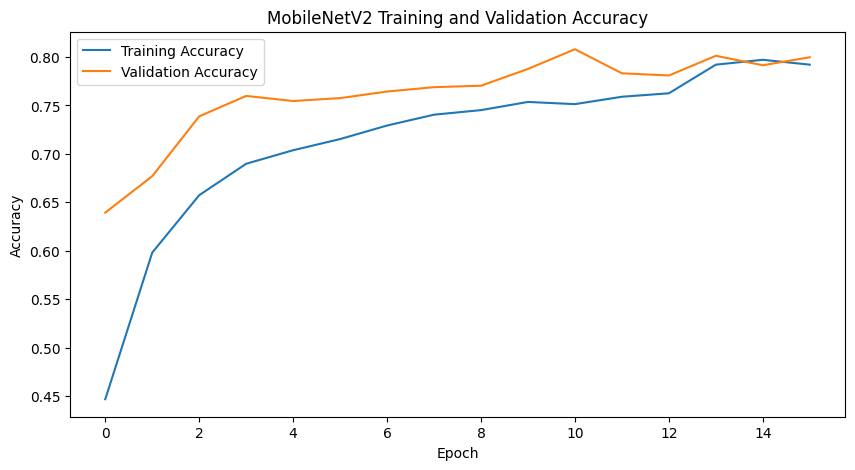

In [46]:
plt.figure(figsize=(10, 5))

plt.plot(
    history_transfer.history["accuracy"],
    label="Training Accuracy"
)

plt.plot(
    history_transfer.history["val_accuracy"],
    label="Validation Accuracy"
)

plt.title("MobileNetV2 Training and Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.show()

## 42. MobileNetV2 Loss Curve

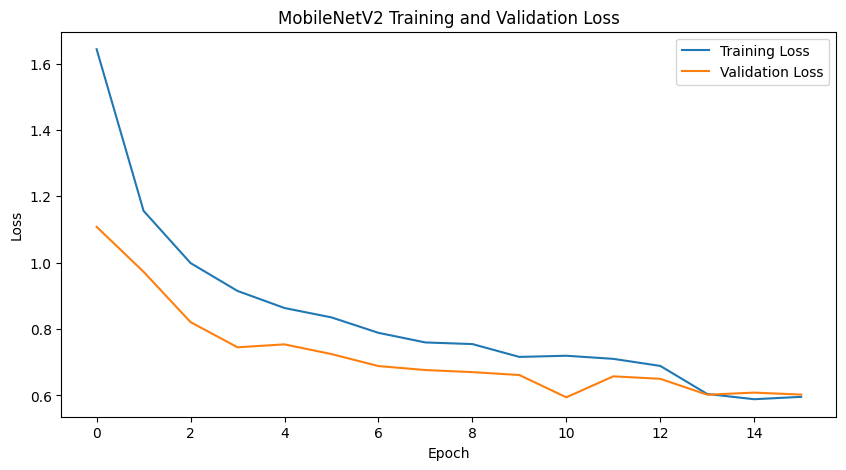

In [47]:
plt.figure(figsize=(10, 5))

plt.plot(
    history_transfer.history["loss"],
    label="Training Loss"
)

plt.plot(
    history_transfer.history["val_loss"],
    label="Validation Loss"
)

plt.title("MobileNetV2 Training and Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

plt.show()

## 43. MobileNetV2 Test Evaluation

In [48]:
transfer_loss, transfer_accuracy = transfer_model.evaluate(
    test_ds
)

print(f"MobileNetV2 Test Loss: {transfer_loss:.4f}")
print(f"MobileNetV2 Test Accuracy: {transfer_accuracy:.4f}")

 1/41 [..............................] - ETA: 8s - loss: 0.4996 - accuracy: 0.8125

 2/41 [>.............................] - ETA: 2s - loss: 0.5328 - accuracy: 0.8281

 3/41 [=>............................] - ETA: 2s - loss: 0.5374 - accuracy: 0.8125

 4/41 [=>............................] - ETA: 2s - loss: 0.5203 - accuracy: 0.8125

 5/41 [==>...........................] - ETA: 2s - loss: 0.5733 - accuracy: 0.7812

 6/41 [===>..........................] - ETA: 2s - loss: 0.5905 - accuracy: 0.7760

 7/41 [====>.........................] - ETA: 2s - loss: 0.5798 - accuracy: 0.7768

 8/41 [====>.........................] - ETA: 2s - loss: 0.5683 - accuracy: 0.7852

 9/41 [=====>........................] - ETA: 1s - loss: 0.5430 - accuracy: 0.7951

10/41 [======>.......................] - ETA: 1s - loss: 0.5425 - accuracy: 0.8000

11/41 [=======>......................] - ETA: 1s - loss: 0.5359 - accuracy: 0.8040

12/41 [=======>......................] - ETA: 1s - loss: 0.5365 - accuracy: 0.8021

13/41 [========>.....................] - ETA: 1s - loss: 0.5489 - accuracy: 0.7933

14/41 [=========>....................] - ETA: 1s - loss: 0.5430 - accuracy: 0.7969

15/41 [=========>....................] - ETA: 1s - loss: 0.5417 - accuracy: 0.8021

16/41 [==========>...................] - ETA: 1s - loss: 0.5667 - accuracy: 0.7969

17/41 [===========>..................] - ETA: 1s - loss: 0.5629 - accuracy: 0.7960

18/41 [============>.................] - ETA: 1s - loss: 0.5772 - accuracy: 0.7917

19/41 [============>.................] - ETA: 1s - loss: 0.5890 - accuracy: 0.7862

20/41 [=============>................] - ETA: 1s - loss: 0.5965 - accuracy: 0.7844

21/41 [==============>...............] - ETA: 1s - loss: 0.5908 - accuracy: 0.7857

22/41 [===============>..............] - ETA: 1s - loss: 0.5815 - accuracy: 0.7912

23/41 [===============>..............] - ETA: 1s - loss: 0.5856 - accuracy: 0.7921

24/41 [================>.............] - ETA: 1s - loss: 0.5993 - accuracy: 0.7878

25/41 [=================>............] - ETA: 0s - loss: 0.5979 - accuracy: 0.7925

26/41 [==================>...........] - ETA: 0s - loss: 0.5963 - accuracy: 0.7909

27/41 [==================>...........] - ETA: 0s - loss: 0.5904 - accuracy: 0.7951

28/41 [===================>..........] - ETA: 0s - loss: 0.5867 - accuracy: 0.7969

29/41 [====================>.........] - ETA: 0s - loss: 0.5811 - accuracy: 0.7985

30/41 [====================>.........] - ETA: 0s - loss: 0.5803 - accuracy: 0.7979

31/41 [=====================>........] - ETA: 0s - loss: 0.5794 - accuracy: 0.7984

32/41 [======================>.......] - ETA: 0s - loss: 0.5713 - accuracy: 0.8018

33/41 [=======================>......] - ETA: 0s - loss: 0.5723 - accuracy: 0.8021

34/41 [=======================>......] - ETA: 0s - loss: 0.5695 - accuracy: 0.8033

35/41 [========================>.....] - ETA: 0s - loss: 0.5715 - accuracy: 0.8027

36/41 [=========================>....] - ETA: 0s - loss: 0.5686 - accuracy: 0.8056

37/41 [==========================>...] - ETA: 0s - loss: 0.5654 - accuracy: 0.8066

38/41 [==========================>...] - ETA: 0s - loss: 0.5622 - accuracy: 0.8092

39/41 [===========================>..] - ETA: 0s - loss: 0.5601 - accuracy: 0.8085

40/41 [============================>.] - ETA: 0s - loss: 0.5630 - accuracy: 0.8086

41/41 [==============================] - ETA: 0s - loss: 0.5706 - accuracy: 0.8056

41/41 [==============================] - 3s 62ms/step - loss: 0.5706 - accuracy: 0.8056


MobileNetV2 Test Loss: 0.5706
MobileNetV2 Test Accuracy: 0.8056


## 44. MobileNetV2 Predictions

In [49]:
y_true_transfer = []
y_pred_transfer = []

for images, labels in test_ds:
    predictions = transfer_model.predict(
        images,
        verbose=0
    )

    predicted_classes = np.argmax(
        predictions,
        axis=1
    )

    y_true_transfer.extend(labels.numpy())
    y_pred_transfer.extend(predicted_classes)

y_true_transfer = np.array(y_true_transfer)
y_pred_transfer = np.array(y_pred_transfer)

## 45. MobileNetV2 Classification Report

In [50]:
print(
    classification_report(
        y_true_transfer,
        y_pred_transfer,
        target_names=class_names_tf
    )
)

                                      precision    recall  f1-score   support

                      Bacterial_spot       0.72      0.71      0.72       129
                        Early_blight       0.75      0.73      0.74       137
                         Late_blight       0.63      0.78      0.70       112
                           Leaf_Mold       0.83      0.71      0.77       125
                  Septoria_leaf_spot       0.75      0.65      0.70       133
Spider_mites Two-spotted_spider_mite       0.82      0.84      0.83       115
                         Target_Spot       0.64      0.83      0.72       101
       Tomato_Yellow_Leaf_Curl_Virus       1.00      0.94      0.97       104
                 Tomato_mosaic_virus       0.99      0.88      0.93       114
                             healthy       0.93      0.92      0.92       126
                      powdery_mildew       0.82      0.84      0.83       116

                            accuracy                          

## 46. MobileNetV2 Confusion Matrix

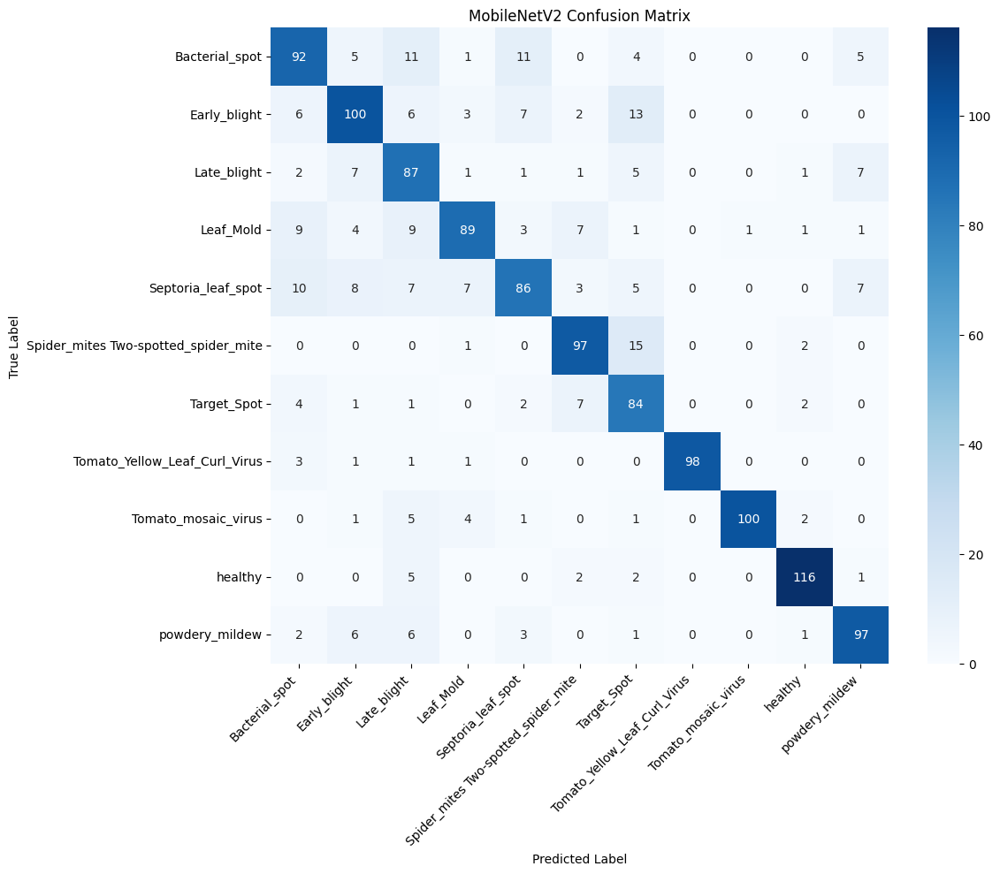

In [51]:
cm_transfer = confusion_matrix(
    y_true_transfer,
    y_pred_transfer
)

plt.figure(figsize=(12, 10))

sns.heatmap(
    cm_transfer,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names_tf,
    yticklabels=class_names_tf
)

plt.title("MobileNetV2 Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()

## 47. MobileNetV2 Main Metrics

In [52]:
transfer_precision = precision_score(
    y_true_transfer,
    y_pred_transfer,
    average="weighted",
    zero_division=0
)

transfer_recall = recall_score(
    y_true_transfer,
    y_pred_transfer,
    average="weighted",
    zero_division=0
)

transfer_f1 = f1_score(
    y_true_transfer,
    y_pred_transfer,
    average="weighted",
    zero_division=0
)

print("MobileNetV2 Performance")
print("----------------------------")
print(f"Accuracy : {transfer_accuracy:.4f}")
print(f"Precision: {transfer_precision:.4f}")
print(f"Recall   : {transfer_recall:.4f}")
print(f"F1 Score : {transfer_f1:.4f}")

MobileNetV2 Performance
----------------------------
Accuracy : 0.8056
Precision: 0.8066
Recall   : 0.7973
F1 Score : 0.7991


# 🏆 48. Model Comparison

In [53]:
results = pd.DataFrame({
    "Model": [
        "CNN From Scratch",
        "MobileNetV2 Transfer Learning"
    ],
    "Accuracy": [
        cnn_accuracy,
        transfer_accuracy
    ],
    "Precision": [
        cnn_precision,
        transfer_precision
    ],
    "Recall": [
        cnn_recall,
        transfer_recall
    ],
    "F1 Score": [
        cnn_f1,
        transfer_f1
    ]
})

results

,Model,Accuracy,Precision,Recall,F1 Score
0,CNN From Scratch,0.775915,0.772976,0.770579,0.765015
1,MobileNetV2 Transfer Learning,0.805640,0.806630,0.797256,0.799072


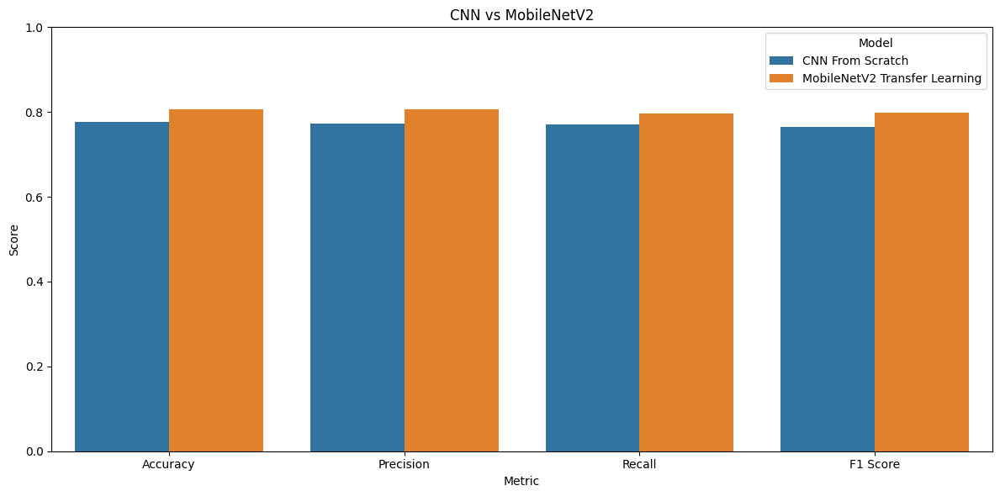

In [54]:
results_melted = results.melt(
    id_vars="Model",
    var_name="Metric",
    value_name="Score"
)

plt.figure(figsize=(12, 6))

sns.barplot(
    data=results_melted,
    x="Metric",
    y="Score",
    hue="Model"
)

plt.ylim(0, 1)
plt.title("CNN vs MobileNetV2")
plt.tight_layout()
plt.show()

### Model Comparison Discussion

Compare the models using more than accuracy.

Consider:
- Which model has the highest F1-score?
- Which model has the highest recall?
- Which disease classes are hardest to classify?
- Does transfer learning improve generalization?
- Is there evidence of overfitting?

# 🔎 49. Error Analysis

In [55]:
incorrect_images = []
incorrect_actual = []
incorrect_predicted = []
incorrect_confidence = []

for images, labels in test_ds:

    predictions = transfer_model.predict(
        images,
        verbose=0
    )

    predicted_classes = np.argmax(
        predictions,
        axis=1
    )

    confidence = np.max(
        predictions,
        axis=1
    )

    for i in range(len(images)):

        actual = int(labels[i].numpy())
        predicted = int(predicted_classes[i])

        if actual != predicted:

            incorrect_images.append(
                images[i].numpy().astype("uint8")
            )

            incorrect_actual.append(
                class_names_tf[actual]
            )

            incorrect_predicted.append(
                class_names_tf[predicted]
            )

            incorrect_confidence.append(
                confidence[i]
            )

        if len(incorrect_images) >= 9:
            break

    if len(incorrect_images) >= 9:
        break

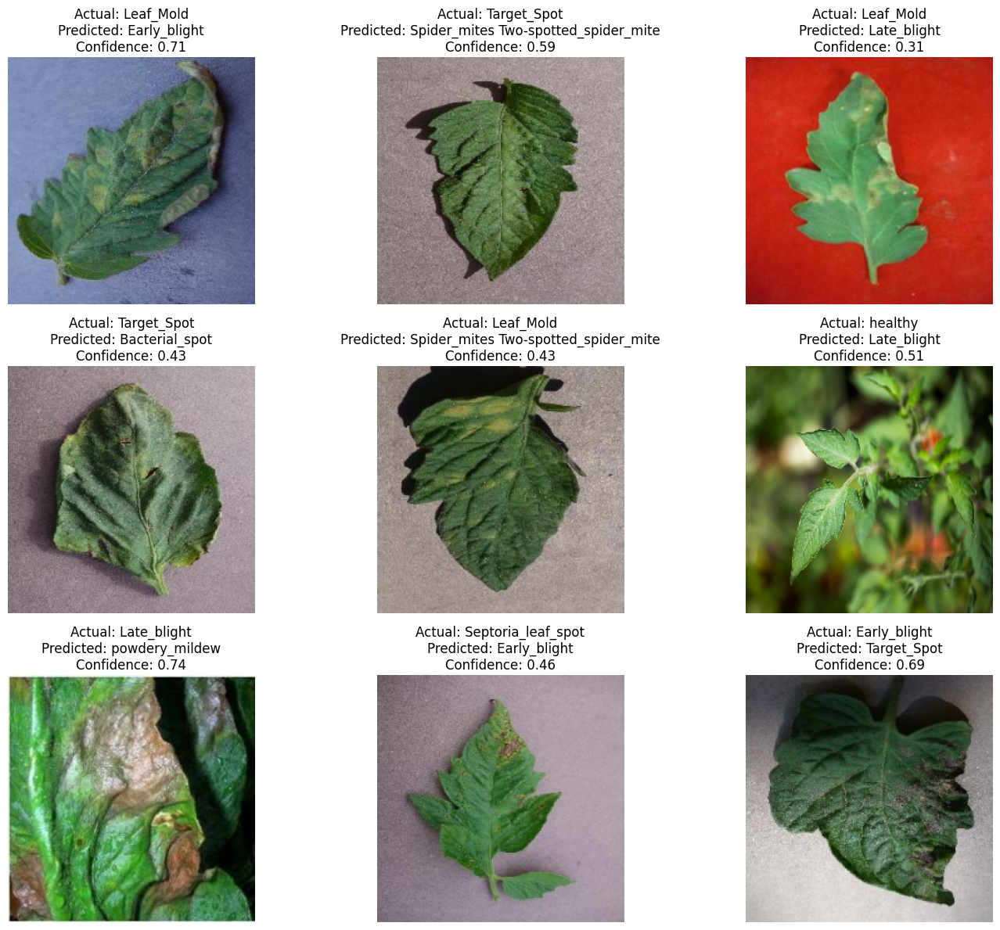

In [56]:
plt.figure(figsize=(15, 12))

for i in range(min(9, len(incorrect_images))):

    plt.subplot(3, 3, i + 1)

    plt.imshow(
        incorrect_images[i]
    )

    plt.title(
        f"Actual: {incorrect_actual[i]}\n"
        f"Predicted: {incorrect_predicted[i]}\n"
        f"Confidence: {incorrect_confidence[i]:.2f}"
    )

    plt.axis("off")

plt.tight_layout()
plt.show()

# 50. Optional Fine-Tuning

Run this section **only after the baseline CNN and transfer-learning model are working**.

We unfreeze only the last part of MobileNetV2 and train with a much smaller learning rate.
This can improve task-specific feature learning but may also cause overfitting.

In [57]:
base_model.trainable = True

# Freeze earlier layers; fine-tune only the last 30 layers.
for layer in base_model.layers[:-30]:
    layer.trainable = False

print(
    "Trainable MobileNetV2 layers:",
    sum(layer.trainable for layer in base_model.layers)
)

Trainable MobileNetV2 layers: 30


In [58]:
transfer_model.compile(
    optimizer=keras.optimizers.Adam(
        learning_rate=1e-5
    ),
    loss="sparse_categorical_crossentropy",
    metrics=["accuracy"]
)

In [59]:
history_finetune = transfer_model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[
        early_stopping,
        reduce_lr
    ]
)

Epoch 1/10


  1/193 [..............................] - ETA: 23:40 - loss: 1.6719 - accuracy: 0.4375

  2/193 [..............................] - ETA: 1:10 - loss: 1.4851 - accuracy: 0.5156 

  3/193 [..............................] - ETA: 1:11 - loss: 1.6138 - accuracy: 0.4792

  4/193 [..............................] - ETA: 1:10 - loss: 1.4951 - accuracy: 0.5391

  5/193 [..............................] - ETA: 1:11 - loss: 1.4788 - accuracy: 0.5500

  6/193 [..............................] - ETA: 1:10 - loss: 1.5527 - accuracy: 0.5156

  7/193 [>.............................] - ETA: 1:10 - loss: 1.5887 - accuracy: 0.4866

  8/193 [>.............................] - ETA: 1:10 - loss: 1.5724 - accuracy: 0.4766

  9/193 [>.............................] - ETA: 1:10 - loss: 1.6403 - accuracy: 0.4618

 10/193 [>.............................] - ETA: 1:10 - loss: 1.5968 - accuracy: 0.4750

 11/193 [>.............................] - ETA: 1:10 - loss: 1.6064 - accuracy: 0.4773

 12/193 [>.............................] - ETA: 1:10 - loss: 1.6020 - accuracy: 0.4792

 13/193 [=>............................] - ETA: 1:10 - loss: 1.6000 - accuracy: 0.4808

 14/193 [=>............................] - ETA: 1:10 - loss: 1.6280 - accuracy: 0.4799

 15/193 [=>............................] - ETA: 1:10 - loss: 1.6304 - accuracy: 0.4792

 16/193 [=>............................] - ETA: 1:10 - loss: 1.6272 - accuracy: 0.4727

 17/193 [=>............................] - ETA: 1:10 - loss: 1.6172 - accuracy: 0.4761

 18/193 [=>............................] - ETA: 1:10 - loss: 1.6185 - accuracy: 0.4722

 19/193 [=>............................] - ETA: 1:10 - loss: 1.6117 - accuracy: 0.4737

 20/193 [==>...........................] - ETA: 1:09 - loss: 1.6137 - accuracy: 0.4750

 21/193 [==>...........................] - ETA: 1:09 - loss: 1.5893 - accuracy: 0.4851

 22/193 [==>...........................] - ETA: 1:08 - loss: 1.5683 - accuracy: 0.4872

 23/193 [==>...........................] - ETA: 1:08 - loss: 1.5692 - accuracy: 0.4864

 24/193 [==>...........................] - ETA: 1:07 - loss: 1.5685 - accuracy: 0.4844

 25/193 [==>...........................] - ETA: 1:07 - loss: 1.5810 - accuracy: 0.4825

 26/193 [===>..........................] - ETA: 1:06 - loss: 1.5746 - accuracy: 0.4832

 27/193 [===>..........................] - ETA: 1:06 - loss: 1.5554 - accuracy: 0.4896

 28/193 [===>..........................] - ETA: 1:06 - loss: 1.5430 - accuracy: 0.4967

 29/193 [===>..........................] - ETA: 1:05 - loss: 1.5525 - accuracy: 0.4925

 30/193 [===>..........................] - ETA: 1:05 - loss: 1.5255 - accuracy: 0.5000

 31/193 [===>..........................] - ETA: 1:04 - loss: 1.5408 - accuracy: 0.4960

 32/193 [===>..........................] - ETA: 1:04 - loss: 1.5712 - accuracy: 0.4902

 33/193 [====>.........................] - ETA: 1:03 - loss: 1.5608 - accuracy: 0.4915

 34/193 [====>.........................] - ETA: 1:03 - loss: 1.5759 - accuracy: 0.4862

 35/193 [====>.........................] - ETA: 1:03 - loss: 1.5630 - accuracy: 0.4902

 36/193 [====>.........................] - ETA: 1:02 - loss: 1.5690 - accuracy: 0.4878

 37/193 [====>.........................] - ETA: 1:02 - loss: 1.5523 - accuracy: 0.4916

 38/193 [====>.........................] - ETA: 1:01 - loss: 1.5524 - accuracy: 0.4951

 39/193 [=====>........................] - ETA: 1:01 - loss: 1.5491 - accuracy: 0.4960

 40/193 [=====>........................] - ETA: 1:00 - loss: 1.5429 - accuracy: 0.4984

 41/193 [=====>........................] - ETA: 1:00 - loss: 1.5357 - accuracy: 0.5015

 42/193 [=====>........................] - ETA: 1:00 - loss: 1.5344 - accuracy: 0.4985

 43/193 [=====>........................] - ETA: 59s - loss: 1.5340 - accuracy: 0.4985 

 44/193 [=====>........................] - ETA: 59s - loss: 1.5374 - accuracy: 0.4950

 45/193 [=====>........................] - ETA: 59s - loss: 1.5302 - accuracy: 0.4965

 46/193 [======>.......................] - ETA: 58s - loss: 1.5301 - accuracy: 0.4966

 47/193 [======>.......................] - ETA: 58s - loss: 1.5184 - accuracy: 0.4993

 48/193 [======>.......................] - ETA: 57s - loss: 1.5137 - accuracy: 0.5020

 49/193 [======>.......................] - ETA: 57s - loss: 1.5176 - accuracy: 0.5019

 50/193 [======>.......................] - ETA: 57s - loss: 1.5122 - accuracy: 0.5031

 51/193 [======>.......................] - ETA: 56s - loss: 1.5112 - accuracy: 0.5043

 52/193 [=======>......................] - ETA: 56s - loss: 1.5153 - accuracy: 0.5054

 53/193 [=======>......................] - ETA: 56s - loss: 1.5164 - accuracy: 0.5077

 54/193 [=======>......................] - ETA: 55s - loss: 1.5089 - accuracy: 0.5098

 55/193 [=======>......................] - ETA: 55s - loss: 1.5087 - accuracy: 0.5102

 56/193 [=======>......................] - ETA: 54s - loss: 1.5080 - accuracy: 0.5095

 57/193 [=======>......................] - ETA: 54s - loss: 1.4993 - accuracy: 0.5121

 58/193 [========>.....................] - ETA: 54s - loss: 1.4945 - accuracy: 0.5135

 59/193 [========>.....................] - ETA: 53s - loss: 1.4867 - accuracy: 0.5180

 60/193 [========>.....................] - ETA: 53s - loss: 1.4858 - accuracy: 0.5182

 61/193 [========>.....................] - ETA: 52s - loss: 1.4863 - accuracy: 0.5184

 62/193 [========>.....................] - ETA: 52s - loss: 1.4794 - accuracy: 0.5197

 63/193 [========>.....................] - ETA: 51s - loss: 1.4722 - accuracy: 0.5213

 64/193 [========>.....................] - ETA: 51s - loss: 1.4660 - accuracy: 0.5225

 65/193 [=========>....................] - ETA: 51s - loss: 1.4588 - accuracy: 0.5250

 66/193 [=========>....................] - ETA: 50s - loss: 1.4568 - accuracy: 0.5251

 67/193 [=========>....................] - ETA: 50s - loss: 1.4522 - accuracy: 0.5247

 68/193 [=========>....................] - ETA: 49s - loss: 1.4486 - accuracy: 0.5248

 69/193 [=========>....................] - ETA: 49s - loss: 1.4600 - accuracy: 0.5231

 70/193 [=========>....................] - ETA: 48s - loss: 1.4595 - accuracy: 0.5241

 71/193 [==========>...................] - ETA: 48s - loss: 1.4565 - accuracy: 0.5260

 72/193 [==========>...................] - ETA: 48s - loss: 1.4474 - accuracy: 0.5278

 73/193 [==========>...................] - ETA: 47s - loss: 1.4410 - accuracy: 0.5278

 74/193 [==========>...................] - ETA: 47s - loss: 1.4374 - accuracy: 0.5296

 75/193 [==========>...................] - ETA: 46s - loss: 1.4347 - accuracy: 0.5288

 76/193 [==========>...................] - ETA: 46s - loss: 1.4315 - accuracy: 0.5284

 77/193 [==========>...................] - ETA: 45s - loss: 1.4357 - accuracy: 0.5264

 78/193 [===========>..................] - ETA: 45s - loss: 1.4390 - accuracy: 0.5264

 79/193 [===========>..................] - ETA: 45s - loss: 1.4344 - accuracy: 0.5273

 80/193 [===========>..................] - ETA: 44s - loss: 1.4324 - accuracy: 0.5277

 81/193 [===========>..................] - ETA: 44s - loss: 1.4264 - accuracy: 0.5301

 82/193 [===========>..................] - ETA: 43s - loss: 1.4237 - accuracy: 0.5305

 83/193 [===========>..................] - ETA: 43s - loss: 1.4186 - accuracy: 0.5316

 84/193 [============>.................] - ETA: 43s - loss: 1.4151 - accuracy: 0.5342

 85/193 [============>.................] - ETA: 42s - loss: 1.4157 - accuracy: 0.5342

 86/193 [============>.................] - ETA: 42s - loss: 1.4115 - accuracy: 0.5356

 87/193 [============>.................] - ETA: 41s - loss: 1.4086 - accuracy: 0.5370

 88/193 [============>.................] - ETA: 41s - loss: 1.4069 - accuracy: 0.5380

 89/193 [============>.................] - ETA: 41s - loss: 1.4039 - accuracy: 0.5386

 90/193 [============>.................] - ETA: 40s - loss: 1.4032 - accuracy: 0.5392

 91/193 [=============>................] - ETA: 40s - loss: 1.3995 - accuracy: 0.5398

 92/193 [=============>................] - ETA: 39s - loss: 1.3985 - accuracy: 0.5404

 93/193 [=============>................] - ETA: 39s - loss: 1.3930 - accuracy: 0.5427

 94/193 [=============>................] - ETA: 39s - loss: 1.3908 - accuracy: 0.5426

 95/193 [=============>................] - ETA: 38s - loss: 1.3916 - accuracy: 0.5401

 96/193 [=============>................] - ETA: 38s - loss: 1.3865 - accuracy: 0.5413

 97/193 [==============>...............] - ETA: 37s - loss: 1.3843 - accuracy: 0.5416

 98/193 [==============>...............] - ETA: 37s - loss: 1.3858 - accuracy: 0.5408

 99/193 [==============>...............] - ETA: 37s - loss: 1.3807 - accuracy: 0.5414

100/193 [==============>...............] - ETA: 36s - loss: 1.3789 - accuracy: 0.5416

101/193 [==============>...............] - ETA: 36s - loss: 1.3768 - accuracy: 0.5421

102/193 [==============>...............] - ETA: 35s - loss: 1.3780 - accuracy: 0.5411

103/193 [===============>..............] - ETA: 35s - loss: 1.3778 - accuracy: 0.5407

104/193 [===============>..............] - ETA: 35s - loss: 1.3781 - accuracy: 0.5406

105/193 [===============>..............] - ETA: 34s - loss: 1.3768 - accuracy: 0.5411

106/193 [===============>..............] - ETA: 34s - loss: 1.3755 - accuracy: 0.5413

107/193 [===============>..............] - ETA: 33s - loss: 1.3746 - accuracy: 0.5415

108/193 [===============>..............] - ETA: 33s - loss: 1.3740 - accuracy: 0.5420

109/193 [===============>..............] - ETA: 33s - loss: 1.3726 - accuracy: 0.5419

110/193 [================>.............] - ETA: 32s - loss: 1.3723 - accuracy: 0.5409

111/193 [================>.............] - ETA: 32s - loss: 1.3748 - accuracy: 0.5411

112/193 [================>.............] - ETA: 32s - loss: 1.3699 - accuracy: 0.5421

113/193 [================>.............] - ETA: 31s - loss: 1.3668 - accuracy: 0.5429

114/193 [================>.............] - ETA: 31s - loss: 1.3621 - accuracy: 0.5447

115/193 [================>.............] - ETA: 30s - loss: 1.3584 - accuracy: 0.5459

116/193 [=================>............] - ETA: 30s - loss: 1.3536 - accuracy: 0.5477

117/193 [=================>............] - ETA: 30s - loss: 1.3529 - accuracy: 0.5486

118/193 [=================>............] - ETA: 29s - loss: 1.3529 - accuracy: 0.5485

119/193 [=================>............] - ETA: 29s - loss: 1.3528 - accuracy: 0.5481

120/193 [=================>............] - ETA: 28s - loss: 1.3515 - accuracy: 0.5484

121/193 [=================>............] - ETA: 28s - loss: 1.3516 - accuracy: 0.5480

122/193 [=================>............] - ETA: 28s - loss: 1.3495 - accuracy: 0.5487

123/193 [==================>...........] - ETA: 27s - loss: 1.3473 - accuracy: 0.5501

124/193 [==================>...........] - ETA: 27s - loss: 1.3455 - accuracy: 0.5512

125/193 [==================>...........] - ETA: 26s - loss: 1.3419 - accuracy: 0.5520

126/193 [==================>...........] - ETA: 26s - loss: 1.3404 - accuracy: 0.5521

127/193 [==================>...........] - ETA: 26s - loss: 1.3405 - accuracy: 0.5519

128/193 [==================>...........] - ETA: 25s - loss: 1.3371 - accuracy: 0.5527

129/193 [===================>..........] - ETA: 25s - loss: 1.3341 - accuracy: 0.5535

130/193 [===================>..........] - ETA: 24s - loss: 1.3357 - accuracy: 0.5526

131/193 [===================>..........] - ETA: 24s - loss: 1.3350 - accuracy: 0.5534

132/193 [===================>..........] - ETA: 24s - loss: 1.3329 - accuracy: 0.5540

133/193 [===================>..........] - ETA: 23s - loss: 1.3302 - accuracy: 0.5545

134/193 [===================>..........] - ETA: 23s - loss: 1.3290 - accuracy: 0.5548

135/193 [===================>..........] - ETA: 22s - loss: 1.3263 - accuracy: 0.5556

136/193 [====================>.........] - ETA: 22s - loss: 1.3232 - accuracy: 0.5561

137/193 [====================>.........] - ETA: 22s - loss: 1.3214 - accuracy: 0.5563

138/193 [====================>.........] - ETA: 21s - loss: 1.3194 - accuracy: 0.5568

139/193 [====================>.........] - ETA: 21s - loss: 1.3197 - accuracy: 0.5567

140/193 [====================>.........] - ETA: 20s - loss: 1.3164 - accuracy: 0.5574

141/193 [====================>.........] - ETA: 20s - loss: 1.3117 - accuracy: 0.5587

142/193 [=====================>........] - ETA: 20s - loss: 1.3090 - accuracy: 0.5601

143/193 [=====================>........] - ETA: 19s - loss: 1.3078 - accuracy: 0.5603

144/193 [=====================>........] - ETA: 19s - loss: 1.3073 - accuracy: 0.5605

145/193 [=====================>........] - ETA: 18s - loss: 1.3064 - accuracy: 0.5606

146/193 [=====================>........] - ETA: 18s - loss: 1.3039 - accuracy: 0.5610

147/193 [=====================>........] - ETA: 18s - loss: 1.3038 - accuracy: 0.5614

148/193 [======================>.......] - ETA: 17s - loss: 1.3015 - accuracy: 0.5621

149/193 [======================>.......] - ETA: 17s - loss: 1.2992 - accuracy: 0.5633

150/193 [======================>.......] - ETA: 17s - loss: 1.2954 - accuracy: 0.5652

151/193 [======================>.......] - ETA: 16s - loss: 1.2924 - accuracy: 0.5662

152/193 [======================>.......] - ETA: 16s - loss: 1.2882 - accuracy: 0.5672

153/193 [======================>.......] - ETA: 15s - loss: 1.2891 - accuracy: 0.5672

154/193 [======================>.......] - ETA: 15s - loss: 1.2867 - accuracy: 0.5680

155/193 [=======================>......] - ETA: 15s - loss: 1.2863 - accuracy: 0.5679

156/193 [=======================>......] - ETA: 14s - loss: 1.2854 - accuracy: 0.5683

157/193 [=======================>......] - ETA: 14s - loss: 1.2832 - accuracy: 0.5695

158/193 [=======================>......] - ETA: 13s - loss: 1.2805 - accuracy: 0.5712

159/193 [=======================>......] - ETA: 13s - loss: 1.2787 - accuracy: 0.5721

160/193 [=======================>......] - ETA: 13s - loss: 1.2773 - accuracy: 0.5725

161/193 [========================>.....] - ETA: 12s - loss: 1.2747 - accuracy: 0.5736

162/193 [========================>.....] - ETA: 12s - loss: 1.2733 - accuracy: 0.5743

163/193 [========================>.....] - ETA: 11s - loss: 1.2719 - accuracy: 0.5750

164/193 [========================>.....] - ETA: 11s - loss: 1.2709 - accuracy: 0.5749

165/193 [========================>.....] - ETA: 11s - loss: 1.2670 - accuracy: 0.5767

166/193 [========================>.....] - ETA: 10s - loss: 1.2656 - accuracy: 0.5766

167/193 [========================>.....] - ETA: 10s - loss: 1.2675 - accuracy: 0.5763

168/193 [=========================>....] - ETA: 9s - loss: 1.2656 - accuracy: 0.5770 

169/193 [=========================>....] - ETA: 9s - loss: 1.2640 - accuracy: 0.5775

170/193 [=========================>....] - ETA: 9s - loss: 1.2630 - accuracy: 0.5783

171/193 [=========================>....] - ETA: 8s - loss: 1.2613 - accuracy: 0.5788

172/193 [=========================>....] - ETA: 8s - loss: 1.2588 - accuracy: 0.5794

173/193 [=========================>....] - ETA: 7s - loss: 1.2600 - accuracy: 0.5788

174/193 [==========================>...] - ETA: 7s - loss: 1.2593 - accuracy: 0.5792

175/193 [==========================>...] - ETA: 7s - loss: 1.2581 - accuracy: 0.5793

176/193 [==========================>...] - ETA: 6s - loss: 1.2560 - accuracy: 0.5797

177/193 [==========================>...] - ETA: 6s - loss: 1.2561 - accuracy: 0.5800

178/193 [==========================>...] - ETA: 5s - loss: 1.2544 - accuracy: 0.5806

179/193 [==========================>...] - ETA: 5s - loss: 1.2531 - accuracy: 0.5808

180/193 [==========================>...] - ETA: 5s - loss: 1.2515 - accuracy: 0.5814

181/193 [===========================>..] - ETA: 4s - loss: 1.2506 - accuracy: 0.5818

182/193 [===========================>..] - ETA: 4s - loss: 1.2499 - accuracy: 0.5819

183/193 [===========================>..] - ETA: 3s - loss: 1.2484 - accuracy: 0.5823

184/193 [===========================>..] - ETA: 3s - loss: 1.2472 - accuracy: 0.5831

185/193 [===========================>..] - ETA: 3s - loss: 1.2442 - accuracy: 0.5845

186/193 [===========================>..] - ETA: 2s - loss: 1.2405 - accuracy: 0.5852

187/193 [============================>.] - ETA: 2s - loss: 1.2403 - accuracy: 0.5854

188/193 [============================>.] - ETA: 1s - loss: 1.2378 - accuracy: 0.5864

189/193 [============================>.] - ETA: 1s - loss: 1.2363 - accuracy: 0.5865

190/193 [============================>.] - ETA: 1s - loss: 1.2347 - accuracy: 0.5868

191/193 [============================>.] - ETA: 0s - loss: 1.2340 - accuracy: 0.5867

192/193 [============================>.] - ETA: 0s - loss: 1.2330 - accuracy: 0.5871

193/193 [==============================] - ETA: 0s - loss: 1.2332 - accuracy: 0.5870

193/193 [==============================] - 88s 418ms/step - loss: 1.2332 - accuracy: 0.5870 - val_loss: 0.6603 - val_accuracy: 0.7854 - lr: 1.0000e-05


Epoch 2/10


  1/193 [..............................] - ETA: 1:48 - loss: 0.9681 - accuracy: 0.6562

  2/193 [..............................] - ETA: 1:15 - loss: 0.9164 - accuracy: 0.6562

  3/193 [..............................] - ETA: 1:14 - loss: 0.9349 - accuracy: 0.6354

  4/193 [..............................] - ETA: 1:13 - loss: 0.8917 - accuracy: 0.6797

  5/193 [..............................] - ETA: 1:12 - loss: 0.9562 - accuracy: 0.6687

  6/193 [..............................] - ETA: 1:12 - loss: 0.9456 - accuracy: 0.6771

  7/193 [>.............................] - ETA: 1:12 - loss: 0.9341 - accuracy: 0.6741

  8/193 [>.............................] - ETA: 1:12 - loss: 0.8954 - accuracy: 0.6953

  9/193 [>.............................] - ETA: 1:12 - loss: 0.8704 - accuracy: 0.7049

 10/193 [>.............................] - ETA: 1:11 - loss: 0.8821 - accuracy: 0.6969

 11/193 [>.............................] - ETA: 1:11 - loss: 0.8982 - accuracy: 0.6932

 12/193 [>.............................] - ETA: 1:11 - loss: 0.9400 - accuracy: 0.6745

 13/193 [=>............................] - ETA: 1:10 - loss: 0.9534 - accuracy: 0.6755

 14/193 [=>............................] - ETA: 1:10 - loss: 0.9352 - accuracy: 0.6786

 15/193 [=>............................] - ETA: 1:10 - loss: 0.9288 - accuracy: 0.6812

 16/193 [=>............................] - ETA: 1:09 - loss: 0.9322 - accuracy: 0.6816

 17/193 [=>............................] - ETA: 1:09 - loss: 0.9259 - accuracy: 0.6857

 18/193 [=>............................] - ETA: 1:08 - loss: 0.9346 - accuracy: 0.6788

 19/193 [=>............................] - ETA: 1:08 - loss: 0.9324 - accuracy: 0.6793

 20/193 [==>...........................] - ETA: 1:08 - loss: 0.9343 - accuracy: 0.6750

 21/193 [==>...........................] - ETA: 1:07 - loss: 0.9507 - accuracy: 0.6667

 22/193 [==>...........................] - ETA: 1:07 - loss: 0.9557 - accuracy: 0.6676

 23/193 [==>...........................] - ETA: 1:07 - loss: 0.9673 - accuracy: 0.6671

 24/193 [==>...........................] - ETA: 1:06 - loss: 0.9768 - accuracy: 0.6667

 25/193 [==>...........................] - ETA: 1:06 - loss: 0.9675 - accuracy: 0.6687

 26/193 [===>..........................] - ETA: 1:05 - loss: 0.9671 - accuracy: 0.6683

 27/193 [===>..........................] - ETA: 1:05 - loss: 0.9752 - accuracy: 0.6678

 28/193 [===>..........................] - ETA: 1:04 - loss: 0.9621 - accuracy: 0.6730

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.9523 - accuracy: 0.6746

 30/193 [===>..........................] - ETA: 1:03 - loss: 0.9530 - accuracy: 0.6740

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.9569 - accuracy: 0.6734

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.9689 - accuracy: 0.6719

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.9659 - accuracy: 0.6723

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.9634 - accuracy: 0.6728

 35/193 [====>.........................] - ETA: 1:01 - loss: 0.9707 - accuracy: 0.6714

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.9685 - accuracy: 0.6727

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.9753 - accuracy: 0.6698

 38/193 [====>.........................] - ETA: 1:00 - loss: 0.9696 - accuracy: 0.6727

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.9684 - accuracy: 0.6739

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.9680 - accuracy: 0.6742

 41/193 [=====>........................] - ETA: 59s - loss: 0.9655 - accuracy: 0.6745 

 42/193 [=====>........................] - ETA: 59s - loss: 0.9694 - accuracy: 0.6726

 43/193 [=====>........................] - ETA: 58s - loss: 0.9735 - accuracy: 0.6722

 44/193 [=====>........................] - ETA: 58s - loss: 0.9709 - accuracy: 0.6733

 45/193 [=====>........................] - ETA: 58s - loss: 0.9610 - accuracy: 0.6771

 46/193 [======>.......................] - ETA: 57s - loss: 0.9508 - accuracy: 0.6807

 47/193 [======>.......................] - ETA: 57s - loss: 0.9475 - accuracy: 0.6835

 48/193 [======>.......................] - ETA: 57s - loss: 0.9480 - accuracy: 0.6823

 49/193 [======>.......................] - ETA: 56s - loss: 0.9482 - accuracy: 0.6824

 50/193 [======>.......................] - ETA: 56s - loss: 0.9450 - accuracy: 0.6837

 51/193 [======>.......................] - ETA: 55s - loss: 0.9450 - accuracy: 0.6850

 52/193 [=======>......................] - ETA: 55s - loss: 0.9503 - accuracy: 0.6815

 53/193 [=======>......................] - ETA: 55s - loss: 0.9500 - accuracy: 0.6810

 54/193 [=======>......................] - ETA: 54s - loss: 0.9442 - accuracy: 0.6834

 55/193 [=======>......................] - ETA: 54s - loss: 0.9452 - accuracy: 0.6830

 56/193 [=======>......................] - ETA: 54s - loss: 0.9403 - accuracy: 0.6842

 57/193 [=======>......................] - ETA: 53s - loss: 0.9353 - accuracy: 0.6859

 58/193 [========>.....................] - ETA: 53s - loss: 0.9328 - accuracy: 0.6880

 59/193 [========>.....................] - ETA: 52s - loss: 0.9341 - accuracy: 0.6880

 60/193 [========>.....................] - ETA: 52s - loss: 0.9287 - accuracy: 0.6885

 61/193 [========>.....................] - ETA: 52s - loss: 0.9260 - accuracy: 0.6870

 62/193 [========>.....................] - ETA: 51s - loss: 0.9313 - accuracy: 0.6855

 63/193 [========>.....................] - ETA: 51s - loss: 0.9298 - accuracy: 0.6850

 64/193 [========>.....................] - ETA: 50s - loss: 0.9260 - accuracy: 0.6870

 65/193 [=========>....................] - ETA: 50s - loss: 0.9235 - accuracy: 0.6856

 66/193 [=========>....................] - ETA: 50s - loss: 0.9218 - accuracy: 0.6870

 67/193 [=========>....................] - ETA: 49s - loss: 0.9231 - accuracy: 0.6875

 68/193 [=========>....................] - ETA: 49s - loss: 0.9236 - accuracy: 0.6875

 69/193 [=========>....................] - ETA: 48s - loss: 0.9215 - accuracy: 0.6880

 70/193 [=========>....................] - ETA: 48s - loss: 0.9226 - accuracy: 0.6879

 71/193 [==========>...................] - ETA: 48s - loss: 0.9274 - accuracy: 0.6875

 72/193 [==========>...................] - ETA: 47s - loss: 0.9261 - accuracy: 0.6879

 73/193 [==========>...................] - ETA: 47s - loss: 0.9230 - accuracy: 0.6888

 74/193 [==========>...................] - ETA: 47s - loss: 0.9192 - accuracy: 0.6905

 75/193 [==========>...................] - ETA: 46s - loss: 0.9229 - accuracy: 0.6892

 76/193 [==========>...................] - ETA: 46s - loss: 0.9237 - accuracy: 0.6891

 77/193 [==========>...................] - ETA: 45s - loss: 0.9251 - accuracy: 0.6883

 78/193 [===========>..................] - ETA: 45s - loss: 0.9217 - accuracy: 0.6895

 79/193 [===========>..................] - ETA: 45s - loss: 0.9227 - accuracy: 0.6887

 80/193 [===========>..................] - ETA: 44s - loss: 0.9227 - accuracy: 0.6879

 81/193 [===========>..................] - ETA: 44s - loss: 0.9208 - accuracy: 0.6883

 82/193 [===========>..................] - ETA: 43s - loss: 0.9204 - accuracy: 0.6890

 83/193 [===========>..................] - ETA: 43s - loss: 0.9232 - accuracy: 0.6890

 84/193 [============>.................] - ETA: 43s - loss: 0.9218 - accuracy: 0.6897

 85/193 [============>.................] - ETA: 42s - loss: 0.9208 - accuracy: 0.6908

 86/193 [============>.................] - ETA: 42s - loss: 0.9199 - accuracy: 0.6911

 87/193 [============>.................] - ETA: 42s - loss: 0.9185 - accuracy: 0.6911

 88/193 [============>.................] - ETA: 41s - loss: 0.9184 - accuracy: 0.6911

 89/193 [============>.................] - ETA: 41s - loss: 0.9199 - accuracy: 0.6910

 90/193 [============>.................] - ETA: 40s - loss: 0.9233 - accuracy: 0.6892

 91/193 [=============>................] - ETA: 40s - loss: 0.9232 - accuracy: 0.6899

 92/193 [=============>................] - ETA: 40s - loss: 0.9191 - accuracy: 0.6902

 93/193 [=============>................] - ETA: 39s - loss: 0.9204 - accuracy: 0.6888

 94/193 [=============>................] - ETA: 39s - loss: 0.9235 - accuracy: 0.6872

 95/193 [=============>................] - ETA: 38s - loss: 0.9253 - accuracy: 0.6859

 96/193 [=============>................] - ETA: 38s - loss: 0.9258 - accuracy: 0.6852

 97/193 [==============>...............] - ETA: 38s - loss: 0.9242 - accuracy: 0.6865

 98/193 [==============>...............] - ETA: 37s - loss: 0.9253 - accuracy: 0.6862

 99/193 [==============>...............] - ETA: 37s - loss: 0.9226 - accuracy: 0.6872

100/193 [==============>...............] - ETA: 36s - loss: 0.9230 - accuracy: 0.6866

101/193 [==============>...............] - ETA: 36s - loss: 0.9216 - accuracy: 0.6869

102/193 [==============>...............] - ETA: 36s - loss: 0.9199 - accuracy: 0.6869

103/193 [===============>..............] - ETA: 35s - loss: 0.9172 - accuracy: 0.6878

104/193 [===============>..............] - ETA: 35s - loss: 0.9167 - accuracy: 0.6875

105/193 [===============>..............] - ETA: 34s - loss: 0.9167 - accuracy: 0.6881

106/193 [===============>..............] - ETA: 34s - loss: 0.9151 - accuracy: 0.6893

107/193 [===============>..............] - ETA: 34s - loss: 0.9182 - accuracy: 0.6884

108/193 [===============>..............] - ETA: 33s - loss: 0.9225 - accuracy: 0.6869

109/193 [===============>..............] - ETA: 33s - loss: 0.9237 - accuracy: 0.6866

110/193 [================>.............] - ETA: 32s - loss: 0.9226 - accuracy: 0.6866

111/193 [================>.............] - ETA: 32s - loss: 0.9208 - accuracy: 0.6869

112/193 [================>.............] - ETA: 32s - loss: 0.9216 - accuracy: 0.6861

113/193 [================>.............] - ETA: 31s - loss: 0.9228 - accuracy: 0.6858

114/193 [================>.............] - ETA: 31s - loss: 0.9205 - accuracy: 0.6870

115/193 [================>.............] - ETA: 30s - loss: 0.9199 - accuracy: 0.6878

116/193 [=================>............] - ETA: 30s - loss: 0.9199 - accuracy: 0.6870

117/193 [=================>............] - ETA: 30s - loss: 0.9200 - accuracy: 0.6872

118/193 [=================>............] - ETA: 29s - loss: 0.9225 - accuracy: 0.6867

119/193 [=================>............] - ETA: 29s - loss: 0.9204 - accuracy: 0.6870

120/193 [=================>............] - ETA: 28s - loss: 0.9194 - accuracy: 0.6875

121/193 [=================>............] - ETA: 28s - loss: 0.9203 - accuracy: 0.6870

122/193 [=================>............] - ETA: 28s - loss: 0.9185 - accuracy: 0.6880

123/193 [==================>...........] - ETA: 27s - loss: 0.9199 - accuracy: 0.6878

124/193 [==================>...........] - ETA: 27s - loss: 0.9217 - accuracy: 0.6875

125/193 [==================>...........] - ETA: 26s - loss: 0.9234 - accuracy: 0.6870

126/193 [==================>...........] - ETA: 26s - loss: 0.9250 - accuracy: 0.6863

127/193 [==================>...........] - ETA: 26s - loss: 0.9242 - accuracy: 0.6868

128/193 [==================>...........] - ETA: 25s - loss: 0.9217 - accuracy: 0.6875

129/193 [===================>..........] - ETA: 25s - loss: 0.9193 - accuracy: 0.6877

130/193 [===================>..........] - ETA: 24s - loss: 0.9184 - accuracy: 0.6880

131/193 [===================>..........] - ETA: 24s - loss: 0.9168 - accuracy: 0.6885

132/193 [===================>..........] - ETA: 24s - loss: 0.9170 - accuracy: 0.6884

133/193 [===================>..........] - ETA: 23s - loss: 0.9175 - accuracy: 0.6875

134/193 [===================>..........] - ETA: 23s - loss: 0.9185 - accuracy: 0.6877

135/193 [===================>..........] - ETA: 22s - loss: 0.9160 - accuracy: 0.6882

136/193 [====================>.........] - ETA: 22s - loss: 0.9135 - accuracy: 0.6886

137/193 [====================>.........] - ETA: 22s - loss: 0.9127 - accuracy: 0.6891

138/193 [====================>.........] - ETA: 21s - loss: 0.9104 - accuracy: 0.6900

139/193 [====================>.........] - ETA: 21s - loss: 0.9091 - accuracy: 0.6904

140/193 [====================>.........] - ETA: 20s - loss: 0.9085 - accuracy: 0.6911

141/193 [====================>.........] - ETA: 20s - loss: 0.9095 - accuracy: 0.6904

142/193 [=====================>........] - ETA: 20s - loss: 0.9109 - accuracy: 0.6901

143/193 [=====================>........] - ETA: 19s - loss: 0.9106 - accuracy: 0.6908

144/193 [=====================>........] - ETA: 19s - loss: 0.9109 - accuracy: 0.6905

145/193 [=====================>........] - ETA: 18s - loss: 0.9105 - accuracy: 0.6909

146/193 [=====================>........] - ETA: 18s - loss: 0.9081 - accuracy: 0.6918

147/193 [=====================>........] - ETA: 18s - loss: 0.9122 - accuracy: 0.6894

148/193 [======================>.......] - ETA: 17s - loss: 0.9113 - accuracy: 0.6902

149/193 [======================>.......] - ETA: 17s - loss: 0.9114 - accuracy: 0.6900

150/193 [======================>.......] - ETA: 16s - loss: 0.9103 - accuracy: 0.6900

151/193 [======================>.......] - ETA: 16s - loss: 0.9117 - accuracy: 0.6900

152/193 [======================>.......] - ETA: 16s - loss: 0.9118 - accuracy: 0.6898

153/193 [======================>.......] - ETA: 15s - loss: 0.9101 - accuracy: 0.6906

154/193 [======================>.......] - ETA: 15s - loss: 0.9108 - accuracy: 0.6907

155/193 [=======================>......] - ETA: 15s - loss: 0.9099 - accuracy: 0.6907

156/193 [=======================>......] - ETA: 14s - loss: 0.9082 - accuracy: 0.6909

157/193 [=======================>......] - ETA: 14s - loss: 0.9098 - accuracy: 0.6901

158/193 [=======================>......] - ETA: 13s - loss: 0.9094 - accuracy: 0.6905

159/193 [=======================>......] - ETA: 13s - loss: 0.9075 - accuracy: 0.6910

160/193 [=======================>......] - ETA: 13s - loss: 0.9067 - accuracy: 0.6908

161/193 [========================>.....] - ETA: 12s - loss: 0.9072 - accuracy: 0.6908

162/193 [========================>.....] - ETA: 12s - loss: 0.9085 - accuracy: 0.6904

163/193 [========================>.....] - ETA: 11s - loss: 0.9069 - accuracy: 0.6911

164/193 [========================>.....] - ETA: 11s - loss: 0.9081 - accuracy: 0.6905

165/193 [========================>.....] - ETA: 11s - loss: 0.9075 - accuracy: 0.6909

166/193 [========================>.....] - ETA: 10s - loss: 0.9067 - accuracy: 0.6907

167/193 [========================>.....] - ETA: 10s - loss: 0.9057 - accuracy: 0.6909

168/193 [=========================>....] - ETA: 9s - loss: 0.9049 - accuracy: 0.6918 

169/193 [=========================>....] - ETA: 9s - loss: 0.9033 - accuracy: 0.6923

170/193 [=========================>....] - ETA: 9s - loss: 0.9031 - accuracy: 0.6926

171/193 [=========================>....] - ETA: 8s - loss: 0.9022 - accuracy: 0.6933

172/193 [=========================>....] - ETA: 8s - loss: 0.9028 - accuracy: 0.6939

173/193 [=========================>....] - ETA: 7s - loss: 0.9034 - accuracy: 0.6936

174/193 [==========================>...] - ETA: 7s - loss: 0.9041 - accuracy: 0.6932

175/193 [==========================>...] - ETA: 7s - loss: 0.9028 - accuracy: 0.6936

176/193 [==========================>...] - ETA: 6s - loss: 0.9030 - accuracy: 0.6939

177/193 [==========================>...] - ETA: 6s - loss: 0.9018 - accuracy: 0.6944

178/193 [==========================>...] - ETA: 5s - loss: 0.9040 - accuracy: 0.6936

179/193 [==========================>...] - ETA: 5s - loss: 0.9030 - accuracy: 0.6941

180/193 [==========================>...] - ETA: 5s - loss: 0.9020 - accuracy: 0.6941

181/193 [===========================>..] - ETA: 4s - loss: 0.9005 - accuracy: 0.6946

182/193 [===========================>..] - ETA: 4s - loss: 0.9006 - accuracy: 0.6947

183/193 [===========================>..] - ETA: 3s - loss: 0.9004 - accuracy: 0.6950

184/193 [===========================>..] - ETA: 3s - loss: 0.9014 - accuracy: 0.6948

185/193 [===========================>..] - ETA: 3s - loss: 0.9009 - accuracy: 0.6949

186/193 [===========================>..] - ETA: 2s - loss: 0.9007 - accuracy: 0.6954

187/193 [============================>.] - ETA: 2s - loss: 0.8990 - accuracy: 0.6959

188/193 [============================>.] - ETA: 1s - loss: 0.9002 - accuracy: 0.6955

189/193 [============================>.] - ETA: 1s - loss: 0.9012 - accuracy: 0.6949

190/193 [============================>.] - ETA: 1s - loss: 0.9028 - accuracy: 0.6942

191/193 [============================>.] - ETA: 0s - loss: 0.9040 - accuracy: 0.6942

192/193 [============================>.] - ETA: 0s - loss: 0.9033 - accuracy: 0.6943

193/193 [==============================] - ETA: 0s - loss: 0.9036 - accuracy: 0.6942

193/193 [==============================] - 80s 411ms/step - loss: 0.9036 - accuracy: 0.6942 - val_loss: 0.6379 - val_accuracy: 0.7989 - lr: 1.0000e-05


Epoch 3/10


  1/193 [..............................] - ETA: 1:39 - loss: 0.9852 - accuracy: 0.6250

  2/193 [..............................] - ETA: 1:15 - loss: 0.8502 - accuracy: 0.7031

  3/193 [..............................] - ETA: 1:13 - loss: 0.9974 - accuracy: 0.6667

  4/193 [..............................] - ETA: 1:13 - loss: 0.9739 - accuracy: 0.6719

  5/193 [..............................] - ETA: 1:14 - loss: 0.9335 - accuracy: 0.6875

  6/193 [..............................] - ETA: 1:13 - loss: 0.9296 - accuracy: 0.6875

  7/193 [>.............................] - ETA: 1:13 - loss: 0.9127 - accuracy: 0.6830

  8/193 [>.............................] - ETA: 1:12 - loss: 0.8893 - accuracy: 0.6875

  9/193 [>.............................] - ETA: 1:12 - loss: 0.8722 - accuracy: 0.6910

 10/193 [>.............................] - ETA: 1:11 - loss: 0.8626 - accuracy: 0.6938

 11/193 [>.............................] - ETA: 1:11 - loss: 0.8501 - accuracy: 0.6989

 12/193 [>.............................] - ETA: 1:11 - loss: 0.8244 - accuracy: 0.7031

 13/193 [=>............................] - ETA: 1:10 - loss: 0.8427 - accuracy: 0.6971

 14/193 [=>............................] - ETA: 1:12 - loss: 0.8332 - accuracy: 0.7009

 15/193 [=>............................] - ETA: 1:11 - loss: 0.8215 - accuracy: 0.7083

 16/193 [=>............................] - ETA: 1:11 - loss: 0.8390 - accuracy: 0.7090

 17/193 [=>............................] - ETA: 1:10 - loss: 0.8285 - accuracy: 0.7096

 18/193 [=>............................] - ETA: 1:10 - loss: 0.8488 - accuracy: 0.6997

 19/193 [=>............................] - ETA: 1:10 - loss: 0.8451 - accuracy: 0.6974

 20/193 [==>...........................] - ETA: 1:10 - loss: 0.8502 - accuracy: 0.6984

 21/193 [==>...........................] - ETA: 1:09 - loss: 0.8491 - accuracy: 0.6949

 22/193 [==>...........................] - ETA: 1:09 - loss: 0.8506 - accuracy: 0.6932

 23/193 [==>...........................] - ETA: 1:08 - loss: 0.8433 - accuracy: 0.6943

 24/193 [==>...........................] - ETA: 1:08 - loss: 0.8470 - accuracy: 0.6927

 25/193 [==>...........................] - ETA: 1:07 - loss: 0.8439 - accuracy: 0.6950

 26/193 [===>..........................] - ETA: 1:07 - loss: 0.8393 - accuracy: 0.6959

 27/193 [===>..........................] - ETA: 1:07 - loss: 0.8400 - accuracy: 0.6956

 28/193 [===>..........................] - ETA: 1:06 - loss: 0.8448 - accuracy: 0.6953

 29/193 [===>..........................] - ETA: 1:06 - loss: 0.8437 - accuracy: 0.6929

 30/193 [===>..........................] - ETA: 1:05 - loss: 0.8542 - accuracy: 0.6875

 31/193 [===>..........................] - ETA: 1:05 - loss: 0.8545 - accuracy: 0.6905

 32/193 [===>..........................] - ETA: 1:04 - loss: 0.8529 - accuracy: 0.6934

 33/193 [====>.........................] - ETA: 1:04 - loss: 0.8414 - accuracy: 0.6998

 34/193 [====>.........................] - ETA: 1:03 - loss: 0.8373 - accuracy: 0.7022

 35/193 [====>.........................] - ETA: 1:03 - loss: 0.8397 - accuracy: 0.7000

 36/193 [====>.........................] - ETA: 1:02 - loss: 0.8448 - accuracy: 0.7005

 37/193 [====>.........................] - ETA: 1:02 - loss: 0.8466 - accuracy: 0.7027

 38/193 [====>.........................] - ETA: 1:01 - loss: 0.8406 - accuracy: 0.7048

 39/193 [=====>........................] - ETA: 1:01 - loss: 0.8334 - accuracy: 0.7083

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.8369 - accuracy: 0.7055

 41/193 [=====>........................] - ETA: 1:00 - loss: 0.8448 - accuracy: 0.7058

 42/193 [=====>........................] - ETA: 1:00 - loss: 0.8476 - accuracy: 0.7039

 43/193 [=====>........................] - ETA: 59s - loss: 0.8503 - accuracy: 0.7020 

 44/193 [=====>........................] - ETA: 59s - loss: 0.8487 - accuracy: 0.7024

 45/193 [=====>........................] - ETA: 58s - loss: 0.8517 - accuracy: 0.7028

 46/193 [======>.......................] - ETA: 58s - loss: 0.8569 - accuracy: 0.7024

 47/193 [======>.......................] - ETA: 58s - loss: 0.8564 - accuracy: 0.7035

 48/193 [======>.......................] - ETA: 57s - loss: 0.8650 - accuracy: 0.6992

 49/193 [======>.......................] - ETA: 57s - loss: 0.8645 - accuracy: 0.6983

 50/193 [======>.......................] - ETA: 57s - loss: 0.8636 - accuracy: 0.6994

 51/193 [======>.......................] - ETA: 56s - loss: 0.8697 - accuracy: 0.6961

 52/193 [=======>......................] - ETA: 56s - loss: 0.8660 - accuracy: 0.6983

 53/193 [=======>......................] - ETA: 55s - loss: 0.8706 - accuracy: 0.6958

 54/193 [=======>......................] - ETA: 55s - loss: 0.8681 - accuracy: 0.6973

 55/193 [=======>......................] - ETA: 54s - loss: 0.8693 - accuracy: 0.6972

 56/193 [=======>......................] - ETA: 54s - loss: 0.8641 - accuracy: 0.6992

 57/193 [=======>......................] - ETA: 54s - loss: 0.8593 - accuracy: 0.7018

 58/193 [========>.....................] - ETA: 53s - loss: 0.8627 - accuracy: 0.7010

 59/193 [========>.....................] - ETA: 53s - loss: 0.8608 - accuracy: 0.7013

 60/193 [========>.....................] - ETA: 53s - loss: 0.8597 - accuracy: 0.7016

 61/193 [========>.....................] - ETA: 52s - loss: 0.8595 - accuracy: 0.7013

 62/193 [========>.....................] - ETA: 52s - loss: 0.8556 - accuracy: 0.7016

 63/193 [========>.....................] - ETA: 51s - loss: 0.8583 - accuracy: 0.7004

 64/193 [========>.....................] - ETA: 51s - loss: 0.8577 - accuracy: 0.7002

 65/193 [=========>....................] - ETA: 51s - loss: 0.8546 - accuracy: 0.7010

 66/193 [=========>....................] - ETA: 50s - loss: 0.8547 - accuracy: 0.7008

 67/193 [=========>....................] - ETA: 50s - loss: 0.8501 - accuracy: 0.7029

 68/193 [=========>....................] - ETA: 49s - loss: 0.8463 - accuracy: 0.7045

 69/193 [=========>....................] - ETA: 49s - loss: 0.8473 - accuracy: 0.7038

 70/193 [=========>....................] - ETA: 48s - loss: 0.8497 - accuracy: 0.7027

 71/193 [==========>...................] - ETA: 48s - loss: 0.8508 - accuracy: 0.7020

 72/193 [==========>...................] - ETA: 48s - loss: 0.8473 - accuracy: 0.7036

 73/193 [==========>...................] - ETA: 47s - loss: 0.8468 - accuracy: 0.7038

 74/193 [==========>...................] - ETA: 47s - loss: 0.8440 - accuracy: 0.7040

 75/193 [==========>...................] - ETA: 46s - loss: 0.8425 - accuracy: 0.7050

 76/193 [==========>...................] - ETA: 46s - loss: 0.8475 - accuracy: 0.7039

 77/193 [==========>...................] - ETA: 45s - loss: 0.8492 - accuracy: 0.7045

 78/193 [===========>..................] - ETA: 45s - loss: 0.8474 - accuracy: 0.7059

 79/193 [===========>..................] - ETA: 45s - loss: 0.8483 - accuracy: 0.7057

 80/193 [===========>..................] - ETA: 44s - loss: 0.8472 - accuracy: 0.7055

 81/193 [===========>..................] - ETA: 44s - loss: 0.8479 - accuracy: 0.7049

 82/193 [===========>..................] - ETA: 44s - loss: 0.8507 - accuracy: 0.7035

 83/193 [===========>..................] - ETA: 43s - loss: 0.8478 - accuracy: 0.7044

 84/193 [============>.................] - ETA: 43s - loss: 0.8475 - accuracy: 0.7042

 85/193 [============>.................] - ETA: 42s - loss: 0.8492 - accuracy: 0.7048

 86/193 [============>.................] - ETA: 42s - loss: 0.8584 - accuracy: 0.7017

 87/193 [============>.................] - ETA: 42s - loss: 0.8564 - accuracy: 0.7029

 88/193 [============>.................] - ETA: 41s - loss: 0.8581 - accuracy: 0.7031

 89/193 [============>.................] - ETA: 41s - loss: 0.8592 - accuracy: 0.7033

 90/193 [============>.................] - ETA: 40s - loss: 0.8573 - accuracy: 0.7042

 91/193 [=============>................] - ETA: 40s - loss: 0.8559 - accuracy: 0.7040

 92/193 [=============>................] - ETA: 40s - loss: 0.8573 - accuracy: 0.7035

 93/193 [=============>................] - ETA: 39s - loss: 0.8570 - accuracy: 0.7033

 94/193 [=============>................] - ETA: 39s - loss: 0.8563 - accuracy: 0.7041

 95/193 [=============>................] - ETA: 38s - loss: 0.8542 - accuracy: 0.7053

 96/193 [=============>................] - ETA: 38s - loss: 0.8568 - accuracy: 0.7038

 97/193 [==============>...............] - ETA: 38s - loss: 0.8565 - accuracy: 0.7043

 98/193 [==============>...............] - ETA: 37s - loss: 0.8586 - accuracy: 0.7038

 99/193 [==============>...............] - ETA: 37s - loss: 0.8574 - accuracy: 0.7039

100/193 [==============>...............] - ETA: 36s - loss: 0.8561 - accuracy: 0.7044

101/193 [==============>...............] - ETA: 36s - loss: 0.8553 - accuracy: 0.7042

102/193 [==============>...............] - ETA: 36s - loss: 0.8552 - accuracy: 0.7044

103/193 [===============>..............] - ETA: 35s - loss: 0.8524 - accuracy: 0.7054

104/193 [===============>..............] - ETA: 35s - loss: 0.8526 - accuracy: 0.7052

105/193 [===============>..............] - ETA: 34s - loss: 0.8529 - accuracy: 0.7042

106/193 [===============>..............] - ETA: 34s - loss: 0.8527 - accuracy: 0.7055

107/193 [===============>..............] - ETA: 34s - loss: 0.8511 - accuracy: 0.7062

108/193 [===============>..............] - ETA: 33s - loss: 0.8499 - accuracy: 0.7063

109/193 [===============>..............] - ETA: 33s - loss: 0.8502 - accuracy: 0.7067

110/193 [================>.............] - ETA: 32s - loss: 0.8506 - accuracy: 0.7063

111/193 [================>.............] - ETA: 32s - loss: 0.8476 - accuracy: 0.7075

112/193 [================>.............] - ETA: 32s - loss: 0.8446 - accuracy: 0.7081

113/193 [================>.............] - ETA: 31s - loss: 0.8456 - accuracy: 0.7077

114/193 [================>.............] - ETA: 31s - loss: 0.8440 - accuracy: 0.7083

115/193 [================>.............] - ETA: 30s - loss: 0.8443 - accuracy: 0.7084

116/193 [=================>............] - ETA: 30s - loss: 0.8446 - accuracy: 0.7085

117/193 [=================>............] - ETA: 30s - loss: 0.8436 - accuracy: 0.7086

118/193 [=================>............] - ETA: 29s - loss: 0.8424 - accuracy: 0.7095

119/193 [=================>............] - ETA: 29s - loss: 0.8407 - accuracy: 0.7096

120/193 [=================>............] - ETA: 28s - loss: 0.8395 - accuracy: 0.7102

121/193 [=================>............] - ETA: 28s - loss: 0.8367 - accuracy: 0.7113

122/193 [=================>............] - ETA: 28s - loss: 0.8367 - accuracy: 0.7113

123/193 [==================>...........] - ETA: 27s - loss: 0.8368 - accuracy: 0.7119

124/193 [==================>...........] - ETA: 27s - loss: 0.8373 - accuracy: 0.7117

125/193 [==================>...........] - ETA: 26s - loss: 0.8393 - accuracy: 0.7120

126/193 [==================>...........] - ETA: 26s - loss: 0.8382 - accuracy: 0.7118

127/193 [==================>...........] - ETA: 26s - loss: 0.8366 - accuracy: 0.7126

128/193 [==================>...........] - ETA: 25s - loss: 0.8371 - accuracy: 0.7129

129/193 [===================>..........] - ETA: 25s - loss: 0.8361 - accuracy: 0.7125

130/193 [===================>..........] - ETA: 24s - loss: 0.8348 - accuracy: 0.7130

131/193 [===================>..........] - ETA: 24s - loss: 0.8336 - accuracy: 0.7137

132/193 [===================>..........] - ETA: 24s - loss: 0.8337 - accuracy: 0.7138

133/193 [===================>..........] - ETA: 23s - loss: 0.8331 - accuracy: 0.7138

134/193 [===================>..........] - ETA: 23s - loss: 0.8319 - accuracy: 0.7150

135/193 [===================>..........] - ETA: 22s - loss: 0.8339 - accuracy: 0.7148

136/193 [====================>.........] - ETA: 22s - loss: 0.8313 - accuracy: 0.7155

137/193 [====================>.........] - ETA: 22s - loss: 0.8291 - accuracy: 0.7162

138/193 [====================>.........] - ETA: 21s - loss: 0.8310 - accuracy: 0.7163

139/193 [====================>.........] - ETA: 21s - loss: 0.8321 - accuracy: 0.7163

140/193 [====================>.........] - ETA: 20s - loss: 0.8304 - accuracy: 0.7170

141/193 [====================>.........] - ETA: 20s - loss: 0.8296 - accuracy: 0.7170

142/193 [=====================>........] - ETA: 20s - loss: 0.8295 - accuracy: 0.7168

143/193 [=====================>........] - ETA: 19s - loss: 0.8300 - accuracy: 0.7166

144/193 [=====================>........] - ETA: 19s - loss: 0.8278 - accuracy: 0.7172

145/193 [=====================>........] - ETA: 19s - loss: 0.8274 - accuracy: 0.7175

146/193 [=====================>........] - ETA: 18s - loss: 0.8252 - accuracy: 0.7179

147/193 [=====================>........] - ETA: 18s - loss: 0.8246 - accuracy: 0.7179

148/193 [======================>.......] - ETA: 17s - loss: 0.8253 - accuracy: 0.7175

149/193 [======================>.......] - ETA: 17s - loss: 0.8231 - accuracy: 0.7179

150/193 [======================>.......] - ETA: 17s - loss: 0.8228 - accuracy: 0.7177

151/193 [======================>.......] - ETA: 16s - loss: 0.8228 - accuracy: 0.7175

152/193 [======================>.......] - ETA: 16s - loss: 0.8224 - accuracy: 0.7179

153/193 [======================>.......] - ETA: 15s - loss: 0.8234 - accuracy: 0.7175

154/193 [======================>.......] - ETA: 15s - loss: 0.8223 - accuracy: 0.7181

155/193 [=======================>......] - ETA: 15s - loss: 0.8205 - accuracy: 0.7188

156/193 [=======================>......] - ETA: 14s - loss: 0.8207 - accuracy: 0.7188

157/193 [=======================>......] - ETA: 14s - loss: 0.8216 - accuracy: 0.7186

158/193 [=======================>......] - ETA: 13s - loss: 0.8193 - accuracy: 0.7197

159/193 [=======================>......] - ETA: 13s - loss: 0.8195 - accuracy: 0.7195

160/193 [=======================>......] - ETA: 13s - loss: 0.8199 - accuracy: 0.7193

161/193 [========================>.....] - ETA: 12s - loss: 0.8184 - accuracy: 0.7201

162/193 [========================>.....] - ETA: 12s - loss: 0.8183 - accuracy: 0.7197

163/193 [========================>.....] - ETA: 11s - loss: 0.8185 - accuracy: 0.7195

164/193 [========================>.....] - ETA: 11s - loss: 0.8182 - accuracy: 0.7191

165/193 [========================>.....] - ETA: 11s - loss: 0.8191 - accuracy: 0.7188

166/193 [========================>.....] - ETA: 10s - loss: 0.8195 - accuracy: 0.7186

167/193 [========================>.....] - ETA: 10s - loss: 0.8200 - accuracy: 0.7188

168/193 [=========================>....] - ETA: 9s - loss: 0.8201 - accuracy: 0.7184 

169/193 [=========================>....] - ETA: 9s - loss: 0.8200 - accuracy: 0.7182

170/193 [=========================>....] - ETA: 9s - loss: 0.8200 - accuracy: 0.7184

171/193 [=========================>....] - ETA: 8s - loss: 0.8188 - accuracy: 0.7188

172/193 [=========================>....] - ETA: 8s - loss: 0.8176 - accuracy: 0.7195

173/193 [=========================>....] - ETA: 7s - loss: 0.8183 - accuracy: 0.7198

174/193 [==========================>...] - ETA: 7s - loss: 0.8196 - accuracy: 0.7195

175/193 [==========================>...] - ETA: 7s - loss: 0.8201 - accuracy: 0.7189

176/193 [==========================>...] - ETA: 6s - loss: 0.8194 - accuracy: 0.7193

177/193 [==========================>...] - ETA: 6s - loss: 0.8196 - accuracy: 0.7193

178/193 [==========================>...] - ETA: 5s - loss: 0.8222 - accuracy: 0.7184

179/193 [==========================>...] - ETA: 5s - loss: 0.8213 - accuracy: 0.7188

180/193 [==========================>...] - ETA: 5s - loss: 0.8198 - accuracy: 0.7193

181/193 [===========================>..] - ETA: 4s - loss: 0.8212 - accuracy: 0.7189

182/193 [===========================>..] - ETA: 4s - loss: 0.8203 - accuracy: 0.7193

183/193 [===========================>..] - ETA: 3s - loss: 0.8203 - accuracy: 0.7191

184/193 [===========================>..] - ETA: 3s - loss: 0.8184 - accuracy: 0.7196

185/193 [===========================>..] - ETA: 3s - loss: 0.8195 - accuracy: 0.7189

186/193 [===========================>..] - ETA: 2s - loss: 0.8190 - accuracy: 0.7193

187/193 [============================>.] - ETA: 2s - loss: 0.8183 - accuracy: 0.7198

188/193 [============================>.] - ETA: 1s - loss: 0.8188 - accuracy: 0.7191

189/193 [============================>.] - ETA: 1s - loss: 0.8189 - accuracy: 0.7197

190/193 [============================>.] - ETA: 1s - loss: 0.8222 - accuracy: 0.7189

191/193 [============================>.] - ETA: 0s - loss: 0.8209 - accuracy: 0.7196

192/193 [============================>.] - ETA: 0s - loss: 0.8201 - accuracy: 0.7205

193/193 [==============================] - ETA: 0s - loss: 0.8207 - accuracy: 0.7203

193/193 [==============================] - 80s 413ms/step - loss: 0.8207 - accuracy: 0.7203 - val_loss: 0.6416 - val_accuracy: 0.7967 - lr: 1.0000e-05


Epoch 4/10


  1/193 [..............................] - ETA: 1:39 - loss: 0.9157 - accuracy: 0.7188

  2/193 [..............................] - ETA: 1:11 - loss: 0.9887 - accuracy: 0.6875

  3/193 [..............................] - ETA: 1:13 - loss: 1.0119 - accuracy: 0.6875

  4/193 [..............................] - ETA: 1:13 - loss: 0.9235 - accuracy: 0.7188

  5/193 [..............................] - ETA: 1:13 - loss: 0.9351 - accuracy: 0.7063

  6/193 [..............................] - ETA: 1:12 - loss: 0.8625 - accuracy: 0.7240

  7/193 [>.............................] - ETA: 1:12 - loss: 0.8760 - accuracy: 0.7232

  8/193 [>.............................] - ETA: 1:11 - loss: 0.8813 - accuracy: 0.7188

  9/193 [>.............................] - ETA: 1:11 - loss: 0.8755 - accuracy: 0.7118

 10/193 [>.............................] - ETA: 1:10 - loss: 0.8748 - accuracy: 0.7094

 11/193 [>.............................] - ETA: 1:10 - loss: 0.8522 - accuracy: 0.7216

 12/193 [>.............................] - ETA: 1:11 - loss: 0.8445 - accuracy: 0.7214

 13/193 [=>............................] - ETA: 1:10 - loss: 0.8660 - accuracy: 0.7188

 14/193 [=>............................] - ETA: 1:10 - loss: 0.8651 - accuracy: 0.7143

 15/193 [=>............................] - ETA: 1:09 - loss: 0.8432 - accuracy: 0.7250

 16/193 [=>............................] - ETA: 1:09 - loss: 0.8462 - accuracy: 0.7246

 17/193 [=>............................] - ETA: 1:08 - loss: 0.8367 - accuracy: 0.7261

 18/193 [=>............................] - ETA: 1:08 - loss: 0.8379 - accuracy: 0.7222

 19/193 [=>............................] - ETA: 1:08 - loss: 0.8317 - accuracy: 0.7237

 20/193 [==>...........................] - ETA: 1:07 - loss: 0.8286 - accuracy: 0.7234

 21/193 [==>...........................] - ETA: 1:07 - loss: 0.8260 - accuracy: 0.7217

 22/193 [==>...........................] - ETA: 1:07 - loss: 0.8155 - accuracy: 0.7259

 23/193 [==>...........................] - ETA: 1:07 - loss: 0.8108 - accuracy: 0.7296

 24/193 [==>...........................] - ETA: 1:06 - loss: 0.8032 - accuracy: 0.7318

 25/193 [==>...........................] - ETA: 1:06 - loss: 0.8101 - accuracy: 0.7275

 26/193 [===>..........................] - ETA: 1:05 - loss: 0.7983 - accuracy: 0.7284

 27/193 [===>..........................] - ETA: 1:05 - loss: 0.7878 - accuracy: 0.7303

 28/193 [===>..........................] - ETA: 1:05 - loss: 0.7811 - accuracy: 0.7310

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.7885 - accuracy: 0.7284

 30/193 [===>..........................] - ETA: 1:04 - loss: 0.7877 - accuracy: 0.7271

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.7938 - accuracy: 0.7248

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.7994 - accuracy: 0.7236

 33/193 [====>.........................] - ETA: 1:03 - loss: 0.8056 - accuracy: 0.7235

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.8019 - accuracy: 0.7233

 35/193 [====>.........................] - ETA: 1:02 - loss: 0.8092 - accuracy: 0.7205

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.8053 - accuracy: 0.7222

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.8009 - accuracy: 0.7230

 38/193 [====>.........................] - ETA: 1:01 - loss: 0.7953 - accuracy: 0.7253

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.7917 - accuracy: 0.7252

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.7928 - accuracy: 0.7266

 41/193 [=====>........................] - ETA: 59s - loss: 0.7926 - accuracy: 0.7264 

 42/193 [=====>........................] - ETA: 59s - loss: 0.7921 - accuracy: 0.7277

 43/193 [=====>........................] - ETA: 58s - loss: 0.7965 - accuracy: 0.7246

 44/193 [=====>........................] - ETA: 58s - loss: 0.7952 - accuracy: 0.7244

 45/193 [=====>........................] - ETA: 58s - loss: 0.8044 - accuracy: 0.7250

 46/193 [======>.......................] - ETA: 57s - loss: 0.7976 - accuracy: 0.7283

 47/193 [======>.......................] - ETA: 57s - loss: 0.7978 - accuracy: 0.7287

 48/193 [======>.......................] - ETA: 57s - loss: 0.7969 - accuracy: 0.7285

 49/193 [======>.......................] - ETA: 56s - loss: 0.7984 - accuracy: 0.7283

 50/193 [======>.......................] - ETA: 56s - loss: 0.7996 - accuracy: 0.7281

 51/193 [======>.......................] - ETA: 55s - loss: 0.7948 - accuracy: 0.7298

 52/193 [=======>......................] - ETA: 55s - loss: 0.7975 - accuracy: 0.7284

 53/193 [=======>......................] - ETA: 55s - loss: 0.7930 - accuracy: 0.7300

 54/193 [=======>......................] - ETA: 54s - loss: 0.7966 - accuracy: 0.7280

 55/193 [=======>......................] - ETA: 54s - loss: 0.8006 - accuracy: 0.7267

 56/193 [=======>......................] - ETA: 54s - loss: 0.7996 - accuracy: 0.7277

 57/193 [=======>......................] - ETA: 53s - loss: 0.7977 - accuracy: 0.7264

 58/193 [========>.....................] - ETA: 53s - loss: 0.7944 - accuracy: 0.7279

 59/193 [========>.....................] - ETA: 52s - loss: 0.7928 - accuracy: 0.7278

 60/193 [========>.....................] - ETA: 52s - loss: 0.7930 - accuracy: 0.7281

 61/193 [========>.....................] - ETA: 52s - loss: 0.7919 - accuracy: 0.7290

 62/193 [========>.....................] - ETA: 51s - loss: 0.7921 - accuracy: 0.7278

 63/193 [========>.....................] - ETA: 51s - loss: 0.7902 - accuracy: 0.7277

 64/193 [========>.....................] - ETA: 51s - loss: 0.7865 - accuracy: 0.7290

 65/193 [=========>....................] - ETA: 50s - loss: 0.7858 - accuracy: 0.7308

 66/193 [=========>....................] - ETA: 50s - loss: 0.7883 - accuracy: 0.7301

 67/193 [=========>....................] - ETA: 49s - loss: 0.7865 - accuracy: 0.7299

 68/193 [=========>....................] - ETA: 49s - loss: 0.7842 - accuracy: 0.7307

 69/193 [=========>....................] - ETA: 49s - loss: 0.7869 - accuracy: 0.7305

 70/193 [=========>....................] - ETA: 48s - loss: 0.7871 - accuracy: 0.7312

 71/193 [==========>...................] - ETA: 48s - loss: 0.7899 - accuracy: 0.7302

 72/193 [==========>...................] - ETA: 47s - loss: 0.7910 - accuracy: 0.7287

 73/193 [==========>...................] - ETA: 47s - loss: 0.7882 - accuracy: 0.7295

 74/193 [==========>...................] - ETA: 47s - loss: 0.7893 - accuracy: 0.7293

 75/193 [==========>...................] - ETA: 46s - loss: 0.7893 - accuracy: 0.7287

 76/193 [==========>...................] - ETA: 46s - loss: 0.7909 - accuracy: 0.7286

 77/193 [==========>...................] - ETA: 46s - loss: 0.7934 - accuracy: 0.7261

 78/193 [===========>..................] - ETA: 45s - loss: 0.7935 - accuracy: 0.7260

 79/193 [===========>..................] - ETA: 45s - loss: 0.7942 - accuracy: 0.7255

 80/193 [===========>..................] - ETA: 44s - loss: 0.7948 - accuracy: 0.7258

 81/193 [===========>..................] - ETA: 44s - loss: 0.7980 - accuracy: 0.7245

 82/193 [===========>..................] - ETA: 44s - loss: 0.7947 - accuracy: 0.7264

 83/193 [===========>..................] - ETA: 43s - loss: 0.7930 - accuracy: 0.7270

 84/193 [============>.................] - ETA: 43s - loss: 0.7921 - accuracy: 0.7269

 85/193 [============>.................] - ETA: 42s - loss: 0.7923 - accuracy: 0.7268

 86/193 [============>.................] - ETA: 42s - loss: 0.7981 - accuracy: 0.7242

 87/193 [============>.................] - ETA: 42s - loss: 0.7975 - accuracy: 0.7245

 88/193 [============>.................] - ETA: 41s - loss: 0.7959 - accuracy: 0.7248

 89/193 [============>.................] - ETA: 41s - loss: 0.7972 - accuracy: 0.7247

 90/193 [============>.................] - ETA: 40s - loss: 0.7999 - accuracy: 0.7233

 91/193 [=============>................] - ETA: 40s - loss: 0.8019 - accuracy: 0.7239

 92/193 [=============>................] - ETA: 40s - loss: 0.8024 - accuracy: 0.7235

 93/193 [=============>................] - ETA: 39s - loss: 0.7994 - accuracy: 0.7248

 94/193 [=============>................] - ETA: 39s - loss: 0.7980 - accuracy: 0.7254

 95/193 [=============>................] - ETA: 38s - loss: 0.7975 - accuracy: 0.7257

 96/193 [=============>................] - ETA: 38s - loss: 0.7971 - accuracy: 0.7259

 97/193 [==============>...............] - ETA: 38s - loss: 0.8001 - accuracy: 0.7255

 98/193 [==============>...............] - ETA: 37s - loss: 0.8019 - accuracy: 0.7248

 99/193 [==============>...............] - ETA: 37s - loss: 0.8013 - accuracy: 0.7247

100/193 [==============>...............] - ETA: 36s - loss: 0.8016 - accuracy: 0.7247

101/193 [==============>...............] - ETA: 36s - loss: 0.8011 - accuracy: 0.7252

102/193 [==============>...............] - ETA: 36s - loss: 0.8004 - accuracy: 0.7255

103/193 [===============>..............] - ETA: 35s - loss: 0.8004 - accuracy: 0.7260

104/193 [===============>..............] - ETA: 35s - loss: 0.7986 - accuracy: 0.7266

105/193 [===============>..............] - ETA: 34s - loss: 0.8012 - accuracy: 0.7256

106/193 [===============>..............] - ETA: 34s - loss: 0.8024 - accuracy: 0.7249

107/193 [===============>..............] - ETA: 34s - loss: 0.8036 - accuracy: 0.7249

108/193 [===============>..............] - ETA: 33s - loss: 0.8032 - accuracy: 0.7254

109/193 [===============>..............] - ETA: 33s - loss: 0.8059 - accuracy: 0.7245

110/193 [================>.............] - ETA: 32s - loss: 0.8056 - accuracy: 0.7250

111/193 [================>.............] - ETA: 32s - loss: 0.8046 - accuracy: 0.7247

112/193 [================>.............] - ETA: 32s - loss: 0.8013 - accuracy: 0.7257

113/193 [================>.............] - ETA: 31s - loss: 0.8025 - accuracy: 0.7246

114/193 [================>.............] - ETA: 31s - loss: 0.8031 - accuracy: 0.7242

115/193 [================>.............] - ETA: 30s - loss: 0.7997 - accuracy: 0.7258

116/193 [=================>............] - ETA: 30s - loss: 0.7991 - accuracy: 0.7263

117/193 [=================>............] - ETA: 30s - loss: 0.7979 - accuracy: 0.7270

118/193 [=================>............] - ETA: 29s - loss: 0.7987 - accuracy: 0.7270

119/193 [=================>............] - ETA: 29s - loss: 0.7967 - accuracy: 0.7279

120/193 [=================>............] - ETA: 28s - loss: 0.7955 - accuracy: 0.7284

121/193 [=================>............] - ETA: 28s - loss: 0.7937 - accuracy: 0.7286

122/193 [=================>............] - ETA: 28s - loss: 0.7943 - accuracy: 0.7290

123/193 [==================>...........] - ETA: 27s - loss: 0.7928 - accuracy: 0.7299

124/193 [==================>...........] - ETA: 27s - loss: 0.7920 - accuracy: 0.7301

125/193 [==================>...........] - ETA: 26s - loss: 0.7915 - accuracy: 0.7300

126/193 [==================>...........] - ETA: 26s - loss: 0.7901 - accuracy: 0.7304

127/193 [==================>...........] - ETA: 26s - loss: 0.7890 - accuracy: 0.7308

128/193 [==================>...........] - ETA: 25s - loss: 0.7885 - accuracy: 0.7310

129/193 [===================>..........] - ETA: 25s - loss: 0.7865 - accuracy: 0.7318

130/193 [===================>..........] - ETA: 24s - loss: 0.7883 - accuracy: 0.7315

131/193 [===================>..........] - ETA: 24s - loss: 0.7869 - accuracy: 0.7319

132/193 [===================>..........] - ETA: 24s - loss: 0.7874 - accuracy: 0.7320

133/193 [===================>..........] - ETA: 23s - loss: 0.7863 - accuracy: 0.7321

134/193 [===================>..........] - ETA: 23s - loss: 0.7864 - accuracy: 0.7320

135/193 [===================>..........] - ETA: 22s - loss: 0.7838 - accuracy: 0.7326

136/193 [====================>.........] - ETA: 22s - loss: 0.7837 - accuracy: 0.7325

137/193 [====================>.........] - ETA: 22s - loss: 0.7813 - accuracy: 0.7336

138/193 [====================>.........] - ETA: 21s - loss: 0.7808 - accuracy: 0.7335

139/193 [====================>.........] - ETA: 21s - loss: 0.7818 - accuracy: 0.7336

140/193 [====================>.........] - ETA: 20s - loss: 0.7798 - accuracy: 0.7342

141/193 [====================>.........] - ETA: 20s - loss: 0.7789 - accuracy: 0.7347

142/193 [=====================>........] - ETA: 20s - loss: 0.7786 - accuracy: 0.7346

143/193 [=====================>........] - ETA: 19s - loss: 0.7789 - accuracy: 0.7345

144/193 [=====================>........] - ETA: 19s - loss: 0.7773 - accuracy: 0.7352

145/193 [=====================>........] - ETA: 18s - loss: 0.7774 - accuracy: 0.7349

146/193 [=====================>........] - ETA: 18s - loss: 0.7768 - accuracy: 0.7350

147/193 [=====================>........] - ETA: 18s - loss: 0.7750 - accuracy: 0.7358

148/193 [======================>.......] - ETA: 17s - loss: 0.7750 - accuracy: 0.7350

149/193 [======================>.......] - ETA: 17s - loss: 0.7769 - accuracy: 0.7349

150/193 [======================>.......] - ETA: 17s - loss: 0.7797 - accuracy: 0.7337

151/193 [======================>.......] - ETA: 16s - loss: 0.7802 - accuracy: 0.7337

152/193 [======================>.......] - ETA: 16s - loss: 0.7821 - accuracy: 0.7333

153/193 [======================>.......] - ETA: 15s - loss: 0.7815 - accuracy: 0.7337

154/193 [======================>.......] - ETA: 15s - loss: 0.7835 - accuracy: 0.7328

155/193 [=======================>......] - ETA: 15s - loss: 0.7826 - accuracy: 0.7327

156/193 [=======================>......] - ETA: 14s - loss: 0.7824 - accuracy: 0.7322

157/193 [=======================>......] - ETA: 14s - loss: 0.7806 - accuracy: 0.7329

158/193 [=======================>......] - ETA: 13s - loss: 0.7798 - accuracy: 0.7328

159/193 [=======================>......] - ETA: 13s - loss: 0.7815 - accuracy: 0.7321

160/193 [=======================>......] - ETA: 13s - loss: 0.7833 - accuracy: 0.7311

161/193 [========================>.....] - ETA: 12s - loss: 0.7831 - accuracy: 0.7312

162/193 [========================>.....] - ETA: 12s - loss: 0.7834 - accuracy: 0.7311

163/193 [========================>.....] - ETA: 11s - loss: 0.7842 - accuracy: 0.7308

164/193 [========================>.....] - ETA: 11s - loss: 0.7847 - accuracy: 0.7309

165/193 [========================>.....] - ETA: 11s - loss: 0.7824 - accuracy: 0.7322

166/193 [========================>.....] - ETA: 10s - loss: 0.7824 - accuracy: 0.7319

167/193 [========================>.....] - ETA: 10s - loss: 0.7838 - accuracy: 0.7317

168/193 [=========================>....] - ETA: 9s - loss: 0.7851 - accuracy: 0.7310 

169/193 [=========================>....] - ETA: 9s - loss: 0.7859 - accuracy: 0.7308

170/193 [=========================>....] - ETA: 9s - loss: 0.7880 - accuracy: 0.7301

171/193 [=========================>....] - ETA: 8s - loss: 0.7878 - accuracy: 0.7304

172/193 [=========================>....] - ETA: 8s - loss: 0.7884 - accuracy: 0.7304

173/193 [=========================>....] - ETA: 7s - loss: 0.7877 - accuracy: 0.7310

174/193 [==========================>...] - ETA: 7s - loss: 0.7863 - accuracy: 0.7319

175/193 [==========================>...] - ETA: 7s - loss: 0.7871 - accuracy: 0.7312

176/193 [==========================>...] - ETA: 6s - loss: 0.7858 - accuracy: 0.7319

177/193 [==========================>...] - ETA: 6s - loss: 0.7847 - accuracy: 0.7323

178/193 [==========================>...] - ETA: 5s - loss: 0.7851 - accuracy: 0.7328

179/193 [==========================>...] - ETA: 5s - loss: 0.7855 - accuracy: 0.7325

180/193 [==========================>...] - ETA: 5s - loss: 0.7856 - accuracy: 0.7321

181/193 [===========================>..] - ETA: 4s - loss: 0.7845 - accuracy: 0.7320

182/193 [===========================>..] - ETA: 4s - loss: 0.7857 - accuracy: 0.7315

183/193 [===========================>..] - ETA: 3s - loss: 0.7856 - accuracy: 0.7317

184/193 [===========================>..] - ETA: 3s - loss: 0.7834 - accuracy: 0.7327

185/193 [===========================>..] - ETA: 3s - loss: 0.7824 - accuracy: 0.7334

186/193 [===========================>..] - ETA: 2s - loss: 0.7823 - accuracy: 0.7332

187/193 [============================>.] - ETA: 2s - loss: 0.7803 - accuracy: 0.7340

188/193 [============================>.] - ETA: 1s - loss: 0.7787 - accuracy: 0.7342

189/193 [============================>.] - ETA: 1s - loss: 0.7779 - accuracy: 0.7346

190/193 [============================>.] - ETA: 1s - loss: 0.7768 - accuracy: 0.7345

191/193 [============================>.] - ETA: 0s - loss: 0.7761 - accuracy: 0.7349

192/193 [============================>.] - ETA: 0s - loss: 0.7765 - accuracy: 0.7347

193/193 [==============================] - ETA: 0s - loss: 0.7774 - accuracy: 0.7347

193/193 [==============================] - 80s 416ms/step - loss: 0.7774 - accuracy: 0.7347 - val_loss: 0.6391 - val_accuracy: 0.8020 - lr: 1.0000e-05


Epoch 5/10


  1/193 [..............................] - ETA: 1:45 - loss: 0.8398 - accuracy: 0.8438

  2/193 [..............................] - ETA: 1:13 - loss: 0.8498 - accuracy: 0.7812

  3/193 [..............................] - ETA: 1:12 - loss: 0.7554 - accuracy: 0.7917

  4/193 [..............................] - ETA: 1:12 - loss: 0.7127 - accuracy: 0.8047

  5/193 [..............................] - ETA: 1:12 - loss: 0.7069 - accuracy: 0.7937

  6/193 [..............................] - ETA: 1:11 - loss: 0.7379 - accuracy: 0.7604

  7/193 [>.............................] - ETA: 1:10 - loss: 0.7186 - accuracy: 0.7589

  8/193 [>.............................] - ETA: 1:10 - loss: 0.7112 - accuracy: 0.7656

  9/193 [>.............................] - ETA: 1:10 - loss: 0.7273 - accuracy: 0.7639

 10/193 [>.............................] - ETA: 1:10 - loss: 0.7213 - accuracy: 0.7656

 11/193 [>.............................] - ETA: 1:09 - loss: 0.7343 - accuracy: 0.7528

 12/193 [>.............................] - ETA: 1:09 - loss: 0.7198 - accuracy: 0.7578

 13/193 [=>............................] - ETA: 1:09 - loss: 0.7276 - accuracy: 0.7572

 14/193 [=>............................] - ETA: 1:08 - loss: 0.7262 - accuracy: 0.7634

 15/193 [=>............................] - ETA: 1:08 - loss: 0.7353 - accuracy: 0.7625

 16/193 [=>............................] - ETA: 1:08 - loss: 0.7385 - accuracy: 0.7578

 17/193 [=>............................] - ETA: 1:07 - loss: 0.7471 - accuracy: 0.7555

 18/193 [=>............................] - ETA: 1:07 - loss: 0.7499 - accuracy: 0.7500

 19/193 [=>............................] - ETA: 1:07 - loss: 0.7643 - accuracy: 0.7467

 20/193 [==>...........................] - ETA: 1:06 - loss: 0.7592 - accuracy: 0.7453

 21/193 [==>...........................] - ETA: 1:06 - loss: 0.7490 - accuracy: 0.7500

 22/193 [==>...........................] - ETA: 1:06 - loss: 0.7365 - accuracy: 0.7528

 23/193 [==>...........................] - ETA: 1:05 - loss: 0.7269 - accuracy: 0.7568

 24/193 [==>...........................] - ETA: 1:05 - loss: 0.7296 - accuracy: 0.7526

 25/193 [==>...........................] - ETA: 1:05 - loss: 0.7312 - accuracy: 0.7513

 26/193 [===>..........................] - ETA: 1:05 - loss: 0.7292 - accuracy: 0.7500

 27/193 [===>..........................] - ETA: 1:04 - loss: 0.7285 - accuracy: 0.7512

 28/193 [===>..........................] - ETA: 1:04 - loss: 0.7270 - accuracy: 0.7511

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.7224 - accuracy: 0.7543

 30/193 [===>..........................] - ETA: 1:04 - loss: 0.7207 - accuracy: 0.7521

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.7358 - accuracy: 0.7450

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.7351 - accuracy: 0.7461

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.7306 - accuracy: 0.7472

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.7404 - accuracy: 0.7482

 35/193 [====>.........................] - ETA: 1:02 - loss: 0.7493 - accuracy: 0.7473

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.7495 - accuracy: 0.7474

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.7532 - accuracy: 0.7449

 38/193 [====>.........................] - ETA: 1:01 - loss: 0.7621 - accuracy: 0.7426

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.7575 - accuracy: 0.7452

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.7626 - accuracy: 0.7437

 41/193 [=====>........................] - ETA: 1:00 - loss: 0.7678 - accuracy: 0.7416

 42/193 [=====>........................] - ETA: 59s - loss: 0.7685 - accuracy: 0.7426 

 43/193 [=====>........................] - ETA: 59s - loss: 0.7653 - accuracy: 0.7413

 44/193 [=====>........................] - ETA: 58s - loss: 0.7657 - accuracy: 0.7415

 45/193 [=====>........................] - ETA: 58s - loss: 0.7644 - accuracy: 0.7417

 46/193 [======>.......................] - ETA: 58s - loss: 0.7669 - accuracy: 0.7412

 47/193 [======>.......................] - ETA: 57s - loss: 0.7697 - accuracy: 0.7400

 48/193 [======>.......................] - ETA: 57s - loss: 0.7668 - accuracy: 0.7422

 49/193 [======>.......................] - ETA: 57s - loss: 0.7613 - accuracy: 0.7430

 50/193 [======>.......................] - ETA: 56s - loss: 0.7558 - accuracy: 0.7456

 51/193 [======>.......................] - ETA: 56s - loss: 0.7529 - accuracy: 0.7463

 52/193 [=======>......................] - ETA: 55s - loss: 0.7494 - accuracy: 0.7476

 53/193 [=======>......................] - ETA: 55s - loss: 0.7506 - accuracy: 0.7476

 54/193 [=======>......................] - ETA: 55s - loss: 0.7494 - accuracy: 0.7471

 55/193 [=======>......................] - ETA: 54s - loss: 0.7488 - accuracy: 0.7483

 56/193 [=======>......................] - ETA: 54s - loss: 0.7447 - accuracy: 0.7494

 57/193 [=======>......................] - ETA: 54s - loss: 0.7453 - accuracy: 0.7500

 58/193 [========>.....................] - ETA: 53s - loss: 0.7416 - accuracy: 0.7505

 59/193 [========>.....................] - ETA: 53s - loss: 0.7412 - accuracy: 0.7516

 60/193 [========>.....................] - ETA: 52s - loss: 0.7404 - accuracy: 0.7505

 61/193 [========>.....................] - ETA: 52s - loss: 0.7383 - accuracy: 0.7520

 62/193 [========>.....................] - ETA: 52s - loss: 0.7433 - accuracy: 0.7510

 63/193 [========>.....................] - ETA: 51s - loss: 0.7434 - accuracy: 0.7500

 64/193 [========>.....................] - ETA: 51s - loss: 0.7423 - accuracy: 0.7500

 65/193 [=========>....................] - ETA: 50s - loss: 0.7410 - accuracy: 0.7495

 66/193 [=========>....................] - ETA: 50s - loss: 0.7410 - accuracy: 0.7495

 67/193 [=========>....................] - ETA: 50s - loss: 0.7419 - accuracy: 0.7481

 68/193 [=========>....................] - ETA: 49s - loss: 0.7410 - accuracy: 0.7482

 69/193 [=========>....................] - ETA: 49s - loss: 0.7367 - accuracy: 0.7486

 70/193 [=========>....................] - ETA: 48s - loss: 0.7360 - accuracy: 0.7487

 71/193 [==========>...................] - ETA: 48s - loss: 0.7360 - accuracy: 0.7491

 72/193 [==========>...................] - ETA: 48s - loss: 0.7373 - accuracy: 0.7478

 73/193 [==========>...................] - ETA: 47s - loss: 0.7414 - accuracy: 0.7461

 74/193 [==========>...................] - ETA: 47s - loss: 0.7407 - accuracy: 0.7458

 75/193 [==========>...................] - ETA: 46s - loss: 0.7412 - accuracy: 0.7458

 76/193 [==========>...................] - ETA: 46s - loss: 0.7402 - accuracy: 0.7467

 77/193 [==========>...................] - ETA: 46s - loss: 0.7386 - accuracy: 0.7480

 78/193 [===========>..................] - ETA: 45s - loss: 0.7402 - accuracy: 0.7464

 79/193 [===========>..................] - ETA: 45s - loss: 0.7380 - accuracy: 0.7468

 80/193 [===========>..................] - ETA: 45s - loss: 0.7375 - accuracy: 0.7461

 81/193 [===========>..................] - ETA: 44s - loss: 0.7376 - accuracy: 0.7465

 82/193 [===========>..................] - ETA: 44s - loss: 0.7402 - accuracy: 0.7466

 83/193 [===========>..................] - ETA: 43s - loss: 0.7397 - accuracy: 0.7462

 84/193 [============>.................] - ETA: 43s - loss: 0.7393 - accuracy: 0.7478

 85/193 [============>.................] - ETA: 42s - loss: 0.7476 - accuracy: 0.7452

 86/193 [============>.................] - ETA: 42s - loss: 0.7465 - accuracy: 0.7449

 87/193 [============>.................] - ETA: 42s - loss: 0.7488 - accuracy: 0.7435

 88/193 [============>.................] - ETA: 41s - loss: 0.7516 - accuracy: 0.7422

 89/193 [============>.................] - ETA: 41s - loss: 0.7500 - accuracy: 0.7423

 90/193 [============>.................] - ETA: 40s - loss: 0.7533 - accuracy: 0.7413

 91/193 [=============>................] - ETA: 40s - loss: 0.7520 - accuracy: 0.7418

 92/193 [=============>................] - ETA: 40s - loss: 0.7556 - accuracy: 0.7401

 93/193 [=============>................] - ETA: 39s - loss: 0.7559 - accuracy: 0.7396

 94/193 [=============>................] - ETA: 39s - loss: 0.7559 - accuracy: 0.7397

 95/193 [=============>................] - ETA: 38s - loss: 0.7553 - accuracy: 0.7401

 96/193 [=============>................] - ETA: 38s - loss: 0.7551 - accuracy: 0.7402

 97/193 [==============>...............] - ETA: 38s - loss: 0.7531 - accuracy: 0.7410

 98/193 [==============>...............] - ETA: 37s - loss: 0.7534 - accuracy: 0.7404

 99/193 [==============>...............] - ETA: 37s - loss: 0.7588 - accuracy: 0.7383

100/193 [==============>...............] - ETA: 36s - loss: 0.7567 - accuracy: 0.7384

101/193 [==============>...............] - ETA: 36s - loss: 0.7556 - accuracy: 0.7398

102/193 [==============>...............] - ETA: 36s - loss: 0.7534 - accuracy: 0.7402

103/193 [===============>..............] - ETA: 35s - loss: 0.7529 - accuracy: 0.7394

104/193 [===============>..............] - ETA: 35s - loss: 0.7515 - accuracy: 0.7389

105/193 [===============>..............] - ETA: 34s - loss: 0.7530 - accuracy: 0.7384

106/193 [===============>..............] - ETA: 34s - loss: 0.7504 - accuracy: 0.7397

107/193 [===============>..............] - ETA: 34s - loss: 0.7496 - accuracy: 0.7401

108/193 [===============>..............] - ETA: 33s - loss: 0.7523 - accuracy: 0.7390

109/193 [===============>..............] - ETA: 33s - loss: 0.7499 - accuracy: 0.7400

110/193 [================>.............] - ETA: 33s - loss: 0.7490 - accuracy: 0.7409

111/193 [================>.............] - ETA: 32s - loss: 0.7482 - accuracy: 0.7410

112/193 [================>.............] - ETA: 32s - loss: 0.7466 - accuracy: 0.7422

113/193 [================>.............] - ETA: 31s - loss: 0.7470 - accuracy: 0.7420

114/193 [================>.............] - ETA: 31s - loss: 0.7465 - accuracy: 0.7423

115/193 [================>.............] - ETA: 31s - loss: 0.7483 - accuracy: 0.7410

116/193 [=================>............] - ETA: 30s - loss: 0.7486 - accuracy: 0.7403

117/193 [=================>............] - ETA: 30s - loss: 0.7481 - accuracy: 0.7404

118/193 [=================>............] - ETA: 29s - loss: 0.7463 - accuracy: 0.7415

119/193 [=================>............] - ETA: 29s - loss: 0.7430 - accuracy: 0.7426

120/193 [=================>............] - ETA: 29s - loss: 0.7416 - accuracy: 0.7432

121/193 [=================>............] - ETA: 28s - loss: 0.7423 - accuracy: 0.7428

122/193 [=================>............] - ETA: 28s - loss: 0.7427 - accuracy: 0.7433

123/193 [==================>...........] - ETA: 27s - loss: 0.7412 - accuracy: 0.7436

124/193 [==================>...........] - ETA: 27s - loss: 0.7400 - accuracy: 0.7440

125/193 [==================>...........] - ETA: 27s - loss: 0.7400 - accuracy: 0.7445

126/193 [==================>...........] - ETA: 26s - loss: 0.7387 - accuracy: 0.7455

127/193 [==================>...........] - ETA: 26s - loss: 0.7373 - accuracy: 0.7461

128/193 [==================>...........] - ETA: 25s - loss: 0.7383 - accuracy: 0.7454

129/193 [===================>..........] - ETA: 25s - loss: 0.7390 - accuracy: 0.7449

130/193 [===================>..........] - ETA: 25s - loss: 0.7403 - accuracy: 0.7452

131/193 [===================>..........] - ETA: 24s - loss: 0.7397 - accuracy: 0.7452

132/193 [===================>..........] - ETA: 24s - loss: 0.7378 - accuracy: 0.7460

133/193 [===================>..........] - ETA: 23s - loss: 0.7371 - accuracy: 0.7465

134/193 [===================>..........] - ETA: 23s - loss: 0.7360 - accuracy: 0.7467

135/193 [===================>..........] - ETA: 23s - loss: 0.7376 - accuracy: 0.7463

136/193 [====================>.........] - ETA: 22s - loss: 0.7342 - accuracy: 0.7482

137/193 [====================>.........] - ETA: 22s - loss: 0.7322 - accuracy: 0.7491

138/193 [====================>.........] - ETA: 21s - loss: 0.7336 - accuracy: 0.7489

139/193 [====================>.........] - ETA: 21s - loss: 0.7318 - accuracy: 0.7498

140/193 [====================>.........] - ETA: 21s - loss: 0.7297 - accuracy: 0.7504

141/193 [====================>.........] - ETA: 20s - loss: 0.7312 - accuracy: 0.7502

142/193 [=====================>........] - ETA: 20s - loss: 0.7310 - accuracy: 0.7500

143/193 [=====================>........] - ETA: 19s - loss: 0.7313 - accuracy: 0.7498

144/193 [=====================>........] - ETA: 19s - loss: 0.7345 - accuracy: 0.7485

145/193 [=====================>........] - ETA: 19s - loss: 0.7345 - accuracy: 0.7487

146/193 [=====================>........] - ETA: 18s - loss: 0.7353 - accuracy: 0.7483

147/193 [=====================>........] - ETA: 18s - loss: 0.7347 - accuracy: 0.7485

148/193 [======================>.......] - ETA: 17s - loss: 0.7369 - accuracy: 0.7487

149/193 [======================>.......] - ETA: 17s - loss: 0.7366 - accuracy: 0.7483

150/193 [======================>.......] - ETA: 17s - loss: 0.7357 - accuracy: 0.7483

151/193 [======================>.......] - ETA: 16s - loss: 0.7367 - accuracy: 0.7483

152/193 [======================>.......] - ETA: 16s - loss: 0.7370 - accuracy: 0.7486

153/193 [======================>.......] - ETA: 15s - loss: 0.7364 - accuracy: 0.7486

154/193 [======================>.......] - ETA: 15s - loss: 0.7355 - accuracy: 0.7486

155/193 [=======================>......] - ETA: 15s - loss: 0.7329 - accuracy: 0.7496

156/193 [=======================>......] - ETA: 14s - loss: 0.7324 - accuracy: 0.7494

157/193 [=======================>......] - ETA: 14s - loss: 0.7312 - accuracy: 0.7498

158/193 [=======================>......] - ETA: 13s - loss: 0.7300 - accuracy: 0.7500

159/193 [=======================>......] - ETA: 13s - loss: 0.7316 - accuracy: 0.7496

160/193 [=======================>......] - ETA: 13s - loss: 0.7298 - accuracy: 0.7500

161/193 [========================>.....] - ETA: 12s - loss: 0.7285 - accuracy: 0.7508

162/193 [========================>.....] - ETA: 12s - loss: 0.7265 - accuracy: 0.7515

163/193 [========================>.....] - ETA: 11s - loss: 0.7268 - accuracy: 0.7512

164/193 [========================>.....] - ETA: 11s - loss: 0.7252 - accuracy: 0.7517

165/193 [========================>.....] - ETA: 11s - loss: 0.7257 - accuracy: 0.7511

166/193 [========================>.....] - ETA: 10s - loss: 0.7272 - accuracy: 0.7511

167/193 [========================>.....] - ETA: 10s - loss: 0.7268 - accuracy: 0.7515

168/193 [=========================>....] - ETA: 9s - loss: 0.7283 - accuracy: 0.7513 

169/193 [=========================>....] - ETA: 9s - loss: 0.7290 - accuracy: 0.7511

170/193 [=========================>....] - ETA: 9s - loss: 0.7293 - accuracy: 0.7506

171/193 [=========================>....] - ETA: 8s - loss: 0.7301 - accuracy: 0.7505

172/193 [=========================>....] - ETA: 8s - loss: 0.7307 - accuracy: 0.7504

173/193 [=========================>....] - ETA: 7s - loss: 0.7329 - accuracy: 0.7504

174/193 [==========================>...] - ETA: 7s - loss: 0.7316 - accuracy: 0.7505

175/193 [==========================>...] - ETA: 7s - loss: 0.7315 - accuracy: 0.7502

176/193 [==========================>...] - ETA: 6s - loss: 0.7329 - accuracy: 0.7493

177/193 [==========================>...] - ETA: 6s - loss: 0.7328 - accuracy: 0.7491

178/193 [==========================>...] - ETA: 5s - loss: 0.7323 - accuracy: 0.7496

179/193 [==========================>...] - ETA: 5s - loss: 0.7316 - accuracy: 0.7497

180/193 [==========================>...] - ETA: 5s - loss: 0.7309 - accuracy: 0.7500

181/193 [===========================>..] - ETA: 4s - loss: 0.7330 - accuracy: 0.7493

182/193 [===========================>..] - ETA: 4s - loss: 0.7328 - accuracy: 0.7491

183/193 [===========================>..] - ETA: 3s - loss: 0.7327 - accuracy: 0.7493

184/193 [===========================>..] - ETA: 3s - loss: 0.7324 - accuracy: 0.7497

185/193 [===========================>..] - ETA: 3s - loss: 0.7334 - accuracy: 0.7490

186/193 [===========================>..] - ETA: 2s - loss: 0.7328 - accuracy: 0.7492

187/193 [============================>.] - ETA: 2s - loss: 0.7331 - accuracy: 0.7492

188/193 [============================>.] - ETA: 1s - loss: 0.7308 - accuracy: 0.7500

189/193 [============================>.] - ETA: 1s - loss: 0.7313 - accuracy: 0.7500

190/193 [============================>.] - ETA: 1s - loss: 0.7301 - accuracy: 0.7502

191/193 [============================>.] - ETA: 0s - loss: 0.7296 - accuracy: 0.7503

192/193 [============================>.] - ETA: 0s - loss: 0.7298 - accuracy: 0.7503

193/193 [==============================] - ETA: 0s - loss: 0.7300 - accuracy: 0.7500

193/193 [==============================] - 80s 412ms/step - loss: 0.7300 - accuracy: 0.7500 - val_loss: 0.6256 - val_accuracy: 0.7989 - lr: 2.0000e-06


Epoch 6/10


  1/193 [..............................] - ETA: 1:40 - loss: 0.9352 - accuracy: 0.6562

  2/193 [..............................] - ETA: 1:11 - loss: 0.9394 - accuracy: 0.6719

  3/193 [..............................] - ETA: 1:11 - loss: 0.8589 - accuracy: 0.7083

  4/193 [..............................] - ETA: 1:11 - loss: 0.8383 - accuracy: 0.7109

  5/193 [..............................] - ETA: 1:10 - loss: 0.8678 - accuracy: 0.7188

  6/193 [..............................] - ETA: 1:10 - loss: 0.9534 - accuracy: 0.6823

  7/193 [>.............................] - ETA: 1:10 - loss: 0.9471 - accuracy: 0.6875

  8/193 [>.............................] - ETA: 1:10 - loss: 0.9015 - accuracy: 0.6992

  9/193 [>.............................] - ETA: 1:09 - loss: 0.8901 - accuracy: 0.6979

 10/193 [>.............................] - ETA: 1:09 - loss: 0.8845 - accuracy: 0.7031

 11/193 [>.............................] - ETA: 1:09 - loss: 0.8530 - accuracy: 0.7159

 12/193 [>.............................] - ETA: 1:09 - loss: 0.8268 - accuracy: 0.7292

 13/193 [=>............................] - ETA: 1:08 - loss: 0.8041 - accuracy: 0.7404

 14/193 [=>............................] - ETA: 1:08 - loss: 0.8047 - accuracy: 0.7321

 15/193 [=>............................] - ETA: 1:08 - loss: 0.8161 - accuracy: 0.7292

 16/193 [=>............................] - ETA: 1:08 - loss: 0.8007 - accuracy: 0.7344

 17/193 [=>............................] - ETA: 1:08 - loss: 0.7973 - accuracy: 0.7335

 18/193 [=>............................] - ETA: 1:08 - loss: 0.7900 - accuracy: 0.7309

 19/193 [=>............................] - ETA: 1:08 - loss: 0.7825 - accuracy: 0.7352

 20/193 [==>...........................] - ETA: 1:07 - loss: 0.7837 - accuracy: 0.7344

 21/193 [==>...........................] - ETA: 1:07 - loss: 0.7801 - accuracy: 0.7381

 22/193 [==>...........................] - ETA: 1:07 - loss: 0.7809 - accuracy: 0.7358

 23/193 [==>...........................] - ETA: 1:06 - loss: 0.7757 - accuracy: 0.7378

 24/193 [==>...........................] - ETA: 1:06 - loss: 0.7642 - accuracy: 0.7422

 25/193 [==>...........................] - ETA: 1:05 - loss: 0.7657 - accuracy: 0.7412

 26/193 [===>..........................] - ETA: 1:05 - loss: 0.7671 - accuracy: 0.7392

 27/193 [===>..........................] - ETA: 1:05 - loss: 0.7702 - accuracy: 0.7373

 28/193 [===>..........................] - ETA: 1:04 - loss: 0.7659 - accuracy: 0.7355

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.7572 - accuracy: 0.7403

 30/193 [===>..........................] - ETA: 1:04 - loss: 0.7531 - accuracy: 0.7417

 31/193 [===>..........................] - ETA: 1:04 - loss: 0.7510 - accuracy: 0.7440

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.7532 - accuracy: 0.7432

 33/193 [====>.........................] - ETA: 1:03 - loss: 0.7439 - accuracy: 0.7462

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.7558 - accuracy: 0.7463

 35/193 [====>.........................] - ETA: 1:02 - loss: 0.7561 - accuracy: 0.7464

 36/193 [====>.........................] - ETA: 1:02 - loss: 0.7538 - accuracy: 0.7457

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.7538 - accuracy: 0.7475

 38/193 [====>.........................] - ETA: 1:01 - loss: 0.7438 - accuracy: 0.7525

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.7426 - accuracy: 0.7524

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.7507 - accuracy: 0.7492

 41/193 [=====>........................] - ETA: 1:00 - loss: 0.7592 - accuracy: 0.7485

 42/193 [=====>........................] - ETA: 59s - loss: 0.7645 - accuracy: 0.7470 

 43/193 [=====>........................] - ETA: 59s - loss: 0.7629 - accuracy: 0.7478

 44/193 [=====>........................] - ETA: 58s - loss: 0.7621 - accuracy: 0.7493

 45/193 [=====>........................] - ETA: 58s - loss: 0.7604 - accuracy: 0.7493

 46/193 [======>.......................] - ETA: 57s - loss: 0.7600 - accuracy: 0.7493

 47/193 [======>.......................] - ETA: 57s - loss: 0.7590 - accuracy: 0.7513

 48/193 [======>.......................] - ETA: 57s - loss: 0.7530 - accuracy: 0.7539

 49/193 [======>.......................] - ETA: 56s - loss: 0.7548 - accuracy: 0.7532

 50/193 [======>.......................] - ETA: 56s - loss: 0.7528 - accuracy: 0.7531

 51/193 [======>.......................] - ETA: 55s - loss: 0.7601 - accuracy: 0.7488

 52/193 [=======>......................] - ETA: 55s - loss: 0.7591 - accuracy: 0.7482

 53/193 [=======>......................] - ETA: 54s - loss: 0.7531 - accuracy: 0.7506

 54/193 [=======>......................] - ETA: 54s - loss: 0.7516 - accuracy: 0.7506

 55/193 [=======>......................] - ETA: 54s - loss: 0.7539 - accuracy: 0.7506

 56/193 [=======>......................] - ETA: 53s - loss: 0.7479 - accuracy: 0.7533

 57/193 [=======>......................] - ETA: 53s - loss: 0.7504 - accuracy: 0.7522

 58/193 [========>.....................] - ETA: 52s - loss: 0.7536 - accuracy: 0.7527

 59/193 [========>.....................] - ETA: 52s - loss: 0.7533 - accuracy: 0.7526

 60/193 [========>.....................] - ETA: 52s - loss: 0.7485 - accuracy: 0.7542

 61/193 [========>.....................] - ETA: 51s - loss: 0.7468 - accuracy: 0.7536

 62/193 [========>.....................] - ETA: 51s - loss: 0.7468 - accuracy: 0.7540

 63/193 [========>.....................] - ETA: 50s - loss: 0.7459 - accuracy: 0.7540

 64/193 [========>.....................] - ETA: 50s - loss: 0.7473 - accuracy: 0.7534

 65/193 [=========>....................] - ETA: 50s - loss: 0.7443 - accuracy: 0.7553

 66/193 [=========>....................] - ETA: 49s - loss: 0.7468 - accuracy: 0.7552

 67/193 [=========>....................] - ETA: 49s - loss: 0.7495 - accuracy: 0.7537

 68/193 [=========>....................] - ETA: 49s - loss: 0.7448 - accuracy: 0.7555

 69/193 [=========>....................] - ETA: 48s - loss: 0.7505 - accuracy: 0.7527

 70/193 [=========>....................] - ETA: 48s - loss: 0.7500 - accuracy: 0.7531

 71/193 [==========>...................] - ETA: 47s - loss: 0.7479 - accuracy: 0.7535

 72/193 [==========>...................] - ETA: 47s - loss: 0.7461 - accuracy: 0.7535

 73/193 [==========>...................] - ETA: 47s - loss: 0.7455 - accuracy: 0.7530

 74/193 [==========>...................] - ETA: 46s - loss: 0.7477 - accuracy: 0.7521

 75/193 [==========>...................] - ETA: 46s - loss: 0.7513 - accuracy: 0.7521

 76/193 [==========>...................] - ETA: 46s - loss: 0.7472 - accuracy: 0.7533

 77/193 [==========>...................] - ETA: 45s - loss: 0.7514 - accuracy: 0.7528

 78/193 [===========>..................] - ETA: 45s - loss: 0.7509 - accuracy: 0.7520

 79/193 [===========>..................] - ETA: 44s - loss: 0.7508 - accuracy: 0.7540

 80/193 [===========>..................] - ETA: 44s - loss: 0.7492 - accuracy: 0.7547

 81/193 [===========>..................] - ETA: 44s - loss: 0.7504 - accuracy: 0.7554

 82/193 [===========>..................] - ETA: 43s - loss: 0.7514 - accuracy: 0.7550

 83/193 [===========>..................] - ETA: 43s - loss: 0.7522 - accuracy: 0.7538

 84/193 [============>.................] - ETA: 43s - loss: 0.7513 - accuracy: 0.7526

 85/193 [============>.................] - ETA: 42s - loss: 0.7491 - accuracy: 0.7537

 86/193 [============>.................] - ETA: 42s - loss: 0.7496 - accuracy: 0.7533

 87/193 [============>.................] - ETA: 41s - loss: 0.7552 - accuracy: 0.7507

 88/193 [============>.................] - ETA: 41s - loss: 0.7597 - accuracy: 0.7486

 89/193 [============>.................] - ETA: 41s - loss: 0.7581 - accuracy: 0.7489

 90/193 [============>.................] - ETA: 40s - loss: 0.7574 - accuracy: 0.7493

 91/193 [=============>................] - ETA: 40s - loss: 0.7564 - accuracy: 0.7490

 92/193 [=============>................] - ETA: 39s - loss: 0.7551 - accuracy: 0.7493

 93/193 [=============>................] - ETA: 39s - loss: 0.7535 - accuracy: 0.7493

 94/193 [=============>................] - ETA: 39s - loss: 0.7522 - accuracy: 0.7500

 95/193 [=============>................] - ETA: 38s - loss: 0.7507 - accuracy: 0.7500

 96/193 [=============>................] - ETA: 38s - loss: 0.7521 - accuracy: 0.7487

 97/193 [==============>...............] - ETA: 37s - loss: 0.7533 - accuracy: 0.7487

 98/193 [==============>...............] - ETA: 37s - loss: 0.7563 - accuracy: 0.7481

 99/193 [==============>...............] - ETA: 37s - loss: 0.7553 - accuracy: 0.7487

100/193 [==============>...............] - ETA: 36s - loss: 0.7536 - accuracy: 0.7497

101/193 [==============>...............] - ETA: 36s - loss: 0.7548 - accuracy: 0.7488

102/193 [==============>...............] - ETA: 35s - loss: 0.7516 - accuracy: 0.7500

103/193 [===============>..............] - ETA: 35s - loss: 0.7570 - accuracy: 0.7479

104/193 [===============>..............] - ETA: 35s - loss: 0.7562 - accuracy: 0.7479

105/193 [===============>..............] - ETA: 34s - loss: 0.7556 - accuracy: 0.7473

106/193 [===============>..............] - ETA: 34s - loss: 0.7565 - accuracy: 0.7468

107/193 [===============>..............] - ETA: 33s - loss: 0.7576 - accuracy: 0.7459

108/193 [===============>..............] - ETA: 33s - loss: 0.7555 - accuracy: 0.7462

109/193 [===============>..............] - ETA: 33s - loss: 0.7584 - accuracy: 0.7443

110/193 [================>.............] - ETA: 32s - loss: 0.7601 - accuracy: 0.7435

111/193 [================>.............] - ETA: 32s - loss: 0.7589 - accuracy: 0.7438

112/193 [================>.............] - ETA: 31s - loss: 0.7578 - accuracy: 0.7447

113/193 [================>.............] - ETA: 31s - loss: 0.7550 - accuracy: 0.7459

114/193 [================>.............] - ETA: 31s - loss: 0.7580 - accuracy: 0.7448

115/193 [================>.............] - ETA: 30s - loss: 0.7579 - accuracy: 0.7446

116/193 [=================>............] - ETA: 30s - loss: 0.7563 - accuracy: 0.7446

117/193 [=================>............] - ETA: 29s - loss: 0.7552 - accuracy: 0.7449

118/193 [=================>............] - ETA: 29s - loss: 0.7568 - accuracy: 0.7436

119/193 [=================>............] - ETA: 29s - loss: 0.7591 - accuracy: 0.7429

120/193 [=================>............] - ETA: 28s - loss: 0.7568 - accuracy: 0.7437

121/193 [=================>............] - ETA: 28s - loss: 0.7568 - accuracy: 0.7433

122/193 [=================>............] - ETA: 28s - loss: 0.7549 - accuracy: 0.7433

123/193 [==================>...........] - ETA: 27s - loss: 0.7531 - accuracy: 0.7442

124/193 [==================>...........] - ETA: 27s - loss: 0.7538 - accuracy: 0.7434

125/193 [==================>...........] - ETA: 26s - loss: 0.7535 - accuracy: 0.7437

126/193 [==================>...........] - ETA: 26s - loss: 0.7559 - accuracy: 0.7428

127/193 [==================>...........] - ETA: 26s - loss: 0.7540 - accuracy: 0.7441

128/193 [==================>...........] - ETA: 25s - loss: 0.7568 - accuracy: 0.7437

129/193 [===================>..........] - ETA: 25s - loss: 0.7553 - accuracy: 0.7442

130/193 [===================>..........] - ETA: 24s - loss: 0.7549 - accuracy: 0.7437

131/193 [===================>..........] - ETA: 24s - loss: 0.7531 - accuracy: 0.7445

132/193 [===================>..........] - ETA: 24s - loss: 0.7519 - accuracy: 0.7450

133/193 [===================>..........] - ETA: 23s - loss: 0.7503 - accuracy: 0.7460

134/193 [===================>..........] - ETA: 23s - loss: 0.7478 - accuracy: 0.7470

135/193 [===================>..........] - ETA: 22s - loss: 0.7474 - accuracy: 0.7475

136/193 [====================>.........] - ETA: 22s - loss: 0.7453 - accuracy: 0.7486

137/193 [====================>.........] - ETA: 22s - loss: 0.7449 - accuracy: 0.7491

138/193 [====================>.........] - ETA: 21s - loss: 0.7430 - accuracy: 0.7495

139/193 [====================>.........] - ETA: 21s - loss: 0.7421 - accuracy: 0.7496

140/193 [====================>.........] - ETA: 20s - loss: 0.7402 - accuracy: 0.7500

141/193 [====================>.........] - ETA: 20s - loss: 0.7386 - accuracy: 0.7507

142/193 [=====================>........] - ETA: 20s - loss: 0.7387 - accuracy: 0.7509

143/193 [=====================>........] - ETA: 19s - loss: 0.7372 - accuracy: 0.7513

144/193 [=====================>........] - ETA: 19s - loss: 0.7345 - accuracy: 0.7526

145/193 [=====================>........] - ETA: 18s - loss: 0.7376 - accuracy: 0.7517

146/193 [=====================>........] - ETA: 18s - loss: 0.7383 - accuracy: 0.7515

147/193 [=====================>........] - ETA: 18s - loss: 0.7391 - accuracy: 0.7515

148/193 [======================>.......] - ETA: 17s - loss: 0.7396 - accuracy: 0.7513

149/193 [======================>.......] - ETA: 17s - loss: 0.7373 - accuracy: 0.7525

150/193 [======================>.......] - ETA: 16s - loss: 0.7350 - accuracy: 0.7531

151/193 [======================>.......] - ETA: 16s - loss: 0.7366 - accuracy: 0.7527

152/193 [======================>.......] - ETA: 16s - loss: 0.7365 - accuracy: 0.7525

153/193 [======================>.......] - ETA: 15s - loss: 0.7353 - accuracy: 0.7525

154/193 [======================>.......] - ETA: 15s - loss: 0.7344 - accuracy: 0.7530

155/193 [=======================>......] - ETA: 15s - loss: 0.7318 - accuracy: 0.7542

156/193 [=======================>......] - ETA: 14s - loss: 0.7372 - accuracy: 0.7530

157/193 [=======================>......] - ETA: 14s - loss: 0.7377 - accuracy: 0.7530

158/193 [=======================>......] - ETA: 13s - loss: 0.7381 - accuracy: 0.7528

159/193 [=======================>......] - ETA: 13s - loss: 0.7387 - accuracy: 0.7518

160/193 [=======================>......] - ETA: 13s - loss: 0.7399 - accuracy: 0.7514

161/193 [========================>.....] - ETA: 12s - loss: 0.7398 - accuracy: 0.7510

162/193 [========================>.....] - ETA: 12s - loss: 0.7397 - accuracy: 0.7510

163/193 [========================>.....] - ETA: 11s - loss: 0.7388 - accuracy: 0.7515

164/193 [========================>.....] - ETA: 11s - loss: 0.7377 - accuracy: 0.7513

165/193 [========================>.....] - ETA: 11s - loss: 0.7388 - accuracy: 0.7515

166/193 [========================>.....] - ETA: 10s - loss: 0.7391 - accuracy: 0.7506

167/193 [========================>.....] - ETA: 10s - loss: 0.7379 - accuracy: 0.7513

168/193 [=========================>....] - ETA: 9s - loss: 0.7369 - accuracy: 0.7515 

169/193 [=========================>....] - ETA: 9s - loss: 0.7367 - accuracy: 0.7515

170/193 [=========================>....] - ETA: 9s - loss: 0.7369 - accuracy: 0.7513

171/193 [=========================>....] - ETA: 8s - loss: 0.7384 - accuracy: 0.7511

172/193 [=========================>....] - ETA: 8s - loss: 0.7390 - accuracy: 0.7505

173/193 [=========================>....] - ETA: 7s - loss: 0.7396 - accuracy: 0.7507

174/193 [==========================>...] - ETA: 7s - loss: 0.7400 - accuracy: 0.7505

175/193 [==========================>...] - ETA: 7s - loss: 0.7394 - accuracy: 0.7505

176/193 [==========================>...] - ETA: 6s - loss: 0.7385 - accuracy: 0.7509

177/193 [==========================>...] - ETA: 6s - loss: 0.7389 - accuracy: 0.7505

178/193 [==========================>...] - ETA: 5s - loss: 0.7390 - accuracy: 0.7500

179/193 [==========================>...] - ETA: 5s - loss: 0.7376 - accuracy: 0.7505

180/193 [==========================>...] - ETA: 5s - loss: 0.7359 - accuracy: 0.7510

181/193 [===========================>..] - ETA: 4s - loss: 0.7361 - accuracy: 0.7510

182/193 [===========================>..] - ETA: 4s - loss: 0.7360 - accuracy: 0.7512

183/193 [===========================>..] - ETA: 3s - loss: 0.7343 - accuracy: 0.7517

184/193 [===========================>..] - ETA: 3s - loss: 0.7345 - accuracy: 0.7514

185/193 [===========================>..] - ETA: 3s - loss: 0.7365 - accuracy: 0.7508

186/193 [===========================>..] - ETA: 2s - loss: 0.7354 - accuracy: 0.7513

187/193 [============================>.] - ETA: 2s - loss: 0.7363 - accuracy: 0.7515

188/193 [============================>.] - ETA: 1s - loss: 0.7351 - accuracy: 0.7518

189/193 [============================>.] - ETA: 1s - loss: 0.7351 - accuracy: 0.7520

190/193 [============================>.] - ETA: 1s - loss: 0.7344 - accuracy: 0.7525

191/193 [============================>.] - ETA: 0s - loss: 0.7344 - accuracy: 0.7525

192/193 [============================>.] - ETA: 0s - loss: 0.7337 - accuracy: 0.7524

193/193 [==============================] - ETA: 0s - loss: 0.7339 - accuracy: 0.7524

193/193 [==============================] - 80s 413ms/step - loss: 0.7339 - accuracy: 0.7524 - val_loss: 0.6101 - val_accuracy: 0.8042 - lr: 2.0000e-06


Epoch 7/10


  1/193 [..............................] - ETA: 1:46 - loss: 0.5629 - accuracy: 0.8125

  2/193 [..............................] - ETA: 1:13 - loss: 0.7531 - accuracy: 0.7656

  3/193 [..............................] - ETA: 1:11 - loss: 0.7532 - accuracy: 0.7396

  4/193 [..............................] - ETA: 1:11 - loss: 0.8156 - accuracy: 0.7188

  5/193 [..............................] - ETA: 1:11 - loss: 0.7840 - accuracy: 0.7500

  6/193 [..............................] - ETA: 1:10 - loss: 0.8188 - accuracy: 0.7448

  7/193 [>.............................] - ETA: 1:10 - loss: 0.8116 - accuracy: 0.7411

  8/193 [>.............................] - ETA: 1:10 - loss: 0.7817 - accuracy: 0.7422

  9/193 [>.............................] - ETA: 1:09 - loss: 0.7724 - accuracy: 0.7361

 10/193 [>.............................] - ETA: 1:09 - loss: 0.7498 - accuracy: 0.7437

 11/193 [>.............................] - ETA: 1:09 - loss: 0.7242 - accuracy: 0.7557

 12/193 [>.............................] - ETA: 1:09 - loss: 0.7263 - accuracy: 0.7526

 13/193 [=>............................] - ETA: 1:08 - loss: 0.7444 - accuracy: 0.7476

 14/193 [=>............................] - ETA: 1:08 - loss: 0.7391 - accuracy: 0.7500

 15/193 [=>............................] - ETA: 1:07 - loss: 0.7498 - accuracy: 0.7458

 16/193 [=>............................] - ETA: 1:07 - loss: 0.7366 - accuracy: 0.7539

 17/193 [=>............................] - ETA: 1:07 - loss: 0.7406 - accuracy: 0.7500

 18/193 [=>............................] - ETA: 1:06 - loss: 0.7332 - accuracy: 0.7535

 19/193 [=>............................] - ETA: 1:06 - loss: 0.7238 - accuracy: 0.7500

 20/193 [==>...........................] - ETA: 1:06 - loss: 0.7391 - accuracy: 0.7469

 21/193 [==>...........................] - ETA: 1:05 - loss: 0.7279 - accuracy: 0.7530

 22/193 [==>...........................] - ETA: 1:05 - loss: 0.7325 - accuracy: 0.7500

 23/193 [==>...........................] - ETA: 1:04 - loss: 0.7234 - accuracy: 0.7527

 24/193 [==>...........................] - ETA: 1:04 - loss: 0.7287 - accuracy: 0.7539

 25/193 [==>...........................] - ETA: 1:04 - loss: 0.7221 - accuracy: 0.7563

 26/193 [===>..........................] - ETA: 1:03 - loss: 0.7217 - accuracy: 0.7560

 27/193 [===>..........................] - ETA: 1:03 - loss: 0.7183 - accuracy: 0.7535

 28/193 [===>..........................] - ETA: 1:03 - loss: 0.7141 - accuracy: 0.7556

 29/193 [===>..........................] - ETA: 1:03 - loss: 0.7115 - accuracy: 0.7543

 30/193 [===>..........................] - ETA: 1:02 - loss: 0.7219 - accuracy: 0.7510

 31/193 [===>..........................] - ETA: 1:02 - loss: 0.7191 - accuracy: 0.7530

 32/193 [===>..........................] - ETA: 1:02 - loss: 0.7228 - accuracy: 0.7500

 33/193 [====>.........................] - ETA: 1:01 - loss: 0.7247 - accuracy: 0.7491

 34/193 [====>.........................] - ETA: 1:01 - loss: 0.7214 - accuracy: 0.7500

 35/193 [====>.........................] - ETA: 1:01 - loss: 0.7251 - accuracy: 0.7473

 36/193 [====>.........................] - ETA: 1:00 - loss: 0.7322 - accuracy: 0.7465

 37/193 [====>.........................] - ETA: 1:00 - loss: 0.7305 - accuracy: 0.7441

 38/193 [====>.........................] - ETA: 1:00 - loss: 0.7269 - accuracy: 0.7467

 39/193 [=====>........................] - ETA: 59s - loss: 0.7252 - accuracy: 0.7476 

 40/193 [=====>........................] - ETA: 59s - loss: 0.7221 - accuracy: 0.7492

 41/193 [=====>........................] - ETA: 59s - loss: 0.7234 - accuracy: 0.7485

 42/193 [=====>........................] - ETA: 58s - loss: 0.7343 - accuracy: 0.7455

 43/193 [=====>........................] - ETA: 58s - loss: 0.7360 - accuracy: 0.7464

 44/193 [=====>........................] - ETA: 57s - loss: 0.7345 - accuracy: 0.7457

 45/193 [=====>........................] - ETA: 57s - loss: 0.7300 - accuracy: 0.7479

 46/193 [======>.......................] - ETA: 57s - loss: 0.7268 - accuracy: 0.7493

 47/193 [======>.......................] - ETA: 56s - loss: 0.7257 - accuracy: 0.7500

 48/193 [======>.......................] - ETA: 56s - loss: 0.7203 - accuracy: 0.7513

 49/193 [======>.......................] - ETA: 55s - loss: 0.7188 - accuracy: 0.7519

 50/193 [======>.......................] - ETA: 55s - loss: 0.7202 - accuracy: 0.7506

 51/193 [======>.......................] - ETA: 55s - loss: 0.7180 - accuracy: 0.7531

 52/193 [=======>......................] - ETA: 54s - loss: 0.7177 - accuracy: 0.7536

 53/193 [=======>......................] - ETA: 54s - loss: 0.7140 - accuracy: 0.7559

 54/193 [=======>......................] - ETA: 53s - loss: 0.7216 - accuracy: 0.7552

 55/193 [=======>......................] - ETA: 53s - loss: 0.7215 - accuracy: 0.7545

 56/193 [=======>......................] - ETA: 53s - loss: 0.7220 - accuracy: 0.7533

 57/193 [=======>......................] - ETA: 52s - loss: 0.7223 - accuracy: 0.7527

 58/193 [========>.....................] - ETA: 52s - loss: 0.7178 - accuracy: 0.7543

 59/193 [========>.....................] - ETA: 52s - loss: 0.7150 - accuracy: 0.7553

 60/193 [========>.....................] - ETA: 51s - loss: 0.7123 - accuracy: 0.7563

 61/193 [========>.....................] - ETA: 51s - loss: 0.7200 - accuracy: 0.7561

 62/193 [========>.....................] - ETA: 50s - loss: 0.7232 - accuracy: 0.7555

 63/193 [========>.....................] - ETA: 50s - loss: 0.7192 - accuracy: 0.7569

 64/193 [========>.....................] - ETA: 50s - loss: 0.7225 - accuracy: 0.7559

 65/193 [=========>....................] - ETA: 49s - loss: 0.7217 - accuracy: 0.7567

 66/193 [=========>....................] - ETA: 49s - loss: 0.7212 - accuracy: 0.7580

 67/193 [=========>....................] - ETA: 49s - loss: 0.7213 - accuracy: 0.7575

 68/193 [=========>....................] - ETA: 48s - loss: 0.7223 - accuracy: 0.7564

 69/193 [=========>....................] - ETA: 48s - loss: 0.7255 - accuracy: 0.7559

 70/193 [=========>....................] - ETA: 48s - loss: 0.7245 - accuracy: 0.7558

 71/193 [==========>...................] - ETA: 47s - loss: 0.7256 - accuracy: 0.7557

 72/193 [==========>...................] - ETA: 47s - loss: 0.7225 - accuracy: 0.7582

 73/193 [==========>...................] - ETA: 47s - loss: 0.7275 - accuracy: 0.7581

 74/193 [==========>...................] - ETA: 46s - loss: 0.7295 - accuracy: 0.7572

 75/193 [==========>...................] - ETA: 46s - loss: 0.7319 - accuracy: 0.7567

 76/193 [==========>...................] - ETA: 45s - loss: 0.7320 - accuracy: 0.7570

 77/193 [==========>...................] - ETA: 45s - loss: 0.7285 - accuracy: 0.7585

 78/193 [===========>..................] - ETA: 45s - loss: 0.7304 - accuracy: 0.7588

 79/193 [===========>..................] - ETA: 44s - loss: 0.7299 - accuracy: 0.7583

 80/193 [===========>..................] - ETA: 44s - loss: 0.7325 - accuracy: 0.7563

 81/193 [===========>..................] - ETA: 43s - loss: 0.7356 - accuracy: 0.7546

 82/193 [===========>..................] - ETA: 43s - loss: 0.7360 - accuracy: 0.7550

 83/193 [===========>..................] - ETA: 43s - loss: 0.7328 - accuracy: 0.7553

 84/193 [============>.................] - ETA: 42s - loss: 0.7332 - accuracy: 0.7552

 85/193 [============>.................] - ETA: 42s - loss: 0.7357 - accuracy: 0.7544

 86/193 [============>.................] - ETA: 42s - loss: 0.7355 - accuracy: 0.7551

 87/193 [============>.................] - ETA: 41s - loss: 0.7329 - accuracy: 0.7557

 88/193 [============>.................] - ETA: 41s - loss: 0.7319 - accuracy: 0.7557

 89/193 [============>.................] - ETA: 40s - loss: 0.7315 - accuracy: 0.7560

 90/193 [============>.................] - ETA: 40s - loss: 0.7323 - accuracy: 0.7566

 91/193 [=============>................] - ETA: 40s - loss: 0.7324 - accuracy: 0.7572

 92/193 [=============>................] - ETA: 39s - loss: 0.7302 - accuracy: 0.7575

 93/193 [=============>................] - ETA: 39s - loss: 0.7306 - accuracy: 0.7571

 94/193 [=============>................] - ETA: 38s - loss: 0.7335 - accuracy: 0.7557

 95/193 [=============>................] - ETA: 38s - loss: 0.7328 - accuracy: 0.7553

 96/193 [=============>................] - ETA: 38s - loss: 0.7313 - accuracy: 0.7559

 97/193 [==============>...............] - ETA: 37s - loss: 0.7298 - accuracy: 0.7558

 98/193 [==============>...............] - ETA: 37s - loss: 0.7349 - accuracy: 0.7548

 99/193 [==============>...............] - ETA: 36s - loss: 0.7354 - accuracy: 0.7551

100/193 [==============>...............] - ETA: 36s - loss: 0.7330 - accuracy: 0.7550

101/193 [==============>...............] - ETA: 36s - loss: 0.7345 - accuracy: 0.7540

102/193 [==============>...............] - ETA: 35s - loss: 0.7334 - accuracy: 0.7540

103/193 [===============>..............] - ETA: 35s - loss: 0.7323 - accuracy: 0.7546

104/193 [===============>..............] - ETA: 34s - loss: 0.7320 - accuracy: 0.7545

105/193 [===============>..............] - ETA: 34s - loss: 0.7312 - accuracy: 0.7548

106/193 [===============>..............] - ETA: 34s - loss: 0.7325 - accuracy: 0.7547

107/193 [===============>..............] - ETA: 33s - loss: 0.7329 - accuracy: 0.7547

108/193 [===============>..............] - ETA: 33s - loss: 0.7312 - accuracy: 0.7555

109/193 [===============>..............] - ETA: 33s - loss: 0.7341 - accuracy: 0.7543

110/193 [================>.............] - ETA: 32s - loss: 0.7327 - accuracy: 0.7545

111/193 [================>.............] - ETA: 32s - loss: 0.7326 - accuracy: 0.7539

112/193 [================>.............] - ETA: 31s - loss: 0.7335 - accuracy: 0.7533

113/193 [================>.............] - ETA: 31s - loss: 0.7306 - accuracy: 0.7550

114/193 [================>.............] - ETA: 31s - loss: 0.7301 - accuracy: 0.7555

115/193 [================>.............] - ETA: 30s - loss: 0.7275 - accuracy: 0.7568

116/193 [=================>............] - ETA: 30s - loss: 0.7294 - accuracy: 0.7557

117/193 [=================>............] - ETA: 29s - loss: 0.7314 - accuracy: 0.7548

118/193 [=================>............] - ETA: 29s - loss: 0.7312 - accuracy: 0.7545

119/193 [=================>............] - ETA: 29s - loss: 0.7299 - accuracy: 0.7545

120/193 [=================>............] - ETA: 28s - loss: 0.7291 - accuracy: 0.7547

121/193 [=================>............] - ETA: 28s - loss: 0.7271 - accuracy: 0.7554

122/193 [=================>............] - ETA: 27s - loss: 0.7260 - accuracy: 0.7551

123/193 [==================>...........] - ETA: 27s - loss: 0.7282 - accuracy: 0.7546

124/193 [==================>...........] - ETA: 27s - loss: 0.7265 - accuracy: 0.7548

125/193 [==================>...........] - ETA: 26s - loss: 0.7272 - accuracy: 0.7545

126/193 [==================>...........] - ETA: 26s - loss: 0.7296 - accuracy: 0.7542

127/193 [==================>...........] - ETA: 26s - loss: 0.7288 - accuracy: 0.7547

128/193 [==================>...........] - ETA: 25s - loss: 0.7272 - accuracy: 0.7554

129/193 [===================>..........] - ETA: 25s - loss: 0.7254 - accuracy: 0.7558

130/193 [===================>..........] - ETA: 24s - loss: 0.7247 - accuracy: 0.7563

131/193 [===================>..........] - ETA: 24s - loss: 0.7242 - accuracy: 0.7569

132/193 [===================>..........] - ETA: 24s - loss: 0.7227 - accuracy: 0.7573

133/193 [===================>..........] - ETA: 23s - loss: 0.7231 - accuracy: 0.7570

134/193 [===================>..........] - ETA: 23s - loss: 0.7227 - accuracy: 0.7570

135/193 [===================>..........] - ETA: 22s - loss: 0.7206 - accuracy: 0.7581

136/193 [====================>.........] - ETA: 22s - loss: 0.7199 - accuracy: 0.7578

137/193 [====================>.........] - ETA: 22s - loss: 0.7188 - accuracy: 0.7580

138/193 [====================>.........] - ETA: 21s - loss: 0.7188 - accuracy: 0.7584

139/193 [====================>.........] - ETA: 21s - loss: 0.7179 - accuracy: 0.7590

140/193 [====================>.........] - ETA: 20s - loss: 0.7159 - accuracy: 0.7603

141/193 [====================>.........] - ETA: 20s - loss: 0.7174 - accuracy: 0.7600

142/193 [=====================>........] - ETA: 20s - loss: 0.7181 - accuracy: 0.7592

143/193 [=====================>........] - ETA: 19s - loss: 0.7168 - accuracy: 0.7598

144/193 [=====================>........] - ETA: 19s - loss: 0.7139 - accuracy: 0.7613

145/193 [=====================>........] - ETA: 18s - loss: 0.7141 - accuracy: 0.7610

146/193 [=====================>........] - ETA: 18s - loss: 0.7166 - accuracy: 0.7603

147/193 [=====================>........] - ETA: 18s - loss: 0.7164 - accuracy: 0.7602

148/193 [======================>.......] - ETA: 17s - loss: 0.7175 - accuracy: 0.7599

149/193 [======================>.......] - ETA: 17s - loss: 0.7189 - accuracy: 0.7596

150/193 [======================>.......] - ETA: 17s - loss: 0.7182 - accuracy: 0.7596

151/193 [======================>.......] - ETA: 16s - loss: 0.7187 - accuracy: 0.7591

152/193 [======================>.......] - ETA: 16s - loss: 0.7195 - accuracy: 0.7599

153/193 [======================>.......] - ETA: 15s - loss: 0.7183 - accuracy: 0.7600

154/193 [======================>.......] - ETA: 15s - loss: 0.7177 - accuracy: 0.7599

155/193 [=======================>......] - ETA: 15s - loss: 0.7160 - accuracy: 0.7607

156/193 [=======================>......] - ETA: 14s - loss: 0.7164 - accuracy: 0.7602

157/193 [=======================>......] - ETA: 14s - loss: 0.7151 - accuracy: 0.7604

158/193 [=======================>......] - ETA: 13s - loss: 0.7143 - accuracy: 0.7607

159/193 [=======================>......] - ETA: 13s - loss: 0.7144 - accuracy: 0.7602

160/193 [=======================>......] - ETA: 13s - loss: 0.7157 - accuracy: 0.7596

161/193 [========================>.....] - ETA: 12s - loss: 0.7160 - accuracy: 0.7593

162/193 [========================>.....] - ETA: 12s - loss: 0.7182 - accuracy: 0.7593

163/193 [========================>.....] - ETA: 11s - loss: 0.7165 - accuracy: 0.7598

164/193 [========================>.....] - ETA: 11s - loss: 0.7149 - accuracy: 0.7605

165/193 [========================>.....] - ETA: 11s - loss: 0.7153 - accuracy: 0.7606

166/193 [========================>.....] - ETA: 10s - loss: 0.7144 - accuracy: 0.7609

167/193 [========================>.....] - ETA: 10s - loss: 0.7150 - accuracy: 0.7605

168/193 [=========================>....] - ETA: 9s - loss: 0.7153 - accuracy: 0.7606 

169/193 [=========================>....] - ETA: 9s - loss: 0.7159 - accuracy: 0.7605

170/193 [=========================>....] - ETA: 9s - loss: 0.7155 - accuracy: 0.7607

171/193 [=========================>....] - ETA: 8s - loss: 0.7140 - accuracy: 0.7611

172/193 [=========================>....] - ETA: 8s - loss: 0.7140 - accuracy: 0.7613

173/193 [=========================>....] - ETA: 7s - loss: 0.7131 - accuracy: 0.7616

174/193 [==========================>...] - ETA: 7s - loss: 0.7131 - accuracy: 0.7620

175/193 [==========================>...] - ETA: 7s - loss: 0.7138 - accuracy: 0.7618

176/193 [==========================>...] - ETA: 6s - loss: 0.7134 - accuracy: 0.7619

177/193 [==========================>...] - ETA: 6s - loss: 0.7156 - accuracy: 0.7615

178/193 [==========================>...] - ETA: 5s - loss: 0.7155 - accuracy: 0.7618

179/193 [==========================>...] - ETA: 5s - loss: 0.7152 - accuracy: 0.7620

180/193 [==========================>...] - ETA: 5s - loss: 0.7156 - accuracy: 0.7616

181/193 [===========================>..] - ETA: 4s - loss: 0.7148 - accuracy: 0.7617

182/193 [===========================>..] - ETA: 4s - loss: 0.7153 - accuracy: 0.7615

183/193 [===========================>..] - ETA: 3s - loss: 0.7159 - accuracy: 0.7611

184/193 [===========================>..] - ETA: 3s - loss: 0.7162 - accuracy: 0.7610

185/193 [===========================>..] - ETA: 3s - loss: 0.7155 - accuracy: 0.7610

186/193 [===========================>..] - ETA: 2s - loss: 0.7136 - accuracy: 0.7614

187/193 [============================>.] - ETA: 2s - loss: 0.7135 - accuracy: 0.7617

188/193 [============================>.] - ETA: 1s - loss: 0.7148 - accuracy: 0.7613

189/193 [============================>.] - ETA: 1s - loss: 0.7139 - accuracy: 0.7617

190/193 [============================>.] - ETA: 1s - loss: 0.7141 - accuracy: 0.7615

191/193 [============================>.] - ETA: 0s - loss: 0.7140 - accuracy: 0.7618

192/193 [============================>.] - ETA: 0s - loss: 0.7146 - accuracy: 0.7616

193/193 [==============================] - ETA: 0s - loss: 0.7148 - accuracy: 0.7612

193/193 [==============================] - 80s 412ms/step - loss: 0.7148 - accuracy: 0.7612 - val_loss: 0.6036 - val_accuracy: 0.8072 - lr: 2.0000e-06


Epoch 8/10


  1/193 [..............................] - ETA: 1:47 - loss: 0.3493 - accuracy: 0.9375

  2/193 [..............................] - ETA: 1:20 - loss: 0.5396 - accuracy: 0.8438

  3/193 [..............................] - ETA: 1:18 - loss: 0.6401 - accuracy: 0.7812

  4/193 [..............................] - ETA: 1:16 - loss: 0.6814 - accuracy: 0.7578

  5/193 [..............................] - ETA: 1:15 - loss: 0.6806 - accuracy: 0.7688

  6/193 [..............................] - ETA: 1:15 - loss: 0.7514 - accuracy: 0.7500

  7/193 [>.............................] - ETA: 1:14 - loss: 0.7341 - accuracy: 0.7545

  8/193 [>.............................] - ETA: 1:14 - loss: 0.7314 - accuracy: 0.7617

  9/193 [>.............................] - ETA: 1:13 - loss: 0.7166 - accuracy: 0.7639

 10/193 [>.............................] - ETA: 1:13 - loss: 0.7013 - accuracy: 0.7688

 11/193 [>.............................] - ETA: 1:12 - loss: 0.6822 - accuracy: 0.7727

 12/193 [>.............................] - ETA: 1:12 - loss: 0.6939 - accuracy: 0.7734

 13/193 [=>............................] - ETA: 1:13 - loss: 0.6961 - accuracy: 0.7668

 14/193 [=>............................] - ETA: 1:12 - loss: 0.6869 - accuracy: 0.7679

 15/193 [=>............................] - ETA: 1:11 - loss: 0.6813 - accuracy: 0.7771

 16/193 [=>............................] - ETA: 1:11 - loss: 0.7019 - accuracy: 0.7656

 17/193 [=>............................] - ETA: 1:11 - loss: 0.7197 - accuracy: 0.7592

 18/193 [=>............................] - ETA: 1:10 - loss: 0.7022 - accuracy: 0.7622

 19/193 [=>............................] - ETA: 1:10 - loss: 0.6993 - accuracy: 0.7648

 20/193 [==>...........................] - ETA: 1:09 - loss: 0.6970 - accuracy: 0.7656

 21/193 [==>...........................] - ETA: 1:09 - loss: 0.6911 - accuracy: 0.7693

 22/193 [==>...........................] - ETA: 1:08 - loss: 0.6942 - accuracy: 0.7713

 23/193 [==>...........................] - ETA: 1:08 - loss: 0.7056 - accuracy: 0.7636

 24/193 [==>...........................] - ETA: 1:07 - loss: 0.7045 - accuracy: 0.7656

 25/193 [==>...........................] - ETA: 1:07 - loss: 0.7151 - accuracy: 0.7625

 26/193 [===>..........................] - ETA: 1:07 - loss: 0.7317 - accuracy: 0.7608

 27/193 [===>..........................] - ETA: 1:06 - loss: 0.7357 - accuracy: 0.7569

 28/193 [===>..........................] - ETA: 1:06 - loss: 0.7426 - accuracy: 0.7533

 29/193 [===>..........................] - ETA: 1:06 - loss: 0.7324 - accuracy: 0.7575

 30/193 [===>..........................] - ETA: 1:05 - loss: 0.7319 - accuracy: 0.7563

 31/193 [===>..........................] - ETA: 1:05 - loss: 0.7283 - accuracy: 0.7571

 32/193 [===>..........................] - ETA: 1:04 - loss: 0.7201 - accuracy: 0.7607

 33/193 [====>.........................] - ETA: 1:04 - loss: 0.7328 - accuracy: 0.7585

 34/193 [====>.........................] - ETA: 1:03 - loss: 0.7276 - accuracy: 0.7601

 35/193 [====>.........................] - ETA: 1:03 - loss: 0.7189 - accuracy: 0.7643

 36/193 [====>.........................] - ETA: 1:03 - loss: 0.7169 - accuracy: 0.7639

 37/193 [====>.........................] - ETA: 1:02 - loss: 0.7157 - accuracy: 0.7627

 38/193 [====>.........................] - ETA: 1:02 - loss: 0.7156 - accuracy: 0.7640

 39/193 [=====>........................] - ETA: 1:01 - loss: 0.7093 - accuracy: 0.7644

 40/193 [=====>........................] - ETA: 1:01 - loss: 0.7073 - accuracy: 0.7656

 41/193 [=====>........................] - ETA: 1:01 - loss: 0.7159 - accuracy: 0.7630

 42/193 [=====>........................] - ETA: 1:00 - loss: 0.7224 - accuracy: 0.7619

 43/193 [=====>........................] - ETA: 1:00 - loss: 0.7322 - accuracy: 0.7573

 44/193 [=====>........................] - ETA: 59s - loss: 0.7272 - accuracy: 0.7592 

 45/193 [=====>........................] - ETA: 59s - loss: 0.7207 - accuracy: 0.7611

 46/193 [======>.......................] - ETA: 59s - loss: 0.7230 - accuracy: 0.7582

 47/193 [======>.......................] - ETA: 58s - loss: 0.7208 - accuracy: 0.7600

 48/193 [======>.......................] - ETA: 58s - loss: 0.7195 - accuracy: 0.7598

 49/193 [======>.......................] - ETA: 57s - loss: 0.7206 - accuracy: 0.7596

 50/193 [======>.......................] - ETA: 57s - loss: 0.7182 - accuracy: 0.7594

 51/193 [======>.......................] - ETA: 57s - loss: 0.7147 - accuracy: 0.7592

 52/193 [=======>......................] - ETA: 56s - loss: 0.7135 - accuracy: 0.7602

 53/193 [=======>......................] - ETA: 56s - loss: 0.7118 - accuracy: 0.7606

 54/193 [=======>......................] - ETA: 55s - loss: 0.7073 - accuracy: 0.7616

 55/193 [=======>......................] - ETA: 55s - loss: 0.7099 - accuracy: 0.7602

 56/193 [=======>......................] - ETA: 55s - loss: 0.7115 - accuracy: 0.7606

 57/193 [=======>......................] - ETA: 54s - loss: 0.7126 - accuracy: 0.7626

 58/193 [========>.....................] - ETA: 54s - loss: 0.7121 - accuracy: 0.7629

 59/193 [========>.....................] - ETA: 53s - loss: 0.7110 - accuracy: 0.7622

 60/193 [========>.....................] - ETA: 53s - loss: 0.7100 - accuracy: 0.7630

 61/193 [========>.....................] - ETA: 52s - loss: 0.7110 - accuracy: 0.7623

 62/193 [========>.....................] - ETA: 52s - loss: 0.7081 - accuracy: 0.7631

 63/193 [========>.....................] - ETA: 51s - loss: 0.7085 - accuracy: 0.7619

 64/193 [========>.....................] - ETA: 51s - loss: 0.7108 - accuracy: 0.7612

 65/193 [=========>....................] - ETA: 50s - loss: 0.7115 - accuracy: 0.7606

 66/193 [=========>....................] - ETA: 50s - loss: 0.7113 - accuracy: 0.7604

 67/193 [=========>....................] - ETA: 50s - loss: 0.7134 - accuracy: 0.7584

 68/193 [=========>....................] - ETA: 49s - loss: 0.7148 - accuracy: 0.7574

 69/193 [=========>....................] - ETA: 49s - loss: 0.7156 - accuracy: 0.7568

 70/193 [=========>....................] - ETA: 48s - loss: 0.7129 - accuracy: 0.7580

 71/193 [==========>...................] - ETA: 48s - loss: 0.7135 - accuracy: 0.7566

 72/193 [==========>...................] - ETA: 48s - loss: 0.7127 - accuracy: 0.7569

 73/193 [==========>...................] - ETA: 47s - loss: 0.7128 - accuracy: 0.7564

 74/193 [==========>...................] - ETA: 47s - loss: 0.7127 - accuracy: 0.7559

 75/193 [==========>...................] - ETA: 46s - loss: 0.7146 - accuracy: 0.7550

 76/193 [==========>...................] - ETA: 46s - loss: 0.7141 - accuracy: 0.7553

 77/193 [==========>...................] - ETA: 46s - loss: 0.7137 - accuracy: 0.7553

 78/193 [===========>..................] - ETA: 45s - loss: 0.7143 - accuracy: 0.7544

 79/193 [===========>..................] - ETA: 45s - loss: 0.7155 - accuracy: 0.7544

 80/193 [===========>..................] - ETA: 44s - loss: 0.7144 - accuracy: 0.7555

 81/193 [===========>..................] - ETA: 44s - loss: 0.7159 - accuracy: 0.7550

 82/193 [===========>..................] - ETA: 44s - loss: 0.7161 - accuracy: 0.7550

 83/193 [===========>..................] - ETA: 43s - loss: 0.7153 - accuracy: 0.7560

 84/193 [============>.................] - ETA: 43s - loss: 0.7151 - accuracy: 0.7560

 85/193 [============>.................] - ETA: 42s - loss: 0.7144 - accuracy: 0.7570

 86/193 [============>.................] - ETA: 42s - loss: 0.7161 - accuracy: 0.7558

 87/193 [============>.................] - ETA: 42s - loss: 0.7166 - accuracy: 0.7550

 88/193 [============>.................] - ETA: 41s - loss: 0.7181 - accuracy: 0.7536

 89/193 [============>.................] - ETA: 41s - loss: 0.7175 - accuracy: 0.7535

 90/193 [============>.................] - ETA: 40s - loss: 0.7193 - accuracy: 0.7542

 91/193 [=============>................] - ETA: 40s - loss: 0.7193 - accuracy: 0.7541

 92/193 [=============>................] - ETA: 40s - loss: 0.7224 - accuracy: 0.7534

 93/193 [=============>................] - ETA: 39s - loss: 0.7221 - accuracy: 0.7530

 94/193 [=============>................] - ETA: 39s - loss: 0.7199 - accuracy: 0.7537

 95/193 [=============>................] - ETA: 38s - loss: 0.7238 - accuracy: 0.7526

 96/193 [=============>................] - ETA: 38s - loss: 0.7241 - accuracy: 0.7526

 97/193 [==============>...............] - ETA: 37s - loss: 0.7275 - accuracy: 0.7513

 98/193 [==============>...............] - ETA: 37s - loss: 0.7292 - accuracy: 0.7503

 99/193 [==============>...............] - ETA: 37s - loss: 0.7275 - accuracy: 0.7506

100/193 [==============>...............] - ETA: 36s - loss: 0.7271 - accuracy: 0.7506

101/193 [==============>...............] - ETA: 36s - loss: 0.7255 - accuracy: 0.7512

102/193 [==============>...............] - ETA: 35s - loss: 0.7271 - accuracy: 0.7500

103/193 [===============>..............] - ETA: 35s - loss: 0.7257 - accuracy: 0.7509

104/193 [===============>..............] - ETA: 35s - loss: 0.7244 - accuracy: 0.7512

105/193 [===============>..............] - ETA: 34s - loss: 0.7248 - accuracy: 0.7515

106/193 [===============>..............] - ETA: 34s - loss: 0.7229 - accuracy: 0.7524

107/193 [===============>..............] - ETA: 33s - loss: 0.7208 - accuracy: 0.7529

108/193 [===============>..............] - ETA: 33s - loss: 0.7222 - accuracy: 0.7517

109/193 [===============>..............] - ETA: 33s - loss: 0.7217 - accuracy: 0.7506

110/193 [================>.............] - ETA: 32s - loss: 0.7230 - accuracy: 0.7506

111/193 [================>.............] - ETA: 32s - loss: 0.7293 - accuracy: 0.7503

112/193 [================>.............] - ETA: 31s - loss: 0.7268 - accuracy: 0.7514

113/193 [================>.............] - ETA: 31s - loss: 0.7267 - accuracy: 0.7506

114/193 [================>.............] - ETA: 31s - loss: 0.7249 - accuracy: 0.7514

115/193 [================>.............] - ETA: 30s - loss: 0.7231 - accuracy: 0.7519

116/193 [=================>............] - ETA: 30s - loss: 0.7230 - accuracy: 0.7516

117/193 [=================>............] - ETA: 30s - loss: 0.7240 - accuracy: 0.7505

118/193 [=================>............] - ETA: 29s - loss: 0.7253 - accuracy: 0.7511

119/193 [=================>............] - ETA: 29s - loss: 0.7259 - accuracy: 0.7508

120/193 [=================>............] - ETA: 28s - loss: 0.7241 - accuracy: 0.7516

121/193 [=================>............] - ETA: 28s - loss: 0.7221 - accuracy: 0.7523

122/193 [=================>............] - ETA: 28s - loss: 0.7206 - accuracy: 0.7531

123/193 [==================>...........] - ETA: 27s - loss: 0.7208 - accuracy: 0.7528

124/193 [==================>...........] - ETA: 27s - loss: 0.7229 - accuracy: 0.7515

125/193 [==================>...........] - ETA: 26s - loss: 0.7231 - accuracy: 0.7510

126/193 [==================>...........] - ETA: 26s - loss: 0.7237 - accuracy: 0.7505

127/193 [==================>...........] - ETA: 26s - loss: 0.7236 - accuracy: 0.7507

128/193 [==================>...........] - ETA: 25s - loss: 0.7229 - accuracy: 0.7517

129/193 [===================>..........] - ETA: 25s - loss: 0.7222 - accuracy: 0.7522

130/193 [===================>..........] - ETA: 24s - loss: 0.7223 - accuracy: 0.7517

131/193 [===================>..........] - ETA: 24s - loss: 0.7213 - accuracy: 0.7524

132/193 [===================>..........] - ETA: 24s - loss: 0.7200 - accuracy: 0.7524

133/193 [===================>..........] - ETA: 23s - loss: 0.7187 - accuracy: 0.7533

134/193 [===================>..........] - ETA: 23s - loss: 0.7163 - accuracy: 0.7547

135/193 [===================>..........] - ETA: 22s - loss: 0.7147 - accuracy: 0.7551

136/193 [====================>.........] - ETA: 22s - loss: 0.7163 - accuracy: 0.7553

137/193 [====================>.........] - ETA: 22s - loss: 0.7151 - accuracy: 0.7562

138/193 [====================>.........] - ETA: 21s - loss: 0.7144 - accuracy: 0.7563

139/193 [====================>.........] - ETA: 21s - loss: 0.7128 - accuracy: 0.7565

140/193 [====================>.........] - ETA: 20s - loss: 0.7128 - accuracy: 0.7563

141/193 [====================>.........] - ETA: 20s - loss: 0.7131 - accuracy: 0.7564

142/193 [=====================>........] - ETA: 20s - loss: 0.7123 - accuracy: 0.7562

143/193 [=====================>........] - ETA: 19s - loss: 0.7126 - accuracy: 0.7566

144/193 [=====================>........] - ETA: 19s - loss: 0.7106 - accuracy: 0.7576

145/193 [=====================>........] - ETA: 18s - loss: 0.7096 - accuracy: 0.7578

146/193 [=====================>........] - ETA: 18s - loss: 0.7096 - accuracy: 0.7577

147/193 [=====================>........] - ETA: 18s - loss: 0.7099 - accuracy: 0.7572

148/193 [======================>.......] - ETA: 17s - loss: 0.7100 - accuracy: 0.7572

149/193 [======================>.......] - ETA: 17s - loss: 0.7072 - accuracy: 0.7586

150/193 [======================>.......] - ETA: 16s - loss: 0.7057 - accuracy: 0.7588

151/193 [======================>.......] - ETA: 16s - loss: 0.7048 - accuracy: 0.7593

152/193 [======================>.......] - ETA: 16s - loss: 0.7050 - accuracy: 0.7588

153/193 [======================>.......] - ETA: 15s - loss: 0.7027 - accuracy: 0.7598

154/193 [======================>.......] - ETA: 15s - loss: 0.7052 - accuracy: 0.7591

155/193 [=======================>......] - ETA: 14s - loss: 0.7057 - accuracy: 0.7591

156/193 [=======================>......] - ETA: 14s - loss: 0.7039 - accuracy: 0.7596

157/193 [=======================>......] - ETA: 14s - loss: 0.7029 - accuracy: 0.7596

158/193 [=======================>......] - ETA: 13s - loss: 0.7017 - accuracy: 0.7599

159/193 [=======================>......] - ETA: 13s - loss: 0.7014 - accuracy: 0.7594

160/193 [=======================>......] - ETA: 13s - loss: 0.7018 - accuracy: 0.7592

161/193 [========================>.....] - ETA: 12s - loss: 0.7010 - accuracy: 0.7597

162/193 [========================>.....] - ETA: 12s - loss: 0.7013 - accuracy: 0.7595

163/193 [========================>.....] - ETA: 11s - loss: 0.7017 - accuracy: 0.7594

164/193 [========================>.....] - ETA: 11s - loss: 0.7022 - accuracy: 0.7591

165/193 [========================>.....] - ETA: 11s - loss: 0.7037 - accuracy: 0.7583

166/193 [========================>.....] - ETA: 10s - loss: 0.7057 - accuracy: 0.7579

167/193 [========================>.....] - ETA: 10s - loss: 0.7065 - accuracy: 0.7579

168/193 [=========================>....] - ETA: 9s - loss: 0.7049 - accuracy: 0.7586 

169/193 [=========================>....] - ETA: 9s - loss: 0.7053 - accuracy: 0.7581

170/193 [=========================>....] - ETA: 9s - loss: 0.7053 - accuracy: 0.7577

171/193 [=========================>....] - ETA: 8s - loss: 0.7056 - accuracy: 0.7575

172/193 [=========================>....] - ETA: 8s - loss: 0.7044 - accuracy: 0.7580

173/193 [=========================>....] - ETA: 7s - loss: 0.7039 - accuracy: 0.7583

174/193 [==========================>...] - ETA: 7s - loss: 0.7070 - accuracy: 0.7568

175/193 [==========================>...] - ETA: 7s - loss: 0.7053 - accuracy: 0.7573

176/193 [==========================>...] - ETA: 6s - loss: 0.7042 - accuracy: 0.7576

177/193 [==========================>...] - ETA: 6s - loss: 0.7033 - accuracy: 0.7581

178/193 [==========================>...] - ETA: 5s - loss: 0.7036 - accuracy: 0.7577

179/193 [==========================>...] - ETA: 5s - loss: 0.7037 - accuracy: 0.7580

180/193 [==========================>...] - ETA: 5s - loss: 0.7045 - accuracy: 0.7576

181/193 [===========================>..] - ETA: 4s - loss: 0.7035 - accuracy: 0.7581

182/193 [===========================>..] - ETA: 4s - loss: 0.7031 - accuracy: 0.7577

183/193 [===========================>..] - ETA: 3s - loss: 0.7024 - accuracy: 0.7580

184/193 [===========================>..] - ETA: 3s - loss: 0.7024 - accuracy: 0.7578

185/193 [===========================>..] - ETA: 3s - loss: 0.7015 - accuracy: 0.7574

186/193 [===========================>..] - ETA: 2s - loss: 0.7013 - accuracy: 0.7576

187/193 [============================>.] - ETA: 2s - loss: 0.7030 - accuracy: 0.7569

188/193 [============================>.] - ETA: 1s - loss: 0.7036 - accuracy: 0.7560

189/193 [============================>.] - ETA: 1s - loss: 0.7031 - accuracy: 0.7561

190/193 [============================>.] - ETA: 1s - loss: 0.7041 - accuracy: 0.7559

191/193 [============================>.] - ETA: 0s - loss: 0.7055 - accuracy: 0.7559

192/193 [============================>.] - ETA: 0s - loss: 0.7058 - accuracy: 0.7557

193/193 [==============================] - ETA: 0s - loss: 0.7061 - accuracy: 0.7554

193/193 [==============================] - 80s 412ms/step - loss: 0.7061 - accuracy: 0.7554 - val_loss: 0.6088 - val_accuracy: 0.8072 - lr: 2.0000e-06


Epoch 9/10


  1/193 [..............................] - ETA: 1:47 - loss: 0.7764 - accuracy: 0.6250

  2/193 [..............................] - ETA: 1:19 - loss: 0.8324 - accuracy: 0.6250

  3/193 [..............................] - ETA: 1:17 - loss: 0.8450 - accuracy: 0.6562

  4/193 [..............................] - ETA: 1:16 - loss: 0.7636 - accuracy: 0.6875

  5/193 [..............................] - ETA: 1:15 - loss: 0.7463 - accuracy: 0.6938

  6/193 [..............................] - ETA: 1:14 - loss: 0.7402 - accuracy: 0.7083

  7/193 [>.............................] - ETA: 1:14 - loss: 0.7444 - accuracy: 0.7009

  8/193 [>.............................] - ETA: 1:14 - loss: 0.7420 - accuracy: 0.7148

  9/193 [>.............................] - ETA: 1:13 - loss: 0.7390 - accuracy: 0.7222

 10/193 [>.............................] - ETA: 1:12 - loss: 0.7519 - accuracy: 0.7188

 11/193 [>.............................] - ETA: 1:12 - loss: 0.7383 - accuracy: 0.7273

 12/193 [>.............................] - ETA: 1:11 - loss: 0.7479 - accuracy: 0.7292

 13/193 [=>............................] - ETA: 1:11 - loss: 0.7272 - accuracy: 0.7380

 14/193 [=>............................] - ETA: 1:10 - loss: 0.7128 - accuracy: 0.7388

 15/193 [=>............................] - ETA: 1:10 - loss: 0.7333 - accuracy: 0.7312

 16/193 [=>............................] - ETA: 1:09 - loss: 0.7385 - accuracy: 0.7324

 17/193 [=>............................] - ETA: 1:09 - loss: 0.7584 - accuracy: 0.7243

 18/193 [=>............................] - ETA: 1:09 - loss: 0.7517 - accuracy: 0.7257

 19/193 [=>............................] - ETA: 1:08 - loss: 0.7381 - accuracy: 0.7286

 20/193 [==>...........................] - ETA: 1:08 - loss: 0.7361 - accuracy: 0.7297

 21/193 [==>...........................] - ETA: 1:08 - loss: 0.7270 - accuracy: 0.7336

 22/193 [==>...........................] - ETA: 1:07 - loss: 0.7200 - accuracy: 0.7372

 23/193 [==>...........................] - ETA: 1:07 - loss: 0.7190 - accuracy: 0.7378

 24/193 [==>...........................] - ETA: 1:07 - loss: 0.7209 - accuracy: 0.7383

 25/193 [==>...........................] - ETA: 1:07 - loss: 0.7138 - accuracy: 0.7425

 26/193 [===>..........................] - ETA: 1:06 - loss: 0.7063 - accuracy: 0.7440

 27/193 [===>..........................] - ETA: 1:06 - loss: 0.7057 - accuracy: 0.7465

 28/193 [===>..........................] - ETA: 1:05 - loss: 0.6953 - accuracy: 0.7500

 29/193 [===>..........................] - ETA: 1:05 - loss: 0.6947 - accuracy: 0.7500

 30/193 [===>..........................] - ETA: 1:05 - loss: 0.6997 - accuracy: 0.7510

 31/193 [===>..........................] - ETA: 1:04 - loss: 0.7063 - accuracy: 0.7490

 32/193 [===>..........................] - ETA: 1:04 - loss: 0.7000 - accuracy: 0.7500

 33/193 [====>.........................] - ETA: 1:03 - loss: 0.7130 - accuracy: 0.7472

 34/193 [====>.........................] - ETA: 1:03 - loss: 0.7128 - accuracy: 0.7482

 35/193 [====>.........................] - ETA: 1:03 - loss: 0.7163 - accuracy: 0.7482

 36/193 [====>.........................] - ETA: 1:02 - loss: 0.7119 - accuracy: 0.7491

 37/193 [====>.........................] - ETA: 1:02 - loss: 0.7171 - accuracy: 0.7483

 38/193 [====>.........................] - ETA: 1:01 - loss: 0.7150 - accuracy: 0.7492

 39/193 [=====>........................] - ETA: 1:01 - loss: 0.7186 - accuracy: 0.7500

 40/193 [=====>........................] - ETA: 1:01 - loss: 0.7158 - accuracy: 0.7516

 41/193 [=====>........................] - ETA: 1:00 - loss: 0.7166 - accuracy: 0.7515

 42/193 [=====>........................] - ETA: 1:00 - loss: 0.7161 - accuracy: 0.7522

 43/193 [=====>........................] - ETA: 59s - loss: 0.7122 - accuracy: 0.7522 

 44/193 [=====>........................] - ETA: 59s - loss: 0.7232 - accuracy: 0.7507

 45/193 [=====>........................] - ETA: 59s - loss: 0.7184 - accuracy: 0.7500

 46/193 [======>.......................] - ETA: 58s - loss: 0.7312 - accuracy: 0.7452

 47/193 [======>.......................] - ETA: 58s - loss: 0.7290 - accuracy: 0.7473

 48/193 [======>.......................] - ETA: 58s - loss: 0.7243 - accuracy: 0.7500

 49/193 [======>.......................] - ETA: 57s - loss: 0.7221 - accuracy: 0.7519

 50/193 [======>.......................] - ETA: 57s - loss: 0.7207 - accuracy: 0.7519

 51/193 [======>.......................] - ETA: 56s - loss: 0.7267 - accuracy: 0.7488

 52/193 [=======>......................] - ETA: 56s - loss: 0.7291 - accuracy: 0.7470

 53/193 [=======>......................] - ETA: 55s - loss: 0.7274 - accuracy: 0.7476

 54/193 [=======>......................] - ETA: 55s - loss: 0.7308 - accuracy: 0.7483

 55/193 [=======>......................] - ETA: 54s - loss: 0.7266 - accuracy: 0.7489

 56/193 [=======>......................] - ETA: 54s - loss: 0.7297 - accuracy: 0.7483

 57/193 [=======>......................] - ETA: 54s - loss: 0.7307 - accuracy: 0.7478

 58/193 [========>.....................] - ETA: 53s - loss: 0.7286 - accuracy: 0.7478

 59/193 [========>.....................] - ETA: 53s - loss: 0.7257 - accuracy: 0.7489

 60/193 [========>.....................] - ETA: 53s - loss: 0.7217 - accuracy: 0.7500

 61/193 [========>.....................] - ETA: 52s - loss: 0.7213 - accuracy: 0.7500

 62/193 [========>.....................] - ETA: 52s - loss: 0.7246 - accuracy: 0.7500

 63/193 [========>.....................] - ETA: 51s - loss: 0.7203 - accuracy: 0.7510

 64/193 [========>.....................] - ETA: 51s - loss: 0.7275 - accuracy: 0.7515

 65/193 [=========>....................] - ETA: 50s - loss: 0.7274 - accuracy: 0.7510

 66/193 [=========>....................] - ETA: 50s - loss: 0.7276 - accuracy: 0.7500

 67/193 [=========>....................] - ETA: 50s - loss: 0.7300 - accuracy: 0.7491

 68/193 [=========>....................] - ETA: 49s - loss: 0.7251 - accuracy: 0.7514

 69/193 [=========>....................] - ETA: 49s - loss: 0.7243 - accuracy: 0.7509

 70/193 [=========>....................] - ETA: 48s - loss: 0.7293 - accuracy: 0.7496

 71/193 [==========>...................] - ETA: 48s - loss: 0.7293 - accuracy: 0.7491

 72/193 [==========>...................] - ETA: 48s - loss: 0.7287 - accuracy: 0.7483

 73/193 [==========>...................] - ETA: 47s - loss: 0.7327 - accuracy: 0.7483

 74/193 [==========>...................] - ETA: 47s - loss: 0.7340 - accuracy: 0.7483

 75/193 [==========>...................] - ETA: 46s - loss: 0.7351 - accuracy: 0.7479

 76/193 [==========>...................] - ETA: 46s - loss: 0.7362 - accuracy: 0.7471

 77/193 [==========>...................] - ETA: 46s - loss: 0.7421 - accuracy: 0.7459

 78/193 [===========>..................] - ETA: 45s - loss: 0.7437 - accuracy: 0.7444

 79/193 [===========>..................] - ETA: 45s - loss: 0.7443 - accuracy: 0.7433

 80/193 [===========>..................] - ETA: 45s - loss: 0.7422 - accuracy: 0.7437

 81/193 [===========>..................] - ETA: 44s - loss: 0.7394 - accuracy: 0.7450

 82/193 [===========>..................] - ETA: 44s - loss: 0.7395 - accuracy: 0.7454

 83/193 [===========>..................] - ETA: 43s - loss: 0.7375 - accuracy: 0.7459

 84/193 [============>.................] - ETA: 43s - loss: 0.7382 - accuracy: 0.7452

 85/193 [============>.................] - ETA: 43s - loss: 0.7371 - accuracy: 0.7456

 86/193 [============>.................] - ETA: 42s - loss: 0.7364 - accuracy: 0.7456

 87/193 [============>.................] - ETA: 42s - loss: 0.7382 - accuracy: 0.7446

 88/193 [============>.................] - ETA: 41s - loss: 0.7404 - accuracy: 0.7443

 89/193 [============>.................] - ETA: 41s - loss: 0.7405 - accuracy: 0.7447

 90/193 [============>.................] - ETA: 41s - loss: 0.7422 - accuracy: 0.7434

 91/193 [=============>................] - ETA: 40s - loss: 0.7429 - accuracy: 0.7428

 92/193 [=============>................] - ETA: 40s - loss: 0.7421 - accuracy: 0.7425

 93/193 [=============>................] - ETA: 39s - loss: 0.7421 - accuracy: 0.7416

 94/193 [=============>................] - ETA: 39s - loss: 0.7421 - accuracy: 0.7414

 95/193 [=============>................] - ETA: 39s - loss: 0.7401 - accuracy: 0.7428

 96/193 [=============>................] - ETA: 38s - loss: 0.7410 - accuracy: 0.7422

 97/193 [==============>...............] - ETA: 38s - loss: 0.7401 - accuracy: 0.7419

 98/193 [==============>...............] - ETA: 37s - loss: 0.7402 - accuracy: 0.7417

 99/193 [==============>...............] - ETA: 37s - loss: 0.7387 - accuracy: 0.7421

100/193 [==============>...............] - ETA: 37s - loss: 0.7375 - accuracy: 0.7425

101/193 [==============>...............] - ETA: 36s - loss: 0.7368 - accuracy: 0.7429

102/193 [==============>...............] - ETA: 36s - loss: 0.7355 - accuracy: 0.7436

103/193 [===============>..............] - ETA: 35s - loss: 0.7361 - accuracy: 0.7430

104/193 [===============>..............] - ETA: 35s - loss: 0.7350 - accuracy: 0.7425

105/193 [===============>..............] - ETA: 35s - loss: 0.7347 - accuracy: 0.7429

106/193 [===============>..............] - ETA: 34s - loss: 0.7363 - accuracy: 0.7432

107/193 [===============>..............] - ETA: 34s - loss: 0.7334 - accuracy: 0.7430

108/193 [===============>..............] - ETA: 33s - loss: 0.7347 - accuracy: 0.7419

109/193 [===============>..............] - ETA: 33s - loss: 0.7333 - accuracy: 0.7423

110/193 [================>.............] - ETA: 32s - loss: 0.7327 - accuracy: 0.7429

111/193 [================>.............] - ETA: 32s - loss: 0.7330 - accuracy: 0.7427

112/193 [================>.............] - ETA: 32s - loss: 0.7307 - accuracy: 0.7433

113/193 [================>.............] - ETA: 31s - loss: 0.7282 - accuracy: 0.7442

114/193 [================>.............] - ETA: 31s - loss: 0.7292 - accuracy: 0.7440

115/193 [================>.............] - ETA: 30s - loss: 0.7289 - accuracy: 0.7437

116/193 [=================>............] - ETA: 30s - loss: 0.7282 - accuracy: 0.7441

117/193 [=================>............] - ETA: 30s - loss: 0.7278 - accuracy: 0.7447

118/193 [=================>............] - ETA: 29s - loss: 0.7252 - accuracy: 0.7452

119/193 [=================>............] - ETA: 29s - loss: 0.7235 - accuracy: 0.7458

120/193 [=================>............] - ETA: 29s - loss: 0.7224 - accuracy: 0.7471

121/193 [=================>............] - ETA: 28s - loss: 0.7212 - accuracy: 0.7477

122/193 [=================>............] - ETA: 28s - loss: 0.7222 - accuracy: 0.7472

123/193 [==================>...........] - ETA: 27s - loss: 0.7263 - accuracy: 0.7464

124/193 [==================>...........] - ETA: 27s - loss: 0.7269 - accuracy: 0.7467

125/193 [==================>...........] - ETA: 27s - loss: 0.7292 - accuracy: 0.7462

126/193 [==================>...........] - ETA: 26s - loss: 0.7266 - accuracy: 0.7473

127/193 [==================>...........] - ETA: 26s - loss: 0.7263 - accuracy: 0.7473

128/193 [==================>...........] - ETA: 25s - loss: 0.7251 - accuracy: 0.7483

129/193 [===================>..........] - ETA: 25s - loss: 0.7249 - accuracy: 0.7485

130/193 [===================>..........] - ETA: 25s - loss: 0.7245 - accuracy: 0.7488

131/193 [===================>..........] - ETA: 24s - loss: 0.7232 - accuracy: 0.7498

132/193 [===================>..........] - ETA: 24s - loss: 0.7225 - accuracy: 0.7493

133/193 [===================>..........] - ETA: 23s - loss: 0.7209 - accuracy: 0.7495

134/193 [===================>..........] - ETA: 23s - loss: 0.7188 - accuracy: 0.7502

135/193 [===================>..........] - ETA: 23s - loss: 0.7196 - accuracy: 0.7500

136/193 [====================>.........] - ETA: 22s - loss: 0.7217 - accuracy: 0.7495

137/193 [====================>.........] - ETA: 22s - loss: 0.7198 - accuracy: 0.7500

138/193 [====================>.........] - ETA: 21s - loss: 0.7184 - accuracy: 0.7505

139/193 [====================>.........] - ETA: 21s - loss: 0.7182 - accuracy: 0.7504

140/193 [====================>.........] - ETA: 21s - loss: 0.7170 - accuracy: 0.7507

141/193 [====================>.........] - ETA: 20s - loss: 0.7154 - accuracy: 0.7513

142/193 [=====================>........] - ETA: 20s - loss: 0.7154 - accuracy: 0.7515

143/193 [=====================>........] - ETA: 19s - loss: 0.7154 - accuracy: 0.7513

144/193 [=====================>........] - ETA: 19s - loss: 0.7129 - accuracy: 0.7524

145/193 [=====================>........] - ETA: 19s - loss: 0.7132 - accuracy: 0.7519

146/193 [=====================>........] - ETA: 18s - loss: 0.7123 - accuracy: 0.7524

147/193 [=====================>........] - ETA: 18s - loss: 0.7134 - accuracy: 0.7519

148/193 [======================>.......] - ETA: 17s - loss: 0.7132 - accuracy: 0.7521

149/193 [======================>.......] - ETA: 17s - loss: 0.7114 - accuracy: 0.7525

150/193 [======================>.......] - ETA: 17s - loss: 0.7089 - accuracy: 0.7540

151/193 [======================>.......] - ETA: 16s - loss: 0.7112 - accuracy: 0.7531

152/193 [======================>.......] - ETA: 16s - loss: 0.7107 - accuracy: 0.7537

153/193 [======================>.......] - ETA: 15s - loss: 0.7100 - accuracy: 0.7537

154/193 [======================>.......] - ETA: 15s - loss: 0.7100 - accuracy: 0.7541

155/193 [=======================>......] - ETA: 15s - loss: 0.7088 - accuracy: 0.7544

156/193 [=======================>......] - ETA: 14s - loss: 0.7093 - accuracy: 0.7540

157/193 [=======================>......] - ETA: 14s - loss: 0.7098 - accuracy: 0.7538

158/193 [=======================>......] - ETA: 13s - loss: 0.7087 - accuracy: 0.7544

159/193 [=======================>......] - ETA: 13s - loss: 0.7096 - accuracy: 0.7541

160/193 [=======================>......] - ETA: 13s - loss: 0.7080 - accuracy: 0.7549

161/193 [========================>.....] - ETA: 12s - loss: 0.7078 - accuracy: 0.7549

162/193 [========================>.....] - ETA: 12s - loss: 0.7083 - accuracy: 0.7548

163/193 [========================>.....] - ETA: 11s - loss: 0.7076 - accuracy: 0.7544

164/193 [========================>.....] - ETA: 11s - loss: 0.7062 - accuracy: 0.7550

165/193 [========================>.....] - ETA: 11s - loss: 0.7062 - accuracy: 0.7551

166/193 [========================>.....] - ETA: 10s - loss: 0.7060 - accuracy: 0.7547

167/193 [========================>.....] - ETA: 10s - loss: 0.7055 - accuracy: 0.7549

168/193 [=========================>....] - ETA: 9s - loss: 0.7075 - accuracy: 0.7543 

169/193 [=========================>....] - ETA: 9s - loss: 0.7074 - accuracy: 0.7541

170/193 [=========================>....] - ETA: 9s - loss: 0.7089 - accuracy: 0.7537

171/193 [=========================>....] - ETA: 8s - loss: 0.7100 - accuracy: 0.7537

172/193 [=========================>....] - ETA: 8s - loss: 0.7099 - accuracy: 0.7536

173/193 [=========================>....] - ETA: 7s - loss: 0.7089 - accuracy: 0.7540

174/193 [==========================>...] - ETA: 7s - loss: 0.7089 - accuracy: 0.7536

175/193 [==========================>...] - ETA: 7s - loss: 0.7094 - accuracy: 0.7536

176/193 [==========================>...] - ETA: 6s - loss: 0.7092 - accuracy: 0.7539

177/193 [==========================>...] - ETA: 6s - loss: 0.7093 - accuracy: 0.7539

178/193 [==========================>...] - ETA: 5s - loss: 0.7094 - accuracy: 0.7539

179/193 [==========================>...] - ETA: 5s - loss: 0.7086 - accuracy: 0.7537

180/193 [==========================>...] - ETA: 5s - loss: 0.7083 - accuracy: 0.7536

181/193 [===========================>..] - ETA: 4s - loss: 0.7084 - accuracy: 0.7535

182/193 [===========================>..] - ETA: 4s - loss: 0.7094 - accuracy: 0.7533

183/193 [===========================>..] - ETA: 3s - loss: 0.7103 - accuracy: 0.7532

184/193 [===========================>..] - ETA: 3s - loss: 0.7108 - accuracy: 0.7536

185/193 [===========================>..] - ETA: 3s - loss: 0.7093 - accuracy: 0.7542

186/193 [===========================>..] - ETA: 2s - loss: 0.7091 - accuracy: 0.7542

187/193 [============================>.] - ETA: 2s - loss: 0.7083 - accuracy: 0.7543

188/193 [============================>.] - ETA: 1s - loss: 0.7083 - accuracy: 0.7540

189/193 [============================>.] - ETA: 1s - loss: 0.7078 - accuracy: 0.7541

190/193 [============================>.] - ETA: 1s - loss: 0.7074 - accuracy: 0.7544

191/193 [============================>.] - ETA: 0s - loss: 0.7070 - accuracy: 0.7544

192/193 [============================>.] - ETA: 0s - loss: 0.7073 - accuracy: 0.7539

193/193 [==============================] - ETA: 0s - loss: 0.7081 - accuracy: 0.7541

193/193 [==============================] - 79s 411ms/step - loss: 0.7081 - accuracy: 0.7541 - val_loss: 0.6193 - val_accuracy: 0.8012 - lr: 2.0000e-06


Epoch 10/10


  1/193 [..............................] - ETA: 1:43 - loss: 0.7162 - accuracy: 0.7500

  2/193 [..............................] - ETA: 1:13 - loss: 0.7445 - accuracy: 0.7188

  3/193 [..............................] - ETA: 1:14 - loss: 0.7093 - accuracy: 0.7292

  4/193 [..............................] - ETA: 1:13 - loss: 0.7655 - accuracy: 0.7266

  5/193 [..............................] - ETA: 1:13 - loss: 0.7303 - accuracy: 0.7500

  6/193 [..............................] - ETA: 1:12 - loss: 0.7047 - accuracy: 0.7552

  7/193 [>.............................] - ETA: 1:12 - loss: 0.7660 - accuracy: 0.7500

  8/193 [>.............................] - ETA: 1:12 - loss: 0.7413 - accuracy: 0.7539

  9/193 [>.............................] - ETA: 1:12 - loss: 0.7514 - accuracy: 0.7500

 10/193 [>.............................] - ETA: 1:12 - loss: 0.7720 - accuracy: 0.7437

 11/193 [>.............................] - ETA: 1:11 - loss: 0.7629 - accuracy: 0.7528

 12/193 [>.............................] - ETA: 1:11 - loss: 0.7532 - accuracy: 0.7500

 13/193 [=>............................] - ETA: 1:10 - loss: 0.7595 - accuracy: 0.7500

 14/193 [=>............................] - ETA: 1:10 - loss: 0.7672 - accuracy: 0.7455

 15/193 [=>............................] - ETA: 1:09 - loss: 0.7741 - accuracy: 0.7458

 16/193 [=>............................] - ETA: 1:09 - loss: 0.7829 - accuracy: 0.7441

 17/193 [=>............................] - ETA: 1:09 - loss: 0.7745 - accuracy: 0.7463

 18/193 [=>............................] - ETA: 1:08 - loss: 0.7784 - accuracy: 0.7465

 19/193 [=>............................] - ETA: 1:08 - loss: 0.7802 - accuracy: 0.7516

 20/193 [==>...........................] - ETA: 1:08 - loss: 0.7739 - accuracy: 0.7547

 21/193 [==>...........................] - ETA: 1:07 - loss: 0.7591 - accuracy: 0.7604

 22/193 [==>...........................] - ETA: 1:07 - loss: 0.7591 - accuracy: 0.7599

 23/193 [==>...........................] - ETA: 1:07 - loss: 0.7494 - accuracy: 0.7609

 24/193 [==>...........................] - ETA: 1:06 - loss: 0.7479 - accuracy: 0.7630

 25/193 [==>...........................] - ETA: 1:05 - loss: 0.7452 - accuracy: 0.7625

 26/193 [===>..........................] - ETA: 1:05 - loss: 0.7370 - accuracy: 0.7656

 27/193 [===>..........................] - ETA: 1:05 - loss: 0.7506 - accuracy: 0.7662

 28/193 [===>..........................] - ETA: 1:04 - loss: 0.7545 - accuracy: 0.7645

 29/193 [===>..........................] - ETA: 1:04 - loss: 0.7527 - accuracy: 0.7651

 30/193 [===>..........................] - ETA: 1:04 - loss: 0.7524 - accuracy: 0.7646

 31/193 [===>..........................] - ETA: 1:03 - loss: 0.7500 - accuracy: 0.7631

 32/193 [===>..........................] - ETA: 1:03 - loss: 0.7444 - accuracy: 0.7656

 33/193 [====>.........................] - ETA: 1:02 - loss: 0.7383 - accuracy: 0.7670

 34/193 [====>.........................] - ETA: 1:02 - loss: 0.7430 - accuracy: 0.7656

 35/193 [====>.........................] - ETA: 1:02 - loss: 0.7402 - accuracy: 0.7661

 36/193 [====>.........................] - ETA: 1:01 - loss: 0.7376 - accuracy: 0.7691

 37/193 [====>.........................] - ETA: 1:01 - loss: 0.7373 - accuracy: 0.7686

 38/193 [====>.........................] - ETA: 1:01 - loss: 0.7435 - accuracy: 0.7673

 39/193 [=====>........................] - ETA: 1:00 - loss: 0.7410 - accuracy: 0.7668

 40/193 [=====>........................] - ETA: 1:00 - loss: 0.7381 - accuracy: 0.7680

 41/193 [=====>........................] - ETA: 59s - loss: 0.7365 - accuracy: 0.7698 

 42/193 [=====>........................] - ETA: 59s - loss: 0.7345 - accuracy: 0.7723

 43/193 [=====>........................] - ETA: 59s - loss: 0.7316 - accuracy: 0.7725

 44/193 [=====>........................] - ETA: 58s - loss: 0.7400 - accuracy: 0.7692

 45/193 [=====>........................] - ETA: 58s - loss: 0.7386 - accuracy: 0.7701

 46/193 [======>.......................] - ETA: 57s - loss: 0.7346 - accuracy: 0.7704

 47/193 [======>.......................] - ETA: 57s - loss: 0.7282 - accuracy: 0.7726

 48/193 [======>.......................] - ETA: 57s - loss: 0.7236 - accuracy: 0.7747

 49/193 [======>.......................] - ETA: 56s - loss: 0.7343 - accuracy: 0.7730

 50/193 [======>.......................] - ETA: 56s - loss: 0.7329 - accuracy: 0.7731

 51/193 [======>.......................] - ETA: 56s - loss: 0.7318 - accuracy: 0.7714

 52/193 [=======>......................] - ETA: 55s - loss: 0.7297 - accuracy: 0.7716

 53/193 [=======>......................] - ETA: 55s - loss: 0.7268 - accuracy: 0.7724

 54/193 [=======>......................] - ETA: 54s - loss: 0.7294 - accuracy: 0.7720

 55/193 [=======>......................] - ETA: 54s - loss: 0.7270 - accuracy: 0.7722

 56/193 [=======>......................] - ETA: 54s - loss: 0.7227 - accuracy: 0.7729

 57/193 [=======>......................] - ETA: 53s - loss: 0.7217 - accuracy: 0.7725

 58/193 [========>.....................] - ETA: 53s - loss: 0.7206 - accuracy: 0.7726

 59/193 [========>.....................] - ETA: 52s - loss: 0.7142 - accuracy: 0.7749

 60/193 [========>.....................] - ETA: 52s - loss: 0.7184 - accuracy: 0.7724

 61/193 [========>.....................] - ETA: 52s - loss: 0.7151 - accuracy: 0.7741

 62/193 [========>.....................] - ETA: 51s - loss: 0.7132 - accuracy: 0.7737

 63/193 [========>.....................] - ETA: 51s - loss: 0.7080 - accuracy: 0.7753

 64/193 [========>.....................] - ETA: 51s - loss: 0.7047 - accuracy: 0.7769

 65/193 [=========>....................] - ETA: 50s - loss: 0.7024 - accuracy: 0.7779

 66/193 [=========>....................] - ETA: 50s - loss: 0.7016 - accuracy: 0.7779

 67/193 [=========>....................] - ETA: 49s - loss: 0.7002 - accuracy: 0.7775

 68/193 [=========>....................] - ETA: 49s - loss: 0.7008 - accuracy: 0.7767

 69/193 [=========>....................] - ETA: 49s - loss: 0.6979 - accuracy: 0.7772

 70/193 [=========>....................] - ETA: 48s - loss: 0.6954 - accuracy: 0.7768

 71/193 [==========>...................] - ETA: 48s - loss: 0.6952 - accuracy: 0.7764

 72/193 [==========>...................] - ETA: 48s - loss: 0.6984 - accuracy: 0.7752

 73/193 [==========>...................] - ETA: 47s - loss: 0.7024 - accuracy: 0.7735

 74/193 [==========>...................] - ETA: 47s - loss: 0.7065 - accuracy: 0.7724

 75/193 [==========>...................] - ETA: 46s - loss: 0.7061 - accuracy: 0.7721

 76/193 [==========>...................] - ETA: 46s - loss: 0.7075 - accuracy: 0.7714

 77/193 [==========>...................] - ETA: 46s - loss: 0.7076 - accuracy: 0.7711

 78/193 [===========>..................] - ETA: 45s - loss: 0.7038 - accuracy: 0.7720

 79/193 [===========>..................] - ETA: 45s - loss: 0.7045 - accuracy: 0.7718

 80/193 [===========>..................] - ETA: 44s - loss: 0.7033 - accuracy: 0.7723

 81/193 [===========>..................] - ETA: 44s - loss: 0.7052 - accuracy: 0.7720

 82/193 [===========>..................] - ETA: 44s - loss: 0.7034 - accuracy: 0.7725

 83/193 [===========>..................] - ETA: 43s - loss: 0.7053 - accuracy: 0.7718

 84/193 [============>.................] - ETA: 43s - loss: 0.7069 - accuracy: 0.7719

 85/193 [============>.................] - ETA: 42s - loss: 0.7072 - accuracy: 0.7713

 86/193 [============>.................] - ETA: 42s - loss: 0.7081 - accuracy: 0.7707

 87/193 [============>.................] - ETA: 42s - loss: 0.7138 - accuracy: 0.7687

 88/193 [============>.................] - ETA: 41s - loss: 0.7159 - accuracy: 0.7688

 89/193 [============>.................] - ETA: 41s - loss: 0.7160 - accuracy: 0.7686

 90/193 [============>.................] - ETA: 40s - loss: 0.7145 - accuracy: 0.7688

 91/193 [=============>................] - ETA: 40s - loss: 0.7144 - accuracy: 0.7689

 92/193 [=============>................] - ETA: 40s - loss: 0.7133 - accuracy: 0.7690

 93/193 [=============>................] - ETA: 39s - loss: 0.7111 - accuracy: 0.7688

 94/193 [=============>................] - ETA: 39s - loss: 0.7126 - accuracy: 0.7689

 95/193 [=============>................] - ETA: 38s - loss: 0.7119 - accuracy: 0.7694

 96/193 [=============>................] - ETA: 38s - loss: 0.7128 - accuracy: 0.7692

 97/193 [==============>...............] - ETA: 38s - loss: 0.7127 - accuracy: 0.7697

 98/193 [==============>...............] - ETA: 37s - loss: 0.7106 - accuracy: 0.7704

 99/193 [==============>...............] - ETA: 37s - loss: 0.7111 - accuracy: 0.7705

100/193 [==============>...............] - ETA: 36s - loss: 0.7109 - accuracy: 0.7709

101/193 [==============>...............] - ETA: 36s - loss: 0.7082 - accuracy: 0.7720

102/193 [==============>...............] - ETA: 36s - loss: 0.7082 - accuracy: 0.7711

103/193 [===============>..............] - ETA: 35s - loss: 0.7052 - accuracy: 0.7721

104/193 [===============>..............] - ETA: 35s - loss: 0.7053 - accuracy: 0.7728

105/193 [===============>..............] - ETA: 34s - loss: 0.7044 - accuracy: 0.7735

106/193 [===============>..............] - ETA: 34s - loss: 0.7047 - accuracy: 0.7730

107/193 [===============>..............] - ETA: 34s - loss: 0.7050 - accuracy: 0.7728

108/193 [===============>..............] - ETA: 33s - loss: 0.7070 - accuracy: 0.7714

109/193 [===============>..............] - ETA: 33s - loss: 0.7080 - accuracy: 0.7718

110/193 [================>.............] - ETA: 32s - loss: 0.7073 - accuracy: 0.7724

111/193 [================>.............] - ETA: 32s - loss: 0.7056 - accuracy: 0.7725

112/193 [================>.............] - ETA: 32s - loss: 0.7057 - accuracy: 0.7729

113/193 [================>.............] - ETA: 31s - loss: 0.7051 - accuracy: 0.7732

114/193 [================>.............] - ETA: 31s - loss: 0.7062 - accuracy: 0.7728

115/193 [================>.............] - ETA: 30s - loss: 0.7103 - accuracy: 0.7715

116/193 [=================>............] - ETA: 30s - loss: 0.7075 - accuracy: 0.7718

117/193 [=================>............] - ETA: 30s - loss: 0.7065 - accuracy: 0.7722

118/193 [=================>............] - ETA: 29s - loss: 0.7073 - accuracy: 0.7717

119/193 [=================>............] - ETA: 29s - loss: 0.7067 - accuracy: 0.7721

120/193 [=================>............] - ETA: 29s - loss: 0.7075 - accuracy: 0.7716

121/193 [=================>............] - ETA: 28s - loss: 0.7076 - accuracy: 0.7712

122/193 [=================>............] - ETA: 28s - loss: 0.7057 - accuracy: 0.7715

123/193 [==================>...........] - ETA: 27s - loss: 0.7045 - accuracy: 0.7721

124/193 [==================>...........] - ETA: 27s - loss: 0.7046 - accuracy: 0.7724

125/193 [==================>...........] - ETA: 27s - loss: 0.7038 - accuracy: 0.7728

126/193 [==================>...........] - ETA: 26s - loss: 0.7038 - accuracy: 0.7731

127/193 [==================>...........] - ETA: 26s - loss: 0.7043 - accuracy: 0.7731

128/193 [==================>...........] - ETA: 25s - loss: 0.7028 - accuracy: 0.7734

129/193 [===================>..........] - ETA: 25s - loss: 0.7009 - accuracy: 0.7737

130/193 [===================>..........] - ETA: 25s - loss: 0.7015 - accuracy: 0.7736

131/193 [===================>..........] - ETA: 24s - loss: 0.7030 - accuracy: 0.7736

132/193 [===================>..........] - ETA: 24s - loss: 0.7029 - accuracy: 0.7739

133/193 [===================>..........] - ETA: 23s - loss: 0.7023 - accuracy: 0.7742

134/193 [===================>..........] - ETA: 23s - loss: 0.7028 - accuracy: 0.7740

135/193 [===================>..........] - ETA: 23s - loss: 0.7002 - accuracy: 0.7745

136/193 [====================>.........] - ETA: 22s - loss: 0.6995 - accuracy: 0.7746

137/193 [====================>.........] - ETA: 22s - loss: 0.6973 - accuracy: 0.7751

138/193 [====================>.........] - ETA: 21s - loss: 0.6983 - accuracy: 0.7756

139/193 [====================>.........] - ETA: 21s - loss: 0.6961 - accuracy: 0.7765

140/193 [====================>.........] - ETA: 21s - loss: 0.6972 - accuracy: 0.7768

141/193 [====================>.........] - ETA: 20s - loss: 0.6979 - accuracy: 0.7764

142/193 [=====================>........] - ETA: 20s - loss: 0.6957 - accuracy: 0.7773

143/193 [=====================>........] - ETA: 19s - loss: 0.6963 - accuracy: 0.7778

144/193 [=====================>........] - ETA: 19s - loss: 0.6958 - accuracy: 0.7776

145/193 [=====================>........] - ETA: 19s - loss: 0.6957 - accuracy: 0.7772

146/193 [=====================>........] - ETA: 18s - loss: 0.6932 - accuracy: 0.7780

147/193 [=====================>........] - ETA: 18s - loss: 0.6922 - accuracy: 0.7791

148/193 [======================>.......] - ETA: 17s - loss: 0.6920 - accuracy: 0.7785

149/193 [======================>.......] - ETA: 17s - loss: 0.6935 - accuracy: 0.7777

150/193 [======================>.......] - ETA: 17s - loss: 0.6919 - accuracy: 0.7781

151/193 [======================>.......] - ETA: 16s - loss: 0.6909 - accuracy: 0.7786

152/193 [======================>.......] - ETA: 16s - loss: 0.6904 - accuracy: 0.7782

153/193 [======================>.......] - ETA: 15s - loss: 0.6900 - accuracy: 0.7784

154/193 [======================>.......] - ETA: 15s - loss: 0.6888 - accuracy: 0.7786

155/193 [=======================>......] - ETA: 15s - loss: 0.6899 - accuracy: 0.7784

156/193 [=======================>......] - ETA: 14s - loss: 0.6883 - accuracy: 0.7786

157/193 [=======================>......] - ETA: 14s - loss: 0.6915 - accuracy: 0.7777

158/193 [=======================>......] - ETA: 13s - loss: 0.6916 - accuracy: 0.7773

159/193 [=======================>......] - ETA: 13s - loss: 0.6936 - accuracy: 0.7767

160/193 [=======================>......] - ETA: 13s - loss: 0.6945 - accuracy: 0.7760

161/193 [========================>.....] - ETA: 12s - loss: 0.6951 - accuracy: 0.7760

162/193 [========================>.....] - ETA: 12s - loss: 0.6937 - accuracy: 0.7760

163/193 [========================>.....] - ETA: 11s - loss: 0.6929 - accuracy: 0.7761

164/193 [========================>.....] - ETA: 11s - loss: 0.6932 - accuracy: 0.7755

165/193 [========================>.....] - ETA: 11s - loss: 0.6924 - accuracy: 0.7758

166/193 [========================>.....] - ETA: 10s - loss: 0.6914 - accuracy: 0.7758

167/193 [========================>.....] - ETA: 10s - loss: 0.6930 - accuracy: 0.7749

168/193 [=========================>....] - ETA: 9s - loss: 0.6921 - accuracy: 0.7749 

169/193 [=========================>....] - ETA: 9s - loss: 0.6920 - accuracy: 0.7746

170/193 [=========================>....] - ETA: 9s - loss: 0.6905 - accuracy: 0.7752

171/193 [=========================>....] - ETA: 8s - loss: 0.6900 - accuracy: 0.7758

172/193 [=========================>....] - ETA: 8s - loss: 0.6907 - accuracy: 0.7754

173/193 [=========================>....] - ETA: 7s - loss: 0.6911 - accuracy: 0.7757

174/193 [==========================>...] - ETA: 7s - loss: 0.6915 - accuracy: 0.7751

175/193 [==========================>...] - ETA: 7s - loss: 0.6908 - accuracy: 0.7748

176/193 [==========================>...] - ETA: 6s - loss: 0.6905 - accuracy: 0.7749

177/193 [==========================>...] - ETA: 6s - loss: 0.6901 - accuracy: 0.7747

178/193 [==========================>...] - ETA: 5s - loss: 0.6897 - accuracy: 0.7749

179/193 [==========================>...] - ETA: 5s - loss: 0.6895 - accuracy: 0.7744

180/193 [==========================>...] - ETA: 5s - loss: 0.6900 - accuracy: 0.7741

181/193 [===========================>..] - ETA: 4s - loss: 0.6909 - accuracy: 0.7740

182/193 [===========================>..] - ETA: 4s - loss: 0.6902 - accuracy: 0.7742

183/193 [===========================>..] - ETA: 3s - loss: 0.6897 - accuracy: 0.7744

184/193 [===========================>..] - ETA: 3s - loss: 0.6889 - accuracy: 0.7746

185/193 [===========================>..] - ETA: 3s - loss: 0.6880 - accuracy: 0.7745

186/193 [===========================>..] - ETA: 2s - loss: 0.6899 - accuracy: 0.7745

187/193 [============================>.] - ETA: 2s - loss: 0.6911 - accuracy: 0.7737

188/193 [============================>.] - ETA: 1s - loss: 0.6902 - accuracy: 0.7741

189/193 [============================>.] - ETA: 1s - loss: 0.6914 - accuracy: 0.7733

190/193 [============================>.] - ETA: 1s - loss: 0.6927 - accuracy: 0.7734

191/193 [============================>.] - ETA: 0s - loss: 0.6927 - accuracy: 0.7731

192/193 [============================>.] - ETA: 0s - loss: 0.6936 - accuracy: 0.7731

193/193 [==============================] - ETA: 0s - loss: 0.6937 - accuracy: 0.7731

193/193 [==============================] - 80s 412ms/step - loss: 0.6937 - accuracy: 0.7731 - val_loss: 0.6135 - val_accuracy: 0.7997 - lr: 1.0000e-06


# 51. Final Evaluation After Fine-Tuning

In [60]:
final_loss, final_accuracy = transfer_model.evaluate(test_ds)

print(f"Fine-tuned Test Loss: {final_loss:.4f}")
print(f"Fine-tuned Test Accuracy: {final_accuracy:.4f}")

 1/41 [..............................] - ETA: 7s - loss: 0.6649 - accuracy: 0.7500

 2/41 [>.............................] - ETA: 2s - loss: 0.5370 - accuracy: 0.8125

 3/41 [=>............................] - ETA: 2s - loss: 0.6134 - accuracy: 0.7708

 4/41 [=>............................] - ETA: 2s - loss: 0.6126 - accuracy: 0.7734

 5/41 [==>...........................] - ETA: 2s - loss: 0.6056 - accuracy: 0.7812

 6/41 [===>..........................] - ETA: 2s - loss: 0.5737 - accuracy: 0.7865

 7/41 [====>.........................] - ETA: 2s - loss: 0.5692 - accuracy: 0.7902

 8/41 [====>.........................] - ETA: 2s - loss: 0.5730 - accuracy: 0.7852

 9/41 [=====>........................] - ETA: 1s - loss: 0.5635 - accuracy: 0.7986

10/41 [======>.......................] - ETA: 1s - loss: 0.5717 - accuracy: 0.7969

11/41 [=======>......................] - ETA: 1s - loss: 0.5481 - accuracy: 0.8068

12/41 [=======>......................] - ETA: 1s - loss: 0.5488 - accuracy: 0.8021

13/41 [========>.....................] - ETA: 1s - loss: 0.5582 - accuracy: 0.8053

14/41 [=========>....................] - ETA: 1s - loss: 0.5422 - accuracy: 0.8125

15/41 [=========>....................] - ETA: 1s - loss: 0.5382 - accuracy: 0.8125

16/41 [==========>...................] - ETA: 1s - loss: 0.5356 - accuracy: 0.8145

17/41 [===========>..................] - ETA: 1s - loss: 0.5473 - accuracy: 0.8088

18/41 [============>.................] - ETA: 1s - loss: 0.5658 - accuracy: 0.8056

19/41 [============>.................] - ETA: 1s - loss: 0.5820 - accuracy: 0.8010

20/41 [=============>................] - ETA: 1s - loss: 0.5880 - accuracy: 0.7953

21/41 [==============>...............] - ETA: 1s - loss: 0.5864 - accuracy: 0.7961

22/41 [===============>..............] - ETA: 1s - loss: 0.5841 - accuracy: 0.7969

23/41 [===============>..............] - ETA: 1s - loss: 0.5913 - accuracy: 0.7962

24/41 [================>.............] - ETA: 1s - loss: 0.6009 - accuracy: 0.7917

25/41 [=================>............] - ETA: 1s - loss: 0.6022 - accuracy: 0.7912

26/41 [==================>...........] - ETA: 0s - loss: 0.6051 - accuracy: 0.7885

27/41 [==================>...........] - ETA: 0s - loss: 0.5960 - accuracy: 0.7928

28/41 [===================>..........] - ETA: 0s - loss: 0.5911 - accuracy: 0.7935

29/41 [====================>.........] - ETA: 0s - loss: 0.5827 - accuracy: 0.7953

30/41 [====================>.........] - ETA: 0s - loss: 0.5799 - accuracy: 0.7937

31/41 [=====================>........] - ETA: 0s - loss: 0.5718 - accuracy: 0.7954

32/41 [======================>.......] - ETA: 0s - loss: 0.5663 - accuracy: 0.7979

33/41 [=======================>......] - ETA: 0s - loss: 0.5695 - accuracy: 0.7955

34/41 [=======================>......] - ETA: 0s - loss: 0.5645 - accuracy: 0.7960

35/41 [========================>.....] - ETA: 0s - loss: 0.5655 - accuracy: 0.7982

36/41 [=========================>....] - ETA: 0s - loss: 0.5786 - accuracy: 0.7951

37/41 [==========================>...] - ETA: 0s - loss: 0.5769 - accuracy: 0.7965

38/41 [==========================>...] - ETA: 0s - loss: 0.5834 - accuracy: 0.7961

39/41 [===========================>..] - ETA: 0s - loss: 0.5832 - accuracy: 0.7949

40/41 [============================>.] - ETA: 0s - loss: 0.5850 - accuracy: 0.7930

41/41 [==============================] - ETA: 0s - loss: 0.5898 - accuracy: 0.7957

41/41 [==============================] - 3s 62ms/step - loss: 0.5898 - accuracy: 0.7957


Fine-tuned Test Loss: 0.5898
Fine-tuned Test Accuracy: 0.7957


# 52. Final Conclusion

## Project Summary

We developed a deep learning system for tomato leaf disease classification.

### Main stages
- Exploratory Data Analysis
- Image quality inspection
- Corrupted-image detection
- Exact duplicate detection
- Class-distribution analysis
- Balanced subset creation
- Train / validation / test splitting
- Image resizing and normalization
- Data augmentation
- CNN from scratch
- MobileNetV2 transfer learning
- Model evaluation
- Confusion matrix analysis
- Error analysis
- Optional fine-tuning

### Final Findings

The final conclusion should be completed using the actual results obtained from the experiments.

Discuss:
1. Which model performed best?
2. Which classes were easiest/hardest?
3. Whether augmentation helped reduce overfitting.
4. Whether transfer learning improved performance.
5. Limitations such as dataset bias, pre-augmentation, and possible similarity between images.
6. How the system could be improved in future work.

### Final Result

**Best Model:** ____________________

**Test Accuracy:** ____________________

**Test F1 Score:** ____________________

**Main Observation:** ____________________

# 📌 Presentation Takeaways

### Problem
Automated identification of tomato leaf diseases from images.

### Why CNN?
CNNs automatically learn visual patterns such as edges, textures, shapes,
and disease-related regions.

### Why Transfer Learning?
A pretrained network provides useful visual features, reducing the amount
of training required compared with learning all features from scratch.

### Why Data Augmentation?
It exposes the model to variations in image orientation and position and
can improve generalization.

### Main Comparison
CNN from scratch vs MobileNetV2 transfer learning.

### Final Evaluation
Accuracy, Precision, Recall, F1-score, confusion matrix, and error analysis.